In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from scipy import interpolate
import os

In [55]:
Ipath = "/Users/alexanderjulianty/neurodyn/IforRealNeuron.csv"
Vpath = "/Users/alexanderjulianty/neurodyn/neurodyndata/V1.dat"

Idat = np.genfromtxt(Ipath, delimiter=',')
V1dat = np.fromfile(open(Vpath))

In [3]:
V_ref = 1
I_master = 1.25e-9
I_voltage = 230e-9
I_ref = 85e-9
K = (0.018) * 1e-9
C_m = 4e-12
C_gate = 5e-12

shift = 0
time_len = 4000e-3
kappa = 0.7
Ut = 26e-3
Res = 1.63e6

g0 = [800, 160, 15]
e_rev = [300, -210, -190]

In [4]:
g = np.multiply(g0,(kappa / Ut) * (I_master / 1024))
E_rev = np.multiply(e_rev,(I_voltage / 1024) * Res) + V_ref

In [5]:
vBias = np.zeros(7)
vHigh = V_ref + 1.85e6 * I_voltage
vLow = V_ref - 1.85e6 * I_voltage
I_factor = (vHigh - vLow) / 700e3
vBias[0] = vLow + I_factor * 50e3 #Is this V_b1 and V_step, or V_b,k, or both??

for i in np.arange(1,7):
    vBias[i] = vBias[i - 1] + I_factor * 100e3

In [68]:
vBias[:]

array([ 0.63528571,  0.75685714,  0.87842857,  1.        ,  1.12157143,
        1.24314286,  1.36471429])

In [6]:
am = [0, 0, 120, 400, 800, 1023, 1023]
bm = [1023, 1023, 1023, 1023, 0, 0, 0]

#ah = [237, 5, 7, 6, 0, 0, 0] #Numbers from paper
ah = [237, 80, 0, 0, 0, 0, 0] #Jun's numbers
#bh = [0, 0, 0, 0, 41, 25, 8] #Numbers from paper
bh = [0, 0, 0, 0, 41, 50, 70] #Jun's numbers

#an = [0, 0, 0, 0, 18, 5, 43] #Numbers from paper
an = [0, 0, 0, 0, 18, 5, 43] #Jun's numbers
bn = [1, 0, 0, 1, 0, 0, 1]

In [74]:

def sigma(V_bk, V, sign = 1):
    mu = 0.7
    Ut = 26e-3
    return 1 / (1 + np.exp(sign * mu * (V_bk - V) / Ut)) #Add plus or minus depending on the voltage profile


g_f = 1 / (C_gate * Ut)

def alpha(V, x):
    alpha = 0
    for k in np.arange(7):
        if x == "m":
            alpha += am[k] * sigma(vBias[k], V, 1)
        if x == "h":
            alpha += ah[k] * sigma(vBias[k], V, -1)
        if x == "n":
            alpha += an[k] * sigma(vBias[k], V, 1)
    return alpha * I_master / 1024 * g_f


def beta(V, x):
    beta = 0
    for k in np.arange(7):
        if x == "m":
            beta += bm[k] * sigma(vBias[k], V, -1)
        if x == "h":
            beta += bh[k] * sigma(vBias[k], V, 1)
        if x == "n":
            beta += bn[k] * sigma(vBias[k], V, -1)
    return beta * I_master / 1024 * g_f


In [ ]:
fIdat = interpolate.interp1d(np.arange(0,len(Idat)), Idat)

def I_inj(t):
    if t * 5e3 <= len(Idat):
        return Idat[int(np.round(t * 5e3, 0))] * K
    else:
        return 0

def neuron(y, t):
    v, m, h, n = y
    
    I_na = g[0] * m**3 * h * (v - E_rev[0])
    I_k = g[1] * n**4 * (v - E_rev[1])
    I_l = g[2] * (v - E_rev[2])
    
    print I_na, I_k, I_l, I_inj(t)
    dvdt = (I_inj(t) - I_na - I_l - I_k) / C_m
    dmdt = alpha(v, "m") * (1 - m) - beta(v, "m") * m
    dhdt = alpha(v, "h") * (1 - h) - beta(v, "h") * h
    dndt = alpha(v, "n") * (1 - n) - beta(v, "n") * n
    
    dydt = [dvdt, dmdt, dhdt, dndt]

    return dydt

y0 = [0.1, 0.5, 0.5, 0.5]
#t = np.linspace(0,50400, 50401)
t = np.linspace(0,time_len,1000)
sol = odeint(neuron, y0, t, args=())

-1.65941394292e-09 -2.7051783525e-10 -4.09386456013e-10 1.083246264e-12
-1.65762973223e-09 -2.70515712424e-10 -4.09383707464e-10 1.083246264e-12
-1.6576304048e-09 -2.70515713824e-10 -4.09383709565e-10 1.083246264e-12
-1.65819935328e-09 -2.70516390311e-10 -4.09384585166e-10 1.083246264e-12
-1.65819966496e-09 -2.7051639096e-10 -4.09384586139e-10 1.083246264e-12
-1.656985966e-09 -2.70514946672e-10 -4.09382716265e-10 1.083246264e-12
-1.65698627745e-09 -2.70514947321e-10 -4.09382717238e-10 1.083246264e-12
-1.65456186055e-09 -2.70512061344e-10 -4.09378981381e-10 1.083246264e-12
-1.65456186039e-09 -2.70512061342e-10 -4.09378981379e-10 1.083246264e-12
-1.65214099887e-09 -2.70509177963e-10 -4.09375249407e-10 1.083246264e-12
-1.65214099856e-09 -2.70509177961e-10 -4.09375249404e-10 1.083246264e-12
-1.64972368696e-09 -2.70506297175e-10 -4.0937152131e-10 1.083246264e-12
-1.64972368664e-09 -2.70506297173e-10 -4.09371521307e-10 1.083246264e-12
-1.62574468066e-09 -2.70477631183e-10 -4.09334452526e-10 

-6.53009645827e-17 -2.56710199905e-10 -3.95253707391e-10 -9.04202802e-13
-3.40188453649e-17 -2.56244524036e-10 -3.94795222822e-10 -9.04202802e-13
-3.40157442601e-17 -2.56244524033e-10 -3.94795222818e-10 -9.04202802e-13
-1.77161749678e-17 -2.55779767532e-10 -3.94337388977e-10 -9.04202802e-13
-1.77157676665e-17 -2.5577976753e-10 -3.94337388975e-10 -9.04202802e-13
-8.43160508977e-18 -2.55252052136e-10 -3.9381722502e-10 -9.04202802e-13
-8.43090030588e-18 -2.55252052135e-10 -3.93817225018e-10 -9.04202802e-13
-4.0120889297e-18 -2.5472552158e-10 -3.9329790052e-10 -9.04202802e-13
-4.01132299132e-18 -2.54725521578e-10 -3.93297900518e-10 -9.04202802e-13
-1.90833538116e-18 -2.54200172946e-10 -3.9277941385e-10 -9.04202802e-13
-1.90813778925e-18 -2.54200172945e-10 -3.92779413849e-10 -9.04202802e-13
-9.07612999636e-19 -2.53676003328e-10 -3.92261763394e-10 -9.04202802e-13
-9.0746928361e-19 -2.53676003328e-10 -3.92261763393e-10 -9.04202802e-13
-4.3155288346e-19 -2.53153009827e-10 -3.91744947536e-10 -9

-2.90445168761e-35 -2.0101202506e-10 -3.3835210372e-10 1.860943716e-12
-4.17739835011e-35 -2.01012223147e-10 -3.38352433591e-10 1.860943716e-12
-3.16880468705e-35 -2.01544489033e-10 -3.3891835898e-10 1.860943716e-12
-3.4943977247e-35 -2.01544571303e-10 -3.38918495852e-10 1.860943716e-12
-2.87992508366e-35 -2.02502809772e-10 -3.3993622867e-10 1.860943716e-12
-2.85506458142e-35 -2.02502812543e-10 -3.39936233272e-10 1.860943716e-12
-2.8823487426e-35 -2.02262797346e-10 -3.39681462169e-10 1.860943716e-12
-2.94883371838e-35 -2.02262794963e-10 -3.39681458211e-10 1.860943716e-12
-3.08451751571e-35 -2.02023085089e-10 -3.39426914733e-10 1.860943716e-12
-3.04518254524e-35 -2.02023085089e-10 -3.39426914734e-10 1.860943716e-12
-3.15851811345e-35 -2.01783682486e-10 -3.39172602584e-10 1.860943716e-12
-3.15764522029e-35 -2.01783682486e-10 -3.39172602584e-10 1.860943716e-12
-3.39207096043e-35 -2.01305797377e-10 -3.38664671261e-10 1.860943716e-12
-3.39885324097e-35 -2.01305797377e-10 -3.38664671262e-10 

-1.14896000959e-29 -1.31999138796e-10 -2.60211584237e-10 -1.422667872e-12
-1.14896001279e-29 -1.31999138796e-10 -2.60211584236e-10 -1.422667872e-12
-1.15335498782e-29 -1.31979749057e-10 -2.60188025015e-10 -1.422667872e-12
-1.15335499102e-29 -1.31979749056e-10 -2.60188025014e-10 -1.422667872e-12
-1.1982098249e-29 -1.31786020614e-10 -2.59952575154e-10 -1.422667872e-12
-1.1982099667e-29 -1.31786020611e-10 -2.59952575147e-10 -1.422667872e-12
-1.24475328664e-29 -1.31592598972e-10 -2.59717383851e-10 -1.422667872e-12
-1.24475310838e-29 -1.31592598976e-10 -2.59717383858e-10 -1.422667872e-12
-1.29304654376e-29 -1.3139948363e-10 -2.59482450808e-10 -1.422667872e-12
-1.29304651882e-29 -1.3139948363e-10 -2.59482450809e-10 -1.422667872e-12
-1.34315433906e-29 -1.31206674052e-10 -2.59247775658e-10 -1.422667872e-12
-1.34315433057e-29 -1.31206674052e-10 -2.59247775658e-10 -1.422667872e-12
-1.95982033626e-29 -1.29295281526e-10 -2.56915134079e-10 -1.422667872e-12
-1.95985471445e-29 -1.29295281593e-10 -2.5

-1.4467993972e-25 -8.72230638975e-11 -2.01964200228e-10 1.256067774e-12
-1.44726465514e-25 -8.72216623482e-11 -2.01962227023e-10 1.256067774e-12
-1.44726470198e-25 -8.72216623599e-11 -2.01962227045e-10 1.256067774e-12
-1.44819569761e-25 -8.72188593473e-11 -2.01958280727e-10 -3.92858145e-12
-1.44819587339e-25 -8.72188748359e-11 -2.0195831595e-10 -3.92858145e-12
-1.44912789991e-25 -8.72161183867e-11 -2.01954475392e-10 -3.92858145e-12
-1.44912768706e-25 -8.7216102898e-11 -2.01954440168e-10 -3.92858145e-12
-1.45006006114e-25 -8.72133310583e-11 -2.01950564477e-10 -3.92858145e-12
-1.4594114095e-25 -8.71856180336e-11 -2.0191181253e-10 -3.92858145e-12
-1.45941150103e-25 -8.71856180335e-11 -2.0191181253e-10 -3.92858145e-12
-1.46881380653e-25 -8.71579147768e-11 -2.01873069614e-10 -3.92858145e-12
-1.46881396323e-25 -8.71579147765e-11 -2.01873069612e-10 -3.92858145e-12
-1.47826782233e-25 -8.71302212845e-11 -2.01834335723e-10 -3.92858145e-12
-1.47826797394e-25 -8.71302212842e-11 -2.01834335722e-10 

-2.35608240465e-22 -5.82083994521e-11 -1.5733686938e-10 3.8499136074e-11
-2.3560823616e-22 -5.82083977518e-11 -1.5733686489e-10 3.8499136074e-11
-2.35608250998e-22 -5.82083994521e-11 -1.5733686938e-10 3.8499136074e-11
-2.35608243976e-22 -5.82083994521e-11 -1.5733686938e-10 3.8499136074e-11
-2.35608240465e-22 -5.82084029215e-11 -1.5733686938e-10 3.8499136074e-11
-2.35608345733e-22 -5.82083900837e-11 -1.57336844492e-10 3.8499136074e-11
-2.35370371451e-22 -5.82117390503e-11 -1.57342782663e-10 3.7635015834e-11
-2.35370367151e-22 -5.821173735e-11 -1.57342778172e-10 3.7635015834e-11
-2.35370381973e-22 -5.82117390503e-11 -1.57342782663e-10 3.7635015834e-11
-2.35370374958e-22 -5.82117390503e-11 -1.57342782663e-10 3.7635015834e-11
-2.35370371451e-22 -5.821174252e-11 -1.57342782663e-10 3.7635015834e-11
-2.35429833733e-22 -5.8210904156e-11 -1.57341304369e-10 3.7635015834e-11
-2.35548802101e-22 -5.82092344081e-11 -1.57338347822e-10 3.7635015834e-11
-2.35548797797e-22 -5.82092327079e-11 -1.57338343

-3.52054182662e-20 -4.30687084681e-11 -1.28342643715e-10 5.094229194e-11
-3.69737180685e-20 -4.29333763301e-11 -1.28060477427e-10 5.2670504088e-11
-3.69737086012e-20 -4.29329973429e-11 -1.28059379383e-10 5.2670504088e-11
-3.57949508737e-20 -4.30228326022e-11 -1.28247036403e-10 5.2670504088e-11
-3.57949005305e-20 -4.30227042873e-11 -1.28246664708e-10 5.2670504088e-11
-3.53225147401e-20 -4.30595286874e-11 -1.28323516161e-10 5.094229194e-11
-3.53226373727e-20 -4.30595298054e-11 -1.28323518596e-10 5.094229194e-11
-3.54401049202e-20 -4.30503520477e-11 -1.28304393477e-10 5.094229194e-11
-3.54402280001e-20 -4.30503531653e-11 -1.28304395912e-10 5.094229194e-11
-3.56764079204e-20 -4.30320048343e-11 -1.28266155411e-10 5.2670504088e-11
-3.56763868834e-20 -4.30319535133e-11 -1.28266006744e-10 5.2670504088e-11
-3.56761666429e-20 -4.30320025997e-11 -1.28266150542e-10 5.2670504088e-11
-3.56766187944e-20 -4.30319044274e-11 -1.28265862947e-10 5.2670504088e-11
-3.54873322117e-20 -4.30466827625e-11 -1.28

-1.95668806412e-18 -3.2395519704e-11 -1.05396649849e-10 5.144556456e-12
-1.95668871532e-18 -3.23955196531e-11 -1.05396649744e-10 5.144556456e-12
-2.04029722759e-18 -3.22842502642e-11 -1.05156333416e-10 3.243517416e-12
-2.04031849499e-18 -3.22847586604e-11 -1.05157932841e-10 3.243517416e-12
-1.98155058748e-18 -3.2361928921e-11 -1.0532413247e-10 3.243517416e-12
-1.98155572031e-18 -3.23620823933e-11 -1.05324614853e-10 3.243517416e-12
-1.9616355563e-18 -3.23887981194e-11 -1.05382140897e-10 5.144556456e-12
-1.96163932935e-18 -3.2388798912e-11 -1.05382143052e-10 5.144556456e-12
-1.96659787789e-18 -3.23820788728e-11 -1.05367636361e-10 5.144556456e-12
-1.96660166155e-18 -3.23820796652e-11 -1.05367638515e-10 5.144556456e-12
-1.97655791333e-18 -3.23686448616e-11 -1.05338633749e-10 3.243517416e-12
-1.97655999383e-18 -3.23687062601e-11 -1.05338826714e-10 3.243517416e-12
-1.97655052545e-18 -3.23686432774e-11 -1.05338629441e-10 3.243517416e-12
-1.97656986244e-18 -3.23687692431e-11 -1.05339023989e-10

-4.74745543294e-17 -2.42656490497e-11 -8.71663580994e-11 -2.718830394e-12
-4.74749104592e-17 -2.42656479098e-11 -8.71663547449e-11 -2.718830394e-12
-5.0247322738e-17 -2.41262098431e-11 -8.68410092107e-11 -3.85738038e-13
-5.02466482097e-17 -2.41251945503e-11 -8.68375071882e-11 -3.85738038e-13
-4.81104397414e-17 -2.42329559064e-11 -8.70901296654e-11 -2.718830394e-12
-4.81104554742e-17 -2.42329558676e-11 -8.7090129551e-11 -2.718830394e-12
-4.87539250952e-17 -2.42003107389e-11 -8.70139807565e-11 -2.718830394e-12
-4.87539205608e-17 -2.42003107243e-11 -8.70139807132e-11 -2.718830394e-12
-4.94052906739e-17 -2.41677124208e-11 -8.69379081951e-11 -2.718830394e-12
-4.94052936284e-17 -2.41677124061e-11 -8.69379081519e-11 -2.718830394e-12
-5.07320966874e-17 -2.41026560154e-11 -8.6785991729e-11 -3.85738038e-13
-5.07316419506e-17 -2.41021816521e-11 -8.67843547827e-11 -3.85738038e-13
-4.98016843143e-17 -2.4148090245e-11 -8.68921013061e-11 -2.718830394e-12
-4.98016852063e-17 -2.41480902408e-11 -8.68921

-5.42048736484e-16 -1.85972460323e-11 -7.29687275904e-11 1.5945909354e-11
-5.68919166183e-16 -1.84900196603e-11 -7.26819493877e-11 1.5945909354e-11
-5.68934233231e-16 -1.8490019691e-11 -7.26819494933e-11 1.5945909354e-11
-5.97074243206e-16 -1.83833811183e-11 -7.23962220187e-11 1.5945909354e-11
-5.97085369973e-16 -1.83833811214e-11 -7.23962220274e-11 1.5945909354e-11
-6.26530346673e-16 -1.82773269171e-11 -7.21115408132e-11 1.5945909354e-11
-6.26535337524e-16 -1.82773269202e-11 -7.21115408218e-11 1.5945909354e-11
-6.63877061196e-16 -1.81500560156e-11 -7.17692186096e-11 1.5945909354e-11
-6.63875165473e-16 -1.8150055479e-11 -7.17692167059e-11 1.5945909354e-11
-7.0324804723e-16 -1.80236261188e-11 -7.14284075851e-11 1.5945909354e-11
-7.03240766536e-16 -1.80236250488e-11 -7.14284037794e-11 1.5945909354e-11
-7.4472317808e-16 -1.78980308351e-11 -7.10890982564e-11 1.5945909354e-11
-7.44719273626e-16 -1.7898029775e-11 -7.10890944722e-11 1.5945909354e-11
-7.83734628357e-16 -1.77862512935e-11 -7.07

-1.61404073624e-14 -1.16496467621e-11 -5.17711961486e-11 3.2104736928e-11
-1.61403679785e-14 -1.16495648563e-11 -5.17708575386e-11 3.2104736928e-11
-1.61404467483e-14 -1.1649728668e-11 -5.17715347586e-11 3.2104736928e-11
-1.61343545559e-14 -1.16502936332e-11 -5.17732978889e-11 6.0879533094e-11
-1.61343545785e-14 -1.16502936338e-11 -5.17732978913e-11 6.0879533094e-11
-1.61355499894e-14 -1.16501487484e-11 -5.17728127388e-11 6.0879533094e-11
-1.61355500119e-14 -1.1650148749e-11 -5.17728127412e-11 6.0879533094e-11
-1.6137941092e-14 -1.16498589824e-11 -5.17718424459e-11 6.0879533094e-11
-1.61403324863e-14 -1.16495692207e-11 -5.17708721604e-11 3.2104736928e-11
-1.61403454131e-14 -1.16495963829e-11 -5.17709844533e-11 3.2104736928e-11
-1.61403324413e-14 -1.16495692194e-11 -5.17708721555e-11 3.2104736928e-11
-1.6140358385e-14 -1.16496235463e-11 -5.17710967511e-11 3.2104736928e-11
-1.61384193439e-14 -1.16498010296e-11 -5.17716483878e-11 3.2104736928e-11
-1.61384245176e-14 -1.16498118946e-11 -5.1

-1.11079747985e-13 -7.71977914999e-12 -3.89607922722e-11 -3.669348204e-12
-1.11079754663e-13 -7.71977915e-12 -3.89607922723e-11 -3.669348204e-12
-1.1173298392e-13 -7.70592993802e-12 -3.89182374747e-11 -3.669348204e-12
-1.11732978783e-13 -7.70592993802e-12 -3.89182374747e-11 -3.669348204e-12
-1.12388810724e-13 -7.69210663139e-12 -3.88757376885e-11 -3.669348204e-12
-1.1238881081e-13 -7.6921066314e-12 -3.88757376886e-11 -3.669348204e-12
-1.13047268643e-13 -7.67830917852e-12 -3.88332928314e-11 -4.274223876e-12
-1.13047488893e-13 -7.67836343035e-12 -3.88335417071e-11 -4.274223876e-12
-1.13047266417e-13 -7.67830918151e-12 -3.88332928452e-11 -4.274223876e-12
-1.13047534193e-13 -7.67837427922e-12 -3.88335914754e-11 -4.274223876e-12
-1.12520287079e-13 -7.68934481649e-12 -3.8867243227e-11 -3.669348204e-12
-1.12520296833e-13 -7.6893453319e-12 -3.88672454241e-11 -3.669348204e-12
-1.1265187641e-13 -7.68658455062e-12 -3.88587531586e-11 -3.669348204e-12
-1.12651886311e-13 -7.68658506582e-12 -3.885875

-2.40303706921e-13 -5.92851539319e-12 -3.31602592618e-11 3.05548812e-13
-2.40304203939e-13 -5.92851539483e-12 -3.316025927e-11 3.05548812e-13
-2.44207245953e-13 -5.892537171e-12 -3.30358272898e-11 3.05548812e-13
-2.44207374474e-13 -5.8925371721e-12 -3.30358272953e-11 3.05548812e-13
-2.49237161944e-13 -5.84706600556e-12 -3.28782037891e-11 3.05548812e-13
-2.49237552911e-13 -5.84706600798e-12 -3.28782038013e-11 3.05548812e-13
-2.5433765268e-13 -5.80193860691e-12 -3.27213706768e-11 9.10424484e-13
-2.54335940549e-13 -5.80173755381e-12 -3.27203618777e-11 9.10424484e-13
-2.54343582476e-13 -5.80173796576e-12 -3.27203638984e-11 9.10424484e-13
-2.50505990833e-13 -5.83575203825e-12 -3.28389216121e-11 3.05548812e-13
-2.50506007542e-13 -5.83575203834e-12 -3.28389216126e-11 3.05548812e-13
-2.51778964441e-13 -5.82445951095e-12 -3.27996887486e-11 9.10424484e-13
-2.51778424181e-13 -5.82440918714e-12 -3.27994365447e-11 9.10424484e-13
-2.51778962646e-13 -5.82445951343e-12 -3.27996887611e-11 9.10424484e-1

-7.8236496551e-13 -3.54831611472e-12 -2.32828062755e-11 3.1499869752e-11
-7.82364965589e-13 -3.54831611495e-12 -2.32828062767e-11 3.1499869752e-11
-7.82410593821e-13 -3.54820772867e-12 -2.3282302745e-11 6.0274665918e-11
-7.82409735541e-13 -3.54818562458e-12 -2.32821801916e-11 6.0274665918e-11
-7.82410593663e-13 -3.54820772821e-12 -2.32823027426e-11 6.0274665918e-11
-7.82408877419e-13 -3.54816352094e-12 -2.32820576406e-11 6.0274665918e-11
-7.82374091074e-13 -3.54829443753e-12 -2.32827055699e-11 3.1499869752e-11
-7.82374091087e-13 -3.54829443756e-12 -2.32827055701e-11 3.1499869752e-11
-7.8238321665e-13 -3.54827276021e-12 -2.32826048634e-11 3.1499869752e-11
-7.82383216663e-13 -3.54827276025e-12 -2.32826048636e-11 3.1499869752e-11
-7.82401468033e-13 -3.54822940581e-12 -2.32824034512e-11 3.1499869752e-11
-7.82419719712e-13 -3.54818605168e-12 -2.32822020395e-11 6.0274665918e-11
-7.82419376395e-13 -3.54817721005e-12 -2.32821530181e-11 6.0274665918e-11
-7.82436602341e-13 -3.54810733147e-12 -2.

-1.55387342429e-12 -2.28396429455e-12 -1.68308039062e-11 6.1138786158e-11
-1.55393371271e-12 -2.28469242198e-12 -1.68350187909e-11 6.1138786158e-11
-1.55380499151e-12 -2.28469111329e-12 -1.68350113955e-11 6.1138786158e-11
-1.51269236061e-12 -2.33118371757e-12 -1.70814524557e-11 6.3990343296e-11
-1.51269232114e-12 -2.33118371752e-12 -1.70814524554e-11 6.3990343296e-11
-1.52632047684e-12 -2.31541196213e-12 -1.69978185859e-11 6.3990343296e-11
-1.52632052294e-12 -2.31541196219e-12 -1.69978185863e-11 6.3990343296e-11
-1.54004700468e-12 -2.29967218139e-12 -1.69142691369e-11 6.1138786158e-11
-1.54006238265e-12 -2.29985431593e-12 -1.69153228614e-11 6.1138786158e-11
-1.54004700076e-12 -2.29967218139e-12 -1.69142691369e-11 6.1138786158e-11
-1.54006409411e-12 -2.29987455311e-12 -1.6915439942e-11 6.1138786158e-11
-1.54005421014e-12 -2.29987445204e-12 -1.69154393711e-11 6.1138786158e-11
-1.52905794679e-12 -2.31226145075e-12 -1.69811019498e-11 6.3990343296e-11
-1.52905794568e-12 -2.31226145068e-12 -

-2.61472189054e-12 -1.44358387961e-12 -1.23064059373e-11 1.2662297748e-11
-2.61473680233e-12 -1.44358389944e-12 -1.23064060567e-11 1.2662297748e-11
-2.6356930383e-12 -1.4301890681e-12 -1.22371806423e-11 1.1798188848e-11
-2.63570328251e-12 -1.43030827545e-12 -1.22378997491e-11 1.1798188848e-11
-2.63568504614e-12 -1.43030815599e-12 -1.22378990429e-11 1.1798188848e-11
-2.6297112079e-12 -1.43403877496e-12 -1.22570919391e-11 1.2662297748e-11
-2.62970814469e-12 -1.434038771e-12 -1.22570919152e-11 1.2662297748e-11
-2.64442790318e-12 -1.42452317471e-12 -1.22078525471e-11 1.1798188848e-11
-2.64444191688e-12 -1.42461445092e-12 -1.22084034729e-11 1.1798188848e-11
-2.64443076452e-12 -1.42461438021e-12 -1.22084030545e-11 1.1798188848e-11
-2.64442834904e-12 -1.42452317534e-12 -1.22078525509e-11 1.1798188848e-11
-2.64444314265e-12 -1.42462459225e-12 -1.2208464684e-11 1.1798188848e-11
-2.64442943368e-12 -1.42462450504e-12 -1.2208464168e-11 1.1798188848e-11
-2.6326708356e-12 -1.43213329037e-12 -1.22472

-3.44804601899e-12 -9.38981884899e-13 -9.58971102097e-12 1.2575885724e-11
-3.44820183474e-12 -9.38900683095e-13 -9.58925073341e-12 1.2575885724e-11
-3.44820183659e-12 -9.38900684193e-13 -9.58925074009e-12 1.2575885724e-11
-3.44835765826e-12 -9.38819484925e-13 -9.58879045922e-12 1.2575885724e-11
-3.4483576601e-12 -9.38819486022e-13 -9.5887904659e-12 1.2575885724e-11
-3.44866932303e-12 -9.38657096189e-13 -9.58786993089e-12 1.2575885724e-11
-3.44866932303e-12 -9.38657096189e-13 -9.58786993089e-12 1.2575885724e-11
-3.44898100961e-12 -9.38494716496e-13 -9.58694942262e-12 -2.546008614e-12
-3.44899023284e-12 -9.38535874913e-13 -9.58721155941e-12 -2.546008614e-12
-3.44898100596e-12 -9.38494714301e-13 -9.58694940925e-12 -2.546008614e-12
-3.44899945975e-12 -9.38577035524e-13 -9.58747370957e-12 -2.546008614e-12
-3.44872942783e-12 -9.38625781425e-13 -9.58769241414e-12 1.2575885724e-11
-3.4487294281e-12 -9.38625781588e-13 -9.58769241513e-12 1.2575885724e-11
-3.44878953378e-12 -9.38594467202e-13 -9.

-3.98610378777e-12 -6.82097119094e-13 -8.25597140026e-12 -1.854722052e-12
-3.98610378816e-12 -6.82097119601e-13 -8.25597140351e-12 -1.854722052e-12
-3.98618534574e-12 -6.82058829743e-13 -8.25575899612e-12 -1.854722052e-12
-3.98618534613e-12 -6.8205883025e-13 -8.25575899937e-12 -1.854722052e-12
-3.98626690504e-12 -6.82020541605e-13 -8.25554659522e-12 -1.854722052e-12
-3.98626690542e-12 -6.82020542112e-13 -8.25554659847e-12 -1.854722052e-12
-3.98634846567e-12 -6.81982254678e-13 -8.25533419757e-12 -1.854722052e-12
-3.98634846606e-12 -6.81982255185e-13 -8.25533420082e-12 -1.854722052e-12
-3.98643002764e-12 -6.81943968964e-13 -8.25512180316e-12 -1.854722052e-12
-3.98643002802e-12 -6.81943969471e-13 -8.25512180641e-12 -1.854722052e-12
-3.98659315556e-12 -6.81867401171e-13 -8.25469702408e-12 9.96835374e-13
-3.98659089958e-12 -6.81859368861e-13 -8.25464230665e-12 9.96835374e-13
-3.98674745115e-12 -6.81758709891e-13 -8.25405339001e-12 9.96835374e-13
-3.98674980037e-12 -6.81766742404e-13 -8.2541

-6.13599050514e-12 5.05101756729e-14 -3.22933890178e-12 4.4547892794e-11
-6.38028911146e-12 1.05605890897e-13 -2.81122016546e-12 4.4547892794e-11
-6.38028863648e-12 1.05606789331e-13 -2.81121337242e-12 4.4547892794e-11
-6.38028939668e-12 1.05605890897e-13 -2.81122016546e-12 4.4547892794e-11
-6.38028920653e-12 1.05605890897e-13 -2.81122016546e-12 4.4547892794e-11
-6.38028911146e-12 1.05605897192e-13 -2.81122016546e-12 4.4547892794e-11
-6.38033780689e-12 1.05605052585e-13 -2.81122649113e-12 4.4547892794e-11
-6.27737720418e-12 8.26920945849e-14 -2.98552420301e-12 4.4547892794e-11
-6.27737673793e-12 8.26929941915e-14 -2.98551741258e-12 4.4547892794e-11
-6.2773774848e-12 8.26920945849e-14 -2.98552420301e-12 4.4547892794e-11
-6.27737729772e-12 8.26920945849e-14 -2.98552420301e-12 4.4547892794e-11
-6.27737720418e-12 8.26920995137e-14 -2.98552420301e-12 4.4547892794e-11
-6.27738858328e-12 8.26918848388e-14 -2.98552578371e-12 4.4547892794e-11
-6.42144522009e-12 1.14642887509e-13 -2.74231352879e

-1.6127162423e-11 1.355086463e-12 7.55215161328e-12 1.169656884e-12
-1.61270417561e-11 1.35508658466e-12 7.55215268767e-12 1.169656884e-12
-1.6125850436e-11 1.35588532374e-12 7.55873183369e-12 1.169656884e-12
-1.61274248223e-11 1.35492669093e-12 7.55083556979e-12 1.169656884e-12
-1.61272510609e-11 1.35492686612e-12 7.55083711692e-12 1.169656884e-12
-1.61051038305e-11 1.35425541058e-12 7.54410908769e-12 5.4398716254e-11
-1.61051045926e-11 1.35425542131e-12 7.54410915409e-12 5.4398716254e-11
-1.61102882642e-11 1.35466291146e-12 7.54776469965e-12 5.4398716254e-11
-1.61102890267e-11 1.35466292219e-12 7.54776476615e-12 5.4398716254e-11
-1.61206621273e-11 1.3554778762e-12 7.55507612339e-12 1.169656884e-12
-1.61212916515e-11 1.35509441266e-12 7.55191761688e-12 1.169656884e-12
-1.61206606088e-11 1.35547785471e-12 7.55507599032e-12 1.169656884e-12
-1.61219227084e-11 1.3547109706e-12 7.54875924328e-12 1.169656884e-12
-1.61218115052e-11 1.35471108275e-12 7.54876023372e-12 1.169656884e-12
-1.61108

-1.80651520125e-11 1.38619643841e-12 8.19488896285e-12 1.515300444e-12
-1.80651992504e-11 1.38619639602e-12 8.19488857351e-12 1.515300444e-12
-1.8059610328e-11 1.38595369089e-12 8.19064662819e-12 3.91959432e-13
-1.80596103957e-11 1.38595369728e-12 8.19064666774e-12 3.91959432e-13
-1.80609089615e-11 1.38599392356e-12 8.19148753451e-12 1.515300444e-12
-1.8060885075e-11 1.38600642988e-12 8.19159400599e-12 1.515300444e-12
-1.80601713357e-11 1.38597107476e-12 8.19100989982e-12 3.91959432e-13
-1.80601713484e-11 1.38597107596e-12 8.1910099072e-12 3.91959432e-13
-1.806073231e-11 1.38598845342e-12 8.19137314667e-12 3.91959432e-13
-1.80607323227e-11 1.38598845461e-12 8.19137315405e-12 3.91959432e-13
-1.80618543233e-11 1.38602321067e-12 8.1920996625e-12 1.515300444e-12
-1.80618439751e-11 1.38602861014e-12 8.19214563827e-12 1.515300444e-12
-1.80629362394e-11 1.38607956266e-12 8.19301009344e-12 1.515300444e-12
-1.80629471966e-11 1.38607416284e-12 8.19296411267e-12 1.515300444e-12
-1.80640507904e-11

-1.92390813904e-11 1.41634332853e-12 8.89517262771e-12 -3.150884556e-12
-1.92390567429e-11 1.4163433591e-12 8.89517289823e-12 -3.150884556e-12
-1.9263256012e-11 1.41642402971e-12 8.9089777425e-12 -3.150884556e-12
-1.92632439537e-11 1.41642404494e-12 8.90897787726e-12 -3.150884556e-12
-1.92870994264e-11 1.41650627915e-12 8.92280690814e-12 -3.150884556e-12
-1.92870905871e-11 1.4165062903e-12 8.9228070069e-12 -3.150884556e-12
-1.93208384381e-11 1.41662668097e-12 8.94266674652e-12 -3.150884556e-12
-1.93208243149e-11 1.4166266988e-12 8.94266690468e-12 -3.150884556e-12
-1.93541744914e-11 1.41674993859e-12 8.96257327076e-12 -3.150884556e-12
-1.93541934343e-11 1.41674991486e-12 8.96257305993e-12 -3.150884556e-12
-1.9387302651e-11 1.41687582506e-12 8.98252454941e-12 -3.150884556e-12
-1.93873169158e-11 1.41687580718e-12 8.98252439034e-12 -3.150884556e-12
-1.94202934477e-11 1.41700427125e-12 9.00252004505e-12 -3.669348204e-12
-1.9420458497e-11 1.41692952144e-12 9.00185472503e-12 -3.669348204e-12


-2.05943302937e-11 1.43963192797e-12 9.75316682957e-12 -4.7214864e-13
-2.05974479597e-11 1.43969058623e-12 9.75468527995e-12 -4.7214864e-13
-2.05974480143e-11 1.43969058617e-12 9.75468527937e-12 -4.7214864e-13
-2.06005593804e-11 1.43974926053e-12 9.75620399114e-12 -4.7214864e-13
-2.06005594342e-11 1.43974926047e-12 9.75620399057e-12 -4.7214864e-13
-2.06313474465e-11 1.44033686599e-12 9.77140526245e-12 -4.7214864e-13
-2.06313483621e-11 1.44033686506e-12 9.77140525374e-12 -4.7214864e-13
-2.06616205608e-11 1.4409259491e-12 9.78663145482e-12 -4.7214864e-13
-2.06616124242e-11 1.44092595869e-12 9.78663154413e-12 -4.7214864e-13
-2.06914411222e-11 1.44151643787e-12 9.8018819214e-12 -4.7214864e-13
-2.0691435381e-11 1.44151644476e-12 9.80188198555e-12 -4.7214864e-13
-2.07208923658e-11 1.44210823776e-12 9.81715580236e-12 -4.7214864e-13
-2.07208875494e-11 1.44210824353e-12 9.8171558562e-12 -4.7214864e-13
-2.07744758679e-11 1.44320345432e-12 9.84539900805e-12 -4.7214864e-13
-2.07744608007e-11 1.443

-2.24281195138e-11 1.48382444738e-12 1.07489178474e-11 -3.85738038e-13
-2.24281195137e-11 1.48382444739e-12 1.07489178474e-11 -3.85738038e-13
-2.24281498436e-11 1.48382507106e-12 1.07489333627e-11 -3.85738038e-13
-2.24281498436e-11 1.48382507106e-12 1.07489333628e-11 -3.85738038e-13
-2.24282105031e-11 1.48382631841e-12 1.07489643936e-11 5.1979219236e-11
-2.24281865928e-11 1.48383487732e-12 1.07490472162e-11 5.1979219236e-11
-2.24281756241e-11 1.48386180127e-12 1.07493267144e-11 5.1979219236e-11
-2.24281995861e-11 1.48385324235e-12 1.07492438913e-11 5.1979219236e-11
-2.24282126046e-11 1.48387160732e-12 1.07494405664e-11 5.1979219236e-11
-2.24282126046e-11 1.48387160732e-12 1.07494405664e-11 5.1979219236e-11
-2.24283486939e-11 1.48405525093e-12 1.07514072796e-11 5.1979219236e-11
-2.24283486859e-11 1.48405525094e-12 1.07514072797e-11 5.1979219236e-11
-2.24284950166e-11 1.48423888379e-12 1.07533739293e-11 5.1979219236e-11
-2.24284950025e-11 1.48423888381e-12 1.07533739295e-11 5.1979219236e

-5.01896269508e-11 2.41238229097e-12 2.10150480435e-11 5.094229194e-11
-5.01899260365e-11 2.41234302667e-12 2.10146472472e-11 5.094229194e-11
-5.01898683149e-11 2.4123430471e-12 2.10146475109e-11 5.094229194e-11
-5.01450169996e-11 2.41140718765e-12 2.10041159042e-11 5.094229194e-11
-5.01452946474e-11 2.41137067439e-12 2.10037432044e-11 5.094229194e-11
-4.9918180966e-11 2.40643825029e-12 2.09484049595e-11 5.2065636912e-11
-4.99181809752e-11 2.40643825028e-12 2.09484049594e-11 5.2065636912e-11
-4.99747670619e-11 2.4076794619e-12 2.09623216759e-11 5.2065636912e-11
-4.99747670568e-11 2.4076794619e-12 2.09623216759e-11 5.2065636912e-11
-5.00314350149e-11 2.40892135432e-12 2.09762457294e-11 5.094229194e-11
-5.00314964371e-11 2.40891323953e-12 2.09761629082e-11 5.094229194e-11
-5.00885157385e-11 2.41011849331e-12 2.09897133971e-11 5.094229194e-11
-5.00883864126e-11 2.41013472424e-12 2.09898790678e-11 5.094229194e-11
-5.00774216102e-11 2.40988777602e-12 2.09871161883e-11 5.094229194e-11
-5.007

-1.30954594822e-10 3.51874561907e-12 3.31325761872e-11 -5.656799268e-12
-1.30954635841e-10 3.51874558228e-12 3.31325757942e-11 -5.656799268e-12
-1.32652051268e-10 3.53619339754e-12 3.33170293532e-11 -5.656799268e-12
-1.32652087239e-10 3.53619336553e-12 3.33170290102e-11 -5.656799268e-12
-1.35272540701e-10 3.56324633644e-12 3.36022473394e-11 -5.656799268e-12
-1.3527264182e-10 3.56324624724e-12 3.36022463798e-11 -5.656799268e-12
-1.37963096047e-10 3.5910835393e-12 3.38947694941e-11 -5.656799268e-12
-1.37963066994e-10 3.59108356743e-12 3.38947697848e-11 -5.656799268e-12
-1.40732969359e-10 3.6197303709e-12 3.41948045056e-11 -5.656799268e-12
-1.4073277598e-10 3.61973054765e-12 3.41948063872e-11 -5.656799268e-12
-1.43590365657e-10 3.64921539568e-12 3.45025904291e-11 -5.656799268e-12
-1.43590330255e-10 3.64921542703e-12 3.45025907576e-11 -5.656799268e-12
-1.46543671738e-10 3.67956930598e-12 3.48183828499e-11 -4.792690368e-12
-1.46541074161e-10 3.67965944699e-12 3.48193242482e-11 -4.792690368e

-3.26097533247e-10 5.39104425796e-12 5.12771735872e-11 -1.854722052e-12
-3.26097532905e-10 5.39104427916e-12 5.12771736332e-11 -1.854722052e-12
-3.26889288113e-10 5.39916943397e-12 5.13495631407e-11 -1.854722052e-12
-3.26889287676e-10 5.39916945487e-12 5.13495631824e-11 -1.854722052e-12
-3.31342253057e-10 5.44529876793e-12 5.17595052527e-11 -1.854722052e-12
-3.31342226035e-10 5.44529897179e-12 5.1759504846e-11 -1.854722052e-12
-3.35804881702e-10 5.49231738953e-12 5.21755154224e-11 -1.854722052e-12
-3.35804816409e-10 5.49231684884e-12 5.21755114504e-11 -1.854722052e-12
-3.40270609673e-10 5.5402367729e-12 5.25975862222e-11 -1.854722052e-12
-3.40270529747e-10 5.54023645335e-12 5.25975821359e-11 -1.854722052e-12
-3.44732314133e-10 5.58907112346e-12 5.30257102024e-11 -1.854722052e-12
-3.44732232872e-10 5.58907076773e-12 5.30257057416e-11 -1.854722052e-12
-3.52994322188e-10 5.68238698755e-12 5.38381154007e-11 -1.854722052e-12
-3.52993991624e-10 5.6823853421e-12 5.38380953078e-11 -1.854722052

-1.04182520171e-10 1.6458183399e-11 8.524352076e-11 4.6621747386e-11
-1.04182519672e-10 1.64581834006e-11 8.52435207726e-11 4.6621747386e-11
-1.03825993593e-10 1.64716842284e-11 8.52536360407e-11 4.6621747386e-11
-1.03825994219e-10 1.64716842264e-11 8.52536360253e-11 4.6621747386e-11
-1.03472379891e-10 1.64851822918e-11 8.52636729756e-11 4.6621747386e-11
-1.03472380004e-10 1.64851822915e-11 8.52636729731e-11 4.6621747386e-11
-1.0312164873e-10 1.64986776547e-11 8.52736322343e-11 4.6621747386e-11
-1.03121648842e-10 1.64986776543e-11 8.52736322319e-11 4.6621747386e-11
-9.99804225683e-11 1.66245891573e-11 8.53629998421e-11 4.6621747386e-11
-9.99804603294e-11 1.66245890387e-11 8.53629989882e-11 4.6621747386e-11
-9.70673415691e-11 1.6750313928e-11 8.54461120433e-11 4.6621747386e-11
-9.70672802098e-11 1.67503141334e-11 8.54461133756e-11 4.6621747386e-11
-9.43634072885e-11 1.68758929601e-11 8.5523406025e-11 4.6621747386e-11
-9.4363285562e-11 1.68758933649e-11 8.55234087021e-11 4.6621747386e-11

-5.24262868821e-11 2.86759725624e-11 8.64515919173e-11 6.1743653334e-11
-5.24275714511e-11 2.86759629562e-11 8.64515460635e-11 6.1743653334e-11
-5.24622193171e-11 2.86565780439e-11 8.64508622185e-11 6.1743653334e-11
-5.24310100314e-11 2.86569541437e-11 8.64520440905e-11 6.1743653334e-11
-5.24324055196e-11 2.8656943716e-11 8.64519942816e-11 6.1743653334e-11
-5.25479352238e-11 2.84244168813e-11 8.64553115394e-11 6.096595077e-11
-5.25479272129e-11 2.8424416946e-11 8.64553118425e-11 6.096595077e-11
-5.25243052115e-11 2.84823963438e-11 8.64542852959e-11 6.096595077e-11
-5.2524290378e-11 2.84823964654e-11 8.64542858641e-11 6.096595077e-11
-5.25021603025e-11 2.85404163386e-11 8.64532010755e-11 6.096595077e-11
-5.25021457848e-11 2.8540416458e-11 8.64532016319e-11 6.096595077e-11
-5.24622346674e-11 2.86565779006e-11 8.64508615306e-11 6.1743653334e-11
-5.24497265533e-11 2.86567285485e-11 8.64513352562e-11 6.1743653334e-11
-5.24622729029e-11 2.86565775839e-11 8.64508600615e-11 6.1743653334e-11
-5

-9.55092428071e-11 3.81019252684e-11 8.40793853929e-11 -1.854722052e-12
-9.55092428491e-11 3.81019252678e-11 8.4079385391e-11 -1.854722052e-12
-9.55488421889e-11 3.81080259672e-11 8.40769294609e-11 3.05548812e-13
-9.55468034635e-11 3.81080664051e-11 8.40770225072e-11 3.05548812e-13
-9.55488734551e-11 3.81080258345e-11 8.40769279087e-11 3.05548812e-13
-9.55447334075e-11 3.81081069764e-11 8.40771171086e-11 3.05548812e-13
-9.55171701733e-11 3.81031453324e-11 8.40788938945e-11 3.05548812e-13
-9.55163520565e-11 3.8103161516e-11 8.40789312385e-11 3.05548812e-13
-9.5509242849e-11 3.81019252678e-11 8.4079385391e-11 -1.854722052e-12
-9.55100356085e-11 3.81020472731e-11 8.40793362413e-11 -1.854722052e-12
-9.55100355835e-11 3.81020472733e-11 8.40793362426e-11 -1.854722052e-12
-9.5510828312e-11 3.8102169279e-11 8.40792870942e-11 -1.854722052e-12
-9.5510828287e-11 3.81021692791e-11 8.40792870954e-11 -1.854722052e-12
-9.55116209845e-11 3.81022912851e-11 8.40792379482e-11 -1.854722052e-12
-9.55116209

-1.27310820532e-10 5.25731230108e-11 8.0703659839e-11 -8.076301956e-12
-1.27310820736e-10 5.25731229181e-11 8.07036598409e-11 -8.076301956e-12
-1.27312713063e-10 5.25753919755e-11 8.07032198592e-11 -8.076301956e-12
-1.27312713267e-10 5.25753918828e-11 8.07032198611e-11 -8.076301956e-12
-1.27316497141e-10 5.25799298239e-11 8.07023399055e-11 -4.014993474e-12
-1.2731440271e-10 5.25800091824e-11 8.07024671572e-11 -4.014993474e-12
-1.27316496732e-10 5.25799300093e-11 8.07023399015e-11 -4.014993474e-12
-1.27312308688e-10 5.25800883555e-11 8.07025944128e-11 -4.014993474e-12
-1.27313470131e-10 5.25762994871e-11 8.07030438692e-11 -4.014993474e-12
-1.27312632334e-10 5.25763312132e-11 8.07030947702e-11 -4.014993474e-12
-1.27312713267e-10 5.25753918828e-11 8.07032198611e-11 -8.076301956e-12
-1.27312788957e-10 5.25754826427e-11 8.0703202262e-11 -8.076301956e-12
-1.27312788958e-10 5.25754826426e-11 8.0703202262e-11 -8.076301956e-12
-1.27312864647e-10 5.25755734025e-11 8.07031846628e-11 -8.076301956e

-1.30154380537e-10 5.96913131841e-11 7.94482497597e-11 -6.348084138e-12
-1.30144355422e-10 5.96802849792e-11 7.94508102226e-11 -6.348084138e-12
-1.3014551961e-10 5.9680227078e-11 7.94507298479e-11 -6.348084138e-12
-1.30143307181e-10 5.96774548222e-11 7.94513496185e-11 -4.3606359e-12
-1.30143412036e-10 5.96777378339e-11 7.94512956789e-11 -4.3606359e-12
-1.30143412046e-10 5.96777378321e-11 7.94512956784e-11 -4.3606359e-12
-1.30143516904e-10 5.96780208428e-11 7.94512417383e-11 -4.3606359e-12
-1.30143516913e-10 5.96780208409e-11 7.94512417378e-11 -4.3606359e-12
-1.30143621774e-10 5.96783038507e-11 7.94511877972e-11 -4.3606359e-12
-1.30143621784e-10 5.96783038488e-11 7.94511877967e-11 -4.3606359e-12
-1.30143726647e-10 5.96785868576e-11 7.94511338556e-11 -4.3606359e-12
-1.30143726657e-10 5.96785868557e-11 7.94511338551e-11 -4.3606359e-12
-1.30143831523e-10 5.96788698635e-11 7.94510799135e-11 -4.3606359e-12
-1.30143831533e-10 5.96788698616e-11 7.9451079913e-11 -4.3606359e-12
-1.30144041283e-1

-1.28480647865e-10 7.09777688021e-11 7.74380015146e-11 3.4956294066e-11
-1.28480678007e-10 7.09777683301e-11 7.74380009398e-11 3.4956294066e-11
-1.27502953584e-10 7.13065666161e-11 7.74917573301e-11 3.5388354186e-11
-1.27496415494e-10 7.13070625879e-11 7.74923213807e-11 3.5388354186e-11
-1.27496655714e-10 7.13070567864e-11 7.74923114473e-11 3.5388354186e-11
-1.2793757689e-10 7.11577064207e-11 7.74679907153e-11 3.4956294066e-11
-1.2793758263e-10 7.11577063286e-11 7.74679906036e-11 3.4956294066e-11
-1.27416396977e-10 7.13367587724e-11 7.74964630917e-11 3.5388354186e-11
-1.27412528056e-10 7.13370507044e-11 7.74967950088e-11 3.5388354186e-11
-1.27472155221e-10 7.13172951266e-11 7.74934335432e-11 3.5388354186e-11
-1.2746833446e-10 7.13175839406e-11 7.74937619691e-11 3.5388354186e-11
-1.27843143828e-10 7.11896797938e-11 7.74731744197e-11 3.4956294066e-11
-1.27843143802e-10 7.11896797941e-11 7.74731744201e-11 3.4956294066e-11
-1.27749391014e-10 7.12216252729e-11 7.74783103406e-11 3.4956294066

-9.84864952751e-11 8.44730615363e-11 7.89508073569e-11 8.0754043716e-11
-9.84131298203e-11 8.45066660666e-11 7.89559811736e-11 8.0754043716e-11
-9.84131289599e-11 8.45066661063e-11 7.89559812392e-11 8.0754043716e-11
-9.82674487791e-11 8.45738026391e-11 7.89662182139e-11 8.0754043716e-11
-9.8267443047e-11 8.45738028879e-11 7.89662186196e-11 8.0754043716e-11
-9.81231389744e-11 8.4640843443e-11 7.89763095488e-11 8.0754043716e-11
-9.81231316422e-11 8.46408437691e-11 7.89763100821e-11 8.0754043716e-11
-9.79801867687e-11 8.47077888131e-11 7.89862561553e-11 8.0754043716e-11
-9.79801796313e-11 8.47077891354e-11 7.89862566831e-11 8.0754043716e-11
-9.74417995748e-11 8.49648801777e-11 7.90232469947e-11 8.0754043716e-11
-9.74417644504e-11 8.49648819854e-11 7.90232499974e-11 8.0754043716e-11
-9.69224504237e-11 8.52205857992e-11 7.90581705876e-11 8.0754043716e-11
-9.69225256332e-11 8.52205831076e-11 7.90581663685e-11 8.0754043716e-11
-9.64217067979e-11 8.54749126422e-11 7.90910626458e-11 8.075404371

-1.14969439209e-10 9.18963334511e-11 7.47413454919e-11 -4.7214864e-13
-1.14989574173e-10 9.18968867849e-11 7.4735701807e-11 -4.7214864e-13
-1.14989574192e-10 9.18968867837e-11 7.47357018054e-11 -4.7214864e-13
-1.15009673339e-10 9.1897439858e-11 7.47300608499e-11 -4.7214864e-13
-1.15009673364e-10 9.18974398565e-11 7.47300608479e-11 -4.7214864e-13
-1.15029736774e-10 9.18979926686e-11 7.47244226172e-11 -4.7214864e-13
-1.15029736798e-10 9.18979926671e-11 7.47244226152e-11 -4.7214864e-13
-1.15228420424e-10 9.19035059391e-11 7.46681893516e-11 -4.7214864e-13
-1.1522842125e-10 9.19035058822e-11 7.46681892727e-11 -4.7214864e-13
-1.15423612807e-10 9.19089903535e-11 7.46122237904e-11 -4.7214864e-13
-1.1542361099e-10 9.19089904447e-11 7.46122239086e-11 -4.7214864e-13
-1.15615376253e-10 9.19144441806e-11 7.45565224995e-11 -4.7214864e-13
-1.15615375404e-10 9.19144442107e-11 7.4556522534e-11 -4.7214864e-13
-1.15803782313e-10 9.19198650525e-11 7.45010811967e-11 -4.7214864e-13
-1.15803781517e-10 9.1919

-1.26012232998e-10 9.04869033108e-11 6.71739343495e-11 -1.118709234e-11
-1.25956572355e-10 9.04278642248e-11 6.70524692015e-11 -1.118709234e-11
-1.25956551132e-10 9.04278647603e-11 6.70524697023e-11 -1.118709234e-11
-1.25863974851e-10 9.03411557377e-11 6.68781955157e-11 -1.118709234e-11
-1.25863937636e-10 9.03411566915e-11 6.68781964127e-11 -1.118709234e-11
-1.25757363955e-10 9.02524058344e-11 6.67045863231e-11 -1.118709234e-11
-1.25757407447e-10 9.02524048021e-11 6.67045853939e-11 -1.118709234e-11
-1.25637631788e-10 9.01615838208e-11 6.65315880796e-11 -1.6976615814e-11
-1.25688572688e-10 9.01501731577e-11 6.65227110627e-11 -1.6976615814e-11
-1.25684180784e-10 9.01502722725e-11 6.65228202685e-11 -1.6976615814e-11
-1.25728678442e-10 9.02298945193e-11 6.66612804029e-11 -1.6976615814e-11
-1.25741491561e-10 9.02270451277e-11 6.66590612962e-11 -1.6976615814e-11
-1.25741218016e-10 9.02270513353e-11 6.66590681501e-11 -1.6976615814e-11
-1.25728678473e-10 9.02298945185e-11 6.66612804021e-11 -1.

-1.23820013811e-10 8.86376922231e-11 6.43360573284e-11 -1.4816346372e-11
-1.2382023434e-10 8.86376876698e-11 6.43360524523e-11 -1.4816346372e-11
-1.23904920948e-10 8.86800679817e-11 6.43924877349e-11 -1.4816346372e-11
-1.23904071355e-10 8.86802829871e-11 6.43926526049e-11 -1.4816346372e-11
-1.23924920102e-10 8.86908956039e-11 6.44068054056e-11 -1.5853276494e-11
-1.2392292328e-10 8.86898135296e-11 6.44053735563e-11 -1.5853276494e-11
-1.23922923188e-10 8.8689813417e-11 6.44053735727e-11 -1.5853276494e-11
-1.2392092569e-10 8.86887312024e-11 6.44039417398e-11 -1.4816346372e-11
-1.23920755576e-10 8.86887740885e-11 6.44039747311e-11 -1.4816346372e-11
-1.239213283e-10 8.8688949307e-11 6.4404230302e-11 -1.4816346372e-11
-1.23921192482e-10 8.86889835682e-11 6.44042566418e-11 -1.4816346372e-11
-1.23919461868e-10 8.86881536928e-11 6.44031397008e-11 -1.4816346372e-11
-1.23919462034e-10 8.86881536164e-11 6.44031397063e-11 -1.4816346372e-11
-1.23915999616e-10 8.86864936703e-11 6.44009058454e-11 -1.4

-1.17360911327e-10 8.55132528344e-11 6.08438750602e-11 -2.5444878048e-11
-1.17217435106e-10 8.54172912727e-11 6.07538364728e-11 -2.5444878048e-11
-1.17217333293e-10 8.54172936402e-11 6.07538383863e-11 -2.5444878048e-11
-1.17065972842e-10 8.53209975675e-11 6.066386491e-11 -2.5444878048e-11
-1.1706594363e-10 8.53209981899e-11 6.06638653976e-11 -2.5444878048e-11
-1.16907335555e-10 8.5224353139e-11 6.05739439106e-11 -2.5444878048e-11
-1.16907310105e-10 8.52243536829e-11 6.05739443372e-11 -2.5444878048e-11
-1.16638190533e-10 8.50680609705e-11 6.04293158933e-11 -2.5444878048e-11
-1.1663812968e-10 8.5068062275e-11 6.04293169162e-11 -2.5444878048e-11
-1.16353403189e-10 8.49107934934e-11 6.02847550273e-11 -2.5444878048e-11
-1.16353465278e-10 8.49107921712e-11 6.02847539941e-11 -2.5444878048e-11
-1.1605486553e-10 8.47525072273e-11 6.01402203086e-11 -2.5444878048e-11
-1.16054915947e-10 8.47525061529e-11 6.01402194704e-11 -2.5444878048e-11
-1.15743855978e-10 8.4593171734e-11 5.99956810443e-11 -2.5

-1.11146023277e-10 8.24202158175e-11 5.81177522391e-11 -2.5444878048e-11
-1.10754792583e-10 8.22643690448e-11 5.79875531527e-11 -2.5444878048e-11
-1.10754837523e-10 8.22643682816e-11 5.79875526233e-11 -2.5444878048e-11
-1.103623125e-10 8.21074704204e-11 5.78571041857e-11 -2.5444878048e-11
-1.10362340135e-10 8.21074698454e-11 5.7857103754e-11 -2.5444878048e-11
-1.0996817686e-10 8.19495258788e-11 5.77264054624e-11 -2.5444878048e-11
-1.09968199872e-10 8.19495254034e-11 5.77264051072e-11 -2.5444878048e-11
-1.09357522948e-10 8.17043389932e-11 5.75247071787e-11 -2.5444878048e-11
-1.09357568027e-10 8.17043380728e-11 5.75247064946e-11 -2.5444878048e-11
-1.08741566394e-10 8.14566910761e-11 5.73224051558e-11 -2.5444878048e-11
-1.0874151129e-10 8.14566922483e-11 5.73224060398e-11 -2.5444878048e-11
-1.08119438498e-10 8.12065937757e-11 5.71194928062e-11 -2.5444878048e-11
-1.08119395782e-10 8.12065946877e-11 5.7119493495e-11 -2.5444878048e-11
-1.07490712344e-10 8.09540499014e-11 5.69159569591e-11 -2

-8.30857446666e-11 7.12534208743e-11 4.97482796334e-11 -2.9765428272e-11
-8.30857179921e-11 7.12534218879e-11 4.97482804028e-11 -2.9765428272e-11
-8.20097288996e-11 7.08335995839e-11 4.94549669437e-11 -2.9765428272e-11
-8.20097665708e-11 7.08335985113e-11 4.94549661236e-11 -2.9765428272e-11
-8.09255617482e-11 7.04103404603e-11 4.91600772847e-11 -2.8123613982e-11
-8.09201087522e-11 7.04138903206e-11 4.91627377525e-11 -2.8123613982e-11
-8.09216015877e-11 7.04138707388e-11 4.91627188483e-11 -2.8123613982e-11
-8.17394594518e-11 7.07281051408e-11 4.93813920654e-11 -2.9765428272e-11
-8.17394603594e-11 7.07281051166e-11 4.93813920469e-11 -2.9765428272e-11
-8.1468658379e-11 7.06223971884e-11 4.93077191859e-11 -2.9765428272e-11
-8.14686569653e-11 7.0622397225e-11 4.93077192139e-11 -2.9765428272e-11
-8.11973621467e-11 7.05164753141e-11 4.92339475116e-11 -2.8123613982e-11
-8.11959850238e-11 7.05173630568e-11 4.92346127681e-11 -2.8123613982e-11
-8.11960786263e-11 7.05173618265e-11 4.92346115808e-1

-5.13772370453e-11 5.84555810182e-11 4.11331605295e-11 -1.533481002e-11
-5.11697103495e-11 5.83584226753e-11 4.10690996528e-11 -1.533481002e-11
-5.11697111271e-11 5.8358422994e-11 4.10690998671e-11 -1.533481002e-11
-5.0973481806e-11 5.82663573737e-11 4.10083974279e-11 -1.533481002e-11
-5.09734827204e-11 5.82663576491e-11 4.10083976127e-11 -1.533481002e-11
-5.07775277684e-11 5.81742287965e-11 4.09476538873e-11 -1.533481002e-11
-5.07775286878e-11 5.81742290654e-11 4.09476540679e-11 -1.533481002e-11
-5.05818509687e-11 5.80820377509e-11 4.08868694136e-11 -1.533481002e-11
-5.05818519141e-11 5.80820380209e-11 4.0886869595e-11 -1.533481002e-11
-4.95490295475e-11 5.75921873765e-11 4.05638936669e-11 -1.533481002e-11
-4.95490458182e-11 5.75921907309e-11 4.05638959283e-11 -1.533481002e-11
-4.85245647252e-11 5.71007296257e-11 4.02398390675e-11 -1.533481002e-11
-4.85245676e-11 5.71007272282e-11 4.0239837458e-11 -1.533481002e-11
-4.6851414505e-11 5.62855227319e-11 3.97022126839e-11 -1.3693007052e-11

-2.36884103652e-11 4.23799230637e-11 3.05005981157e-11 -1.3260952602e-11
-2.36888195451e-11 4.23786793888e-11 3.04995971199e-11 -1.3260952602e-11
-2.36887619571e-11 4.23786804229e-11 3.04995980806e-11 -1.3260952602e-11
-2.37675565753e-11 4.24419281196e-11 3.05420926451e-11 -1.3260952602e-11
-2.37676551924e-11 4.24416295646e-11 3.05418524064e-11 -1.3260952602e-11
-2.37873843234e-11 4.24574351247e-11 3.05524689167e-11 -1.0495804644e-11
-2.37854007614e-11 4.24558843183e-11 3.0551431237e-11 -1.0495804644e-11
-2.3785400849e-11 4.24558843241e-11 3.05514312475e-11 -1.0495804644e-11
-2.3783417452e-11 4.24543335406e-11 3.05503935783e-11 -1.0495804644e-11
-2.37834175396e-11 4.24543335464e-11 3.05503935889e-11 -1.0495804644e-11
-2.37814343076e-11 4.24527827858e-11 3.05493559302e-11 -1.3260952602e-11
-2.3781454134e-11 4.24527230778e-11 3.05493078928e-11 -1.3260952602e-11
-2.37821273802e-11 4.24533247292e-11 3.05497185614e-11 -1.0495804644e-11
-2.37821274172e-11 4.24533247316e-11 3.05497185659e-11 

-7.47818797871e-12 2.31159174816e-11 1.67824046742e-11 -2.6136165744e-11
-7.50166454878e-12 2.31622140557e-11 1.68175598995e-11 -2.6136165744e-11
-7.5016618361e-12 2.31622433885e-11 1.68175857685e-11 -2.6136165744e-11
-7.4957795166e-12 2.31507148851e-11 1.68088389451e-11 -2.6136165744e-11
-7.49578245522e-12 2.31506855454e-11 1.68088130674e-11 -2.6136165744e-11
-7.48990913335e-12 2.31391314732e-11 1.68000425425e-11 -2.6136165744e-11
-7.48990913177e-12 2.31391314733e-11 1.68000425425e-11 -2.6136165744e-11
-7.4781819362e-12 2.31160345893e-11 1.67825079735e-11 -2.6136165744e-11
-7.4781819105e-12 2.311603459e-11 1.67825079738e-11 -2.6136165744e-11
-7.46648022226e-12 2.30929527315e-11 1.67649820581e-11 -2.6136165744e-11
-7.46648019243e-12 2.30929527323e-11 1.67649820584e-11 -2.6136165744e-11
-7.45480390689e-12 2.3069885898e-11 1.67474647967e-11 -2.6136165744e-11
-7.45480387763e-12 2.30698858987e-11 1.6747464797e-11 -2.6136165744e-11
-7.33941775446e-12 2.28400434996e-11 1.65727682506e-11 -2.6

-3.6282981738e-12 1.28748402238e-11 8.59610546554e-12 -3.0975162624e-11
-3.62829817387e-12 1.28748402239e-11 8.59610546564e-12 -3.0975162624e-11
-3.62828216075e-12 1.28747811841e-11 8.59605581572e-12 -3.0975162624e-11
-3.62828216082e-12 1.28747811842e-11 8.59605581582e-12 -3.0975162624e-11
-3.62825013498e-12 1.28746631053e-11 8.59595651637e-12 -1.568045529e-11
-3.62824942809e-12 1.28746795133e-11 8.59597207177e-12 -1.568045529e-11
-3.62821528407e-12 1.28746106589e-11 8.59591943879e-12 -1.568045529e-11
-3.62821599196e-12 1.28745942508e-11 8.59590388331e-12 -1.568045529e-11
-3.62818255678e-12 1.28745089888e-11 8.5958356952e-12 -1.568045529e-11
-3.62784834593e-12 1.2873656391e-11 8.59515382714e-12 -1.568045529e-11
-3.62784834582e-12 1.2873656391e-11 8.59515382714e-12 -1.568045529e-11
-3.62751438173e-12 1.28728038344e-11 8.59447198349e-12 -1.568045529e-11
-3.62751438154e-12 1.28728038344e-11 8.59447198349e-12 -1.568045529e-11
-3.62718066372e-12 1.28719513191e-11 8.59379016427e-12 -1.568045

-2.49590196736e-12 7.98306255982e-12 4.53672785311e-12 -8.681177628e-12
-2.49590322021e-12 7.98306254432e-12 4.53672783729e-12 -8.681177628e-12
-2.48263495594e-12 7.91153523367e-12 4.47728475527e-12 -8.681177628e-12
-2.48264162108e-12 7.91153515529e-12 4.47728467512e-12 -8.681177628e-12
-2.46981395425e-12 7.84058545399e-12 4.41821598723e-12 -8.249123178e-12
-2.46980091617e-12 7.84105440262e-12 4.41869614036e-12 -8.249123178e-12
-2.46981306566e-12 7.84105337543e-12 4.41869507108e-12 -8.249123178e-12
-2.47770200236e-12 7.88440626733e-12 4.45471118538e-12 -8.681177628e-12
-2.47770209211e-12 7.88440626626e-12 4.45471118429e-12 -8.681177628e-12
-2.4728220743e-12 7.8573611922e-12 4.43219206454e-12 -8.681177628e-12
-2.47282193419e-12 7.85736119379e-12 4.43219206617e-12 -8.681177628e-12
-2.46799624094e-12 7.83039972981e-12 4.40972723095e-12 -8.249123178e-12
-2.46799054743e-12 7.83059208881e-12 4.40992423362e-12 -8.249123178e-12
-2.46319526458e-12 7.80488743835e-12 4.38871620575e-12 -8.24912317

-2.15000530584e-12 5.87363125992e-12 2.72486426798e-12 -1.0927859094e-11
-2.15000415118e-12 5.87367296609e-12 2.72490924709e-12 -1.0927859094e-11
-2.14993531226e-12 5.87311671422e-12 2.72440679449e-12 -1.0927859094e-11
-2.14993531227e-12 5.87311671422e-12 2.72440679449e-12 -1.0927859094e-11
-2.14924452843e-12 5.86755651594e-12 2.71938385546e-12 -1.0927859094e-11
-2.14924456679e-12 5.8675565151e-12 2.71938385455e-12 -1.0927859094e-11
-2.14854978544e-12 5.86200051105e-12 2.71436377516e-12 -1.0927859094e-11
-2.14854985085e-12 5.86200050957e-12 2.71436377356e-12 -1.0927859094e-11
-2.14785123005e-12 5.85644869468e-12 2.70934654993e-12 -1.0927859094e-11
-2.14785129371e-12 5.85644869323e-12 2.70934654834e-12 -1.0927859094e-11
-2.14345216549e-12 5.82220599195e-12 2.67838051094e-12 -1.0927859094e-11
-2.14345272409e-12 5.82220597367e-12 2.67838049098e-12 -1.0927859094e-11
-2.13894166232e-12 5.78812227338e-12 2.64752278915e-12 -1.0927859094e-11
-2.1389387889e-12 5.78812231638e-12 2.64752283588e-1

-1.86291274686e-12 3.87951024799e-12 8.60269508507e-13 -1.1791968012e-11
-1.86046356623e-12 3.86088557687e-12 8.41823867045e-13 -1.1791968012e-11
-1.8604645237e-12 3.86088554014e-12 8.41823824378e-13 -1.1791968012e-11
-1.85800075918e-12 3.84232178357e-12 8.23421729483e-13 -1.1791968012e-11
-1.85800233519e-12 3.84232171856e-12 8.23421653893e-13 -1.1791968012e-11
-1.85552758483e-12 3.82381862431e-12 8.05062923828e-13 -1.1791968012e-11
-1.85552898241e-12 3.82381856117e-12 8.05062850349e-13 -1.1791968012e-11
-1.85074038718e-12 3.78834836267e-12 7.69822256157e-13 -1.1791968012e-11
-1.85074174677e-12 3.78834827349e-12 7.69822152197e-13 -1.1791968012e-11
-1.84594137677e-12 3.7531005903e-12 7.34740679477e-13 -1.1791968012e-11
-1.84593743578e-12 3.75310070628e-12 7.34740814638e-13 -1.1791968012e-11
-1.84112999495e-12 3.7180743633e-12 6.99817879459e-13 -1.1791968012e-11
-1.84112864759e-12 3.71807437757e-12 6.9981789603e-13 -1.1791968012e-11
-1.83632447577e-12 3.68326783088e-12 6.65052477985e-13 

-1.51461933278e-12 1.32124590183e-12 -1.93862232523e-12 -2.4062305482e-11
-1.51430488266e-12 1.31918345595e-12 -1.94112679733e-12 -2.5185644802e-11
-1.51430595752e-12 1.31913273892e-12 -1.94119094705e-12 -2.5185644802e-11
-1.51399464395e-12 1.31691881051e-12 -1.94388735605e-12 -2.5185644802e-11
-1.51399345913e-12 1.31696953474e-12 -1.9438231932e-12 -2.5185644802e-11
-1.51368104498e-12 1.31480698319e-12 -1.94645494722e-12 -2.5185644802e-11
-1.51368104525e-12 1.31480698314e-12 -1.94645494728e-12 -2.5185644802e-11
-1.51055174949e-12 1.29321824938e-12 -1.97274426799e-12 -2.5185644802e-11
-1.51055245544e-12 1.29321821784e-12 -1.97274430806e-12 -2.5185644802e-11
-1.5074167953e-12 1.27169610653e-12 -1.99898255839e-12 -2.5185644802e-11
-1.50741794901e-12 1.27169605044e-12 -1.99898262968e-12 -2.5185644802e-11
-1.5042785735e-12 1.25024033177e-12 -2.02516998184e-12 -2.5185644802e-11
-1.50427960393e-12 1.25024027686e-12 -2.02517005168e-12 -2.5185644802e-11
-1.49784722609e-12 1.20651182017e-12 -2.0

-1.3235913528e-12 1.72233842521e-14 -3.58701732699e-12 -2.5963344522e-11
-1.32351981012e-12 1.67253771169e-14 -3.58767290051e-12 -3.2357732346e-11
-1.3235226784e-12 1.65743552166e-14 -3.58787182267e-12 -3.2357732346e-11
-1.32356888275e-12 1.70669700304e-14 -3.58722322729e-12 -3.2357732346e-11
-1.32356978216e-12 1.70195315228e-14 -3.58728571134e-12 -3.2357732346e-11
-1.32358685877e-12 1.71921012722e-14 -3.58705850705e-12 -2.5963344522e-11
-1.3235868588e-12 1.7192101373e-14 -3.58705850692e-12 -2.5963344522e-11
-1.32358236481e-12 1.71608185625e-14 -3.58709968685e-12 -2.5963344522e-11
-1.32358236484e-12 1.71608186633e-14 -3.58709968671e-12 -2.5963344522e-11
-1.32357337699e-12 1.70982536475e-14 -3.58718204604e-12 -3.2357732346e-11
-1.32357355674e-12 1.70887654315e-14 -3.58719454351e-12 -3.2357732346e-11
-1.32356510693e-12 1.69977366537e-14 -3.58731439455e-12 -3.2357732346e-11
-1.32356492652e-12 1.7007224915e-14 -3.58730189699e-12 -3.2357732346e-11
-1.3235562961e-12 1.69256851858e-14 -3.5874

-1.12570951659e-12 -1.42724021493e-12 -5.57380601442e-12 -3.2357732346e-11
-1.11886676206e-12 -1.47912658137e-12 -5.64872007461e-12 -3.2357732346e-11
-1.11886596564e-12 -1.47912657438e-12 -5.64872006498e-12 -3.2357732346e-11
-1.11203857884e-12 -1.53056082947e-12 -5.72326357249e-12 -3.2357732346e-11
-1.11203986615e-12 -1.53056083979e-12 -5.72326358674e-12 -3.2357732346e-11
-1.10524563191e-12 -1.58154655235e-12 -5.79743901407e-12 -3.2357732346e-11
-1.10524723281e-12 -1.58154656516e-12 -5.79743903177e-12 -3.2357732346e-11
-1.09849975271e-12 -1.63208724747e-12 -5.8712487948e-12 -3.2357732346e-11
-1.09850023043e-12 -1.63208725119e-12 -5.87124879996e-12 -3.2357732346e-11
-1.09180710791e-12 -1.68218634463e-12 -5.94469523754e-12 -3.2357732346e-11
-1.09180754496e-12 -1.682186348e-12 -5.94469524221e-12 -3.2357732346e-11
-1.08231632594e-12 -1.75325454538e-12 -6.04937313573e-12 -3.287621016e-11
-1.08232741721e-12 -1.75387547024e-12 -6.05023715845e-12 -3.287621016e-11
-1.08231058579e-12 -1.75387367

-9.85747080762e-13 -2.43390246354e-12 -7.29109503759e-12 -5.311154016e-12
-9.85746064708e-13 -2.43390245562e-12 -7.29109502562e-12 -5.311154016e-12
-9.85735146884e-13 -2.42743573675e-12 -7.28401232587e-12 -5.311154016e-12
-9.85733466001e-13 -2.42743572306e-12 -7.28401230518e-12 -5.311154016e-12
-9.85854716232e-13 -2.42098891547e-12 -7.27694723958e-12 -5.311154016e-12
-9.85858187182e-13 -2.42098894087e-12 -7.27694727803e-12 -5.311154016e-12
-9.86101354699e-13 -2.41456192175e-12 -7.26989971335e-12 -5.311154016e-12
-9.8610242047e-13 -2.41456192871e-12 -7.26989972391e-12 -5.311154016e-12
-9.86450602697e-13 -2.40815452079e-12 -7.26286944391e-12 -5.311154016e-12
-9.86451483425e-13 -2.40815452653e-12 -7.26286945263e-12 -5.311154016e-12
-9.87158249916e-13 -2.3983668397e-12 -7.25212204239e-12 -5.311154016e-12
-9.87160073106e-13 -2.39836685157e-12 -7.25212206042e-12 -5.311154016e-12
-9.88045065597e-13 -2.38862445265e-12 -7.24141434666e-12 -5.311154016e-12
-9.88043051471e-13 -2.38862443956e-12 -7

-1.12146729266e-12 -1.6543180228e-12 -6.3634130602e-12 -8.177922e-13
-1.11982422573e-12 -1.66265949013e-12 -6.37505912195e-12 -1.509078762e-12
-1.11982423109e-12 -1.66265948999e-12 -6.37505912172e-12 -1.509078762e-12
-1.12023510289e-12 -1.66065019186e-12 -6.37227610265e-12 -1.509078762e-12
-1.12023509561e-12 -1.66065019146e-12 -6.37227610199e-12 -1.509078762e-12
-1.12064613561e-12 -1.65864260239e-12 -6.36949467699e-12 -8.177922e-13
-1.12064464419e-12 -1.65856699342e-12 -6.36936887231e-12 -8.177922e-13
-1.12064610095e-12 -1.65864211163e-12 -6.36949387963e-12 -8.177922e-13
-1.1206431923e-12 -1.65849187549e-12 -6.36924386548e-12 -8.177922e-13
-1.12031728832e-12 -1.66024851728e-12 -6.37171965752e-12 -8.177922e-13
-1.12031669629e-12 -1.6602183082e-12 -6.37166939967e-12 -8.177922e-13
-1.12023509574e-12 -1.66065019146e-12 -6.37227610199e-12 -1.509078762e-12
-1.12024331481e-12 -1.66061002273e-12 -6.37222045754e-12 -1.509078762e-12
-1.12024331484e-12 -1.66061002313e-12 -6.37222045818e-12 -1.509

-1.20884907331e-12 -1.19553353542e-12 -5.68491115593e-12 4.44614751e-11
-1.21209677045e-12 -1.14968102414e-12 -5.60696071014e-12 4.44614751e-11
-1.21209548303e-12 -1.14968101654e-12 -5.60696069694e-12 4.44614751e-11
-1.21621923945e-12 -1.10400585015e-12 -5.52918836559e-12 4.44614751e-11
-1.21621686763e-12 -1.10400583647e-12 -5.5291883418e-12 4.44614751e-11
-1.22109733658e-12 -1.05850661294e-12 -5.45159236615e-12 4.44614751e-11
-1.22109615315e-12 -1.05850660617e-12 -5.45159235437e-12 4.44614751e-11
-1.22663433055e-12 -1.01318204068e-12 -5.37417117264e-12 4.44614751e-11
-1.22663328476e-12 -1.01318203481e-12 -5.37417116243e-12 4.44614751e-11
-1.23606808665e-12 -9.45002318663e-13 -5.25747683408e-12 4.44614751e-11
-1.23606516004e-12 -9.4500230257e-13 -5.25747680602e-12 4.44614751e-11
-1.24656451428e-12 -8.77215017713e-13 -5.14117413741e-12 4.44614751e-11
-1.24656527785e-12 -8.77215022409e-13 -5.14117414561e-12 4.44614751e-11
-1.2579338793e-12 -8.09816607612e-13 -5.02525919485e-12 4.44614751

-2.38253609715e-12 2.85781346157e-12 1.75607981759e-12 5.9064903252e-11
-2.38253609738e-12 2.85781346132e-12 1.75607981712e-12 5.9064903252e-11
-2.38260004447e-12 2.85796018823e-12 1.75636970622e-12 5.9064903252e-11
-2.38266399348e-12 2.85810691334e-12 1.75665959342e-12 6.165723564e-11
-2.38266381175e-12 2.85811043452e-12 1.75666620476e-12 6.165723564e-11
-2.38272721903e-12 2.85826772126e-12 1.75697592397e-12 6.165723564e-11
-2.38272740155e-12 2.85826420006e-12 1.75696931258e-12 6.165723564e-11
-2.38336335768e-12 2.8598018038e-12 1.76000038127e-12 6.165723564e-11
-2.38336360628e-12 2.85980169942e-12 1.76000018068e-12 6.165723564e-11
-2.38399990667e-12 2.86133911372e-12 1.7630310488e-12 6.165723564e-11
-2.38400015424e-12 2.86133900936e-12 1.76303084825e-12 6.165723564e-11
-2.39038336253e-12 2.87670221585e-12 1.79332749749e-12 6.165723564e-11
-2.39038310119e-12 2.876702221e-12 1.79332750709e-12 6.165723564e-11
-2.3968001134e-12 2.89204651757e-12 1.82360413183e-12 6.165723564e-11
-2.39679

-4.09161370733e-12 5.18973008942e-12 6.82060782795e-12 -2.200365324e-12
-4.09162027451e-12 5.18973005241e-12 6.82060775352e-12 -2.200365324e-12
-4.08788088738e-12 5.17386174806e-12 6.79956087442e-12 -2.200365324e-12
-4.08788615947e-12 5.17386171833e-12 6.79956081456e-12 -2.200365324e-12
-4.08363042316e-12 5.15805386801e-12 6.77858232722e-12 -2.200365324e-12
-4.08363186586e-12 5.15805385986e-12 6.7785823108e-12 -2.200365324e-12
-4.07895091047e-12 5.14230573129e-12 6.75767100702e-12 -2.200365324e-12
-4.07895243553e-12 5.14230572267e-12 6.75767098963e-12 -2.200365324e-12
-4.0693276427e-12 5.11305066937e-12 6.71879133089e-12 -2.200365324e-12
-4.06933539893e-12 5.11305062547e-12 6.71879124215e-12 -2.200365324e-12
-4.05889313276e-12 5.08399801016e-12 6.68013665625e-12 -2.200365324e-12
-4.05889052602e-12 5.08399802462e-12 6.68013668553e-12 -2.200365324e-12
-4.04792407504e-12 5.05514482774e-12 6.64170272153e-12 -2.373187104e-12
-4.04791259866e-12 5.05502935705e-12 6.6414685569e-12 -2.373187104

-3.65292801897e-12 4.09606282574e-12 5.32024213237e-12 -3.410117802e-12
-3.65292797895e-12 4.09606282595e-12 5.32024213283e-12 -3.410117802e-12
-3.64962964549e-12 4.08835770458e-12 5.30898684525e-12 -2.373187104e-12
-3.64960868408e-12 4.08857659238e-12 5.30946434565e-12 -2.373187104e-12
-3.64961609533e-12 4.08857644558e-12 5.30946401531e-12 -2.373187104e-12
-3.64962964281e-12 4.0883577046e-12 5.30898684528e-12 -2.373187104e-12
-3.64960635695e-12 4.08860091324e-12 5.30951740122e-12 -2.373187104e-12
-3.64961550642e-12 4.088600732e-12 5.30951699341e-12 -2.373187104e-12
-3.65226712975e-12 4.09452047337e-12 5.3179895365e-12 -3.410117802e-12
-3.65226712853e-12 4.09452047334e-12 5.31798953644e-12 -3.410117802e-12
-3.65160687643e-12 4.09297878522e-12 5.3157377098e-12 -3.410117802e-12
-3.65160687396e-12 4.09297878517e-12 5.3157377097e-12 -3.410117802e-12
-3.65094721437e-12 4.0914377612e-12 5.31348665248e-12 -2.373187104e-12
-3.65094161926e-12 4.09149614576e-12 5.31361398582e-12 -2.373187104e-12

-3.20229566546e-12 3.05046628008e-12 3.6432183862e-12 -5.138332794e-12
-3.19959233722e-12 3.04391743186e-12 3.63233323171e-12 -5.138332794e-12
-3.1995922858e-12 3.04391743207e-12 3.63233323222e-12 -5.138332794e-12
-3.19689726117e-12 3.03738343787e-12 3.62146665909e-12 -5.138332794e-12
-3.19689728655e-12 3.03738343776e-12 3.62146665883e-12 -5.138332794e-12
-3.19421057791e-12 3.03086426354e-12 3.61061863449e-12 2.6401619808e-11
-3.19358585817e-12 3.03782841867e-12 3.62720909732e-12 2.6401619808e-11
-3.19384819794e-12 3.0378232087e-12 3.62719637864e-12 2.6401619808e-11
-3.19421058987e-12 3.03086426569e-12 3.61061863976e-12 2.6401619808e-11
-3.19346090764e-12 3.03922124863e-12 3.63052718725e-12 2.6401619808e-11
-3.1938386759e-12 3.03921374636e-12 3.63050887235e-12 2.6401619808e-11
-3.1962248341e-12 3.03575225618e-12 3.61875291511e-12 -5.138332794e-12
-3.19622483395e-12 3.03575225613e-12 3.61875291498e-12 -5.138332794e-12
-3.19555290063e-12 3.03412200031e-12 3.61604033018e-12 2.6401619808e-

-3.99046363601e-12 3.94843612105e-12 6.40178712699e-12 7.0989609618e-11
-3.99797715216e-12 3.94832443993e-12 6.40149250741e-12 7.0989609618e-11
-3.96557383143e-12 3.88753855085e-12 6.22850841751e-12 2.6401619808e-11
-3.96557400904e-12 3.88753854983e-12 6.22850841494e-12 2.6401619808e-11
-3.97540476646e-12 3.89531716387e-12 6.25449417933e-12 2.6401619808e-11
-3.97540462171e-12 3.89531716458e-12 6.25449418115e-12 2.6401619808e-11
-3.9852479571e-12 3.90307295437e-12 6.28044926099e-12 2.6401619808e-11
-3.98524800596e-12 3.90307295413e-12 6.28044926037e-12 2.6401619808e-11
-3.99510396893e-12 3.91080599191e-12 6.30637373799e-12 7.0989609618e-11
-3.99394368347e-12 3.92021352527e-12 6.33022708797e-12 7.0989609618e-11
-3.99441323489e-12 3.92020654248e-12 6.33020867359e-12 7.0989609618e-11
-3.98771082106e-12 3.9050083437e-12 6.28693324538e-12 7.0989609618e-11
-3.98742135291e-12 3.90736135355e-12 6.29289658292e-12 7.0989609618e-11
-3.98745065334e-12 3.90736091679e-12 6.29289543195e-12 7.098960961

-7.80101201381e-12 6.54268877858e-12 1.40043301587e-11 1.1538955602e-11
-7.84291221962e-12 6.53778521911e-12 1.40025942643e-11 1.1538955602e-11
-7.84292558888e-12 6.53778516896e-12 1.4002594129e-11 1.1538955602e-11
-7.88002566929e-12 6.53291042999e-12 1.4000925871e-11 1.1538955602e-11
-7.88003757879e-12 6.53291038474e-12 1.40009257488e-11 1.1538955602e-11
-7.91287853026e-12 6.52806186709e-12 1.39993182427e-11 1.1538955602e-11
-7.91288189789e-12 6.52806185509e-12 1.39993182102e-11 1.1538955602e-11
-7.94193177887e-12 6.52323731259e-12 1.39977655079e-11 1.1538955602e-11
-7.94193513414e-12 6.52323730001e-12 1.39977654739e-11 1.1538955602e-11
-8.0019980626e-12 6.51093808831e-12 1.3993991971e-11 1.1538955602e-11
-8.00205204324e-12 6.51093787831e-12 1.39939914022e-11 1.1538955602e-11
-7.99201716468e-12 6.51326592862e-12 1.39946875429e-11 1.1538955602e-11
-7.9920437887e-12 6.51326582558e-12 1.39946872639e-11 1.1538955602e-11
-8.03073817447e-12 6.50337449442e-12 1.3991783631e-11 1.1538955602e-1

-8.00338148432e-12 5.95420418724e-12 1.3464745219e-11 -1.0582216668e-11
-8.00339932707e-12 5.9541461192e-12 1.34645787014e-11 -1.0582216668e-11
-8.00418485617e-12 5.95485810359e-12 1.34661104338e-11 -8.940410874e-12
-8.00418488125e-12 5.95485810349e-12 1.34661104335e-11 -8.940410874e-12
-8.00255769812e-12 5.95353423461e-12 1.34633464825e-11 -1.0582216668e-11
-8.00256961518e-12 5.95349536635e-12 1.34632350193e-11 -1.0582216668e-11
-8.00267932574e-12 5.95363200043e-12 1.34635505536e-11 -1.0582216668e-11
-8.00269878385e-12 5.95356009872e-12 1.34633443863e-11 -1.0582216668e-11
-8.00388375922e-12 5.95461287376e-12 1.34655984575e-11 -8.940410874e-12
-8.00388365604e-12 5.95461287741e-12 1.3465598469e-11 -8.940410874e-12
-8.00358243685e-12 5.95436765588e-12 1.34650865045e-11 -8.940410874e-12
-8.00358233392e-12 5.95436765952e-12 1.34650865159e-11 -8.940410874e-12
-8.0029795008e-12 5.9538772447e-12 1.34640626328e-11 -1.0582216668e-11
-8.00298390886e-12 5.95386284598e-12 1.3464021342e-11 -1.05822

-6.07974207264e-12 4.4763385164e-12 1.02801690844e-11 -9.026820072e-12
-6.07975796086e-12 4.47627268711e-12 1.02799648191e-11 -9.026820072e-12
-6.07974173601e-12 4.47633842884e-12 1.02801688019e-11 -9.026820072e-12
-6.07977418866e-12 4.47620694538e-12 1.02797608363e-11 -9.026820072e-12
-6.08103397585e-12 4.47746135642e-12 1.02826323782e-11 -9.026820072e-12
-6.08104036008e-12 4.47743502977e-12 1.02825506947e-11 -9.026820072e-12
-6.0813570572e-12 4.47774210938e-12 1.02832482723e-11 -6.95295981e-12
-6.08132474868e-12 4.4777140337e-12 1.02831866829e-11 -6.95295981e-12
-6.08132474895e-12 4.47771403377e-12 1.02831866831e-11 -6.95295981e-12
-6.08129244078e-12 4.47768595825e-12 1.02831250939e-11 -6.95295981e-12
-6.08129244105e-12 4.47768595832e-12 1.02831250942e-11 -6.95295981e-12
-6.08126013324e-12 4.47765788296e-12 1.02830635052e-11 -9.026820072e-12
-6.08126076927e-12 4.47765524963e-12 1.02830553348e-11 -9.026820072e-12
-6.08122909414e-12 4.47762454105e-12 1.02829855756e-11 -9.026820072e-12


-4.82032622407e-12 3.32845550838e-12 7.53409533626e-12 -1.0582216668e-11
-4.82032319144e-12 3.32845551877e-12 7.53409537118e-12 -1.0582216668e-11
-4.802108314e-12 3.31072094443e-12 7.48918976211e-12 -1.0582216668e-11
-4.80210621718e-12 3.31072095157e-12 7.48918978615e-12 -1.0582216668e-11
-4.77648789621e-12 3.28579328187e-12 7.42595517863e-12 -1.0582216668e-11
-4.77648299262e-12 3.28579329841e-12 7.42595523447e-12 -1.0582216668e-11
-4.75102704145e-12 3.26101284587e-12 7.36295913919e-12 -1.0582216668e-11
-4.75102104067e-12 3.26101286591e-12 7.36295920702e-12 -1.0582216668e-11
-4.72574611206e-12 3.23637892267e-12 7.30020084997e-12 -1.0495804644e-11
-4.72573418399e-12 3.23641974777e-12 7.30033847268e-12 -1.0495804644e-11
-4.72574408389e-12 3.23641966231e-12 7.30033816958e-12 -1.0495804644e-11
-4.70066296393e-12 3.21211849199e-12 7.2384484083e-12 -1.0495804644e-11
-4.70069822082e-12 3.21203681712e-12 7.23817253306e-12 -1.0495804644e-11
-4.70067683433e-12 3.21203699345e-12 7.23817315846e-12

-3.99433594073e-12 2.49279989788e-12 5.30715543689e-12 -2.3543839008e-11
-3.99433595835e-12 2.49279989782e-12 5.30715543669e-12 -2.3543839008e-11
-3.99374183902e-12 2.49172296496e-12 5.3038373191e-12 -2.3543839008e-11
-3.993741874e-12 2.49172296484e-12 5.3038373187e-12 -2.3543839008e-11
-3.99314182744e-12 2.49064627555e-12 5.30051966189e-12 -2.3543839008e-11
-3.99314186203e-12 2.49064627543e-12 5.30051966148e-12 -2.3543839008e-11
-3.98682941379e-12 2.47989272824e-12 5.26736827569e-12 -2.3543839008e-11
-3.98683023534e-12 2.47989272556e-12 5.26736826595e-12 -2.3543839008e-11
-3.98000243908e-12 2.46916325967e-12 5.23426207025e-12 -2.3543839008e-11
-3.9799982278e-12 2.4691632732e-12 5.23426211887e-12 -2.3543839008e-11
-3.97270812399e-12 2.45845769431e-12 5.20120050627e-12 -2.3543839008e-11
-3.97270534109e-12 2.45845770322e-12 5.20120053823e-12 -2.3543839008e-11
-3.96500671123e-12 2.44777581444e-12 5.16818289052e-12 -2.3543839008e-11
-3.96500425218e-12 2.44777582233e-12 5.16818291882e-12 -2

-3.597494788e-12 2.06026440755e-12 3.94280115177e-12 -2.6827450614e-11
-3.597493126e-12 2.06027456765e-12 3.94283839671e-12 -2.6827450614e-11
-3.59560965359e-12 2.05831763547e-12 3.93648610726e-12 -2.6827450614e-11
-3.59560811467e-12 2.05831800804e-12 3.93648750356e-12 -2.6827450614e-11
-3.59372364599e-12 2.05636184391e-12 3.93013661049e-12 -2.6827450614e-11
-3.59372215656e-12 2.05636221628e-12 3.9301380061e-12 -2.6827450614e-11
-3.58447626745e-12 2.04679459507e-12 3.89906034256e-12 -2.6827450614e-11
-3.58447773051e-12 2.04679458997e-12 3.89906032289e-12 -2.6827450614e-11
-3.57521331545e-12 2.03724534382e-12 3.86801605688e-12 -2.6827450614e-11
-3.57521600165e-12 2.0372453339e-12 3.86801601868e-12 -2.6827450614e-11
-3.56593952594e-12 2.02771442147e-12 3.83700505802e-12 -2.6827450614e-11
-3.56594195717e-12 2.02771441232e-12 3.83700502267e-12 -2.6827450614e-11
-3.54714084934e-12 2.00847285808e-12 3.774317822e-12 -2.6827450614e-11
-3.54714365556e-12 2.00847284658e-12 3.7743177768e-12 -2.68

-2.37434908926e-12 6.90401898383e-13 -8.61046967188e-13 -3.2962627836e-11
-2.37434717292e-12 6.90401903277e-13 -8.61046947622e-13 -3.2962627836e-11
-2.35129923656e-12 6.61336974418e-13 -9.71734500436e-13 -3.2962627836e-11
-2.35130217306e-12 6.61336966355e-13 -9.71734532652e-13 -3.2962627836e-11
-2.32852239037e-12 6.32485561866e-13 -1.08199725255e-12 -3.2962627836e-11
-2.32852498184e-12 6.32485554815e-13 -1.08199728077e-12 -3.2962627836e-11
-2.30602452877e-12 6.03846572204e-13 -1.19183652286e-12 -3.2962627836e-11
-2.3060249279e-12 6.03846571033e-13 -1.19183652755e-12 -3.2962627836e-11
-2.28380635541e-12 5.75418929962e-13 -1.30125356517e-12 -3.3567495012e-11
-2.28382802282e-12 5.75212787961e-13 -1.30208055989e-12 -3.3567495012e-11
-2.2838022675e-12 5.752131446e-13 -1.30207911774e-12 -3.3567495012e-11
-2.29601530693e-12 5.9105824775e-13 -1.24101013218e-12 -3.3567495012e-11
-2.29602592389e-12 5.9095531228e-13 -1.24142265079e-12 -3.3567495012e-11
-2.29601950337e-12 5.90955401077e-13 -1.2414

-1.94172613107e-12 1.30125454313e-13 -3.04622462498e-12 -4.965511572e-12
-1.94173926653e-12 1.30115045025e-13 -3.04627224979e-12 -1.3347361782e-11
-1.94173926662e-12 1.30115045098e-13 -3.04627224948e-12 -1.3347361782e-11
-1.94173207557e-12 1.30103291569e-13 -3.04632141374e-12 -1.3347361782e-11
-1.94173207566e-12 1.30103291641e-13 -3.04632141343e-12 -1.3347361782e-11
-1.94171769394e-12 1.30079785085e-13 -3.0464197407e-12 -4.965511572e-12
-1.94171666368e-12 1.30090994731e-13 -3.04637119966e-12 -4.965511572e-12
-1.94169921395e-12 1.30101117084e-13 -3.04632390399e-12 -4.965511572e-12
-1.94170025537e-12 1.30089907345e-13 -3.04637244573e-12 -4.965511572e-12
-1.94168385302e-12 1.30088820173e-13 -3.0463736909e-12 -4.965511572e-12
-1.94168385302e-12 1.30088820173e-13 -3.0463736909e-12 -4.965511572e-12
-1.94152113594e-12 1.30077946046e-13 -3.04638615511e-12 -4.965511572e-12
-1.94152112851e-12 1.30077946063e-13 -3.04638615503e-12 -4.965511572e-12
-1.94136066264e-12 1.30067069087e-13 -3.0463986353

-1.98333122848e-12 1.56614107824e-13 -2.88502393052e-12 1.3007940192e-11
-1.98332983517e-12 1.56614111249e-13 -2.88502391467e-12 1.3007940192e-11
-1.98457938133e-12 1.60977831545e-13 -2.86437277669e-12 1.3007940192e-11
-1.98458343547e-12 1.60977822275e-13 -2.86437281961e-12 1.3007940192e-11
-1.98615351551e-12 1.6533018191e-13 -2.84374919916e-12 1.3007940192e-11
-1.98615550705e-12 1.65330177547e-13 -2.84374921937e-12 1.3007940192e-11
-1.9880103646e-12 1.6967128283e-13 -2.82315270481e-12 1.3007940192e-11
-1.98801210239e-12 1.69671279036e-13 -2.8231527224e-12 1.3007940192e-11
-1.99151182393e-12 1.7662475676e-13 -2.79010686943e-12 1.3007940192e-11
-1.99151582958e-12 1.76624748044e-13 -2.79010690988e-12 1.3007940192e-11
-1.99557051987e-12 1.83549735953e-13 -2.75712891769e-12 1.3007940192e-11
-1.99556613159e-12 1.83549745523e-13 -2.75712887324e-12 1.3007940192e-11
-2.00007753634e-12 1.90446570377e-13 -2.72421754914e-12 1.3007940192e-11
-2.00007400117e-12 1.9044657806e-13 -2.72421751341e-12 1

-2.32341774013e-12 4.8720831272e-13 -1.22859507474e-12 1.2489476544e-11
-2.3294543184e-12 4.92152804516e-13 -1.20231221011e-12 1.2489476544e-11
-2.32945423823e-12 4.9215280468e-13 -1.20231220931e-12 1.2489476544e-11
-2.3439165227e-12 5.03812001167e-13 -1.14013206717e-12 1.2489476544e-11
-2.34391522656e-12 5.03812003806e-13 -1.14013205423e-12 1.2489476544e-11
-2.35853491713e-12 5.15372829108e-13 -1.07818915349e-12 1.2489476544e-11
-2.35853064191e-12 5.15372837804e-13 -1.07818911077e-12 1.2489476544e-11
-2.3732650494e-12 5.26836187763e-13 -1.01648154493e-12 1.2489476544e-11
-2.37326162248e-12 5.26836194717e-13 -1.0164815107e-12 1.2489476544e-11
-2.38808252254e-12 5.38202927003e-13 -9.55007533552e-13 5.9756188104e-11
-2.38618085247e-12 5.52619305106e-13 -8.83898489632e-13 5.9756188104e-11
-2.38873936095e-12 5.52592916209e-13 -8.84030016768e-13 5.9756188104e-11
-2.37695947235e-12 5.29686903082e-13 -1.00109118188e-12 1.2489476544e-11
-2.37695941154e-12 5.29686903206e-13 -1.00109118127e-12 1

-3.00916262907e-12 1.11534997775e-12 2.02974181414e-12 5.9756188104e-11
-3.00916274679e-12 1.11534997753e-12 2.02974181303e-12 5.9756188104e-11
-3.02449849104e-12 1.1256800635e-12 2.08461105255e-12 5.8287229002e-11
-3.02451495848e-12 1.12558685814e-12 2.08413956815e-12 5.8287229002e-11
-3.02449849018e-12 1.1256800635e-12 2.08461105256e-12 5.8287229002e-11
-3.0245162058e-12 1.12557980275e-12 2.08410387809e-12 5.8287229002e-11
-3.01222429521e-12 1.11741748103e-12 2.04071933478e-12 5.9756188104e-11
-3.01222429448e-12 1.11741748103e-12 2.04071933479e-12 5.9756188104e-11
-3.01528864428e-12 1.11948424095e-12 2.05169501865e-12 5.8287229002e-11
-3.0152925786e-12 1.11946195457e-12 2.05158231311e-12 5.8287229002e-11
-3.01837641941e-12 1.12142547707e-12 2.06203777429e-12 5.8287229002e-11
-3.01836789082e-12 1.12147005102e-12 2.06226321298e-12 5.8287229002e-11
-3.01758041926e-12 1.12093069281e-12 2.05940008587e-12 5.8287229002e-11
-3.01757606932e-12 1.12095368895e-12 2.05951638912e-12 5.8287229002e

-4.17000160273e-12 1.76023273714e-12 5.5633356341e-12 5.9583381048e-11
-4.16999881705e-12 1.760232743e-12 5.56333566441e-12 5.9583381048e-11
-4.2329254431e-12 1.78903058579e-12 5.72639505343e-12 5.9583381048e-11
-4.23292354213e-12 1.78903058994e-12 5.72639507484e-12 5.9583381048e-11
-4.32433545091e-12 1.83003578795e-12 5.95939495581e-12 5.9583381048e-11
-4.32433092837e-12 1.83003579824e-12 5.95939500894e-12 5.9583381048e-11
-4.41725150718e-12 1.87073987919e-12 6.19164325766e-12 5.9583381048e-11
-4.41724587327e-12 1.87073989264e-12 6.191643327e-12 5.9583381048e-11
-4.51171141354e-12 1.91114716905e-12 6.42315064567e-12 3.262318641e-11
-4.51426948559e-12 1.90227707878e-12 6.37658577491e-12 3.262318641e-11
-4.51090009654e-12 1.90229512857e-12 6.37668593891e-12 3.262318641e-11
-4.44071592757e-12 1.88086936955e-12 6.24958920228e-12 5.9583381048e-11
-4.44071579614e-12 1.88086936989e-12 6.24958920402e-12 5.9583381048e-11
-4.46428192121e-12 1.89098036619e-12 6.30748895094e-12 3.262318641e-11
-4

-5.91833019045e-12 2.30534869614e-12 9.04691692918e-12 3.305524653e-11
-5.91833020321e-12 2.30534869307e-12 9.04691690781e-12 3.305524653e-11
-5.91886276354e-12 2.30549106772e-12 9.04790468229e-12 3.305524653e-11
-5.91886277629e-12 2.30549106465e-12 9.04790466092e-12 3.305524653e-11
-5.91992802896e-12 2.30577578549e-12 9.04988012442e-12 3.435142689e-11
-5.91992457245e-12 2.3057842281e-12 9.04992647754e-12 3.435142689e-11
-5.92097996415e-12 2.30609424041e-12 9.05204090659e-12 3.435142689e-11
-5.92098359637e-12 2.30608579738e-12 9.05199454933e-12 3.435142689e-11
-5.92204286017e-12 2.30638733137e-12 9.05406253365e-12 3.435142689e-11
-5.92204285985e-12 2.30638733138e-12 9.05406253366e-12 3.435142689e-11
-5.93266416173e-12 2.30940067059e-12 9.07473720186e-12 3.435142689e-11
-5.93266349389e-12 2.30940067295e-12 9.07473721468e-12 3.435142689e-11
-5.94333347862e-12 2.3124103904e-12 9.09540254907e-12 3.435142689e-11
-5.94333235434e-12 2.31241039451e-12 9.09540257135e-12 3.435142689e-11
-5.95404

-6.15546585748e-12 2.16144684946e-12 8.93678812473e-12 -1.941132942e-12
-6.1554663374e-12 2.16144578547e-12 8.93678194861e-12 -1.941132942e-12
-6.15544170916e-12 2.16143471927e-12 8.93674680472e-12 -1.941132942e-12
-6.15519561522e-12 2.16132406041e-12 8.9363953717e-12 -1.941132942e-12
-6.15519561481e-12 2.16132406041e-12 8.9363953717e-12 -1.941132942e-12
-6.15494984644e-12 2.16121340721e-12 8.9360439497e-12 -1.941132942e-12
-6.15494984575e-12 2.16121340722e-12 8.93604394971e-12 -1.941132942e-12
-6.15470440125e-12 2.16110275968e-12 8.93569253877e-12 -1.941132942e-12
-6.15470440056e-12 2.16110275968e-12 8.93569253877e-12 -1.941132942e-12
-6.15226748795e-12 2.15999659643e-12 8.93217904023e-12 -1.941132942e-12
-6.15226746414e-12 2.15999659648e-12 8.9321790405e-12 -1.941132942e-12
-6.14986135363e-12 2.15889100257e-12 8.92866666471e-12 -1.941132942e-12
-6.14986140578e-12 2.15889100247e-12 8.92866666411e-12 -1.941132942e-12
-6.14748489276e-12 2.15778598e-12 8.92515542443e-12 -1.941132942e-12


-5.70339633064e-12 1.87514524286e-12 8.03717206393e-12 2.3636471868e-11
-5.70068051562e-12 1.87692148088e-12 8.05239724666e-12 2.3636471868e-11
-5.70068058689e-12 1.87692148075e-12 8.05239724584e-12 2.3636471868e-11
-5.69868386356e-12 1.87869394787e-12 8.06760725982e-12 2.3636471868e-11
-5.69868379489e-12 1.87869394801e-12 8.06760726065e-12 2.3636471868e-11
-5.69735698278e-12 1.88046273813e-12 8.08280266484e-12 2.3636471868e-11
-5.69735681887e-12 1.88046273844e-12 8.08280266677e-12 2.3636471868e-11
-5.69665407056e-12 1.8822279396e-12 8.09798398439e-12 2.3636471868e-11
-5.69665398236e-12 1.88222793977e-12 8.09798398544e-12 2.3636471868e-11
-5.69653292626e-12 1.8839896338e-12 8.11315170191e-12 2.3636471868e-11
-5.69653284316e-12 1.88398963396e-12 8.1131517029e-12 2.3636471868e-11
-5.69952963507e-12 1.88951684178e-12 8.16084572541e-12 2.3636471868e-11
-5.69952671708e-12 1.88951684727e-12 8.16084575964e-12 2.3636471868e-11
-5.70685813139e-12 1.89501207653e-12 8.20842146637e-12 2.3636471868

-8.85719407726e-12 2.58683703515e-12 1.37645313857e-11 6.6064197888e-11
-8.8571943462e-12 2.5868370636e-12 1.37645315604e-11 6.6064197888e-11
-9.00581802688e-12 2.61160648444e-12 1.39538292523e-11 6.6064197888e-11
-9.00582444215e-12 2.61160645109e-12 1.39538290406e-11 6.6064197888e-11
-9.15676396896e-12 2.6362928983e-12 1.41429191576e-11 6.6064197888e-11
-9.15676887229e-12 2.63629289573e-12 1.41429191367e-11 6.6064197888e-11
-9.31003468429e-12 2.66089851179e-12 1.43318102617e-11 6.6064197888e-11
-9.31003814725e-12 2.66089851165e-12 1.4331810257e-11 6.6064197888e-11
-9.53073847968e-12 2.69555446462e-12 1.45985595043e-11 6.6064197888e-11
-9.53074330766e-12 2.69555446714e-12 1.45985595141e-11 6.6064197888e-11
-9.75619386442e-12 2.73005903214e-12 1.48649517488e-11 6.6064197888e-11
-9.75618611884e-12 2.73005903808e-12 1.48649517932e-11 6.6064197888e-11
-9.98645136951e-12 2.76441819442e-12 1.5131011089e-11 6.5372913018e-11
-9.98660687854e-12 2.76424336219e-12 1.51298258577e-11 6.5372913018e-

-1.43649256964e-11 3.11523748497e-12 1.86163402901e-11 1.5945909354e-11
-1.43770230893e-11 3.11537539068e-12 1.86259503421e-11 1.5945909354e-11
-1.43770229426e-11 3.11537539093e-12 1.86259503439e-11 1.5945909354e-11
-1.43891131462e-11 3.11551360438e-12 1.86355630227e-11 1.5341033682e-11
-1.4389171307e-11 3.11547407108e-12 1.86352807486e-11 1.5341033682e-11
-1.43891559683e-11 3.11547409068e-12 1.8635280926e-11 1.5341033682e-11
-1.43891128499e-11 3.11551360462e-12 1.86355630247e-11 1.5341033682e-11
-1.43891831007e-11 3.11546616428e-12 1.86352242927e-11 1.5341033682e-11
-1.43891609922e-11 3.11546619253e-12 1.86352245483e-11 1.5341033682e-11
-1.43794417407e-11 3.11540298904e-12 1.86278726175e-11 1.5945909354e-11
-1.43794412481e-11 3.11540302907e-12 1.86278727225e-11 1.5945909354e-11
-1.43818597805e-11 3.11543063946e-12 1.86297951009e-11 1.5945909354e-11
-1.43818593012e-11 3.11543067948e-12 1.86297952059e-11 1.5945909354e-11
-1.43866951129e-11 3.11548597711e-12 1.86336403821e-11 1.534103368

-1.45184105765e-11 3.03352211813e-12 1.84697175697e-11 -4.792690368e-12
-1.45184030548e-11 3.03352213122e-12 1.84697176653e-11 -4.792690368e-12
-1.44971195762e-11 3.02887735588e-12 1.84492311791e-11 -4.792690368e-12
-1.44971132753e-11 3.02887736685e-12 1.84492312593e-11 -4.792690368e-12
-1.44631083558e-11 3.02169555004e-12 1.84175303832e-11 -4.792690368e-12
-1.44630955287e-11 3.02169557234e-12 1.84175305463e-11 -4.792690368e-12
-1.44280196739e-11 3.01452339814e-12 1.83858415953e-11 -4.792690368e-12
-1.44280347064e-11 3.01452337191e-12 1.83858414032e-11 -4.792690368e-12
-1.43921401071e-11 3.00736045384e-12 1.83541615104e-11 -4.792690368e-12
-1.4392151841e-11 3.0073604334e-12 1.83541613606e-11 -4.792690368e-12
-1.43556302812e-11 3.00020648983e-12 1.8322488418e-11 -4.792690368e-12
-1.43556332669e-11 3.00020648457e-12 1.83224883794e-11 -4.792690368e-12
-1.43186233542e-11 2.99306132531e-12 1.8290820943e-11 -4.792690368e-12
-1.43186267075e-11 2.99306131946e-12 1.82908209e-11 -4.792690368e-12

-1.23259113392e-11 2.5910933063e-12 1.65884962965e-11 -5.5855953e-13
-1.23262547905e-11 2.59109284643e-12 1.65884918962e-11 -5.5855953e-13
-1.23512420628e-11 2.59611390526e-12 1.66094550419e-11 -2.805241284e-12
-1.23512421243e-11 2.59611390516e-12 1.66094550411e-11 -2.805241284e-12
-1.23429603629e-11 2.59432157646e-12 1.66015480403e-11 -5.5855953e-13
-1.23428417791e-11 2.59441010636e-12 1.6602237739e-11 -5.5855953e-13
-1.23428632882e-11 2.59441007757e-12 1.66022374637e-11 -5.5855953e-13
-1.23429603601e-11 2.59432157647e-12 1.66015480404e-11 -5.5855953e-13
-1.23428286051e-11 2.59441994301e-12 1.66023143721e-11 -5.5855953e-13
-1.23428551594e-11 2.59441990747e-12 1.66023140322e-11 -5.5855953e-13
-1.23495861412e-11 2.59575537325e-12 1.66078735483e-11 -2.805241284e-12
-1.2349586141e-11 2.59575537325e-12 1.66078735483e-11 -2.805241284e-12
-1.23479299566e-11 2.59539687445e-12 1.6606292102e-11 -2.805241284e-12
-1.23479299598e-11 2.59539687445e-12 1.6606292102e-11 -2.805241284e-12
-1.2346273582

-1.36038382579e-11 2.72006710237e-12 1.82711912559e-11 3.7289373408e-11
-1.3603824994e-11 2.72006712097e-12 1.82711914063e-11 3.7289373408e-11
-1.37097450965e-11 2.72857042775e-12 1.83625775293e-11 3.7289373408e-11
-1.37097349098e-11 2.72857044215e-12 1.83625776458e-11 3.7289373408e-11
-1.38168346728e-11 2.73706603522e-12 1.84539840707e-11 3.7289373408e-11
-1.38168323139e-11 2.73706603845e-12 1.84539840968e-11 3.7289373408e-11
-1.39250447574e-11 2.74555450792e-12 1.85454142037e-11 3.5993221362e-11
-1.39253378116e-11 2.74537044225e-12 1.85439288949e-11 3.5993221362e-11
-1.39251448774e-11 2.74537065955e-12 1.85439311438e-11 3.5993221362e-11
-1.38565686766e-11 2.7401938053e-12 1.84876620419e-11 3.7289373408e-11
-1.38565685159e-11 2.74019380553e-12 1.84876620437e-11 3.7289373408e-11
-1.38964521349e-11 2.74332063572e-12 1.8521343376e-11 3.7289373408e-11
-1.3896452305e-11 2.74332063549e-12 1.85213433741e-11 3.7289373408e-11
-1.39364810102e-11 2.74644655676e-12 1.85550282488e-11 3.5993221362e

-2.17566871528e-11 3.32323752777e-12 2.42312135435e-11 6.4335985722e-11
-2.17994961334e-11 3.3257785027e-12 2.42553853273e-11 6.4335985722e-11
-2.17994959823e-11 3.3257785047e-12 2.42553853418e-11 6.4335985722e-11
-2.18424036306e-11 3.32832029347e-12 2.42795637856e-11 6.4335985722e-11
-2.1842403468e-11 3.32832029608e-12 2.42795638045e-11 6.4335985722e-11
-2.18854096155e-11 3.33086290575e-12 2.43037489503e-11 6.4335985722e-11
-2.18854094595e-11 3.33086290836e-12 2.43037489691e-11 6.4335985722e-11
-2.21804365192e-11 3.34817379942e-12 2.4468378026e-11 6.4335985722e-11
-2.21804360403e-11 3.34817384855e-12 2.44683783756e-11 6.4335985722e-11
-2.24799695242e-11 3.36552511766e-12 2.46333315719e-11 6.4335985722e-11
-2.24799829769e-11 3.36552506178e-12 2.46333311487e-11 6.4335985722e-11
-2.27840279721e-11 3.38291855639e-12 2.47986189283e-11 6.4335985722e-11
-2.27840374295e-11 3.38291855318e-12 2.47986188863e-11 6.4335985722e-11
-2.30926007261e-11 3.40035633192e-12 2.49642531605e-11 6.4335985722e

-3.03454175729e-11 3.61250750185e-12 2.74919117482e-11 4.626089982e-12
-3.03527590529e-11 3.61230265039e-12 2.74953562699e-11 4.626089982e-12
-3.03527589992e-11 3.61230265047e-12 2.74953562706e-11 4.626089982e-12
-3.03910552539e-11 3.61123881113e-12 2.75134873182e-11 4.626089982e-12
-3.03910523005e-11 3.61123881569e-12 2.75134873577e-11 4.626089982e-12
-3.04291032325e-11 3.61019317976e-12 2.75317167796e-11 4.626089982e-12
-3.04291120235e-11 3.61019316638e-12 2.75317166633e-11 4.626089982e-12
-3.04670650474e-11 3.60916558481e-12 2.7550043148e-11 5.663020104e-12
-3.0466170091e-11 3.60937593177e-12 2.75518591779e-11 5.663020104e-12
-3.04668639018e-11 3.60937556759e-12 2.75518540611e-11 5.663020104e-12
-3.04386058272e-11 3.60993458094e-12 2.75362892078e-11 4.626089982e-12
-3.04386062156e-11 3.60993458035e-12 2.75362892026e-11 4.626089982e-12
-3.04480986197e-11 3.60967711729e-12 2.75408677609e-11 4.626089982e-12
-3.04480980426e-11 3.60967711817e-12 2.75408677686e-11 4.626089982e-12
-3.04575

-2.971287064e-11 3.46971706992e-12 2.71891376338e-11 -5.483978064e-12
-2.9712871562e-11 3.46971706849e-12 2.71891376213e-11 -5.483978064e-12
-2.96916671691e-11 3.4675527695e-12 2.71790962205e-11 -5.483978064e-12
-2.96916618861e-11 3.46755277752e-12 2.7179096292e-11 -5.483978064e-12
-2.96698837399e-11 3.46538693227e-12 2.71690404149e-11 -5.483978064e-12
-2.96698801848e-11 3.46538693763e-12 2.7169040463e-11 -5.483978064e-12
-2.96475901487e-11 3.46321945429e-12 2.71589692799e-11 -5.483978064e-12
-2.96475870402e-11 3.46321945898e-12 2.7158969322e-11 -5.483978064e-12
-2.95997356674e-11 3.45869744383e-12 2.71379315514e-11 -5.483978064e-12
-2.95997216817e-11 3.45869746494e-12 2.71379317405e-11 -5.483978064e-12
-2.95502615225e-11 3.45416743218e-12 2.71168192762e-11 -5.483978064e-12
-2.95502797842e-11 3.4541674046e-12 2.71168190288e-11 -5.483978064e-12
-2.94995534049e-11 3.44962885069e-12 2.70956272572e-11 -5.483978064e-12
-2.94995728983e-11 3.44962882129e-12 2.70956269933e-11 -5.483978064e-12


-2.83092921961e-11 3.34951986406e-12 2.66448661522e-11 -3.669348204e-12
-2.83092737678e-11 3.3495198914e-12 2.66448664011e-11 -3.669348204e-12
-2.82611499534e-11 3.34526552431e-12 2.66267800443e-11 -3.669348204e-12
-2.82611447775e-11 3.34526553204e-12 2.66267801148e-11 -3.669348204e-12
-2.82134731449e-11 3.34100272267e-12 2.66086078382e-11 -3.669348204e-12
-2.82134679224e-11 3.34100273042e-12 2.66086079088e-11 -3.669348204e-12
-2.81444861154e-11 3.3347692001e-12 2.65819465031e-11 -3.323705778e-12
-2.81441817735e-11 3.33483959834e-12 2.65825838617e-11 -3.323705778e-12
-2.81444239706e-11 3.33483946808e-12 2.6582581996e-11 -3.323705778e-12
-2.81961676747e-11 3.33944597858e-12 2.6601959249e-11 -3.323705778e-12
-2.81960947595e-11 3.33946358621e-12 2.66021185437e-11 -3.323705778e-12
-2.81784948614e-11 3.33801325861e-12 2.6596431379e-11 -3.323705778e-12
-2.81787559141e-11 3.33796043022e-12 2.65959531944e-11 -3.323705778e-12
-2.81787093309e-11 3.33796045632e-12 2.65959535594e-11 -3.323705778e-

-2.85743805562e-11 3.38700215308e-12 2.73319003936e-11 3.6770923908e-11
-2.85940215136e-11 3.38803640418e-12 2.73432166926e-11 3.6770923908e-11
-2.85940197596e-11 3.38803640714e-12 2.73432167188e-11 3.6770923908e-11
-2.86138191974e-11 3.38907104332e-12 2.73545354255e-11 3.6770923908e-11
-2.86138174867e-11 3.38907104622e-12 2.73545354512e-11 3.6770923908e-11
-2.87039877956e-11 3.39369077238e-12 2.74050519881e-11 3.6770923908e-11
-2.87039770996e-11 3.39369079172e-12 2.74050521581e-11 3.6770923908e-11
-2.87969391074e-11 3.39831885212e-12 2.74556223546e-11 3.6770923908e-11
-2.87969667269e-11 3.39831880999e-12 2.74556219739e-11 3.6770923908e-11
-2.8892538114e-11 3.40295557594e-12 2.7506248932e-11 3.6770923908e-11
-2.88925504624e-11 3.40295555935e-12 2.75062487785e-11 3.6770923908e-11
-2.89905118747e-11 3.40760147003e-12 2.7556936193e-11 3.6770923908e-11
-2.8990522694e-11 3.40760145557e-12 2.75569360591e-11 3.6770923908e-11
-2.91532689539e-11 3.4151236416e-12 2.76389184122e-11 3.6770923908e-

-5.2920161251e-11 4.30144783217e-12 3.63636438061e-11 6.6064197888e-11
-5.29202850232e-11 4.30143474658e-12 3.63635221871e-11 6.6064197888e-11
-5.28414786088e-11 4.29900696101e-12 3.63414036242e-11 6.675548274e-11
-5.28414786126e-11 4.29900696116e-12 3.63414036253e-11 6.675548274e-11
-5.28611372473e-11 4.29961694693e-12 3.63469622534e-11 6.675548274e-11
-5.28611372482e-11 4.29961694696e-12 3.63469622537e-11 6.675548274e-11
-5.2880803917e-11 4.30022708813e-12 3.63525218316e-11 6.675548274e-11
-5.28808039179e-11 4.30022708817e-12 3.63525218319e-11 6.675548274e-11
-5.29201613672e-11 4.301447837e-12 3.63636438387e-11 6.6064197888e-11
-5.29202108261e-11 4.30144260069e-12 3.63635951771e-11 6.6064197888e-11
-5.29597444875e-11 4.30264826389e-12 3.63745750286e-11 6.6064197888e-11
-5.29596927608e-11 4.30265350139e-12 3.63746237079e-11 6.6064197888e-11
-5.29992060283e-11 4.30386502541e-12 3.63856560521e-11 6.6064197888e-11
-5.299920604e-11 4.3038650257e-12 3.6385656054e-11 6.6064197888e-11
-5.327

-8.77030586358e-11 5.22071074583e-12 4.3763480622e-11 5.749432128e-12
-8.85237436388e-11 5.24736887089e-12 4.39475213189e-11 5.749432128e-12
-8.85237320458e-11 5.24736888689e-12 4.39475214673e-11 5.749432128e-12
-8.93545446652e-11 5.27451931445e-12 4.41340837483e-11 5.749432128e-12
-8.9354526442e-11 5.27451934132e-12 4.41340839979e-11 5.749432128e-12
-9.03923568833e-11 5.30863968303e-12 4.43672980413e-11 5.749432128e-12
-9.03923509644e-11 5.3086396901e-12 4.43672981062e-11 5.749432128e-12
-9.14475474554e-11 5.34354195248e-12 4.46044432022e-11 7.47764712e-12
-9.14411655506e-11 5.34387992128e-12 4.46074926606e-11 7.47764712e-12
-9.14436399808e-11 5.34387921312e-12 4.4607475424e-11 7.47764712e-12
-9.06544880608e-11 5.31729114536e-12 4.44262133601e-11 5.749432128e-12
-9.06544876502e-11 5.31729114593e-12 4.44262133653e-11 5.749432128e-12
-9.09177209012e-11 5.32599179476e-12 4.44853753387e-11 5.749432128e-12
-9.09177217633e-11 5.32599179357e-12 4.44853753277e-11 5.749432128e-12
-9.1182066321

-1.17652215793e-10 6.31117329539e-12 5.03446073697e-11 -6.780138588e-12
-1.17652215797e-10 6.31117329562e-12 5.03446073699e-11 -6.780138588e-12
-1.17700286042e-10 6.31330776201e-12 5.03561965465e-11 -8.335535202e-12
-1.17700799685e-10 6.3132883208e-12 5.03560303602e-11 -8.335535202e-12
-1.1768482122e-10 6.31262091685e-12 5.03524677013e-11 -6.780138588e-12
-1.17684821221e-10 6.31262091703e-12 5.03524677015e-11 -6.780138588e-12
-1.17717432662e-10 6.31406947925e-12 5.036033141e-11 -8.335535202e-12
-1.17717781163e-10 6.3140562912e-12 5.03602186829e-11 -8.335535202e-12
-1.17711573651e-10 6.31380911758e-12 5.03589183709e-11 -8.335535202e-12
-1.17712154126e-10 6.31378798399e-12 5.03587356621e-11 -8.335535202e-12
-1.17690172075e-10 6.31285854706e-12 5.03537578354e-11 -8.335535202e-12
-1.17690286751e-10 6.31285423938e-12 5.03537209299e-11 -8.335535202e-12
-1.17684821221e-10 6.31262091703e-12 5.03524677015e-11 -6.780138588e-12
-1.17685356315e-10 6.31264467981e-12 5.03525967149e-11 -6.780138588e-

-1.45567948412e-10 8.13131185364e-12 5.90042120066e-11 -4.965511572e-12
-1.45916341695e-10 8.17383853156e-12 5.91755266271e-11 -4.965511572e-12
-1.4591631226e-10 8.17383854382e-12 5.91755268302e-11 -4.965511572e-12
-1.46289881048e-10 8.22184914342e-12 5.93673358592e-11 -4.965511572e-12
-1.46289845795e-10 8.22184915086e-12 5.93673360696e-11 -4.965511572e-12
-1.46646811743e-10 8.27037137745e-12 5.95594705441e-11 -4.965511572e-12
-1.46646776855e-10 8.2703713757e-12 5.95594707116e-11 -4.965511572e-12
-1.46987142373e-10 8.31940676688e-12 5.97518853486e-11 -4.965511572e-12
-1.46987113952e-10 8.31940675428e-12 5.97518854363e-11 -4.965511572e-12
-1.47310841133e-10 8.36895683209e-12 5.9944534968e-11 -4.965511572e-12
-1.4731081742e-10 8.36895681106e-12 5.99445349981e-11 -4.965511572e-12
-1.4780212371e-10 8.45073964915e-12 6.0258593424e-11 1.428889554e-12
-1.47748755791e-10 8.45208458991e-12 6.02687586562e-11 1.428889554e-12
-1.47756303747e-10 8.45208103638e-12 6.02686555181e-11 1.428889554e-12
-

-1.4798181467e-10 1.01614888292e-11 6.59858193661e-11 -3.85738038e-13
-1.47977440573e-10 1.01627801063e-11 6.59893559801e-11 -3.85738038e-13
-1.47977440574e-10 1.01627801063e-11 6.598935598e-11 -3.85738038e-13
-1.47933214856e-10 1.0175703856e-11 6.60246971679e-11 -3.85738038e-13
-1.47933216756e-10 1.01757038372e-11 6.60246970513e-11 -3.85738038e-13
-1.47888126261e-10 1.01886475145e-11 6.60599923401e-11 -3.85738038e-13
-1.4788812951e-10 1.01886474807e-11 6.60599921319e-11 -3.85738038e-13
-1.47842184088e-10 1.02016110425e-11 6.60952410156e-11 -3.85738038e-13
-1.47842187246e-10 1.02016110089e-11 6.60952408097e-11 -3.85738038e-13
-1.4760052927e-10 1.02665640312e-11 6.62703419977e-11 -3.85738038e-13
-1.4760055134e-10 1.02665637053e-11 6.62703401415e-11 -3.85738038e-13
-1.47338889143e-10 1.03320064971e-11 6.644422262e-11 -3.85738038e-13
-1.47338814407e-10 1.03320069396e-11 6.6444225799e-11 -3.85738038e-13
-1.47057910529e-10 1.03979373895e-11 6.66168502432e-11 -3.85738038e-13
-1.47057873101e-

-1.14195865431e-10 1.3594915694e-11 7.44586378452e-11 6.8051634786e-11
-1.14195847237e-10 1.35949157487e-11 7.44586382006e-11 6.8051634786e-11
-1.12191632291e-10 1.37701753036e-11 7.48072947852e-11 6.8310859536e-11
-1.121889919e-10 1.3770231645e-11 7.48076156344e-11 6.8310859536e-11
-1.12189092939e-10 1.37702315721e-11 7.48076118999e-11 6.8310859536e-11
-1.11450164824e-10 1.38348891549e-11 7.49333265242e-11 6.8310859536e-11
-1.11451334585e-10 1.3834864602e-11 7.49331864229e-11 6.8310859536e-11
-1.10716420822e-10 1.38996664108e-11 7.50570947053e-11 6.8310859536e-11
-1.10713637307e-10 1.38997240706e-11 7.50574240195e-11 6.8310859536e-11
-1.10835949392e-10 1.38890699807e-11 7.50370014286e-11 6.8310859536e-11
-1.10834159468e-10 1.3889107096e-11 7.50372134453e-11 6.8310859536e-11
-1.10216272199e-10 1.3943527003e-11 7.51404131611e-11 6.8310859536e-11
-1.10216762555e-10 1.39435172011e-11 7.5140356646e-11 6.8310859536e-11
-1.09599312945e-10 1.39980907225e-11 7.52425985437e-11 6.8310859536e-11


-7.59274535626e-11 1.75121972457e-11 7.98383218672e-11 4.6535329692e-11
-7.59274536138e-11 1.75121972455e-11 7.9838321867e-11 4.6535329692e-11
-7.58771301325e-11 1.75243057335e-11 7.98443019326e-11 4.6535329692e-11
-7.5877130061e-11 1.75243057338e-11 7.98443019331e-11 4.6535329692e-11
-7.58267528317e-11 1.75364188394e-11 7.98502656805e-11 4.6535329692e-11
-7.58267528136e-11 1.75364188395e-11 7.98502656808e-11 4.6535329692e-11
-7.57763248526e-11 1.75485365511e-11 7.98562131e-11 4.6535329692e-11
-7.57763248347e-11 1.75485365512e-11 7.98562131003e-11 4.6535329692e-11
-7.52698784519e-11 1.76699645452e-11 7.99147875007e-11 4.6535329692e-11
-7.52698713109e-11 1.76699645697e-11 7.99147876174e-11 4.6535329692e-11
-7.47612407887e-11 1.77918414925e-11 7.99717237949e-11 4.6535329692e-11
-7.47612560452e-11 1.77918414397e-11 7.99717235113e-11 4.6535329692e-11
-7.42526724298e-11 1.79141575735e-11 8.00270218409e-11 4.6535329692e-11
-7.42527020855e-11 1.79141574705e-11 8.00270213009e-11 4.6535329692e-

-7.46557243299e-11 2.67427703475e-11 7.81005978041e-11 -1.0236571398e-11
-7.50111052647e-11 2.6833199148e-11 7.80067629477e-11 -1.0236571398e-11
-7.50110981489e-11 2.68331991844e-11 7.800676327e-11 -1.0236571398e-11
-7.53570313471e-11 2.69233697652e-11 7.79137531751e-11 -1.0236571398e-11
-7.53570241958e-11 2.69233698032e-11 7.79137535327e-11 -1.0236571398e-11
-7.56938247331e-11 2.70132805508e-11 7.78215453088e-11 -1.0236571398e-11
-7.56938184164e-11 2.70132805853e-11 7.78215456461e-11 -1.0236571398e-11
-7.63405658925e-11 2.71921320556e-11 7.76396321588e-11 -9.890928972e-12
-7.63362719149e-11 2.71923342801e-11 7.76402374481e-11 -9.890928972e-12
-7.63364435736e-11 2.7192333831e-11 7.76402285361e-11 -9.890928972e-12
-7.6038960278e-11 2.71076832354e-11 7.77252833199e-11 -1.0236571398e-11
-7.60389537736e-11 2.7107683272e-11 7.77252836896e-11 -1.0236571398e-11
-7.63746293385e-11 2.72017941472e-11 7.76298610205e-11 -9.890928972e-12
-7.63721241682e-11 2.72019125905e-11 7.76302150255e-11 -9.890

-8.55011648364e-11 3.3145741787e-11 7.2455870491e-11 -7.29860508e-12
-8.5501292941e-11 3.31460069191e-11 7.24556263731e-11 -7.29860508e-12
-8.55012929423e-11 3.31460069132e-11 7.24556263741e-11 -7.29860508e-12
-8.55015490815e-11 3.31465371561e-11 7.24551381422e-11 -7.29860508e-12
-8.55018051256e-11 3.31470673782e-11 7.24546499141e-11 -1.5248400822e-11
-8.55021840345e-11 3.3147036512e-11 7.24545790836e-11 -1.5248400822e-11
-8.55035762101e-11 3.31474741137e-11 7.24538783851e-11 -1.5248400822e-11
-8.55031970825e-11 3.31475049815e-11 7.24539492241e-11 -1.5248400822e-11
-8.55082865425e-11 3.31498594081e-11 7.24507836149e-11 -1.5248400822e-11
-8.55082751125e-11 3.31498588544e-11 7.24507841434e-11 -1.5248400822e-11
-8.55133495644e-11 3.31522127318e-11 7.24476190649e-11 -1.5248400822e-11
-8.55133381958e-11 3.31522121778e-11 7.2447619592e-11 -1.5248400822e-11
-8.55569449285e-11 3.31727306892e-11 7.24200199248e-11 -1.5248400822e-11
-8.55569550135e-11 3.31727306284e-11 7.24200196973e-11 -1.524840

-8.69820250727e-11 3.61032161464e-11 6.73999073596e-11 -2.414871468e-11
-8.69820402287e-11 3.61039176979e-11 6.73968726242e-11 -2.414871468e-11
-8.69818427262e-11 3.61039419044e-11 6.73969202454e-11 -2.414871468e-11
-8.69816556098e-11 3.61046671567e-11 6.73939332543e-11 -2.414871468e-11
-8.69816556152e-11 3.61046671566e-11 6.73939332541e-11 -2.414871468e-11
-8.69794590493e-11 3.61118921234e-11 6.73640718209e-11 -2.414871468e-11
-8.69794634498e-11 3.61118920903e-11 6.73640717084e-11 -2.414871468e-11
-8.69766949375e-11 3.61190668309e-11 6.73342251825e-11 -2.414871468e-11
-8.69767025962e-11 3.61190667732e-11 6.73342249837e-11 -2.414871468e-11
-8.69733808256e-11 3.61261911483e-11 6.73043928881e-11 -2.414871468e-11
-8.69733881449e-11 3.61261910932e-11 6.73043926952e-11 -2.414871468e-11
-8.69599250704e-11 3.61476786261e-11 6.7213188967e-11 -2.414871468e-11
-8.69599464117e-11 3.61476784663e-11 6.721318834e-11 -2.414871468e-11
-8.69418886946e-11 3.61686899852e-11 6.71221043359e-11 -2.414871468

-8.48481040207e-11 3.66283981172e-11 6.44177784315e-11 -2.3543839008e-11
-8.48481089188e-11 3.66283980756e-11 6.44177782976e-11 -2.3543839008e-11
-8.47533329215e-11 3.66352746175e-11 6.43173393209e-11 -2.3543839008e-11
-8.47533489109e-11 3.66352744805e-11 6.43173388165e-11 -2.3543839008e-11
-8.4654583894e-11 3.66415421217e-11 6.42168908477e-11 -2.3543839008e-11
-8.46545385433e-11 3.66415425047e-11 6.42168918602e-11 -2.3543839008e-11
-8.45519870527e-11 3.66471996934e-11 6.4116428743e-11 -2.3543839008e-11
-8.45519676882e-11 3.66471998557e-11 6.41164290804e-11 -2.3543839008e-11
-8.44458885253e-11 3.66522445422e-11 6.40159427223e-11 -2.3543839008e-11
-8.44458728729e-11 3.66522446735e-11 6.40159429981e-11 -2.3543839008e-11
-8.42798804885e-11 3.66586842795e-11 6.38645029606e-11 -2.3543839008e-11
-8.42798507677e-11 3.66586845295e-11 6.38645034889e-11 -2.3543839008e-11
-8.41068756789e-11 3.66637261452e-11 6.37129739118e-11 -2.3543839008e-11
-8.41069112154e-11 3.66637258444e-11 6.37129732982e-1

-7.70511956294e-11 3.56594753896e-11 5.85949676383e-11 -3.4172362188e-11
-7.70491669124e-11 3.5659148669e-11 5.8593908086e-11 -3.4172362188e-11
-7.70491668473e-11 3.56591486298e-11 5.85939080728e-11 -3.4172362188e-11
-7.70471379426e-11 3.5658821862e-11 5.85928485073e-11 -3.4172362188e-11
-7.70471378775e-11 3.56588218227e-11 5.8592848494e-11 -3.4172362188e-11
-7.70451087849e-11 3.56584950077e-11 5.85917889153e-11 -3.4172362188e-11
-7.70451087198e-11 3.56584949684e-11 5.8591788902e-11 -3.4172362188e-11
-7.70430794395e-11 3.56581681062e-11 5.859072931e-11 -3.4172362188e-11
-7.70430793744e-11 3.5658168067e-11 5.85907292968e-11 -3.4172362188e-11
-7.70410499062e-11 3.56578411576e-11 5.85896696915e-11 -3.4172362188e-11
-7.70410498411e-11 3.56578411183e-11 5.85896696782e-11 -3.4172362188e-11
-7.70369902764e-11 3.56571871188e-11 5.85875504147e-11 -3.261698541e-11
-7.70369074909e-11 3.56572055086e-11 5.85875824922e-11 -3.261698541e-11
-7.70325995036e-11 3.56566064881e-11 5.85855593972e-11 -3.261

-6.21019229798e-11 3.36512876646e-11 5.28049802261e-11 -1.0236571398e-11
-6.24969549456e-11 3.37137777163e-11 5.29477081438e-11 -1.377941625e-11
-6.24969544324e-11 3.37137777214e-11 5.29477081526e-11 -1.377941625e-11
-6.23681585655e-11 3.36917935693e-11 5.28980670823e-11 -1.377941625e-11
-6.23681595904e-11 3.36917935591e-11 5.28980670646e-11 -1.377941625e-11
-6.22393069198e-11 3.36696830569e-11 5.28483513222e-11 -1.377941625e-11
-6.22393062159e-11 3.36696830639e-11 5.28483513342e-11 -1.377941625e-11
-6.21103810387e-11 3.36474465089e-11 5.27985611418e-11 -1.0236571398e-11
-6.21075674308e-11 3.3648409613e-11 5.28001757377e-11 -1.0236571398e-11
-6.21077422777e-11 3.36484089086e-11 5.28001732806e-11 -1.0236571398e-11
-6.2148630858e-11 3.36540554064e-11 5.28133375684e-11 -1.0236571398e-11
-6.21464997189e-11 3.36547840692e-11 5.28145592152e-11 -1.0236571398e-11
-6.21465998341e-11 3.36547836659e-11 5.28145578078e-11 -1.0236571398e-11
-6.22211741518e-11 3.36665625186e-11 5.28413515259e-11 -1.3

-4.7884987401e-11 3.08844660246e-11 4.74759958414e-11 -4.965511572e-12
-4.78852152524e-11 3.08843544399e-11 4.74758111954e-11 -4.965511572e-12
-4.79392702872e-11 3.08963806486e-11 4.74962272482e-11 -4.965511572e-12
-4.79392768685e-11 3.08963773399e-11 4.74962217741e-11 -4.965511572e-12
-4.79257607482e-11 3.08933686474e-11 4.74911127772e-11 -4.965511572e-12
-4.79257552412e-11 3.08933713796e-11 4.74911172981e-11 -4.965511572e-12
-4.79122384055e-11 3.08903643588e-11 4.74860120401e-11 -4.965511572e-12
-4.79122383954e-11 3.0890364359e-11 4.74860120403e-11 -4.965511572e-12
-4.78987260303e-11 3.08873562799e-11 4.74809060049e-11 -4.965511572e-12
-4.78987260314e-11 3.08873562799e-11 4.74809060049e-11 -4.965511572e-12
-4.78717148032e-11 3.08813369482e-11 4.74706916013e-11 -4.965511572e-12
-4.78717147136e-11 3.08813369493e-11 4.74706916032e-11 -4.965511572e-12
-4.784472119e-11 3.08753133908e-11 4.74604740952e-11 -4.965511572e-12
-4.7844721013e-11 3.08753133931e-11 4.74604740988e-11 -4.965511572e-

-3.6586683646e-11 2.80055861518e-11 4.29365926746e-11 8.24013594e-13
-3.65866836505e-11 2.80055861518e-11 4.29365926745e-11 8.24013594e-13
-3.65293076617e-11 2.79887573346e-11 4.29116247424e-11 8.24013594e-13
-3.65293076606e-11 2.79887573346e-11 4.29116247424e-11 8.24013594e-13
-3.64719863196e-11 2.79719128082e-11 4.28866452431e-11 8.24013594e-13
-3.64719863183e-11 2.79719128083e-11 4.28866452431e-11 8.24013594e-13
-3.60480478989e-11 2.78463805518e-11 4.27008513308e-11 8.24013594e-13
-3.60480453265e-11 2.78463805773e-11 4.2700851374e-11 8.24013594e-13
-3.56266524831e-11 2.77200106334e-11 4.25144460488e-11 8.24013594e-13
-3.56266341337e-11 2.77200108151e-11 4.25144463563e-11 8.24013594e-13
-3.52075116072e-11 2.75928268956e-11 4.2327450804e-11 -1.2650544e-13
-3.52089926435e-11 2.75916438963e-11 4.23254813269e-11 -1.2650544e-13
-3.52082480843e-11 2.75916473263e-11 4.23254909294e-11 -1.2650544e-13
-3.55216469092e-11 2.76882902594e-11 4.24677520439e-11 8.24013594e-13
-3.55216462734e-11 2.76

-3.09608779184e-11 2.67954775042e-11 4.18227954466e-11 6.6928289814e-11
-3.10093570545e-11 2.68093663419e-11 4.18509947818e-11 6.6928289814e-11
-3.10093572674e-11 2.68093663401e-11 4.18509947786e-11 6.6928289814e-11
-3.10579511668e-11 2.6823271093e-11 4.18792003143e-11 6.7533185304e-11
-3.10577893434e-11 2.68234142548e-11 4.18794430988e-11 6.7533185304e-11
-3.10578055634e-11 2.6823414179e-11 4.1879442879e-11 6.7533185304e-11
-3.10579520841e-11 2.6823271081e-11 4.18792002987e-11 6.7533185304e-11
-3.10577564907e-11 2.68234428935e-11 4.1879491664e-11 6.7533185304e-11
-3.10577798925e-11 2.68234427838e-11 4.18794913467e-11 6.7533185304e-11
-3.1019067058e-11 2.68121460141e-11 4.18566353864e-11 6.6928289814e-11
-3.10190670497e-11 2.68121460143e-11 4.18566353865e-11 6.6928289814e-11
-3.10287814047e-11 2.68149263255e-11 4.18622762428e-11 6.6928289814e-11
-3.1028781384e-11 2.68149263258e-11 4.18622762432e-11 6.6928289814e-11
-3.10385002451e-11 2.68177072752e-11 4.1867917349e-11 6.6928289814e-11


-3.58456922806e-11 2.79538537692e-11 4.42265800262e-11 4.7140225182e-11
-3.58456920756e-11 2.7953853771e-11 4.42265800294e-11 4.7140225182e-11
-3.58629656255e-11 2.79586059027e-11 4.42372144235e-11 4.6189687266e-11
-3.58632817222e-11 2.79583781582e-11 4.42368246733e-11 4.6189687266e-11
-3.58632530331e-11 2.79583782812e-11 4.42368250562e-11 4.6189687266e-11
-3.58629647212e-11 2.79586059116e-11 4.42372144395e-11 4.6189687266e-11
-3.58633454229e-11 2.79583326046e-11 4.42367467149e-11 4.6189687266e-11
-3.58633040658e-11 2.79583327822e-11 4.42367472668e-11 4.6189687266e-11
-3.58491532585e-11 2.79548036087e-11 4.42287067593e-11 4.6189687266e-11
-3.58492291187e-11 2.79547489474e-11 4.42286132186e-11 4.6189687266e-11
-3.58456920811e-11 2.7953853771e-11 4.42265800293e-11 4.7140225182e-11
-3.58460383643e-11 2.79539487399e-11 4.42267926985e-11 4.7140225182e-11
-3.58460383325e-11 2.79539487431e-11 4.42267926993e-11 4.7140225182e-11
-3.58463845825e-11 2.79540437149e-11 4.42270053692e-11 4.714022518

-3.17185645337e-11 2.59865717953e-11 4.12365850101e-11 -1.1532734766e-11
-3.12283707755e-11 2.58283315615e-11 4.09910614353e-11 -1.1532734766e-11
-3.12289316817e-11 2.58279660012e-11 4.099042928e-11 -1.1532734766e-11
-3.12287214591e-11 2.58279670503e-11 4.09904321221e-11 -1.1532734766e-11
-3.16570636132e-11 2.59667071282e-11 4.12057166592e-11 -1.1532734766e-11
-3.16570682033e-11 2.59667038569e-11 4.12057110093e-11 -1.1532734766e-11
-3.15955993009e-11 2.59468129447e-11 4.11748103718e-11 -1.1532734766e-11
-3.15955856768e-11 2.59468221769e-11 4.11748263211e-11 -1.1532734766e-11
-3.15340984106e-11 2.59269386025e-11 4.11439513425e-11 -1.1532734766e-11
-3.15341121868e-11 2.59269298899e-11 4.11439362858e-11 -1.1532734766e-11
-3.14726527678e-11 2.59070231156e-11 4.11130341546e-11 -1.1532734766e-11
-3.14726477399e-11 2.59070258658e-11 4.1113038911e-11 -1.1532734766e-11
-3.14111970011e-11 2.58871103439e-11 4.10821345374e-11 -1.1532734766e-11
-3.14111972781e-11 2.5887110343e-11 4.10821345339e-11 

-2.14719156208e-11 2.22732013945e-11 3.56459562248e-11 -6.088853736e-12
-2.14719147063e-11 2.22732014276e-11 3.5645956273e-11 -6.088853736e-12
-2.14083160586e-11 2.22460224277e-11 3.56060007385e-11 -6.088853736e-12
-2.14083143651e-11 2.22460224928e-11 3.56060008328e-11 -6.088853736e-12
-2.13449128229e-11 2.22188422249e-11 3.55660487112e-11 -6.088853736e-12
-2.13449112463e-11 2.22188422888e-11 3.55660488036e-11 -6.088853736e-12
-2.1148823657e-11 2.21342469556e-11 3.54417356506e-11 -6.088853736e-12
-2.114881985e-11 2.21342471891e-11 3.54417359803e-11 -6.088853736e-12
-2.09545039053e-11 2.20496467524e-11 3.53174637667e-11 -6.088853736e-12
-2.09545181383e-11 2.20496464205e-11 3.53174632605e-11 -6.088853736e-12
-2.07619249104e-11 2.1965044819e-11 3.51932357484e-11 -6.088853736e-12
-2.07619314319e-11 2.19650447568e-11 3.51932356374e-11 -6.088853736e-12
-2.05709999098e-11 2.18804468714e-11 3.50690579389e-11 -6.088853736e-12
-2.0571004724e-11 2.18804468242e-11 3.50690578544e-11 -6.088853736e-1

-1.55326579935e-11 1.93264833845e-11 3.12521789244e-11 -1.3952237454e-11
-1.55184313719e-11 1.93187383698e-11 3.12405317364e-11 -1.5075579618e-11
-1.55184675962e-11 1.9318664356e-11 3.12403982178e-11 -1.5075579618e-11
-1.55223433765e-11 1.93208686712e-11 3.12437353604e-11 -1.5075579618e-11
-1.55223696452e-11 1.93208150148e-11 3.12436385679e-11 -1.5075579618e-11
-1.55305944701e-11 1.93253604045e-11 3.12504901472e-11 -1.3952237454e-11
-1.55305946105e-11 1.93253604039e-11 3.1250490173e-11 -1.3952237454e-11
-1.55285313517e-11 1.93242374427e-11 3.12488014216e-11 -1.3952237454e-11
-1.55285314921e-11 1.93242374421e-11 3.12488014474e-11 -1.3952237454e-11
-1.55244059089e-11 1.93219915758e-11 3.12454240477e-11 -1.5075579618e-11
-1.55244164186e-11 1.93219701129e-11 3.12453853306e-11 -1.5075579618e-11
-1.55203228611e-11 1.93196599389e-11 3.12418918923e-11 -1.5075579618e-11
-1.55203120819e-11 1.93196814034e-11 3.12419306144e-11 -1.5075579618e-11
-1.5516208659e-11 1.9317392772e-11 3.12384760039e-11 

-9.93507952141e-12 1.56363598262e-11 2.55941966312e-11 -2.3889484278e-11
-9.78411753111e-12 1.55185936619e-11 2.54085557846e-11 -2.3889484278e-11
-9.7841216843e-12 1.55185936283e-11 2.54085557211e-11 -2.3889484278e-11
-9.63524447071e-12 1.54012532945e-11 2.52234303644e-11 -2.3889484278e-11
-9.6352506879e-12 1.54012532463e-11 2.52234302732e-11 -2.3889484278e-11
-9.48853798066e-12 1.52843428485e-11 2.50388243025e-11 -2.3889484278e-11
-9.48854049449e-12 1.52843428269e-11 2.50388242619e-11 -2.3889484278e-11
-9.34403871252e-12 1.51678665586e-11 2.48547418659e-11 -2.1988445238e-11
-9.34368790934e-12 1.51691462066e-11 2.48571432891e-11 -2.1988445238e-11
-9.34389564261e-12 1.51691440095e-11 2.48571381959e-11 -2.1988445238e-11
-9.45220660387e-12 1.52551828944e-11 2.49927544077e-11 -2.3889484278e-11
-9.45220665702e-12 1.52551828939e-11 2.49927544068e-11 -2.3889484278e-11
-9.41601193789e-12 1.52260501573e-11 2.49467173369e-11 -2.3889484278e-11
-9.41601186699e-12 1.52260501579e-11 2.49467173381e-1

-4.22373513787e-12 9.46805598736e-12 1.54367221856e-11 -3.4345197576e-11
-4.22374245674e-12 9.46799300163e-12 1.54365954803e-11 -3.4345197576e-11
-4.20439606691e-12 9.43695565401e-12 1.53824005311e-11 -3.4345197576e-11
-4.20436955947e-12 9.43714462813e-12 1.53827808675e-11 -3.4345197576e-11
-4.20437451703e-12 9.43714452989e-12 1.53827806491e-11 -3.4345197576e-11
-4.20875753909e-12 9.44402004792e-12 1.53947515891e-11 -3.4345197576e-11
-4.20874243304e-12 9.44412932729e-12 1.53949715063e-11 -3.4345197576e-11
-4.2207374704e-12 9.46321562762e-12 1.54282634039e-11 -3.4345197576e-11
-4.22073704925e-12 9.46321896101e-12 1.54282701102e-11 -3.4345197576e-11
-4.21773506746e-12 9.45844953246e-12 1.54199529885e-11 -3.4345197576e-11
-4.21773543415e-12 9.45844671789e-12 1.54199473255e-11 -3.4345197576e-11
-4.21473597851e-12 9.45367574335e-12 1.54116260697e-11 -3.4345197576e-11
-4.214735985e-12 9.45367574334e-12 1.54116260697e-11 -3.4345197576e-11
-4.2117387605e-12 9.44890603624e-12 1.54033063402e-11 

-2.66260706693e-12 6.43406915326e-12 1.02504987521e-11 -1.4125058676e-11
-2.66258599832e-12 6.43401411964e-12 1.02504027952e-11 -1.4125058676e-11
-2.66258599856e-12 6.43401411984e-12 1.02504027957e-11 -1.4125058676e-11
-2.66256493026e-12 6.43395908657e-12 1.02503068393e-11 -1.4125058676e-11
-2.6625649305e-12 6.43395908677e-12 1.02503068397e-11 -1.4125058676e-11
-2.66254386251e-12 6.43390405385e-12 1.02502108837e-11 -1.4125058676e-11
-2.66254386274e-12 6.43390405405e-12 1.02502108842e-11 -1.4125058676e-11
-2.66250172793e-12 6.43379398949e-12 1.0250018974e-11 -1.4125058676e-11
-2.66245959435e-12 6.43368392635e-12 1.02498270657e-11 -1.0668625866e-11
-2.6624591931e-12 6.4336893963e-12 1.02498388491e-11 -1.0668625866e-11
-2.66241586076e-12 6.43359574424e-12 1.02496822925e-11 -1.0668625866e-11
-2.66241626387e-12 6.43359027426e-12 1.0249670509e-11 -1.0668625866e-11
-2.66198699298e-12 6.4325990887e-12 1.02479871168e-11 -1.0668625866e-11
-2.66198746028e-12 6.43259915719e-12 1.02479872698e-11 -1

-2.13075597217e-12 4.85465489973e-12 7.49388346398e-12 -1.0668625866e-11
-2.13075597218e-12 4.85465489975e-12 7.49388346401e-12 -1.0668625866e-11
-2.13075221913e-12 4.85464234024e-12 7.49386070519e-12 -1.0668625866e-11
-2.13075221914e-12 4.85464234025e-12 7.49386070522e-12 -1.0668625866e-11
-2.13074471308e-12 4.85461722133e-12 7.4938151877e-12 -4.706278344e-12
-2.13074454206e-12 4.85462006185e-12 7.49382168456e-12 -4.706278344e-12
-2.13073652353e-12 4.85460346457e-12 7.49379565771e-12 -4.706278344e-12
-2.13073669482e-12 4.85460062404e-12 7.49378916084e-12 -4.706278344e-12
-2.13072884777e-12 4.85458118632e-12 7.49375663724e-12 -4.706278344e-12
-2.13065041117e-12 4.85438681328e-12 7.49343140644e-12 -4.706278344e-12
-2.13065041114e-12 4.85438681328e-12 7.49343140644e-12 -4.706278344e-12
-2.13057203368e-12 4.8541924479e-12 7.49310618525e-12 -4.706278344e-12
-2.13057203363e-12 4.8541924479e-12 7.49310618525e-12 -4.706278344e-12
-2.13049371516e-12 4.85399809017e-12 7.49278097368e-12 -4.70627

-1.88431381385e-12 3.88991079675e-12 5.85537561728e-12 -3.92858145e-12
-1.8831749066e-12 3.88368271635e-12 5.8445646202e-12 -3.92858145e-12
-1.88317482095e-12 3.88368271691e-12 5.84456462159e-12 -3.92858145e-12
-1.88202242814e-12 3.8774653543e-12 5.83376819754e-12 -3.92858145e-12
-1.88202237589e-12 3.87746535454e-12 5.83376819815e-12 -3.92858145e-12
-1.88085786828e-12 3.87125868482e-12 5.82298631155e-12 -3.92858145e-12
-1.88085782052e-12 3.87125868505e-12 5.82298631211e-12 -3.92858145e-12
-1.87686006454e-12 3.85041858754e-12 5.78675440765e-12 -3.92858145e-12
-1.87685924871e-12 3.85041859142e-12 5.78675441715e-12 -3.92858145e-12
-1.87277516997e-12 3.82969881205e-12 5.75068609309e-12 -3.92858145e-12
-1.8727765449e-12 3.8296988056e-12 5.75068607731e-12 -3.92858145e-12
-1.8686370664e-12 3.80909850674e-12 5.71478023614e-12 -3.92858145e-12
-1.86863904316e-12 3.80909849748e-12 5.71478021345e-12 -3.92858145e-12
-1.86446881546e-12 3.78861687483e-12 5.6790358313e-12 -3.92858145e-12
-1.8644695629

-1.71053086932e-12 3.08472644687e-12 4.37230946261e-12 -4.274223876e-12
-1.71053086932e-12 3.08472644687e-12 4.37230946262e-12 -4.274223876e-12
-1.71052916315e-12 3.08471787465e-12 4.37229366302e-12 5.560847892e-11
-1.71052820257e-12 3.08473611876e-12 4.37234087136e-12 5.560847892e-11
-1.71052361706e-12 3.08478227876e-12 4.37246669663e-12 5.560847892e-11
-1.71052457882e-12 3.08476403463e-12 4.37241948817e-12 5.560847892e-11
-1.71052095569e-12 3.08479195044e-12 4.37249810497e-12 5.560847892e-11
-1.71048486187e-12 3.08507110221e-12 4.37328426283e-12 5.560847892e-11
-1.71048486177e-12 3.08507110221e-12 4.37328426283e-12 5.560847892e-11
-1.71044900691e-12 3.08535024282e-12 4.37407040334e-12 5.560847892e-11
-1.71044900674e-12 3.08535024282e-12 4.37407040334e-12 5.560847892e-11
-1.71041339042e-12 3.08562937226e-12 4.37485652648e-12 5.560847892e-11
-1.71041339024e-12 3.08562937226e-12 4.37485652648e-12 5.560847892e-11
-1.71007027486e-12 3.08842005309e-12 4.38271680396e-12 5.560847892e-11
-1.7

-3.83114624956e-12 6.08479231206e-12 1.36906414513e-11 6.278058063e-11
-3.83143723453e-12 6.08503947208e-12 1.3691481993e-11 6.278058063e-11
-3.83143723452e-12 6.08503947208e-12 1.3691481993e-11 6.278058063e-11
-3.83434836568e-12 6.08751060027e-12 1.36998866239e-11 6.278058063e-11
-3.83434836267e-12 6.08751060036e-12 1.36998866242e-11 6.278058063e-11
-3.83726181611e-12 6.08998087065e-12 1.37082898259e-11 6.278058063e-11
-3.83726181068e-12 6.08998087081e-12 1.37082898264e-11 6.278058063e-11
-3.84017757476e-12 6.09245028385e-12 1.37166916e-11 6.278058063e-11
-3.8401775694e-12 6.09245028401e-12 1.37166916004e-11 6.278058063e-11
-3.86946051272e-12 6.11709738563e-12 1.38006309537e-11 6.278058063e-11
-3.86946042316e-12 6.1170973914e-12 1.38006309694e-11 6.278058063e-11
-3.89896447782e-12 6.14165940943e-12 1.38844284468e-11 6.278058063e-11
-3.89896530193e-12 6.1416594007e-12 1.38844284227e-11 6.278058063e-11
-3.92868446988e-12 6.16613687559e-12 1.39680847637e-11 6.278058063e-11
-3.92868505465

-4.74785205674e-12 6.33614009483e-12 1.50732649663e-11 -9.890928972e-12
-4.73180245529e-12 6.31280516734e-12 1.50204466534e-11 -9.890928972e-12
-4.73180737291e-12 6.31280514623e-12 1.50204465909e-11 -9.890928972e-12
-4.71510898201e-12 6.28954063467e-12 1.49677470791e-11 -9.890928972e-12
-4.71511035894e-12 6.28954062867e-12 1.49677470614e-11 -9.890928972e-12
-4.6978805556e-12 6.26634595615e-12 1.49151648417e-11 -9.890928972e-12
-4.69788197419e-12 6.26634595e-12 1.49151648235e-11 -9.890928972e-12
-4.66098647545e-12 6.21860727396e-12 1.48068107054e-11 -9.890928972e-12
-4.66099681242e-12 6.21860722907e-12 1.48068105722e-11 -9.890928972e-12
-4.62296085243e-12 6.17116124752e-12 1.46989430318e-11 -7.557835482e-12
-4.62274884435e-12 6.17229009111e-12 1.47022920933e-11 -7.557835482e-12
-4.62293471188e-12 6.17228807264e-12 1.47022853611e-11 -7.557835482e-12
-4.65157178592e-12 6.2067184198e-12 1.47797983783e-11 -9.890928972e-12
-4.65157191689e-12 6.20671841924e-12 1.47797983767e-11 -9.890928972e-

-3.3594780025e-12 4.50322753887e-12 1.08272196806e-11 -9.804516948e-12
-3.35975373586e-12 4.50370436943e-12 1.08284184177e-11 -9.804516948e-12
-3.35976696009e-12 4.50361867303e-12 1.08281438865e-11 -9.804516948e-12
-3.35976369007e-12 4.50361871633e-12 1.08281440369e-11 -9.804516948e-12
-3.36159659781e-12 4.50649426755e-12 1.08352156895e-11 -9.804516948e-12
-3.36159905642e-12 4.50647694093e-12 1.08351601594e-11 -9.804516948e-12
-3.36205738113e-12 4.5071918522e-12 1.08369150075e-11 -9.113232078e-12
-3.36201130158e-12 4.50712209176e-12 1.08367450757e-11 -9.113232078e-12
-3.36201130204e-12 4.50712209222e-12 1.08367450772e-11 -9.113232078e-12
-3.36196522322e-12 4.50705233267e-12 1.0836575147e-11 -9.113232078e-12
-3.36196522369e-12 4.50705233313e-12 1.08365751485e-11 -9.113232078e-12
-3.3619191456e-12 4.50698257449e-12 1.08364052199e-11 -9.113232078e-12
-3.36191914607e-12 4.50698257495e-12 1.08364052214e-11 -9.113232078e-12
-3.36187306872e-12 4.50691281721e-12 1.08362352943e-11 -9.113232078e

-2.90116434585e-12 3.78281178917e-12 8.94168564693e-12 -1.6371740142e-11
-2.90116160968e-12 3.78283531314e-12 8.94176371091e-12 -1.6371740142e-11
-2.90174841959e-12 3.78370753673e-12 8.94412268147e-12 -1.723584906e-11
-2.90169000982e-12 3.78361795892e-12 8.94387897802e-12 -1.723584906e-11
-2.90169001085e-12 3.78361795964e-12 8.94387898049e-12 -1.723584906e-11
-2.90163160265e-12 3.78352838322e-12 8.94363527951e-12 -1.723584906e-11
-2.90163160368e-12 3.78352838393e-12 8.94363528199e-12 -1.723584906e-11
-2.90157319704e-12 3.78343880891e-12 8.94339158349e-12 -1.723584906e-11
-2.90157319808e-12 3.78343880962e-12 8.94339158596e-12 -1.723584906e-11
-2.90151479301e-12 3.78334923598e-12 8.94314788993e-12 -1.6371740142e-11
-2.90151451002e-12 3.78335158203e-12 8.94315567405e-12 -1.6371740142e-11
-2.9014558261e-12 3.78326435505e-12 8.94291976196e-12 -1.6371740142e-11
-2.90145582893e-12 3.78326435573e-12 8.94291976434e-12 -1.6371740142e-11
-2.90133846479e-12 3.78308990517e-12 8.9424479451e-12 -1.63

-1.99907204671e-12 2.21277469287e-12 4.34323220721e-12 -2.4753593178e-11
-1.99907120968e-12 2.21277469506e-12 4.34323221564e-12 -2.4753593178e-11
-1.97522873823e-12 2.16696095683e-12 4.19794049304e-12 -2.4753593178e-11
-1.97522667992e-12 2.16696096191e-12 4.19794051303e-12 -2.4753593178e-11
-1.95180897353e-12 2.12158272434e-12 4.05347817438e-12 -2.449435995e-11
-1.95179397119e-12 2.12173138872e-12 4.05401515439e-12 -2.449435995e-11
-1.95181465961e-12 2.12173099991e-12 4.05401370313e-12 -2.449435995e-11
-1.9693324669e-12 2.1555756934e-12 4.16174733656e-12 -2.4753593178e-11
-1.96933237202e-12 2.15557569364e-12 4.16174733748e-12 -2.4753593178e-11
-1.96346404339e-12 2.14421759803e-12 4.12560593899e-12 -2.4753593178e-11
-1.96346411935e-12 2.14421759782e-12 4.12560593819e-12 -2.4753593178e-11
-1.95762231302e-12 2.13288662548e-12 4.08951624522e-12 -2.449435995e-11
-1.95761917208e-12 2.13292381328e-12 4.08965048444e-12 -2.449435995e-11
-1.95179652866e-12 2.12179071533e-12 4.05422942609e-12 -2.

-1.36155901118e-12 8.31174085705e-13 -3.74236962622e-13 -1.5594043266e-11
-1.36151194034e-12 8.31962878207e-13 -3.71166472967e-13 -1.5594043266e-11
-1.36152051463e-12 8.31962670871e-13 -3.71167289478e-13 -1.5594043266e-11
-1.36265545469e-12 8.33843971524e-13 -3.64409744152e-13 -1.5594043266e-11
-1.36263666372e-12 8.34159604558e-13 -3.63181309486e-13 -1.5594043266e-11
-1.36292979649e-12 8.34511773894e-13 -3.61952194536e-13 -3.0283877754e-11
-1.36290236126e-12 8.34444991127e-13 -3.62197949498e-13 -3.0283877754e-11
-1.36290236182e-12 8.34444991737e-13 -3.62197947114e-13 -3.0283877754e-11
-1.36287492738e-12 8.34378210141e-13 -3.62443699692e-13 -3.0283877754e-11
-1.36287492794e-12 8.34378210751e-13 -3.62443697308e-13 -3.0283877754e-11
-1.36284749428e-12 8.34311430327e-13 -3.62689447502e-13 -3.0283877754e-11
-1.36284749484e-12 8.34311430936e-13 -3.62689445119e-13 -3.0283877754e-11
-1.36282006197e-12 8.34244651684e-13 -3.62935192929e-13 -3.0283877754e-11
-1.36282006253e-12 8.34244652293e-13 -

-1.18290082221e-12 3.17876307815e-13 -2.25812300628e-12 -1.0927859094e-11
-1.18290044017e-12 3.1787630898e-13 -2.25812300132e-12 -1.0927859094e-11
-1.18037341809e-12 3.06801901648e-13 -2.30137620648e-12 -8.508356424e-12
-1.18029881811e-12 3.08116414912e-13 -2.29577059222e-12 -8.508356424e-12
-1.18045445048e-12 3.08112631597e-13 -2.29578679786e-12 -8.508356424e-12
-1.18226620012e-12 3.15095535025e-13 -2.26896331887e-12 -1.0927859094e-11
-1.18226616077e-12 3.15095535142e-13 -2.26896331837e-12 -1.0927859094e-11
-1.18163325868e-12 3.12322890802e-13 -2.27978559904e-12 -1.0927859094e-11
-1.18163326805e-12 3.1232289078e-13 -2.27978559914e-12 -1.0927859094e-11
-1.18100192578e-12 3.0955835455e-13 -2.29058987855e-12 -8.508356424e-12
-1.18098367427e-12 3.09887222857e-13 -2.28918848027e-12 -8.508356424e-12
-1.18099338158e-12 3.09886986254e-13 -2.28918949303e-12 -8.508356424e-12
-1.18100190615e-12 3.09558355891e-13 -2.29058987281e-12 -8.508356424e-12
-1.18098003517e-12 3.09952995843e-13 -2.28890820

-1.1510734326e-12 1.52943677788e-13 -2.92138229318e-12 -9.458874522e-12
-1.1508456045e-12 1.51467619034e-13 -2.92761852347e-12 -9.458874522e-12
-1.15084565209e-12 1.51467617534e-13 -2.92761853024e-12 -9.458874522e-12
-1.14990294592e-12 1.45382625846e-13 -2.95339815916e-12 -9.458874522e-12
-1.14990296212e-12 1.45382616005e-13 -2.95339820367e-12 -9.458874522e-12
-1.14896853326e-12 1.3935854207e-13 -2.97903390395e-12 -9.458874522e-12
-1.14896709789e-12 1.39358555809e-13 -2.97903384168e-12 -9.458874522e-12
-1.14804233792e-12 1.33394896045e-13 -3.00452636764e-12 -9.458874522e-12
-1.14804149262e-12 1.33394898508e-13 -3.00452635646e-12 -9.458874522e-12
-1.14712769684e-12 1.2749111226e-13 -3.02987664534e-12 -9.026820072e-12
-1.14711682298e-12 1.27676096151e-13 -3.02903534307e-12 -9.026820072e-12
-1.14713612469e-12 1.2767565296e-13 -3.02903736263e-12 -9.026820072e-12
-1.14781198311e-12 1.31913359503e-13 -3.01087722837e-12 -9.458874522e-12
-1.14781196852e-12 1.31913359552e-13 -3.01087722814e-12 

-1.13138921063e-12 3.76749972659e-14 -3.43206631147e-12 -1.0409395446e-11
-1.1313908363e-12 3.76749939299e-14 -3.4320663272e-12 -1.0409395446e-11
-1.13034933055e-12 3.25251666367e-14 -3.45601517228e-12 -1.0409395446e-11
-1.1303513949e-12 3.25251624692e-14 -3.45601519197e-12 -1.0409395446e-11
-1.12933525075e-12 2.74215511721e-14 -3.47984983219e-12 -1.4038649478e-11
-1.12941229381e-12 2.61186113647e-14 -3.48601983473e-12 -1.4038649478e-11
-1.12929002768e-12 2.61213207633e-14 -3.48600699921e-12 -1.4038649478e-11
-1.13009516919e-12 3.12449403323e-14 -3.4619845367e-12 -1.0409395446e-11
-1.13009521789e-12 3.12449402357e-14 -3.46198453716e-12 -1.0409395446e-11
-1.12984091635e-12 2.99676003531e-14 -3.46794675698e-12 -1.4038649478e-11
-1.12985983399e-12 2.96415131252e-14 -3.46948925436e-12 -1.4038649478e-11
-1.12985220512e-12 2.96416826373e-14 -3.46948845214e-12 -1.4038649478e-11
-1.1298409173e-12 2.99676006831e-14 -3.46794675542e-12 -1.4038649478e-11
-1.129863617e-12 2.95762955146e-14 -3.46979

-1.08573150088e-12 -1.30838456067e-13 -4.26187596058e-12 -1.4125058676e-11
-1.08572033957e-12 -1.30893485387e-13 -4.26216175527e-12 -1.4125058676e-11
-1.08572033957e-12 -1.30893485387e-13 -4.26216175527e-12 -1.4125058676e-11
-1.08570915916e-12 -1.30948510537e-13 -4.26244753907e-12 -1.4125058676e-11
-1.08570915916e-12 -1.30948510537e-13 -4.26244753907e-12 -1.4125058676e-11
-1.08569795973e-12 -1.31003531517e-13 -4.26273331197e-12 -1.4125058676e-11
-1.08568674134e-12 -1.3105854833e-13 -4.26301907398e-12 -1.4125058676e-11
-1.08557352942e-12 -1.31608487256e-13 -4.26587609517e-12 -1.4125058676e-11
-1.08557352922e-12 -1.31608487255e-13 -4.26587609516e-12 -1.4125058676e-11
-1.08545849389e-12 -1.32158009734e-13 -4.26873202821e-12 -1.4125058676e-11
-1.08545849309e-12 -1.32158009732e-13 -4.2687320282e-12 -1.4125058676e-11
-1.08534169712e-12 -1.32707116145e-13 -4.27158687419e-12 -1.4125058676e-11
-1.08534169624e-12 -1.32707116144e-13 -4.27158687418e-12 -1.4125058676e-11
-1.08522320073e-12 -1.33255

-9.2382107992e-13 -5.55928501659e-13 -6.5707332399e-12 -2.7432326286e-11
-9.23819544282e-13 -5.55898856709e-13 -6.57057534263e-12 -2.7432326286e-11
-9.23821080443e-13 -5.55928501619e-13 -6.57073323969e-12 -2.7432326286e-11
-9.23819236884e-13 -5.55892927739e-13 -6.57054376328e-12 -2.7432326286e-11
-9.24258520588e-13 -5.54895240319e-13 -6.56476254073e-12 -2.7432326286e-11
-9.24257805571e-13 -5.54880985967e-13 -6.56468662996e-12 -2.7432326286e-11
-9.24367960566e-13 -5.5463680086e-13 -6.56326949089e-12 -2.8469247912e-11
-9.24357016386e-13 -5.54662645774e-13 -6.56341879587e-12 -2.8469247912e-11
-9.24357016609e-13 -5.54662645549e-13 -6.56341879467e-12 -2.8469247912e-11
-9.24346072692e-13 -5.54688490022e-13 -6.56356809845e-12 -2.8469247912e-11
-9.24346072915e-13 -5.54688489797e-13 -6.56356809725e-12 -2.8469247912e-11
-9.24335129262e-13 -5.54714333831e-13 -6.56371739984e-12 -2.7432326286e-11
-9.24335055743e-13 -5.54712910382e-13 -6.56370981956e-12 -2.7432326286e-11
-9.24324039715e-13 -5.547373

-7.25958398442e-13 -1.0343905725e-12 -9.59335474555e-12 -1.3865828274e-11
-7.25961312225e-13 -1.03439057735e-12 -9.59335477363e-12 -1.3865828274e-11
-7.25060568614e-13 -1.03423791636e-12 -9.59620070643e-12 -1.3865828274e-11
-7.25061432376e-13 -1.03423791783e-12 -9.59620071492e-12 -1.3865828274e-11
-7.24276694813e-13 -1.03408468308e-12 -9.59904455198e-12 -1.3865828274e-11
-7.24277429723e-13 -1.03408468432e-12 -9.59904455919e-12 -1.3865828274e-11
-7.2324620641e-13 -1.03384256902e-12 -9.60351094097e-12 -1.3865828274e-11
-7.23247843185e-13 -1.03384257177e-12 -9.60351095694e-12 -1.3865828274e-11
-7.22430243882e-13 -1.03359892957e-12 -9.60797148985e-12 -1.3865828274e-11
-7.2242850732e-13 -1.03359892661e-12 -9.60797147267e-12 -1.3865828274e-11
-7.21785420643e-13 -1.03335370009e-12 -9.61242579846e-12 -1.3865828274e-11
-7.21784039236e-13 -1.03335369775e-12 -9.61242578485e-12 -1.3865828274e-11
-7.2128459276e-13 -1.03310684332e-12 -9.61687362441e-12 -1.3865828274e-11
-7.21284215113e-13 -1.0331068

-7.31357304878e-13 -1.01024844642e-12 -9.76625173479e-12 -1.274248611e-11
-7.31342555322e-13 -1.01028286054e-12 -9.76613128072e-12 -1.3347361782e-11
-7.31344074443e-13 -1.0102803878e-12 -9.76614922947e-12 -1.3347361782e-11
-7.31344074426e-13 -1.01028038778e-12 -9.7661492293e-12 -1.3347361782e-11
-7.31345593521e-13 -1.010277915e-12 -9.76616717788e-12 -1.3347361782e-11
-7.31345593503e-13 -1.01027791498e-12 -9.76616717771e-12 -1.3347361782e-11
-7.31347112572e-13 -1.01027544218e-12 -9.76618512613e-12 -1.3347361782e-11
-7.31347112555e-13 -1.01027544216e-12 -9.76618512596e-12 -1.3347361782e-11
-7.31348631598e-13 -1.01027296933e-12 -9.76620307421e-12 -1.3347361782e-11
-7.31348631581e-13 -1.01027296931e-12 -9.76620307404e-12 -1.3347361782e-11
-7.31350150598e-13 -1.01027049644e-12 -9.76622102212e-12 -1.3347361782e-11
-7.3135015058e-13 -1.01027049642e-12 -9.76622102196e-12 -1.3347361782e-11
-7.3135318852e-13 -1.01026555059e-12 -9.76625691746e-12 -1.3347361782e-11
-7.31356226356e-13 -1.0102606046

-8.19834751101e-13 -8.28962722e-13 -9.08821408419e-12 -1.854722052e-12
-8.19862610654e-13 -8.28877962786e-13 -9.08777677311e-12 -1.854722052e-12
-8.19863249458e-13 -8.28888965597e-13 -9.08784949089e-12 -1.854722052e-12
-8.19952327445e-13 -8.28658412712e-13 -9.08670973338e-12 -1.854722052e-12
-8.1995285473e-13 -8.28658439116e-13 -9.08670989779e-12 -1.854722052e-12
-8.20042465777e-13 -8.28427940103e-13 -9.08557030624e-12 -1.854722052e-12
-8.20042985871e-13 -8.28427966491e-13 -9.08557047056e-12 -1.854722052e-12
-8.20639143894e-13 -8.26932808765e-13 -9.07817604295e-12 -1.854722052e-12
-8.20638661982e-13 -8.26932807775e-13 -9.07817603643e-12 -1.854722052e-12
-8.2125539756e-13 -8.25439904288e-13 -9.07078851296e-12 -1.854722052e-12
-8.21254470036e-13 -8.25439902375e-13 -9.07078850036e-12 -1.854722052e-12
-8.21889607494e-13 -8.23949246213e-13 -9.06340785064e-12 -1.854722052e-12
-8.21888756371e-13 -8.23949244412e-13 -9.06340783878e-12 -1.854722052e-12
-8.23267494489e-13 -8.2084445978e-13 -9.048

-9.43837439333e-13 -6.2173735502e-13 -7.97544330525e-12 -1.2650544e-13
-9.43838721482e-13 -6.21737356718e-13 -7.97544331718e-12 -1.2650544e-13
-9.47647502355e-13 -6.16393618901e-13 -7.9454152528e-12 -1.2650544e-13
-9.47648922524e-13 -6.1639362079e-13 -7.94541526609e-12 -1.2650544e-13
-9.5143800153e-13 -6.11081048962e-13 -7.9154878712e-12 -1.2650544e-13
-9.5143834824e-13 -6.11081049417e-13 -7.91548787441e-12 -1.2650544e-13
-9.55213101112e-13 -6.05799468242e-13 -7.88566077658e-12 -1.2650544e-13
-9.55213462641e-13 -6.05799468723e-13 -7.88566077998e-12 -1.2650544e-13
-9.60344765303e-13 -5.98647457279e-13 -7.84515135324e-12 5.1287934366e-11
-9.59507845524e-13 -5.86775747495e-13 -7.76115866035e-12 5.1287934366e-11
-9.60966893687e-13 -5.86798367642e-13 -7.76131663553e-12 5.1287934366e-11
-9.56497796891e-13 -6.04006112324e-13 -7.87551604709e-12 -1.2650544e-13
-9.56497815327e-13 -6.04006112348e-13 -7.87551604726e-12 -1.2650544e-13
-9.57781227988e-13 -6.02216329853e-13 -7.86538291042e-12 -1.2650

-1.63241595596e-12 2.22561980072e-13 -1.95264722069e-12 5.2929757152e-11
-1.63240727679e-12 2.22562059767e-13 -1.95264662312e-12 5.2929757152e-11
-1.63239730433e-12 2.2270126458e-13 -1.951610196e-12 5.2929757152e-11
-1.6324196891e-12 2.22534124474e-13 -1.95285461599e-12 5.2929757152e-11
-1.63240719084e-12 2.22534239231e-13 -1.95285375552e-12 5.2929757152e-11
-1.62354014675e-12 2.15277753766e-13 -2.00767374722e-12 5.5003611744e-11
-1.62354014406e-12 2.15277753823e-13 -2.0076737468e-12 5.5003611744e-11
-1.62575099124e-12 2.17134981468e-13 -1.99365293337e-12 5.5003611744e-11
-1.62575099083e-12 2.17134981573e-13 -1.9936529326e-12 5.5003611744e-11
-1.62796411985e-12 2.18991309566e-13 -1.97963539893e-12 5.5003611744e-11
-1.62796411951e-12 2.18991309671e-13 -1.97963539815e-12 5.5003611744e-11
-1.63239722792e-12 2.22701268606e-13 -1.95161016623e-12 5.2929757152e-11
-1.63240621577e-12 2.2263441053e-13 -1.95210794926e-12 5.2929757152e-11
-1.63087043167e-12 2.21425519734e-13 -1.96124883868e-12 5.

-2.41725797898e-12 7.44875042483e-13 2.14775184132e-12 5.2238443986e-11
-2.41725800165e-12 7.44875042507e-13 2.1477518415e-12 5.2238443986e-11
-2.41973845102e-12 7.46134812479e-13 2.15805371733e-12 5.2238443986e-11
-2.41973847328e-12 7.46134812504e-13 2.15805371751e-12 5.2238443986e-11
-2.44239890486e-12 7.57628754929e-13 2.25214360646e-12 5.2238443986e-11
-2.44239919537e-12 7.57628756384e-13 2.25214361736e-12 5.2238443986e-11
-2.46505664198e-12 7.69082927621e-13 2.34608279395e-12 5.2238443986e-11
-2.46505371719e-12 7.69082929406e-13 2.34608280814e-12 5.2238443986e-11
-2.48772838521e-12 7.80497494859e-13 2.43987162022e-12 5.2238443986e-11
-2.48772633694e-12 7.80497497387e-13 2.43987163982e-12 5.2238443986e-11
-2.51043870129e-12 7.91872630199e-13 2.53351049676e-12 5.2238443986e-11
-2.5104370257e-12 7.91872632261e-13 2.53351051275e-12 5.2238443986e-11
-2.54490304207e-12 8.09004291997e-13 2.67486610971e-12 5.2238443986e-11
-2.54489997686e-12 8.090042958e-13 2.67486613925e-12 5.2238443986e

-3.55847162686e-12 1.11146117483e-12 5.49869450964e-12 -6.002441712e-12
-3.56373057037e-12 1.11571736197e-12 5.52221429864e-12 -5.570387244e-12
-3.56373062971e-12 1.11571736189e-12 5.52221429797e-12 -5.570387244e-12
-3.56139898227e-12 1.11383699137e-12 5.51191127577e-12 -5.570387244e-12
-3.56139872775e-12 1.11383699172e-12 5.51191127863e-12 -5.570387244e-12
-3.55902127033e-12 1.11195972756e-12 5.50161997292e-12 -6.002441712e-12
-3.55902974081e-12 1.11193614723e-12 5.50142675728e-12 -6.002441712e-12
-3.55664281732e-12 1.1099180524e-12 5.48996705872e-12 -6.002441712e-12
-3.55660997437e-12 1.1099887881e-12 5.49054700341e-12 -6.002441712e-12
-3.55661879945e-12 1.10998875289e-12 5.49054669774e-12 -6.002441712e-12
-3.55736996351e-12 1.11055565866e-12 5.4936427311e-12 -6.002441712e-12
-3.55735567188e-12 1.11058761179e-12 5.49390466127e-12 -6.002441712e-12
-3.55869566475e-12 1.11166572899e-12 5.49991706486e-12 -6.002441712e-12
-3.55869527575e-12 1.11166672629e-12 5.49992523738e-12 -6.002441712

-3.30947896833e-12 9.2590438578e-13 4.52415239252e-12 -1.681900272e-12
-3.30948363421e-12 9.25904366846e-13 4.52415221753e-12 -1.681900272e-12
-3.30981809753e-12 9.26141860887e-13 4.52514937069e-12 -1.681900272e-12
-3.30981474324e-12 9.2615161861e-13 4.52523507709e-12 -1.681900272e-12
-3.30989881435e-12 9.26213448754e-13 4.52550587125e-12 -2.891651328e-12
-3.30989074266e-12 9.2620628981e-13 4.52547022119e-12 -2.891651328e-12
-3.30989074292e-12 9.2620628984e-13 4.52547022144e-12 -2.891651328e-12
-3.30988267148e-12 9.26199130961e-13 4.52543457163e-12 -2.891651328e-12
-3.30988267174e-12 9.2619913099e-13 4.52543457188e-12 -2.891651328e-12
-3.30987460056e-12 9.26191972176e-13 4.52539892231e-12 -2.891651328e-12
-3.30987460081e-12 9.26191972205e-13 4.52539892256e-12 -2.891651328e-12
-3.30986652988e-12 9.26184813455e-13 4.52536327324e-12 -2.891651328e-12
-3.30986653014e-12 9.26184813485e-13 4.52536327349e-12 -2.891651328e-12
-3.30985845947e-12 9.26177654799e-13 4.52532762441e-12 -2.891651328e-

-3.16289829705e-12 8.08002010536e-13 3.82707336703e-12 -7.212193056e-12
-3.16290146741e-12 8.07992689194e-13 3.82698757475e-12 -7.212193056e-12
-3.1628951266e-12 8.0801133188e-13 3.82715915933e-12 -7.212193056e-12
-3.16321690397e-12 8.08183179747e-13 3.82827285093e-12 -8.249123178e-12
-3.16321690653e-12 8.08183180793e-13 3.82827286052e-12 -8.249123178e-12
-3.1631380489e-12 8.08135557328e-13 3.82795155106e-12 -8.249123178e-12
-3.16313805147e-12 8.08135558374e-13 3.82795156065e-12 -8.249123178e-12
-3.16298034863e-12 8.08040319373e-13 3.82730898007e-12 -7.212193056e-12
-3.16297906757e-12 8.08044042739e-13 3.82734324905e-12 -7.212193056e-12
-3.16281766943e-12 8.07959982004e-13 3.82680350858e-12 -7.212193056e-12
-3.16281901724e-12 8.07956258486e-13 3.826769237e-12 -7.212193056e-12
-3.16265901236e-12 8.07868482807e-13 3.82619526201e-12 -7.212193056e-12
-3.16265901228e-12 8.07868482807e-13 3.82619526201e-12 -7.212193056e-12
-3.16106735668e-12 8.0699117384e-13 3.82045732314e-12 -7.212193056e-1

-3.3492225954e-12 8.55097016842e-13 4.74559328377e-12 2.9858046966e-11
-3.37774898691e-12 8.62926014904e-13 4.83485372233e-12 2.9858046966e-11
-3.37774897529e-12 8.62926017852e-13 4.83485375075e-12 2.9858046966e-11
-3.4064223057e-12 8.70708804123e-13 4.92389295728e-12 2.9858046966e-11
-3.4064218126e-12 8.70708801522e-13 4.92389293221e-12 2.9858046966e-11
-3.43524435364e-12 8.78445722878e-13 5.01271216143e-12 2.9858046966e-11
-3.43524399036e-12 8.78445723092e-13 5.01271216353e-12 2.9858046966e-11
-3.4642178527e-12 8.8613713703e-13 5.10131278936e-12 2.9858046966e-11
-3.46421760724e-12 8.86137137119e-13 5.10131279023e-12 2.9858046966e-11
-3.49485027597e-12 8.94176397461e-13 5.19424712963e-12 2.9858046966e-11
-3.49485054279e-12 8.94176437851e-13 5.19424752109e-12 2.9858046966e-11
-3.52565383837e-12 9.02166134977e-13 5.28694279325e-12 2.9858046966e-11
-3.52565448032e-12 9.02166215548e-13 5.28694357525e-12 2.9858046966e-11
-3.55663028977e-12 9.10106795744e-13 5.37940173371e-12 2.882111967e-1

-8.2829294437e-12 1.75820105537e-12 1.51101764272e-11 1.1452546404e-11
-8.25297087215e-12 1.75824017401e-12 1.51106897084e-11 1.1452546404e-11
-8.04500125921e-12 1.74775495486e-12 1.49670518907e-11 1.1452546404e-11
-8.04946076771e-12 1.74392367044e-12 1.49263293944e-11 1.1452546404e-11
-8.04763182787e-12 1.74392612348e-12 1.49263613869e-11 1.1452546404e-11
-7.9909323758e-12 1.74130106876e-12 1.4890464608e-11 1.1452546404e-11
-7.99203853738e-12 1.74034282452e-12 1.48802838952e-11 1.1452546404e-11
-7.9919249231e-12 1.74034297796e-12 1.48802858934e-11 1.1452546404e-11
-7.99093237407e-12 1.74130106848e-12 1.48904646054e-11 1.1452546404e-11
-7.99225977056e-12 1.74015117581e-12 1.48782477539e-11 1.1452546404e-11
-7.99209616414e-12 1.74015139677e-12 1.48782506313e-11 1.1452546404e-11
-7.9765680236e-12 1.73957881044e-12 1.48700355353e-11 7.3841166756e-11
-7.97656858553e-12 1.73957880498e-12 1.48700353825e-11 7.3841166756e-11
-7.98015718088e-12 1.74000942202e-12 1.48751429838e-11 7.3841166756e-

-8.85327051855e-12 1.68494946294e-12 1.51141614063e-11 -9.804516948e-12
-8.85327051858e-12 1.68494946294e-12 1.51141614063e-11 -9.804516948e-12
-8.85329319443e-12 1.68493010824e-12 1.51140058297e-11 -9.804516948e-12
-8.85329319447e-12 1.68493010824e-12 1.51140058297e-11 -9.804516948e-12
-8.8535143574e-12 1.6847365743e-12 1.51124501593e-11 -9.804516948e-12
-8.85351435892e-12 1.68473657429e-12 1.51124501593e-11 -9.804516948e-12
-8.85372540635e-12 1.68454306391e-12 1.5110894661e-11 -9.804516948e-12
-8.85372540457e-12 1.68454306391e-12 1.51108946611e-11 -9.804516948e-12
-8.85392640502e-12 1.68434957701e-12 1.51093393342e-11 -9.804516948e-12
-8.8539264048e-12 1.68434957701e-12 1.51093393342e-11 -9.804516948e-12
-8.85411743295e-12 1.68415611352e-12 1.51077841778e-11 -9.804516948e-12
-8.85411743272e-12 1.68415611352e-12 1.51077841778e-11 -9.804516948e-12
-8.85549506167e-12 1.68222274831e-12 1.5092241795e-11 -9.804516948e-12
-8.85549496181e-12 1.68222274842e-12 1.50922417963e-11 -9.804516948e-

-7.12137153913e-12 1.34493797793e-12 1.23419769687e-11 -1.0495804644e-11
-7.12282048488e-12 1.34526186009e-12 1.23448103598e-11 -8.594765604e-12
-7.122820497e-12 1.34526186092e-12 1.23448103725e-11 -8.594765604e-12
-7.12244919943e-12 1.34518897594e-12 1.23441979425e-11 -1.0495804644e-11
-7.12245639898e-12 1.34518250226e-12 1.23441211677e-11 -1.0495804644e-11
-7.12263121487e-12 1.34522470521e-12 1.23444981665e-11 -8.594765604e-12
-7.12263121803e-12 1.34522470543e-12 1.23444981698e-11 -8.594765604e-12
-7.12244194156e-12 1.34518755042e-12 1.23441859672e-11 -1.0495804644e-11
-7.12244560872e-12 1.34518425005e-12 1.23441468255e-11 -1.0495804644e-11
-7.12249608329e-12 1.34519817846e-12 1.23442752718e-11 -1.0495804644e-11
-7.12249870086e-12 1.3451958221e-12 1.23442473259e-11 -1.0495804644e-11
-7.12236613463e-12 1.34516693911e-12 1.23439964829e-11 -1.0495804644e-11
-7.1223661112e-12 1.34516693926e-12 1.23439964851e-11 -1.0495804644e-11
-7.12210098569e-12 1.34510917433e-12 1.23434948025e-11 -1.0

-5.81761627329e-12 1.07515467855e-12 9.92742962026e-12 -1.1359913562e-11
-5.81756165351e-12 1.07521368305e-12 9.92817253605e-12 -1.1359913562e-11
-5.81758673049e-12 1.0752136433e-12 9.92817196958e-12 -1.1359913562e-11
-5.82684436715e-12 1.077110808e-12 9.94613101152e-12 -1.2483252882e-11
-5.82684457537e-12 1.07711085952e-12 9.94613176766e-12 -1.2483252882e-11
-5.82453644191e-12 1.07662158144e-12 9.94145481301e-12 -1.1359913562e-11
-5.82451461471e-12 1.07664524247e-12 9.94175273598e-12 -1.1359913562e-11
-5.8245186402e-12 1.0766452361e-12 9.94175264514e-12 -1.1359913562e-11
-5.82624788893e-12 1.07698437364e-12 9.94492278641e-12 -1.2483252882e-11
-5.82624790357e-12 1.07698437708e-12 9.94492283693e-12 -1.2483252882e-11
-5.82565125704e-12 1.07685790072e-12 9.94371390635e-12 -1.2483252882e-11
-5.82565127196e-12 1.07685790416e-12 9.94371395687e-12 -1.2483252882e-11
-5.8244581301e-12 1.07660498343e-12 9.94129629777e-12 -1.1359913562e-11
-5.82445243095e-12 1.07661108641e-12 9.94137311467e-12 -1

-4.89376613617e-12 8.69452930231e-13 7.79826661551e-12 -2.4321538728e-11
-4.89348489332e-12 8.69453435334e-13 7.79827390529e-12 -2.4321538728e-11
-4.92221327968e-12 8.75888895867e-13 7.86954477616e-12 -2.1383569566e-11
-4.9222134322e-12 8.75888895712e-13 7.86954477413e-12 -2.1383569566e-11
-4.91261448547e-12 8.73851506634e-13 7.84721841159e-12 -2.1383569566e-11
-4.91261437692e-12 8.73851506736e-13 7.84721841292e-12 -2.1383569566e-11
-4.90304405772e-12 8.71816399929e-13 7.82490513945e-12 -2.1383569566e-11
-4.90304409969e-12 8.71816399889e-13 7.82490513893e-12 -2.1383569566e-11
-4.89350217436e-12 8.69783575392e-13 7.80260496417e-12 -2.4321538728e-11
-4.8935680058e-12 8.69700914256e-13 7.80152037902e-12 -2.4321538728e-11
-4.89355046385e-12 8.69700945793e-13 7.80152083422e-12 -2.4321538728e-11
-4.89350223281e-12 8.69783575196e-13 7.80260496219e-12 -2.4321538728e-11
-4.89358114053e-12 8.69684382129e-13 7.80130346301e-12 -2.4321538728e-11
-4.8935558837e-12 8.69684427539e-13 7.80130411846e-12

-3.59078990735e-12 5.56347934113e-13 4.10184516156e-12 -3.244415004e-11
-3.59078271983e-12 5.56360462814e-13 4.10201883635e-12 -3.244415004e-11
-3.5916428123e-12 5.56562398875e-13 4.10454632274e-12 -3.244415004e-11
-3.59164134293e-12 5.56564902024e-13 4.10458101827e-12 -3.244415004e-11
-3.5918560551e-12 5.5661601729e-13 4.10522161304e-12 -3.4258779882e-11
-3.59183473053e-12 5.56610655409e-13 4.10515408401e-12 -3.4258779882e-11
-3.5918347306e-12 5.56610655416e-13 4.10515408411e-12 -3.4258779882e-11
-3.59181340617e-12 5.5660529355e-13 4.10508655518e-12 -3.4258779882e-11
-3.59181340625e-12 5.56605293556e-13 4.10508655528e-12 -3.4258779882e-11
-3.59179208196e-12 5.56599931706e-13 4.10501902644e-12 -3.4258779882e-11
-3.59179208204e-12 5.56599931713e-13 4.10501902654e-12 -3.4258779882e-11
-3.59177075789e-12 5.56594569878e-13 4.10495149781e-12 -3.4258779882e-11
-3.59177075797e-12 5.56594569885e-13 4.10495149791e-12 -3.4258779882e-11
-3.59174943397e-12 5.56589208065e-13 4.10488396927e-12 -3.42

-2.75364968427e-12 3.34780769662e-13 1.25024863486e-12 -1.8445600404e-11
-2.75318955947e-12 3.34641532146e-13 1.2484674823e-12 -1.8445600404e-11
-2.75318955726e-12 3.34641532148e-13 1.24846748232e-12 -1.8445600404e-11
-2.75272999077e-12 3.34502317587e-13 1.24668648033e-12 -1.8445600404e-11
-2.75272998858e-12 3.34502317588e-13 1.24668648035e-12 -1.8445600404e-11
-2.75181251324e-12 3.34223957333e-13 1.24312492823e-12 -1.7754315534e-11
-2.75181063533e-12 3.34228047776e-13 1.24318432019e-12 -1.7754315534e-11
-2.75088747209e-12 3.33968591016e-13 1.23989654233e-12 -1.7754315534e-11
-2.7508915693e-12 3.3396040997e-13 1.2397777439e-12 -1.7754315534e-11
-2.7499772884e-12 3.3368795318e-13 1.23630048303e-12 -1.7754315534e-11
-2.74997504236e-12 3.33692043858e-13 1.23635989061e-12 -1.7754315534e-11
-2.74906190456e-12 3.33423764082e-13 1.23294258737e-12 -1.7754315534e-11
-2.74906192158e-12 3.33423764015e-13 1.23294258636e-12 -1.7754315534e-11
-2.74484919558e-12 3.32176565954e-13 1.21704880604e-12 -1

-2.36808124285e-12 2.06097208127e-13 -4.11191814322e-13 -4.187814696e-12
-2.36807987975e-12 2.06097209054e-13 -4.11191799936e-13 -4.187814696e-12
-2.36774505278e-12 2.05519650309e-13 -4.15749255479e-13 -4.187814696e-12
-2.36774398517e-12 2.05519651033e-13 -4.15749244225e-13 -4.187814696e-12
-2.36740007256e-12 2.04701830064e-13 -4.22207366474e-13 -4.187814696e-12
-2.36739732051e-12 2.04701831925e-13 -4.22207337496e-13 -4.187814696e-12
-2.36716642534e-12 2.03888235725e-13 -4.28637448997e-13 -4.533457122e-12
-2.36717591362e-12 2.03854839724e-13 -4.29158493629e-13 -4.533457122e-12
-2.36715814203e-12 2.03854893203e-13 -4.29157643449e-13 -4.533457122e-12
-2.36728887884e-12 2.04362171688e-13 -4.24891139937e-13 -4.187814696e-12
-2.36728849992e-12 2.04362171944e-13 -4.24891135947e-13 -4.187814696e-12
-2.36719540439e-12 2.0402324697e-13 -4.27570034082e-13 -4.187814696e-12
-2.3671956992e-12 2.04023246771e-13 -4.27570037178e-13 -4.187814696e-12
-2.36711681374e-12 2.03685056078e-13 -4.30244027125e-

-2.36975598077e-12 1.70466405283e-13 -7.05402357865e-13 -5.224744818e-12
-2.3697554428e-12 1.70466405615e-13 -7.05402352214e-13 -5.224744818e-12
-2.36942304429e-12 1.69696819026e-13 -7.1355013778e-13 -5.224744818e-12
-2.36942130365e-12 1.69696820097e-13 -7.13550119485e-13 -5.224744818e-12
-2.36901645324e-12 1.68931126792e-13 -7.2166785469e-13 -5.224744818e-12
-2.36901918185e-12 1.68931125119e-13 -7.21667883306e-13 -5.224744818e-12
-2.36856622748e-12 1.68169290687e-13 -7.29755918345e-13 -5.224744818e-12
-2.36856897157e-12 1.68169289006e-13 -7.2975594713e-13 -5.224744818e-12
-2.36808614935e-12 1.67411282969e-13 -7.3781456769e-13 -5.224744818e-12
-2.36808671161e-12 1.67411282625e-13 -7.37814573584e-13 -5.224744818e-12
-2.36758314703e-12 1.66657080239e-13 -7.45843969414e-13 3.5474743566e-11
-2.36615825465e-12 1.69781999855e-13 -6.92144902582e-13 3.5474743566e-11
-2.36782531147e-12 1.6977760424e-13 -6.92221756394e-13 3.5474743566e-11
-2.36796250448e-12 1.67222376342e-13 -7.3982465596e-13 -5

-2.49178893814e-12 2.1911854919e-13 1.99383949176e-13 3.7030148658e-11
-2.48842213205e-12 2.1822780655e-13 1.83129610772e-13 3.5474743566e-11
-2.48842212266e-12 2.18227806559e-13 1.83129610925e-13 3.5474743566e-11
-2.4892649253e-12 2.18444657165e-13 1.87091189165e-13 3.5474743566e-11
-2.48926492003e-12 2.1844465717e-13 1.87091189251e-13 3.5474743566e-11
-2.49010894918e-12 2.18661465615e-13 1.91052415758e-13 3.5474743566e-11
-2.49010894396e-12 2.1866146562e-13 1.91052415844e-13 3.5474743566e-11
-2.49180064493e-12 2.19094956093e-13 1.98973814313e-13 3.7030148658e-11
-2.49179677591e-12 2.19102820428e-13 1.99110525406e-13 3.7030148658e-11
-2.49347713633e-12 2.19572309808e-13 2.07659316612e-13 3.7030148658e-11
-2.4934856311e-12 2.19556580845e-13 2.07385860787e-13 3.7030148658e-11
-2.49298659671e-12 2.19430828995e-13 2.0508627937e-13 3.7030148658e-11
-2.49299047515e-12 2.19423537712e-13 2.04959520611e-13 3.7030148658e-11
-2.49418964328e-12 2.19738757259e-13 2.10713728001e-13 3.7030148658e-11

-3.99503506151e-12 4.98995729927e-13 5.5756849194e-12 6.5200077648e-11
-3.9950350576e-12 4.9899572993e-13 5.57568491944e-12 6.5200077648e-11
-4.00082109538e-12 4.99861154754e-13 5.59270057107e-12 6.5200077648e-11
-4.00082109638e-12 4.99861154754e-13 5.59270057107e-12 6.5200077648e-11
-4.00662457602e-12 5.0072621261e-13 5.60971296474e-12 6.5200077648e-11
-4.00662457874e-12 5.00726212608e-13 5.60971296471e-12 6.5200077648e-11
-4.01244528714e-12 5.01590904024e-13 5.62672210605e-12 6.5200077648e-11
-4.01244528978e-12 5.01590904022e-13 5.62672210602e-12 6.5200077648e-11
-4.06529107037e-12 5.0931602369e-13 5.77885658342e-12 6.5200077648e-11
-4.06529179569e-12 5.09316023315e-13 5.77885657648e-12 6.5200077648e-11
-4.11937352677e-12 5.17012178906e-13 5.93073459655e-12 6.5200077648e-11
-4.11937139285e-12 5.17012179994e-13 5.93073461664e-12 6.5200077648e-11
-4.17458282153e-12 5.24679721963e-13 6.08235971017e-12 6.5200077648e-11
-4.17457895665e-12 5.24679723942e-13 6.08235974678e-12 6.5200077648e-

-7.39922777902e-12 7.75521521352e-13 1.16487810845e-11 5.058144432e-12
-7.39963995145e-12 7.75259014849e-13 1.16488117259e-11 5.058144432e-12
-7.39963983272e-12 7.7525901492e-13 1.16488117273e-11 5.058144432e-12
-7.40004485491e-12 7.74996641445e-13 1.16488429586e-11 6.44071698e-12
-7.39999909427e-12 7.75020806586e-13 1.16493187347e-11 6.44071698e-12
-7.40004486394e-12 7.74996641439e-13 1.16488429584e-11 6.44071698e-12
-7.39999400344e-12 7.75023491606e-13 1.16493715988e-11 6.44071698e-12
-7.40000697959e-12 7.75023481724e-13 1.1649371367e-11 6.44071698e-12
-7.39972139218e-12 7.75206529595e-13 1.16488179266e-11 5.058144432e-12
-7.39972139507e-12 7.75206529594e-13 1.16488179266e-11 5.058144432e-12
-7.39980267866e-12 7.75154049584e-13 1.16488241493e-11 5.058144432e-12
-7.39980268096e-12 7.75154049582e-13 1.16488241493e-11 5.058144432e-12
-7.39988369623e-12 7.75101574882e-13 1.16488303954e-11 5.058144432e-12
-7.39988369847e-12 7.7510157488e-13 1.16488303954e-11 5.058144432e-12
-7.40004494084

-7.00255426517e-12 6.98035761084e-13 1.0820191591e-11 -4.965511572e-12
-7.00256508004e-12 6.98035754682e-13 1.082019146e-11 -4.965511572e-12
-6.98892798588e-12 6.96389435882e-13 1.07985823973e-11 -4.965511572e-12
-6.98893206269e-12 6.96389433536e-13 1.07985823487e-11 -4.965511572e-12
-6.97550135508e-12 6.94746177876e-13 1.07769954216e-11 -4.965511572e-12
-6.97550433828e-12 6.94746176155e-13 1.07769953859e-11 -4.965511572e-12
-6.95654598632e-12 6.92395570597e-13 1.0746084994e-11 -4.965511572e-12
-6.95655099251e-12 6.92395567722e-13 1.07460849344e-11 -4.965511572e-12
-6.93789311216e-12 6.90051321158e-13 1.07152216051e-11 -4.965511572e-12
-6.93788689991e-12 6.90051324743e-13 1.07152216796e-11 -4.965511572e-12
-6.91946736382e-12 6.87713467869e-13 1.06844062123e-11 -4.965511572e-12
-6.91946269169e-12 6.87713470551e-13 1.06844062681e-11 -4.965511572e-12
-6.90123781543e-12 6.85382023312e-13 1.06536392425e-11 -6.088853736e-12
-6.90135910679e-12 6.85315845456e-13 1.06522620289e-11 -6.088853736e

-6.33467149519e-12 6.10043821075e-13 9.62470459665e-12 -6.434496162e-12
-6.33466837153e-12 6.10043822761e-13 9.6247046333e-12 -6.434496162e-12
-6.31957253607e-12 6.07917509415e-13 9.59390558016e-12 -6.434496162e-12
-6.3195669901e-12 6.07917512399e-13 9.59390564509e-12 -6.434496162e-12
-6.30422985968e-12 6.05797230892e-13 9.56315943545e-12 -6.434496162e-12
-6.30423676303e-12 6.05797227157e-13 9.56315935407e-12 -6.434496162e-12
-6.28873865154e-12 6.03682929041e-13 9.53246510809e-12 -6.434496162e-12
-6.28874388914e-12 6.03682926214e-13 9.53246504644e-12 -6.434496162e-12
-6.27314255341e-12 6.01574575168e-13 9.50182214587e-12 -6.434496162e-12
-6.27314369086e-12 6.01574574545e-13 9.50182213227e-12 -6.434496162e-12
-6.25747625982e-12 5.99472145214e-13 9.47123019638e-12 -5.743208466e-12
-6.25741644751e-12 5.9950758004e-13 9.47200341091e-12 -5.743208466e-12
-6.2574641532e-12 5.99507541317e-13 9.4720024395e-12 -5.743208466e-12
-6.26612913321e-12 6.00631682145e-13 9.48810668658e-12 -6.434496162e-

-6.46480313641e-12 6.03182084379e-13 1.00631608464e-11 1.5945909354e-11
-6.46479857991e-12 6.03182086633e-13 1.00631608976e-11 1.5945909354e-11
-6.4898883322e-12 6.04203372105e-13 1.01049286674e-11 1.5427442862e-11
-6.48994492114e-12 6.04172887136e-13 1.01042366982e-11 1.5427442862e-11
-6.48989202698e-12 6.04172926448e-13 1.0104237738e-11 1.5427442862e-11
-6.47408489684e-12 6.03561293155e-13 1.00786506866e-11 1.5427442862e-11
-6.4741084013e-12 6.03548726582e-13 1.00783656854e-11 1.5427442862e-11
-6.47409943563e-12 6.03548733265e-13 1.00783658619e-11 1.5427442862e-11
-6.46665486622e-12 6.03257987986e-13 1.00662595456e-11 1.5945909354e-11
-6.46665485713e-12 6.03257987992e-13 1.00662595457e-11 1.5945909354e-11
-6.46851130546e-12 6.03333859466e-13 1.00693578521e-11 1.5427442862e-11
-6.46851695256e-12 6.03330842574e-13 1.00692894518e-11 1.5427442862e-11
-6.47038898707e-12 6.03397635986e-13 1.00721822501e-11 1.5427442862e-11
-6.47038232597e-12 6.0340065334e-13 1.00722506707e-11 1.5427442862e

-9.86670462562e-12 8.09873898725e-13 1.55724175206e-11 7.4100391506e-11
-9.86670462186e-12 8.09873898837e-13 1.55724175229e-11 7.4100391506e-11
-9.88054126846e-12 8.10494002754e-13 1.55884998414e-11 7.4100391506e-11
-9.8805412649e-12 8.10494002866e-13 1.55884998437e-11 7.4100391506e-11
-9.90826983743e-12 8.11733987336e-13 1.56206624456e-11 7.375474908e-11
-9.90827915879e-12 8.11731094308e-13 1.56205939078e-11 7.375474908e-11
-9.93611815582e-12 8.12957480188e-13 1.56524386339e-11 7.375474908e-11
-9.93609657016e-12 8.12963266858e-13 1.56525757538e-11 7.375474908e-11
-9.96397374461e-12 8.14198621154e-13 1.5684637247e-11 7.375474908e-11
-9.96398624563e-12 8.14195727412e-13 1.56845686618e-11 7.375474908e-11
-9.99193926263e-12 8.15427904974e-13 1.57165591108e-11 7.375474908e-11
-9.99193921423e-12 8.15427904984e-13 1.57165591118e-11 7.375474908e-11
-1.00619610732e-11 8.18499964559e-13 1.57963385926e-11 7.375474908e-11
-1.00619613014e-11 8.18499971371e-13 1.579633873e-11 7.375474908e-11
-1.013

-1.56900318222e-11 9.76053679294e-13 2.02409536728e-11 2.3636471868e-11
-1.56900318793e-11 9.76053682836e-13 2.0240953706e-11 2.3636471868e-11
-1.56937534645e-11 9.76133903776e-13 2.02437274254e-11 2.3636471868e-11
-1.5693753466e-11 9.76133903777e-13 2.02437274254e-11 2.3636471868e-11
-1.56974757327e-11 9.76214132e-13 2.02465012778e-11 2.4327759564e-11
-1.56974635481e-11 9.76216298301e-13 2.02465542167e-11 2.4327759564e-11
-1.5701151955e-11 9.76303031876e-13 2.02494869979e-11 2.4327759564e-11
-1.57011651481e-11 9.7630086539e-13 2.0249434049e-11 2.4327759564e-11
-1.57062050982e-11 9.76415999568e-13 2.02533549627e-11 2.4327759564e-11
-1.57062092486e-11 9.76416024898e-13 2.02533551721e-11 2.4327759564e-11
-1.57112545435e-11 9.76531171026e-13 2.02572762916e-11 2.4327759564e-11
-1.57112586359e-11 9.76531196404e-13 2.0257276502e-11 2.4327759564e-11
-1.57441091298e-11 9.77278312395e-13 2.02827113475e-11 2.4327759564e-11
-1.57441058217e-11 9.77278315398e-13 2.0282711415e-11 2.4327759564e-11
-1

-1.51733691605e-11 9.06458898919e-13 1.9386933127e-11 -6.693729408e-12
-1.51762074807e-11 9.06562673393e-13 1.93887815918e-11 -9.199641276e-12
-1.51762075386e-11 9.06562672904e-13 1.93887815864e-11 -9.199641276e-12
-1.51755102821e-11 9.06534492698e-13 1.93882627288e-11 -9.199641276e-12
-1.51755103399e-11 9.06534492208e-13 1.93882627234e-11 -9.199641276e-12
-1.51741161079e-11 9.06478131033e-13 1.93872249866e-11 -6.693729408e-12
-1.51740961529e-11 9.06481710312e-13 1.93873157912e-11 -6.693729408e-12
-1.51741159926e-11 9.06478132012e-13 1.93872249974e-11 -6.693729408e-12
-1.5174076314e-11 9.06485288611e-13 1.93874065849e-11 -6.693729408e-12
-1.51752314649e-11 9.06523220042e-13 1.93880551782e-11 -9.199641276e-12
-1.51752314741e-11 9.06523219963e-13 1.93880551773e-11 -9.199641276e-12
-1.51749526112e-11 9.06511947782e-13 1.93878476313e-11 -9.199641276e-12
-1.51749526204e-11 9.06511947704e-13 1.93878476304e-11 -9.199641276e-12
-1.51743949395e-11 9.06489403219e-13 1.93874325348e-11 -6.69372940

-1.39186791452e-11 8.52515235958e-13 1.84254227212e-11 -6.866550612e-12
-1.39019055848e-11 8.5173464021e-13 1.84115315012e-11 -6.866550612e-12
-1.39019057161e-11 8.51734640059e-13 1.84115314989e-11 -6.866550612e-12
-1.3885159059e-11 8.5095411186e-13 1.83976378692e-11 -6.866550612e-12
-1.3885158603e-11 8.50954112078e-13 1.83976378749e-11 -6.866550612e-12
-1.38698680286e-11 8.50240593451e-13 1.83849338886e-11 -6.866550612e-12
-1.38698679992e-11 8.5024059366e-13 1.83849338933e-11 -6.866550612e-12
-1.3854596348e-11 8.49527135082e-13 1.83722279663e-11 -6.866550612e-12
-1.38545961706e-11 8.49527135557e-13 1.83722279771e-11 -6.866550612e-12
-1.38393429642e-11 8.48813738584e-13 1.83595201367e-11 -6.866550612e-12
-1.38393428008e-11 8.48813739052e-13 1.83595201473e-11 -6.866550612e-12
-1.37592137811e-11 8.45053429365e-13 1.82924873407e-11 -6.866550612e-12
-1.37592140147e-11 8.45053433715e-13 1.82924874359e-11 -6.866550612e-12
-1.36795457836e-11 8.4129506771e-13 1.82254052593e-11 -6.866550612e-12

-1.28236951046e-11 7.99364545549e-13 1.74354613775e-11 -1.0150162218e-11
-1.28236950993e-11 7.99364545492e-13 1.74354613774e-11 -1.0150162218e-11
-1.28231260673e-11 7.99337501464e-13 1.74349382083e-11 -1.265607693e-11
-1.2823133675e-11 7.9933590146e-13 1.7434896084e-11 -1.265607693e-11
-1.28225871606e-11 7.99304057745e-13 1.74342465449e-11 -1.265607693e-11
-1.2822579406e-11 7.9930565778e-13 1.74342886709e-11 -1.265607693e-11
-1.28220250552e-11 7.99275414357e-13 1.7433681258e-11 -1.265607693e-11
-1.28220250554e-11 7.99275414357e-13 1.7433681258e-11 -1.265607693e-11
-1.28164641141e-11 7.98972998239e-13 1.74276072917e-11 -1.265607693e-11
-1.28164643741e-11 7.98972998129e-13 1.74276072887e-11 -1.265607693e-11
-1.28108738623e-11 7.98670614218e-13 1.74215335938e-11 -1.265607693e-11
-1.28108743093e-11 7.98670614031e-13 1.74215335887e-11 -1.265607693e-11
-1.28052553184e-11 7.98368261901e-13 1.74154601531e-11 -1.265607693e-11
-1.28052557532e-11 7.9836826172e-13 1.74154601482e-11 -1.265607693e-1

-1.07567976467e-11 6.96179404111e-13 1.53691733947e-11 -1.4989167594e-11
-1.07567976468e-11 6.96179404111e-13 1.53691733947e-11 -1.4989167594e-11
-1.07557774357e-11 6.96120166304e-13 1.53679104085e-11 -1.4989167594e-11
-1.07557774356e-11 6.96120166304e-13 1.53679104085e-11 -1.4989167594e-11
-1.07547565099e-11 6.96060930344e-13 1.53666474411e-11 -1.4989167594e-11
-1.07547565098e-11 6.96060930344e-13 1.53666474411e-11 -1.4989167594e-11
-1.07537348739e-11 6.96001696232e-13 1.53653844925e-11 -1.4989167594e-11
-1.07537348738e-11 6.96001696232e-13 1.53653844925e-11 -1.4989167594e-11
-1.07434804231e-11 6.95409456357e-13 1.53527560257e-11 -1.4989167594e-11
-1.07434804028e-11 6.95409456366e-13 1.53527560259e-11 -1.4989167594e-11
-1.07331596902e-11 6.94817399579e-13 1.53401293826e-11 -1.4989167594e-11
-1.07331596103e-11 6.94817399615e-13 1.53401293836e-11 -1.4989167594e-11
-1.07227766496e-11 6.942255246e-13 1.53275045232e-11 -1.4989167594e-11
-1.0722776563e-11 6.9422552464e-13 1.53275045243e-11 

-7.28444493597e-12 4.93959387604e-13 1.06559084412e-11 -3.1147997994e-11
-7.28444426053e-12 4.93959389656e-13 1.06559084908e-11 -3.1147997994e-11
-7.22194664796e-12 4.90119427833e-13 1.05591608302e-11 -3.1147997994e-11
-7.22195332458e-12 4.90119422852e-13 1.05591606962e-11 -3.1147997994e-11
-7.16018968194e-12 4.86288740848e-13 1.04625191615e-11 -3.1147997994e-11
-7.16019392305e-12 4.86288738736e-13 1.04625191007e-11 -3.1147997994e-11
-7.09912784598e-12 4.8246741966e-13 1.0365985387e-11 -3.1147997994e-11
-7.09913090386e-12 4.82467418056e-13 1.03659853409e-11 -3.1147997994e-11
-7.01313286144e-12 4.7703047441e-13 1.02284142404e-11 -3.1147997994e-11
-7.01313739558e-12 4.77030471938e-13 1.02284141695e-11 -3.1147997994e-11
-6.92843922543e-12 4.71612962065e-13 1.00910699467e-11 -3.1147997994e-11
-6.92843268204e-12 4.71612965297e-13 1.00910700402e-11 -3.1147997994e-11
-6.84497293456e-12 4.66215095768e-13 9.95395684299e-12 -3.0111070698e-11
-6.8448341916e-12 4.66267830591e-13 9.95549106426e-12 

-5.17371438643e-12 3.44850247688e-13 6.81317389116e-12 -2.7777971538e-11
-5.1722503372e-12 3.44732368616e-13 6.81005176847e-12 -2.7777971538e-11
-5.17225033658e-12 3.44732368617e-13 6.81005176849e-12 -2.7777971538e-11
-5.15765958086e-12 3.43554368731e-13 6.77884076773e-12 -2.7777971538e-11
-5.15765850333e-12 3.43554369478e-13 6.77884078805e-12 -2.7777971538e-11
-5.1431532998e-12 3.42377810576e-13 6.74764847658e-12 -2.7777971538e-11
-5.14315151081e-12 3.42377811865e-13 6.74764851147e-12 -2.7777971538e-11
-5.12872744174e-12 3.41202696748e-13 6.71647497155e-12 -2.7777971538e-11
-5.12872581255e-12 3.4120269797e-13 6.71647500446e-12 -2.7777971538e-11
-5.09385735185e-12 3.38341900871e-13 6.64050167587e-12 -2.7777971538e-11
-5.09385483137e-12 3.3834190325e-13 6.64050173802e-12 -2.7777971538e-11
-5.05939990544e-12 3.35489745803e-13 6.56464151887e-12 -2.7777971538e-11
-5.0594079983e-12 3.3548974108e-13 6.56464138571e-12 -2.7777971538e-11
-5.02534774357e-12 3.32646236925e-13 6.48889473086e-12 -2

-4.06651836536e-12 2.40538241018e-13 4.28532939994e-12 -3.150884556e-12
-4.06650421745e-12 2.40536178411e-13 4.28529430757e-12 -3.150884556e-12
-4.06650422165e-12 2.40536178419e-13 4.28529430779e-12 -3.150884556e-12
-4.06647594267e-12 2.40532053272e-13 4.28522412396e-12 -3.150884556e-12
-4.06647594266e-12 2.40532053272e-13 4.28522412396e-12 -3.150884556e-12
-4.06644768052e-12 2.40527928203e-13 4.28515394101e-12 -3.150884556e-12
-4.06644768051e-12 2.40527928203e-13 4.28515394101e-12 -3.150884556e-12
-4.06641943517e-12 2.40523803212e-13 4.28508375896e-12 -3.150884556e-12
-4.06641943515e-12 2.40523803212e-13 4.28508375896e-12 -3.150884556e-12
-4.0661379e-12 2.40482557565e-13 4.28438198778e-12 -3.150884556e-12
-4.06613789944e-12 2.40482557565e-13 4.28438198779e-12 -3.150884556e-12
-4.0658580111e-12 2.40441319683e-13 4.28368030649e-12 -3.150884556e-12
-4.06585801191e-12 2.40441319683e-13 4.28368030648e-12 -3.150884556e-12
-4.06557974401e-12 2.40400089573e-13 4.28297871534e-12 -3.150884556e-

-4.556385585e-12 2.58106283858e-13 5.60892479222e-12 1.6118730558e-11
-4.56361296111e-12 2.58449767306e-13 5.62537528364e-12 1.6118730558e-11
-4.56361325008e-12 2.58449767305e-13 5.62537528422e-12 1.6118730558e-11
-4.57084149134e-12 2.58792644317e-13 5.64181511213e-12 1.6118730558e-11
-4.57084114644e-12 2.58792644424e-13 5.64181511596e-12 1.6118730558e-11
-4.57969666267e-12 2.59211958004e-13 5.66194484707e-12 1.6118730558e-11
-4.57969701319e-12 2.5921195814e-13 5.66194485198e-12 1.6118730558e-11
-4.58855238504e-12 2.59630366731e-13 5.68205866636e-12 1.6118730558e-11
-4.58855297027e-12 2.59630367039e-13 5.68205867748e-12 1.6118730558e-11
-4.59740950484e-12 2.60047873105e-13 5.70215660429e-12 1.6118730558e-11
-4.59741002228e-12 2.60047873433e-13 5.70215661612e-12 1.6118730558e-11
-4.62367208991e-12 2.61279915306e-13 5.76162571832e-12 1.6118730558e-11
-4.62367277334e-12 2.6127991685e-13 5.76162577413e-12 1.6118730558e-11
-4.64997600389e-12 2.62504117137e-13 5.82095634456e-12 1.6118730558e

-7.80899140678e-12 4.22675858336e-13 1.21885205992e-11 6.4854435222e-11
-7.80903152139e-12 4.22668449085e-13 1.21882436213e-11 6.4854435222e-11
-7.80902085194e-12 4.22668452805e-13 1.21882437946e-11 6.4854435222e-11
-7.79345269404e-12 4.22120082189e-13 1.21658337192e-11 6.4854435222e-11
-7.79347025869e-12 4.22116647257e-13 1.21657053311e-11 6.4854435222e-11
-7.83110810817e-12 4.23446565447e-13 1.22200422059e-11 6.4854435222e-11
-7.83109448412e-12 4.23448690131e-13 1.22201216535e-11 6.4854435222e-11
-7.8688930287e-12 4.2477979174e-13 1.22745215091e-11 6.4854435222e-11
-7.86889274858e-12 4.24779791819e-13 1.22745215107e-11 6.4854435222e-11
-7.90685463889e-12 4.26109964953e-13 1.23289052403e-11 6.4854435222e-11
-7.90685500411e-12 4.26109964846e-13 1.23289052362e-11 6.4854435222e-11
-7.95822359668e-12 4.27899195955e-13 1.24020915622e-11 6.4854435222e-11
-7.95822345966e-12 4.2789919912e-13 1.2402091665e-11 6.4854435222e-11
-8.00989553412e-12 4.29686780511e-13 1.24752492952e-11 6.4854435222e

-1.16033867877e-11 5.05505471843e-13 1.60850638016e-11 -5.224744818e-12
-1.15942906266e-11 5.05507485171e-13 1.60851753318e-11 -5.224744818e-12
-1.15216568332e-11 5.05504587705e-13 1.6067338968e-11 2.5451098884e-11
-1.15216569944e-11 5.05504587657e-13 1.60673389662e-11 2.5451098884e-11
-1.15460045058e-11 5.05964417787e-13 1.60911488712e-11 2.5451098884e-11
-1.15460043378e-11 5.05964417837e-13 1.60911488732e-11 2.5451098884e-11
-1.15703752602e-11 5.06424195868e-13 1.61149588852e-11 2.5451098884e-11
-1.15703753489e-11 5.06424195841e-13 1.61149588842e-11 2.5451098884e-11
-1.15947721857e-11 5.06883923591e-13 1.61387690283e-11 -5.224744818e-12
-1.15969253935e-11 5.06539310787e-13 1.61253427268e-11 -5.224744818e-12
-1.1596356981e-11 5.06539436437e-13 1.61253496965e-11 -5.224744818e-12
-1.1594772194e-11 5.06883923589e-13 1.61387690282e-11 -5.224744818e-12
-1.1597164633e-11 5.06501020478e-13 1.61238509156e-11 -5.224744818e-12
-1.1596462885e-11 5.06501175608e-13 1.61238595202e-11 -5.224744818e-

-1.11971133027e-11 4.748506647e-13 1.53016377039e-11 -4.965511572e-12
-1.1197126963e-11 4.74850659956e-13 1.53016375185e-11 -4.965511572e-12
-1.11699104158e-11 4.73789689596e-13 1.52740578041e-11 -4.965511572e-12
-1.11699158231e-11 4.73789687921e-13 1.52740577371e-11 -4.965511572e-12
-1.11429051131e-11 4.72729628301e-13 1.52464824184e-11 -4.965511572e-12
-1.11429086782e-11 4.72729627192e-13 1.5246482374e-11 -4.965511572e-12
-1.11041597285e-11 4.711987501e-13 1.52066258197e-11 -4.965511572e-12
-1.11041690657e-11 4.71198747205e-13 1.52066257036e-11 -4.965511572e-12
-1.10657179884e-11 4.69669851723e-13 1.51667808715e-11 -4.965511572e-12
-1.10657296299e-11 4.69669848117e-13 1.51667807266e-11 -4.965511572e-12
-1.10275377172e-11 4.68142968113e-13 1.51269486316e-11 -6.693729408e-12
-1.10279977275e-11 4.6806780305e-13 1.51239402731e-11 -6.693729408e-12
-1.10275141176e-11 4.68067915097e-13 1.51239464413e-11 -6.693729408e-12
-1.10561590547e-11 4.69287937772e-13 1.51568214661e-11 -6.693729408e-12

-1.06128588602e-11 4.52002611688e-13 1.47145526918e-11 -3.23729658e-12
-1.06128588966e-11 4.52002611678e-13 1.47145526914e-11 -3.23729658e-12
-1.06109041047e-11 4.51906446803e-13 1.4712193279e-11 -3.23729658e-12
-1.06109041673e-11 4.51906446786e-13 1.47121932783e-11 -3.23729658e-12
-1.06089451356e-11 4.51810294088e-13 1.4709834017e-11 -3.23729658e-12
-1.06089451966e-11 4.51810294072e-13 1.47098340163e-11 -3.23729658e-12
-1.05917795025e-11 4.50976218828e-13 1.46893623528e-11 -3.23729658e-12
-1.0591779955e-11 4.50976218762e-13 1.46893623495e-11 -3.23729658e-12
-1.05743808073e-11 4.50143038935e-13 1.4668901128e-11 -3.23729658e-12
-1.05743726351e-11 4.50143041317e-13 1.46689012257e-11 -3.23729658e-12
-1.05567866312e-11 4.49310745935e-13 1.46484499676e-11 -3.23729658e-12
-1.05567808825e-11 4.49310747656e-13 1.46484500378e-11 -3.23729658e-12
-1.05390527082e-11 4.48479326563e-13 1.46280082938e-11 -3.23729658e-12
-1.05390483576e-11 4.48479327865e-13 1.46280083469e-11 -3.23729658e-12
-1.0513097

-9.93255960817e-12 4.23244410211e-13 1.40641473656e-11 1.862464527e-11
-9.93468130991e-12 4.23627780728e-13 1.40891419501e-11 1.862464527e-11
-9.93467640271e-12 4.23627782178e-13 1.40891420109e-11 1.862464527e-11
-9.93956996468e-12 4.24010067614e-13 1.41140978101e-11 1.862464527e-11
-9.93956559429e-12 4.2401006889e-13 1.41140978637e-11 1.862464527e-11
-9.95178856916e-12 4.24602086833e-13 1.41528023218e-11 1.862464527e-11
-9.9517752254e-12 4.24602090685e-13 1.41528024835e-11 1.862464527e-11
-9.96857631532e-12 4.25192118291e-13 1.41914389589e-11 1.862464527e-11
-9.96857938606e-12 4.25192117315e-13 1.4191438918e-11 1.862464527e-11
-9.98900907333e-12 4.25780441607e-13 1.42300190561e-11 1.862464527e-11
-9.98903441138e-12 4.25780434225e-13 1.42300187458e-11 1.862464527e-11
-1.00123929787e-11 4.26367270769e-13 1.4268551223e-11 1.862464527e-11
-1.00123978158e-11 4.26367269357e-13 1.42685511636e-11 1.862464527e-11
-1.00380864648e-11 4.26952804991e-13 1.43070434749e-11 1.862464527e-11
-1.0038089

-1.39717700175e-11 5.14966838749e-13 1.88399622332e-11 7.0384742442e-11
-1.3971892832e-11 5.14953252181e-13 1.88393699348e-11 7.0384742442e-11
-1.39718148992e-11 5.14953263969e-13 1.88393707673e-11 7.0384742442e-11
-1.37904574142e-11 5.1164815972e-13 1.86850255475e-11 7.0903191924e-11
-1.37904575745e-11 5.11648159683e-13 1.86850255458e-11 7.0903191924e-11
-1.38600187109e-11 5.12927284916e-13 1.87447481058e-11 7.0903191924e-11
-1.38600184205e-11 5.1292728499e-13 1.8744748109e-11 7.0903191924e-11
-1.39300033458e-11 5.14206714509e-13 1.88044786689e-11 7.0384742442e-11
-1.39300390195e-11 5.14202647756e-13 1.88043013998e-11 7.0384742442e-11
-1.40006137506e-11 5.1545755672e-13 1.88629575595e-11 7.0384742442e-11
-1.40004863321e-11 5.15469757543e-13 1.88634895741e-11 7.0384742442e-11
-1.40005077811e-11 5.15469754245e-13 1.88634893445e-11 7.0384742442e-11
-1.3980226066e-11 5.15099889064e-13 1.88462289859e-11 7.0384742442e-11
-1.39801665727e-11 5.15105722261e-13 1.88464833231e-11 7.0384742442e-1

-2.28197224185e-11 6.27947969481e-13 2.40931387064e-11 2.2426720524e-11
-2.27269480519e-11 6.27218428547e-13 2.40578540185e-11 2.3463650646e-11
-2.2726947636e-11 6.27218428651e-13 2.40578540231e-11 2.3463650646e-11
-2.27740450073e-11 6.27596769633e-13 2.40761143604e-11 2.3463650646e-11
-2.27740454472e-11 6.27596769519e-13 2.40761143553e-11 2.3463650646e-11
-2.28204099359e-11 6.27975871994e-13 2.40943985102e-11 2.2426720524e-11
-2.28205268953e-11 6.27968392905e-13 2.4094068559e-11 2.2426720524e-11
-2.28204100885e-11 6.27975871952e-13 2.40943985084e-11 2.2426720524e-11
-2.28205397848e-11 6.27967561925e-13 2.4094031899e-11 2.2426720524e-11
-2.28205172955e-11 6.27967563773e-13 2.40940320774e-11 2.2426720524e-11
-2.27833752574e-11 6.27672529544e-13 2.40797693021e-11 2.3463650646e-11
-2.27833753661e-11 6.27672529517e-13 2.40797693008e-11 2.3463650646e-11
-2.2792676166e-11 6.2774831992e-13 2.40834251964e-11 2.3463650646e-11
-2.27926763852e-11 6.27748319864e-13 2.40834251938e-11 2.3463650646e-

-2.73208233188e-11 6.74127958181e-13 2.62374178869e-11 2.32044174e-11
-2.73208232302e-11 6.74127958206e-13 2.6237417888e-11 2.32044174e-11
-2.7368302442e-11 6.7462465592e-13 2.62595331478e-11 -6.866550612e-12
-2.73729487027e-11 6.74386250311e-13 2.62489776583e-11 -6.866550612e-12
-2.73722019135e-11 6.74386298068e-13 2.62489830781e-11 -6.866550612e-12
-2.73683024447e-11 6.74624655919e-13 2.62595331478e-11 -6.866550612e-12
-2.7373464952e-11 6.743597608e-13 2.62478048262e-11 -6.866550612e-12
-2.73725429789e-11 6.74359819765e-13 2.62478115173e-11 -6.866550612e-12
-2.73303080353e-11 6.74227222649e-13 2.6241839078e-11 2.32044174e-11
-2.73303080379e-11 6.74227222654e-13 2.62418390782e-11 2.32044174e-11
-2.73397983908e-11 6.743265246e-13 2.62462611978e-11 2.32044174e-11
-2.73397983863e-11 6.74326524612e-13 2.62462611983e-11 2.32044174e-11
-2.73492942752e-11 6.74425864101e-13 2.62506842486e-11 -6.866550612e-12
-2.73505321926e-11 6.74362289197e-13 2.62478694524e-11 -6.866550612e-12
-2.7350479122

-2.72722445339e-11 6.63508512736e-13 2.57923357381e-11 -7.38501426e-12
-2.72722448595e-11 6.63508512635e-13 2.57923357337e-11 -7.38501426e-12
-2.72355145961e-11 6.63094530691e-13 2.57753581218e-11 -7.38501426e-12
-2.7235517118e-11 6.63094529865e-13 2.57753580877e-11 -7.38501426e-12
-2.71980590951e-11 6.62678594372e-13 2.57583293822e-11 -7.38501426e-12
-2.71980412982e-11 6.62678599764e-13 2.57583296209e-11 -7.38501426e-12
-2.71599539206e-11 6.62260681529e-13 2.57412485163e-11 -7.38501426e-12
-2.715994281e-11 6.62260684851e-13 2.57412486651e-11 -7.38501426e-12
-2.71213276475e-11 6.61840753324e-13 2.5724113806e-11 -7.38501426e-12
-2.71213190366e-11 6.61840755904e-13 2.57241139215e-11 -7.38501426e-12
-2.70637229339e-11 6.61219207858e-13 2.56988037435e-11 -7.38501426e-12
-2.7063708588e-11 6.61219212157e-13 2.5698803936e-11 -7.38501426e-12
-2.70053275722e-11 6.60593198281e-13 2.56733726149e-11 -7.38501426e-12
-2.70053470801e-11 6.60593192429e-13 2.56733723527e-11 -7.38501426e-12
-2.694636412

-2.54150750091e-11 6.44314380091e-13 2.50917720448e-11 -1.16343549e-12
-2.54150702405e-11 6.44314381425e-13 2.50917721062e-11 -1.16343549e-12
-2.54094236655e-11 6.44249488325e-13 2.50900896869e-11 -1.16343549e-12
-2.5409419293e-11 6.44249489543e-13 2.50900897431e-11 -1.16343549e-12
-2.53953791703e-11 6.4408350575e-13 2.50857813268e-11 -1.16343549e-12
-2.539537179e-11 6.44083507742e-13 2.50857814202e-11 -1.16343549e-12
-2.53817203205e-11 6.43916757561e-13 2.50814464502e-11 -1.16343549e-12
-2.53817445988e-11 6.43916750625e-13 2.50814461343e-11 -1.16343549e-12
-2.53684314106e-11 6.43749247504e-13 2.50770852341e-11 -1.16343549e-12
-2.53684412448e-11 6.43749244629e-13 2.50770851047e-11 -1.16343549e-12
-2.53553876967e-11 6.43581009642e-13 2.50726992568e-11 -1.16343549e-12
-2.53553945405e-11 6.4358100764e-13 2.50726991667e-11 -1.16343549e-12
-2.53372952414e-11 6.43342411518e-13 2.50664697097e-11 -1.16343549e-12
-2.53373117713e-11 6.43342406687e-13 2.50664694922e-11 -1.16343549e-12
-2.53194740

-2.50109440783e-11 6.38737246771e-13 2.49560259423e-11 -2.200365324e-12
-2.5010924536e-11 6.38737252471e-13 2.49560261994e-11 -2.200365324e-12
-2.50051011796e-11 6.38569598558e-13 2.49507292841e-11 -2.200365324e-12
-2.50050901739e-11 6.38569601755e-13 2.49507294287e-11 -2.200365324e-12
-2.49983367308e-11 6.38401766797e-13 2.49454309348e-11 -2.200365324e-12
-2.49983275367e-11 6.3840176947e-13 2.49454310557e-11 -2.200365324e-12
-2.4986381275e-11 6.38142505927e-13 2.49372531584e-11 -2.200365324e-12
-2.49863629737e-11 6.3814251125e-13 2.4937253399e-11 -2.200365324e-12
-2.49728439173e-11 6.37882629027e-13 2.49290633079e-11 -2.200365324e-12
-2.49728659611e-11 6.37882622619e-13 2.49290630182e-11 -2.200365324e-12
-2.49581119807e-11 6.37622022068e-13 2.49208562647e-11 -2.200365324e-12
-2.49581291214e-11 6.37622017084e-13 2.49208560393e-11 -2.200365324e-12
-2.4942394553e-11 6.37360622851e-13 2.49126292513e-11 -2.200365324e-12
-2.49423988254e-11 6.37360621606e-13 2.4912629195e-11 -2.200365324e-12

-5.5186854759e-11 9.17665437167e-13 3.63862152704e-11 4.6621747386e-11
-5.51857821628e-11 9.17665448803e-13 3.63862217691e-11 4.6621747386e-11
-5.44245871231e-11 9.11886967449e-13 3.61811717231e-11 4.8090734802e-11
-5.44245859466e-11 9.11886967753e-13 3.61811717369e-11 4.8090734802e-11
-5.46766227695e-11 9.13820787536e-13 3.62500459476e-11 4.6621747386e-11
-5.46771894003e-11 9.13808443996e-13 3.62495075363e-11 4.6621747386e-11
-5.46771223781e-11 9.13808444878e-13 3.62495079458e-11 4.6621747386e-11
-5.46103799712e-11 9.13312616978e-13 3.62319588588e-11 4.6621747386e-11
-5.46108280182e-11 9.13302823658e-13 3.62315316419e-11 4.6621747386e-11
-5.46107858717e-11 9.13302824209e-13 3.62315318993e-11 4.6621747386e-11
-5.44616896076e-11 9.12171717245e-13 3.61913208745e-11 4.8090734802e-11
-5.4461689634e-11 9.12171717238e-13 3.61913208742e-11 4.8090734802e-11
-5.44988209416e-11 9.12456656655e-13 3.62014741501e-11 4.8090734802e-11
-5.44988209244e-11 9.12456656659e-13 3.62014741503e-11 4.809073480

-7.61705746067e-11 1.074999018e-12 4.15892426882e-11 -8.594765604e-12
-7.62091046776e-11 1.07511198564e-12 4.15914337334e-11 -8.594765604e-12
-7.62091046749e-11 1.07511198564e-12 4.15914337334e-11 -8.594765604e-12
-7.62474784558e-11 1.07522504867e-12 4.15936279554e-11 -8.594765604e-12
-7.62474784531e-11 1.07522504867e-12 4.15936279555e-11 -8.594765604e-12
-7.6622815522e-11 1.07636086074e-12 4.16157418514e-11 -8.594765604e-12
-7.66228142948e-11 1.07636086109e-12 4.16157418667e-11 -8.594765604e-12
-7.69834743772e-11 1.07750589665e-12 4.16381585802e-11 -8.594765604e-12
-7.69834754155e-11 1.07750589641e-12 4.16381585693e-11 -8.594765604e-12
-7.73302845745e-11 1.07865988412e-12 4.16608652988e-11 -8.594765604e-12
-7.7330287171e-11 1.07865988345e-12 4.16608652697e-11 -8.594765604e-12
-7.76640332505e-11 1.07982256711e-12 4.16838498995e-11 -8.594765604e-12
-7.76640345875e-11 1.07982256679e-12 4.16838498855e-11 -8.594765604e-12
-7.79854619805e-11 1.08099370643e-12 4.17071010307e-11 -8.594765604e

-9.32992043335e-11 1.21220752598e-12 4.44016005743e-11 -7.557835482e-12
-9.32992042398e-11 1.21220752604e-12 4.44016005758e-11 -7.557835482e-12
-9.3463049398e-11 1.2140110329e-12 4.44381121352e-11 -7.557835482e-12
-9.34630493441e-11 1.21401103296e-12 4.44381121362e-11 -7.557835482e-12
-9.36274228148e-11 1.21582177172e-12 4.44747379202e-11 -7.557835482e-12
-9.36274227635e-11 1.21582177177e-12 4.44747379212e-11 -7.557835482e-12
-9.47624129712e-11 1.22836319815e-12 4.4727525735e-11 -7.557835482e-12
-9.47624075587e-11 1.22836320571e-12 4.47275258435e-11 -7.557835482e-12
-9.59228059102e-11 1.24125538847e-12 4.49857611983e-11 -7.557835482e-12
-9.5922831453e-11 1.24125537882e-12 4.49857607737e-11 -7.557835482e-12
-9.71092136038e-11 1.25451163901e-12 4.52495666763e-11 -8.335535202e-12
-9.71133159635e-11 1.25446523949e-12 4.52477595869e-11 -8.335535202e-12
-9.71113005178e-11 1.25446523484e-12 4.52477734207e-11 -8.335535202e-12
-9.62169741746e-11 1.24453477623e-12 4.50511850995e-11 -8.335535202e

-1.24837733131e-10 1.60325439532e-12 5.15771146984e-11 -7.125783858e-12
-1.24837761648e-10 1.60325416057e-12 5.15771066078e-11 -7.125783858e-12
-1.2488958245e-10 1.60403207299e-12 5.15898879184e-11 -7.125783858e-12
-1.24889557533e-10 1.60403227375e-12 5.15898948406e-11 -7.125783858e-12
-1.24941366353e-10 1.60481120713e-12 5.16026906398e-11 -7.125783858e-12
-1.24941366412e-10 1.60481120713e-12 5.16026906392e-11 -7.125783858e-12
-1.24993186839e-10 1.60559096176e-12 5.16154940156e-11 -7.125783858e-12
-1.24993186846e-10 1.60559096176e-12 5.16154940155e-11 -7.125783858e-12
-1.2509686269e-10 1.60715293839e-12 5.16411234945e-11 -7.125783858e-12
-1.25096862465e-10 1.60715293918e-12 5.16411234958e-11 -7.125783858e-12
-1.25200583705e-10 1.60871821259e-12 5.16667832807e-11 -7.125783858e-12
-1.25200583264e-10 1.60871821417e-12 5.16667832831e-11 -7.125783858e-12
-1.25304348183e-10 1.61028679357e-12 5.16924733796e-11 -7.125783858e-12
-1.25304347749e-10 1.61028679514e-12 5.16924733817e-11 -7.12578385

-1.5180998228e-10 2.92787359084e-12 6.59401849373e-11 -1.0668625866e-11
-1.52036484921e-10 2.90321900051e-12 6.57700243866e-11 -9.545286546e-12
-1.52036484055e-10 2.90321900124e-12 6.57700244258e-11 -9.545286546e-12
-1.51878707848e-10 2.91985254983e-12 6.58859124666e-11 -1.0668625866e-11
-1.51883668448e-10 2.91982161314e-12 6.58851762194e-11 -1.0668625866e-11
-1.51883471843e-10 2.91982158147e-12 6.58851799735e-11 -1.0668625866e-11
-1.51886983301e-10 2.91899571745e-12 6.58799755104e-11 -1.0668625866e-11
-1.51892623168e-10 2.91896039941e-12 6.5879135107e-11 -1.0668625866e-11
-1.51892368689e-10 2.91896035763e-12 6.58791399684e-11 -1.0668625866e-11
-1.52007090953e-10 2.90636562441e-12 6.57920471377e-11 -9.545286546e-12
-1.52007090953e-10 2.90636562349e-12 6.57920471195e-11 -9.545286546e-12
-1.51977443956e-10 2.90951659753e-12 6.58140535299e-11 -9.545286546e-12
-1.51977443882e-10 2.90951659578e-12 6.58140534938e-11 -9.545286546e-12
-1.51947543162e-10 2.91267192272e-12 6.58360435117e-11 -9.5

-1.28478551952e-10 4.64003351803e-12 7.23470803465e-11 -2.4321538728e-11
-1.28212373869e-10 4.66206038781e-12 7.23842910573e-11 -2.4321538728e-11
-1.28212370575e-10 4.66206039133e-12 7.23842911229e-11 -2.4321538728e-11
-1.27850478226e-10 4.69225881605e-12 7.24343697299e-11 -2.4321538728e-11
-1.27850488327e-10 4.69225861786e-12 7.24343708849e-11 -2.4321538728e-11
-1.27490414115e-10 4.72260275682e-12 7.24836189435e-11 -2.4321538728e-11
-1.27490432955e-10 4.7226023604e-12 7.2483621289e-11 -2.4321538728e-11
-1.27132269111e-10 4.75309155302e-12 7.25320447164e-11 -2.4321538728e-11
-1.27132285661e-10 4.75309116127e-12 7.25320471364e-11 -2.4321538728e-11
-1.26325259754e-10 4.82296738262e-12 7.26391257083e-11 -2.4321538728e-11
-1.26325279174e-10 4.82296658531e-12 7.26391315771e-11 -2.4321538728e-11
-1.25529392969e-10 4.89358309749e-12 7.2742042481e-11 -2.4321538728e-11
-1.25529314558e-10 4.89358410786e-12 7.27420386719e-11 -2.4321538728e-11
-1.24745121586e-10 4.96493797017e-12 7.28408290957e-11

-1.09383518113e-10 7.69565915312e-12 7.35771885009e-11 -3.4345197576e-11
-1.09383518989e-10 7.69565915185e-12 7.35771884877e-11 -3.4345197576e-11
-1.09324695976e-10 7.71670346998e-12 7.35706227365e-11 -3.2098507614e-11
-1.09318209515e-10 7.7167916629e-12 7.35715048179e-11 -3.2098507614e-11
-1.09324695976e-10 7.71670346997e-12 7.35706227366e-11 -3.2098507614e-11
-1.09317488797e-10 7.71680146212e-12 7.35716028269e-11 -3.2098507614e-11
-1.09317591288e-10 7.7168015199e-12 7.35715992125e-11 -3.2098507614e-11
-1.09371731891e-10 7.69986656888e-12 7.357588148e-11 -3.4345197576e-11
-1.09371731895e-10 7.69986656883e-12 7.35758814808e-11 -3.4345197576e-11
-1.09359956021e-10 7.70407471038e-12 7.3574571398e-11 -3.4345197576e-11
-1.09359956034e-10 7.70407471025e-12 7.35745713994e-11 -3.4345197576e-11
-1.09348191386e-10 7.70828357515e-12 7.35732582455e-11 -3.2098507614e-11
-1.09346461029e-10 7.70830706663e-12 7.35734934681e-11 -3.2098507614e-11
-1.09348334745e-10 7.70823029395e-12 7.35732765307e-11 -

-9.73318111186e-11 1.05874940763e-11 7.38983863774e-11 -1.42114707e-11
-9.73321986356e-11 1.05874862099e-11 7.38983287066e-11 -1.42114707e-11
-9.73230220043e-11 1.05909199218e-11 7.38981417047e-11 -1.42114707e-11
-9.73230218889e-11 1.05909199217e-11 7.38981417094e-11 -1.42114707e-11
-9.7313850376e-11 1.05943539992e-11 7.38979529924e-11 -1.42114707e-11
-9.73138503649e-11 1.05943539992e-11 7.38979529926e-11 -1.42114707e-11
-9.72955209504e-11 1.06012232489e-11 7.38975704795e-11 -1.42114707e-11
-9.72955210012e-11 1.06012232486e-11 7.3897570481e-11 -1.42114707e-11
-9.72772099146e-11 1.06080939548e-11 7.38971812005e-11 -1.42114707e-11
-9.72772100042e-11 1.06080939542e-11 7.38971812037e-11 -1.42114707e-11
-9.72589174504e-11 1.06149661134e-11 7.38967851638e-11 -1.42114707e-11
-9.72589175382e-11 1.06149661127e-11 7.3896785167e-11 -1.42114707e-11
-9.70770432903e-11 1.06837669046e-11 7.38924543004e-11 -1.42114707e-11
-9.70770440267e-11 1.06837668865e-11 7.38924544707e-11 -1.42114707e-11
-9.689719

-9.24024635201e-11 1.21369033742e-11 7.39808288294e-11 -3.410117802e-12
-9.24024849121e-11 1.21369033319e-11 7.39808284402e-11 -3.410117802e-12
-9.22024540869e-11 1.22020888266e-11 7.39872053842e-11 -3.410117802e-12
-9.22024716053e-11 1.22020887928e-11 7.39872050591e-11 -3.410117802e-12
-9.19059033714e-11 1.23014617216e-11 7.39957056543e-11 -3.410117802e-12
-9.19059375747e-11 1.23014616571e-11 7.39957050113e-11 -3.410117802e-12
-9.16179877302e-11 1.24011053435e-11 7.40027895106e-11 -3.410117802e-12
-9.16179477047e-11 1.24011054282e-11 7.40027902325e-11 -3.410117802e-12
-9.13378771941e-11 1.25010138102e-11 7.40084929419e-11 -3.410117802e-12
-9.13378464534e-11 1.25010138764e-11 7.4008493489e-11 -3.410117802e-12
-9.10650758252e-11 1.2601180577e-11 7.40128456086e-11 -3.410117802e-12
-9.10650681677e-11 1.2601180595e-11 7.4012845741e-11 -3.410117802e-12
-9.07991562378e-11 1.27015989504e-11 7.40158758018e-11 -3.410117802e-12
-9.07991475111e-11 1.27015989707e-11 7.40158759497e-11 -3.410117802e

-8.49070641709e-11 1.54559628498e-11 7.38183678424e-11 2.638641186e-12
-8.49038744106e-11 1.54575354051e-11 7.38182795892e-11 2.638641186e-12
-8.49038758496e-11 1.54575353157e-11 7.38182793506e-11 2.638641186e-12
-8.48975019871e-11 1.5460680426e-11 7.38181018899e-11 4.539677958e-12
-8.48969383729e-11 1.54606998059e-11 7.38181989457e-11 4.539677958e-12
-8.4897499113e-11 1.54606806047e-11 7.3818102367e-11 4.539677958e-12
-8.48963776401e-11 1.54607190071e-11 7.3818295524e-11 4.539677958e-12
-8.49026005106e-11 1.54581643354e-11 7.38182439539e-11 2.638641186e-12
-8.49026007406e-11 1.54581643211e-11 7.38182439157e-11 2.638641186e-12
-8.49013256282e-11 1.54587933456e-11 7.38182084809e-11 4.539677958e-12
-8.4901100402e-11 1.54588010823e-11 7.38182472649e-11 4.539677958e-12
-8.49016574187e-11 1.54586296687e-11 7.38182177012e-11 4.539677958e-12
-8.49014907524e-11 1.5458635395e-11 7.38182464008e-11 4.539677958e-12
-8.49003809195e-11 1.54591064797e-11 7.38182488798e-11 4.539677958e-12
-8.490038112

-8.01039462342e-11 1.85489974772e-11 7.33422112064e-11 5.51764188e-11
-8.01034310166e-11 1.85490703815e-11 7.33422833518e-11 5.51764188e-11
-8.00982802537e-11 1.8549799432e-11 7.33430047449e-11 5.51764188e-11
-8.00982802537e-11 1.8549799432e-11 7.33430047449e-11 5.51764188e-11
-8.00931320575e-11 1.85505284951e-11 7.33437260282e-11 5.51764188e-11
-8.00931320576e-11 1.85505284951e-11 7.33437260282e-11 5.51764188e-11
-8.00879864254e-11 1.85512575709e-11 7.33444472019e-11 5.51764188e-11
-8.00828433545e-11 1.85519866594e-11 7.33451682659e-11 5.51764188e-11
-8.00315529068e-11 1.85592782421e-11 7.33523728848e-11 5.51764188e-11
-8.00315529073e-11 1.85592782421e-11 7.33523728848e-11 5.51764188e-11
-7.99805155624e-11 1.85665710996e-11 7.33595665869e-11 5.51764188e-11
-7.99805155623e-11 1.85665710996e-11 7.33595665869e-11 5.51764188e-11
-7.99297286041e-11 1.85738652391e-11 7.33667494155e-11 5.51764188e-11
-7.99297286035e-11 1.85738652391e-11 7.33667494155e-11 5.51764188e-11
-7.98791893466e-11 1.8

-5.59926955943e-11 2.84837028349e-11 7.67634664736e-11 4.6535329692e-11
-5.59926919846e-11 2.84837028749e-11 7.67634664432e-11 4.6535329692e-11
-5.5869766445e-11 2.86369303631e-11 7.67545522039e-11 4.6535329692e-11
-5.58697636594e-11 2.86369303986e-11 7.67545521608e-11 4.6535329692e-11
-5.56484447909e-11 2.89227174414e-11 7.67357215614e-11 4.6535329692e-11
-5.56484365774e-11 2.89227175653e-11 7.67357213504e-11 4.6535329692e-11
-5.54371884887e-11 2.92084836744e-11 7.67140830657e-11 4.6794582756e-11
-5.54345240292e-11 2.92086895455e-11 7.67146495412e-11 4.6794582756e-11
-5.5434653669e-11 2.92086898229e-11 7.67146420313e-11 4.6794582756e-11
-5.55592234758e-11 2.90417774719e-11 7.67270433799e-11 4.6535329692e-11
-5.5559224449e-11 2.90417774638e-11 7.67270433744e-11 4.6535329692e-11
-5.54717404516e-11 2.91608298299e-11 7.67178835937e-11 4.6535329692e-11
-5.54717402191e-11 2.91608298369e-11 7.67178835727e-11 4.6535329692e-11
-5.53859630846e-11 2.9279870821e-11 7.67082473021e-11 4.6794582756e

-5.83704782455e-11 3.11136227664e-11 7.52947386128e-11 -3.23729658e-12
-5.84010949695e-11 3.11209479764e-11 7.52813752227e-11 -3.23729658e-12
-5.84014722397e-11 3.11209147193e-11 7.52812907505e-11 -3.23729658e-12
-5.84323180086e-11 3.11282000405e-11 7.52678527988e-11 -3.23729658e-12
-5.84323178561e-11 3.112820004e-11 7.52678528086e-11 -3.23729658e-12
-5.84630212104e-11 3.11354787285e-11 7.52544244995e-11 -3.23729658e-12
-5.84630211713e-11 3.11354787287e-11 7.52544245002e-11 -3.23729658e-12
-5.85240024597e-11 3.11500161906e-11 7.52275967944e-11 -3.23729658e-12
-5.85240024371e-11 3.11500161908e-11 7.52275967947e-11 -3.23729658e-12
-5.85844244624e-11 3.11645270715e-11 7.52008073844e-11 -3.23729658e-12
-5.85844243503e-11 3.11645270721e-11 7.52008073863e-11 -3.23729658e-12
-5.86442961616e-11 3.11790113411e-11 7.51740559754e-11 -3.23729658e-12
-5.86442960398e-11 3.11790113417e-11 7.51740559775e-11 -3.23729658e-12
-5.87036265013e-11 3.1193468969e-11 7.51473422742e-11 -3.23729658e-12
-5.870362

-6.45558967251e-11 3.33226031879e-11 7.06904441493e-11 -4.792690368e-12
-6.45558962579e-11 3.332260319e-11 7.06904441763e-11 -4.792690368e-12
-6.45849792381e-11 3.33416443824e-11 7.06421308073e-11 -2.718830394e-12
-6.45815531662e-11 3.33420683076e-11 7.06430748808e-11 -2.718830394e-12
-6.45816120697e-11 3.33420682513e-11 7.06430726984e-11 -2.718830394e-12
-6.45849789216e-11 3.33416443642e-11 7.06421309205e-11 -2.718830394e-12
-6.45808681182e-11 3.33421531018e-11 7.06432636386e-11 -2.718830394e-12
-6.45809529258e-11 3.33421530206e-11 7.06432604963e-11 -2.718830394e-12
-6.45617685487e-11 3.33264208534e-11 7.06807763952e-11 -4.792690368e-12
-6.45617685611e-11 3.33264208536e-11 7.06807763935e-11 -4.792690368e-12
-6.45676129725e-11 3.33302338037e-11 7.06711111723e-11 -4.792690368e-12
-6.45676129822e-11 3.33302338041e-11 7.06711111695e-11 -4.792690368e-12
-6.45734295732e-11 3.33340420415e-11 7.06614485014e-11 -2.718830394e-12
-6.45726065158e-11 3.33341437347e-11 7.06616750789e-11 -2.71883039

-6.35007939295e-11 3.50994946107e-11 6.52203194724e-11 5.058144432e-12
-6.35007662147e-11 3.50994948346e-11 6.52203199365e-11 5.058144432e-12
-6.34013643174e-11 3.51282086022e-11 6.51218060916e-11 5.058144432e-12
-6.34013567384e-11 3.51282086636e-11 6.51218062193e-11 5.058144432e-12
-6.33027017464e-11 3.51561554819e-11 6.50232031885e-11 5.058144432e-12
-6.33026937472e-11 3.51561555467e-11 6.5023203323e-11 5.058144432e-12
-6.31213050202e-11 3.52057446917e-11 6.48409508972e-11 4.02121431e-12
-6.31268003802e-11 3.52046809093e-11 6.48388826197e-11 4.02121431e-12
-6.31261420562e-11 3.52046824259e-11 6.48388998335e-11 4.02121431e-12
-6.32573029309e-11 3.51687960744e-11 6.49776666222e-11 4.02121431e-12
-6.32586969042e-11 3.51685308639e-11 6.49771494003e-11 4.02121431e-12
-6.32586555867e-11 3.51685309596e-11 6.4977150486e-11 4.02121431e-12
-6.32624426099e-11 3.51673721384e-11 6.49828265487e-11 4.02121431e-12
-6.32637727275e-11 3.51671192017e-11 6.49823332066e-11 4.02121431e-12
-6.32637351378e-

-5.96406814055e-11 3.55882317694e-11 6.17134880737e-11 5.230965654e-12
-5.96405467181e-11 3.55882354772e-11 6.17133895722e-11 5.9929023474e-11
-5.96403613345e-11 3.55882807332e-11 6.17134726408e-11 5.9929023474e-11
-5.96396705854e-11 3.55884202084e-11 6.17136233428e-11 5.9929023474e-11
-5.96398560104e-11 3.55883749522e-11 6.17135402733e-11 5.9929023474e-11
-5.96393507113e-11 3.55884691707e-11 6.17136079053e-11 5.9929023474e-11
-5.96343028253e-11 3.55894113201e-11 6.17142841091e-11 5.9929023474e-11
-5.96343028206e-11 3.55894113201e-11 6.17142841092e-11 5.9929023474e-11
-5.9629263813e-11 3.55903534052e-11 6.17149601105e-11 5.9929023474e-11
-5.9629263805e-11 3.55903534053e-11 6.17149601107e-11 5.9929023474e-11
-5.96242336546e-11 3.55912954264e-11 6.17156359099e-11 5.9929023474e-11
-5.96242336466e-11 3.55912954265e-11 6.17156359101e-11 5.9929023474e-11
-5.9574415727e-11 3.56007121416e-11 6.17223828448e-11 5.9929023474e-11
-5.95744154188e-11 3.56007121444e-11 6.17223828501e-11 5.9929023474e

-5.4802532779e-11 3.98610312556e-11 6.36617078443e-11 4.2474038202e-11
-5.4739212172e-11 3.99300396768e-11 6.36393098894e-11 4.2474038202e-11
-5.47392029735e-11 3.99300397635e-11 6.36393100436e-11 4.2474038202e-11
-5.46695989202e-11 3.99986456279e-11 6.36165112038e-11 4.2474038202e-11
-5.46695920132e-11 3.99986456938e-11 6.36165113208e-11 4.2474038202e-11
-5.45949488221e-11 4.00668342611e-11 6.3593294357e-11 4.2474038202e-11
-5.45949409182e-11 4.00668343371e-11 6.35932944915e-11 4.2474038202e-11
-5.44914307735e-11 4.0155289895e-11 6.3562304536e-11 4.2474038202e-11
-5.44914224966e-11 4.01552899757e-11 6.35623046783e-11 4.2474038202e-11
-5.43827337037e-11 4.02429886761e-11 6.35305575831e-11 4.2474038202e-11
-5.4382713731e-11 4.02429888713e-11 6.35305579265e-11 4.2474038202e-11
-5.42701374234e-11 4.03299117572e-11 6.3498040117e-11 4.2474038202e-11
-5.42701224146e-11 4.03299119048e-11 6.3498040376e-11 4.2474038202e-11
-5.41546380189e-11 4.04160430015e-11 6.34647434669e-11 4.420225035e-11
-

-5.26567545936e-11 4.12511048723e-11 6.14643901503e-11 -5.916029688e-12
-5.26553431472e-11 4.12515606046e-11 6.14651090801e-11 -5.916029688e-12
-5.26554553072e-11 4.12515601615e-11 6.1465106391e-11 -5.916029688e-12
-5.27003591012e-11 4.12824367668e-11 6.15691348462e-11 -6.607317384e-12
-5.27003586259e-11 4.12824367709e-11 6.15691348531e-11 -6.607317384e-12
-5.26743467534e-11 4.12632086578e-11 6.15047037302e-11 -5.916029688e-12
-5.2673771329e-11 4.12633952332e-11 6.15049981508e-11 -5.916029688e-12
-5.26743472316e-11 4.1263208653e-11 6.15047037222e-11 -5.916029688e-12
-5.26737070604e-11 4.12634159672e-11 6.15050308698e-11 -5.916029688e-12
-5.26737301735e-11 4.12634158766e-11 6.15050303139e-11 -5.916029688e-12
-5.26953679178e-11 4.1278601041e-11 6.15562433662e-11 -6.607317384e-12
-5.26953679242e-11 4.12786010409e-11 6.15562433661e-11 -6.607317384e-12
-5.26902702459e-11 4.12747603731e-11 6.15433545333e-11 -6.607317384e-12
-5.26902702357e-11 4.12747603732e-11 6.15433545334e-11 -6.607317384e

-4.22843375629e-11 3.77630166456e-11 5.33914425089e-11 -1.595489652e-12
-4.2284735283e-11 3.77630146871e-11 5.33914352684e-11 -1.595489652e-12
-4.25698973004e-11 3.78570374372e-11 5.35647006803e-11 -2.459597724e-12
-4.25698966358e-11 3.78570374442e-11 5.35647006908e-11 -2.459597724e-12
-4.24753853931e-11 3.78254660994e-11 5.35064629124e-11 -2.459597724e-12
-4.24753860181e-11 3.78254660927e-11 5.35064629026e-11 -2.459597724e-12
-4.23807937267e-11 3.7793800821e-11 5.34482197885e-11 -1.595489652e-12
-4.23803481888e-11 3.77940444205e-11 5.34485875545e-11 -1.595489652e-12
-4.23803728493e-11 3.77940443004e-11 5.34485871047e-11 -1.595489652e-12
-4.23807936978e-11 3.77938008213e-11 5.34482197889e-11 -1.595489652e-12
-4.23802987048e-11 3.77940714869e-11 5.34486284171e-11 -1.595489652e-12
-4.23803291484e-11 3.77940713387e-11 5.34486278618e-11 -1.595489652e-12
-4.2456474147e-11 3.78191405394e-11 5.34948147056e-11 -1.595489652e-12
-4.24563549809e-11 3.78192054899e-11 5.34949127762e-11 -1.595489652

-3.19633865427e-11 3.39248613361e-11 4.7155886924e-11 -5.483978064e-12
-3.19633865623e-11 3.39248613366e-11 4.71558869241e-11 -5.483978064e-12
-3.19267102892e-11 3.39098112296e-11 4.7133589139e-11 -6.088853736e-12
-3.19267898774e-11 3.39097424504e-11 4.71334862154e-11 -6.088853736e-12
-3.18904633147e-11 3.38943690409e-11 4.71107154957e-11 -6.088853736e-12
-3.18902980202e-11 3.38945066356e-11 4.71109214519e-11 -6.088853736e-12
-3.18988413784e-11 3.38979606328e-11 4.71160347926e-11 -6.088853736e-12
-3.18987498657e-11 3.38980371704e-11 4.71161493524e-11 -6.088853736e-12
-3.18706415367e-11 3.38863821674e-11 4.70988941008e-11 -6.088853736e-12
-3.18706974457e-11 3.3886336833e-11 4.709882623e-11 -6.088853736e-12
-3.18426313617e-11 3.38746324525e-11 4.70815034887e-11 -6.088853736e-12
-3.18426312047e-11 3.3874632453e-11 4.70815034914e-11 -6.088853736e-12
-3.18145576581e-11 3.38629240005e-11 4.70641810306e-11 -6.088853736e-12
-3.18145576044e-11 3.3862924001e-11 4.70641810315e-11 -6.088853736e-12

-2.36460384399e-11 3.09270103024e-11 4.30941770804e-11 5.1460769736e-11
-2.36405468824e-11 3.09253145522e-11 4.30953154773e-11 5.1460769736e-11
-2.36406767713e-11 3.09251594874e-11 4.30950812206e-11 5.1460769736e-11
-2.36412169832e-11 3.09254909905e-11 4.30951371786e-11 5.1460769736e-11
-2.36413180195e-11 3.09253703917e-11 4.30949549919e-11 5.1460769736e-11
-2.36450796267e-11 3.09266848704e-11 4.30943365866e-11 5.1460769736e-11
-2.36450825218e-11 3.09266812983e-11 4.30943311914e-11 5.1460769736e-11
-2.36441335152e-11 3.09263487318e-11 4.30944799041e-11 5.1460769736e-11
-2.36441310838e-11 3.09263516785e-11 4.30944843553e-11 5.1460769736e-11
-2.36431866433e-11 3.09260220124e-11 4.30946374083e-11 5.1460769736e-11
-2.36431866382e-11 3.09260220125e-11 4.30946374084e-11 5.1460769736e-11
-2.36422489838e-11 3.09256923019e-11 4.30947903542e-11 5.1460769736e-11
-2.36422489845e-11 3.09256923019e-11 4.30947903541e-11 5.1460769736e-11
-2.36403938991e-11 3.09250327491e-11 4.30950959257e-11 5.1460769

-2.35393221055e-11 3.0846802361e-11 4.34593528186e-11 6.0101830548e-11
-2.35469141841e-11 3.08499652796e-11 4.34681383468e-11 6.0101830548e-11
-2.35618097676e-11 3.08560661749e-11 4.34850540509e-11 6.0101830548e-11
-2.35618058454e-11 3.08560710776e-11 4.34850615338e-11 6.0101830548e-11
-2.35618108209e-11 3.08560661749e-11 4.34850540509e-11 6.0101830548e-11
-2.35618101187e-11 3.08560661749e-11 4.34850540509e-11 6.0101830548e-11
-2.35618097676e-11 3.0856068014e-11 4.34850540509e-11 6.0101830548e-11
-2.35618119457e-11 3.08560663951e-11 4.34850543874e-11 6.0101830548e-11
-2.35770266555e-11 3.08621763859e-11 4.35019557061e-11 6.0101830548e-11
-2.35770305616e-11 3.08621766569e-11 4.35019561198e-11 6.0101830548e-11
-2.35925276121e-11 3.08682962153e-11 4.35188437592e-11 6.0101830548e-11
-2.36082783853e-11 3.08744257445e-11 4.35357183186e-11 6.0101830548e-11
-2.36342583647e-11 3.08843835085e-11 4.3563045539e-11 6.0101830548e-11
-2.3634254423e-11 3.08843884084e-11 4.35630530231e-11 6.0101830548e

-2.39972009989e-11 3.02730549768e-11 4.3013577448e-11 -4.3606359e-12
-2.39794669104e-11 3.02593641712e-11 4.2994137123e-11 -4.3606359e-12
-2.39794668531e-11 3.02593641718e-11 4.2994137124e-11 -4.3606359e-12
-2.39614960515e-11 3.02456735563e-11 4.29747023348e-11 -4.3606359e-12
-2.39614959955e-11 3.02456735569e-11 4.29747023358e-11 -4.3606359e-12
-2.38484470643e-11 3.01631206744e-11 4.28576231651e-11 -4.3606359e-12
-2.38484415626e-11 3.01631207336e-11 4.2857623258e-11 -4.3606359e-12
-2.37281805912e-11 3.0080564176e-11 4.27407251906e-11 -4.3606359e-12
-2.37281875895e-11 3.00805641012e-11 4.27407250733e-11 -4.3606359e-12
-2.36017670689e-11 2.99979962775e-11 4.26239931351e-11 -4.3606359e-12
-2.36017804965e-11 2.99979961333e-11 4.2623992909e-11 -4.3606359e-12
-2.34701283975e-11 2.991541073e-11 4.2507414136e-11 -4.3606359e-12
-2.34701352447e-11 2.99154106558e-11 4.25074140197e-11 -4.3606359e-12
-2.33340430846e-11 2.98328027633e-11 4.23909776591e-11 -4.3606359e-12
-2.3334049171e-11 2.983280269

-1.32900046777e-11 2.37306825512e-11 3.40853750274e-11 -6.088853736e-12
-1.33131214845e-11 2.37485948339e-11 3.41093318039e-11 -6.088853736e-12
-1.33132635688e-11 2.37482296434e-11 3.41087517849e-11 -6.088853736e-12
-1.33132494509e-11 2.37482297826e-11 3.41087521022e-11 -6.088853736e-12
-1.33437484716e-11 2.37713780798e-11 3.41396256451e-11 -4.101402672e-12
-1.33437484693e-11 2.37713780798e-11 3.41396256451e-11 -4.101402672e-12
-1.33360839439e-11 2.37656814425e-11 3.4132050875e-11 -4.101402672e-12
-1.33360839469e-11 2.37656814425e-11 3.4132050875e-11 -4.101402672e-12
-1.3328424607e-11 2.37599853553e-11 3.41244769778e-11 -4.101402672e-12
-1.33284246062e-11 2.37599853553e-11 3.41244769778e-11 -4.101402672e-12
-1.33207704355e-11 2.37542898191e-11 3.41169039543e-11 -6.088853736e-12
-1.33208020433e-11 2.37542086624e-11 3.4116775061e-11 -6.088853736e-12
-1.33132943958e-11 2.37481404131e-11 3.41086100902e-11 -6.088853736e-12
-1.33132294307e-11 2.37483027379e-11 3.41088679173e-11 -6.088853736e

-1.0072264395e-11 2.10032662183e-11 3.04362132738e-11 -9.2860533e-12
-1.01024193745e-11 2.10321200159e-11 3.04750565567e-11 -8.076301956e-12
-1.01024193771e-11 2.10321200161e-11 3.04750565568e-11 -8.076301956e-12
-1.00948520328e-11 2.10249946773e-11 3.04654891684e-11 -8.076301956e-12
-1.00948520395e-11 2.10249946776e-11 3.04654891686e-11 -8.076301956e-12
-1.00872899913e-11 2.10178706892e-11 3.0455923545e-11 -8.076301956e-12
-1.00872899979e-11 2.10178706895e-11 3.04559235452e-11 -8.076301956e-12
-1.00721818304e-11 2.10036267667e-11 3.0436797594e-11 -9.2860533e-12
-1.00722156939e-11 2.10035065045e-11 3.04366026506e-11 -9.2860533e-12
-1.0072181813e-11 2.1003626766e-11 3.04367975935e-11 -9.2860533e-12
-1.00722224755e-11 2.10034824524e-11 3.04365636622e-11 -9.2860533e-12
-1.00842666654e-11 2.10150214725e-11 3.04520977901e-11 -8.076301956e-12
-1.00842666661e-11 2.10150214725e-11 3.04520977901e-11 -8.076301956e-12
-1.00812441837e-11 2.10121724717e-11 3.04482723174e-11 -8.076301956e-12
-1.0081

-6.87606399392e-12 1.74880890517e-11 2.56747102785e-11 -1.075503789e-11
-6.87606399426e-12 1.74880890518e-11 2.56747102788e-11 -1.075503789e-11
-6.87600092683e-12 1.7488007051e-11 2.56745979077e-11 -1.075503789e-11
-6.87600092717e-12 1.74880070511e-11 2.5674597908e-11 -1.075503789e-11
-6.87593786035e-12 1.74879250505e-11 2.56744855371e-11 -5.051923596e-12
-6.87593636821e-12 1.74879331862e-11 2.56744991608e-11 -5.051923596e-12
-6.87582634134e-12 1.7487821051e-11 2.56743530916e-11 -5.051923596e-12
-6.8758284296e-12 1.74878096779e-11 2.56743340469e-11 -5.051923596e-12
-6.8757204919e-12 1.74876861704e-11 2.56741689339e-11 -5.051923596e-12
-6.87561256243e-12 1.74875626634e-11 2.56740038216e-11 -5.051923596e-12
-6.87561256243e-12 1.74875626634e-11 2.56740038216e-11 -5.051923596e-12
-6.87453361561e-12 1.74863276281e-11 2.56723527384e-11 -5.051923596e-12
-6.87453361524e-12 1.74863276281e-11 2.56723527384e-11 -5.051923596e-12
-6.87345529979e-12 1.74850926552e-11 2.56707017273e-11 -5.051923596e-

-4.27798869402e-12 1.33106053111e-11 1.99825034786e-11 -8.16271398e-12
-4.2751048871e-12 1.33047784339e-11 1.99743115683e-11 -8.16271398e-12
-4.27510489056e-12 1.33047784338e-11 1.9974311568e-11 -8.16271398e-12
-4.2722235051e-12 1.32989536813e-11 1.99661221113e-11 -7.817068728e-12
-4.27222113215e-12 1.32989751654e-11 1.99661601972e-11 -7.817068728e-12
-4.26933561481e-12 1.32932169684e-11 1.99580874248e-11 -7.817068728e-12
-4.26933826898e-12 1.32931954796e-11 1.99580493248e-11 -7.817068728e-12
-4.26645796192e-12 1.32874179068e-11 1.99499408988e-11 -7.817068728e-12
-4.26645796401e-12 1.32874179068e-11 1.99499408986e-11 -7.817068728e-12
-4.26358078743e-12 1.32816424333e-11 1.99418348909e-11 -7.817068728e-12
-4.26358078443e-12 1.32816424333e-11 1.99418348907e-11 -7.817068728e-12
-4.25783535468e-12 1.32700977932e-11 1.99256301503e-11 -7.817068728e-12
-4.2578353445e-12 1.3270097793e-11 1.99256301493e-11 -7.817068728e-12
-4.25210177643e-12 1.325856156e-11 1.99094351062e-11 -7.817068728e-12
-4

-3.08494034339e-12 1.05581709112e-11 1.63408135834e-11 2.1130557156e-11
-3.0849516484e-12 1.05570134373e-11 1.63403008848e-11 2.1130557156e-11
-3.08495162911e-12 1.05570134381e-11 1.63403008864e-11 2.1130557156e-11
-3.08497427802e-12 1.05546993495e-11 1.63392764388e-11 2.1130557156e-11
-3.08497426914e-12 1.05546993495e-11 1.63392764387e-11 2.1130557156e-11
-3.08499662048e-12 1.05523864148e-11 1.63382532759e-11 2.1130557156e-11
-3.08499663018e-12 1.05523864146e-11 1.63382532753e-11 2.1130557156e-11
-3.08501872101e-12 1.05500746327e-11 1.63372313957e-11 2.1130557156e-11
-3.08501873042e-12 1.05500746324e-11 1.63372313952e-11 2.1130557156e-11
-3.08522046354e-12 1.05279818425e-11 1.63275048099e-11 2.1130557156e-11
-3.08522041172e-12 1.05279818356e-11 1.63275047956e-11 2.1130557156e-11
-3.08541514876e-12 1.05059939641e-11 1.63178950038e-11 2.1130557156e-11
-3.08541303247e-12 1.05059939861e-11 1.6317895047e-11 2.1130557156e-11
-3.08560874675e-12 1.04841102951e-11 1.6308401302e-11 2.1130557156

-3.07875492624e-12 1.00975637197e-11 1.60965119743e-11 8.4124050336e-11
-3.0786693169e-12 1.00983445637e-11 1.60982882063e-11 8.4124050336e-11
-3.07866931698e-12 1.00983445637e-11 1.60982882063e-11 8.4124050336e-11
-3.07858510063e-12 1.00991253509e-11 1.61000643614e-11 8.4124050336e-11
-3.07858510064e-12 1.00991253509e-11 1.61000643614e-11 8.4124050336e-11
-3.07850227378e-12 1.00999060815e-11 1.61018404397e-11 8.4124050336e-11
-3.07850227378e-12 1.00999060815e-11 1.61018404397e-11 8.4124050336e-11
-3.07774967475e-12 1.01077102736e-11 1.61195970037e-11 8.4124050336e-11
-3.07774967634e-12 1.01077102736e-11 1.61195970037e-11 8.4124050336e-11
-3.07713231103e-12 1.01155088228e-11 1.61373459283e-11 8.4124050336e-11
-3.07713231038e-12 1.01155088228e-11 1.61373459283e-11 8.4124050336e-11
-3.07664689128e-12 1.01233017541e-11 1.61550872562e-11 8.4124050336e-11
-3.0766468891e-12 1.01233017541e-11 1.61550872562e-11 8.4124050336e-11
-3.07629021681e-12 1.01310890919e-11 1.61728210292e-11 8.412405033

-5.75771590777e-12 1.28931777508e-11 2.31419382839e-11 2.5796744136e-11
-5.7577177956e-12 1.28931777393e-11 2.31419382599e-11 2.5796744136e-11
-5.7620322888e-12 1.28784801947e-11 2.31324668896e-11 2.5796744136e-11
-5.762035942e-12 1.28784801722e-11 2.31324668427e-11 2.5796744136e-11
-5.76524792721e-12 1.2863824718e-11 2.31230545575e-11 2.5796744136e-11
-5.7652501802e-12 1.28638247041e-11 2.31230545286e-11 2.5796744136e-11
-5.76752724443e-12 1.28492101473e-11 2.3113698971e-11 2.5796744136e-11
-5.7675291847e-12 1.28492101353e-11 2.31136989459e-11 2.5796744136e-11
-5.76948944133e-12 1.28274979686e-11 2.30998536564e-11 2.5796744136e-11
-5.76949456166e-12 1.28274979368e-11 2.30998535898e-11 2.5796744136e-11
-5.77008570789e-12 1.28058714962e-11 2.30861242696e-11 2.5796744136e-11
-5.77008422904e-12 1.2805871505e-11 2.30861242879e-11 2.5796744136e-11
-5.76961651766e-12 1.27843284509e-11 2.30725064246e-11 2.5796744136e-11
-5.76960720567e-12 1.27843285083e-11 2.30725065449e-11 2.5796744136e-11
-

-5.70849641538e-12 1.23129126198e-11 2.28363518493e-11 2.769778035e-11
-5.70849641623e-12 1.23129126201e-11 2.28363518498e-11 2.769778035e-11
-5.70849413472e-12 1.23128673193e-11 2.28363372077e-11 2.769778035e-11
-5.70849413557e-12 1.23128673196e-11 2.28363372081e-11 2.769778035e-11
-5.7084918549e-12 1.23128220192e-11 2.28363225665e-11 2.769778035e-11
-5.70849185574e-12 1.23128220195e-11 2.2836322567e-11 2.769778035e-11
-5.7084895759e-12 1.23127767195e-11 2.28363079259e-11 2.769778035e-11
-5.70848957674e-12 1.23127767198e-11 2.28363079263e-11 2.769778035e-11
-5.70848729773e-12 1.23127314202e-11 2.28362932857e-11 2.769778035e-11
-5.70848729858e-12 1.23127314204e-11 2.28362932862e-11 2.769778035e-11
-5.70848274389e-12 1.23126408227e-11 2.28362640068e-11 2.3722883892e-11
-5.70848564953e-12 1.23126252764e-11 2.28362306154e-11 2.3722883892e-11
-5.70848976602e-12 1.23124880424e-11 2.28361011654e-11 2.3722883892e-11
-5.70848683587e-12 1.23125035889e-11 2.28361345577e-11 2.3722883892e-11
-5.70

-5.57657548085e-12 1.17603634192e-11 2.23660798948e-11 2.0871326736e-11
-5.57658183939e-12 1.17603359583e-11 2.23660192322e-11 2.0871326736e-11
-5.57546976844e-12 1.17570151979e-11 2.23627885199e-11 2.0871326736e-11
-5.57546973511e-12 1.17570151988e-11 2.23627885224e-11 2.0871326736e-11
-5.57263998605e-12 1.17486135404e-11 2.23546176477e-11 2.0871326736e-11
-5.57264044168e-12 1.17486135363e-11 2.23546176374e-11 2.0871326736e-11
-5.56979092565e-12 1.17402225442e-11 2.2346461401e-11 2.0871326736e-11
-5.56979211539e-12 1.17402225344e-11 2.23464613768e-11 2.0871326736e-11
-5.56692582145e-12 1.17318421752e-11 2.23383197181e-11 2.0871326736e-11
-5.56692691805e-12 1.1731842166e-11 2.2338319695e-11 2.0871326736e-11
-5.55956928512e-12 1.17105610028e-11 2.23176637414e-11 2.0871326736e-11
-5.55957118458e-12 1.17105609842e-11 2.23176636935e-11 2.0871326736e-11
-5.55215405898e-12 1.16893480604e-11 2.22971010797e-11 2.0871326736e-11
-5.55214813797e-12 1.16893481031e-11 2.22971011815e-11 2.0871326736

-5.34651628512e-12 1.09113600358e-11 2.17142982215e-11 2.4759814014e-11
-5.34359108664e-12 1.08963139693e-11 2.17070621272e-11 2.4759814014e-11
-5.34358716678e-12 1.08963139914e-11 2.17070621788e-11 2.4759814014e-11
-5.34101208854e-12 1.08813115485e-11 2.16998822901e-11 2.4759814014e-11
-5.34101033208e-12 1.08813115585e-11 2.16998823133e-11 2.4759814014e-11
-5.33872144632e-12 1.08663529166e-11 2.169275924e-11 2.4759814014e-11
-5.33871996579e-12 1.08663529249e-11 2.16927592595e-11 2.4759814014e-11
-5.33567885971e-12 1.08437133035e-11 2.16820482755e-11 2.4759814014e-11
-5.33567480914e-12 1.08437133262e-11 2.16820483287e-11 2.4759814014e-11
-5.33303416567e-12 1.08211751849e-11 2.16714705532e-11 2.277236295e-11
-5.33327828721e-12 1.0819876249e-11 2.16684358897e-11 2.277236295e-11
-5.33308598313e-12 1.08198787106e-11 2.16684428794e-11 2.277236295e-11
-5.33498180953e-12 1.08380692756e-11 2.16793913655e-11 2.4759814014e-11
-5.33498179811e-12 1.08380692756e-11 2.16793913656e-11 2.4759814014e-1

-5.2329904018e-12 1.02604645153e-11 2.12670781901e-11 2.2858774974e-11
-5.23190945657e-12 1.02558749693e-11 2.12641228955e-11 2.2858774974e-11
-5.23190943134e-12 1.02558749694e-11 2.12641228957e-11 2.2858774974e-11
-5.23085377969e-12 1.02512895207e-11 2.12611731742e-11 2.2858774974e-11
-5.23085385479e-12 1.02512895203e-11 2.12611731734e-11 2.2858774974e-11
-5.22982215075e-12 1.02467081715e-11 2.12582290365e-11 2.2858774974e-11
-5.22982219317e-12 1.02467081712e-11 2.1258229036e-11 2.2858774974e-11
-5.22881303022e-12 1.02421309247e-11 2.12552904956e-11 2.2858774974e-11
-5.2288130697e-12 1.02421309245e-11 2.12552904951e-11 2.2858774974e-11
-5.22486238355e-12 1.02232998051e-11 2.12432326245e-11 2.2858774974e-11
-5.22486357522e-12 1.02232997987e-11 2.12432326091e-11 2.2858774974e-11
-5.22120193475e-12 1.02045385057e-11 2.12312705769e-11 2.2858774974e-11
-5.22119967947e-12 1.02045385178e-11 2.12312706064e-11 2.2858774974e-11
-5.21776776242e-12 1.0185847021e-11 2.12194047453e-11 2.2858774974e

-5.14638485103e-12 9.54172699241e-12 2.08687758975e-11 2.2167487278e-11
-5.14640701172e-12 9.54161517204e-12 2.08684890045e-11 2.2167487278e-11
-5.14638379806e-12 9.54225227549e-12 2.08689382309e-11 2.398211712e-11
-5.14638381003e-12 9.54225227804e-12 2.08689382364e-11 2.398211712e-11
-5.14638408541e-12 9.54212095768e-12 2.08688976585e-11 2.2167487278e-11
-5.14638846967e-12 9.54209858258e-12 2.08688402581e-11 2.2167487278e-11
-5.14638397311e-12 9.54217451359e-12 2.08689142073e-11 2.2167487278e-11
-5.14638656646e-12 9.542161263e-12 2.0868880215e-11 2.2167487278e-11
-5.14638384263e-12 9.54223672511e-12 2.08689334305e-11 2.398211712e-11
-5.1463838428e-12 9.54223672515e-12 2.08689334306e-11 2.398211712e-11
-5.14638387559e-12 9.54222117227e-12 2.08689286249e-11 2.398211712e-11
-5.14638387575e-12 9.54222117231e-12 2.08689286249e-11 2.398211712e-11
-5.146383942e-12 9.54219006676e-12 2.08689190138e-11 2.398211712e-11
-5.14638400891e-12 9.54215896144e-12 2.08689094029e-11 2.2167487278e-11
-5.14

-5.11044031236e-12 8.97950811336e-12 2.05753364282e-11 2.3636471868e-11
-5.11040626079e-12 8.9705513332e-12 2.05734117376e-11 2.3636471868e-11
-5.11040367635e-12 8.97055134292e-12 2.05734117625e-11 2.3636471868e-11
-5.11051933045e-12 8.96161385476e-12 2.05715133214e-11 2.3636471868e-11
-5.1105259468e-12 8.9616138259e-12 2.05715132447e-11 2.3636471868e-11
-5.11077845639e-12 8.95269563617e-12 2.056964116e-11 2.3636471868e-11
-5.11078071629e-12 8.95269562545e-12 2.0569641131e-11 2.3636471868e-11
-5.1111468232e-12 8.94379677898e-12 2.05677956083e-11 2.3636471868e-11
-5.11114849149e-12 8.94379677109e-12 2.05677955869e-11 2.3636471868e-11
-5.11183907555e-12 8.93101013199e-12 2.05651837161e-11 2.3636471868e-11
-5.1118419623e-12 8.93101011836e-12 2.05651836792e-11 2.3636471868e-11
-5.11269513165e-12 8.91826365685e-12 2.05626274536e-11 2.3636471868e-11
-5.11269163741e-12 8.91826367335e-12 2.05626274984e-11 2.3636471868e-11
-5.11367030205e-12 8.90555737632e-12 2.05601271415e-11 2.3636471868e-11


-5.14247122906e-12 8.47313775416e-12 2.04235271051e-11 2.1994666056e-11
-5.14246746865e-12 8.47313777842e-12 2.0423527179e-11 2.1994666056e-11
-5.14219026406e-12 8.45728071531e-12 2.0416320124e-11 2.1994666056e-11
-5.14218814862e-12 8.45728072512e-12 2.04163201522e-11 2.1994666056e-11
-5.14192800895e-12 8.4414859632e-12 2.04092067575e-11 2.1994666056e-11
-5.14192677646e-12 8.44148596901e-12 2.04092067744e-11 2.1994666056e-11
-5.14158116391e-12 8.41766891211e-12 2.03986045669e-11 2.1562611606e-11
-5.141662699e-12 8.41727459819e-12 2.03974799323e-11 2.1562611606e-11
-5.14154453011e-12 8.41727579681e-12 2.03974840985e-11 2.1562611606e-11
-5.14183406645e-12 8.43551842412e-12 2.04065362593e-11 2.1562611606e-11
-5.14185523154e-12 8.43541966553e-12 2.04062550899e-11 2.1562611606e-11
-5.14184780636e-12 8.43541974079e-12 2.04062553509e-11 2.1562611606e-11
-5.14185878429e-12 8.43713179122e-12 2.04072573283e-11 2.1562611606e-11
-5.14187737659e-12 8.43704532343e-12 2.04070111905e-11 2.1562611606e-

-5.1662991489e-12 7.74717023921e-12 2.01607672414e-11 2.1821844852e-11
-5.16631710504e-12 7.7470925619e-12 2.01605289055e-11 2.1821844852e-11
-5.16631172724e-12 7.74709261099e-12 2.01605290898e-11 2.1821844852e-11
-5.16592043838e-12 7.74990953227e-12 2.01611992915e-11 2.2253899302e-11
-5.16592043791e-12 7.74990953227e-12 2.01611992915e-11 2.2253899302e-11
-5.16601476118e-12 7.74922451333e-12 2.01610909851e-11 2.2253899302e-11
-5.16601475986e-12 7.74922451333e-12 2.01610909851e-11 2.2253899302e-11
-5.1661093136e-12 7.74853962485e-12 2.01609828745e-11 2.1821844852e-11
-5.16611291899e-12 7.74852408681e-12 2.01609352075e-11 2.1821844852e-11
-5.16621766e-12 7.74779272769e-12 2.01606843212e-11 2.1821844852e-11
-5.1662136291e-12 7.74780826832e-12 2.01607320028e-11 2.1821844852e-11
-5.16631438101e-12 7.74709258728e-12 2.0160529001e-11 2.1821844852e-11
-5.1663143814e-12 7.74709258727e-12 2.01605290009e-11 2.1821844852e-11
-5.16641430404e-12 7.74637705152e-12 2.01603262314e-11 2.1821844852e-11
-

-5.32374903006e-12 7.21634475221e-12 2.0230801038e-11 2.3290829424e-11
-5.32374899269e-12 7.21634475236e-12 2.02308010385e-11 2.3290829424e-11
-5.32489439308e-12 7.2142547239e-12 2.02318397442e-11 2.3290829424e-11
-5.3248944259e-12 7.21425472377e-12 2.02318397438e-11 2.3290829424e-11
-5.32603646318e-12 7.21216607507e-12 2.02328803987e-11 2.208107808e-11
-5.32606794325e-12 7.21204409425e-12 2.02324771442e-11 2.208107808e-11
-5.32603646307e-12 7.21216607507e-12 2.02328803987e-11 2.208107808e-11
-5.32607144111e-12 7.21203054082e-12 2.02324323382e-11 2.208107808e-11
-5.32606444113e-12 7.21203059694e-12 2.02324325673e-11 2.208107808e-11
-5.32512309318e-12 7.21383688373e-12 2.0232047719e-11 2.3290829424e-11
-5.32512309363e-12 7.21383688373e-12 2.0232047719e-11 2.3290829424e-11
-5.32535162734e-12 7.21341909886e-12 2.02322557722e-11 2.208107808e-11
-5.32536002464e-12 7.21338656412e-12 2.02321482376e-11 2.208107808e-11
-5.32535169776e-12 7.21341907909e-12 2.02322557332e-11 2.208107808e-11
-5.32

-5.39958890795e-12 7.02945655481e-12 2.02879079091e-11 2.3463650646e-11
-5.39984481218e-12 7.02910257759e-12 2.02881607803e-11 2.3463650646e-11
-5.39984480912e-12 7.02910257753e-12 2.02881607799e-11 2.3463650646e-11
-5.40010036195e-12 7.02874864203e-12 2.028841371e-11 2.3463650646e-11
-5.40010036105e-12 7.02874864204e-12 2.028841371e-11 2.3463650646e-11
-5.40061052286e-12 7.02804089569e-12 2.0288919745e-11 2.3463650646e-11
-5.40061051769e-12 7.02804089571e-12 2.0288919745e-11 2.3463650646e-11
-5.40111944431e-12 7.0273333154e-12 2.02894260126e-11 2.3463650646e-11
-5.40111944157e-12 7.02733331541e-12 2.02894260126e-11 2.3463650646e-11
-5.40162716679e-12 7.02662590096e-12 2.02899325123e-11 2.3463650646e-11
-5.40162716642e-12 7.02662590096e-12 2.02899325123e-11 2.3463650646e-11
-5.40213372598e-12 7.02591865217e-12 2.02904392435e-11 2.3463650646e-11
-5.40213372562e-12 7.02591865217e-12 2.02904392435e-11 2.3463650646e-11
-5.40714209944e-12 7.0188552369e-12 2.02955191832e-11 2.3463650646e-11


-5.57659070142e-12 6.69939242919e-12 2.04317647325e-11 2.2167487278e-11
-5.57659069933e-12 6.69939242919e-12 2.04317647325e-11 2.2167487278e-11
-5.57680282243e-12 6.69889341305e-12 2.0431898207e-11 2.3377241448e-11
-5.57679202609e-12 6.69893009868e-12 2.04320298678e-11 2.3377241448e-11
-5.57680282401e-12 6.69889338553e-12 2.04318981441e-11 2.3377241448e-11
-5.57678122766e-12 6.69896681184e-12 2.04321615914e-11 2.3377241448e-11
-5.57663312398e-12 6.69929261836e-12 2.04317914149e-11 2.2167487278e-11
-5.57663312387e-12 6.69929262056e-12 2.04317914199e-11 2.2167487278e-11
-5.57667554856e-12 6.69919281298e-12 2.04318181072e-11 2.2167487278e-11
-5.57667554846e-12 6.69919281518e-12 2.04318181123e-11 2.2167487278e-11
-5.57676039791e-12 6.69899321198e-12 2.04318715071e-11 2.2167487278e-11
-5.57676039793e-12 6.69899321198e-12 2.04318715071e-11 2.2167487278e-11
-5.57684524764e-12 6.69879362177e-12 2.0431924922e-11 2.3377241448e-11
-5.57684092891e-12 6.69880829579e-12 2.04319775863e-11 2.337724144

-5.78888025147e-12 6.40507361002e-12 2.06765994533e-11 2.2426720524e-11
-5.78329198821e-12 6.41141064967e-12 2.06714008027e-11 2.3290829424e-11
-5.7832920897e-12 6.41141064933e-12 2.06714008014e-11 2.3290829424e-11
-5.78515179466e-12 6.40942303458e-12 2.06736099084e-11 2.2426720524e-11
-5.78518230043e-12 6.40932819105e-12 2.06732505757e-11 2.2426720524e-11
-5.78517549374e-12 6.40932823307e-12 2.06732507773e-11 2.2426720524e-11
-5.78511272917e-12 6.40946477467e-12 2.06735634825e-11 2.2426720524e-11
-5.78514593215e-12 6.40936160582e-12 2.0673172611e-11 2.2426720524e-11
-5.78513787751e-12 6.40936165554e-12 2.06731728495e-11 2.2426720524e-11
-5.7836563055e-12 6.41102136692e-12 2.06718331987e-11 2.3290829424e-11
-5.78365630197e-12 6.41102136693e-12 2.06718331987e-11 2.3290829424e-11
-5.78402045543e-12 6.41063213833e-12 2.06722656658e-11 2.3290829424e-11
-5.7840204563e-12 6.41063213833e-12 2.06722656657e-11 2.3290829424e-11
-5.78438455012e-12 6.41024296353e-12 2.06726982024e-11 2.2426720524e

-5.85784341142e-12 6.32069105832e-12 2.07567876302e-11 2.355006267e-11
-5.85784340696e-12 6.32069105833e-12 2.07567876303e-11 2.355006267e-11
-5.85822133669e-12 6.32032914861e-12 2.07572932713e-11 2.355006267e-11
-5.85822133652e-12 6.3203291486e-12 2.07572932713e-11 2.355006267e-11
-5.85859962593e-12 6.31996728491e-12 2.07577989632e-11 2.355006267e-11
-5.85859962318e-12 6.31996728492e-12 2.07577989632e-11 2.355006267e-11
-5.85935726004e-12 6.31924369568e-12 2.07588104996e-11 2.3031596196e-11
-5.85936698253e-12 6.31921452537e-12 2.07586980119e-11 2.3031596196e-11
-5.85935658335e-12 6.31924362036e-12 2.07588103978e-11 2.3031596196e-11
-5.85937740367e-12 6.31918543034e-12 2.07585856257e-11 2.3031596196e-11
-5.85937285688e-12 6.31918545726e-12 2.07585857576e-11 2.3031596196e-11
-5.85875101006e-12 6.31982254932e-12 2.07580012501e-11 2.355006267e-11
-5.85875106376e-12 6.31982255535e-12 2.07580012583e-11 2.355006267e-11
-5.85890250621e-12 6.31967782713e-12 2.07582035534e-11 2.3031596196e-11
-

-6.0698462081e-12 6.1056528786e-12 2.09974883833e-11 2.1389790384e-11
-6.06983871994e-12 6.10565291923e-12 2.09974885936e-11 2.1389790384e-11
-6.06861867057e-12 6.10736221567e-12 2.09968602567e-11 2.2167487278e-11
-6.06861867572e-12 6.10736221565e-12 2.09968602566e-11 2.2167487278e-11
-6.06891846151e-12 6.1069564755e-12 2.09971045393e-11 2.1389790384e-11
-6.06892601594e-12 6.10693565205e-12 2.09970206352e-11 2.1389790384e-11
-6.06924620945e-12 6.1064675187e-12 2.09970133538e-11 2.1389790384e-11
-6.06923781592e-12 6.10648834515e-12 2.09970972817e-11 2.1389790384e-11
-6.06954872973e-12 6.1060411081e-12 2.0997174039e-11 2.1389790384e-11
-6.06954873773e-12 6.10604110807e-12 2.09971740389e-11 2.1389790384e-11
-6.06985704248e-12 6.1055939502e-12 2.09972509552e-11 2.1389790384e-11
-6.0698570653e-12 6.10559395012e-12 2.09972509549e-11 2.1389790384e-11
-6.07016325898e-12 6.10514686886e-12 2.09973280174e-11 2.1389790384e-11
-6.07016327767e-12 6.1051468688e-12 2.09973280172e-11 2.1389790384e-11
-

-6.31458236046e-12 5.87211549052e-12 2.13106671795e-11 2.3809293072e-11
-6.31460475504e-12 5.87205940547e-12 2.1310429163e-11 2.3809293072e-11
-6.31458238469e-12 5.87211549046e-12 2.13106671792e-11 2.3809293072e-11
-6.31460922095e-12 5.8720481885e-12 2.13103815599e-11 2.3809293072e-11
-6.31460255972e-12 5.87204822094e-12 2.13103817392e-11 2.3809293072e-11
-6.31267172497e-12 5.87302247326e-12 2.13079882028e-11 2.4414168744e-11
-6.31267179919e-12 5.87302249509e-12 2.13079882093e-11 2.4414168744e-11
-6.31314926883e-12 5.87279570568e-12 2.13086579396e-11 2.4414168744e-11
-6.31314934201e-12 5.87279572751e-12 2.13086579461e-11 2.4414168744e-11
-6.31410464211e-12 5.87234223068e-12 2.13099974328e-11 2.4414168744e-11
-6.31410464017e-12 5.87234223068e-12 2.13099974328e-11 2.4414168744e-11
-6.3150603193e-12 5.87188881406e-12 2.13113369457e-11 2.3809293072e-11
-6.31507106327e-12 5.87186189502e-12 2.13112226979e-11 2.3809293072e-11
-6.31506017722e-12 5.87188877039e-12 2.13113369326e-11 2.3809293072

-6.72601850154e-12 5.5937454312e-12 2.18092309156e-11 2.355006267e-11
-6.7260184376e-12 5.59374543105e-12 2.18092309134e-11 2.355006267e-11
-6.72768641915e-12 5.59275399088e-12 2.18115176795e-11 2.355006267e-11
-6.727686602e-12 5.59275399036e-12 2.18115176771e-11 2.355006267e-11
-6.72988486674e-12 5.59145572005e-12 2.18145140268e-11 2.355006267e-11
-6.72988456009e-12 5.59145572089e-12 2.18145140306e-11 2.355006267e-11
-6.73209638906e-12 5.59015815593e-12 2.18175109049e-11 2.355006267e-11
-6.73209585502e-12 5.59015815737e-12 2.18175109115e-11 2.355006267e-11
-6.73432000648e-12 5.58886130086e-12 2.18205083257e-11 2.355006267e-11
-6.73431951399e-12 5.58886130219e-12 2.18205083318e-11 2.355006267e-11
-6.74167852702e-12 5.58461977732e-12 2.18303271545e-11 2.355006267e-11
-6.74167740428e-12 5.58461978021e-12 2.18303271677e-11 2.355006267e-11
-6.74912645298e-12 5.58038595205e-12 2.18401522972e-11 2.355006267e-11
-6.74913209365e-12 5.58038593647e-12 2.18401522259e-11 2.355006267e-11
-6.7566589

-7.0511476022e-12 5.40929636607e-12 2.21903558375e-11 2.2426720524e-11
-7.04818151449e-12 5.41262913128e-12 2.21869605905e-11 2.1562611606e-11
-7.04818154722e-12 5.41262913119e-12 2.21869605901e-11 2.1562611606e-11
-7.04958463837e-12 5.410974036e-12 2.21880345903e-11 2.2426720524e-11
-7.04954392955e-12 5.41105416536e-12 2.21884166207e-11 2.2426720524e-11
-7.04955313768e-12 5.41105413088e-12 2.21884163984e-11 2.2426720524e-11
-7.04958446332e-12 5.41097403653e-12 2.2188034593e-11 2.2426720524e-11
-7.04953588254e-12 5.41107019095e-12 2.21884930254e-11 2.2426720524e-11
-7.04954913109e-12 5.41107014133e-12 2.21884927054e-11 2.2426720524e-11
-7.04846294299e-12 5.41229801915e-12 2.21871752218e-11 2.1562611606e-11
-7.0484629435e-12 5.41229801915e-12 2.21871752218e-11 2.1562611606e-11
-7.04874393523e-12 5.41196695366e-12 2.21873899379e-11 2.1562611606e-11
-7.04874393898e-12 5.41196695364e-12 2.21873899378e-11 2.1562611606e-11
-7.04902453614e-12 5.41163593467e-12 2.21876047381e-11 2.1562611606e-

-7.36103305214e-12 5.23925464467e-12 2.2591716408e-11 2.208107808e-11
-7.36103306965e-12 5.23925464462e-12 2.25917164077e-11 2.208107808e-11
-7.36151518847e-12 5.23904504844e-12 2.25919672075e-11 2.208107808e-11
-7.36151520577e-12 5.2390450484e-12 2.25919672073e-11 2.208107808e-11
-7.36618863453e-12 5.23695057835e-12 2.25944789023e-11 2.208107808e-11
-7.36618901509e-12 5.23695057734e-12 2.25944788972e-11 2.208107808e-11
-7.37061885304e-12 5.23485875151e-12 2.25969969808e-11 2.208107808e-11
-7.3706166101e-12 5.23485875731e-12 2.259699701e-11 2.208107808e-11
-7.37482782411e-12 5.23276950699e-12 2.25995211488e-11 2.208107808e-11
-7.37482630752e-12 5.2327695109e-12 2.25995211684e-11 2.208107808e-11
-7.37884415757e-12 5.23068276681e-12 2.26020510253e-11 2.208107808e-11
-7.37884283376e-12 5.23068277022e-12 2.26020510425e-11 2.208107808e-11
-7.38605130186e-12 5.22670906803e-12 2.26068914819e-11 2.208107808e-11
-7.38604659138e-12 5.22670908017e-12 2.26068915431e-11 2.208107808e-11
-7.392751136

-7.78040471799e-12 5.05229283812e-12 2.30772741567e-11 2.3031596196e-11
-7.78041690202e-12 5.05227938298e-12 2.30772030591e-11 2.3031596196e-11
-7.78231378379e-12 5.05146095366e-12 2.30793018508e-11 2.3031596196e-11
-7.78231385074e-12 5.05146095362e-12 2.30793018524e-11 2.3031596196e-11
-7.78420801003e-12 5.05064290265e-12 2.30814010921e-11 2.3031596196e-11
-7.7842078216e-12 5.05064290312e-12 2.30814010946e-11 2.3031596196e-11
-7.78668331232e-12 5.04957145298e-12 2.30841528092e-11 2.3031596196e-11
-7.78668350985e-12 5.04957145247e-12 2.30841528065e-11 2.3031596196e-11
-7.78915221821e-12 5.04850065759e-12 2.30869053341e-11 2.3031596196e-11
-7.78915252908e-12 5.04850065678e-12 2.30869053297e-11 2.3031596196e-11
-7.7916151644e-12 5.04743051502e-12 2.30896586603e-11 2.3031596196e-11
-7.79161545153e-12 5.04743051427e-12 2.30896586563e-11 2.3031596196e-11
-7.80110529098e-12 5.04329174469e-12 2.31003303927e-11 2.3031596196e-11
-7.80110599401e-12 5.04329174268e-12 2.31003303818e-11 2.303159619

-8.1217706085e-12 4.90420242437e-12 2.34706439724e-11 2.4586992792e-11
-8.12177056886e-12 4.90420242447e-12 2.34706439729e-11 2.4586992792e-11
-8.12361073356e-12 4.90370743557e-12 2.34738031327e-11 2.4586992792e-11
-8.12361083532e-12 4.90370743533e-12 2.34738031314e-11 2.4586992792e-11
-8.12548979818e-12 4.90321255052e-12 2.34769617044e-11 2.4586992792e-11
-8.12548985151e-12 4.9032125504e-12 2.34769617037e-11 2.4586992792e-11
-8.12740548566e-12 4.90271777484e-12 2.34801197183e-11 2.4586992792e-11
-8.12740553596e-12 4.90271777473e-12 2.34801197177e-11 2.4586992792e-11
-8.13625751841e-12 4.9005333707e-12 2.34940652595e-11 2.4586992792e-11
-8.13625940324e-12 4.90053336626e-12 2.34940652348e-11 2.4586992792e-11
-8.14564884743e-12 4.89835152859e-12 2.35080022608e-11 2.4586992792e-11
-8.14564548287e-12 4.89835153649e-12 2.35080023047e-11 2.4586992792e-11
-8.15545597496e-12 4.89617254896e-12 2.3521932375e-11 2.4586992792e-11
-8.15545057909e-12 4.89617256161e-12 2.35219324455e-11 2.4586992792e

-8.48441160279e-12 4.74432738437e-12 2.38605511864e-11 2.2945186998e-11
-8.49283198836e-12 4.74113597365e-12 2.38707764991e-11 2.2945186998e-11
-8.49282636505e-12 4.74113598632e-12 2.38707765729e-11 2.2945186998e-11
-8.50142184155e-12 4.73795110821e-12 2.38810072476e-11 2.2945186998e-11
-8.50142028535e-12 4.7379511117e-12 2.38810072679e-11 2.2945186998e-11
-8.510153359e-12 4.734772842e-12 2.3891243788e-11 2.2945186998e-11
-8.51015179455e-12 4.73477284551e-12 2.38912438085e-11 2.2945186998e-11
-8.52329624918e-12 4.73007118167e-12 2.39064379827e-11 2.2945186998e-11
-8.52329164466e-12 4.730071192e-12 2.39064380431e-11 2.2945186998e-11
-8.53660465105e-12 4.72538431628e-12 2.39216467775e-11 2.2945186998e-11
-8.53659721692e-12 4.72538433291e-12 2.3921646875e-11 2.2945186998e-11
-8.5500251324e-12 4.72071233381e-12 2.39368708337e-11 2.2945186998e-11
-8.55002090767e-12 4.72071234324e-12 2.39368708891e-11 2.2945186998e-11
-8.56353223324e-12 4.7160552589e-12 2.3952110444e-11 2.2945186998e-11
-8.5

-9.07948063329e-12 4.54806519758e-12 2.45038088168e-11 2.2167487278e-11
-9.08024888116e-12 4.54769755374e-12 2.45047171946e-11 2.2167487278e-11
-9.08024882454e-12 4.54769755386e-12 2.45047171954e-11 2.2167487278e-11
-9.0810206189e-12 4.54732999571e-12 2.45056256681e-11 2.2167487278e-11
-9.08102056404e-12 4.54732999583e-12 2.45056256688e-11 2.2167487278e-11
-9.08699053624e-12 4.54454010706e-12 2.45125314728e-11 2.2167487278e-11
-9.08699020305e-12 4.54454010772e-12 2.45125314768e-11 2.2167487278e-11
-9.09311342469e-12 4.54175526717e-12 2.4519443422e-11 2.2167487278e-11
-9.09311887544e-12 4.54175525564e-12 2.45194433503e-11 2.2167487278e-11
-9.09936967639e-12 4.53897551063e-12 2.45263617646e-11 2.2167487278e-11
-9.09937338445e-12 4.53897550276e-12 2.45263617155e-11 2.2167487278e-11
-9.1057267534e-12 4.53620089869e-12 2.45332869155e-11 2.2167487278e-11
-9.10572946514e-12 4.53620089294e-12 2.45332868796e-11 2.2167487278e-11
-9.11497636763e-12 4.53223195266e-12 2.45432279664e-11 2.2167487278

-9.46498402933e-12 4.43818804331e-12 2.49269963344e-11 2.2253899302e-11
-9.46549912124e-12 4.43802470391e-12 2.49274756938e-11 2.1821844852e-11
-9.46550568329e-12 4.43801786196e-12 2.4927431699e-11 2.1821844852e-11
-9.46603846476e-12 4.43783402299e-12 2.49277791382e-11 2.1821844852e-11
-9.46603129088e-12 4.43784086569e-12 2.49278231444e-11 2.1821844852e-11
-9.46655591094e-12 4.4376638938e-12 2.49282146355e-11 2.1821844852e-11
-9.46655591888e-12 4.43766389379e-12 2.49282146354e-11 2.1821844852e-11
-9.46707829584e-12 4.43748694859e-12 2.49286061954e-11 2.1821844852e-11
-9.4670783136e-12 4.43748694855e-12 2.49286061952e-11 2.1821844852e-11
-9.46759881312e-12 4.43731002936e-12 2.49289978176e-11 2.1821844852e-11
-9.46759882812e-12 4.43731002933e-12 2.49289978174e-11 2.1821844852e-11
-9.46863426058e-12 4.43695626882e-12 2.49297812488e-11 2.1821844852e-11
-9.46863434916e-12 4.43695626864e-12 2.49297812476e-11 2.1821844852e-11
-9.4696625786e-12 4.43660261147e-12 2.49305649246e-11 2.1821844852e

-9.75341875411e-12 4.37058823078e-12 2.52350077996e-11 2.1821844852e-11
-9.75335175858e-12 4.37064662938e-12 2.52353932689e-11 2.1821844852e-11
-9.75157303824e-12 4.37118633287e-12 2.52341572661e-11 2.1821844852e-11
-9.75157112739e-12 4.37118810531e-12 2.52341689628e-11 2.1821844852e-11
-9.75201688862e-12 4.37105626918e-12 2.52344984402e-11 2.1821844852e-11
-9.75201850077e-12 4.3710548236e-12 2.52344888995e-11 2.1821844852e-11
-9.75246424223e-12 4.3709215586e-12 2.52348088814e-11 2.1821844852e-11
-9.75246426412e-12 4.37092155855e-12 2.52348088812e-11 2.1821844852e-11
-9.75290864186e-12 4.37078830979e-12 2.5235128904e-11 2.1821844852e-11
-9.7529086407e-12 4.37078830979e-12 2.5235128904e-11 2.1821844852e-11
-9.75379313725e-12 4.37052186124e-12 2.5235769075e-11 2.1821844852e-11
-9.75379317329e-12 4.37052186117e-12 2.52357690745e-11 2.1821844852e-11
-9.75467210726e-12 4.37025547769e-12 2.52364094111e-11 2.1821844852e-11
-9.7546721776e-12 4.37025547754e-12 2.52364094101e-11 2.1821844852e-11

-1.01105612433e-11 4.29819154741e-12 2.56383009122e-11 2.32044174e-11
-1.01105612433e-11 4.29819154741e-12 2.56383009122e-11 2.32044174e-11
-1.01134084709e-11 4.29781944619e-12 2.56405406775e-11 2.32044174e-11
-1.01134090089e-11 4.29781944515e-12 2.56405406704e-11 2.32044174e-11
-1.01162216681e-11 4.29744759797e-12 2.56427810786e-11 2.32044174e-11
-1.01162225622e-11 4.29744759623e-12 2.56427810666e-11 2.32044174e-11
-1.01190027295e-11 4.29707599895e-12 2.56450220897e-11 2.32044174e-11
-1.01190035802e-11 4.2970759973e-12 2.56450220784e-11 2.32044174e-11
-1.01284579172e-11 4.29578306568e-12 2.5652835522e-11 2.32044174e-11
-1.01284607886e-11 4.29578306009e-12 2.56528354835e-11 2.32044174e-11
-1.01376116991e-11 4.29449298105e-12 2.5660655166e-11 2.32044174e-11
-1.01376025157e-11 4.29449299888e-12 2.56606552884e-11 2.32044174e-11
-1.01464853511e-11 4.29320570059e-12 2.56684807303e-11 2.32044174e-11
-1.0146481196e-11 4.29320570864e-12 2.56684807856e-11 2.32044174e-11
-1.01551413258e-11 4.291

-1.06762237099e-11 4.20208390433e-12 2.61864209121e-11 2.1476202408e-11
-1.06762907979e-11 4.20206166294e-12 2.61864747264e-11 2.1476202408e-11
-1.06762907761e-11 4.20206166336e-12 2.61864747275e-11 2.1476202408e-11
-1.06764248657e-11 4.2020171824e-12 2.61865823603e-11 2.1476202408e-11
-1.06764248658e-11 4.2020171824e-12 2.61865823603e-11 2.1476202408e-11
-1.06765588697e-11 4.20197270332e-12 2.61866899974e-11 2.3463650646e-11
-1.06765484708e-11 4.20198125405e-12 2.61867506311e-11 2.3463650646e-11
-1.06766517696e-11 4.20196242773e-12 2.61870401639e-11 2.3463650646e-11
-1.06766624568e-11 4.20195387671e-12 2.61869795253e-11 2.3463650646e-11
-1.06769179896e-11 4.20189244447e-12 2.61874931593e-11 2.3463650646e-11
-1.06769204501e-11 4.20189244876e-12 2.61874931324e-11 2.3463650646e-11
-1.06771785404e-11 4.20183101928e-12 2.61880067376e-11 2.3463650646e-11
-1.06771809746e-11 4.20183102362e-12 2.61880067111e-11 2.3463650646e-11
-1.06790784063e-11 4.20139786686e-12 2.61916282802e-11 2.346365064

-1.11683218316e-11 4.13648634939e-12 2.67230078496e-11 2.3809293072e-11
-1.11647263657e-11 4.1367399882e-12 2.67195250612e-11 2.4414168744e-11
-1.11647263637e-11 4.13673998821e-12 2.67195250612e-11 2.4414168744e-11
-1.11656137622e-11 4.13668688413e-12 2.67204714697e-11 2.4414168744e-11
-1.11656137581e-11 4.13668688414e-12 2.67204714698e-11 2.4414168744e-11
-1.11665017354e-11 4.13663379461e-12 2.67214178772e-11 2.4414168744e-11
-1.11665017314e-11 4.13663379462e-12 2.67214178773e-11 2.4414168744e-11
-1.11682793925e-11 4.13652765927e-12 2.67233106892e-11 2.3809293072e-11
-1.11682976663e-11 4.13651388401e-12 2.67232096757e-11 2.3809293072e-11
-1.11701539792e-11 4.13634445741e-12 2.67246379464e-11 2.3809293072e-11
-1.11701139569e-11 4.1363720099e-12 2.672484003e-11 2.3809293072e-11
-1.11697153489e-11 4.13638990081e-12 2.67243517798e-11 2.3809293072e-11
-1.11696933637e-11 4.13640521177e-12 2.67244640739e-11 2.3809293072e-11
-1.11710735057e-11 4.13630746143e-12 2.67257983098e-11 2.3809293072e

-1.17343405592e-11 4.03357656891e-12 2.72372715145e-11 2.1821844852e-11
-1.17380510029e-11 4.03277220431e-12 2.72405506328e-11 2.1821844852e-11
-1.17380236962e-11 4.03278619973e-12 2.72406577465e-11 2.1821844852e-11
-1.17380296098e-11 4.03278619279e-12 2.72406576546e-11 2.1821844852e-11
-1.17416929541e-11 4.0320051051e-12 2.72441096613e-11 2.1821844852e-11
-1.17417112103e-11 4.03199810404e-12 2.72440560333e-11 2.1821844852e-11
-1.17453790029e-11 4.03121091232e-12 2.72474560817e-11 2.1821844852e-11
-1.17453788313e-11 4.03121091227e-12 2.72474560852e-11 2.1821844852e-11
-1.17476513935e-11 4.03072330676e-12 2.72495648255e-11 2.1821844852e-11
-1.17476513012e-11 4.03072330692e-12 2.72495648267e-11 2.1821844852e-11
-1.17499212071e-11 4.03023604247e-12 2.72516741683e-11 2.1821844852e-11
-1.17499213182e-11 4.03023604226e-12 2.72516741667e-11 2.1821844852e-11
-1.17521889758e-11 4.02974911803e-12 2.72537841037e-11 2.1821844852e-11
-1.17521890798e-11 4.02974911784e-12 2.72537841022e-11 2.18218448

-1.21199905422e-11 3.96381393195e-12 2.76120251763e-11 2.3722883892e-11
-1.21196353486e-11 3.96383865157e-12 2.76114335926e-11 2.2426720524e-11
-1.21196353514e-11 3.963838652e-12 2.76114335931e-11 2.2426720524e-11
-1.21197345335e-11 3.96382584407e-12 2.76115292967e-11 2.2426720524e-11
-1.21197345363e-11 3.9638258445e-12 2.76115292973e-11 2.2426720524e-11
-1.21199329131e-11 3.96380023025e-12 2.76117207067e-11 2.3722883892e-11
-1.21199245938e-11 3.96380553094e-12 2.76117624583e-11 2.3722883892e-11
-1.21200984919e-11 3.96379581959e-12 2.76120791175e-11 2.3722883892e-11
-1.21201070436e-11 3.96379051873e-12 2.76120373623e-11 2.3722883892e-11
-1.21202896178e-11 3.9637755077e-12 2.76123122668e-11 2.3722883892e-11
-1.21202896175e-11 3.9637755077e-12 2.76123122668e-11 2.3722883892e-11
-1.21221426672e-11 3.96362544178e-12 2.76150610193e-11 2.3722883892e-11
-1.21221420174e-11 3.9636254429e-12 2.76150610281e-11 2.3722883892e-11
-1.21240407104e-11 3.96347546303e-12 2.76178093083e-11 2.3722883892e-1

-1.29329222663e-11 3.92154201283e-12 2.84090234969e-11 2.3636471868e-11
-1.29520067353e-11 3.92084624169e-12 2.84265032035e-11 2.1908256876e-11
-1.29525898545e-11 3.92051924102e-12 2.84238313661e-11 2.1908256876e-11
-1.29522109292e-11 3.92051958945e-12 2.84238369036e-11 2.1908256876e-11
-1.29377056502e-11 3.92136739442e-12 2.8413392521e-11 2.3636471868e-11
-1.2937705852e-11 3.92136739409e-12 2.84133925183e-11 2.3636471868e-11
-1.2942482505e-11 3.92119322365e-12 2.84177621241e-11 2.3636471868e-11
-1.29424821814e-11 3.92119322419e-12 2.84177621285e-11 2.3636471868e-11
-1.29472507218e-11 3.9210195041e-12 2.84221323354e-11 2.3636471868e-11
-1.29472509023e-11 3.9210195038e-12 2.84221323329e-11 2.3636471868e-11
-1.2952012678e-11 3.92084623189e-12 2.84265031227e-11 2.1908256876e-11
-1.29521568077e-11 3.92076448445e-12 2.84258351858e-11 2.1908256876e-11
-1.29521331722e-11 3.92076450614e-12 2.84258355313e-11 2.1908256876e-11
-1.29517968223e-11 3.92085408182e-12 2.84263048508e-11 2.1908256876e-1

-1.3239852023e-11 3.90310184512e-12 2.86932260089e-11 2.164902363e-11
-1.32430620153e-11 3.90285795128e-12 2.86946997914e-11 2.164902363e-11
-1.32430638724e-11 3.90285794822e-12 2.86946997658e-11 2.164902363e-11
-1.3252426634e-11 3.90211501917e-12 2.86992064587e-11 2.164902363e-11
-1.32524319632e-11 3.90211501039e-12 2.86992063852e-11 2.164902363e-11
-1.32612278766e-11 3.90137437655e-12 2.87037232142e-11 2.164902363e-11
-1.32612145799e-11 3.90137439836e-12 2.87037233966e-11 2.164902363e-11
-1.32694971228e-11 3.90063596906e-12 2.8708249615e-11 2.164902363e-11
-1.32694919438e-11 3.90063597753e-12 2.87082496859e-11 2.164902363e-11
-1.32773343683e-11 3.89989963006e-12 2.87127842775e-11 2.164902363e-11
-1.32773301048e-11 3.89989963704e-12 2.87127843359e-11 2.164902363e-11
-1.32885919391e-11 3.89877914493e-12 2.87197221481e-11 2.164902363e-11
-1.32885834254e-11 3.89877915887e-12 2.87197222648e-11 2.164902363e-11
-1.32991177717e-11 3.89766301824e-12 2.87266754484e-11 2.164902363e-11
-1.329912

-1.38004768167e-11 3.86058057236e-12 2.91928142336e-11 2.311800822e-11
-1.38132083716e-11 3.86010546762e-12 2.92057660873e-11 2.311800822e-11
-1.38132056586e-11 3.86010547196e-12 2.92057661246e-11 2.311800822e-11
-1.38262714617e-11 3.8596343585e-12 2.92187194055e-11 2.311800822e-11
-1.38262688898e-11 3.85963436261e-12 2.92187194408e-11 2.311800822e-11
-1.38454985212e-11 3.85896450435e-12 2.92373398779e-11 2.2426720524e-11
-1.38457836186e-11 3.85881784723e-12 2.92360915509e-11 2.2426720524e-11
-1.38455668743e-11 3.85881801823e-12 2.92360945851e-11 2.2426720524e-11
-1.38310306962e-11 3.85946609336e-12 2.92233740052e-11 2.311800822e-11
-1.38310305624e-11 3.85946609357e-12 2.9223374007e-11 2.311800822e-11
-1.38358231782e-11 3.85929836001e-12 2.92280289285e-11 2.2426720524e-11
-1.38358962459e-11 3.85926167919e-12 2.92277168212e-11 2.2426720524e-11
-1.38358826456e-11 3.85926168999e-12 2.92277170117e-11 2.2426720524e-11
-1.38349165721e-11 3.85932996977e-12 2.92271505263e-11 2.2426720524e-11
-

-1.43563869514e-11 3.84277692709e-12 2.96845001399e-11 2.3290829424e-11
-1.43568788546e-11 3.84276571512e-12 2.96851681658e-11 2.3290829424e-11
-1.43568818488e-11 3.8427657234e-12 2.96851681391e-11 2.3290829424e-11
-1.43603490508e-11 3.84268895416e-12 2.96897532105e-11 2.3290829424e-11
-1.43603462384e-11 3.84268895865e-12 2.96897532497e-11 2.3290829424e-11
-1.43639452107e-11 3.84261249995e-12 2.96943371946e-11 2.3290829424e-11
-1.4363939788e-11 3.84261250859e-12 2.969433727e-11 2.3290829424e-11
-1.43676576299e-11 3.84253638117e-12 2.96989202684e-11 2.3290829424e-11
-1.43676526267e-11 3.84253638914e-12 2.96989203379e-11 2.3290829424e-11
-1.43758613527e-11 3.84237664726e-12 2.9708604033e-11 2.3290829424e-11
-1.43758546454e-11 3.84237665798e-12 2.97086041264e-11 2.3290829424e-11
-1.43844558634e-11 3.84221861921e-12 2.97182855283e-11 2.3290829424e-11
-1.43844717064e-11 3.84221859407e-12 2.97182853085e-11 2.3290829424e-11
-1.43934321724e-11 3.84206231314e-12 2.97279648867e-11 2.3290829424e-

-1.49693343912e-11 3.83164283778e-12 3.02501938342e-11 2.355006267e-11
-1.49702838563e-11 3.83164607668e-12 3.02510538732e-11 2.355006267e-11
-1.49702838531e-11 3.83164607668e-12 3.02510538733e-11 2.355006267e-11
-1.49721842834e-11 3.83165260291e-12 3.02527740016e-11 2.424134754e-11
-1.49721555493e-11 3.8316652361e-12 3.02528856483e-11 2.424134754e-11
-1.49739361069e-11 3.83172992924e-12 3.02551192804e-11 2.424134754e-11
-1.49739982686e-11 3.83170466106e-12 3.02548959246e-11 2.424134754e-11
-1.49735034202e-11 3.83170780929e-12 3.02545079481e-11 2.424134754e-11
-1.49735358234e-11 3.83169449408e-12 3.02543902535e-11 2.424134754e-11
-1.4974942077e-11 3.83171419757e-12 3.02558101212e-11 2.424134754e-11
-1.49749214046e-11 3.83172218862e-12 3.02558807668e-11 2.424134754e-11
-1.49763168753e-11 3.83174991212e-12 3.02573712008e-11 2.424134754e-11
-1.49763169786e-11 3.83174991211e-12 3.02573711994e-11 2.424134754e-11
-1.49777181778e-11 3.83177766777e-12 3.02588616099e-11 2.424134754e-11
-1.49777

-1.57348479052e-11 3.835021434e-12 3.08952399938e-11 2.2253899302e-11
-1.57584808593e-11 3.83466646335e-12 3.09155686692e-11 2.2253899302e-11
-1.57584867071e-11 3.83466645439e-12 3.09155685876e-11 2.2253899302e-11
-1.57820290789e-11 3.83432617999e-12 3.09359197517e-11 2.2253899302e-11
-1.57820381065e-11 3.83432616616e-12 3.09359196257e-11 2.2253899302e-11
-1.58055407962e-11 3.83400051724e-12 3.09562925552e-11 2.2253899302e-11
-1.58055454554e-11 3.83400051012e-12 3.09562924902e-11 2.2253899302e-11
-1.58290357663e-11 3.83368945262e-12 3.09766867933e-11 2.1562611606e-11
-1.58294838144e-11 3.83351028558e-12 3.09750704018e-11 2.1562611606e-11
-1.58290788619e-11 3.83351052826e-12 3.09750756477e-11 2.1562611606e-11
-1.58114184764e-11 3.83392137859e-12 3.09613890727e-11 2.1562611606e-11
-1.58115297244e-11 3.83387656523e-12 3.09609849833e-11 2.1562611606e-11
-1.5811504462e-11 3.83387658038e-12 3.09609853107e-11 2.1562611606e-11
-1.5809180231e-11 3.83395142632e-12 3.09594467527e-11 2.2253899302e

-1.65251664147e-11 3.82953129687e-12 3.16072364592e-11 2.4414168744e-11
-1.6525217477e-11 3.82950887307e-12 3.16070303165e-11 2.4414168744e-11
-1.65251452626e-11 3.8295357876e-12 3.16072778264e-11 2.4414168744e-11
-1.65251583261e-11 3.82953578054e-12 3.16072776609e-11 2.4414168744e-11
-1.65208301292e-11 3.82935750487e-12 3.16032233388e-11 2.3895705096e-11
-1.65208301276e-11 3.82935750487e-12 3.16032233388e-11 2.3895705096e-11
-1.65219259619e-11 3.82939531945e-12 3.16041750531e-11 2.3895705096e-11
-1.65219259578e-11 3.82939531946e-12 3.16041750532e-11 2.3895705096e-11
-1.65230224421e-11 3.82943315238e-12 3.16051267878e-11 2.3895705096e-11
-1.65230224381e-11 3.82943315238e-12 3.16051267879e-11 2.3895705096e-11
-1.65252173264e-11 3.82950887332e-12 3.16070303187e-11 2.4414168744e-11
-1.652519333e-11 3.82951784471e-12 3.16071128209e-11 2.4414168744e-11
-1.6527288458e-11 3.82963490145e-12 3.16093958415e-11 2.4414168744e-11
-1.65273401327e-11 3.82961695741e-12 3.16092307907e-11 2.4414168744e-

-1.71690325663e-11 3.84585079742e-12 3.21228920231e-11 2.4414168744e-11
-1.71680336628e-11 3.84620069407e-12 3.21261429866e-11 2.4414168744e-11
-1.71686388206e-11 3.84620039135e-12 3.21261354628e-11 2.4414168744e-11
-1.7155391001e-11 3.84552778209e-12 3.21110291921e-11 2.2426720524e-11
-1.71553907564e-11 3.84552778246e-12 3.21110291956e-11 2.2426720524e-11
-1.71599245164e-11 3.84563498537e-12 3.21149829855e-11 2.4414168744e-11
-1.71596773016e-11 3.84572247047e-12 3.21157956933e-11 2.4414168744e-11
-1.71597150421e-11 3.84572245163e-12 3.21157952241e-11 2.4414168744e-11
-1.71593772538e-11 3.8456220323e-12 3.21145061575e-11 2.2426720524e-11
-1.71593775468e-11 3.84562203186e-12 3.21145061533e-11 2.2426720524e-11
-1.71633728921e-11 3.84571664656e-12 3.21179835135e-11 2.4414168744e-11
-1.71631308784e-11 3.84580212513e-12 3.21187776312e-11 2.4414168744e-11
-1.71631669281e-11 3.84580210714e-12 3.2118777183e-11 2.4414168744e-11
-1.71633729772e-11 3.84571664643e-12 3.21179835123e-11 2.4414168744

-1.76469334634e-11 3.86329471564e-12 3.25245585199e-11 2.277236295e-11
-1.76469332951e-11 3.86329471589e-12 3.25245585222e-11 2.277236295e-11
-1.76510615635e-11 3.86345889269e-12 3.2528205757e-11 2.3636471868e-11
-1.76509690369e-11 3.86349023268e-12 3.2528498904e-11 2.3636471868e-11
-1.76510615629e-11 3.86345889269e-12 3.2528205757e-11 2.3636471868e-11
-1.76509587566e-11 3.8634937149e-12 3.25285314759e-11 2.3636471868e-11
-1.76509729903e-11 3.86349370822e-12 3.25285313013e-11 2.3636471868e-11
-1.76477575755e-11 3.86332752322e-12 3.25252879463e-11 2.277236295e-11
-1.76477575737e-11 3.86332752323e-12 3.25252879463e-11 2.277236295e-11
-1.7648582552e-11 3.86336034455e-12 3.25260173816e-11 2.277236295e-11
-1.76485825477e-11 3.86336034456e-12 3.25260173817e-11 2.277236295e-11
-1.76494082168e-11 3.8633931799e-12 3.25267468284e-11 2.277236295e-11
-1.76494082126e-11 3.8633931799e-12 3.25267468285e-11 2.277236295e-11
-1.76510615913e-11 3.86345889265e-12 3.25282057566e-11 2.3636471868e-11
-1.7651

-1.84912230854e-11 3.9069192926e-12 3.32346080341e-11 2.3895705096e-11
-1.84912195029e-11 3.90691929793e-12 3.3234608085e-11 2.3895705096e-11
-1.85315804661e-11 3.90924433052e-12 3.3266581981e-11 2.2253899302e-11
-1.85329711624e-11 3.90880254633e-12 3.32624145887e-11 2.2253899302e-11
-1.85317030459e-11 3.90880307914e-12 3.32624298186e-11 2.2253899302e-11
-1.85013117251e-11 3.90749837888e-12 3.32425981135e-11 2.2253899302e-11
-1.85016607322e-11 3.90738790725e-12 3.32415562362e-11 2.2253899302e-11
-1.8501581477e-11 3.90738794075e-12 3.3241557189e-11 2.2253899302e-11
-1.84978297027e-11 3.90729839864e-12 3.32398408344e-11 2.2253899302e-11
-1.84981040932e-11 3.90721157327e-12 3.32390219882e-11 2.2253899302e-11
-1.84980551393e-11 3.90721159398e-12 3.32390225767e-11 2.2253899302e-11
-1.84925420403e-11 3.90699505437e-12 3.32356545303e-11 2.3895705096e-11
-1.84925419481e-11 3.90699508107e-12 3.32356545703e-11 2.3895705096e-11
-1.84938639868e-11 3.90707086309e-12 3.32367010618e-11 2.2253899302e-

-1.92687209023e-11 3.94870378556e-12 3.38323165556e-11 2.1562611606e-11
-1.92734519552e-11 3.94894023972e-12 3.3835761352e-11 2.2945186998e-11
-1.92732601701e-11 3.94899763169e-12 3.3836305566e-11 2.2945186998e-11
-1.92732865828e-11 3.94899762147e-12 3.38363052537e-11 2.2945186998e-11
-1.92719922061e-11 3.94886691349e-12 3.38346938106e-11 2.2945186998e-11
-1.9271849726e-11 3.94890952067e-12 3.38350978252e-11 2.2945186998e-11
-1.92693774218e-11 3.94873639044e-12 3.38327919605e-11 2.1562611606e-11
-1.92693774244e-11 3.94873639044e-12 3.38327919604e-11 2.1562611606e-11
-1.92700328136e-11 3.94876900568e-12 3.38332673884e-11 2.2945186998e-11
-1.92700011279e-11 3.94877847411e-12 3.38333571698e-11 2.2945186998e-11
-1.92705136714e-11 3.94885465265e-12 3.38342455675e-11 2.2945186998e-11
-1.92705788932e-11 3.94883571518e-12 3.38340659829e-11 2.2945186998e-11
-1.92704203607e-11 3.94883492271e-12 3.38340240285e-11 2.2945186998e-11
-1.92704590665e-11 3.94882364704e-12 3.38339171021e-11 2.2945186998

-2.00013245771e-11 4.00163992009e-12 3.44279089962e-11 2.1562611606e-11
-2.00004723977e-11 4.00164657873e-12 3.44279151092e-11 2.1562611606e-11
-2.00008340948e-11 4.00154484211e-12 3.44269446626e-11 2.1562611606e-11
-2.00007278387e-11 4.00154487991e-12 3.44269459019e-11 2.1562611606e-11
-1.99965988366e-11 4.00135120448e-12 3.44247701995e-11 2.1562611606e-11
-1.99966510372e-11 4.00133639225e-12 3.44246293318e-11 2.1562611606e-11
-1.99959413884e-11 4.00130107015e-12 3.44242364151e-11 2.2685953752e-11
-1.99960071331e-11 4.00130608359e-12 3.44242897936e-11 2.2685953752e-11
-1.99960071335e-11 4.00130608368e-12 3.44242897937e-11 2.2685953752e-11
-1.99960728787e-11 4.0013110972e-12 3.44243431722e-11 2.2685953752e-11
-1.99960728792e-11 4.00131109729e-12 3.44243431723e-11 2.2685953752e-11
-1.99961386248e-11 4.00131611089e-12 3.44243965509e-11 2.2685953752e-11
-1.99961386253e-11 4.00131611098e-12 3.4424396551e-11 2.2685953752e-11
-1.99962043714e-11 4.00132112467e-12 3.44244499297e-11 2.268595375

-2.08311618795e-11 4.07392488236e-12 3.5133583546e-11 2.5710332112e-11
-2.08381726762e-11 4.07455935076e-12 3.51393721832e-11 2.5710332112e-11
-2.08381727929e-11 4.07455935058e-12 3.51393721815e-11 2.5710332112e-11
-2.08452282195e-11 4.07519440302e-12 3.51451612974e-11 2.5710332112e-11
-2.08452281632e-11 4.0751944031e-12 3.51451612983e-11 2.5710332112e-11
-2.08523257566e-11 4.07583004378e-12 3.51509509295e-11 2.5451098884e-11
-2.08523557849e-11 4.07582197577e-12 3.51508742038e-11 2.5451098884e-11
-2.08596560759e-11 4.07640891014e-12 3.51561957435e-11 2.5451098884e-11
-2.08595572049e-11 4.07643311657e-12 3.51564260201e-11 2.5451098884e-11
-2.08587753559e-11 4.07634366716e-12 3.51556063341e-11 2.5451098884e-11
-2.08586981436e-11 4.07636258698e-12 3.51557863186e-11 2.5451098884e-11
-2.08536234825e-11 4.07592967392e-12 3.51518529069e-11 2.5451098884e-11
-2.08536213025e-11 4.07593023406e-12 3.51518582348e-11 2.5451098884e-11
-2.08548882955e-11 4.07603906415e-12 3.51528475267e-11 2.545109888

-2.15929028217e-11 4.12764227717e-12 3.5532145275e-11 1.2489476544e-11
-2.15929067927e-11 4.12764150057e-12 3.55321379106e-11 1.2489476544e-11
-2.15929061492e-11 4.12764150057e-12 3.55321379106e-11 1.2489476544e-11
-2.15929058274e-11 4.12764174659e-12 3.55321379106e-11 1.2489476544e-11
-2.1589789335e-11 4.12746488511e-12 3.55302079663e-11 1.2489476544e-11
-2.15866655818e-11 4.12728814944e-12 3.55282776757e-11 1.2662297748e-11
-2.15866530537e-11 4.12729158885e-12 3.55283102837e-11 1.2662297748e-11
-2.15818475206e-11 4.12704357062e-12 3.55255753699e-11 1.2662297748e-11
-2.15818855222e-11 4.12703454526e-12 3.55254897587e-11 1.2662297748e-11
-2.1577125102e-11 4.12677233505e-12 3.5522622017e-11 1.2662297748e-11
-2.15771061758e-11 4.12677641038e-12 3.55226606888e-11 1.2662297748e-11
-2.15723225379e-11 4.12651799487e-12 3.55198306776e-11 1.2662297748e-11
-2.15723226008e-11 4.12651799504e-12 3.55198306774e-11 1.2662297748e-11
-2.15675289226e-11 4.1262593012e-12 3.55169997921e-11 1.2662297748e-

-1.82965561068e-11 3.8687657434e-12 3.31145971017e-11 -2.459597724e-12
-1.82963703302e-11 3.86875063443e-12 3.31144645678e-11 -2.459597724e-12
-1.82963703305e-11 3.86875063432e-12 3.31144645676e-11 -2.459597724e-12
-1.82961845551e-11 3.86873552525e-12 3.31143320334e-11 -2.459597724e-12
-1.82961845554e-11 3.86873552514e-12 3.31143320331e-11 -2.459597724e-12
-1.82959987812e-11 3.86872041597e-12 3.31141994987e-11 -2.459597724e-12
-1.82959987815e-11 3.86872041586e-12 3.31141994985e-11 -2.459597724e-12
-1.82958130084e-11 3.86870530659e-12 3.31140669638e-11 -2.459597724e-12
-1.82958130087e-11 3.86870530648e-12 3.31140669636e-11 -2.459597724e-12
-1.82954414664e-11 3.86867508753e-12 3.31138018933e-11 -2.459597724e-12
-1.82950699287e-11 3.86864486819e-12 3.3113536822e-11 -3.85738038e-13
-1.82950656305e-11 3.86864623746e-12 3.31135498198e-11 -3.85738038e-13
-1.82946812416e-11 3.86862012549e-12 3.31133237406e-11 -3.85738038e-13
-1.82946855589e-11 3.86861875622e-12 3.31133107425e-11 -3.85738038e-1

-1.48169320177e-11 3.55029172374e-12 3.04938870931e-11 -8.177922e-13
-1.4816890349e-11 3.5502917481e-12 3.04938876573e-11 -8.177922e-13
-1.48166258388e-11 3.55041639846e-12 3.04950847004e-11 -8.177922e-13
-1.48169660423e-11 3.55027787099e-12 3.04937540255e-11 -8.177922e-13
-1.48169145989e-11 3.55027790106e-12 3.04937547221e-11 -8.177922e-13
-1.4831141701e-11 3.5519820659e-12 3.05073474796e-11 2.638641186e-12
-1.48311416979e-11 3.55198206591e-12 3.05073474797e-11 2.638641186e-12
-1.48275107832e-11 3.55159070016e-12 3.05042818328e-11 -8.177922e-13
-1.48275925174e-11 3.55155745153e-12 3.05039624707e-11 -8.177922e-13
-1.48275103366e-11 3.55159072427e-12 3.0504281849e-11 -8.177922e-13
-1.48276747037e-11 3.55152417877e-12 3.05036430923e-11 -8.177922e-13
-1.4827662833e-11 3.55152418572e-12 3.0503643253e-11 -8.177922e-13
-1.48304937903e-11 3.55191224496e-12 3.05068005354e-11 2.638641186e-12
-1.48304938187e-11 3.55191224343e-12 3.05068005343e-11 2.638641186e-12
-1.48298459525e-11 3.55184242139e

-1.23205015e-11 3.25049895149e-12 2.81399729928e-11 1.601711046e-12
-1.23197476546e-11 3.25041063538e-12 2.81393113727e-11 1.601711046e-12
-1.23197533176e-11 3.2504078443e-12 2.81392841096e-11 1.601711046e-12
-1.2319005233e-11 3.25031673659e-12 2.81385952297e-11 1.601711046e-12
-1.2319005233e-11 3.25031673659e-12 2.81385952297e-11 1.601711046e-12
-1.23115379411e-11 3.24940562498e-12 2.81317064928e-11 1.601711046e-12
-1.23115377798e-11 3.24940562527e-12 2.81317064955e-11 1.601711046e-12
-1.23040937905e-11 3.24849445242e-12 2.81248178923e-11 1.601711046e-12
-1.23040935143e-11 3.24849445293e-12 2.81248178969e-11 1.601711046e-12
-1.22966721468e-11 3.24758322019e-12 2.81179294384e-11 1.601711046e-12
-1.22966718786e-11 3.24758322069e-12 2.81179294429e-11 1.601711046e-12
-1.22562372022e-11 3.24257043494e-12 2.80800460126e-11 1.601711046e-12
-1.22562351632e-11 3.24257043921e-12 2.80800460499e-11 1.601711046e-12
-1.22163766139e-11 3.23755606319e-12 2.80421687697e-11 1.601711046e-12
-1.221638530

-9.89141646965e-12 2.89087280076e-12 2.5424835234e-11 -1.24984638e-12
-9.87775288991e-12 2.88841506647e-12 2.54060327408e-11 -1.24984638e-12
-9.87775698319e-12 2.88841506249e-12 2.54060326942e-11 -1.24984638e-12
-9.8640161355e-12 2.88595799956e-12 2.53872374228e-11 -1.24984638e-12
-9.86401994413e-12 2.88595799597e-12 2.53872373801e-11 -1.24984638e-12
-9.83386538886e-12 2.88060997811e-12 2.53463348145e-11 -1.24984638e-12
-9.83387097627e-12 2.88060997367e-12 2.53463347571e-11 -1.24984638e-12
-9.80346889295e-12 2.87526505907e-12 2.53054651723e-11 -1.24984638e-12
-9.80345642405e-12 2.87526507295e-12 2.53054653254e-11 -1.24984638e-12
-9.77283908204e-12 2.86992325842e-12 2.52646284393e-11 -1.24984638e-12
-9.77283510533e-12 2.86992326384e-12 2.52646284943e-11 -1.24984638e-12
-9.74205665646e-12 2.8645845288e-12 2.52238237968e-11 -1.24984638e-12
-9.7420535187e-12 2.86458453308e-12 2.52238238403e-11 -1.24984638e-12
-9.69602577844e-12 2.85664213726e-12 2.51631343596e-11 -1.24984638e-12
-9.6960198

-7.7026283634e-12 2.48158697261e-12 2.23510697158e-11 3.05548812e-13
-7.69169468904e-12 2.47925179729e-12 2.233368942e-11 2.292997896e-12
-7.69160510264e-12 2.47932539255e-12 2.23344595357e-11 2.292997896e-12
-7.69162271554e-12 2.47932537036e-12 2.2334459174e-11 2.292997896e-12
-7.69169469017e-12 2.47925179729e-12 2.233368942e-11 2.292997896e-12
-7.6915951478e-12 2.4793335698e-12 2.23345451041e-11 2.292997896e-12
-7.69161689218e-12 2.47933354241e-12 2.23345446576e-11 2.292997896e-12
-7.70043954374e-12 2.48111983603e-12 2.23475929307e-11 3.05548812e-13
-7.70043954332e-12 2.48111983604e-12 2.23475929308e-11 3.05548812e-13
-7.69825177029e-12 2.48065275018e-12 2.23441165084e-11 2.292997896e-12
-7.69822784899e-12 2.48067237881e-12 2.23443218728e-11 2.292997896e-12
-7.69825138478e-12 2.48065274563e-12 2.23441163271e-11 2.292997896e-12
-7.698204317e-12 2.48069201198e-12 2.23445274184e-11 2.292997896e-12
-7.69820932308e-12 2.48069200568e-12 2.23445273156e-11 2.292997896e-12
-7.70000188922e-12 

-6.37000037229e-12 2.16366627286e-12 1.99874162089e-11 -1.422667872e-12
-6.36998377098e-12 2.16368782021e-12 1.99876511697e-11 -1.422667872e-12
-6.37001015886e-12 2.16366195376e-12 1.99873690652e-11 -1.422667872e-12
-6.37000242947e-12 2.16366196538e-12 1.99873692471e-11 -1.422667872e-12
-6.37743573932e-12 2.16558006017e-12 2.00021812511e-11 -9.04202802e-13
-6.37743574049e-12 2.16558006017e-12 2.00021812511e-11 -9.04202802e-13
-6.37557188032e-12 2.16510689044e-12 1.99985479986e-11 -9.04202802e-13
-6.37557188244e-12 2.16510689044e-12 1.99985479986e-11 -9.04202802e-13
-6.37370861202e-12 2.16463379389e-12 1.99949152342e-11 -1.422667872e-12
-6.37371386825e-12 2.16462861988e-12 1.99948588133e-11 -1.422667872e-12
-6.37186571051e-12 2.16414007768e-12 1.99910573034e-11 -1.422667872e-12
-6.37185985294e-12 2.16414525228e-12 1.99911137387e-11 -1.422667872e-12
-6.37000616017e-12 2.16366195963e-12 1.99873691589e-11 -1.422667872e-12
-6.37000616457e-12 2.16366195963e-12 1.99873691589e-11 -1.422667872e

-5.18484160513e-12 1.83407156731e-12 1.74281141932e-11 -1.0770246e-12
-5.16076112185e-12 1.8265307291e-12 1.73688023861e-11 -1.0770246e-12
-5.16075810348e-12 1.82653073231e-12 1.73688024236e-11 -1.0770246e-12
-5.13676702092e-12 1.81901576967e-12 1.73096581231e-11 -1.0770246e-12
-5.13677125541e-12 1.81901576501e-12 1.7309658069e-11 -1.0770246e-12
-5.1129016814e-12 1.81152664931e-12 1.7250680871e-11 -6.4497042e-13
-5.11285927364e-12 1.81158179109e-12 1.72513158482e-11 -6.4497042e-13
-5.11289778429e-12 1.81158172066e-12 1.72513147716e-11 -6.4497042e-13
-5.12969451602e-12 1.81679691644e-12 1.72921883157e-11 -1.0770246e-12
-5.12969467005e-12 1.81679691627e-12 1.72921883137e-11 -1.0770246e-12
-5.1226299974e-12 1.81458032964e-12 1.72747331751e-11 -1.0770246e-12
-5.12262987634e-12 1.81458032977e-12 1.72747331766e-11 -1.0770246e-12
-5.11557683341e-12 1.81236600567e-12 1.7257292658e-11 -1.0770246e-12
-5.11557683396e-12 1.81236600567e-12 1.7257292658e-11 -1.0770246e-12
-5.10853597904e-12 1.810153

-4.59983069291e-12 1.63506706345e-12 1.59165816086e-11 1.32727032e-13
-4.59982826103e-12 1.63506706598e-12 1.5916581639e-11 1.32727032e-13
-4.59084928058e-12 1.63158356014e-12 1.58893882252e-11 1.32727032e-13
-4.59084737425e-12 1.63158356213e-12 1.58893882491e-11 1.32727032e-13
-4.577430373e-12 1.62644076189e-12 1.58492251912e-11 1.32727032e-13
-4.57742696391e-12 1.62644076543e-12 1.58492252337e-11 1.32727032e-13
-4.56389885547e-12 1.62131332608e-12 1.58091620961e-11 1.32727032e-13
-4.56390307682e-12 1.62131332166e-12 1.58091620429e-11 1.32727032e-13
-4.55031383035e-12 1.61620117517e-12 1.57691981244e-11 1.32727032e-13
-4.55031703675e-12 1.61620117182e-12 1.5769198084e-11 1.32727032e-13
-4.5367026047e-12 1.61110426451e-12 1.57293328562e-11 1.32727032e-13
-4.53670330904e-12 1.61110426376e-12 1.57293328472e-11 1.32727032e-13
-4.5230868834e-12 1.60602255484e-12 1.56895659374e-11 -2.9932713e-13
-4.5231194332e-12 1.60598018698e-12 1.56890568108e-11 -2.9932713e-13
-4.52309684431e-12 1.605980

-3.88503843372e-12 1.35334467658e-12 1.36940402648e-11 -4.7214864e-13
-3.88508784073e-12 1.35327026939e-12 1.36930889011e-11 -4.7214864e-13
-3.88507348138e-12 1.35327030094e-12 1.36930893943e-11 -4.7214864e-13
-3.88748378256e-12 1.35444652857e-12 1.37024642238e-11 1.601711046e-12
-3.88748377841e-12 1.35444652858e-12 1.37024642239e-11 1.601711046e-12
-3.88687144149e-12 1.35417097495e-12 1.37003576496e-11 1.601711046e-12
-3.88687143822e-12 1.35417097495e-12 1.37003576496e-11 1.601711046e-12
-3.88625976785e-12 1.35389548175e-12 1.36982514651e-11 -4.7214864e-13
-3.8862716363e-12 1.3538776211e-12 1.36980231377e-11 -4.7214864e-13
-3.88625944518e-12 1.35389546841e-12 1.36982512702e-11 -4.7214864e-13
-3.88628383195e-12 1.35385977378e-12 1.36977950051e-11 -4.7214864e-13
-3.8862805133e-12 1.35385978105e-12 1.36977951188e-11 -4.7214864e-13
-3.88674903768e-12 1.35411587094e-12 1.36999363738e-11 1.601711046e-12
-3.88674906334e-12 1.35411587201e-12 1.36999363893e-11 1.601711046e-12
-3.88662668926e-1

-3.51665300479e-12 1.1897692697e-12 1.23381047548e-11 -4.7214864e-13
-3.52299997429e-12 1.19330671179e-12 1.2366591721e-11 1.860943716e-12
-3.52299993151e-12 1.19330671183e-12 1.23665917215e-11 1.860943716e-12
-3.52086641057e-12 1.19220937307e-12 1.23582002634e-11 -4.7214864e-13
-3.52090514839e-12 1.19214701787e-12 1.23573651065e-11 -4.7214864e-13
-3.52089610739e-12 1.19214703886e-12 1.23573654416e-11 -4.7214864e-13
-3.52086641169e-12 1.19220937307e-12 1.23582002634e-11 -4.7214864e-13
-3.52090807972e-12 1.19214229775e-12 1.23573018874e-11 -4.7214864e-13
-3.52089761823e-12 1.19214232204e-12 1.23573022752e-11 -4.7214864e-13
-3.52257201363e-12 1.19308715172e-12 1.23649128255e-11 1.860943716e-12
-3.5225720154e-12 1.19308715172e-12 1.23649128255e-11 1.860943716e-12
-3.52214472277e-12 1.19286763778e-12 1.23632342315e-11 1.860943716e-12
-3.52214472183e-12 1.19286763778e-12 1.23632342315e-11 1.860943716e-12
-3.52171804363e-12 1.19264817001e-12 1.23615559396e-11 1.860943716e-12
-3.52171804368e-

-3.25155906628e-12 1.05346461543e-12 1.12121001696e-11 -8.177922e-13
-3.25171504393e-12 1.05320348185e-12 1.12084261301e-11 -8.177922e-13
-3.25156779449e-12 1.05320383443e-12 1.12084319284e-11 -8.177922e-13
-3.25642261707e-12 1.05630506056e-12 1.12342047029e-11 -8.177922e-13
-3.2564613606e-12 1.05623969889e-12 1.12332861968e-11 -8.177922e-13
-3.2564521558e-12 1.05623972094e-12 1.12332865592e-11 -8.177922e-13
-3.25642261725e-12 1.05630506056e-12 1.12342047029e-11 -8.177922e-13
-3.25646429322e-12 1.05623475119e-12 1.12332166685e-11 -8.177922e-13
-3.25645364212e-12 1.05623477671e-12 1.12332170878e-11 -8.177922e-13
-3.25773650751e-12 1.05706404821e-12 1.12401095858e-11 1.774532826e-12
-3.25773650557e-12 1.05706404821e-12 1.12401095858e-11 1.774532826e-12
-3.25740729243e-12 1.05687424067e-12 1.12386329574e-11 1.774532826e-12
-3.25740729662e-12 1.05687424067e-12 1.12386329573e-11 1.774532826e-12
-3.2570785834e-12 1.05668447354e-12 1.12371566006e-11 1.774532826e-12
-3.25707858136e-12 1.056684

-3.04081340002e-12 9.34011229006e-13 1.0177985567e-11 -2.12916276e-13
-3.04081663105e-12 9.34006296863e-13 1.01779127574e-11 -2.12916276e-13
-3.04036822076e-12 9.3377849597e-13 1.01758999452e-11 -2.12916276e-13
-3.04036931046e-12 9.33778524027e-13 1.01759003807e-11 -2.12916276e-13
-3.03992216554e-12 9.33550784126e-13 1.01738879958e-11 -2.12916276e-13
-3.03992323239e-12 9.33550812195e-13 1.01738884314e-11 -2.12916276e-13
-3.03742451931e-12 9.32267792989e-13 1.01625497694e-11 -2.12916276e-13
-3.03742370827e-12 9.32267793468e-13 1.01625497754e-11 -2.12916276e-13
-3.03495627624e-12 9.30986728786e-13 1.01512249873e-11 -2.12916276e-13
-3.0349547215e-12 9.30986729677e-13 1.01512249984e-11 -2.12916276e-13
-3.03251488822e-12 9.29707619573e-13 1.0139914109e-11 -2.12916276e-13
-3.03251350602e-12 9.29707620327e-13 1.01399141181e-11 -2.12916276e-13
-3.02758985226e-12 9.27092650307e-13 1.01167800269e-11 -2.12916276e-13
-3.02758837643e-12 9.27092650873e-13 1.01167800318e-11 -2.12916276e-13
-3.0227469

-2.85281014762e-12 8.12988850358e-13 9.14609453205e-12 -7.3138131e-13
-2.85283320139e-12 8.12949115506e-13 9.14547109208e-12 -7.3138131e-13
-2.85281416803e-12 8.12949161932e-13 9.14547191724e-12 -7.3138131e-13
-2.85517699628e-12 8.14486865311e-13 9.15979083155e-12 -7.3138131e-13
-2.85518744441e-12 8.14468444002e-13 9.15950202296e-12 -7.3138131e-13
-2.85518336877e-12 8.14468453963e-13 9.15950219992e-12 -7.3138131e-13
-2.85652867867e-12 8.15345236337e-13 9.16763653903e-12 -2.12916276e-13
-2.85652868233e-12 8.15345236333e-13 9.16763653896e-12 -2.12916276e-13
-2.85619094172e-12 8.15130545369e-13 9.16567437472e-12 -2.12916276e-13
-2.85619094469e-12 8.15130545364e-13 9.16567437464e-12 -2.12916276e-13
-2.85585308545e-12 8.14915919884e-13 9.16371270206e-12 -2.12916276e-13
-2.8558530889e-12 8.14915919879e-13 9.16371270197e-12 -2.12916276e-13
-2.85517703313e-12 8.14486865294e-13 9.15979083133e-12 -7.3138131e-13
-2.85518204598e-12 8.14478023053e-13 9.15965220293e-12 -7.3138131e-13
-2.85517724821e

-2.66631466443e-12 6.99867159671e-13 8.05538642814e-12 -1.0770246e-12
-2.66630883045e-12 6.99877726688e-13 8.05556255485e-12 -1.0770246e-12
-2.66631582765e-12 6.99865046259e-13 8.05535120259e-12 -1.0770246e-12
-2.6663133559e-12 6.99865052334e-13 8.05535131561e-12 -1.0770246e-12
-2.66714624389e-12 7.00423559485e-13 8.06083517745e-12 -6.4497042e-13
-2.66714624381e-12 7.00423559485e-13 8.06083517744e-12 -6.4497042e-13
-2.66693673505e-12 7.00287054728e-13 8.05951665612e-12 -6.4497042e-13
-2.66693673482e-12 7.00287054727e-13 8.05951665611e-12 -6.4497042e-13
-2.66672732868e-12 7.00150581008e-13 8.05819837848e-12 -6.4497042e-13
-2.66672732846e-12 7.00150581007e-13 8.05819837846e-12 -6.4497042e-13
-2.66630882234e-12 6.99877726656e-13 8.05556255417e-12 -1.0770246e-12
-2.66631115885e-12 6.99873499861e-13 8.05549210374e-12 -1.0770246e-12
-2.66590226597e-12 6.9958133399e-13 8.05253325224e-12 -1.0770246e-12
-2.66589690194e-12 6.99589787931e-13 8.05267418545e-12 -1.0770246e-12
-2.66547951124e-12 6.9

-2.50417714896e-12 5.81351073012e-13 6.92331217846e-12 4.6316196e-14
-2.50421649732e-12 5.81450230915e-13 6.9242851857e-12 1.428889554e-12
-2.50421649841e-12 5.81450231389e-13 6.9242851936e-12 1.428889554e-12
-2.50420421948e-12 5.81429816579e-13 6.92412122039e-12 4.6316196e-14
-2.50420617002e-12 5.81426314502e-13 6.92405777223e-12 4.6316196e-14
-2.50420963219e-12 5.81438815535e-13 6.92419350116e-12 1.428889554e-12
-2.50420963253e-12 5.81438815683e-13 6.92419350363e-12 1.428889554e-12
-2.50420276651e-12 5.8142740014e-13 6.92410181367e-12 4.6316196e-14
-2.50420385697e-12 5.81425441696e-13 6.92406633204e-12 4.6316196e-14
-2.50420449839e-12 5.81430279556e-13 6.92412494134e-12 4.6316196e-14
-2.50420531374e-12 5.81428815074e-13 6.92409840906e-12 4.6316196e-14
-2.5042009717e-12 5.81418814636e-13 6.92400331559e-12 4.6316196e-14
-2.50420096035e-12 5.81418814746e-13 6.92400331753e-12 4.6316196e-14
-2.50419227656e-12 5.81398814379e-13 6.92381313336e-12 4.6316196e-14
-2.50419223117e-12 5.813988148

-2.46556167817e-12 5.43569793483e-13 6.55422448799e-12 1.515300444e-12
-2.46556296641e-12 5.43567577136e-13 6.55418304551e-12 1.515300444e-12
-2.46553512579e-12 5.43550168911e-13 6.55404715986e-12 1.515300444e-12
-2.46553512575e-12 5.43550168911e-13 6.55404715986e-12 1.515300444e-12
-2.46526143596e-12 5.43376126981e-13 6.55268859437e-12 1.515300444e-12
-2.46526134497e-12 5.43376127032e-13 6.55268859532e-12 1.515300444e-12
-2.4649955941e-12 5.43202159416e-13 6.55133057957e-12 1.515300444e-12
-2.46499543944e-12 5.43202159503e-13 6.55133058119e-12 1.515300444e-12
-2.46473726046e-12 5.4302826638e-13 6.54997311898e-12 1.515300444e-12
-2.46473711173e-12 5.43028266463e-13 6.54997312053e-12 1.515300444e-12
-2.46364231487e-12 5.42231301182e-13 6.54375145952e-12 1.515300444e-12
-2.46364152844e-12 5.422313016e-13 6.54375146725e-12 1.515300444e-12
-2.46267165415e-12 5.41435920768e-13 6.53754181668e-12 1.515300444e-12
-2.46267491084e-12 5.41435918865e-13 6.5375417811e-12 1.515300444e-12
-2.46181423

-2.4108158579e-12 4.72040255992e-13 5.89851974346e-12 1.688121936e-12
-2.41079298879e-12 4.72079085792e-13 5.89930188521e-12 1.688121936e-12
-2.41079980111e-12 4.72079070643e-13 5.89930155313e-12 1.688121936e-12
-2.41081582429e-12 4.72040256034e-13 5.89851974436e-12 1.688121936e-12
-2.41078843322e-12 4.7208685173e-13 5.89945831309e-12 1.688121936e-12
-2.41079824073e-12 4.72086829917e-13 5.89945783492e-12 1.688121936e-12
-2.41111525262e-12 4.7235381509e-13 5.90173903257e-12 1.688121936e-12
-2.41110425945e-12 4.72372467473e-13 5.9021146133e-12 1.688121936e-12
-2.41119001401e-12 4.72432252036e-13 5.90254433214e-12 -2.9932713e-13
-2.4111825382e-12 4.72424407943e-13 5.90246380218e-12 -2.9932713e-13
-2.41118253794e-12 4.72424408023e-13 5.90246380371e-12 -2.9932713e-13
-2.4111750618e-12 4.72416564099e-13 5.90238327528e-12 -2.9932713e-13
-2.41117506154e-12 4.72416564179e-13 5.90238327681e-12 -2.9932713e-13
-2.41116758507e-12 4.72408720423e-13 5.90230274991e-12 -2.9932713e-13
-2.41116758481e-12

-2.39624486899e-12 4.41629654682e-13 5.63168159459e-12 -4.009464e-14
-2.39624804518e-12 4.41629652993e-13 5.6316815592e-12 -4.009464e-14
-2.39560502866e-12 4.40506251591e-13 5.620341039e-12 -4.009464e-14
-2.39560744645e-12 4.40506250306e-13 5.62034101206e-12 -4.009464e-14
-2.3949082473e-12 4.39386692335e-13 5.609036446e-12 -4.009464e-14
-2.39490873919e-12 4.39386692074e-13 5.60903644052e-12 -4.009464e-14
-2.39416742305e-12 4.38270955837e-13 5.59776757578e-12 -4.009464e-14
-2.39416808595e-12 4.38270955485e-13 5.59776756839e-12 -4.009464e-14
-2.39299183598e-12 4.36590334928e-13 5.58078785885e-12 -8.177922e-13
-2.39303266931e-12 4.36526292306e-13 5.57943972285e-12 -8.177922e-13
-2.39298085399e-12 4.36526402611e-13 5.57944224161e-12 -8.177922e-13
-2.39387944927e-12 4.37849987281e-13 5.5935150553e-12 -8.177922e-13
-2.39388922496e-12 4.37833952868e-13 5.59317802618e-12 -8.177922e-13
-2.3938794531e-12 4.37849987279e-13 5.59351505526e-12 -8.177922e-13
-2.39389030843e-12 4.37832171268e-13 5.593

-2.36181901675e-12 3.86317550297e-13 5.07708534766e-12 -3.85738038e-13
-2.36182045921e-12 3.86317549586e-13 5.07708533165e-12 -3.85738038e-13
-2.36064205287e-12 3.84729957077e-13 5.05992124408e-12 -3.85738038e-13
-2.36064447049e-12 3.84729955887e-13 5.05992121726e-12 -3.85738038e-13
-2.35946321225e-12 3.8315108961e-13 5.04284359723e-12 -3.85738038e-13
-2.35946455953e-12 3.83151088949e-13 5.04284358228e-12 -3.85738038e-13
-2.35828828048e-12 3.81580892627e-13 5.02585196443e-12 -3.85738038e-13
-2.35828906499e-12 3.81580892243e-13 5.02585195573e-12 -3.85738038e-13
-2.35712213371e-12 3.80019311629e-13 5.00894591464e-12 3.91959432e-13
-2.35708218439e-12 3.80082761741e-13 5.01038493164e-12 3.91959432e-13
-2.35714024677e-12 3.80082645085e-13 5.0103820776e-12 3.91959432e-13
-2.35799634612e-12 3.81189691449e-13 5.02161743854e-12 3.91959432e-13
-2.3579861982e-12 3.81205579547e-13 5.02197719451e-12 3.91959432e-13
-2.35799634673e-12 3.81189691449e-13 5.02161743853e-12 3.91959432e-13
-2.35798507021e

-2.33888828911e-12 3.27840785966e-13 4.47822815053e-12 -2.12916276e-13
-2.33888078231e-12 3.27851541778e-13 4.47849349957e-12 -2.12916276e-13
-2.33888434315e-12 3.278515352e-13 4.47849332539e-12 -2.12916276e-13
-2.33907508042e-12 3.28105111939e-13 4.48128775488e-12 -6.4497042e-13
-2.33907518263e-12 3.28105120493e-13 4.48128794763e-12 -6.4497042e-13
-2.33902826252e-12 3.28039006663e-13 4.48052263709e-12 -6.4497042e-13
-2.33902836346e-12 3.28039015214e-13 4.48052282981e-12 -6.4497042e-13
-2.33893489246e-12 3.27906850096e-13 4.47899297955e-12 -2.12916276e-13
-2.33893193346e-12 3.27911152878e-13 4.47909911912e-12 -2.12916276e-13
-2.33893469311e-12 3.27906832999e-13 4.47899259415e-12 -2.12916276e-13
-2.33892917877e-12 3.27915472762e-13 4.47920564419e-12 -2.12916276e-13
-2.33893144365e-12 3.27915468546e-13 4.47920553256e-12 -2.12916276e-13
-2.33900963166e-12 3.28012575747e-13 4.48021678266e-12 -6.4497042e-13
-2.33900964763e-12 3.28012577115e-13 4.48021681349e-12 -6.4497042e-13
-2.33899093127

-2.33241689663e-12 3.03068314702e-13 4.21844395907e-12 2.19137868e-13
-2.33241714251e-12 3.03068314598e-13 4.21844395638e-12 2.19137868e-13
-2.33241847383e-12 3.02281600412e-13 4.21100598529e-12 2.19137868e-13
-2.33241969648e-12 3.02281599895e-13 4.2110059719e-12 2.19137868e-13
-2.33249161704e-12 3.01497859182e-13 4.20359917075e-12 2.19137868e-13
-2.33248957137e-12 3.01497860047e-13 4.20359919318e-12 2.19137868e-13
-2.33261206276e-12 3.00717087715e-13 4.19622367201e-12 2.19137868e-13
-2.33260973931e-12 3.00717088695e-13 4.19622369749e-12 2.19137868e-13
-2.33276737517e-12 2.99939277719e-13 4.18887951619e-12 2.19137868e-13
-2.33276682481e-12 2.9993927795e-13 4.18887952222e-12 2.19137868e-13
-2.33295180341e-12 2.99164418113e-13 4.18156665727e-12 -4.7214864e-13
-2.33297839197e-12 2.99126756953e-13 4.18058583119e-12 -4.7214864e-13
-2.33294808012e-12 2.99126810135e-13 4.180587314e-12 -4.7214864e-13
-2.33283641926e-12 2.99634892689e-13 4.1860064212e-12 2.19137868e-13
-2.33283638199e-12 2.9963

-2.32513489749e-12 2.71992968846e-13 3.86141674912e-12 -2.9932713e-13
-2.32513489298e-12 2.71992968847e-13 3.86141674916e-12 -2.9932713e-13
-2.32491485968e-12 2.71618582709e-13 3.85737926265e-12 -2.9932713e-13
-2.32491480134e-12 2.71618582722e-13 3.85737926298e-12 -2.9932713e-13
-2.32473716253e-12 2.71244925295e-13 3.85334985663e-12 -2.9932713e-13
-2.32473792154e-12 2.71244925004e-13 3.85334984864e-12 -2.9932713e-13
-2.32459684481e-12 2.70871996948e-13 3.84932857263e-12 -2.9932713e-13
-2.32459739131e-12 2.70871996732e-13 3.84932856666e-12 -2.9932713e-13
-2.32448720791e-12 2.70499798589e-13 3.84531546809e-12 -2.9932713e-13
-2.32448765076e-12 2.70499798414e-13 3.84531546325e-12 -2.9932713e-13
-2.32434532863e-12 2.69789040091e-13 3.83765294428e-12 -2.9932713e-13
-2.32434680308e-12 2.69789039508e-13 3.83765292818e-12 -2.9932713e-13
-2.32427779684e-12 2.6908095591e-13 3.83002068215e-12 -2.9932713e-13
-2.32427548002e-12 2.69080956826e-13 3.83002070749e-12 -2.9932713e-13
-2.32425886916e-12 2.

-2.34767808072e-12 2.49620654374e-13 3.67067219526e-12 -9.9061371e-13
-2.3475382044e-12 2.48941480462e-13 3.66181824761e-12 -9.9061371e-13
-2.34754102299e-12 2.48941479408e-13 3.66181821682e-12 -9.9061371e-13
-2.34736041821e-12 2.48264877041e-13 3.65299665027e-12 -9.9061371e-13
-2.34736255308e-12 2.48264876244e-13 3.65299662694e-12 -9.9061371e-13
-2.3471560032e-12 2.47590829021e-13 3.64420718204e-12 9.10424484e-13
-2.34708804378e-12 2.47675032977e-13 3.64667418758e-12 9.10424484e-13
-2.34715875433e-12 2.47674924133e-13 3.64667078864e-12 9.10424484e-13
-2.34731295909e-12 2.48096125462e-13 3.65079626238e-12 -9.9061371e-13
-2.34731297078e-12 2.48096125458e-13 3.65079626225e-12 -9.9061371e-13
-2.34726213013e-12 2.47927534063e-13 3.64859789967e-12 -9.9061371e-13
-2.34726210523e-12 2.47927534072e-13 3.64859789994e-12 -9.9061371e-13
-2.34720980701e-12 2.47759101974e-13 3.64640154011e-12 -9.9061371e-13
-2.34720983184e-12 2.47759101965e-13 3.64640153984e-12 -9.9061371e-13
-2.34715629664e-12 2.4

-2.40211833562e-12 2.22508660224e-13 3.49130149908e-12 1.774532826e-12
-2.40209026621e-12 2.22539805973e-13 3.49229546535e-12 1.774532826e-12
-2.40209951822e-12 2.22539793248e-13 3.49229503269e-12 1.774532826e-12
-2.40211833989e-12 2.22508660223e-13 3.49130149903e-12 1.774532826e-12
-2.40208714436e-12 2.22543266612e-13 3.49240590608e-12 1.774532826e-12
-2.4020985669e-12 2.22543250903e-13 3.49240537192e-12 1.774532826e-12
-2.4020517986e-12 2.22647002272e-13 3.49301716636e-12 -6.4497042e-13
-2.40205180166e-12 2.22647002271e-13 3.49301716632e-12 -6.4497042e-13
-2.40206878675e-12 2.22612404962e-13 3.49258809158e-12 -6.4497042e-13
-2.40206878867e-12 2.22612404961e-13 3.49258809155e-12 -6.4497042e-13
-2.40208554182e-12 2.22577815518e-13 3.49215912208e-12 -6.4497042e-13
-2.40208554439e-12 2.22577815517e-13 3.49215912204e-12 -6.4497042e-13
-2.40211836945e-12 2.22508660214e-13 3.49130149875e-12 1.774532826e-12
-2.40210339394e-12 2.2252527128e-13 3.49183161409e-12 1.774532826e-12
-2.40211881651e

-2.43597423063e-12 2.08373921182e-13 3.40453797598e-12 -1.2650544e-13
-2.43597759145e-12 2.08370404773e-13 3.40441957735e-12 -1.2650544e-13
-2.43590337992e-12 2.08405720127e-13 3.40477705106e-12 3.05548812e-13
-2.43591046519e-12 2.08402540058e-13 3.40475314355e-12 3.05548812e-13
-2.43591046486e-12 2.08402540094e-13 3.40475314449e-12 3.05548812e-13
-2.43591754975e-12 2.08399360101e-13 3.40472923791e-12 -1.2650544e-13
-2.43591788886e-12 2.08399008096e-13 3.40471738962e-12 -1.2650544e-13
-2.43592529786e-12 2.08395476164e-13 3.40468163544e-12 -1.2650544e-13
-2.43592529009e-12 2.0839547621e-13 3.40468163672e-12 -1.2650544e-13
-2.4359326988e-12 2.08391944362e-13 3.40464588347e-12 -1.2650544e-13
-2.43593269102e-12 2.08391944408e-13 3.40464588475e-12 -1.2650544e-13
-2.43594009193e-12 2.08388412653e-13 3.40461013279e-12 -1.2650544e-13
-2.43594008418e-12 2.083884127e-13 3.40461013407e-12 -1.2650544e-13
-2.43595485492e-12 2.08381349517e-13 3.40453863526e-12 -1.2650544e-13
-2.43595485496e-12 2.083

-2.45363804595e-12 2.02188036375e-13 3.36891921507e-12 -3.85738038e-13
-2.45443863808e-12 2.01805436119e-13 3.36452301346e-12 -3.85738038e-13
-2.45444139468e-12 2.01805435256e-13 3.36452298361e-12 -3.85738038e-13
-2.45512918399e-12 2.01423952965e-13 3.36014292298e-12 -3.85738038e-13
-2.4551303558e-12 2.01423952599e-13 3.3601429103e-12 -3.85738038e-13
-2.45573214248e-12 2.0104357596e-13 3.355778659e-12 -3.85738038e-13
-2.45573309957e-12 2.01043575661e-13 3.35577864863e-12 -3.85738038e-13
-2.45648438643e-12 2.00501053628e-13 3.34955917761e-12 -3.85738038e-13
-2.45648694608e-12 2.00501052829e-13 3.34955914985e-12 -3.85738038e-13
-2.45714700798e-12 1.99960750205e-13 3.34337094519e-12 -3.85738038e-13
-2.45715106444e-12 1.9996074894e-13 3.34337090118e-12 -3.85738038e-13
-2.45775351142e-12 1.99422644266e-13 3.33721348375e-12 -3.85738038e-13
-2.45775586031e-12 1.99422643535e-13 3.33721345827e-12 -3.85738038e-13
-2.4583212042e-12 1.9888671957e-13 3.33108649215e-12 -3.85738038e-13
-2.45832274825

-2.49769783493e-12 1.84432791356e-13 3.22644080332e-12 -1.2650544e-13
-2.4976960801e-12 1.8433822374e-13 3.22552455798e-12 -1.2650544e-13
-2.49769543447e-12 1.84338223918e-13 3.22552456459e-12 -1.2650544e-13
-2.49775902635e-12 1.84081157126e-13 3.22303499503e-12 -1.2650544e-13
-2.49775779624e-12 1.84081157453e-13 3.22303500713e-12 -1.2650544e-13
-2.49790002847e-12 1.83824619409e-13 3.22055232981e-12 -1.2650544e-13
-2.49790425312e-12 1.83824618208e-13 3.22055228517e-12 -1.2650544e-13
-2.49811565333e-12 1.83568610359e-13 3.21807659106e-12 -1.2650544e-13
-2.49811743519e-12 1.83568609839e-13 3.21807657171e-12 -1.2650544e-13
-2.49838390546e-12 1.8331313483e-13 3.21560799663e-12 -1.2650544e-13
-2.49838515621e-12 1.83313134466e-13 3.21560798306e-12 -1.2650544e-13
-2.49883379736e-12 1.82953172355e-13 3.21213330895e-12 -1.2650544e-13
-2.49883577779e-12 1.82953171779e-13 3.21213328746e-12 -1.2650544e-13
-2.49935319892e-12 1.82594277854e-13 3.20867318722e-12 -1.2650544e-13
-2.49935061281e-12 1.82

-2.53939391951e-12 1.70869338483e-13 3.1459624802e-12 1.083246264e-12
-2.54014040483e-12 1.70758849185e-13 3.14648009719e-12 1.083246264e-12
-2.54013892626e-12 1.70758849572e-13 3.14648011261e-12 1.083246264e-12
-2.54158969085e-12 1.70549988685e-13 3.14746143241e-12 1.083246264e-12
-2.54158851907e-12 1.70549988978e-13 3.14746144423e-12 1.083246264e-12
-2.54307334324e-12 1.70341475006e-13 3.14844505032e-12 1.083246264e-12
-2.54307774239e-12 1.70341473834e-13 3.14844500361e-12 1.083246264e-12
-2.54459376084e-12 1.70133306812e-13 3.14943092253e-12 1.083246264e-12
-2.54459536031e-12 1.70133306377e-13 3.14943090523e-12 1.083246264e-12
-2.5461345309e-12 1.6992548762e-13 3.15041921545e-12 1.083246264e-12
-2.54613538503e-12 1.69925487388e-13 3.15041920624e-12 1.083246264e-12
-2.54858314821e-12 1.69599841226e-13 3.15197619528e-12 1.083246264e-12
-2.54858625335e-12 1.69599840385e-13 3.15197616173e-12 1.083246264e-12
-2.55105856783e-12 1.69275056468e-13 3.15353935097e-12 1.169656884e-12
-2.551057

-2.60304545214e-12 1.55071800913e-13 3.04589338808e-12 -8.177922e-13
-2.6030776322e-12 1.54967342278e-13 3.04457551229e-12 -8.177922e-13
-2.60308827458e-12 1.54961707046e-13 3.04433352669e-12 -8.177922e-13
-2.6030705345e-12 1.54994172799e-13 3.04487198604e-12 -8.177922e-13
-2.60307554891e-12 1.54991374149e-13 3.04475182382e-12 -8.177922e-13
-2.60310937925e-12 1.54908968536e-13 3.04352365616e-12 -8.177922e-13
-2.60310551626e-12 1.54910672193e-13 3.04359683167e-12 -8.177922e-13
-2.603141034e-12 1.54830030175e-13 3.04244278191e-12 -8.177922e-13
-2.60314096135e-12 1.54830030111e-13 3.04244277884e-12 -8.177922e-13
-2.60317842309e-12 1.54749450645e-13 3.04128979226e-12 -8.177922e-13
-2.60317853348e-12 1.54749450617e-13 3.04128979104e-12 -8.177922e-13
-2.60325236565e-12 1.54605550721e-13 3.03923114995e-12 -8.177922e-13
-2.60325206445e-12 1.54605550773e-13 3.03923115217e-12 -8.177922e-13
-2.60333358899e-12 1.54461848848e-13 3.03717583708e-12 -8.177922e-13
-2.60333309122e-12 1.54461848926e-13 3

-2.61007302267e-12 1.5066602077e-13 2.99898561099e-12 1.515300444e-12
-2.61052995702e-12 1.50604469544e-13 3.00042447687e-12 1.515300444e-12
-2.61053079847e-12 1.50604469336e-13 3.00042446775e-12 1.515300444e-12
-2.61105229878e-12 1.50542915536e-13 3.00186202452e-12 1.515300444e-12
-2.61105288257e-12 1.50542915392e-13 3.00186201821e-12 1.515300444e-12
-2.61163059823e-12 1.50481361146e-13 3.00329835744e-12 1.515300444e-12
-2.61163109702e-12 1.50481361023e-13 3.00329835205e-12 1.515300444e-12
-2.61295534298e-12 1.50355635982e-13 3.00622878684e-12 1.515300444e-12
-2.61295741774e-12 1.50355635473e-13 3.00622876441e-12 1.515300444e-12
-2.61444084246e-12 1.50229927909e-13 3.00915494901e-12 1.515300444e-12
-2.61443791139e-12 1.50229928628e-13 3.00915498068e-12 1.515300444e-12
-2.61603934848e-12 1.50104249114e-13 3.01207736916e-12 1.515300444e-12
-2.61603625638e-12 1.50104249871e-13 3.01207740257e-12 1.515300444e-12
-2.61772399168e-12 1.49978606606e-13 3.01499634639e-12 1.515300444e-12
-2.6177

-2.65815185954e-12 1.43093181294e-13 2.99906563076e-12 9.10424484e-13
-2.65814925139e-12 1.43094635991e-13 2.99913281739e-12 9.10424484e-13
-2.65833035874e-12 1.43078721684e-13 2.99926537114e-12 9.10424484e-13
-2.65833035505e-12 1.43078721685e-13 2.99926537118e-12 9.10424484e-13
-2.65851062801e-12 1.43062810069e-13 2.99939795609e-12 9.10424484e-13
-2.65851064013e-12 1.43062810067e-13 2.99939795596e-12 9.10424484e-13
-2.65886960183e-12 1.43030994204e-13 2.99966318485e-12 9.10424484e-13
-2.65886964879e-12 1.43030994193e-13 2.99966318433e-12 9.10424484e-13
-2.6592266017e-12 1.42999188127e-13 2.99992849082e-12 9.10424484e-13
-2.65922666173e-12 1.42999188113e-13 2.99992849016e-12 9.10424484e-13
-2.6595817352e-12 1.42967391811e-13 3.00019387281e-12 9.10424484e-13
-2.65958179185e-12 1.42967391797e-13 3.00019387218e-12 9.10424484e-13
-2.66151846728e-12 1.42791482969e-13 3.00166486168e-12 9.10424484e-13
-2.6615186204e-12 1.42791482926e-13 3.0016648598e-12 9.10424484e-13
-2.66341842832e-12 1.426

-2.72413194074e-12 1.36445971559e-13 3.04867454792e-12 1.601711046e-12
-2.7256216769e-12 1.3636387895e-13 3.05144083984e-12 1.601711046e-12
-2.72562295466e-12 1.36363878668e-13 3.05144082604e-12 1.601711046e-12
-2.72794742255e-12 1.36239732262e-13 3.05561837294e-12 1.601711046e-12
-2.72794960843e-12 1.3623973178e-13 3.05561834932e-12 1.601711046e-12
-2.73034305485e-12 1.36115573032e-13 3.05978964659e-12 1.601711046e-12
-2.73033975824e-12 1.36115573757e-13 3.05978968212e-12 1.601711046e-12
-2.7327791548e-12 1.35991408659e-13 3.06395499747e-12 1.601711046e-12
-2.73277650714e-12 1.3599140924e-13 3.06395502603e-12 1.601711046e-12
-2.73524584463e-12 1.35867242205e-13 3.06811455115e-12 -2.12916276e-13
-2.73532545876e-12 1.35816446924e-13 3.0656179845e-12 -2.12916276e-13
-2.73523635709e-12 1.35816515803e-13 3.06562159871e-12 -2.12916276e-13
-2.73339145403e-12 1.35960367536e-13 3.06499544487e-12 1.601711046e-12
-2.7333914392e-12 1.35960367539e-13 3.06499544503e-12 1.601711046e-12
-2.7340078023

-2.80456777668e-12 1.25958469035e-13 3.04175912302e-12 1.256067774e-12
-2.80458356662e-12 1.25956542943e-13 3.04192490739e-12 1.256067774e-12
-2.80458637728e-12 1.25955039066e-13 3.04184548879e-12 1.256067774e-12
-2.80460505295e-12 1.259516093e-13 3.04193186047e-12 1.256067774e-12
-2.80460505261e-12 1.259516093e-13 3.04193186047e-12 1.256067774e-12
-2.8048138963e-12 1.25917310254e-13 3.0427951949e-12 1.256067774e-12
-2.80481289805e-12 1.25917310459e-13 3.04279520577e-12 1.256067774e-12
-2.80505722333e-12 1.25883010784e-13 3.04365794918e-12 1.256067774e-12
-2.80505557504e-12 1.25883011122e-13 3.04365796711e-12 1.256067774e-12
-2.80533160765e-12 1.25848711606e-13 3.04452016066e-12 1.256067774e-12
-2.8053301003e-12 1.25848711916e-13 3.04452017707e-12 1.256067774e-12
-2.80604200901e-12 1.25772663577e-13 3.04643008629e-12 1.256067774e-12
-2.8060399279e-12 1.25772664004e-13 3.04643010901e-12 1.256067774e-12
-2.80686125268e-12 1.25696626171e-13 3.04833782275e-12 1.256067774e-12
-2.80686692476

-2.83914441705e-12 1.20476644682e-13 3.02015828883e-12 8.24013594e-13
-2.83912995053e-12 1.20484556948e-13 3.0205937029e-12 8.24013594e-13
-2.8391348768e-12 1.20484553681e-13 3.02059351067e-12 8.24013594e-13
-2.83914444075e-12 1.2047664468e-13 3.0201582887e-12 8.24013594e-13
-2.83912704427e-12 1.20486139403e-13 3.02068078579e-12 8.24013594e-13
-2.83913413981e-12 1.20486134697e-13 3.02068050896e-12 8.24013594e-13
-2.83893780434e-12 1.20524410682e-13 3.02057326756e-12 8.24013594e-13
-2.8389309213e-12 1.2052821073e-13 3.02078230006e-12 8.24013594e-13
-2.83888633842e-12 1.2053635733e-13 3.02067711764e-12 -2.12916276e-13
-2.83889148508e-12 1.20535162622e-13 3.02066673263e-12 -2.12916276e-13
-2.83889148572e-12 1.20535162631e-13 3.02066673297e-12 -2.12916276e-13
-2.838896633e-12 1.20533967942e-13 3.0206563483e-12 -2.12916276e-13
-2.83889663363e-12 1.20533967951e-13 3.02065634864e-12 -2.12916276e-13
-2.83890178152e-12 1.20532773281e-13 3.0206459643e-12 -2.12916276e-13
-2.83890178215e-12 1.2053

-2.87120466954e-12 1.18931695922e-13 3.08304678138e-12 1.256067774e-12
-2.87120213901e-12 1.18931696406e-13 3.08304680862e-12 1.256067774e-12
-2.87303991528e-12 1.18852674674e-13 3.08529010179e-12 1.256067774e-12
-2.87303805613e-12 1.18852675029e-13 3.08529012185e-12 1.256067774e-12
-2.87482039187e-12 1.18773697466e-13 3.08753255548e-12 1.256067774e-12
-2.8748189877e-12 1.18773697735e-13 3.08753257062e-12 1.256067774e-12
-2.87741289694e-12 1.18655326841e-13 3.09089385617e-12 1.256067774e-12
-2.87741054402e-12 1.1865532729e-13 3.09089388157e-12 1.256067774e-12
-2.87992831712e-12 1.18537046733e-13 3.09425272053e-12 1.256067774e-12
-2.87993184474e-12 1.18537046062e-13 3.09425268256e-12 1.256067774e-12
-2.88239834435e-12 1.18418851317e-13 3.09760881476e-12 1.256067774e-12
-2.88240114492e-12 1.18418850784e-13 3.09760878457e-12 1.256067774e-12
-2.88483359791e-12 1.18300738803e-13 3.10096203236e-12 3.91959432e-13
-2.88487383671e-12 1.18279964008e-13 3.09978357232e-12 3.91959432e-13
-2.8848298

-2.92998336482e-12 1.04912938195e-13 2.91041320661e-12 -5.5855953e-13
-2.92964489746e-12 1.05122393488e-13 2.91362715148e-12 -1.0770246e-12
-2.92964481983e-12 1.05122393501e-13 2.91362715233e-12 -1.0770246e-12
-2.92974967836e-12 1.05046838352e-13 2.91220249643e-12 -1.0770246e-12
-2.92974976375e-12 1.05046838337e-13 2.9122024955e-12 -1.0770246e-12
-2.92985467573e-12 1.04971365191e-13 2.91077979945e-12 -1.0770246e-12
-2.92985464208e-12 1.04971365197e-13 2.91077979982e-12 -1.0770246e-12
-2.9299595273e-12 1.04895973958e-13 2.90935906255e-12 -5.5855953e-13
-2.92995047646e-12 1.04900223524e-13 2.9096231641e-12 -5.5855953e-13
-2.9299595176e-12 1.04895973964e-13 2.90935906298e-12 -5.5855953e-13
-2.92994867171e-12 1.04901073434e-13 2.90967598418e-12 -5.5855953e-13
-2.92995406433e-12 1.04901070373e-13 2.90967578071e-12 -5.5855953e-13
-2.92987561654e-12 1.04956279615e-13 2.91049545659e-12 -5.5855953e-13
-2.9298712776e-12 1.04958321794e-13 2.91062230365e-12 -5.5855953e-13
-2.92985464367e-12 1.0497

-2.95659285318e-12 9.87185778821e-14 2.83976496858e-12 8.24013594e-13
-2.95657152361e-12 9.87206894144e-14 2.83969997769e-12 -2.12916276e-13
-2.9565739315e-12 9.87203557708e-14 2.83969847474e-12 -2.12916276e-13
-2.95657393164e-12 9.87203557716e-14 2.83969847477e-12 -2.12916276e-13
-2.95657633968e-12 9.87200221297e-14 2.83969697185e-12 -2.12916276e-13
-2.95657633982e-12 9.87200221305e-14 2.83969697188e-12 -2.12916276e-13
-2.956578748e-12 9.87196884903e-14 2.839695469e-12 8.24013594e-13
-2.95657847176e-12 9.87198109718e-14 2.83970347074e-12 8.24013594e-13
-2.95658060718e-12 9.87195998114e-14 2.83970996947e-12 8.24013594e-13
-2.95658060906e-12 9.87195998113e-14 2.83970996944e-12 8.24013594e-13
-2.95658274461e-12 9.87193886519e-14 2.8397164682e-12 8.24013594e-13
-2.95658274649e-12 9.87193886518e-14 2.83971646817e-12 8.24013594e-13
-2.9565870251e-12 9.87189663329e-14 2.83972946557e-12 8.24013594e-13
-2.9565870251e-12 9.87189663329e-14 2.83972946557e-12 8.24013594e-13
-2.9565913112e-12 9.871

-3.0326648126e-12 9.40396980716e-14 2.91059895506e-12 -2.12916276e-13
-3.03301599343e-12 9.39947108675e-14 2.91039469137e-12 -2.12916276e-13
-3.0330160333e-12 9.39947108612e-14 2.91039469094e-12 -2.12916276e-13
-3.03336922732e-12 9.39497567258e-14 2.91019109222e-12 1.515300444e-12
-3.0333409762e-12 9.39612389427e-14 2.91098793133e-12 1.515300444e-12
-3.03335156813e-12 9.39612337569e-14 2.9109875456e-12 1.515300444e-12
-3.03336926287e-12 9.39497567218e-14 2.91019109194e-12 1.515300444e-12
-3.03333530638e-12 9.39635353884e-14 2.91114729931e-12 1.515300444e-12
-3.03335056159e-12 9.39635279203e-14 2.91114674383e-12 1.515300444e-12
-3.0330864792e-12 9.39857170615e-14 2.91035390462e-12 1.515300444e-12
-3.03307299556e-12 9.39912311522e-14 2.91073641405e-12 1.515300444e-12
-3.03301603159e-12 9.39947108615e-14 2.91039469096e-12 -2.12916276e-13
-3.03302307639e-12 9.39938114514e-14 2.91039061232e-12 -2.12916276e-13
-3.03302307719e-12 9.3993811458e-14 2.91039061259e-12 -2.12916276e-13
-3.033030122

-3.07768777503e-12 9.09017689786e-14 2.95245956149e-12 6.51192102e-13
-3.07769999669e-12 9.08970484946e-14 2.95211879163e-12 6.51192102e-13
-3.0776877692e-12 9.09017689794e-14 2.95245956156e-12 6.51192102e-13
-3.07770135878e-12 9.08965239958e-14 2.95208092827e-12 6.51192102e-13
-3.07769650773e-12 9.08965262438e-14 2.95208110243e-12 6.51192102e-13
-3.07707474091e-12 9.09144233015e-14 2.95115557171e-12 1.515300444e-12
-3.07707473695e-12 9.09144233021e-14 2.95115557175e-12 1.515300444e-12
-3.0772274378e-12 9.09112604136e-14 2.95148162285e-12 1.515300444e-12
-3.07722743477e-12 9.09112604141e-14 2.95148162289e-12 1.515300444e-12
-3.07738050608e-12 9.09080970641e-14 2.95180763823e-12 1.515300444e-12
-3.07738050235e-12 9.09080970647e-14 2.95180763827e-12 1.515300444e-12
-3.07768773603e-12 9.09017689842e-14 2.9524595619e-12 6.51192102e-13
-3.07769425739e-12 9.08992513926e-14 2.95227781796e-12 6.51192102e-13
-3.07767674135e-12 9.09019814174e-14 2.9524377844e-12 6.51192102e-13
-3.0776907263e-12 

-3.13352592002e-12 8.66704907629e-14 2.96255164376e-12 -7.3138131e-13
-3.13352661112e-12 8.66703733657e-14 2.96254988213e-12 -7.3138131e-13
-3.13352661109e-12 8.66703733658e-14 2.96254988214e-12 -7.3138131e-13
-3.13352799313e-12 8.66701385723e-14 2.96254635892e-12 -7.3138131e-13
-3.13352937503e-12 8.66699037798e-14 2.96254283572e-12 1.428889554e-12
-3.13352915942e-12 8.66699813367e-14 2.96254871691e-12 1.428889554e-12
-3.13352989624e-12 8.66699792142e-14 2.96256283726e-12 1.428889554e-12
-3.1335301128e-12 8.66699016571e-14 2.96255695603e-12 1.428889554e-12
-3.13353964529e-12 8.66691048553e-14 2.9626393474e-12 1.428889554e-12
-3.13353982013e-12 8.66691048232e-14 2.96263934347e-12 1.428889554e-12
-3.13354952603e-12 8.66683079729e-14 2.96272173091e-12 1.428889554e-12
-3.13354969999e-12 8.6668307941e-14 2.962721727e-12 1.428889554e-12
-3.13365714511e-12 8.66603366212e-14 2.96354536706e-12 1.428889554e-12
-3.13365692472e-12 8.66603366528e-14 2.96354536947e-12 1.428889554e-12
-3.13378102926e

-3.18140428828e-12 8.2554446509e-14 2.96499562234e-12 5.64781212e-13
-3.18140428828e-12 8.2554446509e-14 2.96499562234e-12 5.64781212e-13
-3.18142754083e-12 8.2550912683e-14 2.96509863075e-12 5.64781212e-13
-3.18142753743e-12 8.25509126835e-14 2.96509863078e-12 5.64781212e-13
-3.18145163529e-12 8.25473788982e-14 2.96520162798e-12 5.64781212e-13
-3.18145162945e-12 8.2547378899e-14 2.96520162804e-12 5.64781212e-13
-3.18147655861e-12 8.25438451563e-14 2.96530461419e-12 5.64781212e-13
-3.18147655284e-12 8.25438451571e-14 2.96530461426e-12 5.64781212e-13
-3.18176929369e-12 8.25085103895e-14 2.96633389265e-12 5.64781212e-13
-3.18176918242e-12 8.25085104046e-14 2.96633389386e-12 5.64781212e-13
-3.18213258577e-12 8.24731816157e-14 2.9673622027e-12 5.64781212e-13
-3.18213340019e-12 8.24731815053e-14 2.96736219388e-12 5.64781212e-13
-3.18255936258e-12 8.24378598119e-14 2.96838962139e-12 5.64781212e-13
-3.18255992761e-12 8.24378597354e-14 2.96838961527e-12 5.64781212e-13
-3.18304035814e-12 8.2402

-3.25560769934e-12 7.99763336492e-14 3.07777515135e-12 3.05548812e-13
-3.25625166609e-12 7.99490394782e-14 3.07818949582e-12 3.05548812e-13
-3.25625199578e-12 7.9949039435e-14 3.07818949222e-12 3.05548812e-13
-3.25688315181e-12 7.99217594985e-14 3.07860409759e-12 3.05548812e-13
-3.25688378297e-12 7.99217594159e-14 3.0786040907e-12 3.05548812e-13
-3.25750361386e-12 7.98944935107e-14 3.07901894068e-12 3.05548812e-13
-3.25750418824e-12 7.98944934355e-14 3.07901893441e-12 3.05548812e-13
-3.25924085742e-12 7.981576462e-14 3.08021925057e-12 3.05548812e-13
-3.25924189237e-12 7.98157644826e-14 3.08021923916e-12 3.05548812e-13
-3.26091858239e-12 7.97371480834e-14 3.08142121823e-12 3.05548812e-13
-3.26091372582e-12 7.97371487124e-14 3.08142127095e-12 3.05548812e-13
-3.26253907484e-12 7.96586434011e-14 3.08262481637e-12 3.05548812e-13
-3.26253683362e-12 7.96586436894e-14 3.08262484061e-12 3.05548812e-13
-3.26412330523e-12 7.95802476433e-14 3.08382981404e-12 3.05548812e-13
-3.26412190651e-12 7.958

-3.30717943147e-12 7.53929272316e-14 3.06858839057e-12 1.083246264e-12
-3.30717942799e-12 7.5392927232e-14 3.06858839061e-12 1.083246264e-12
-3.30743675067e-12 7.5386834709e-14 3.06908394002e-12 1.947354336e-12
-3.30743119892e-12 7.53884505906e-14 3.0692270967e-12 1.947354336e-12
-3.30743675985e-12 7.53868347079e-14 3.06908393991e-12 1.947354336e-12
-3.3074300838e-12 7.53887737675e-14 3.06925572809e-12 1.947354336e-12
-3.30723074902e-12 7.5391708775e-14 3.06868750975e-12 1.083246264e-12
-3.30723080625e-12 7.53917087679e-14 3.06868750604e-12 1.083246264e-12
-3.30728218407e-12 7.5390490289e-14 3.06878662149e-12 1.083246264e-12
-3.30728224087e-12 7.5390490282e-14 3.06878661779e-12 1.083246264e-12
-3.30738522385e-12 7.53880532512e-14 3.06898483389e-12 1.947354336e-12
-3.30738256081e-12 7.53888288982e-14 3.06905354907e-12 1.947354336e-12
-3.30747846828e-12 7.53887182881e-14 3.069457873e-12 1.947354336e-12
-3.3074814668e-12 7.53879425702e-14 3.06938914642e-12 1.947354336e-12
-3.30758074607e-

-3.31503026379e-12 6.80945017685e-14 2.78725614862e-12 -9.804516948e-12
-3.31232971011e-12 6.79526334064e-14 2.77673425255e-12 -9.804516948e-12
-3.31232993634e-12 6.79526334232e-14 2.77673425459e-12 -9.804516948e-12
-3.30962826999e-12 6.78109640307e-14 2.76622128648e-12 -9.804516948e-12
-3.3096279828e-12 6.78109640641e-14 2.76622128963e-12 -9.804516948e-12
-3.30618797126e-12 6.76310469463e-14 2.75286163612e-12 -9.804516948e-12
-3.30618837972e-12 6.7631046881e-14 2.75286162932e-12 -9.804516948e-12
-3.3027461266e-12 6.7451451366e-14 2.73951644144e-12 -9.804516948e-12
-3.30274684334e-12 6.74514512471e-14 2.73951642895e-12 -9.804516948e-12
-3.29930399983e-12 6.72721767438e-14 2.72618567706e-12 -9.804516948e-12
-3.2993046264e-12 6.72721766353e-14 2.72618566555e-12 -9.804516948e-12
-3.29034067663e-12 6.68066653854e-14 2.6915263323e-12 -9.804516948e-12
-3.29034140836e-12 6.68066651983e-14 2.69152631104e-12 -9.804516948e-12
-3.28140048928e-12 6.63433196862e-14 2.65696438974e-12 -9.804516948e-1

-2.79480954177e-12 4.22084363784e-14 5.91002254395e-13 -2.1902033214e-11
-2.7947912566e-12 4.2214180812e-14 5.91573957017e-13 -2.1902033214e-11
-2.79480154071e-12 4.22141770189e-14 5.91573562875e-13 -2.1902033214e-11
-2.79480934273e-12 4.22084364109e-14 5.91002258808e-13 -2.1902033214e-11
-2.79478771418e-12 4.22153296809e-14 5.91688295173e-13 -2.1902033214e-11
-2.79480249951e-12 4.22153242214e-14 5.91687727864e-13 -2.1902033214e-11
-2.80110389262e-12 4.24937464275e-14 6.17188773058e-13 -2.2766142132e-11
-2.80110389246e-12 4.24937464274e-14 6.17188773031e-13 -2.2766142132e-11
-2.79952873468e-12 4.24223691643e-14 6.10639740666e-13 -2.2766142132e-11
-2.79952873871e-12 4.24223691636e-14 6.10639740568e-13 -2.2766142132e-11
-2.79795460603e-12 4.23510250743e-14 6.04092310338e-13 -2.2766142132e-11
-2.79795460996e-12 4.23510250736e-14 6.0409231024e-13 -2.2766142132e-11
-2.79480944745e-12 4.22084363884e-14 5.91002255442e-13 -2.1902033214e-11
-2.79480217792e-12 4.22107341568e-14 5.91230935942e-13

-2.23708904467e-12 1.53421976557e-14 -1.97688807463e-12 -1.7149439862e-11
-2.22998224714e-12 1.4985832398e-14 -2.01288796576e-12 -1.7149439862e-11
-2.22998466516e-12 1.4985832157e-14 -2.01288799144e-12 -1.7149439862e-11
-2.22303326875e-12 1.46310565186e-14 -2.04880642676e-12 -1.7149439862e-11
-2.22303037373e-12 1.46310568095e-14 -2.04880639572e-12 -1.7149439862e-11
-2.21620239611e-12 1.42778692577e-14 -2.08464317797e-12 -1.7149439862e-11
-2.2162002115e-12 1.42778694759e-14 -2.08464315465e-12 -1.7149439862e-11
-2.20947286509e-12 1.39262675587e-14 -2.12039818358e-12 -1.7149439862e-11
-2.20947241476e-12 1.39262676045e-14 -2.12039817868e-12 -1.7149439862e-11
-2.20283137756e-12 1.35762480382e-14 -2.15607144229e-12 -2.0087406198e-11
-2.2029053201e-12 1.35476129983e-14 -2.15913744414e-12 -2.0087406198e-11
-2.20283418449e-12 1.35476434798e-14 -2.15913413747e-12 -2.0087406198e-11
-2.20547516314e-12 1.37159117035e-14 -2.14182769807e-12 -1.7149439862e-11
-2.20547506444e-12 1.37159117134e-14 -2.14

-1.90070934639e-12 -2.88791495868e-15 -3.93621993681e-12 -1.8791245656e-11
-1.90070935081e-12 -2.88791482334e-15 -3.93621992153e-12 -1.8791245656e-11
-1.90063373916e-12 -2.89212977612e-15 -3.93670193932e-12 -2.0087406198e-11
-1.90063473612e-12 -2.89255629476e-15 -3.93675016369e-12 -2.0087406198e-11
-1.90066112827e-12 -2.8906029851e-15 -3.93652733515e-12 -2.0087406198e-11
-1.90066176309e-12 -2.89087503627e-15 -3.93655809445e-12 -2.0087406198e-11
-1.90069970626e-12 -2.88845246031e-15 -3.93628140425e-12 -1.8791245656e-11
-1.90069970633e-12 -2.88845245811e-15 -3.93628140401e-12 -1.8791245656e-11
-1.90069006187e-12 -2.88899009057e-15 -3.93634288648e-12 -1.8791245656e-11
-1.90069006194e-12 -2.88899008836e-15 -3.93634288623e-12 -1.8791245656e-11
-1.90067077338e-12 -2.89006533755e-15 -3.93646585019e-12 -2.0087406198e-11
-1.90067089999e-12 -2.89011975891e-15 -3.93647200329e-12 -2.0087406198e-11
-1.9006519893e-12 -2.89135825214e-15 -3.93661342544e-12 -2.0087406198e-11
-1.90065186155e-12 -2.89130

-1.7076846596e-12 -1.36743008596e-14 -5.22696665225e-12 -1.9741763772e-11
-1.70906231324e-12 -1.35903914025e-14 -5.21639747465e-12 -1.8186369984e-11
-1.70906231202e-12 -1.35903914026e-14 -5.21639747466e-12 -1.8186369984e-11
-1.70871569721e-12 -1.36098799573e-14 -5.21886295923e-12 -1.9741763772e-11
-1.70871880609e-12 -1.36113219401e-14 -5.2190334516e-12 -1.9741763772e-11
-1.70871556386e-12 -1.36098819472e-14 -5.21886319364e-12 -1.9741763772e-11
-1.70872205032e-12 -1.36127619328e-14 -5.21920370953e-12 -1.9741763772e-11
-1.70899296029e-12 -1.35942898382e-14 -5.21689061846e-12 -1.8186369984e-11
-1.7089929709e-12 -1.3594289679e-14 -5.2168905997e-12 -1.8186369984e-11
-1.70892363075e-12 -1.35981877921e-14 -5.21738372475e-12 -1.8186369984e-11
-1.70892364133e-12 -1.35981876329e-14 -5.217383706e-12 -1.8186369984e-11
-1.7087850064e-12 -1.36059827323e-14 -5.21836988108e-12 -1.8186369984e-11
-1.70878500636e-12 -1.36059827323e-14 -5.21836988108e-12 -1.8186369984e-11
-1.70864641772e-12 -1.36137765418

-1.48228337e-12 -2.67039949956e-14 -6.99081394318e-12 -2.1210748344e-11
-1.48228337159e-12 -2.6703994996e-14 -6.99081394323e-12 -2.1210748344e-11
-1.48167645905e-12 -2.67389908161e-14 -6.9958780409e-12 -2.0087406198e-11
-1.48167356582e-12 -2.67375180385e-14 -6.99569153114e-12 -2.0087406198e-11
-1.48167645485e-12 -2.6738990815e-14 -6.99587804077e-12 -2.0087406198e-11
-1.48167298937e-12 -2.67372234835e-14 -6.99565422926e-12 -2.0087406198e-11
-1.48216200187e-12 -2.67109967249e-14 -6.9918269418e-12 -2.1210748344e-11
-1.48216199364e-12 -2.67109961551e-14 -6.99182687018e-12 -2.1210748344e-11
-1.48204061983e-12 -2.6717996744e-14 -6.99283979715e-12 -2.1210748344e-11
-1.48204061179e-12 -2.67179961743e-14 -6.99283972554e-12 -2.1210748344e-11
-1.48179784391e-12 -2.67319933627e-14 -6.99486529304e-12 -2.0087406198e-11
-1.48179645427e-12 -2.67312864028e-14 -6.99477576833e-12 -2.0087406198e-11
-1.48179785966e-12 -2.6731994502e-14 -6.99486543625e-12 -2.0087406198e-11
-1.48179504825e-12 -2.67305783035e

-1.29434648371e-12 -3.70297757558e-14 -8.69844634935e-12 -2.026022742e-11
-1.29434648407e-12 -3.70297757239e-14 -8.69844634497e-12 -2.026022742e-11
-1.29430087292e-12 -3.70322447604e-14 -8.69889178768e-12 -2.026022742e-11
-1.29430087293e-12 -3.70322447604e-14 -8.69889178768e-12 -2.026022742e-11
-1.29425526373e-12 -3.70347135463e-14 -8.69933721288e-12 -2.0605872672e-11
-1.294255364e-12 -3.70347683022e-14 -8.69934473791e-12 -2.0605872672e-11
-1.29421004805e-12 -3.70374010955e-14 -8.69981272e-12 -2.0605872672e-11
-1.29420994308e-12 -3.70373463383e-14 -8.69980519464e-12 -2.0605872672e-11
-1.29375577004e-12 -3.70631190425e-14 -8.70440967455e-12 -2.0605872672e-11
-1.29375497842e-12 -3.70631058018e-14 -8.70440785621e-12 -2.0605872672e-11
-1.29330015349e-12 -3.70888525226e-14 -8.70901051989e-12 -2.0605872672e-11
-1.2932994089e-12 -3.70888392929e-14 -8.70900870263e-12 -2.0605872672e-11
-1.29143782463e-12 -3.7193454347e-14 -8.72774073922e-12 -2.0605872672e-11
-1.2914386295e-12 -3.71934544859e-14

-1.15533695898e-12 -4.43165550755e-14 -1.01309371085e-11 -2.0865103092e-11
-1.15149541869e-12 -4.45067866746e-14 -1.01730571945e-11 -2.0865103092e-11
-1.15149643027e-12 -4.45067867357e-14 -1.01730572037e-11 -2.0865103092e-11
-1.14769076758e-12 -4.46948015434e-14 -1.02150073109e-11 -2.0605872672e-11
-1.14768547786e-12 -4.46915663098e-14 -1.02145291861e-11 -2.0605872672e-11
-1.14769704602e-12 -4.46915726426e-14 -1.02145300836e-11 -2.0605872672e-11
-1.15054170088e-12 -4.45539976789e-14 -1.01835606419e-11 -2.0865103092e-11
-1.15054171433e-12 -4.45539976796e-14 -1.0183560642e-11 -2.0865103092e-11
-1.14958937746e-12 -4.46010703172e-14 -1.01940534678e-11 -2.0605872672e-11
-1.14958796578e-12 -4.46002606321e-14 -1.01939339359e-11 -2.0605872672e-11
-1.14863539297e-12 -4.46434752949e-14 -1.02038666246e-11 -2.0605872672e-11
-1.14863987786e-12 -4.46450948073e-14 -1.0204105832e-11 -2.0605872672e-11
-1.14889353028e-12 -4.46321902355e-14 -1.02012381134e-11 -2.0605872672e-11
-1.1488956127e-12 -4.463299

-1.07676586667e-12 -4.79255695409e-14 -1.10333742949e-11 -1.8445600404e-11
-1.07675244412e-12 -4.79259370527e-14 -1.10335097705e-11 -1.8445600404e-11
-1.07675245245e-12 -4.79259370364e-14 -1.10335097678e-11 -1.8445600404e-11
-1.07672564068e-12 -4.79266719513e-14 -1.10337807084e-11 -1.8445600404e-11
-1.07672564065e-12 -4.79266719513e-14 -1.10337807084e-11 -1.8445600404e-11
-1.07669886214e-12 -4.79274067432e-14 -1.10340516385e-11 -1.8445600404e-11
-1.07669886207e-12 -4.79274067432e-14 -1.10340516385e-11 -1.8445600404e-11
-1.07667211661e-12 -4.79281414121e-14 -1.1034322558e-11 -1.8445600404e-11
-1.07667211654e-12 -4.79281414121e-14 -1.1034322558e-11 -1.8445600404e-11
-1.07640645087e-12 -4.79354813348e-14 -1.10370311724e-11 -1.8445600404e-11
-1.0764064484e-12 -4.79354813347e-14 -1.10370311724e-11 -1.8445600404e-11
-1.0761439243e-12 -4.79428089554e-14 -1.10397387303e-11 -1.8445600404e-11
-1.07614392977e-12 -4.79428089557e-14 -1.10397387304e-11 -1.8445600404e-11
-1.07588442317e-12 -4.7950124

-1.00618344136e-12 -5.04752478505e-14 -1.20014910906e-11 -2.0605872672e-11
-1.00413104542e-12 -5.0549524177e-14 -1.20291082626e-11 -2.0605872672e-11
-1.00413068043e-12 -5.05495241538e-14 -1.20291082588e-11 -2.0605872672e-11
-1.00130539166e-12 -5.06506652185e-14 -1.20671848069e-11 -1.809995796e-11
-1.00125161151e-12 -5.06189372849e-14 -1.20618869809e-11 -1.809995796e-11
-1.00138504802e-12 -5.06190089302e-14 -1.2061898362e-11 -1.809995796e-11
-1.00342242444e-12 -5.05749920059e-14 -1.20386442169e-11 -1.809995796e-11
-1.00340917101e-12 -5.05670450694e-14 -1.20373197627e-11 -1.809995796e-11
-1.00341751113e-12 -5.05670495547e-14 -1.2037320474e-11 -1.809995796e-11
-1.00342240855e-12 -5.05749919916e-14 -1.20386442147e-11 -1.809995796e-11
-1.00340652936e-12 -5.05654556894e-14 -1.2037054873e-11 -1.809995796e-11
-1.00341853742e-12 -5.0565462148e-14 -1.20370558972e-11 -1.809995796e-11
-1.00398895873e-12 -5.0554628794e-14 -1.2031016574e-11 -2.0605872672e-11
-1.00398900059e-12 -5.05546261884e-14 -1.

-9.46409158652e-13 -5.18423350556e-14 -1.29068853837e-11 -2.0173818222e-11
-9.46557560336e-13 -5.18394942488e-14 -1.2904827171e-11 -2.0605872672e-11
-9.46557552582e-13 -5.18394940172e-14 -1.29048271272e-11 -2.0605872672e-11
-9.46520914417e-13 -5.18404572842e-14 -1.29053870242e-11 -2.0605872672e-11
-9.4652090678e-13 -5.18404570528e-14 -1.29053869804e-11 -2.0605872672e-11
-9.46447599973e-13 -5.1842382083e-14 -1.29065065992e-11 -2.0173818222e-11
-9.46447263163e-13 -5.18421808259e-14 -1.29064705081e-11 -2.0173818222e-11
-9.46373053198e-13 -5.18435005277e-14 -1.29074816907e-11 -2.0173818222e-11
-9.46373458286e-13 -5.18437018042e-14 -1.29075177879e-11 -2.0173818222e-11
-9.46299653911e-13 -5.18452211718e-14 -1.29085648957e-11 -2.0173818222e-11
-9.46299654097e-13 -5.18452211719e-14 -1.29085648957e-11 -2.0173818222e-11
-9.4556775726e-13 -5.1860329498e-14 -1.29190270468e-11 -2.0173818222e-11
-9.4556730076e-13 -5.18603295141e-14 -1.29190270492e-11 -2.0173818222e-11
-9.44844728065e-13 -5.187528260

-9.10271133607e-13 -5.23766435709e-14 -1.34760259449e-11 -1.9741763772e-11
-9.1027113372e-13 -5.23766435692e-14 -1.34760259445e-11 -1.9741763772e-11
-9.10268395412e-13 -5.23766600752e-14 -1.34760713946e-11 -1.9741763772e-11
-9.10268395524e-13 -5.23766600734e-14 -1.34760713942e-11 -1.9741763772e-11
-9.10262919349e-13 -5.23766930745e-14 -1.34761622928e-11 -1.9741763772e-11
-9.10257443612e-13 -5.2376726063e-14 -1.34762531899e-11 -2.0519460648e-11
-9.10257503143e-13 -5.23767614455e-14 -1.34762598551e-11 -2.0519460648e-11
-9.10252203899e-13 -5.23769005665e-14 -1.34763707463e-11 -2.0519460648e-11
-9.10252143101e-13 -5.23768651837e-14 -1.34763640809e-11 -2.0519460648e-11
-9.10198544839e-13 -5.23779021671e-14 -1.34774063314e-11 -2.0519460648e-11
-9.10198336722e-13 -5.23779013281e-14 -1.34774061618e-11 -2.0519460648e-11
-9.10144536729e-13 -5.23789368129e-14 -1.34784482428e-11 -2.0519460648e-11
-9.10144332729e-13 -5.23789359743e-14 -1.34784480732e-11 -2.0519460648e-11
-9.09676161218e-13 -5.23877

-8.72520401791e-13 -5.20557788232e-14 -1.41600592341e-11 -1.8359191206e-11
-8.72421138513e-13 -5.20481501434e-14 -1.41625500446e-11 -1.8359191206e-11
-8.72421149274e-13 -5.20481501439e-14 -1.41625500447e-11 -1.8359191206e-11
-8.72322748817e-13 -5.20405105582e-14 -1.41650390418e-11 -1.8359191206e-11
-8.72322743666e-13 -5.20405105579e-14 -1.41650390418e-11 -1.8359191206e-11
-8.72225129478e-13 -5.20328600825e-14 -1.4167526226e-11 -2.0778693894e-11
-8.72230999094e-13 -5.20362626531e-14 -1.41682166308e-11 -2.0778693894e-11
-8.72225129356e-13 -5.20328600825e-14 -1.4167526226e-11 -2.0778693894e-11
-8.72231651359e-13 -5.20366407165e-14 -1.41682933425e-11 -2.0778693894e-11
-8.72303159533e-13 -5.20389813335e-14 -1.41655366236e-11 -1.8359191206e-11
-8.72303159436e-13 -5.20389813335e-14 -1.41655366236e-11 -1.8359191206e-11
-8.72283606473e-13 -5.20374516735e-14 -1.4166034133e-11 -1.8359191206e-11
-8.72283606262e-13 -5.20374516736e-14 -1.4166034133e-11 -1.8359191206e-11
-8.72264084101e-13 -5.2035921

-8.55965800775e-13 -5.16740149983e-14 -1.44915586358e-11 -1.8791245656e-11
-8.55958351834e-13 -5.16732810553e-14 -1.44918668778e-11 -1.8791245656e-11
-8.55958150298e-13 -5.16731771246e-14 -1.44918449906e-11 -1.8791245656e-11
-8.55921096628e-13 -5.16691148115e-14 -1.44932330162e-11 -1.8791245656e-11
-8.55920430442e-13 -5.16691126857e-14 -1.4493232465e-11 -1.8791245656e-11
-8.55882755153e-13 -5.1665047178e-14 -1.44946199394e-11 -1.8791245656e-11
-8.55882118994e-13 -5.1665045055e-14 -1.44946193887e-11 -1.8791245656e-11
-8.55707525385e-13 -5.16471073174e-14 -1.45007188963e-11 -1.8791245656e-11
-8.55708158105e-13 -5.16471073668e-14 -1.45007189065e-11 -1.8791245656e-11
-8.55523259437e-13 -5.16291081697e-14 -1.45068077812e-11 -1.8791245656e-11
-8.55524430148e-13 -5.16291082642e-14 -1.45068078007e-11 -1.8791245656e-11
-8.55331860485e-13 -5.16110480043e-14 -1.45128860886e-11 -1.8791245656e-11
-8.55332823216e-13 -5.16110480896e-14 -1.45128861062e-11 -1.8791245656e-11
-8.54982833496e-13 -5.157934

-8.23595109145e-13 -4.94109985343e-14 -1.52978868979e-11 -1.8359191206e-11
-8.2359516284e-13 -4.94109988154e-14 -1.52978869629e-11 -1.8359191206e-11
-8.23454162806e-13 -4.93315886007e-14 -1.53089015583e-11 -1.8359191206e-11
-8.23454372051e-13 -4.93315891658e-14 -1.53089016893e-11 -1.8359191206e-11
-8.23316780781e-13 -4.92520347196e-14 -1.5319861946e-11 -1.8359191206e-11
-8.23316913871e-13 -4.92520352776e-14 -1.53198620757e-11 -1.8359191206e-11
-8.23193144787e-13 -4.9178494159e-14 -1.53299286277e-11 -1.8359191206e-11
-8.2319318543e-13 -4.91784946099e-14 -1.53299287328e-11 -1.8359191206e-11
-8.23072510786e-13 -4.91048355475e-14 -1.53399494325e-11 -1.8445600404e-11
-8.23074115959e-13 -4.91056781694e-14 -1.53401507172e-11 -1.8445600404e-11
-8.2306923261e-13 -4.9105676054e-14 -1.53401502428e-11 -1.8445600404e-11
-8.2316272178e-13 -4.91600908857e-14 -1.53324382159e-11 -1.8359191206e-11
-8.23162722713e-13 -4.91600909025e-14 -1.53324382199e-11 -1.8359191206e-11
-8.23132464695e-13 -4.9141679853

-8.19307067036e-13 -4.7679000606e-14 -1.55621540859e-11 -1.8359191206e-11
-8.19307135093e-13 -4.76790346248e-14 -1.55621626139e-11 -1.8359191206e-11
-8.19306166263e-13 -4.76787108848e-14 -1.5562200709e-11 -1.8359191206e-11
-8.19306166263e-13 -4.76787108848e-14 -1.5562200709e-11 -1.8359191206e-11
-8.19305200038e-13 -4.7678387144e-14 -1.55622388033e-11 -1.8359191206e-11
-8.19305200035e-13 -4.7678387144e-14 -1.55622388033e-11 -1.8359191206e-11
-8.19295632434e-13 -4.76751496727e-14 -1.55626197071e-11 -1.8359191206e-11
-8.19295631423e-13 -4.76751496727e-14 -1.55626197071e-11 -1.8359191206e-11
-8.19286232982e-13 -4.76719120861e-14 -1.55630005382e-11 -1.8359191206e-11
-8.19286231164e-13 -4.76719120861e-14 -1.55630005382e-11 -1.8359191206e-11
-8.19276997492e-13 -4.76686743842e-14 -1.55633812967e-11 -1.8359191206e-11
-8.19276995713e-13 -4.76686743842e-14 -1.55633812967e-11 -1.8359191206e-11
-8.19193022894e-13 -4.76362910321e-14 -1.55671848799e-11 -1.8359191206e-11
-8.19193012118e-13 -4.76362910

-8.11568037156e-13 -4.55765655086e-14 -1.59285787077e-11 -2.0865103092e-11
-8.11579964031e-13 -4.55823163842e-14 -1.59301331102e-11 -2.0865103092e-11
-8.11550958702e-13 -4.55823052044e-14 -1.59301302822e-11 -2.0865103092e-11
-8.11975012665e-13 -4.56126093206e-14 -1.59181516725e-11 -2.0000997e-11
-8.11975003676e-13 -4.56126093203e-14 -1.59181516724e-11 -2.0000997e-11
-8.11839106107e-13 -4.56006087838e-14 -1.59216309427e-11 -2.0000997e-11
-8.11839120259e-13 -4.56006087843e-14 -1.59216309428e-11 -2.0000997e-11
-8.11703424381e-13 -4.55885941651e-14 -1.59251066196e-11 -2.0865103092e-11
-8.1170643705e-13 -4.55900326703e-14 -1.59254952206e-11 -2.0865103092e-11
-8.11703418424e-13 -4.55885941626e-14 -1.5925106619e-11 -2.0865103092e-11
-8.11707042925e-13 -4.55903203726e-14 -1.59255729411e-11 -2.0865103092e-11
-8.11704429413e-13 -4.55903193658e-14 -1.59255726866e-11 -2.0865103092e-11
-8.11811959292e-13 -4.55982071899e-14 -1.59223264374e-11 -2.0000997e-11
-8.11811968641e-13 -4.55982067815e-14 -1.5

-8.02150953446e-13 -4.38175328079e-14 -1.62614361914e-11 -1.9741763772e-11
-8.01972794036e-13 -4.37889000771e-14 -1.62672093986e-11 -1.9741763772e-11
-8.0197325184e-13 -4.37889000921e-14 -1.62672094029e-11 -1.9741763772e-11
-8.01834839219e-13 -4.37664051349e-14 -1.62717318408e-11 -1.9741763772e-11
-8.01834803238e-13 -4.37664051444e-14 -1.62717318435e-11 -1.9741763772e-11
-8.01697373328e-13 -4.37438899519e-14 -1.6276246775e-11 -1.9741763772e-11
-8.01697328819e-13 -4.37438899721e-14 -1.62762467806e-11 -1.9741763772e-11
-8.01560743945e-13 -4.37213546702e-14 -1.62807542195e-11 -1.9741763772e-11
-8.01560711773e-13 -4.37213546907e-14 -1.62807542252e-11 -1.9741763772e-11
-8.01155528642e-13 -4.36535799561e-14 -1.62942413758e-11 -1.9741763772e-11
-8.01155055791e-13 -4.36535803272e-14 -1.62942414796e-11 -1.9741763772e-11
-8.00756439969e-13 -4.35856283939e-14 -1.63076614664e-11 -1.8186369984e-11
-8.00725110304e-13 -4.35718304289e-14 -1.63036416494e-11 -1.8186369984e-11
-8.00832551782e-13 -4.35718

-7.95997327977e-13 -4.17809294267e-14 -1.65638356248e-11 -2.026022742e-11
-7.96002246718e-13 -4.17830216881e-14 -1.65644843282e-11 -2.026022742e-11
-7.95998059631e-13 -4.17830202696e-14 -1.65644839179e-11 -2.026022742e-11
-7.95997216954e-13 -4.17809317903e-14 -1.65638370295e-11 -2.026022742e-11
-7.96007276294e-13 -4.17851115808e-14 -1.65651316252e-11 -2.026022742e-11
-7.95990528404e-13 -4.17851059176e-14 -1.65651299876e-11 -2.026022742e-11
-7.96011427049e-13 -4.17952483603e-14 -1.65621254545e-11 -2.026022742e-11
-7.96013899918e-13 -4.17962946896e-14 -1.65624496299e-11 -2.026022742e-11
-7.96015210972e-13 -4.17990664197e-14 -1.65616690345e-11 -2.026022742e-11
-7.96015703317e-13 -4.17992757593e-14 -1.65617338977e-11 -2.026022742e-11
-7.96016156595e-13 -4.18000209548e-14 -1.65615549295e-11 -1.9223300124e-11
-7.96016062039e-13 -4.17999255009e-14 -1.656156634e-11 -1.9223300124e-11
-7.96016062044e-13 -4.17999255008e-14 -1.656156634e-11 -1.9223300124e-11
-7.96015967492e-13 -4.17998300469e-14 -

-7.90435599783e-13 -3.97159649864e-14 -1.68711854879e-11 -1.9741763772e-11
-7.90432039046e-13 -3.97146038443e-14 -1.68713842235e-11 -2.026022742e-11
-7.90432417834e-13 -3.97147550376e-14 -1.68714347025e-11 -2.026022742e-11
-7.90433395348e-13 -3.97151222898e-14 -1.68713085268e-11 -1.9741763772e-11
-7.90433395256e-13 -3.97151222775e-14 -1.68713085196e-11 -1.9741763772e-11
-7.90431190585e-13 -3.97142795739e-14 -1.68714315513e-11 -2.026022742e-11
-7.90431425158e-13 -3.97143731855e-14 -1.68714628078e-11 -2.026022742e-11
-7.90431660713e-13 -3.97144592685e-14 -1.68714053165e-11 -2.026022742e-11
-7.90431845281e-13 -3.97145329213e-14 -1.68714299091e-11 -2.026022742e-11
-7.90430271168e-13 -3.97139435571e-14 -1.68715512963e-11 -2.026022742e-11
-7.90430259219e-13 -3.97139435457e-14 -1.68715512906e-11 -2.026022742e-11
-7.90427111095e-13 -3.97127648013e-14 -1.6871794056e-11 -2.026022742e-11
-7.90427063302e-13 -3.97127647558e-14 -1.68717940334e-11 -2.026022742e-11
-7.9042386805e-13 -3.97115859647e-14

-7.89103709091e-13 -3.71770596855e-14 -1.71613701781e-11 -2.0778693894e-11
-7.89104351603e-13 -3.71758106941e-14 -1.7160914869e-11 -2.0778693894e-11
-7.89108648777e-13 -3.71773109221e-14 -1.71614617273e-11 -2.0778693894e-11
-7.89102654716e-13 -3.71773092015e-14 -1.71614611444e-11 -2.0778693894e-11
-7.89196796112e-13 -3.71969773904e-14 -1.71570757674e-11 -2.026022742e-11
-7.89196795162e-13 -3.71969773904e-14 -1.71570757674e-11 -2.026022742e-11
-7.89173951045e-13 -3.71916864903e-14 -1.71580361333e-11 -2.026022742e-11
-7.89173955361e-13 -3.71916864907e-14 -1.71580361334e-11 -2.026022742e-11
-7.89150942056e-13 -3.71863950754e-14 -1.71589961061e-11 -2.0778693894e-11
-7.89151764224e-13 -3.71866952455e-14 -1.71591054766e-11 -2.0778693894e-11
-7.891510256e-13 -3.71863954048e-14 -1.71589963028e-11 -2.0778693894e-11
-7.89152498094e-13 -3.71869950859e-14 -1.71592146502e-11 -2.0778693894e-11
-7.89169369821e-13 -3.7190628262e-14 -1.71582281673e-11 -2.026022742e-11
-7.89169363332e-13 -3.71906282357e

-7.92209177061e-13 -3.46441470168e-14 -1.73594753092e-11 -1.8532012428e-11
-7.92208280701e-13 -3.46441469966e-14 -1.73594753012e-11 -1.8532012428e-11
-7.92582277393e-13 -3.45798095532e-14 -1.73608133629e-11 -1.8791245656e-11
-7.92585148411e-13 -3.45808634396e-14 -1.73612324545e-11 -1.8791245656e-11
-7.92578123839e-13 -3.45808615858e-14 -1.73612317707e-11 -1.8791245656e-11
-7.92429045549e-13 -3.46062025082e-14 -1.73602649519e-11 -1.8532012428e-11
-7.92429093398e-13 -3.46062025115e-14 -1.73602649535e-11 -1.8532012428e-11
-7.92648595898e-13 -3.45682958238e-14 -1.73610523796e-11 -1.8791245656e-11
-7.92650993786e-13 -3.45690411809e-14 -1.73613488851e-11 -1.8791245656e-11
-7.92647429924e-13 -3.45690402523e-14 -1.73613485424e-11 -1.8791245656e-11
-7.92575461505e-13 -3.45809828567e-14 -1.73607894514e-11 -1.8791245656e-11
-7.92578022262e-13 -3.45819782597e-14 -1.73611829061e-11 -1.8791245656e-11
-7.92571831376e-13 -3.45819766208e-14 -1.73611823021e-11 -1.8791245656e-11
-7.92465682532e-13 -3.459

-8.10746158127e-13 -3.14709795244e-14 -1.74242865942e-11 -1.8186369984e-11
-8.10759913793e-13 -3.14692413983e-14 -1.74242778781e-11 -1.8186369984e-11
-8.10759913675e-13 -3.14692414259e-14 -1.74242778778e-11 -1.8186369984e-11
-8.10787424603e-13 -3.14657655018e-14 -1.74242604443e-11 -1.9223300124e-11
-8.10788288415e-13 -3.14660223962e-14 -1.74243732298e-11 -1.9223300124e-11
-8.10787424843e-13 -3.14657654465e-14 -1.7424260445e-11 -1.9223300124e-11
-8.10789151991e-13 -3.14662793458e-14 -1.74244860146e-11 -1.9223300124e-11
-8.107654159e-13 -3.14685462068e-14 -1.74242743912e-11 -1.9223300124e-11
-8.10765761397e-13 -3.1468648978e-14 -1.74243195054e-11 -1.9223300124e-11
-8.10759913674e-13 -3.14692414259e-14 -1.74242778778e-11 -1.8186369984e-11
-8.10760463896e-13 -3.14691719035e-14 -1.74242775291e-11 -1.8186369984e-11
-8.10760463896e-13 -3.14691719035e-14 -1.74242775291e-11 -1.8186369984e-11
-8.10761014118e-13 -3.14691023813e-14 -1.74242771805e-11 -1.8186369984e-11
-8.10761014118e-13 -3.1469102

-8.08712470924e-13 -3.00112353443e-14 -1.7625902699e-11 -1.7754315534e-11
-8.08713802609e-13 -3.00099782441e-14 -1.76258488217e-11 -1.7754315534e-11
-8.08713802153e-13 -3.00099782441e-14 -1.76258488217e-11 -1.7754315534e-11
-8.08732704752e-13 -2.99974107538e-14 -1.76253102725e-11 -1.7754315534e-11
-8.08732692166e-13 -2.99974107536e-14 -1.76253102724e-11 -1.7754315534e-11
-8.08761071679e-13 -2.99848496325e-14 -1.76247721224e-11 -1.7754315534e-11
-8.08761119603e-13 -2.99848496335e-14 -1.76247721229e-11 -1.7754315534e-11
-8.08798262328e-13 -2.99722948641e-14 -1.76242343657e-11 -1.7754315534e-11
-8.08798291915e-13 -2.99722948647e-14 -1.7624234366e-11 -1.7754315534e-11
-8.0884346083e-13 -2.99597464291e-14 -1.76236969949e-11 -1.7754315534e-11
-8.08843487766e-13 -2.99597464296e-14 -1.76236969951e-11 -1.7754315534e-11
-8.09068421952e-13 -2.99135660862e-14 -1.76217202825e-11 -1.7754315534e-11
-8.09068997631e-13 -2.99135660971e-14 -1.76217202876e-11 -1.7754315534e-11
-8.09368499103e-13 -2.986747

-8.15284356333e-13 -2.8366943512e-14 -1.77003400386e-11 -1.8186369984e-11
-8.15284707777e-13 -2.83669047706e-14 -1.77003391097e-11 -1.8186369984e-11
-8.15284707784e-13 -2.83669047706e-14 -1.77003391097e-11 -1.8186369984e-11
-8.15285059235e-13 -2.83668660293e-14 -1.77003381807e-11 -1.8186369984e-11
-8.15285059241e-13 -2.83668660293e-14 -1.77003381807e-11 -1.8186369984e-11
-8.15285410699e-13 -2.8366827288e-14 -1.77003372518e-11 -1.8186369984e-11
-8.15285410706e-13 -2.8366827288e-14 -1.77003372518e-11 -1.8186369984e-11
-8.1528611365e-13 -2.83667498056e-14 -1.77003353939e-11 -1.8186369984e-11
-8.15286816621e-13 -2.83666723235e-14 -1.7700333536e-11 -1.8186369984e-11
-8.1528751962e-13 -2.83665948415e-14 -1.77003316781e-11 -2.0000997e-11
-8.15287555827e-13 -2.83666043308e-14 -1.77003363918e-11 -2.0000997e-11
-8.1528940994e-13 -2.83665220215e-14 -1.77003750796e-11 -2.0000997e-11
-8.1528923709e-13 -2.83664772398e-14 -1.7700352835e-11 -2.0000997e-11
-8.1529091884e-13 -2.83663501496e-14 -1.770036

-8.17808798829e-13 -2.63813594885e-14 -1.78949464214e-11 -2.0087406198e-11
-8.17809029109e-13 -2.63814147827e-14 -1.78949763619e-11 -2.0087406198e-11
-8.17808333027e-13 -2.63814263268e-14 -1.78949452428e-11 -2.0087406198e-11
-8.17808518036e-13 -2.63814707509e-14 -1.78949692975e-11 -2.0087406198e-11
-8.17810595475e-13 -2.63812420165e-14 -1.78949981678e-11 -2.0087406198e-11
-8.17810589897e-13 -2.63812420161e-14 -1.78949981671e-11 -2.0087406198e-11
-8.17814744873e-13 -2.63807845519e-14 -1.78950559076e-11 -2.0087406198e-11
-8.17814722561e-13 -2.63807845503e-14 -1.78950559049e-11 -2.0087406198e-11
-8.17818855423e-13 -2.63803270891e-14 -1.78951136427e-11 -2.0087406198e-11
-8.17818833219e-13 -2.63803270875e-14 -1.78951136401e-11 -2.0087406198e-11
-8.17858834737e-13 -2.63757526264e-14 -1.78956908601e-11 -2.0087406198e-11
-8.17858861929e-13 -2.63757526268e-14 -1.78956908604e-11 -2.0087406198e-11
-8.17896731759e-13 -2.6371178457e-14 -1.78962678183e-11 -2.0087406198e-11
-8.17896784892e-13 -2.6371

-8.22338939906e-13 -2.50055859969e-14 -1.80094707236e-11 -1.9741763772e-11
-8.22349976523e-13 -2.50073872538e-14 -1.80093754266e-11 -1.9741763772e-11
-8.22349631783e-13 -2.50073102748e-14 -1.80093310994e-11 -1.9741763772e-11
-8.22352293091e-13 -2.50077413425e-14 -1.80092961782e-11 -2.0865103092e-11
-8.22352061436e-13 -2.50077059335e-14 -1.80093041031e-11 -2.0865103092e-11
-8.22352061412e-13 -2.50077059335e-14 -1.8009304103e-11 -2.0865103092e-11
-8.22351829734e-13 -2.50076705246e-14 -1.80093120279e-11 -2.0865103092e-11
-8.22351829711e-13 -2.50076705245e-14 -1.80093120278e-11 -2.0865103092e-11
-8.22351598008e-13 -2.50076351156e-14 -1.80093199526e-11 -2.0865103092e-11
-8.22351597985e-13 -2.50076351155e-14 -1.80093199526e-11 -2.0865103092e-11
-8.2235136626e-13 -2.50075997065e-14 -1.80093278773e-11 -2.0865103092e-11
-8.22351366236e-13 -2.50075997065e-14 -1.80093278773e-11 -2.0865103092e-11
-8.22351134487e-13 -2.50075642975e-14 -1.8009335802e-11 -2.0865103092e-11
-8.22351134464e-13 -2.500756

-8.24704509162e-13 -2.38834042744e-14 -1.81051800775e-11 -2.026022742e-11
-8.24704481274e-13 -2.3883404274e-14 -1.81051800772e-11 -2.026022742e-11
-8.24642728597e-13 -2.38678416915e-14 -1.810726855e-11 -2.026022742e-11
-8.24642705065e-13 -2.38678416911e-14 -1.81072685498e-11 -2.026022742e-11
-8.24518176659e-13 -2.38295164874e-14 -1.81124006584e-11 -2.026022742e-11
-8.24517745553e-13 -2.38295164812e-14 -1.81124006546e-11 -2.026022742e-11
-8.24422024003e-13 -2.37912197335e-14 -1.81175131654e-11 -2.026022742e-11
-8.24420558672e-13 -2.37912197123e-14 -1.81175131525e-11 -2.026022742e-11
-8.24343013688e-13 -2.37529514938e-14 -1.8122606044e-11 -2.026022742e-11
-8.24341870786e-13 -2.37529514773e-14 -1.81226060339e-11 -2.026022742e-11
-8.24275868325e-13 -2.37147119178e-14 -1.81276793198e-11 -2.026022742e-11
-8.24275284105e-13 -2.37147119094e-14 -1.81276793146e-11 -2.026022742e-11
-8.24217319996e-13 -2.36765011826e-14 -1.81327330359e-11 -1.9050476076e-11
-8.2420299683e-13 -2.36735858708e-14 -1.8

-8.36948217549e-13 -2.185378758e-14 -1.81854535131e-11 -2.0778693894e-11
-8.3694821713e-13 -2.18537875773e-14 -1.8185453509e-11 -2.0778693894e-11
-8.36945504151e-13 -2.18533835096e-14 -1.81855387034e-11 -2.0951515116e-11
-8.3694557037e-13 -2.18533962341e-14 -1.81855471882e-11 -2.0951515116e-11
-8.3694056812e-13 -2.18526653949e-14 -1.81857435644e-11 -2.0951515116e-11
-8.36940436042e-13 -2.18526417411e-14 -1.81857277871e-11 -2.0951515116e-11
-8.3693530449e-13 -2.18518872495e-14 -1.81859083714e-11 -2.0951515116e-11
-8.36935304482e-13 -2.18518872495e-14 -1.81859083714e-11 -2.0951515116e-11
-8.36930145769e-13 -2.18511327549e-14 -1.81860889383e-11 -2.0951515116e-11
-8.36930145924e-13 -2.18511327549e-14 -1.81860889383e-11 -2.0951515116e-11
-8.36877546657e-13 -2.18435877136e-14 -1.81878936983e-11 -2.0951515116e-11
-8.36877605454e-13 -2.1843587715e-14 -1.81878936992e-11 -2.0951515116e-11
-8.36823326803e-13 -2.18360425063e-14 -1.81896968079e-11 -2.0951515116e-11
-8.36823428032e-13 -2.18360425087

-8.32979053145e-13 -2.12502735209e-14 -1.83111907469e-11 -2.0951515116e-11
-8.32979046844e-13 -2.12502734651e-14 -1.83111906618e-11 -2.0951515116e-11
-8.32965310529e-13 -2.12485058595e-14 -1.8311588227e-11 -2.0778693894e-11
-8.32965004513e-13 -2.12484502062e-14 -1.83115496738e-11 -2.0778693894e-11
-8.32969322815e-13 -2.12490221326e-14 -1.83114721066e-11 -2.0778693894e-11
-8.32969107386e-13 -2.12489827447e-14 -1.83114448316e-11 -2.0778693894e-11
-8.32959263289e-13 -2.12476920777e-14 -1.83116990101e-11 -2.0778693894e-11
-8.32959306708e-13 -2.12476920566e-14 -1.83116989718e-11 -2.0778693894e-11
-8.3293960558e-13 -2.12451107857e-14 -1.83122072435e-11 -2.0778693894e-11
-8.32939779959e-13 -2.12451107014e-14 -1.83122070904e-11 -2.0778693894e-11
-8.32920240412e-13 -2.12425295051e-14 -1.83127152089e-11 -2.0778693894e-11
-8.32920409399e-13 -2.12425294208e-14 -1.83127150557e-11 -2.0778693894e-11
-8.3276933975e-13 -2.12217022123e-14 -1.83168092217e-11 -2.0778693894e-11
-8.32768632902e-13 -2.122170

-8.31121258778e-13 -1.97825743494e-14 -1.84925352e-11 -1.8877654854e-11
-8.31123914548e-13 -1.97825743804e-14 -1.84925352233e-11 -1.8877654854e-11
-8.31611439995e-13 -1.97434883493e-14 -1.84907837514e-11 -1.8359191206e-11
-8.31606636978e-13 -1.97424091292e-14 -1.84899703206e-11 -1.8359191206e-11
-8.31620666824e-13 -1.97424109931e-14 -1.84899716061e-11 -1.8359191206e-11
-8.31244715915e-13 -1.97727945992e-14 -1.84920968945e-11 -1.8877654854e-11
-8.31244779048e-13 -1.97727945999e-14 -1.84920968951e-11 -1.8877654854e-11
-8.3136690214e-13 -1.97630203438e-14 -1.84916588789e-11 -1.8877654854e-11
-8.31366838982e-13 -1.97630203431e-14 -1.84916588784e-11 -1.8877654854e-11
-8.31489489229e-13 -1.97532515991e-14 -1.84912211677e-11 -1.8877654854e-11
-8.31489516452e-13 -1.97532515994e-14 -1.84912211679e-11 -1.8877654854e-11
-8.31612731393e-13 -1.97434883643e-14 -1.84907837628e-11 -1.8359191206e-11
-8.31611153409e-13 -1.97432185549e-14 -1.84905804018e-11 -1.8359191206e-11
-8.3161274314e-13 -1.97434883

-8.39759801324e-13 -1.86399030399e-14 -1.8535398186e-11 -1.8186369984e-11
-8.39759801321e-13 -1.86399030399e-14 -1.8535398186e-11 -1.8186369984e-11
-8.39767385955e-13 -1.86376671637e-14 -1.85351456169e-11 -1.8186369984e-11
-8.39767380125e-13 -1.86376671637e-14 -1.85351456168e-11 -1.8186369984e-11
-8.39775788626e-13 -1.86354316325e-14 -1.85348930994e-11 -1.8186369984e-11
-8.3977577861e-13 -1.86354316323e-14 -1.85348930993e-11 -1.8186369984e-11
-8.39784987066e-13 -1.86331964458e-14 -1.85346406333e-11 -1.8186369984e-11
-8.39784977288e-13 -1.86331964457e-14 -1.85346406332e-11 -1.8186369984e-11
-8.39910561034e-13 -1.86117699485e-14 -1.85322211044e-11 -1.8186369984e-11
-8.39910510594e-13 -1.86117699476e-14 -1.85322211037e-11 -1.8186369984e-11
-8.40091616999e-13 -1.85903749067e-14 -1.85298061422e-11 -1.8186369984e-11
-8.4009340016e-13 -1.85903749265e-14 -1.8529806158e-11 -1.8186369984e-11
-8.40320165667e-13 -1.85690111753e-14 -1.85273956698e-11 -1.8186369984e-11
-8.40321461948e-13 -1.85690111

-8.54530837997e-13 -1.72433855071e-14 -1.85158387042e-11 -1.7927136756e-11
-8.5453421517e-13 -1.72433855433e-14 -1.85158387351e-11 -1.7927136756e-11
-8.54900529218e-13 -1.72215024769e-14 -1.85126880894e-11 -1.7927136756e-11
-8.54901699405e-13 -1.72215024887e-14 -1.85126880997e-11 -1.7927136756e-11
-8.55294357501e-13 -1.71996552736e-14 -1.85095434807e-11 -1.7927136756e-11
-8.55295091869e-13 -1.71996552811e-14 -1.85095434871e-11 -1.7927136756e-11
-8.55908797677e-13 -1.7167493501e-14 -1.85049157028e-11 -1.7927136756e-11
-8.55910920316e-13 -1.71674935225e-14 -1.85049157214e-11 -1.7927136756e-11
-8.56553792043e-13 -1.71354090584e-14 -1.85003007402e-11 -1.7927136756e-11
-8.56556477862e-13 -1.71354090856e-14 -1.85003007638e-11 -1.7927136756e-11
-8.57220695657e-13 -1.71034016172e-14 -1.84956984797e-11 -1.7927136756e-11
-8.57222388489e-13 -1.71034016343e-14 -1.84956984946e-11 -1.7927136756e-11
-8.5790130198e-13 -1.70714708546e-14 -1.8491108812e-11 -1.9828175796e-11
-8.57922669125e-13 -1.7074365

-8.6984715678e-13 -1.59704982449e-14 -1.85135134214e-11 -2.0087406198e-11
-8.69982032337e-13 -1.59388212388e-14 -1.85165977813e-11 -2.0087406198e-11
-8.69979825376e-13 -1.5938821218e-14 -1.85165977619e-11 -2.0087406198e-11
-8.7010283319e-13 -1.59071943194e-14 -1.85196678839e-11 -1.9914584976e-11
-8.70097187219e-13 -1.59068491169e-14 -1.85193443224e-11 -1.9914584976e-11
-8.70104938971e-13 -1.59068498388e-14 -1.85193449393e-11 -1.9914584976e-11
-8.70038583847e-13 -1.59238521486e-14 -1.85180520108e-11 -2.0087406198e-11
-8.70038401766e-13 -1.59238521483e-14 -1.85180520107e-11 -2.0087406198e-11
-8.70093869232e-13 -1.59088942903e-14 -1.85195030719e-11 -1.9914584976e-11
-8.7009277908e-13 -1.59086983099e-14 -1.85193193997e-11 -1.9914584976e-11
-8.70095019789e-13 -1.59086985402e-14 -1.85193195963e-11 -1.9914584976e-11
-8.70074262373e-13 -1.59142656876e-14 -1.85189822342e-11 -2.0087406198e-11
-8.70074401731e-13 -1.59142656899e-14 -1.85189822364e-11 -2.0087406198e-11
-8.70109514131e-13 -1.5904683

-8.84714622752e-13 -1.46102874478e-14 -1.85084718953e-11 -1.9482530526e-11
-8.84714693682e-13 -1.46102874484e-14 -1.85084718959e-11 -1.9482530526e-11
-8.85075206077e-13 -1.45940978007e-14 -1.85086438014e-11 -1.9482530526e-11
-8.85075481901e-13 -1.45940978031e-14 -1.85086438039e-11 -1.9482530526e-11
-8.85395921786e-13 -1.45779260915e-14 -1.85088145904e-11 -1.9482530526e-11
-8.85393705212e-13 -1.45779260725e-14 -1.85088145709e-11 -1.9482530526e-11
-8.85681040985e-13 -1.45617723396e-14 -1.85089843013e-11 -1.9482530526e-11
-8.85679749156e-13 -1.45617723285e-14 -1.850898429e-11 -1.9482530526e-11
-8.8594155235e-13 -1.45456366217e-14 -1.8509153033e-11 -1.9482530526e-11
-8.85940674047e-13 -1.45456366142e-14 -1.85091530253e-11 -1.9482530526e-11
-8.86282223588e-13 -1.45226621729e-14 -1.85093920181e-11 -1.9482530526e-11
-8.86280178479e-13 -1.45226621554e-14 -1.85093920002e-11 -1.9482530526e-11
-8.86595520525e-13 -1.44997244882e-14 -1.85096292207e-11 -1.9482530526e-11
-8.8659300251e-13 -1.44997244

-8.88766989061e-13 -1.36947335207e-14 -1.86036874638e-11 -1.9482530526e-11
-8.88724659771e-13 -1.37006803533e-14 -1.86035909758e-11 -1.9828175796e-11
-8.88724675438e-13 -1.37006803865e-14 -1.8603590957e-11 -1.9828175796e-11
-8.88735636693e-13 -1.36992383628e-14 -1.86036643006e-11 -1.9828175796e-11
-8.88735651912e-13 -1.3699238396e-14 -1.86036642817e-11 -1.9828175796e-11
-8.88757633378e-13 -1.36963548112e-14 -1.86038108934e-11 -1.9482530526e-11
-8.88756979312e-13 -1.36962829315e-14 -1.8603732203e-11 -1.9482530526e-11
-8.88777917432e-13 -1.3693184416e-14 -1.86036427403e-11 -1.9482530526e-11
-8.88778976856e-13 -1.3693256316e-14 -1.86037214667e-11 -1.9482530526e-11
-8.88801155507e-13 -1.36902303534e-14 -1.86037106722e-11 -1.9482530526e-11
-8.88801150826e-13 -1.36902303533e-14 -1.86037106722e-11 -1.9482530526e-11
-8.88921996999e-13 -1.36755298547e-14 -1.86036582291e-11 -1.9482530526e-11
-8.88920333607e-13 -1.3675529841e-14 -1.86036582146e-11 -1.9482530526e-11
-8.89056862456e-13 -1.366084600

-9.07116618859e-13 -1.25600248885e-14 -1.8558839724e-11 -2.0000997e-11
-9.07029942311e-13 -1.25699613247e-14 -1.8558068745e-11 -1.9828175796e-11
-9.07029945328e-13 -1.25699613247e-14 -1.8558068745e-11 -1.9828175796e-11
-9.07051402901e-13 -1.25674433957e-14 -1.85582221885e-11 -1.9828175796e-11
-9.07051404695e-13 -1.25674433957e-14 -1.85582221885e-11 -1.9828175796e-11
-9.07072775211e-13 -1.25649259364e-14 -1.85583755566e-11 -2.0000997e-11
-9.0707309832e-13 -1.25649577405e-14 -1.85584133944e-11 -2.0000997e-11
-9.07094943548e-13 -1.25625361055e-14 -1.85586801669e-11 -2.0000997e-11
-9.07094432447e-13 -1.25625042927e-14 -1.85586423125e-11 -2.0000997e-11
-9.07115625162e-13 -1.25600512804e-14 -1.85588711473e-11 -2.0000997e-11
-9.07115628836e-13 -1.25600512804e-14 -1.85588711474e-11 -2.0000997e-11
-9.07136270638e-13 -1.25575986726e-14 -1.85590998654e-11 -2.0000997e-11
-9.07136284764e-13 -1.25575986727e-14 -1.85590998655e-11 -2.0000997e-11
-9.07176333674e-13 -1.25526946945e-14 -1.85595569775e-11

-9.17152680835e-13 -1.13573967502e-14 -1.86384749997e-11 -1.8618421608e-11
-9.1712746897e-13 -1.1355092383e-14 -1.86354257262e-11 -1.8618421608e-11
-9.17182883136e-13 -1.13550961657e-14 -1.86354302502e-11 -1.8618421608e-11
-9.1723769024e-13 -1.13708701594e-14 -1.86351611439e-11 -2.069228187e-11
-9.17237711879e-13 -1.13708701596e-14 -1.8635161144e-11 -2.069228187e-11
-9.17210471672e-13 -1.13663780282e-14 -1.86362668161e-11 -2.069228187e-11
-9.17210442499e-13 -1.1366378028e-14 -1.86362668159e-11 -2.069228187e-11
-9.1718229574e-13 -1.13618868924e-14 -1.86373714359e-11 -2.069228187e-11
-9.1718231209e-13 -1.13618868925e-14 -1.8637371436e-11 -2.069228187e-11
-9.17153420119e-13 -1.13573967551e-14 -1.86384750062e-11 -1.8618421608e-11
-9.17146888223e-13 -1.13568206618e-14 -1.86377126858e-11 -1.8618421608e-11
-9.17153420331e-13 -1.13573967551e-14 -1.86384750062e-11 -1.8618421608e-11
-9.17146162306e-13 -1.13567566514e-14 -1.86376279836e-11 -1.8618421608e-11
-9.17176590473e-13 -1.13609887851e-14 -

-9.27047811204e-13 -1.07544589697e-14 -1.86039623665e-11 -1.809995796e-11
-9.27045788151e-13 -1.07544589569e-14 -1.86039623487e-11 -1.809995796e-11
-9.27487511478e-13 -1.07379795283e-14 -1.8600103245e-11 -1.809995796e-11
-9.2748670469e-13 -1.07379795232e-14 -1.86001032379e-11 -1.809995796e-11
-9.27967170989e-13 -1.07215331596e-14 -1.85962532686e-11 -1.809995796e-11
-9.27966525404e-13 -1.07215331556e-14 -1.8596253263e-11 -1.809995796e-11
-9.28719452656e-13 -1.06975239401e-14 -1.85906352505e-11 -1.809995796e-11
-9.28717570309e-13 -1.06975239283e-14 -1.85906352341e-11 -1.809995796e-11
-9.29510660076e-13 -1.06735848051e-14 -1.8585036294e-11 -1.809995796e-11
-9.2950767423e-13 -1.06735847865e-14 -1.85850362679e-11 -1.809995796e-11
-9.30323930938e-13 -1.06497153823e-14 -1.85794561832e-11 -1.809995796e-11
-9.30322371202e-13 -1.06497153726e-14 -1.85794561696e-11 -1.809995796e-11
-9.31152634955e-13 -1.0625915365e-14 -1.85738947924e-11 -1.809995796e-11
-9.31151710537e-13 -1.06259153593e-14 -1.857

-9.48384994138e-13 -9.78159946506e-15 -1.85312294607e-11 -1.9396121328e-11
-9.48384924972e-13 -9.78159946466e-15 -1.85312294601e-11 -1.9396121328e-11
-9.48549759034e-13 -9.7769099229e-15 -1.85311360461e-11 -1.9396121328e-11
-9.48549698225e-13 -9.77690992255e-15 -1.85311360455e-11 -1.9396121328e-11
-9.49001883155e-13 -9.76261596174e-15 -1.85308506784e-11 -1.9396121328e-11
-9.49001135965e-13 -9.76261595744e-15 -1.85308506718e-11 -1.9396121328e-11
-9.49392329266e-13 -9.74834413119e-15 -1.85305649218e-11 -1.9396121328e-11
-9.49393786236e-13 -9.74834413953e-15 -1.85305649346e-11 -1.9396121328e-11
-9.49742252666e-13 -9.73409451712e-15 -1.85302789624e-11 -1.9396121328e-11
-9.49744231115e-13 -9.73409452844e-15 -1.85302789797e-11 -1.9396121328e-11
-9.50064370354e-13 -9.71986715643e-15 -1.8529992912e-11 -1.9396121328e-11
-9.50064988804e-13 -9.71986715996e-15 -1.85299929174e-11 -1.9396121328e-11
-9.50364613613e-13 -9.70566204678e-15 -1.85297068229e-11 -1.9396121328e-11
-9.50365136548e-13 -9.70566

-9.56472567737e-13 -9.15467716682e-15 -1.85546352353e-11 -1.8791245656e-11
-9.56960977393e-13 -9.13801284605e-15 -1.8552081309e-11 -1.8791245656e-11
-9.56962117602e-13 -9.13801285219e-15 -1.8552081319e-11 -1.8791245656e-11
-9.57641323029e-13 -9.11529339428e-15 -1.85486020095e-11 -1.8791245656e-11
-9.57643395268e-13 -9.11529340543e-15 -1.85486020278e-11 -1.8791245656e-11
-9.58329558226e-13 -9.09264260608e-15 -1.8545136188e-11 -1.8791245656e-11
-9.58331893545e-13 -9.09264261864e-15 -1.85451362086e-11 -1.8791245656e-11
-9.59022870229e-13 -9.07006020372e-15 -1.85416837619e-11 -1.8791245656e-11
-9.590239613e-13 -9.07006020962e-15 -1.85416837716e-11 -1.8791245656e-11
-9.59717427596e-13 -9.04754590547e-15 -1.85382446399e-11 -1.8791245656e-11
-9.59717927945e-13 -9.04754590821e-15 -1.85382446444e-11 -1.8791245656e-11
-9.60443885363e-13 -9.02407829402e-15 -1.85346629806e-11 -1.9655351748e-11
-9.60463300847e-13 -9.0253881178e-15 -1.85368293109e-11 -1.9655351748e-11
-9.60392934906e-13 -9.025384430

-9.71139180054e-13 -8.54717895614e-15 -1.85260524196e-11 -2.0951515116e-11
-9.71137102616e-13 -8.54717894564e-15 -1.85260524013e-11 -2.0951515116e-11
-9.71010490148e-13 -8.53892846709e-15 -1.85298074301e-11 -2.0951515116e-11
-9.71008977525e-13 -8.53892845945e-15 -1.85298074167e-11 -2.0951515116e-11
-9.7080462187e-13 -8.52785763545e-15 -1.85348330424e-11 -2.0951515116e-11
-9.70802896758e-13 -8.52785762674e-15 -1.85348330272e-11 -2.0951515116e-11
-9.70567731236e-13 -8.5167911613e-15 -1.85398419127e-11 -1.9655351748e-11
-9.70555220621e-13 -8.51582333396e-15 -1.85381452881e-11 -1.9655351748e-11
-9.70583858128e-13 -8.51582475641e-15 -1.85381475266e-11 -1.9655351748e-11
-9.70746911709e-13 -8.52509059886e-15 -1.85360868152e-11 -1.9655351748e-11
-9.70743120094e-13 -8.52484834197e-15 -1.85356626532e-11 -1.9655351748e-11
-9.70746914026e-13 -8.52509059887e-15 -1.85360868152e-11 -1.9655351748e-11
-9.70742697163e-13 -8.52482142453e-15 -1.85356155241e-11 -1.9655351748e-11
-9.70792046093e-13 -8.52730

-1.04237115237e-12 -7.55266717547e-15 -1.78658624336e-11 -8.335535202e-12
-1.04836107758e-12 -7.51000310747e-15 -1.78160962649e-11 -8.335535202e-12
-1.0483590214e-12 -7.51000309881e-15 -1.78160962486e-11 -8.335535202e-12
-1.05434487347e-12 -7.46761412022e-15 -1.77665361623e-11 -8.335535202e-12
-1.05434220638e-12 -7.46761410917e-15 -1.77665361414e-11 -8.335535202e-12
-1.06032636511e-12 -7.42549825835e-15 -1.77171811631e-11 -7.817068728e-12
-1.06031487401e-12 -7.42496230259e-15 -1.77161629171e-11 -7.817068728e-12
-1.06034338685e-12 -7.42496348936e-15 -1.77161649405e-11 -7.817068728e-12
-1.05583845223e-12 -7.45705961797e-15 -1.77541782077e-11 -8.335535202e-12
-1.05583838456e-12 -7.45705961769e-15 -1.77541782072e-11 -8.335535202e-12
-1.05733384599e-12 -7.4465221631e-15 -1.77418330712e-11 -7.817068728e-12
-1.05733139775e-12 -7.4463880308e-15 -1.77415785128e-11 -7.817068728e-12
-1.05733385648e-12 -7.44652216461e-15 -1.77418330739e-11 -7.817068728e-12
-1.05733090213e-12 -7.44636120358e-15 -1.

-1.24639231953e-12 -6.32297528901e-15 -1.61597782728e-11 1.688121936e-12
-1.24976947476e-12 -6.30764801217e-15 -1.61362127581e-11 1.688121936e-12
-1.24977128924e-12 -6.30764801106e-15 -1.6136212756e-11 1.688121936e-12
-1.25313188168e-12 -6.29234998937e-15 -1.61126721751e-11 1.688121936e-12
-1.25313346709e-12 -6.29234998727e-15 -1.6112672171e-11 1.688121936e-12
-1.2594323593e-12 -6.26359354808e-15 -1.60683674168e-11 1.688121936e-12
-1.25943373593e-12 -6.26359354081e-15 -1.60683674025e-11 1.688121936e-12
-1.26570292898e-12 -6.23494050401e-15 -1.60241510751e-11 1.688121936e-12
-1.26569846115e-12 -6.23494049806e-15 -1.60241510631e-11 1.688121936e-12
-1.27194146793e-12 -6.20639050576e-15 -1.5980023044e-11 1.688121936e-12
-1.27193990599e-12 -6.20639049907e-15 -1.59800230307e-11 1.688121936e-12
-1.27816633027e-12 -6.17794316422e-15 -1.59359831415e-11 1.688121936e-12
-1.27816538749e-12 -6.17794316028e-15 -1.59359831337e-11 1.688121936e-12
-1.28749790004e-12 -6.1354313507e-15 -1.58700377661e-11

-1.80091552397e-12 -4.20626586208e-15 -1.27401121721e-11 2.465819388e-12
-1.8085250488e-12 -4.1828034371e-15 -1.26982504256e-11 2.465819388e-12
-1.80852438744e-12 -4.18280343444e-15 -1.26982504198e-11 2.465819388e-12
-1.8162204459e-12 -4.15942761769e-15 -1.26564728931e-11 2.465819388e-12
-1.81621958226e-12 -4.15942761414e-15 -1.26564728854e-11 2.465819388e-12
-1.82808198002e-12 -4.12396056891e-15 -1.2592950911e-11 2.465819388e-12
-1.82807943078e-12 -4.12396055845e-15 -1.25929508882e-11 2.465819388e-12
-1.84006469713e-12 -4.08869223092e-15 -1.25296224518e-11 -2.12916276e-13
-1.8401291118e-12 -4.09042119594e-15 -1.25333943739e-11 -2.12916276e-13
-1.84001188721e-12 -4.0904184755e-15 -1.25333889694e-11 -2.12916276e-13
-1.83106525795e-12 -4.11512490266e-15 -1.25771006783e-11 -2.12916276e-13
-1.83108223288e-12 -4.11555763891e-15 -1.25780436674e-11 -2.12916276e-13
-1.83106525349e-12 -4.11512490264e-15 -1.25771006783e-11 -2.12916276e-13
-1.83108412215e-12 -4.11560572072e-15 -1.2578148444e-11 -

-2.26887979016e-12 -2.99618033576e-15 -1.0525651888e-11 -1.0770246e-12
-2.26888271501e-12 -2.9962356107e-15 -1.05257794766e-11 -1.0770246e-12
-2.26887977398e-12 -2.99618029859e-15 -1.05256518134e-11 -1.0770246e-12
-2.26888565646e-12 -2.99629092282e-15 -1.05259071399e-11 -1.0770246e-12
-2.26857760119e-12 -2.9968551094e-15 -1.0526963642e-11 1.083246264e-12
-2.26857760247e-12 -2.99685511237e-15 -1.0526963648e-11 1.083246264e-12
-2.26865314466e-12 -2.99668640859e-15 -1.05266356968e-11 1.083246264e-12
-2.26865314594e-12 -2.99668641157e-15 -1.05266357028e-11 1.083246264e-12
-2.26880423996e-12 -2.996349024e-15 -1.05259798242e-11 1.083246264e-12
-2.26880423996e-12 -2.996349024e-15 -1.05259798242e-11 1.083246264e-12
-2.26895534513e-12 -2.99601165913e-15 -1.05253239696e-11 -1.0770246e-12
-2.26895651522e-12 -2.99603376892e-15 -1.0525375005e-11 -1.0770246e-12
-2.26911101496e-12 -2.9957627522e-15 -1.05248722757e-11 -1.0770246e-12
-2.26910978147e-12 -2.99574064165e-15 -1.05248212378e-11 -1.0770246e-

-2.42027702282e-12 -2.67645865824e-15 -9.90774965124e-12 2.19137868e-13
-2.42551586117e-12 -2.66543052407e-15 -9.88582239945e-12 2.19137868e-13
-2.42551579551e-12 -2.66543052381e-15 -9.88582239884e-12 2.19137868e-13
-2.43078859505e-12 -2.65442930925e-15 -9.86392428874e-12 2.19137868e-13
-2.43078847094e-12 -2.65442930876e-15 -9.86392428759e-12 2.19137868e-13
-2.43609006475e-12 -2.64345491395e-15 -9.84205521259e-12 2.19137868e-13
-2.43608998818e-12 -2.64345491365e-15 -9.84205521188e-12 2.19137868e-13
-2.44141618782e-12 -2.632507243e-15 -9.82021507488e-12 2.19137868e-13
-2.4414161233e-12 -2.63250724275e-15 -9.82021507428e-12 2.19137868e-13
-2.45450427555e-12 -2.60588881963e-15 -9.76701062475e-12 2.19137868e-13
-2.45450313196e-12 -2.60588881515e-15 -9.76701061416e-12 2.19137868e-13
-2.46768319358e-12 -2.57942788778e-15 -9.7139769919e-12 2.19137868e-13
-2.46767933417e-12 -2.57942787265e-15 -9.71397695612e-12 2.19137868e-13
-2.48092412223e-12 -2.55312320776e-15 -9.66111308271e-12 2.19137868e

-2.87953577838e-12 -1.84756304195e-15 -8.18642855336e-12 2.19137868e-13
-2.87953578024e-12 -1.8475630683e-15 -8.18642861151e-12 2.19137868e-13
-2.88008743955e-12 -1.84668182129e-15 -8.18450996408e-12 1.428889554e-12
-2.88008437437e-12 -1.84664031341e-15 -8.18440713613e-12 1.428889554e-12
-2.88008743617e-12 -1.8466817686e-15 -8.1845098478e-12 1.428889554e-12
-2.88008131324e-12 -1.84659885824e-15 -8.18430442448e-12 1.428889554e-12
-2.87964610622e-12 -1.84738680083e-15 -8.18604485876e-12 1.428889554e-12
-2.87964488068e-12 -1.84737020113e-15 -8.18600373689e-12 1.428889554e-12
-2.87953578007e-12 -1.8475630683e-15 -8.1864286115e-12 2.19137868e-13
-2.87954681257e-12 -1.84754544138e-15 -8.18639023623e-12 2.19137868e-13
-2.87954681257e-12 -1.84754544143e-15 -8.18639023632e-12 2.19137868e-13
-2.8795578451e-12 -1.84752781459e-15 -8.18635186114e-12 2.19137868e-13
-2.87955784511e-12 -1.84752781463e-15 -8.18635186124e-12 2.19137868e-13
-2.87956887766e-12 -1.84751018787e-15 -8.18631348615e-12 2.19137

-3.53602186038e-12 -9.48040622553e-16 -6.11251210526e-12 1.256067774e-12
-3.53733475497e-12 -9.46410473809e-16 -6.1084881576e-12 1.256067774e-12
-3.53733475688e-12 -9.46410473816e-16 -6.10848815762e-12 1.256067774e-12
-3.53865079599e-12 -9.44781082934e-16 -6.10446521024e-12 1.256067774e-12
-3.53865079784e-12 -9.44781082941e-16 -6.10446521026e-12 1.256067774e-12
-3.55118232295e-12 -9.29469803425e-16 -6.06661922911e-12 1.256067774e-12
-3.55118281299e-12 -9.29469805246e-16 -6.06661923392e-12 1.256067774e-12
-3.56391227268e-12 -9.14225024005e-16 -6.02886081391e-12 1.256067774e-12
-3.56390959873e-12 -9.14225014249e-16 -6.0288607881e-12 1.256067774e-12
-3.57678300036e-12 -8.99046132468e-16 -5.99118904424e-12 1.256067774e-12
-3.57677851754e-12 -8.99046116084e-16 -5.99118900086e-12 1.256067774e-12
-3.58975408518e-12 -8.83932584291e-16 -5.953603172e-12 1.256067774e-12
-3.58975174093e-12 -8.83932575771e-16 -5.95360314941e-12 1.256067774e-12
-3.60280350931e-12 -8.68883906361e-16 -5.91610263216e-1

-4.31203462069e-12 -1.6160018415e-16 -4.06105968791e-12 5.64781212e-13
-4.29929547051e-12 -1.72184386492e-16 -4.0902297354e-12 1.601711046e-12
-4.29929551865e-12 -1.72184386673e-16 -4.09022973591e-12 1.601711046e-12
-4.30355835223e-12 -1.68439222469e-16 -4.07990577251e-12 5.64781212e-13
-4.30357907357e-12 -1.68599195735e-16 -4.08035234221e-12 5.64781212e-13
-4.30355835818e-12 -1.68439222955e-16 -4.07990577387e-12 5.64781212e-13
-4.30358321452e-12 -1.68631190144e-16 -4.08044165546e-12 5.64781212e-13
-4.30357076008e-12 -1.68631085427e-16 -4.08044136557e-12 5.64781212e-13
-4.30014790927e-12 -1.714349632e-16 -4.08816431609e-12 1.601711046e-12
-4.3001478973e-12 -1.71435054758e-16 -4.088164567e-12 1.601711046e-12
-4.30100037317e-12 -1.70685803749e-16 -4.08609939801e-12 5.64781212e-13
-4.30101032478e-12 -1.70762695064e-16 -4.08631400256e-12 5.64781212e-13
-4.30040561254e-12 -1.71208526897e-16 -4.08754020923e-12 5.64781212e-13
-4.30040862337e-12 -1.71231754848e-16 -4.08760503722e-12 5.64781212

-4.93060560296e-12 3.25197982738e-16 -2.66201803183e-12 2.19137868e-13
-4.91836695893e-12 3.17105190159e-16 -2.68621405384e-12 1.688121936e-12
-4.91836717047e-12 3.1710518942e-16 -2.68621405599e-12 1.688121936e-12
-4.92246268108e-12 3.20071813315e-16 -2.67736843374e-12 1.688121936e-12
-4.92246250011e-12 3.20071813949e-16 -2.6773684319e-12 1.688121936e-12
-4.9265622165e-12 3.2303562135e-16 -2.66852732876e-12 2.19137868e-13
-4.92659380551e-12 3.22835589833e-16 -2.66911012773e-12 2.19137868e-13
-4.92658213787e-12 3.22835672005e-16 -2.6691098839e-12 2.19137868e-13
-4.92656229881e-12 3.23035620762e-16 -2.66852733048e-12 2.19137868e-13
-4.92660007827e-12 3.22795583837e-16 -2.66922668662e-12 2.19137868e-13
-4.92658328288e-12 3.22795702144e-16 -2.66922633557e-12 2.19137868e-13
-4.92328206852e-12 3.20664830292e-16 -2.6755997596e-12 2.19137868e-13
-4.92329728331e-12 3.20568738838e-16 -2.67587968359e-12 2.19137868e-13
-4.92246250718e-12 3.20071813924e-16 -2.67736843197e-12 1.688121936e-12
-4.9225

-5.39117603819e-12 6.24485283162e-16 -1.74039210995e-12 -5.5855953e-13
-5.39233396774e-12 6.25178197174e-16 -1.73818612921e-12 -1.2650544e-13
-5.392329647e-12 6.25202420346e-16 -1.73811361535e-12 -1.2650544e-13
-5.39347618957e-12 6.25967773629e-16 -1.7356904965e-12 -1.2650544e-13
-5.39348182715e-12 6.25943543952e-16 -1.73576303591e-12 -1.2650544e-13
-5.3951204869e-12 6.26998220944e-16 -1.73241739787e-12 -1.2650544e-13
-5.39512334183e-12 6.26997974432e-16 -1.73241821397e-12 -1.2650544e-13
-5.39676552404e-12 6.28052182705e-16 -1.72907340164e-12 -1.2650544e-13
-5.39676821785e-12 6.28051936955e-16 -1.72907421566e-12 -1.2650544e-13
-5.40343959988e-12 6.32307266842e-16 -1.71556617278e-12 -1.2650544e-13
-5.40343750807e-12 6.32307276568e-16 -1.71556614353e-12 -1.2650544e-13
-5.41014999416e-12 6.36555066566e-16 -1.70207129123e-12 -1.2650544e-13
-5.41014602199e-12 6.36555084634e-16 -1.70207123676e-12 -1.2650544e-13
-5.41689062907e-12 6.40795392364e-16 -1.6885894486e-12 -1.2650544e-13
-5.41688733

-6.08273160565e-12 1.02262691292e-15 -4.44406668241e-13 -9.9061371e-13
-6.08270608734e-12 1.02262704875e-15 -4.44406216789e-13 -9.9061371e-13
-6.07923821057e-12 1.02109538482e-15 -4.49628673319e-13 4.78370322e-13
-6.07923800953e-12 1.02109534915e-15 -4.4962881123e-13 4.78370322e-13
-6.08009818425e-12 1.02154198066e-15 -4.48126096825e-13 4.78370322e-13
-6.08009798653e-12 1.02154194499e-15 -4.48126234735e-13 4.78370322e-13
-6.08181776176e-12 1.02243495769e-15 -4.451213576e-13 -9.9061371e-13
-6.08183932795e-12 1.02233316201e-15 -4.4543642972e-13 -9.9061371e-13
-6.08181815251e-12 1.02243502901e-15 -4.45121081755e-13 -9.9061371e-13
-6.08186049407e-12 1.02223129502e-15 -4.45751777635e-13 -9.9061371e-13
-6.0818441859e-12 1.02223138191e-15 -4.45751488837e-13 -9.9061371e-13
-6.08040194489e-12 1.02169977553e-15 -4.47595183316e-13 4.78370322e-13
-6.08040192055e-12 1.02169977107e-15 -4.47595200542e-13 4.78370322e-13
-6.08070586112e-12 1.02185759268e-15 -4.47064166338e-13 4.78370322e-13
-6.08070583

-6.57666980425e-12 1.26772502972e-15 3.96360872528e-13 -9.04202802e-13
-6.57631712871e-12 1.2677267183e-15 3.96366741993e-13 -9.04202802e-13
-6.56277843146e-12 1.26223269058e-15 3.77020346786e-13 8.24013594e-13
-6.56277838457e-12 1.26223269073e-15 3.77020347259e-13 8.24013594e-13
-6.5673324142e-12 1.26438901732e-15 3.84494415182e-13 8.24013594e-13
-6.56733246752e-12 1.26438901714e-15 3.84494414627e-13 8.24013594e-13
-6.57188651374e-12 1.26654387727e-15 3.91965366345e-13 -9.04202802e-13
-6.57194380819e-12 1.26630077573e-15 3.91197282605e-13 -9.04202802e-13
-6.57192176811e-12 1.26630088134e-15 3.91197649542e-13 -9.04202802e-13
-6.57188648188e-12 1.26654387715e-15 3.91965365951e-13 -9.04202802e-13
-6.57195528462e-12 1.26625215548e-15 3.91043666037e-13 -9.04202802e-13
-6.5719235444e-12 1.26625230756e-15 3.91044194452e-13 -9.04202802e-13
-6.56824330765e-12 1.26482012053e-15 3.85988916483e-13 8.24013594e-13
-6.56824323337e-12 1.26482009225e-15 3.85988791878e-13 8.24013594e-13
-6.56915407321e

-7.3369770983e-12 1.5959471815e-15 1.57221145923e-12 -3.85738038e-13
-7.33697709848e-12 1.59594718146e-15 1.57221145905e-12 -3.85738038e-13
-7.33701388477e-12 1.59596213754e-15 1.57226651908e-12 -3.85738038e-13
-7.33701388495e-12 1.5959621375e-15 1.57226651889e-12 -3.85738038e-13
-7.33705067153e-12 1.5959770935e-15 1.57232157874e-12 2.19137868e-13
-7.33705014859e-12 1.59597900093e-15 1.57232777193e-12 2.19137868e-13
-7.33708642132e-12 1.59599586428e-15 1.57238902484e-12 2.19137868e-13
-7.337086426e-12 1.59599586423e-15 1.57238902458e-12 2.19137868e-13
-7.3371589721e-12 1.59602959072e-15 1.57251153001e-12 2.19137868e-13
-7.33715899079e-12 1.59602959052e-15 1.57251152899e-12 2.19137868e-13
-7.33723155591e-12 1.59606331663e-15 1.5726340334e-12 2.19137868e-13
-7.33723157457e-12 1.59606331643e-15 1.57263403238e-12 2.19137868e-13
-7.33795836517e-12 1.59640055566e-15 1.57385901509e-12 2.19137868e-13
-7.33795835602e-12 1.59640055569e-15 1.5738590152e-12 2.19137868e-13
-7.33868702155e-12 1.5967

-8.02756864338e-12 1.87752341011e-15 2.58518273972e-12 1.428889554e-12
-8.02758940525e-12 1.87745636376e-15 2.5849615204e-12 1.428889554e-12
-8.02756869555e-12 1.87752340959e-15 2.58518273799e-12 1.428889554e-12
-8.02759352848e-12 1.87744295476e-15 2.58491727743e-12 1.428889554e-12
-8.02758100133e-12 1.87744300037e-15 2.58491745584e-12 1.428889554e-12
-8.022343196e-12 1.87551985593e-15 2.57800399943e-12 1.860943716e-12
-8.02234323275e-12 1.87551984393e-15 2.57800387911e-12 1.860943716e-12
-8.0236493588e-12 1.87602079418e-15 2.57979881945e-12 1.860943716e-12
-8.02364939474e-12 1.87602078221e-15 2.57979869919e-12 1.860943716e-12
-8.02626213749e-12 1.87702256214e-15 2.58338809895e-12 1.860943716e-12
-8.02626213746e-12 1.87702256219e-15 2.58338809911e-12 1.860943716e-12
-8.05242295242e-12 1.88703244222e-15 2.61925566751e-12 1.428889554e-12
-8.05242230743e-12 1.88703452465e-15 2.61926254146e-12 1.428889554e-12
-8.05242331239e-12 1.88703244222e-15 2.61925566751e-12 1.428889554e-12
-8.0524230

-8.67136905684e-12 2.11172317067e-15 3.42677123527e-12 9.10424484e-13
-8.6713694124e-12 2.11172316953e-15 3.42677123144e-12 9.10424484e-13
-8.6768316295e-12 2.11363838019e-15 3.43369217541e-12 2.19137868e-13
-8.67686459004e-12 2.1135411435e-15 3.43336814814e-12 2.19137868e-13
-8.67685211354e-12 2.11354118442e-15 3.43336831552e-12 2.19137868e-13
-8.67683148857e-12 2.11363838046e-15 3.43369217628e-12 2.19137868e-13
-8.67687125998e-12 2.11352169601e-15 3.43330334217e-12 2.19137868e-13
-8.67685328238e-12 2.11352175497e-15 3.43330358332e-12 2.19137868e-13
-8.67246221227e-12 2.11210623538e-15 3.4281555849e-12 9.10424484e-13
-8.67246198847e-12 2.11210623583e-15 3.42815551922e-12 9.10424484e-13
-8.6735546633e-12 2.11248928969e-15 3.42953980675e-12 9.10424484e-13
-8.67355444361e-12 2.11248929014e-15 3.42953974105e-12 9.10424484e-13
-8.67573915313e-12 2.11325536257e-15 3.43230805322e-12 9.10424484e-13
-8.67573916309e-12 2.11325536257e-15 3.43230805321e-12 9.10424484e-13
-8.67792333762e-12 2.1140

-9.31187700171e-12 2.33295421473e-15 4.22949737506e-12 1.774532826e-12
-9.31187700127e-12 2.33295421473e-15 4.22949737507e-12 1.774532826e-12
-9.31266522619e-12 2.33322530681e-15 4.23045567279e-12 3.05548812e-13
-9.31267658152e-12 2.33319474748e-15 4.2303529866e-12 3.05548812e-13
-9.31266514842e-12 2.33322530548e-15 4.23045568471e-12 3.05548812e-13
-9.31268801576e-12 2.33316418948e-15 4.23025028847e-12 3.05548812e-13
-9.31203462779e-12 2.33300843315e-15 4.229689037e-12 1.774532826e-12
-9.31203463397e-12 2.33300843326e-15 4.22968903604e-12 1.774532826e-12
-9.31219226809e-12 2.33306265165e-15 4.22988069702e-12 1.774532826e-12
-9.31219227426e-12 2.33306265176e-15 4.22988069607e-12 1.774532826e-12
-9.31250757149e-12 2.33317108856e-15 4.23026401421e-12 3.05548812e-13
-9.31251211389e-12 2.33315886481e-15 4.23022293972e-12 3.05548812e-13
-9.31284066786e-12 2.33323063157e-15 4.23048303571e-12 3.05548812e-13
-9.31283592541e-12 2.33324285589e-15 4.23052411273e-12 3.05548812e-13
-9.31315967162e-1

-9.94208344173e-12 2.53169455644e-15 4.93647789568e-12 -6.4497042e-13
-9.94207738541e-12 2.53169457592e-15 4.93647796159e-12 -6.4497042e-13
-9.95662051796e-12 2.53634083575e-15 4.9528200864e-12 -6.4497042e-13
-9.95661741777e-12 2.5363408457e-15 4.95282012005e-12 -6.4497042e-13
-9.97967280937e-12 2.54372633558e-15 4.97876642627e-12 1.428889554e-12
-9.97904639733e-12 2.54525122214e-15 4.98391495273e-12 1.428889554e-12
-9.98023572553e-12 2.54524800135e-15 4.98390061252e-12 1.428889554e-12
-9.9623843183e-12 2.53818668582e-15 4.95930833391e-12 1.428889554e-12
-9.96223045467e-12 2.53856793318e-15 4.96059543903e-12 1.428889554e-12
-9.96230453464e-12 2.53856773213e-15 4.96059454448e-12 1.428889554e-12
-9.96238411664e-12 2.53818668625e-15 4.95930833535e-12 1.428889554e-12
-9.96219979655e-12 2.5386441824e-15 4.96085285918e-12 1.428889554e-12
-9.96230645007e-12 2.53864389295e-15 4.96085157127e-12 1.428889554e-12
-9.95777153284e-12 2.53670997476e-15 4.95411786715e-12 -6.4497042e-13
-9.95777128324e

-1.07080803612e-11 2.7851416991e-15 5.80157731221e-12 1.774532826e-12
-1.07080803613e-11 2.78514169911e-15 5.8015773122e-12 1.774532826e-12
-1.0708098642e-11 2.78514765663e-15 5.80159723929e-12 1.774532826e-12
-1.07080986422e-11 2.78514765664e-15 5.80159723928e-12 1.774532826e-12
-1.0708116923e-11 2.78515361416e-15 5.80161716636e-12 1.774532826e-12
-1.07081169232e-11 2.78515361417e-15 5.80161716635e-12 1.774532826e-12
-1.07081534856e-11 2.78516552924e-15 5.80165702049e-12 1.774532826e-12
-1.07081900487e-11 2.78517744433e-15 5.80169687461e-12 -6.4497042e-13
-1.07081909842e-11 2.78517530782e-15 5.8016896551e-12 -6.4497042e-13
-1.07082303462e-11 2.78518081341e-15 5.80170785079e-12 -6.4497042e-13
-1.07082294064e-11 2.78518294993e-15 5.80171507034e-12 -6.4497042e-13
-1.07086136383e-11 2.78525937115e-15 5.80196922261e-12 -6.4497042e-13
-1.07086128558e-11 2.78525937482e-15 5.80196923037e-12 -6.4497042e-13
-1.07089963197e-11 2.78533579976e-15 5.80222339033e-12 -6.4497042e-13
-1.07089955415e-11

-1.10807889096e-11 2.89522145382e-15 6.16397491606e-12 1.342478664e-12
-1.10808059938e-11 2.89522960866e-15 6.16400164479e-12 1.342478664e-12
-1.10808059973e-11 2.89522960865e-15 6.16400164475e-12 1.342478664e-12
-1.10808230812e-11 2.8952377635e-15 6.16402837347e-12 1.342478664e-12
-1.10808230847e-11 2.8952377635e-15 6.16402837343e-12 1.342478664e-12
-1.10808401721e-11 2.89524591835e-15 6.16405510212e-12 1.342478664e-12
-1.10808401756e-11 2.89524591834e-15 6.16405510208e-12 1.342478664e-12
-1.10808743644e-11 2.89526222804e-15 6.16410855929e-12 1.342478664e-12
-1.10808743644e-11 2.89526222804e-15 6.16410855929e-12 1.342478664e-12
-1.10809085672e-11 2.89527853773e-15 6.16416201633e-12 1.342478664e-12
-1.10809085672e-11 2.89527853773e-15 6.16416201633e-12 1.342478664e-12
-1.1080942784e-11 2.89529484742e-15 6.16421547321e-12 1.342478664e-12
-1.1080942784e-11 2.89529484742e-15 6.16421547321e-12 1.342478664e-12
-1.10812857182e-11 2.89545794436e-15 6.16475003297e-12 1.342478664e-12
-1.1081285

-1.18595395779e-11 3.14535181086e-15 6.95886070185e-12 9.96835374e-13
-1.18595399823e-11 3.14535180953e-15 6.95886069736e-12 9.96835374e-13
-1.18669658327e-11 3.14764186163e-15 6.96597135051e-12 9.96835374e-13
-1.18669656985e-11 3.14764186207e-15 6.965971352e-12 9.96835374e-13
-1.18743912706e-11 3.14993318081e-15 6.97308238289e-12 -5.5855953e-13
-1.18745051955e-11 3.14970048354e-15 6.97230059319e-12 -5.5855953e-13
-1.18744626712e-11 3.14970057429e-15 6.97230104352e-12 -5.5855953e-13
-1.18743911724e-11 3.14993318084e-15 6.97308238313e-12 -5.5855953e-13
-1.18745280349e-11 3.14965394405e-15 6.97214423507e-12 -5.5855953e-13
-1.18744667917e-11 3.14965407476e-15 6.97214488364e-12 -5.5855953e-13
-1.18684508651e-11 3.14810000395e-15 6.96739352051e-12 9.96835374e-13
-1.18684507591e-11 3.14810004495e-15 6.9673935356e-12 9.96835374e-13
-1.18699359172e-11 3.1485582375e-15 6.96881571921e-12 9.96835374e-13
-1.18699358153e-11 3.14855827851e-15 6.96881573429e-12 9.96835374e-13
-1.18729060269e-11 3.149

-1.26873179809e-11 3.40825834417e-15 7.73700536204e-12 1.428889554e-12
-1.27043612527e-11 3.41379062888e-15 7.7533248264e-12 1.428889554e-12
-1.27043686965e-11 3.41379060418e-15 7.75332474375e-12 1.428889554e-12
-1.27216432139e-11 3.4193303708e-15 7.76964632252e-12 1.428889554e-12
-1.27216480695e-11 3.41933035473e-15 7.76964626875e-12 1.428889554e-12
-1.27471749817e-11 3.42742736686e-15 7.79346636526e-12 1.428889554e-12
-1.27471886166e-11 3.42742732165e-15 7.79346621404e-12 1.428889554e-12
-1.27730126513e-11 3.43554116639e-15 7.81729333715e-12 1.428889554e-12
-1.27730298452e-11 3.43554110937e-15 7.81729314645e-12 1.428889554e-12
-1.27990925054e-11 3.44367213167e-15 7.84112815205e-12 1.860943716e-12
-1.27989970252e-11 3.44387427894e-15 7.84180032749e-12 1.860943716e-12
-1.2799116405e-11 3.44387405114e-15 7.84179913266e-12 1.860943716e-12
-1.27831894973e-11 3.43871579398e-15 7.82660437118e-12 1.428889554e-12
-1.27831894935e-11 3.43871579507e-15 7.82660437415e-12 1.428889554e-12
-1.280361

-1.40781173274e-11 3.8360334805e-15 8.94224212623e-12 1.515300444e-12
-1.40781169623e-11 3.83603348175e-15 8.94224213034e-12 1.515300444e-12
-1.40884485763e-11 3.83919617009e-15 8.95075535113e-12 9.96835374e-13
-1.40884977495e-11 3.83911161645e-15 8.95047872224e-12 9.96835374e-13
-1.4088479166e-11 3.83911164776e-15 8.95047889611e-12 9.96835374e-13
-1.40884486722e-11 3.83919616912e-15 8.95075534842e-12 9.96835374e-13
-1.40885075306e-11 3.83909470622e-15 8.95042339787e-12 9.96835374e-13
-1.40884807791e-11 3.83909475128e-15 8.95042364816e-12 9.96835374e-13
-1.40801822043e-11 3.83666573222e-15 8.94394454178e-12 1.515300444e-12
-1.40801825315e-11 3.83666582069e-15 8.94394463454e-12 1.515300444e-12
-1.40822482305e-11 3.83729819258e-15 8.94564713906e-12 1.515300444e-12
-1.40822485563e-11 3.83729828109e-15 8.94564723191e-12 1.515300444e-12
-1.40863817148e-11 3.83856347762e-15 8.94905261254e-12 9.96835374e-13
-1.40864052448e-11 3.83852289338e-15 8.94891983168e-12 9.96835374e-13
-1.40863810731e-

-1.52798060934e-11 4.22562782906e-15 9.90680036761e-12 7.37602704e-13
-1.52799542019e-11 4.22538949031e-15 9.90603799417e-12 7.37602704e-13
-1.5279897361e-11 4.22538957578e-15 9.90603849635e-12 7.37602704e-13
-1.52695914433e-11 4.22248934371e-15 9.89887285337e-12 7.37602704e-13
-1.52696270002e-11 4.22243215123e-15 9.89868988335e-12 7.37602704e-13
-1.52670422386e-11 4.22170517963e-15 9.89689135111e-12 2.120176116e-12
-1.52672970679e-11 4.22178358718e-15 9.89708949386e-12 2.120176116e-12
-1.5267297084e-11 4.22178358847e-15 9.89708949535e-12 2.120176116e-12
-1.52675519314e-11 4.22186199785e-15 9.8972876396e-12 2.120176116e-12
-1.52675519474e-11 4.22186199914e-15 9.8972876411e-12 2.120176116e-12
-1.5267806813e-11 4.22194041034e-15 9.89748578685e-12 2.120176116e-12
-1.5267806829e-11 4.22194041164e-15 9.89748578835e-12 2.120176116e-12
-1.52680617127e-11 4.22201882466e-15 9.89768393559e-12 2.120176116e-12
-1.52680617287e-11 4.22201882596e-15 9.89768393709e-12 2.120176116e-12
-1.52683166305e-1

-1.6068749725e-11 4.47636225043e-15 1.04910257114e-11 1.601711046e-12
-1.60771807272e-11 4.47899962419e-15 1.04972630715e-11 -5.5855953e-13
-1.60773258547e-11 4.4787760605e-15 1.04965589398e-11 -5.5855953e-13
-1.60772933934e-11 4.4787761059e-15 1.04965592167e-11 -5.5855953e-13
-1.6077180716e-11 4.47899962423e-15 1.04972630716e-11 -5.5855953e-13
-1.60773419878e-11 4.47875122006e-15 1.04964807029e-11 -5.5855953e-13
-1.60773019116e-11 4.47875127611e-15 1.04964810447e-11 -5.5855953e-13
-1.60704345115e-11 4.47688955121e-15 1.04922730315e-11 -5.5855953e-13
-1.60704732208e-11 4.47682994113e-15 1.04920852627e-11 -5.5855953e-13
-1.60687497215e-11 4.47636225044e-15 1.04910257115e-11 1.601711046e-12
-1.60689181653e-11 4.4764149763e-15 1.04911504397e-11 1.601711046e-12
-1.60689181715e-11 4.47641497691e-15 1.04911504404e-11 1.601711046e-12
-1.60690866223e-11 4.47646770364e-15 1.04912751694e-11 1.601711046e-12
-1.60690866285e-11 4.47646770425e-15 1.04912751702e-11 1.601711046e-12
-1.60692550865e-11 

-1.73452274019e-11 4.89357201245e-15 1.13905918608e-11 -1.2650544e-13
-1.73453021495e-11 4.89346357189e-15 1.13902594572e-11 -1.2650544e-13
-1.73418070764e-11 4.89246414578e-15 1.13881737835e-11 1.515300444e-12
-1.73418073847e-11 4.8924641617e-15 1.13881738037e-11 1.515300444e-12
-1.73426617688e-11 4.89274108348e-15 1.13887782803e-11 1.515300444e-12
-1.73426620752e-11 4.89274109941e-15 1.13887783005e-11 1.515300444e-12
-1.73443721266e-11 4.89329502892e-15 1.13899873345e-11 -1.2650544e-13
-1.73444020545e-11 4.89325165326e-15 1.13898543727e-11 -1.2650544e-13
-1.73443715174e-11 4.89329499704e-15 1.13899872941e-11 -1.2650544e-13
-1.73444325993e-11 4.89320830944e-15 1.13897214512e-11 -1.2650544e-13
-1.73430039554e-11 4.89285187657e-15 1.13890200992e-11 1.515300444e-12
-1.73430040042e-11 4.89285187912e-15 1.13890201024e-11 1.515300444e-12
-1.73433459382e-11 4.89296266002e-15 1.13892619044e-11 1.515300444e-12
-1.73433459868e-11 4.89296266257e-15 1.13892619076e-11 1.515300444e-12
-1.7344030059

-1.80534919301e-11 5.12595585674e-15 1.18616635204e-11 -9.04202802e-13
-1.80534522048e-11 5.12601106844e-15 1.18618302206e-11 -9.04202802e-13
-1.80535316603e-11 5.12590064502e-15 1.18614968201e-11 -9.04202802e-13
-1.80520417858e-11 5.12555338979e-15 1.18608839512e-11 1.169656884e-12
-1.8052041819e-11 5.12555339256e-15 1.18608839549e-11 1.169656884e-12
-1.80523944517e-11 5.12566781306e-15 1.1861120526e-11 1.169656884e-12
-1.80523944849e-11 5.12566781583e-15 1.18611205297e-11 1.169656884e-12
-1.8053099893e-11 5.12589667181e-15 1.18615936868e-11 -9.04202802e-13
-1.80531156174e-11 5.12587457341e-15 1.18615269881e-11 -9.04202802e-13
-1.80538670028e-11 5.1260371508e-15 1.18618000745e-11 -9.04202802e-13
-1.80538506087e-11 5.12605925029e-15 1.18618667785e-11 -9.04202802e-13
-1.80545854269e-11 5.12624394253e-15 1.18622065863e-11 -9.04202802e-13
-1.80545854275e-11 5.12624394253e-15 1.18622065863e-11 -9.04202802e-13
-1.80618650821e-11 5.12809178033e-15 1.18656060879e-11 -9.04202802e-13
-1.8061867

-1.90346558916e-11 5.44983837422e-15 1.24716089244e-11 -5.5855953e-13
-1.90355725597e-11 5.4501593808e-15 1.24721842666e-11 -5.5855953e-13
-1.90355726104e-11 5.45015940362e-15 1.24721842993e-11 -5.5855953e-13
-1.90374062142e-11 5.45080154167e-15 1.24733351144e-11 3.05548812e-13
-1.9037385446e-11 5.45082962866e-15 1.24734179874e-11 3.05548812e-13
-1.90391622458e-11 5.45155616335e-15 1.24748175124e-11 3.05548812e-13
-1.9039185585e-11 5.45152807241e-15 1.24747346201e-11 3.05548812e-13
-1.90409871418e-11 5.45222665681e-15 1.24760513757e-11 3.05548812e-13
-1.90409871333e-11 5.45222665686e-15 1.24760513759e-11 3.05548812e-13
-1.90532830468e-11 5.45694044587e-15 1.24849320193e-11 3.05548812e-13
-1.9053275323e-11 5.4569404786e-15 1.2484932114e-11 3.05548812e-13
-1.90657937227e-11 5.46166056572e-15 1.24938172429e-11 3.05548812e-13
-1.90657819059e-11 5.46166061635e-15 1.24938173889e-11 3.05548812e-13
-1.90784966596e-11 5.46638712351e-15 1.25027073306e-11 3.05548812e-13
-1.90784860922e-11 5.46638

-2.06920672802e-11 6.01281948841e-15 1.3465367543e-11 -9.9061371e-13
-2.06920495569e-11 6.0128195623e-15 1.34653677528e-11 -9.9061371e-13
-2.07482538997e-11 6.03307305151e-15 1.34979396274e-11 3.91959432e-13
-2.07473986626e-11 6.03413327688e-15 1.35009460476e-11 3.91959432e-13
-2.07485609175e-11 6.03413217155e-15 1.35009376489e-11 3.91959432e-13
-2.07060783123e-11 6.01787097961e-15 1.3473499201e-11 3.91959432e-13
-2.0705869898e-11 6.01813572569e-15 1.34742507476e-11 3.91959432e-13
-2.07059421798e-11 6.01813565742e-15 1.34742502257e-11 3.91959432e-13
-2.07059005558e-11 6.01780704641e-15 1.34733963183e-11 3.91959432e-13
-2.070565409e-11 6.01812072307e-15 1.34742867681e-11 3.91959432e-13
-2.07057555335e-11 6.01812062734e-15 1.34742860356e-11 3.91959432e-13
-2.06948211825e-11 6.01381632584e-15 1.34669726875e-11 -9.9061371e-13
-2.06948214129e-11 6.01381653172e-15 1.34669729878e-11 -9.9061371e-13
-2.06975901441e-11 6.01481361917e-15 1.34685782618e-11 -9.9061371e-13
-2.0697590458e-11 6.014813

-2.39401098445e-11 7.06350633675e-15 1.52349170692e-11 4.78370322e-13
-2.39623588378e-11 7.07051630146e-15 1.52457273198e-11 4.78370322e-13
-2.39623006246e-11 7.07056295807e-15 1.52458518293e-11 4.78370322e-13
-2.39844727671e-11 7.07766626055e-15 1.52568882969e-11 4.78370322e-13
-2.39845177147e-11 7.07763862009e-15 1.52568145157e-11 4.78370322e-13
-2.40067100615e-11 7.08472789254e-15 1.52677908221e-11 4.78370322e-13
-2.40067109271e-11 7.08472788315e-15 1.52677908038e-11 4.78370322e-13
-2.40289252282e-11 7.09183071739e-15 1.52787803789e-11 4.78370322e-13
-2.40289233477e-11 7.09183072578e-15 1.52787804014e-11 4.78370322e-13
-2.40497410388e-11 7.09849609086e-15 1.52890861515e-11 4.78370322e-13
-2.40497418586e-11 7.09849609183e-15 1.52890861499e-11 4.78370322e-13
-2.40705736091e-11 7.1051734256e-15 1.5299403635e-11 4.78370322e-13
-2.40705749082e-11 7.10517342906e-15 1.52994036359e-11 4.78370322e-13
-2.40914237501e-11 7.1118627572e-15 1.53097328608e-11 4.78370322e-13
-2.40914249331e-11 7.11

-2.72710858699e-11 8.10387306789e-15 1.68252722855e-11 4.78370322e-13
-2.72738279867e-11 8.10462221812e-15 1.68263297041e-11 4.78370322e-13
-2.72738279987e-11 8.10462221807e-15 1.6826329704e-11 4.78370322e-13
-2.73011214819e-11 8.11212190673e-15 1.68369128182e-11 4.78370322e-13
-2.73011218245e-11 8.11212190558e-15 1.68369128149e-11 4.78370322e-13
-2.7328200875e-11 8.11963642543e-15 1.68475119766e-11 4.78370322e-13
-2.73281996508e-11 8.11963643067e-15 1.68475119903e-11 4.78370322e-13
-2.73550829757e-11 8.12716573258e-15 1.68581270063e-11 4.78370322e-13
-2.73550822347e-11 8.12716573603e-15 1.6858127015e-11 4.78370322e-13
-2.73817892829e-11 8.13470976952e-15 1.68687576869e-11 4.78370322e-13
-2.73817886042e-11 8.13470977268e-15 1.6868757695e-11 4.78370322e-13
-2.7466163069e-11 8.15891771276e-15 1.69028347318e-11 4.78370322e-13
-2.74661529439e-11 8.15891776018e-15 1.69028348521e-11 4.78370322e-13
-2.75493666651e-11 8.18327489964e-15 1.6937065617e-11 4.78370322e-13
-2.7549382457e-11 8.183274

-3.14620264167e-11 9.40304163126e-15 1.85522860958e-11 -5.5855953e-13
-3.14640751739e-11 9.40362826606e-15 1.85530151769e-11 -5.5855953e-13
-3.14640745214e-11 9.40362832022e-15 1.85530152548e-11 -5.5855953e-13
-3.14845267649e-11 9.40949925896e-15 1.85603107387e-11 -5.5855953e-13
-3.14845278547e-11 9.40949925568e-15 1.85603107291e-11 -5.5855953e-13
-3.15049249317e-11 9.4153780445e-15 1.85676139735e-11 -5.5855953e-13
-3.15049270486e-11 9.41537803807e-15 1.85676139546e-11 -5.5855953e-13
-3.15252740223e-11 9.42126466871e-15 1.85749249139e-11 -5.5855953e-13
-3.15252760401e-11 9.42126466278e-15 1.85749248962e-11 -5.5855953e-13
-3.16051611155e-11 9.44457546778e-15 1.86038557069e-11 -5.5855953e-13
-3.16051691304e-11 9.44457545513e-15 1.86038556532e-11 -5.5855953e-13
-3.16845742888e-11 9.46800815127e-15 1.86329040895e-11 -5.5855953e-13
-3.16845430079e-11 9.4680082823e-15 1.86329044236e-11 -5.5855953e-13
-3.17635900249e-11 9.4915631206e-15 1.86620696669e-11 -5.5855953e-13
-3.17635744684e-11 9.49

-3.42809494741e-11 1.02576425894e-14 1.96170731958e-11 -2.12916276e-13
-3.43315696497e-11 1.02715371057e-14 1.96337450417e-11 -2.12916276e-13
-3.43315678962e-11 1.0271537115e-14 1.96337450629e-11 -2.12916276e-13
-3.43819641223e-11 1.02854722583e-14 1.96504558855e-11 -2.12916276e-13
-3.43819625425e-11 1.02854722667e-14 1.96504559046e-11 -2.12916276e-13
-3.45165521465e-11 1.03231212223e-14 1.96955536119e-11 -2.12916276e-13
-3.45165376501e-11 1.03231213e-14 1.96955537885e-11 -2.12916276e-13
-3.46502947345e-11 1.03610641872e-14 1.97409272052e-11 -2.12916276e-13
-3.46503155705e-11 1.03610640794e-14 1.97409269586e-11 -2.12916276e-13
-3.47837069812e-11 1.03993019108e-14 1.97865732552e-11 -2.12916276e-13
-3.47837338027e-11 1.03993017708e-14 1.97865729359e-11 -2.12916276e-13
-3.49171383755e-11 1.04378360755e-14 1.98324904132e-11 -2.12916276e-13
-3.49171475903e-11 1.04378360285e-14 1.98324903056e-11 -2.12916276e-13
-3.50508294454e-11 1.04766689992e-14 1.98786787163e-11 -2.12916276e-13
-3.5050837

-4.32689158194e-11 1.28294094273e-14 2.25324801123e-11 1.515300444e-12
-4.3268915962e-11 1.2829409447e-14 2.25324801359e-11 1.515300444e-12
-4.32705051271e-11 1.28298315494e-14 2.25329498196e-11 1.515300444e-12
-4.32705052696e-11 1.28298315692e-14 2.25329498432e-11 1.515300444e-12
-4.32720946041e-11 1.28302537003e-14 2.25334195506e-11 1.515300444e-12
-4.32720947465e-11 1.28302537201e-14 2.25334195742e-11 1.515300444e-12
-4.32736842502e-11 1.283067588e-14 2.25338893052e-11 1.32727032e-13
-4.32737035658e-11 1.28306615691e-14 2.2533860129e-11 1.32727032e-13
-4.32734161058e-11 1.28306046628e-14 2.25338100635e-11 1.515300444e-12
-4.32734162042e-11 1.28306046764e-14 2.25338100799e-11 1.515300444e-12
-4.32747376804e-11 1.2830955639e-14 2.25342005856e-11 1.32727032e-13
-4.3274753718e-11 1.28309437394e-14 2.2534176328e-11 1.32727032e-13
-4.32766112883e-11 1.28313996068e-14 2.25346579137e-11 1.32727032e-13
-4.32765960661e-11 1.28314109141e-14 2.25346809533e-11 1.32727032e-13
-4.32784386981e-11 1

-5.82757619596e-11 1.65916557105e-14 2.63539194949e-11 1.688121936e-12
-5.82874078005e-11 1.65945105634e-14 2.63567125126e-11 1.688121936e-12
-5.82874077982e-11 1.65945105635e-14 2.63567125128e-11 1.688121936e-12
-5.83107315166e-11 1.6600223339e-14 2.6362300745e-11 1.688121936e-12
-5.83107314215e-11 1.66002233407e-14 2.63623007475e-11 1.688121936e-12
-5.83340944955e-11 1.66059402136e-14 2.636789193e-11 1.688121936e-12
-5.83340943897e-11 1.66059402158e-14 2.6367891933e-11 1.688121936e-12
-5.83574966193e-11 1.66116611929e-14 2.63734860724e-11 1.688121936e-12
-5.8357496515e-11 1.66116611951e-14 2.63734860754e-11 1.688121936e-12
-5.85936357747e-11 1.66690980121e-14 2.64295912926e-11 1.688121936e-12
-5.85936339443e-11 1.66690980895e-14 2.64295913925e-11 1.688121936e-12
-5.88334859365e-11 1.67269524955e-14 2.6485999063e-11 1.688121936e-12
-5.8833501516e-11 1.67269523476e-14 2.64859988205e-11 1.688121936e-12
-5.90769419808e-11 1.67852302391e-14 2.65427140489e-11 1.688121936e-12
-5.9076953102e

-7.76244891775e-11 2.08619401726e-14 3.0228356792e-11 2.19137868e-13
-7.77017949257e-11 2.08785816474e-14 3.0242689396e-11 2.19137868e-13
-7.77017945263e-11 2.08785816739e-14 3.02426894254e-11 2.19137868e-13
-7.77793138675e-11 2.08952518612e-14 3.02570410049e-11 2.19137868e-13
-7.77793134819e-11 2.08952518878e-14 3.02570410342e-11 2.19137868e-13
-7.83667905221e-11 2.10210562714e-14 3.03651631868e-11 2.19137868e-13
-7.83667891269e-11 2.10210568852e-14 3.03651638272e-11 2.19137868e-13
-7.9620963594e-11 2.12869878135e-14 3.05926661723e-11 2.19137868e-13
-7.96209535586e-11 2.12869923512e-14 3.05926734631e-11 2.19137868e-13
-7.96209671533e-11 2.12869878135e-14 3.05926661723e-11 2.19137868e-13
-7.96209647804e-11 2.12869878135e-14 3.05926661723e-11 2.19137868e-13
-7.9620963594e-11 2.12869890823e-14 3.05926661723e-11 2.19137868e-13
-7.96213549719e-11 2.12869823699e-14 3.05926587826e-11 2.19137868e-13
-7.90088865509e-11 2.11576045752e-14 3.04821557085e-11 2.19137868e-13
-7.90088766138e-11 2.115

-1.28734174135e-10 3.07304038401e-14 3.79462896057e-11 1.515300444e-12
-1.29520608569e-10 3.08741584256e-14 3.8048215881e-11 1.515300444e-12
-1.2952065043e-10 3.08741641732e-14 3.80482199567e-11 1.515300444e-12
-1.32609265606e-10 3.14382615586e-14 3.84455397796e-11 1.515300444e-12
-1.32609542685e-10 3.14383016554e-14 3.84455672872e-11 1.515300444e-12
-1.31741615573e-10 3.12798627764e-14 3.83343950995e-11 1.515300444e-12
-1.31741756542e-10 3.12798828027e-14 3.83344089844e-11 1.515300444e-12
-1.3402885629e-10 3.16973039904e-14 3.86265969762e-11 8.24013594e-13
-1.34031095128e-10 3.16966310889e-14 3.86257089278e-11 8.24013594e-13
-1.34030208738e-10 3.16966292107e-14 3.86257128988e-11 8.24013594e-13
-1.32490529287e-10 3.14165777822e-14 3.84303438563e-11 1.515300444e-12
-1.3249053768e-10 3.14165791272e-14 3.84303447655e-11 1.515300444e-12
-1.33246567446e-10 3.1554565581e-14 3.85269380227e-11 8.24013594e-13
-1.33247530497e-10 3.15543095893e-14 3.8526593093e-11 8.24013594e-13
-1.3324739091e-10

-2.91223061362e-10 7.04341283612e-14 5.80642774008e-11 4.6316196e-14
-2.91223057022e-10 7.04341325594e-14 5.80642774008e-11 4.6316196e-14
-2.91223049127e-10 7.04341290542e-14 5.806427601e-11 4.6316196e-14
-2.91851633903e-10 7.0755723696e-14 5.81771175338e-11 4.6316196e-14
-2.92474360026e-10 7.10798073824e-14 5.82902041773e-11 4.6316196e-14
-2.93091054712e-10 7.14064052362e-14 5.8403535915e-11 4.6316196e-14
-2.94445574124e-10 7.21448816755e-14 5.86574722355e-11 4.6316196e-14
-2.94445497903e-10 7.21448906074e-14 5.86574799445e-11 4.6316196e-14
-2.94445587287e-10 7.21448816755e-14 5.86574722355e-11 4.6316196e-14
-2.94445578512e-10 7.21448816755e-14 5.86574722355e-11 4.6316196e-14
-2.94445574124e-10 7.21448859756e-14 5.86574722355e-11 4.6316196e-14
-2.95767639517e-10 7.28962538255e-14 5.8912578019e-11 4.6316196e-14
-2.95767630006e-10 7.28962529307e-14 5.8912577192e-11 4.6316196e-14
-2.97055579469e-10 7.36607759039e-14 5.91688160518e-11 4.6316196e-14
-2.98307736209e-10 7.44387044689e-14 5.9

-1.07622500928e-10 5.44066631312e-13 8.37786201569e-11 -9.04202802e-13
-1.07628994941e-10 5.44064873405e-13 8.3778339157e-11 -9.04202802e-13
-1.07886832137e-10 5.4148245031e-13 8.37683697473e-11 -9.04202802e-13
-1.07888134283e-10 5.41482100923e-13 8.37683133928e-11 -9.04202802e-13
-1.07825709082e-10 5.4212625911e-13 8.37707186435e-11 -9.04202802e-13
-1.07824402481e-10 5.42126608435e-13 8.37707751703e-11 -9.04202802e-13
-1.07760827653e-10 5.42771671465e-13 8.37732294588e-11 -9.04202802e-13
-1.07760827482e-10 5.42771671432e-13 8.37732294677e-11 -9.04202802e-13
-1.07634124984e-10 5.44063462714e-13 8.37781164629e-11 -9.04202802e-13
-1.07634124052e-10 5.4406346252e-13 8.37781165137e-11 -9.04202802e-13
-1.07508020955e-10 5.45357475781e-13 8.37829746641e-11 -9.04202802e-13
-1.07508019693e-10 5.45357475521e-13 8.37829747323e-11 -9.04202802e-13
-1.07382513235e-10 5.46653712186e-13 8.37878041913e-11 -9.04202802e-13
-1.07382511976e-10 5.46653711928e-13 8.37878042592e-11 -9.04202802e-13
-1.0615977

-8.04031935798e-11 2.79800076025e-12 8.40648629905e-11 -6.4497042e-13
-8.0422737678e-11 2.81097903954e-12 8.40596370589e-11 -6.4497042e-13
-8.04227410931e-11 2.81097903952e-12 8.40596369683e-11 -6.4497042e-13
-8.04419191561e-11 2.82399397927e-12 8.40544196323e-11 -6.4497042e-13
-8.04419249147e-11 2.82399397929e-12 8.40544194796e-11 -6.4497042e-13
-8.04607511978e-11 2.83704559761e-12 8.40492103764e-11 -6.4497042e-13
-8.04607567195e-11 2.83704559769e-12 8.40492102282e-11 -6.4497042e-13
-8.05246934476e-11 2.88351890017e-12 8.40308419164e-11 -6.4497042e-13
-8.05247140144e-11 2.88351890285e-12 8.40308413021e-11 -6.4497042e-13
-8.05849148528e-11 2.93045236946e-12 8.40125586265e-11 -6.4497042e-13
-8.05848581866e-11 2.93045237729e-12 8.40125599408e-11 -6.4497042e-13
-8.06416162978e-11 2.97784677112e-12 8.39943547802e-11 -6.4497042e-13
-8.06415922952e-11 2.9778467781e-12 8.39943552552e-11 -6.4497042e-13
-8.0695272209e-11 3.02570283924e-12 8.39762171842e-11 -6.4497042e-13
-8.06952530607e-11 3.02

-8.19105229068e-11 4.86234462122e-12 8.33696071924e-11 -1.24984638e-12
-8.19105229082e-11 4.86234462104e-12 8.33696071924e-11 -1.24984638e-12
-8.19105668212e-11 4.86241566668e-12 8.33695850994e-11 -1.24984638e-12
-8.19105668225e-11 4.8624156665e-12 8.33695850993e-11 -1.24984638e-12
-8.19106546463e-11 4.86255775936e-12 8.33695409132e-11 -1.24984638e-12
-8.19107424654e-11 4.86269985456e-12 8.33694967271e-11 1.342478664e-12
-8.19106202122e-11 4.86270027746e-12 8.33695042915e-11 1.342478664e-12
-8.19103413026e-11 4.86284364375e-12 8.3369482797e-11 1.342478664e-12
-8.19104635707e-11 4.86284322083e-12 8.33694752318e-11 1.342478664e-12
-8.19088968241e-11 4.8642728229e-12 8.33691846353e-11 1.342478664e-12
-8.19089005419e-11 4.86427274917e-12 8.33691844774e-11 1.342478664e-12
-8.19073368683e-11 4.86570259022e-12 8.33688937231e-11 1.342478664e-12
-8.19073405796e-11 4.86570251649e-12 8.33688935653e-11 1.342478664e-12
-8.18918909377e-11 4.88001370105e-12 8.33659765696e-11 1.342478664e-12
-8.189188

-8.18622852991e-11 9.22921984031e-12 8.23093952727e-11 -8.177922e-13
-8.18622853024e-11 9.22921984031e-12 8.23093952726e-11 -8.177922e-13
-8.18645376532e-11 9.23136182559e-12 8.23087359485e-11 -8.177922e-13
-8.18645376566e-11 9.23136182558e-12 8.23087359484e-11 -8.177922e-13
-8.18869289177e-11 9.25279450074e-12 8.23021453382e-11 -8.177922e-13
-8.18869290356e-11 9.25279450066e-12 8.2302145335e-11 -8.177922e-13
-8.19090851297e-11 9.27425046552e-12 8.2295559376e-11 -8.177922e-13
-8.19090848969e-11 9.27425046575e-12 8.22955593812e-11 -8.177922e-13
-8.19310118406e-11 9.29572968765e-12 8.22889779222e-11 -8.177922e-13
-8.19310117407e-11 9.29572968778e-12 8.2288977924e-11 -8.177922e-13
-8.19527159309e-11 9.31723213365e-12 8.22824008025e-11 -8.177922e-13
-8.1952715835e-11 9.31723213377e-12 8.22824008042e-11 -8.177922e-13
-8.20763522017e-11 9.44435308561e-12 8.22437407727e-11 -8.177922e-13
-8.20763441155e-11 9.44435309606e-12 8.22437409213e-11 -8.177922e-13
-8.21935206861e-11 9.57227201324e-12 8

-8.48223233118e-11 1.7040118771e-11 8.02367218881e-11 2.379408498e-12
-8.48225764082e-11 1.70401183082e-11 8.02367085729e-11 2.379408498e-12
-8.48228835239e-11 1.69439729454e-11 8.02593677579e-11 1.774532826e-12
-8.48228834409e-11 1.69439729461e-11 8.02593677635e-11 1.774532826e-12
-8.48248282262e-11 1.69679534045e-11 8.02535109455e-11 2.379408498e-12
-8.48230982637e-11 1.69679871719e-11 8.02536778445e-11 2.379408498e-12
-8.4824209425e-11 1.69603902148e-11 8.02553588526e-11 2.379408498e-12
-8.48230248304e-11 1.69604133224e-11 8.02554731161e-11 2.379408498e-12
-8.48231467212e-11 1.69472560585e-11 8.02585663171e-11 2.379408498e-12
-8.48229097324e-11 1.69472606761e-11 8.02585891689e-11 2.379408498e-12
-8.4822463852e-11 1.69505578145e-11 8.02578560699e-11 2.379408498e-12
-8.48227011921e-11 1.69505531953e-11 8.02578331984e-11 2.379408498e-12
-8.48224938766e-11 1.69538458887e-11 8.02570770505e-11 2.379408498e-12
-8.48224938755e-11 1.69538458887e-11 8.02570770505e-11 2.379408498e-12
-8.482208

-8.59906220549e-11 2.08009882279e-11 7.91816938699e-11 -8.177922e-13
-8.60476627006e-11 2.09020950407e-11 7.91481379115e-11 -8.177922e-13
-8.60476679439e-11 2.09020950244e-11 7.91481378079e-11 -8.177922e-13
-8.6103850112e-11 2.10032486625e-11 7.91145569553e-11 -8.177922e-13
-8.61038500677e-11 2.10032486632e-11 7.9114556964e-11 -8.177922e-13
-8.61592088748e-11 2.11044466751e-11 7.90809493119e-11 -8.177922e-13
-8.6159207175e-11 2.11044466812e-11 7.90809493543e-11 -8.177922e-13
-8.62137739976e-11 2.12056866228e-11 7.90473130786e-11 -8.177922e-13
-8.62137726252e-11 2.12056866278e-11 7.90473131155e-11 -8.177922e-13
-8.6347805247e-11 2.14606491457e-11 7.89625210845e-11 -1.941132942e-12
-8.63720997612e-11 2.1459955774e-11 7.89598535341e-11 -1.941132942e-12
-8.63708195127e-11 2.14599591397e-11 7.89599192202e-11 -1.941132942e-12
-8.62477126199e-11 2.12694053439e-11 7.90261343194e-11 -8.177922e-13
-8.62477122815e-11 2.12694053451e-11 7.9026134329e-11 -8.177922e-13
-8.62813576275e-11 2.1333139084

-8.20457513266e-11 3.06996957523e-11 7.71233535544e-11 8.8012534788e-11
-8.20417988557e-11 3.07002520337e-11 7.71238060118e-11 8.8012534788e-11
-8.20417988556e-11 3.07002520337e-11 7.71238060118e-11 8.8012534788e-11
-8.20023148861e-11 3.07058149132e-11 7.7128328603e-11 8.8012534788e-11
-8.20023148806e-11 3.07058149132e-11 7.71283286032e-11 8.8012534788e-11
-8.1962904724e-11 3.07113779128e-11 7.71328475936e-11 8.8012534788e-11
-8.19629047301e-11 3.07113779128e-11 7.71328475934e-11 8.8012534788e-11
-8.1923568069e-11 3.07169410337e-11 7.71373629882e-11 8.8012534788e-11
-8.19235680695e-11 3.07169410337e-11 7.71373629882e-11 8.8012534788e-11
-8.18843045642e-11 3.07225042774e-11 7.71418747931e-11 8.8012534788e-11
-8.18843045647e-11 3.07225042774e-11 7.71418747931e-11 8.8012534788e-11
-8.14956206986e-11 3.07781437634e-11 7.71867966128e-11 8.8012534788e-11
-8.14956209361e-11 3.07781437618e-11 7.71867966082e-11 8.8012534788e-11
-8.11138989225e-11 3.08337969709e-11 7.72313653933e-11 8.8012534788

-4.83472309362e-11 4.05310372744e-11 8.14301997754e-11 8.7666892344e-11
-4.83472318799e-11 4.05310372023e-11 8.14301996164e-11 8.7666892344e-11
-4.83436992161e-11 4.05331911889e-11 8.14305686157e-11 8.7666892344e-11
-4.83437001597e-11 4.05331911168e-11 8.14305684567e-11 8.7666892344e-11
-4.83401685212e-11 4.05353451209e-11 8.14309372971e-11 8.7666892344e-11
-4.83401694646e-11 4.05353450487e-11 8.14309371381e-11 8.7666892344e-11
-4.83331102064e-11 4.05396530369e-11 8.14316741831e-11 2.0180039058e-11
-4.83453352529e-11 4.05388082855e-11 8.142990212e-11 2.0180039058e-11
-4.833310832e-11 4.05396531812e-11 8.1431674501e-11 2.0180039058e-11
-4.83575621862e-11 4.05379633898e-11 8.14281297389e-11 2.0180039058e-11
-4.83396209349e-11 4.05356796966e-11 8.14309944173e-11 8.7666892344e-11
-4.83396209576e-11 4.05356796948e-11 8.14309944135e-11 8.7666892344e-11
-4.83390724528e-11 4.05360143431e-11 8.14310516889e-11 8.7666892344e-11
-4.83390724756e-11 4.05360143414e-11 8.1431051685e-11 8.7666892344e-1

-6.29369404221e-11 4.40556270077e-11 7.81201241552e-11 1.8797466492e-11
-6.29383524245e-11 4.40555022399e-11 7.81198926792e-11 1.8797466492e-11
-6.29131687091e-11 4.40468919413e-11 7.81276341852e-11 2.0698505532e-11
-6.29131674767e-11 4.40468917224e-11 7.81276344602e-11 2.0698505532e-11
-6.29191155907e-11 4.40490759135e-11 7.81257563658e-11 2.0698505532e-11
-6.29191143595e-11 4.40490756946e-11 7.81257566406e-11 2.0698505532e-11
-6.29310005676e-11 4.40534432823e-11 7.81220015507e-11 1.8797466492e-11
-6.29315653816e-11 4.4053393379e-11 7.81219089656e-11 1.8797466492e-11
-6.29310030268e-11 4.40534437201e-11 7.81220010013e-11 1.8797466492e-11
-6.29321277316e-11 4.40533430379e-11 7.81218169302e-11 1.8797466492e-11
-6.29214926379e-11 4.4049949291e-11 7.81250055126e-11 2.0698505532e-11
-6.2921492441e-11 4.4049949256e-11 7.81250055566e-11 2.0698505532e-11
-6.29238702496e-11 4.40508228218e-11 7.81242544727e-11 2.0698505532e-11
-6.29238700528e-11 4.40508227867e-11 7.81242545166e-11 2.0698505532e

-6.96480958409e-11 4.6303371736e-11 7.57912971341e-11 -5.656799268e-12
-6.96481167633e-11 4.63033715936e-11 7.57912968448e-11 -5.656799268e-12
-7.00751177678e-11 4.63614491271e-11 7.56543616336e-11 -5.656799268e-12
-7.00751495751e-11 4.63614489024e-11 7.56543611765e-11 -5.656799268e-12
-7.0483971604e-11 4.6418919212e-11 7.55186007242e-11 -5.656799268e-12
-7.04839841766e-11 4.64189191281e-11 7.55186005595e-11 -5.656799268e-12
-7.08758798737e-11 4.64757744622e-11 7.53839722779e-11 -5.656799268e-12
-7.08758913566e-11 4.6475774383e-11 7.53839721232e-11 -5.656799268e-12
-7.14729176654e-11 4.65658255781e-11 7.51699219925e-11 -5.656799268e-12
-7.14729569337e-11 4.65658252985e-11 7.5169921449e-11 -5.656799268e-12
-7.20332327554e-11 4.66542479153e-11 7.49585403134e-11 -5.656799268e-12
-7.20332242897e-11 4.66542479556e-11 7.49585403868e-11 -5.656799268e-12
-7.25601762261e-11 4.67410232686e-11 7.47496906828e-11 -8.508356424e-12
-7.25801388694e-11 4.67387684578e-11 7.47459107105e-11 -8.508356424e-

-7.99599764129e-11 4.85967842577e-11 6.76647332925e-11 -7.039371834e-12
-7.99600803165e-11 4.85967658371e-11 6.76647063055e-11 -7.039371834e-12
-7.99600548536e-11 4.85968270048e-11 6.76641176895e-11 -7.039371834e-12
-7.99600547903e-11 4.85968269884e-11 6.76641176964e-11 -7.039371834e-12
-7.99600292526e-11 4.85968881349e-11 6.76635290852e-11 -7.039371834e-12
-7.99600291893e-11 4.85968881185e-11 6.7663529092e-11 -7.039371834e-12
-7.99600035076e-11 4.85969492442e-11 6.76629404877e-11 -7.039371834e-12
-7.99600034443e-11 4.85969492278e-11 6.76629404945e-11 -7.039371834e-12
-7.99599776187e-11 4.85970103328e-11 6.7662351897e-11 -7.039371834e-12
-7.99599775555e-11 4.85970103164e-11 6.76623519038e-11 -7.039371834e-12
-7.99599254093e-11 4.85971324477e-11 6.7661174736e-11 -7.039371834e-12
-7.99599254094e-11 4.85971324477e-11 6.7661174736e-11 -7.039371834e-12
-7.99598726877e-11 4.8597254496e-11 6.76599975955e-11 -7.039371834e-12
-7.99598726878e-11 4.8597254496e-11 6.76599975955e-11 -7.039371834e-1

-7.30160889685e-11 4.75562388453e-11 6.02167615772e-11 -1.1100680316e-11
-7.3016088968e-11 4.75562388453e-11 6.02167615772e-11 -1.1100680316e-11
-7.30001791255e-11 4.75523516792e-11 6.02066749897e-11 -1.1100680316e-11
-7.30001791251e-11 4.75523516792e-11 6.02066749897e-11 -1.1100680316e-11
-7.29682980388e-11 4.75445614218e-11 6.01865005291e-11 -9.458874522e-12
-7.29675207849e-11 4.75447856914e-11 6.01868014584e-11 -9.458874522e-12
-7.2968297956e-11 4.75445614229e-11 6.01865005335e-11 -9.458874522e-12
-7.29673653767e-11 4.75448305448e-11 6.01868616421e-11 -9.458874522e-12
-7.29938094454e-11 4.75507953264e-11 6.02026402353e-11 -1.1100680316e-11
-7.29938094463e-11 4.75507953264e-11 6.02026402352e-11 -1.1100680316e-11
-7.29874364915e-11 4.75492381243e-11 6.01986054122e-11 -9.458874522e-12
-7.29872498243e-11 4.7549291944e-11 6.01986776351e-11 -9.458874522e-12
-7.29803165433e-11 4.75478953394e-11 6.01948593573e-11 -9.458874522e-12
-7.29805045534e-11 4.75478415085e-11 6.01947871068e-11 -9.458

-6.22691513297e-11 4.49751813774e-11 5.48938405018e-11 -6.26167494e-12
-6.23568087837e-11 4.49988948821e-11 5.49332161416e-11 -6.26167494e-12
-6.23567367886e-11 4.49989246158e-11 5.49332548244e-11 -6.26167494e-12
-6.23347074003e-11 4.49930551515e-11 5.49234806519e-11 -6.26167494e-12
-6.23347812461e-11 4.49930254047e-11 5.49234419377e-11 -6.26167494e-12
-6.23128179606e-11 4.49871216144e-11 5.4913627701e-11 -6.26167494e-12
-6.23128179537e-11 4.49871216146e-11 5.49136277008e-11 -6.26167494e-12
-6.22688788224e-11 4.4975300232e-11 5.48939950015e-11 -6.26167494e-12
-6.22688786314e-11 4.49753002354e-11 5.48939950028e-11 -6.26167494e-12
-6.22249196471e-11 4.49634604845e-11 5.48743567154e-11 -6.26167494e-12
-6.22249194344e-11 4.49634604885e-11 5.48743567164e-11 -6.26167494e-12
-6.21809402039e-11 4.4951602387e-11 5.48547128426e-11 -6.26167494e-12
-6.21809399973e-11 4.4951602391e-11 5.48547128435e-11 -6.26167494e-12
-6.18355250006e-11 4.4858033204e-11 5.47005645643e-11 -6.26167494e-12
-6.18355235

-5.38043061837e-11 4.25975923651e-11 5.13002965017e-11 -2.632419504e-12
-5.35350417708e-11 4.25174349844e-11 5.1188559841e-11 -2.632419504e-12
-5.35350530345e-11 4.25174348493e-11 5.11885596623e-11 -2.632419504e-12
-5.31270413778e-11 4.23949134581e-11 5.10187281688e-11 -2.632419504e-12
-5.31270624172e-11 4.23949132115e-11 5.10187278425e-11 -2.632419504e-12
-5.27192031637e-11 4.22712446609e-11 5.08484409717e-11 -2.632419504e-12
-5.27191769214e-11 4.22712449917e-11 5.08484414084e-11 -2.632419504e-12
-5.23111797178e-11 4.21464442201e-11 5.06777060434e-11 -2.632419504e-12
-5.23111595584e-11 4.21464444754e-11 5.06777063801e-11 -2.632419504e-12
-5.19028279715e-11 4.20205254599e-11 5.05065280834e-11 -3.23729658e-12
-5.19040532261e-11 4.2019827635e-11 5.05056293897e-11 -3.23729658e-12
-5.19037689902e-11 4.20198294793e-11 5.05056335825e-11 -3.23729658e-12
-5.21999921683e-11 4.21122617351e-11 5.06311311055e-11 -3.23729658e-12
-5.22003675374e-11 4.21120505802e-11 5.06308591368e-11 -3.23729658e-12

-4.65243998094e-11 4.20084128761e-11 5.03723493179e-11 6.2262102816e-11
-4.65244171509e-11 4.20084126568e-11 5.03723490348e-11 6.2262102816e-11
-4.66106294394e-11 4.20677798757e-11 5.04403977679e-11 6.2262102816e-11
-4.6610606866e-11 4.20677801566e-11 5.04403981336e-11 6.2262102816e-11
-4.66967035102e-11 4.21273230213e-11 5.05082754717e-11 5.2324861662e-11
-4.67157399297e-11 4.21152759031e-11 5.04927993991e-11 5.2324861662e-11
-4.67110434361e-11 4.21153068503e-11 5.04928719115e-11 5.2324861662e-11
-4.66321480643e-11 4.2082649409e-11 5.04573835828e-11 6.2262102816e-11
-4.66321475484e-11 4.20826494154e-11 5.04573835911e-11 6.2262102816e-11
-4.66536744569e-11 4.20975297015e-11 5.04743583841e-11 6.2262102816e-11
-4.66536752454e-11 4.20975296917e-11 5.04743583713e-11 6.2262102816e-11
-4.66751899324e-11 4.21124209537e-11 5.04913224154e-11 6.2262102816e-11
-4.66751895224e-11 4.21124209588e-11 5.0491322422e-11 6.2262102816e-11
-4.6696687687e-11 4.2127323218e-11 5.05082757281e-11 5.2324861662e-

-4.72485522056e-11 4.24755485523e-11 5.08381390051e-11 5.2238443986e-11
-4.72494489502e-11 4.247499488e-11 5.08374292711e-11 5.2238443986e-11
-4.72492594951e-11 4.24749961383e-11 5.08374322277e-11 5.2238443986e-11
-4.72407880613e-11 4.24569717822e-11 5.08208860451e-11 5.2756921782e-11
-4.72407882352e-11 4.245697178e-11 5.08208860423e-11 5.2756921782e-11
-4.72441215284e-11 4.24647499867e-11 5.08281178784e-11 5.2756921782e-11
-4.724412125e-11 4.24647499902e-11 5.08281178829e-11 5.2756921782e-11
-4.72473373655e-11 4.24725268856e-11 5.0835337088e-11 5.2238443986e-11
-4.72476296348e-11 4.24723453627e-11 5.08351043959e-11 5.2238443986e-11
-4.72476093134e-11 4.24723454974e-11 5.0835104713e-11 5.2238443986e-11
-4.72473364317e-11 4.2472526903e-11 5.08353371072e-11 5.2238443986e-11
-4.72476885874e-11 4.2472309049e-11 5.08350578474e-11 5.2238443986e-11
-4.72476592756e-11 4.24723092436e-11 5.08350583048e-11 5.2238443986e-11
-4.72447736448e-11 4.24663054778e-11 5.08295627385e-11 5.2756921782e-11
-4

-4.7178480348e-11 4.2232361763e-11 5.02811540969e-11 -4.792690368e-12
-4.70240184224e-11 4.21281449856e-11 5.0143694468e-11 -4.792690368e-12
-4.70240060785e-11 4.21281451174e-11 5.01436946413e-11 -4.792690368e-12
-4.68464966414e-11 4.20236792455e-11 5.00064419614e-11 -4.792690368e-12
-4.6846487875e-11 4.20236793442e-11 5.0006442091e-11 -4.792690368e-12
-4.66495432489e-11 4.19189245749e-11 4.98693383451e-11 -5.570387244e-12
-4.66504339109e-11 4.19183414146e-11 4.98685943686e-11 -5.570387244e-12
-4.66502953042e-11 4.19183423476e-11 4.98685964907e-11 -5.570387244e-12
-4.67856670866e-11 4.19903233932e-11 4.99627286579e-11 -4.792690368e-12
-4.67856666932e-11 4.19903233979e-11 4.9962728664e-11 -4.792690368e-12
-4.67229783982e-11 4.19569369363e-11 4.99190286508e-11 -5.570387244e-12
-4.67232883046e-11 4.19567369537e-11 4.99187735125e-11 -5.570387244e-12
-4.67229786583e-11 4.1956936933e-11 4.99190286464e-11 -5.570387244e-12
-4.67233225592e-11 4.19567147358e-11 4.99187451668e-11 -5.570387244e-12

-3.17339796755e-11 3.59210715216e-11 4.26189161587e-11 -8.177922e-13
-3.17339798744e-11 3.59210715191e-11 4.26189161555e-11 -8.177922e-13
-3.16417205189e-11 3.58802721914e-11 4.25724241747e-11 -1.336256982e-12
-3.16418661449e-11 3.58801083493e-11 4.25722132906e-11 -1.336256982e-12
-3.16418521683e-11 3.58801084556e-11 4.25722135023e-11 -1.336256982e-12
-3.16417213614e-11 3.58802721515e-11 4.25724241346e-11 -1.336256982e-12
-3.16418948202e-11 3.58800756011e-11 4.25721711343e-11 -1.336256982e-12
-3.16418747377e-11 3.58800757537e-11 4.25721714384e-11 -1.336256982e-12
-3.17155111871e-11 3.59129135643e-11 4.26096181485e-11 -8.177922e-13
-3.17155111799e-11 3.59129135648e-11 4.2609618149e-11 -8.177922e-13
-3.16970509684e-11 3.59047546511e-11 4.26003199447e-11 -8.177922e-13
-3.16970509496e-11 3.5904754652e-11 4.26003199456e-11 -8.177922e-13
-3.16785991581e-11 3.58965947827e-11 4.25910215464e-11 -1.336256982e-12
-3.16786341107e-11 3.58965554599e-11 4.25909709357e-11 -1.336256982e-12
-3.166029228

-2.09768192154e-11 3.03348679264e-11 3.63485052078e-11 -7.817068728e-12
-2.09765544013e-11 3.03353261479e-11 3.63491089047e-11 -7.817068728e-12
-2.09765768386e-11 3.03353259362e-11 3.63491085187e-11 -7.817068728e-12
-2.09954703886e-11 3.03465517911e-11 3.63616441645e-11 -7.817068728e-12
-2.09953526267e-11 3.03467577985e-11 3.63619155527e-11 -7.817068728e-12
-2.10293602613e-11 3.03673408218e-11 3.6384960048e-11 -7.817068728e-12
-2.10293567066e-11 3.03673472529e-11 3.63849685187e-11 -7.817068728e-12
-2.10208504201e-11 3.03622095295e-11 3.6379217895e-11 -7.817068728e-12
-2.10208535169e-11 3.03622040024e-11 3.63792106145e-11 -7.817068728e-12
-2.10123513224e-11 3.03570609129e-11 3.63734529706e-11 -7.817068728e-12
-2.10123513378e-11 3.03570609127e-11 3.63734529704e-11 -7.817068728e-12
-2.10038503593e-11 3.03519179824e-11 3.63676955837e-11 -7.817068728e-12
-2.10038503587e-11 3.03519179824e-11 3.63676955837e-11 -7.817068728e-12
-2.09868519122e-11 3.03416326021e-11 3.63561815844e-11 -7.81706872

-1.49070511704e-11 2.67045432386e-11 3.25030535937e-11 4.4375085738e-11
-1.49070511704e-11 2.67045432386e-11 3.25030535937e-11 4.4375085738e-11
-1.49064462621e-11 2.67042749892e-11 3.25030561957e-11 4.4375085738e-11
-1.49064462621e-11 2.67042749892e-11 3.25030561957e-11 4.4375085738e-11
-1.49058428333e-11 2.67040067347e-11 3.25030587858e-11 4.4375085738e-11
-1.49058428333e-11 2.67040067347e-11 3.25030587858e-11 4.4375085738e-11
-1.48998891e-11 2.67013239133e-11 3.25030840471e-11 4.4375085738e-11
-1.48998891082e-11 2.67013239132e-11 3.2503084047e-11 4.4375085738e-11
-1.48940792708e-11 2.66986406161e-11 3.2503108181e-11 4.4375085738e-11
-1.48940793033e-11 2.66986406157e-11 3.25031081805e-11 4.4375085738e-11
-1.48884098067e-11 2.66959568799e-11 3.25031312372e-11 4.4375085738e-11
-1.48884098429e-11 2.66959568795e-11 3.25031312367e-11 4.4375085738e-11
-1.48828772084e-11 2.66932727412e-11 3.2503153265e-11 4.4375085738e-11
-1.48828772437e-11 2.66932727409e-11 3.25031532645e-11 4.4375085738e-1

-1.45870355067e-11 2.59042901783e-11 3.24289786461e-11 6.096595077e-11
-1.45870355066e-11 2.59042901783e-11 3.24289786461e-11 6.096595077e-11
-1.45869499916e-11 2.59043554702e-11 3.24292068427e-11 6.096595077e-11
-1.45869499915e-11 2.59043554702e-11 3.24292068427e-11 6.096595077e-11
-1.45861119537e-11 2.59050082078e-11 3.24314885336e-11 6.096595077e-11
-1.45861119478e-11 2.59050082078e-11 3.24314885336e-11 6.096595077e-11
-1.45853047899e-11 2.59056606181e-11 3.24337697269e-11 6.096595077e-11
-1.45853047971e-11 2.5905660618e-11 3.24337697268e-11 6.096595077e-11
-1.45845282445e-11 2.59063127038e-11 3.24360504263e-11 6.096595077e-11
-1.45845282457e-11 2.59063127038e-11 3.24360504263e-11 6.096595077e-11
-1.45837820009e-11 2.59069644682e-11 3.24383306362e-11 6.096595077e-11
-1.45837820021e-11 2.59069644681e-11 3.24383306362e-11 6.096595077e-11
-1.45779239043e-11 2.59134650837e-11 3.24611067039e-11 6.096595077e-11
-1.45779243969e-11 2.59134650786e-11 3.24611066968e-11 6.096595077e-11
-1.4574

-1.66284996939e-11 2.65129741088e-11 3.45289644064e-11 4.280447538e-12
-1.6628585846e-11 2.65128711695e-11 3.45288347786e-11 4.280447538e-12
-1.66285693594e-11 2.65129083014e-11 3.45288881926e-11 4.280447538e-12
-1.66292660316e-11 2.65122502304e-11 3.45281260542e-11 4.280447538e-12
-1.66292638896e-11 2.65122502531e-11 3.45281260944e-11 4.280447538e-12
-1.66299584415e-11 2.65115922104e-11 3.45273639962e-11 4.280447538e-12
-1.66299563023e-11 2.6511592233e-11 3.45273640364e-11 4.280447538e-12
-1.66367747417e-11 2.65050134711e-11 3.45197454618e-11 4.280447538e-12
-1.66367754509e-11 2.6505013464e-11 3.45197454514e-11 4.280447538e-12
-1.66433842714e-11 2.64984375029e-11 3.45121308578e-11 4.280447538e-12
-1.66433856817e-11 2.64984374888e-11 3.45121308372e-11 4.280447538e-12
-1.66497881898e-11 2.64918642935e-11 3.45045201734e-11 4.280447538e-12
-1.66497895823e-11 2.64918642795e-11 3.4504520153e-11 4.280447538e-12
-1.66768498894e-11 2.64614159983e-11 3.44692754198e-11 4.280447538e-12
-1.6676860

-1.24041427753e-11 2.23893395579e-11 2.97863034649e-11 -4.7214864e-13
-1.24041420794e-11 2.23893395649e-11 2.97863034753e-11 -4.7214864e-13
-1.23714345638e-11 2.23575119677e-11 2.97486951561e-11 -4.7214864e-13
-1.23714339166e-11 2.23575119741e-11 2.97486951658e-11 -4.7214864e-13
-1.22827944427e-11 2.22722736624e-11 2.9647966473e-11 -4.7214864e-13
-1.22827882351e-11 2.22722737241e-11 2.96479665659e-11 -4.7214864e-13
-1.21931272372e-11 2.21872524961e-11 2.95474802394e-11 -4.7214864e-13
-1.21931340917e-11 2.21872524256e-11 2.95474801333e-11 -4.7214864e-13
-1.21027767336e-11 2.21024466547e-11 2.94472327861e-11 -4.7214864e-13
-1.21027857172e-11 2.2102446563e-11 2.9447232648e-11 -4.7214864e-13
-1.20120043549e-11 2.20178550976e-11 2.93472216146e-11 -4.7214864e-13
-1.20120075691e-11 2.20178550637e-11 2.93472215637e-11 -4.7214864e-13
-1.19210158777e-11 2.19334772864e-11 2.92474449925e-11 -4.7214864e-13
-1.19210188249e-11 2.19334772556e-11 2.92474449461e-11 -4.7214864e-13
-1.17664252121e-11 2.17

-5.99795737918e-12 1.50328980802e-11 2.08986709567e-11 4.5412013034e-11
-5.99796466198e-12 1.50328800713e-11 2.08986393063e-11 4.5412013034e-11
-5.99796216705e-12 1.50328973036e-11 2.08986674003e-11 4.5412013034e-11
-5.9979500705e-12 1.50328992658e-11 2.08986763866e-11 4.5412013034e-11
-5.99795007128e-12 1.50328992658e-11 2.08986763866e-11 4.5412013034e-11
-5.99792587827e-12 1.50329031903e-11 2.08986943593e-11 4.5412013034e-11
-5.99792588136e-12 1.50329031903e-11 2.08986943592e-11 4.5412013034e-11
-5.99790169152e-12 1.50329071148e-11 2.08987123319e-11 4.5412013034e-11
-5.99790169462e-12 1.50329071147e-11 2.08987123318e-11 4.5412013034e-11
-5.99765998572e-12 1.50329463572e-11 2.08988920549e-11 4.5412013034e-11
-5.99765998565e-12 1.50329463572e-11 2.08988920549e-11 4.5412013034e-11
-5.997418593e-12 1.5032985596e-11 2.08990717726e-11 4.5412013034e-11
-5.99741859286e-12 1.5032985596e-11 2.08990717726e-11 4.5412013034e-11
-5.99717751609e-12 1.50330248311e-11 2.0899251485e-11 4.5412013034e-1

-6.4577605407e-12 1.5318040753e-11 2.2367432331e-11 4.8177152478e-11
-6.45950664621e-12 1.53188769089e-11 2.23709660113e-11 4.8177152478e-11
-6.4595066011e-12 1.53188769093e-11 2.2370966012e-11 4.8177152478e-11
-6.461258301e-12 1.53197126313e-11 2.2374499146e-11 4.8177152478e-11
-6.46125825661e-12 1.53197126317e-11 2.23744991467e-11 4.8177152478e-11
-6.47693170283e-12 1.53270618655e-11 2.24056244265e-11 4.8177152478e-11
-6.47693099252e-12 1.53270618732e-11 2.24056244396e-11 4.8177152478e-11
-6.49297438699e-12 1.53343781069e-11 2.24367083026e-11 4.8177152478e-11
-6.49297902032e-12 1.53343780699e-11 2.24367082395e-11 4.8177152478e-11
-6.50935216247e-12 1.53416618e-11 2.24677513739e-11 4.8177152478e-11
-6.5093552612e-12 1.53416617769e-11 2.24677513344e-11 4.8177152478e-11
-6.52601724732e-12 1.53489135109e-11 2.24987544506e-11 4.8177152478e-11
-6.52601987328e-12 1.53489134913e-11 2.24987544171e-11 4.8177152478e-11
-6.55247665951e-12 1.53601513749e-11 2.25469891353e-11 4.8177152478e-11
-6.5

-7.71301126871e-12 1.59630855811e-11 2.44933388424e-11 5.6904630966e-11
-7.71304666153e-12 1.59630851035e-11 2.44933378161e-11 5.6904630966e-11
-7.70108559185e-12 1.59570553021e-11 2.44743167084e-11 5.4571551624e-11
-7.70108551231e-12 1.59570551745e-11 2.44743161402e-11 5.4571551624e-11
-7.70410205413e-12 1.59583943847e-11 2.4478775183e-11 5.4571551624e-11
-7.70410197586e-12 1.59583942574e-11 2.44787746151e-11 5.4571551624e-11
-7.71013661908e-12 1.59610712326e-11 2.44876904294e-11 5.6904630966e-11
-7.71007920156e-12 1.59613418091e-11 2.44881667442e-11 5.6904630966e-11
-7.7101367872e-12 1.5961071487e-11 2.4487691565e-11 5.6904630966e-11
-7.71002163863e-12 1.59616121311e-11 2.4488641923e-11 5.6904630966e-11
-7.71004423666e-12 1.59616118258e-11 2.44886412672e-11 5.6904630966e-11
-7.70498198676e-12 1.59587848071e-11 2.44800751457e-11 5.4571551624e-11
-7.70498198001e-12 1.59587847963e-11 2.44800750974e-11 5.4571551624e-11
-7.70586204324e-12 1.59591753087e-11 2.44813755797e-11 5.4571551624e-

-8.45741408666e-12 1.57393224587e-11 2.48544777248e-11 4.971732408e-12
-8.45741408511e-12 1.57393224587e-11 2.48544777248e-11 4.971732408e-12
-8.42975265791e-12 1.56982609596e-11 2.48005825641e-11 4.971732408e-12
-8.42975202945e-12 1.56982609644e-11 2.48005825729e-11 4.971732408e-12
-8.4008958585e-12 1.56573061389e-11 2.47468196558e-11 4.971732408e-12
-8.40089713906e-12 1.56573061289e-11 2.47468196377e-11 4.971732408e-12
-8.37104622572e-12 1.56164565233e-11 2.46931863245e-11 4.971732408e-12
-8.37104874796e-12 1.56164565037e-11 2.46931862888e-11 4.971732408e-12
-8.34037717335e-12 1.55757108577e-11 2.4639680287e-11 4.971732408e-12
-8.34037872249e-12 1.55757108455e-11 2.4639680265e-11 4.971732408e-12
-8.30903358399e-12 1.55350681001e-11 2.4586299645e-11 4.971732408e-12
-8.30903493359e-12 1.55350680895e-11 2.45862996257e-11 4.971732408e-12
-8.25458808431e-12 1.54662574951e-11 2.44958993863e-11 4.971732408e-12
-8.25459354572e-12 1.54662574523e-11 2.44958993082e-11 4.971732408e-12
-8.1990732

-6.53299344562e-12 1.32830700733e-11 2.15366640585e-11 -2.805241284e-12
-6.53299344066e-12 1.32830700733e-11 2.15366640586e-11 -2.805241284e-12
-6.53012105683e-12 1.32792807124e-11 2.15312196286e-11 -2.805241284e-12
-6.53012106029e-12 1.32792807123e-11 2.15312196286e-11 -2.805241284e-12
-6.52724907952e-12 1.32754922817e-11 2.15257763125e-11 -2.805241284e-12
-6.52724907941e-12 1.32754922817e-11 2.15257763125e-11 -2.805241284e-12
-6.5243775183e-12 1.32717047814e-11 2.15203341101e-11 -5.483978064e-12
-6.52439657575e-12 1.32716015526e-11 2.15201386459e-11 -5.483978064e-12
-6.52437751498e-12 1.32717047814e-11 2.15203341101e-11 -5.483978064e-12
-6.52440038892e-12 1.32715809068e-11 2.1520099553e-11 -5.483978064e-12
-6.52667473623e-12 1.32747346975e-11 2.15246877607e-11 -5.483978064e-12
-6.52668388111e-12 1.32746851645e-11 2.15245939824e-11 -5.483978064e-12
-6.52724907941e-12 1.32754922817e-11 2.15257763125e-11 -2.805241284e-12
-6.52719164404e-12 1.32754165225e-11 2.15256674574e-11 -2.80524128

-5.73038987655e-12 1.22024468016e-11 1.9962655242e-11 -5.138332794e-12
-5.74035232911e-12 1.221716286e-11 1.99841974054e-11 -5.138332794e-12
-5.74037074081e-12 1.22170491637e-11 1.9983977834e-11 -5.138332794e-12
-5.74286545031e-12 1.22207163886e-11 1.99893388337e-11 -2.200365324e-12
-5.74261402809e-12 1.22203609914e-11 1.99888246354e-11 -2.200365324e-12
-5.74261404547e-12 1.22203609963e-11 1.99888246465e-11 -2.200365324e-12
-5.74236264577e-12 1.22200056085e-11 1.99883104593e-11 -2.200365324e-12
-5.74236266313e-12 1.22200056134e-11 1.99883104704e-11 -2.200365324e-12
-5.74211128596e-12 1.22196502348e-11 1.99877962943e-11 -5.138332794e-12
-5.74211572396e-12 1.22196229512e-11 1.99877436083e-11 -5.138332794e-12
-5.74220735839e-12 1.22197860553e-11 1.99879928057e-11 -2.200365324e-12
-5.74220736502e-12 1.22197860572e-11 1.99879928099e-11 -2.200365324e-12
-5.74205206889e-12 1.22195665027e-11 1.99876751494e-11 -5.138332794e-12
-5.74205480661e-12 1.22195496454e-11 1.99876425966e-11 -5.138332794e

-3.77838339832e-12 8.96583140192e-12 1.48456958886e-11 -1.42114707e-11
-3.77838333975e-12 8.96583140199e-12 1.48456958884e-11 -1.42114707e-11
-3.75065317319e-12 8.91425183313e-12 1.47601047756e-11 -1.42114707e-11
-3.75065271066e-12 8.91425183051e-12 1.47601047634e-11 -1.42114707e-11
-3.72332585458e-12 8.86289576289e-12 1.46747875258e-11 -1.42114707e-11
-3.72332907809e-12 8.86289574608e-12 1.46747874986e-11 -1.42114707e-11
-3.69638420963e-12 8.8117627529e-12 1.45897438745e-11 -1.42114707e-11
-3.69638620883e-12 8.81176273866e-12 1.45897438457e-11 -1.42114707e-11
-3.66980175043e-12 8.76085237113e-12 1.4504973505e-11 -1.42114707e-11
-3.66980327364e-12 8.76085235993e-12 1.45049734824e-11 -1.42114707e-11
-3.63157791887e-12 8.68688025898e-12 1.43816290727e-11 -1.42114707e-11
-3.63158039061e-12 8.68688024042e-12 1.43816290355e-11 -1.42114707e-11
-3.59404480926e-12 8.61338063985e-12 1.4258865698e-11 -1.42114707e-11
-3.59404143611e-12 8.61338066373e-12 1.42588657468e-11 -1.42114707e-11
-3.557154

-2.42020792675e-12 5.96553219228e-12 9.3807940359e-12 -3.201208992e-11
-2.40641358495e-12 5.93031319968e-12 9.31346930474e-12 -3.2098507614e-11
-2.40641554445e-12 5.93028342893e-12 9.31340440853e-12 -3.2098507614e-11
-2.39273059056e-12 5.8950808826e-12 9.24601856775e-12 -3.2098507614e-11
-2.39272681494e-12 5.89511062175e-12 9.24608340876e-12 -3.2098507614e-11
-2.3927279543e-12 5.89511058969e-12 9.24608333501e-12 -3.2098507614e-11
-2.38139386332e-12 5.86586100491e-12 9.19004684279e-12 -3.2098507614e-11
-2.38139392991e-12 5.86586098143e-12 9.19004677865e-12 -3.2098507614e-11
-2.3701316811e-12 5.83668460771e-12 9.13410270143e-12 -3.2098507614e-11
-2.37013175551e-12 5.83668458614e-12 9.13410264269e-12 -3.2098507614e-11
-2.35894108014e-12 5.80758131078e-12 9.07825086943e-12 -3.2098507614e-11
-2.35894114002e-12 5.80758128916e-12 9.07825081067e-12 -3.2098507614e-11
-2.31908959773e-12 5.70300904005e-12 8.87716929219e-12 -3.2098507614e-11
-2.31909063171e-12 5.70300838438e-12 8.87716751714e-12 -

-1.62905013448e-12 3.57931791948e-12 4.68986032586e-12 -2.6913862638e-11
-1.61472719607e-12 3.52677043156e-12 4.58148159423e-12 -2.6913862638e-11
-1.60060107782e-12 3.47458387036e-12 4.47357639125e-12 -2.6913862638e-11
-1.58666917107e-12 3.42275626074e-12 4.36614265529e-12 -2.6913862638e-11
-1.56660076075e-12 3.3474608695e-12 4.20957430933e-12 -2.6913862638e-11
-1.56660063246e-12 3.34746382241e-12 4.20958120698e-12 -2.6913862638e-11
-1.56660083079e-12 3.3474608695e-12 4.20957430933e-12 -2.6913862638e-11
-1.5666007841e-12 3.3474608695e-12 4.20957430933e-12 -2.6913862638e-11
-1.56660076075e-12 3.34746106902e-12 4.20957430933e-12 -2.6913862638e-11
-1.54693524334e-12 3.27292570746e-12 4.05400729481e-12 -2.6913862638e-11
-1.52766392271e-12 3.19914461671e-12 3.89943517721e-12 -1.2915307332e-11
-1.52794478042e-12 3.21267971691e-12 3.93120249832e-12 -1.2915307332e-11
-1.52793844719e-12 3.21267976285e-12 3.93120264276e-12 -1.2915307332e-11
-1.5281258772e-12 3.2009217622e-12 3.903165172e-12 -1.2

-1.41918336501e-12 2.78563845965e-12 3.08883350458e-12 -1.2569664906e-11
-1.41663414275e-12 2.77308812732e-12 3.0637269462e-12 -1.2137610438e-11
-1.41662977203e-12 2.77319855824e-12 3.06399269795e-12 -1.2137610438e-11
-1.41663195474e-12 2.77319846313e-12 3.06399246387e-12 -1.2137610438e-11
-1.41663429576e-12 2.77308813447e-12 3.06372696403e-12 -1.2137610438e-11
-1.41662881107e-12 2.77322064089e-12 3.06404583948e-12 -1.2137610438e-11
-1.41663197034e-12 2.77322050387e-12 3.06404550226e-12 -1.2137610438e-11
-1.41867214535e-12 2.78312530425e-12 3.08380804607e-12 -1.2569664906e-11
-1.41867214433e-12 2.78312530417e-12 3.08380804585e-12 -1.2569664906e-11
-1.41816162882e-12 2.78061369417e-12 3.07878466183e-12 -1.2137610438e-11
-1.41816056579e-12 2.78064020955e-12 3.0788484419e-12 -1.2137610438e-11
-1.41764806517e-12 2.77820965264e-12 3.07401841894e-12 -1.2137610438e-11
-1.41764936599e-12 2.77818313002e-12 3.07395461112e-12 -1.2137610438e-11
-1.41713895094e-12 2.77572757286e-12 3.06906284025e-1

-1.21942402916e-12 1.70365914096e-12 8.32754022601e-13 -1.0409395446e-11
-1.21942504197e-12 1.7036591382e-12 8.32754015504e-13 -1.0409395446e-11
-1.21551774362e-12 1.67895644074e-12 7.78914689521e-13 -1.0409395446e-11
-1.21551599349e-12 1.67895644704e-12 7.78914705934e-13 -1.0409395446e-11
-1.21166931565e-12 1.65449222038e-12 7.25417937061e-13 -1.0409395446e-11
-1.21166805562e-12 1.6544922251e-12 7.2541794939e-13 -1.0409395446e-11
-1.20787674256e-12 1.63026431174e-12 6.72261357237e-13 -1.0409395446e-11
-1.20787677532e-12 1.63026431161e-12 6.72261356893e-13 -1.0409395446e-11
-1.20413952029e-12 1.60627055762e-12 6.19442538109e-13 -1.0668625866e-11
-1.20414536733e-12 1.60610049787e-12 6.18994788219e-13 -1.0668625866e-11
-1.2041363526e-12 1.60610090162e-12 6.18995865424e-13 -1.0668625866e-11
-1.20657723445e-12 1.62193367291e-12 6.53942636493e-13 -1.0409395446e-11
-1.20657722152e-12 1.62193367297e-12 6.53942636649e-13 -1.0409395446e-11
-1.20528405156e-12 1.61363099442e-12 6.35664277752e-13 

-1.15512755777e-12 1.18915796687e-12 -2.72695615264e-13 -4.3606359e-12
-1.15512755619e-12 1.18915796686e-12 -2.72695615272e-13 -4.3606359e-12
-1.15512389049e-12 1.18870049532e-12 -2.735954705e-13 -4.3606359e-12
-1.15512388954e-12 1.18870049531e-12 -2.7359547054e-13 -4.3606359e-12
-1.15512037183e-12 1.18824321816e-12 -2.74495030246e-13 -4.3606359e-12
-1.15512037054e-12 1.18824321815e-12 -2.74495030284e-13 -4.3606359e-12
-1.15511377177e-12 1.18732924678e-12 -2.76293263308e-13 -6.088853736e-12
-1.15511867745e-12 1.18719484029e-12 -2.76670607633e-13 -6.088853736e-12
-1.15511388018e-12 1.18738515772e-12 -2.7618339251e-13 -6.088853736e-12
-1.15512365892e-12 1.18713323167e-12 -2.76890695947e-13 -6.088853736e-12
-1.15512033446e-12 1.18713337169e-12 -2.7689029878e-13 -6.088853736e-12
-1.15511929041e-12 1.18809999189e-12 -2.74776808136e-13 -4.3606359e-12
-1.15511930588e-12 1.18810000257e-12 -2.74776779137e-13 -4.3606359e-12
-1.15511823981e-12 1.18795679537e-12 -2.75058527994e-13 -4.3606359e-12
-

-1.10667946755e-12 7.22401140457e-13 -1.41576742728e-12 4.8004317108e-11
-1.10633652842e-12 7.31569483379e-13 -1.3879231261e-12 4.8004317108e-11
-1.10648542627e-12 7.31563581148e-13 -1.38794117281e-12 4.8004317108e-11
-1.10695305155e-12 7.24549156197e-13 -1.41008941778e-12 4.8004317108e-11
-1.10686728898e-12 7.26842123272e-13 -1.40312834165e-12 4.8004317108e-11
-1.10687659733e-12 7.26841754187e-13 -1.40312946968e-12 4.8004317108e-11
-1.10702608578e-12 7.25122520516e-13 -1.40857436892e-12 4.8004317108e-11
-1.10699178069e-12 7.26039809457e-13 -1.4057899141e-12 4.8004317108e-11
-1.10704435135e-12 7.2526590379e-13 -1.40819553063e-12 -9.631695726e-12
-1.10704252482e-12 7.25251565159e-13 -1.40823341446e-12 -9.631695726e-12
-1.10704252485e-12 7.2525156524e-13 -1.40823341421e-12 -9.631695726e-12
-1.10704069835e-12 7.25237226757e-13 -1.4082712978e-12 -9.631695726e-12
-1.10704069838e-12 7.25237226838e-13 -1.40827129756e-12 -9.631695726e-12
-1.10703887189e-12 7.25222888504e-13 -1.4083091809e-12 -

-1.82559966112e-12 2.42888445467e-12 4.24790571705e-12 6.5200077648e-11
-1.82560455474e-12 2.42889639875e-12 4.24794706141e-12 6.5200077648e-11
-1.82560455488e-12 2.42889639874e-12 4.24794706138e-12 6.5200077648e-11
-1.82565350018e-12 2.42901583843e-12 4.24836050304e-12 6.5200077648e-11
-1.82565350018e-12 2.42901583843e-12 4.24836050304e-12 6.5200077648e-11
-1.82570246083e-12 2.42913527628e-12 4.24877394139e-12 6.5200077648e-11
-1.82570246082e-12 2.42913527628e-12 4.24877394139e-12 6.5200077648e-11
-1.8257514368e-12 2.42925471229e-12 4.24918737642e-12 6.5200077648e-11
-1.8257514368e-12 2.42925471229e-12 4.24918737642e-12 6.5200077648e-11
-1.82624203828e-12 2.43044897142e-12 4.25332154445e-12 6.5200077648e-11
-1.8262420381e-12 2.43044897142e-12 4.25332154445e-12 6.5200077648e-11
-1.8267341634e-12 2.43164304691e-12 4.25745538111e-12 6.5200077648e-11
-1.82673416361e-12 2.43164304691e-12 4.25745538111e-12 6.5200077648e-11
-1.82722780512e-12 2.43283693881e-12 4.26158888655e-12 6.5200077648e

-3.42620388616e-12 4.31086091814e-12 1.11863745692e-11 -1.2650544e-13
-3.4262038861e-12 4.31086091814e-12 1.11863745692e-11 -1.2650544e-13
-3.42620735948e-12 4.31085994589e-12 1.11863724209e-11 -1.2650544e-13
-3.42620735942e-12 4.31085994589e-12 1.11863724209e-11 -1.2650544e-13
-3.42621430595e-12 4.3108580014e-12 1.11863681242e-11 -1.2650544e-13
-3.42622125224e-12 4.31085605691e-12 1.11863638276e-11 -1.2650544e-13
-3.4262281983e-12 4.31085411242e-12 1.11863595309e-11 -1.2650544e-13
-3.426297646e-12 4.31083466761e-12 1.11863165648e-11 -1.2650544e-13
-3.42636707024e-12 4.31081522299e-12 1.11862735992e-11 -1.2650544e-13
-3.42643647103e-12 4.31079577855e-12 1.1186230634e-11 -1.2650544e-13
-3.42650584838e-12 4.3107763343e-12 1.11861876692e-11 -1.2650544e-13
-3.42719833405e-12 4.31058190177e-12 1.11857580474e-11 -1.2650544e-13
-3.42719833404e-12 4.31058190177e-12 1.11857580474e-11 -1.2650544e-13
-3.42788848265e-12 4.31038748748e-12 1.1185328472e-11 -1.2650544e-13
-3.42788848264e-12 4.3103874

-3.30940866731e-12 3.66914208655e-12 9.71967918981e-12 -1.768311162e-12
-3.30940865751e-12 3.66914208761e-12 9.71967919372e-12 -1.768311162e-12
-3.30936743531e-12 3.66906000309e-12 9.71948340041e-12 -1.768311162e-12
-3.30936742551e-12 3.66906000415e-12 9.71948340433e-12 -1.768311162e-12
-3.30932619365e-12 3.66897792167e-12 9.71928761493e-12 -1.768311162e-12
-3.30932618387e-12 3.66897792274e-12 9.71928761884e-12 -1.768311162e-12
-3.30928494235e-12 3.66889584231e-12 9.71909183335e-12 -1.768311162e-12
-3.30928493258e-12 3.66889584337e-12 9.71909183726e-12 -1.768311162e-12
-3.30920241089e-12 3.66873168974e-12 9.71870028192e-12 -1.768311162e-12
-3.30920241092e-12 3.66873168974e-12 9.71870028192e-12 -1.768311162e-12
-3.30911985077e-12 3.66856754432e-12 9.71830874222e-12 -1.768311162e-12
-3.30911985083e-12 3.66856754432e-12 9.71830874222e-12 -1.768311162e-12
-3.30903725241e-12 3.66840340711e-12 9.71791721816e-12 -1.768311162e-12
-3.30903725247e-12 3.66840340711e-12 9.71791721816e-12 -1.768311

-2.85461319109e-12 2.85915077968e-12 7.65630614527e-12 -7.471426284e-12
-2.85461444591e-12 2.85914176014e-12 7.65627060525e-12 -7.471426284e-12
-2.85371718205e-12 2.8577065224e-12 7.65208655853e-12 -7.471426284e-12
-2.85371568469e-12 2.85771554369e-12 7.65212211077e-12 -7.471426284e-12
-2.85281729197e-12 2.85628995347e-12 7.6479748795e-12 -7.471426284e-12
-2.85281729511e-12 2.85628995343e-12 7.64797487929e-12 -7.471426284e-12
-2.85102024149e-12 2.85344066723e-12 7.63968427404e-12 -7.471426284e-12
-2.85102029434e-12 2.85344066684e-12 7.63968427239e-12 -7.471426284e-12
-2.84922337018e-12 2.85059390017e-12 7.63139878903e-12 -7.471426284e-12
-2.84922342972e-12 2.85059389969e-12 7.63139878695e-12 -7.471426284e-12
-2.84742675934e-12 2.8477496502e-12 7.62311842093e-12 -7.471426284e-12
-2.84742681596e-12 2.84774964973e-12 7.62311841889e-12 -7.471426284e-12
-2.83729161498e-12 2.83173720645e-12 7.57646058212e-12 -7.471426284e-12
-2.83729183929e-12 2.83173720172e-12 7.57646056119e-12 -7.471426284

-2.70663439371e-12 2.60478356342e-12 7.21848373781e-12 2.4932635236e-11
-2.70663087418e-12 2.6047835726e-12 7.21848377598e-12 2.4932635236e-11
-2.71754091058e-12 2.61213106372e-12 7.26159831057e-12 2.4932635236e-11
-2.71753818371e-12 2.61213107083e-12 7.2615983402e-12 2.4932635236e-11
-2.72863678771e-12 2.61943722365e-12 7.30461747151e-12 2.4932635236e-11
-2.72863608791e-12 2.61943722543e-12 7.30461747893e-12 2.4932635236e-11
-2.73989263365e-12 2.62670234942e-12 7.34754193707e-12 2.4932635236e-11
-2.73989184512e-12 2.62670235146e-12 7.34754194556e-12 2.4932635236e-11
-2.75834376473e-12 2.63835128303e-12 7.41667654075e-12 2.4932635236e-11
-2.75834134457e-12 2.63835128926e-12 7.41667656681e-12 2.4932635236e-11
-2.77705201038e-12 2.64989511585e-12 7.48556848209e-12 2.4327759564e-11
-2.77708161605e-12 2.64969803856e-12 7.48474330754e-12 2.4327759564e-11
-2.7770530588e-12 2.64969836131e-12 7.48474474246e-12 2.4327759564e-11
-2.76371851707e-12 2.64169396724e-12 7.43658590345e-12 2.4327759564

-3.10981075957e-12 2.81674387069e-12 8.58143050358e-12 6.744676761e-11
-3.10981075949e-12 2.81674387069e-12 8.58143050358e-12 6.744676761e-11
-3.10984357984e-12 2.81688685919e-12 8.58211529198e-12 6.744676761e-11
-3.10984357976e-12 2.81688685919e-12 8.58211529198e-12 6.744676761e-11
-3.1101809223e-12 2.81831654674e-12 8.58896267025e-12 6.744676761e-11
-3.1101809189e-12 2.81831654675e-12 8.58896267029e-12 6.744676761e-11
-3.11053474695e-12 2.81974587588e-12 8.59580913061e-12 6.744676761e-11
-3.11053475116e-12 2.81974587586e-12 8.59580913056e-12 6.744676761e-11
-3.11090491169e-12 2.82117484707e-12 8.60265467485e-12 6.744676761e-11
-3.11090491242e-12 2.82117484707e-12 8.60265467484e-12 6.744676761e-11
-3.11129123912e-12 2.82260346091e-12 8.60949930517e-12 6.744676761e-11
-3.11129123985e-12 2.82260346091e-12 8.60949930516e-12 6.744676761e-11
-3.11600882176e-12 2.83687006172e-12 8.67789577631e-12 6.744676761e-11
-3.11600913126e-12 2.83687006094e-12 8.67789577292e-12 6.744676761e-11
-3.12217

-5.63770191932e-12 4.23124850021e-12 1.57174513483e-11 1.8451824066e-11
-5.63770896922e-12 4.23122859178e-12 1.57173604122e-11 1.8451824066e-11
-5.63770191913e-12 4.23124850025e-12 1.57174513485e-11 1.8451824066e-11
-5.6377160193e-12 4.23120868332e-12 1.57172694758e-11 1.8451824066e-11
-5.6376224642e-12 4.23121894205e-12 1.57172940529e-11 6.9520622202e-11
-5.63762246421e-12 4.23121894205e-12 1.57172940529e-11 6.9520622202e-11
-5.6376423279e-12 4.2312263316e-12 1.57173333768e-11 6.9520622202e-11
-5.63764232792e-12 4.2312263316e-12 1.57173333768e-11 6.9520622202e-11
-5.63768205548e-12 4.23124111068e-12 1.57174120244e-11 1.8451824066e-11
-5.63768487542e-12 4.23123314731e-12 1.571737565e-11 1.8451824066e-11
-5.63773305818e-12 4.23122403628e-12 1.57173451744e-11 1.8451824066e-11
-5.63773023574e-12 4.23123199966e-12 1.57173815489e-11 1.8451824066e-11
-5.63777559513e-12 4.23123085201e-12 1.57173874478e-11 1.8451824066e-11
-5.63822892149e-12 4.23121937631e-12 1.57174464401e-11 1.8451824066e-11

-6.33738092847e-12 4.13308674934e-12 1.62239885393e-11 1.8451824066e-11
-6.33738092933e-12 4.13308674939e-12 1.62239885391e-11 1.8451824066e-11
-6.33741939157e-12 4.13307727484e-12 1.62240470755e-11 1.8451824066e-11
-6.33741939243e-12 4.13307727489e-12 1.62240470754e-11 1.8451824066e-11
-6.33749632081e-12 4.13305832584e-12 1.62241641476e-11 1.8451824066e-11
-6.33749632081e-12 4.13305832584e-12 1.62241641476e-11 1.8451824066e-11
-6.33757325324e-12 4.13303937681e-12 1.62242812192e-11 1.8451824066e-11
-6.33757325324e-12 4.13303937681e-12 1.62242812192e-11 1.8451824066e-11
-6.33765018971e-12 4.1330204278e-12 1.62243982903e-11 1.8451824066e-11
-6.3376501897e-12 4.1330204278e-12 1.62243982903e-11 1.8451824066e-11
-6.33841977632e-12 4.13283093863e-12 1.62255689703e-11 -2.805241284e-12
-6.33866620062e-12 4.13224597862e-12 1.62227614901e-11 -2.805241284e-12
-6.33864671118e-12 4.132246063e-12 1.62227619707e-11 -2.805241284e-12
-6.33841960471e-12 4.13283092924e-12 1.62255689983e-11 -2.805241284e-

-5.69675868644e-12 3.64869825825e-12 1.46126032837e-11 -2.373187104e-12
-5.69738451554e-12 3.64905263831e-12 1.46137819456e-11 -4.187814696e-12
-5.69732303595e-12 3.64901433088e-12 1.46136497523e-11 -4.187814696e-12
-5.69732303597e-12 3.64901433103e-12 1.46136497531e-11 -4.187814696e-12
-5.69726155671e-12 3.64897602395e-12 1.46135175607e-11 -4.187814696e-12
-5.69726155673e-12 3.6489760241e-12 1.46135175616e-11 -4.187814696e-12
-5.69720007779e-12 3.64893771736e-12 1.461338537e-11 -4.187814696e-12
-5.69720007781e-12 3.64893771751e-12 1.46133853709e-11 -4.187814696e-12
-5.69713859919e-12 3.64889941113e-12 1.46132531802e-11 -4.187814696e-12
-5.69713859922e-12 3.64889941128e-12 1.4613253181e-11 -4.187814696e-12
-5.69707712093e-12 3.64886110525e-12 1.46131209912e-11 -2.373187104e-12
-5.69707601598e-12 3.64886397247e-12 1.46131353105e-11 -2.373187104e-12
-5.69697202183e-12 3.64880975957e-12 1.46129614145e-11 -2.373187104e-12
-5.69697351069e-12 3.64880591166e-12 1.46129421975e-11 -2.373187104e

-4.84736302564e-12 3.09722746005e-12 1.26502957699e-11 -4.879102392e-12
-4.80971129731e-12 3.07123803454e-12 1.25554501465e-11 -6.693729408e-12
-4.80999814103e-12 3.07037229653e-12 1.25508934249e-11 -6.693729408e-12
-4.80952761988e-12 3.07037470602e-12 1.25509077616e-11 -6.693729408e-12
-4.83790171336e-12 3.09071180534e-12 1.2626537353e-11 -4.879102392e-12
-4.83790161976e-12 3.09071180544e-12 1.26265373537e-11 -4.879102392e-12
-4.82847183003e-12 3.08420835985e-12 1.26028102954e-11 -4.879102392e-12
-4.82847193664e-12 3.08420835964e-12 1.26028102943e-11 -4.879102392e-12
-4.81907465253e-12 3.07771710738e-12 1.2579114566e-11 -6.693729408e-12
-4.81914697884e-12 3.07750053318e-12 1.2577975384e-11 -6.693729408e-12
-4.81911749668e-12 3.07750068391e-12 1.25779762805e-11 -6.693729408e-12
-4.82029867007e-12 3.07856319568e-12 1.25822038827e-11 -6.693729408e-12
-4.82037418828e-12 3.07833718983e-12 1.25810151878e-11 -6.693729408e-12
-4.82034207911e-12 3.07833735396e-12 1.2581016164e-11 -6.693729408e

-5.16510014371e-12 3.1073902263e-12 1.36137319259e-11 2.5278277662e-11
-5.16507032046e-12 3.10747674429e-12 1.3614211472e-11 2.5278277662e-11
-5.16509928544e-12 3.1074766148e-12 1.36142106452e-11 2.5278277662e-11
-5.14868128741e-12 3.10463083531e-12 1.35808794037e-11 2.4932635236e-11
-5.14868149352e-12 3.10463083488e-12 1.35808794013e-11 2.4932635236e-11
-5.15701816792e-12 3.10603341483e-12 1.35975622593e-11 2.4932635236e-11
-5.15701801511e-12 3.10603341515e-12 1.3597562261e-11 2.4932635236e-11
-5.1653537756e-12 3.10743222589e-12 1.36142329843e-11 2.5278277662e-11
-5.16534137726e-12 3.10746459607e-12 1.36144124064e-11 2.5278277662e-11
-5.16534548585e-12 3.10746457783e-12 1.361441229e-11 2.5278277662e-11
-5.16535364678e-12 3.10743222536e-12 1.36142329812e-11 2.5278277662e-11
-5.16533896865e-12 3.10747107036e-12 1.36144482922e-11 2.5278277662e-11
-5.1653448747e-12 3.10747104411e-12 1.36144481248e-11 2.5278277662e-11
-5.15868521033e-12 3.10631347853e-12 1.36008973759e-11 2.4932635236e-11


-7.78231035222e-12 3.85698311374e-12 1.87620895916e-11 6.718754286e-11
-7.90910124007e-12 3.88401001234e-12 1.89473331979e-11 6.718754286e-11
-7.90909596817e-12 3.88401002179e-12 1.89473332535e-11 6.718754286e-11
-8.03771129063e-12 3.91094356616e-12 1.91322781043e-11 6.7360349916e-11
-8.03768364655e-12 3.91098303387e-12 1.91325076074e-11 6.7360349916e-11
-8.03770371544e-12 3.91098298082e-12 1.91325072134e-11 6.7360349916e-11
-7.94912306957e-12 3.89244308332e-12 1.90052043245e-11 6.718754286e-11
-7.94912302569e-12 3.8924430834e-12 1.9005204325e-11 6.718754286e-11
-7.98932788995e-12 3.90086709412e-12 1.90630464211e-11 6.718754286e-11
-7.98932796813e-12 3.90086709399e-12 1.90630464204e-11 6.718754286e-11
-8.02971114191e-12 3.90928213095e-12 1.91208597718e-11 6.7360349916e-11
-8.0297019183e-12 3.90929584592e-12 1.91209395176e-11 6.7360349916e-11
-8.07023389753e-12 3.91776501093e-12 1.91790909293e-11 6.7360349916e-11
-8.07025830929e-12 3.91773757622e-12 1.91789313205e-11 6.7360349916e-11
-8

-9.88326424633e-12 4.01253768166e-12 2.07563181719e-11 1.7501303124e-11
-9.88326414101e-12 4.01253768188e-12 2.07563181732e-11 1.7501303124e-11
-9.88595504043e-12 4.01164079724e-12 2.07589518869e-11 1.7501303124e-11
-9.88595523291e-12 4.01164079683e-12 2.07589518844e-11 1.7501303124e-11
-9.88863822108e-12 4.01074445984e-12 2.07615865565e-11 1.7501303124e-11
-9.88863858978e-12 4.01074445906e-12 2.07615865516e-11 1.7501303124e-11
-9.89131454351e-12 4.00984866759e-12 2.07642221705e-11 1.7501303124e-11
-9.89131488414e-12 4.00984866686e-12 2.0764222166e-11 1.7501303124e-11
-9.90197273928e-12 4.00626652695e-12 2.07747869607e-11 1.7501303124e-11
-9.90197354706e-12 4.00626652515e-12 2.07747869494e-11 1.7501303124e-11
-9.91256840066e-12 4.00269300796e-12 2.07853662677e-11 1.7501303124e-11
-9.91256107306e-12 4.00269302333e-12 2.0785366362e-11 1.7501303124e-11
-9.92310778634e-12 3.99912808039e-12 2.07959599981e-11 1.7501303124e-11
-9.92310372752e-12 3.99912808883e-12 2.07959600499e-11 1.750130312

-8.34509628771e-12 3.45117372395e-12 1.840118272e-11 -7.212193056e-12
-8.30679653212e-12 3.43827835524e-12 1.83414998698e-11 -7.212193056e-12
-8.30679451945e-12 3.4382783593e-12 1.83414998958e-11 -7.212193056e-12
-8.26793897872e-12 3.42541460744e-12 1.82819148961e-11 -7.212193056e-12
-8.26794272581e-12 3.42541459972e-12 1.82819148466e-11 -7.212193056e-12
-8.22870435418e-12 3.4125822166e-12 1.82224259768e-11 -7.212193056e-12
-8.22871068231e-12 3.41258220364e-12 1.82224258936e-11 -7.212193056e-12
-8.18923098756e-12 3.3997810015e-12 1.81630318184e-11 -7.212193056e-12
-8.18923405531e-12 3.39978099515e-12 1.81630317777e-11 -7.212193056e-12
-8.14961794501e-12 3.38701085712e-12 1.81037316172e-11 -7.212193056e-12
-8.14962046942e-12 3.38701085191e-12 1.81037315837e-11 -7.212193056e-12
-8.09078224248e-12 3.36812723161e-12 1.80159492623e-11 -7.212193056e-12
-8.09078859773e-12 3.36812721856e-12 1.80159491783e-11 -7.212193056e-12
-8.03204217753e-12 3.34931163447e-12 1.79283708378e-11 -6.95295981e-1

-7.00799534305e-12 3.00842751317e-12 1.62992178002e-11 -6.95295981e-12
-7.00799139367e-12 3.00842752209e-12 1.62992178556e-11 -6.95295981e-12
-6.98396697959e-12 3.00061033266e-12 1.62620352852e-11 -6.95295981e-12
-6.98397683733e-12 3.00061031216e-12 1.62620351529e-11 -6.95295981e-12
-6.96035732199e-12 2.99280693905e-12 1.62248934066e-11 -6.95295981e-12
-6.96036098772e-12 2.99280693189e-12 1.6224893359e-11 -6.95295981e-12
-6.93709735476e-12 2.9850174766e-12 1.61877931112e-11 -6.95295981e-12
-6.93710027274e-12 2.98501747087e-12 1.61877930731e-11 -6.95295981e-12
-6.90291760759e-12 2.97340481799e-12 1.61324375464e-11 -6.95295981e-12
-6.9029230949e-12 2.97340480728e-12 1.61324374752e-11 -6.95295981e-12
-6.86935167581e-12 2.96182361065e-12 1.60771771925e-11 -6.95295981e-12
-6.86934524016e-12 2.96182362332e-12 1.60771772769e-11 -6.95295981e-12
-6.83629067456e-12 2.95027408452e-12 1.60220136169e-11 -6.95295981e-12
-6.83628576146e-12 2.95027409412e-12 1.60220136809e-11 -6.95295981e-12
-6.803677

-4.99147305097e-12 2.26141939643e-12 1.20824768616e-11 -2.7259505064e-11
-4.99074863001e-12 2.26115780064e-12 1.20809452982e-11 -2.7259505064e-11
-4.99075162953e-12 2.261151367e-12 1.20809006536e-11 -2.7259505064e-11
-4.98874799322e-12 2.26040689518e-12 1.2076522369e-11 -2.7259505064e-11
-4.9887496595e-12 2.26040693983e-12 1.20765227421e-11 -2.7259505064e-11
-4.98674811641e-12 2.25966258021e-12 1.20721448297e-11 -2.7259505064e-11
-4.98674977051e-12 2.2596626249e-12 1.20721452029e-11 -2.7259505064e-11
-4.97065972462e-12 2.25365266401e-12 1.20367878347e-11 -2.7259505064e-11
-4.97065828039e-12 2.25365266813e-12 1.20367878601e-11 -2.7259505064e-11
-4.95469766826e-12 2.24765005213e-12 1.20014549387e-11 -2.7259505064e-11
-4.95469477925e-12 2.2476500599e-12 1.20014549866e-11 -2.7259505064e-11
-4.93885609181e-12 2.24165480578e-12 1.1966146627e-11 -2.7259505064e-11
-4.93885343024e-12 2.24165481311e-12 1.19661466719e-11 -2.7259505064e-11
-4.90552404687e-12 2.2289190416e-12 1.18910782962e-11 -2.7

-3.0286707351e-12 1.34262449423e-12 6.35805295003e-12 -1.576686447e-11
-3.02867302863e-12 1.34262449052e-12 6.3580529225e-12 -1.576686447e-11
-3.01911608611e-12 1.33864006505e-12 6.33393094926e-12 -1.576686447e-11
-3.01911810543e-12 1.33864006179e-12 6.33393092506e-12 -1.576686447e-11
-3.00435633025e-12 1.33216268405e-12 6.29467704081e-12 -1.576686447e-11
-3.00436120579e-12 1.33216267625e-12 6.29467698278e-12 -1.576686447e-11
-2.99047787802e-12 1.32570326109e-12 6.25548336029e-12 -1.576686447e-11
-2.99047275945e-12 1.32570326947e-12 6.25548342266e-12 -1.576686447e-11
-2.97732618006e-12 1.31926199433e-12 6.21635155966e-12 -1.576686447e-11
-2.97732200861e-12 1.31926200112e-12 6.21635161021e-12 -1.576686447e-11
-2.9647978911e-12 1.31283900117e-12 6.17728269458e-12 -1.576686447e-11
-2.96479673042e-12 1.3128390031e-12 6.17728270897e-12 -1.576686447e-11
-2.95280465778e-12 1.30643437706e-12 6.13827766118e-12 -1.576686447e-11
-2.95280345563e-12 1.30643437901e-12 6.13827767576e-12 -1.576686447e

-2.57500896838e-12 1.04539556555e-12 4.52852731034e-12 -1.3693007052e-11
-2.57501232581e-12 1.04539556144e-12 4.52852727944e-12 -1.3693007052e-11
-2.56649878208e-12 1.03909161399e-12 4.48867098315e-12 -1.3693007052e-11
-2.56650061532e-12 1.03909161129e-12 4.48867096217e-12 -1.3693007052e-11
-2.55809539946e-12 1.03281161451e-12 4.44890465217e-12 -1.3693007052e-11
-2.55809674955e-12 1.03281161252e-12 4.44890463667e-12 -1.3693007052e-11
-2.54619059509e-12 1.02383470547e-12 4.39195361572e-12 -1.3693007052e-11
-2.54619271632e-12 1.02383470235e-12 4.39195359143e-12 -1.3693007052e-11
-2.53446109749e-12 1.01490691463e-12 4.3351878766e-12 -1.3693007052e-11
-2.53445819485e-12 1.01490691891e-12 4.3351879101e-12 -1.3693007052e-11
-2.52287649743e-12 1.00602808231e-12 4.27860729338e-12 -1.3693007052e-11
-2.52287431138e-12 1.00602808551e-12 4.27860731846e-12 -1.3693007052e-11
-2.51142535341e-12 9.97198021033e-13 4.22221150659e-12 -1.118709234e-11
-2.5113288038e-12 9.97608770577e-13 4.22543750114e-12 

-2.26232308447e-12 7.92399532798e-13 2.9158875243e-12 -1.187837721e-11
-2.26232089804e-12 7.9240889854e-13 2.9159646536e-12 -1.187837721e-11
-2.26214783131e-12 7.92230185424e-13 2.91477550033e-12 -1.187837721e-11
-2.26214783153e-12 7.92230185423e-13 2.91477550032e-12 -1.187837721e-11
-2.26040322399e-12 7.90444515696e-13 2.90288987205e-12 -1.187837721e-11
-2.26040388831e-12 7.90444514564e-13 2.90288986254e-12 -1.187837721e-11
-2.25863718566e-12 7.88661488749e-13 2.89101487051e-12 -1.187837721e-11
-2.25863828585e-12 7.88661486837e-13 2.89101485442e-12 -1.187837721e-11
-2.25685205178e-12 7.86881098205e-13 2.87915046097e-12 -1.187837721e-11
-2.25685306442e-12 7.86881096411e-13 2.87915044585e-12 -1.187837721e-11
-2.25255636377e-12 7.82676178801e-13 2.85110139447e-12 -1.187837721e-11
-2.2525579568e-12 7.82676175651e-13 2.85110136772e-12 -1.187837721e-11
-2.24818964425e-12 7.78485930535e-13 2.82311114844e-12 -1.187837721e-11
-2.24818520929e-12 7.78485937496e-13 2.82311120674e-12 -1.187837721e

-2.10130661856e-12 6.39598159862e-13 1.92494948771e-12 -6.434496162e-12
-2.09987015753e-12 6.38073412269e-13 1.91547596141e-12 -6.434496162e-12
-2.0998682045e-12 6.38073413694e-13 1.91547597337e-12 -6.434496162e-12
-2.09737280123e-12 6.35361209644e-13 1.89860715542e-12 -6.434496162e-12
-2.09737115104e-12 6.35361210357e-13 1.8986071611e-12 -6.434496162e-12
-2.09494315988e-12 6.32659326434e-13 1.88178030155e-12 -6.434496162e-12
-2.09494770674e-12 6.3265932211e-13 1.88178026451e-12 -6.434496162e-12
-2.09258248821e-12 6.29967731197e-13 1.86499534733e-12 -6.434496162e-12
-2.09258394832e-12 6.29967729382e-13 1.86499533157e-12 -6.434496162e-12
-2.09026983555e-12 6.27286407586e-13 1.84825236641e-12 -6.434496162e-12
-2.09027078563e-12 6.27286406409e-13 1.84825235617e-12 -6.434496162e-12
-2.08697062981e-12 6.23396652367e-13 1.82392419445e-12 -6.434496162e-12
-2.08697329241e-12 6.23396649082e-13 1.82392416583e-12 -6.434496162e-12
-2.08374239905e-12 6.1952856659e-13 1.79968500844e-12 -6.434496162e

-1.97910498418e-12 4.99385609527e-13 9.75914835823e-13 -9.71810775e-12
-1.97910344614e-12 4.99391507098e-13 9.75968990842e-13 -9.71810775e-12
-1.97873461151e-12 4.98999957938e-13 9.73083044841e-13 -9.71810775e-12
-1.97873461614e-12 4.98999957919e-13 9.73083044659e-13 -9.71810775e-12
-1.97836505293e-12 4.98608616181e-13 9.70198019261e-13 -9.71810775e-12
-1.9783650674e-12 4.9860861615e-13 9.70198018969e-13 -9.71810775e-12
-1.97762435892e-12 4.97826551416e-13 9.64430699271e-13 -9.71810775e-12
-1.97762442813e-12 4.9782655125e-13 9.64430697717e-13 -9.71810775e-12
-1.97688177296e-12 4.9704531066e-13 9.58667015678e-13 -9.71810775e-12
-1.97688186132e-12 4.97045310444e-13 9.58667013648e-13 -9.71810775e-12
-1.97613745193e-12 4.96264892994e-13 9.52906964781e-13 -9.71810775e-12
-1.97613753515e-12 4.96264892784e-13 9.52906962807e-13 -9.71810775e-12
-1.97261571729e-12 4.92603972444e-13 9.25854021752e-13 -9.71810775e-12
-1.97261600684e-12 4.92603971076e-13 9.25854008758e-13 -9.71810775e-12
-1.9690751

-2.31137430882e-12 6.48139171756e-13 2.76678743131e-12 2.5623922932e-11
-2.33018696746e-12 6.55465348222e-13 2.84932185001e-12 2.5623922932e-11
-2.33018617629e-12 6.55465349025e-13 2.84932185793e-12 2.5623922932e-11
-2.35726799093e-12 6.65847816462e-13 2.96681622801e-12 2.5364689686e-11
-2.35727875e-12 6.65800421925e-13 2.96634811641e-12 2.5364689686e-11
-2.35726006412e-12 6.65800514382e-13 2.96634906676e-12 2.5364689686e-11
-2.33886377059e-12 6.58812699218e-13 2.88713444704e-12 2.5623922932e-11
-2.33886369833e-12 6.58812699291e-13 2.88713444776e-12 2.5623922932e-11
-2.34756538662e-12 6.6214990694e-13 2.92489683513e-12 2.5623922932e-11
-2.34756545654e-12 6.62149906858e-13 2.92489683433e-12 2.5623922932e-11
-2.35629074491e-12 6.65477006763e-13 2.96260914763e-12 2.5364689686e-11
-2.35629539879e-12 6.65460080772e-13 2.96244198498e-12 2.5364689686e-11
-2.35629088369e-12 6.65477004547e-13 2.96260912581e-12 2.5364689686e-11
-2.35629624981e-12 6.65456696694e-13 2.96240856349e-12 2.5364689686e

-4.23621096378e-12 1.29868809281e-12 9.89799984794e-12 7.4273226876e-11
-4.23621584333e-12 1.29868808796e-12 9.89799979792e-12 7.4273226876e-11
-4.31915862196e-12 1.3174459492e-12 1.01114366094e-11 7.4273226876e-11
-4.31916234037e-12 1.31744594551e-12 1.01114365712e-11 7.4273226876e-11
-4.40336930667e-12 1.3361150822e-12 1.03244024671e-11 7.4273226876e-11
-4.40337006712e-12 1.33611508162e-12 1.0324402461e-11 7.4273226876e-11
-4.48887790209e-12 1.35469678699e-12 1.05369033054e-11 7.3841166756e-11
-4.4889085745e-12 1.35464753452e-12 1.05363889797e-11 7.3841166756e-11
-4.48888391031e-12 1.35464759418e-12 1.0536389687e-11 7.3841166756e-11
-4.43831122693e-12 1.34375325054e-12 1.04116885479e-11 7.4273226876e-11
-4.43831130189e-12 1.34375325048e-12 1.04116885473e-11 7.4273226876e-11
-4.47347441943e-12 1.35137677606e-12 1.04988966756e-11 7.3841166756e-11
-4.47348781238e-12 1.35135430705e-12 1.04986620953e-11 7.3841166756e-11
-4.47348272269e-12 1.35135431944e-12 1.04986622421e-11 7.3841166756e-

-5.84772970481e-12 1.49644116887e-12 1.26451904029e-11 1.326717342e-11
-5.84969210455e-12 1.49637811515e-12 1.26476155024e-11 1.326717342e-11
-5.84969253779e-12 1.4963781147e-12 1.26476154975e-11 1.326717342e-11
-5.85757041766e-12 1.4961184546e-12 1.26575906945e-11 1.326717342e-11
-5.85757238726e-12 1.49611845253e-12 1.26575906722e-11 1.326717342e-11
-5.86518325682e-12 1.49585835061e-12 1.26675618044e-11 1.326717342e-11
-5.86517623429e-12 1.49585835808e-12 1.26675618857e-11 1.326717342e-11
-5.87255192272e-12 1.49559778233e-12 1.26775285854e-11 1.326717342e-11
-5.87254845762e-12 1.49559778604e-12 1.26775286259e-11 1.326717342e-11
-5.87972719188e-12 1.49533669819e-12 1.26874904562e-11 1.326717342e-11
-5.87972442917e-12 1.49533670114e-12 1.26874904885e-11 1.326717342e-11
-5.89014233833e-12 1.49494594596e-12 1.27023510386e-11 1.326717342e-11
-5.89013732777e-12 1.49494595132e-12 1.27023510973e-11 1.326717342e-11
-5.90025937413e-12 1.49455391829e-12 1.27171991883e-11 1.326717342e-11
-5.90026

-5.42676689559e-12 1.29140311358e-12 1.13992482383e-11 -6.520908186e-12
-5.4267587022e-12 1.29140312856e-12 1.13992484396e-11 -6.520908186e-12
-5.42807553706e-12 1.29186062982e-12 1.14029460814e-11 -4.101402672e-12
-5.42794004517e-12 1.29182045506e-12 1.14026411418e-11 -4.101402672e-12
-5.42794005007e-12 1.29182045549e-12 1.14026411474e-11 -4.101402672e-12
-5.42780456457e-12 1.29178028185e-12 1.14023362135e-11 -4.101402672e-12
-5.42780456947e-12 1.29178028228e-12 1.14023362191e-11 -4.101402672e-12
-5.42766909038e-12 1.29174010974e-12 1.14020312908e-11 -6.520908186e-12
-5.42767366798e-12 1.29173452553e-12 1.14019663955e-11 -6.520908186e-12
-5.42772948594e-12 1.29175801833e-12 1.1402167226e-11 -6.520908186e-12
-5.4277320217e-12 1.2917549234e-12 1.14021312592e-11 -6.520908186e-12
-5.42778955273e-12 1.29177582947e-12 1.14023024205e-11 -4.101402672e-12
-5.42778955279e-12 1.29177582948e-12 1.14023024206e-11 -4.101402672e-12
-5.42777453612e-12 1.29177137668e-12 1.1402268622e-11 -4.101402672e-

-4.73591236455e-12 1.08354380437e-12 9.82085582131e-12 4.194035514e-12
-4.73591532564e-12 1.0835438016e-12 9.82085578696e-12 4.194035514e-12
-4.73457018063e-12 1.08204017118e-12 9.81598236125e-12 4.194035514e-12
-4.73457242385e-12 1.08204016909e-12 9.81598233524e-12 4.194035514e-12
-4.73276326253e-12 1.0798603291e-12 9.80892255977e-12 4.194035514e-12
-4.73276680947e-12 1.0798603258e-12 9.80892251867e-12 4.194035514e-12
-4.73109911991e-12 1.07768673278e-12 9.80188954842e-12 4.194035514e-12
-4.73109409703e-12 1.07768673746e-12 9.80188960672e-12 4.194035514e-12
-4.72952792636e-12 1.0755194061e-12 9.79488382413e-12 4.194035514e-12
-4.7295241299e-12 1.07551940963e-12 9.79488386818e-12 4.194035514e-12
-4.72803197886e-12 1.07335834295e-12 9.7879055115e-12 5.835841326e-12
-4.72789843967e-12 1.0735354951e-12 9.79011671644e-12 5.835841326e-12
-4.72802285585e-12 1.07353525445e-12 9.79011331993e-12 5.835841326e-12
-4.72914487904e-12 1.07497855585e-12 9.79313670256e-12 4.194035514e-12
-4.7291448578

-5.08391802831e-12 1.14054936679e-12 1.12170866812e-11 6.6409840314e-11
-5.08395501278e-12 1.14051125164e-12 1.12165911796e-11 6.6409840314e-11
-5.0731511103e-12 1.1386130651e-12 1.11891878158e-11 6.6409840314e-11
-5.07315206363e-12 1.13861201645e-12 1.11891741859e-11 6.6409840314e-11
-5.07584633492e-12 1.13908359979e-12 1.11959858062e-11 6.6409840314e-11
-5.07584458169e-12 1.13908548257e-12 1.11960102791e-11 6.6409840314e-11
-5.07854184011e-12 1.1395598242e-12 1.12028582228e-11 6.6409840314e-11
-5.07854265583e-12 1.13955896654e-12 1.1202847074e-11 6.6409840314e-11
-5.08124610321e-12 1.14003237349e-12 1.12096833382e-11 6.6409840314e-11
-5.08124610264e-12 1.14003237351e-12 1.12096833384e-11 6.6409840314e-11
-5.08395499797e-12 1.14050570337e-12 1.12165190702e-11 6.6409840314e-11
-5.0839549991e-12 1.14050570337e-12 1.12165190701e-11 6.6409840314e-11
-5.08938892489e-12 1.14145213218e-12 1.12301889403e-11 6.6409840314e-11
-5.08938892848e-12 1.14145213218e-12 1.12301889403e-11 6.6409840314e-

-1.01407145097e-11 1.61876128767e-12 1.86999826372e-11 3.7980658278e-11
-1.01756738646e-11 1.62093353291e-12 1.8739364378e-11 3.7548626472e-11
-1.01757108439e-11 1.6209150374e-12 1.87391093661e-11 3.7548626472e-11
-1.01756984092e-11 1.62091504695e-12 1.87391095494e-11 3.7548626472e-11
-1.01696472664e-11 1.62055962223e-12 1.87325844995e-11 3.7548626472e-11
-1.01696840627e-11 1.62054124947e-12 1.87323311949e-11 3.7548626472e-11
-1.0169671795e-11 1.6205412589e-12 1.87323313758e-11 3.7548626472e-11
-1.01464953135e-11 1.61912102876e-12 1.87065035267e-11 3.7980658278e-11
-1.01464953082e-11 1.61912102878e-12 1.8706503527e-11 3.7980658278e-11
-1.01522789782e-11 1.61948073279e-12 1.87130241586e-11 3.7980658278e-11
-1.01522789776e-11 1.61948073282e-12 1.87130241589e-11 3.7980658278e-11
-1.01580655031e-11 1.61984039988e-12 1.87195445337e-11 3.7980658278e-11
-1.01580655026e-11 1.61984039991e-12 1.8719544534e-11 3.7980658278e-11
-1.01696471223e-11 1.62055962349e-12 1.87325845148e-11 3.7548626472e-1

-1.06905727733e-11 1.54960186193e-12 1.86808248008e-11 -2.632419504e-12
-1.07115092311e-11 1.55193296648e-12 1.87026790259e-11 -3.064472532e-12
-1.07115091107e-11 1.55193296659e-12 1.87026790274e-11 -3.064472532e-12
-1.06983173233e-11 1.55044328816e-12 1.86886118337e-11 -3.064472532e-12
-1.06983174707e-11 1.55044328802e-12 1.86886118318e-11 -3.064472532e-12
-1.06851792378e-11 1.54895427664e-12 1.86745473055e-11 -2.632419504e-12
-1.06851485915e-11 1.54896823967e-12 1.86747481865e-11 -2.632419504e-12
-1.0685156605e-11 1.54896823397e-12 1.86747480724e-11 -2.632419504e-12
-1.0685179802e-11 1.54895427589e-12 1.86745472956e-11 -2.632419504e-12
-1.06851421545e-11 1.54897103267e-12 1.8674788368e-11 -2.632419504e-12
-1.06851537335e-11 1.54897102443e-12 1.86747882032e-11 -2.632419504e-12
-1.0695685662e-11 1.55014543222e-12 1.86857987111e-11 -2.632419504e-12
-1.0695678265e-11 1.55014878426e-12 1.8685846923e-11 -2.632419504e-12
-1.06930282642e-11 1.54986100907e-12 1.86831785184e-11 -2.632419504e-1

-9.54452084653e-12 1.41145871307e-12 1.73096072836e-11 -5.051923596e-12
-9.54450805686e-12 1.41146514484e-12 1.73097026091e-11 -5.051923596e-12
-9.54452083151e-12 1.41145871219e-12 1.73096072083e-11 -5.051923596e-12
-9.54449528126e-12 1.41147157748e-12 1.73097980099e-11 -5.051923596e-12
-9.54632834782e-12 1.41167541718e-12 1.73118526989e-11 -6.088853736e-12
-9.54632834907e-12 1.41167541725e-12 1.73118527049e-11 -6.088853736e-12
-9.54587645536e-12 1.41162123955e-12 1.73112913383e-11 -6.088853736e-12
-9.54587645665e-12 1.41162123962e-12 1.73112913443e-11 -6.088853736e-12
-9.5449727063e-12 1.41151288755e-12 1.73101686351e-11 -5.051923596e-12
-9.54496758953e-12 1.41151546028e-12 1.73102067654e-11 -5.051923596e-12
-9.54404897511e-12 1.41141483019e-12 1.73091984642e-11 -5.051923596e-12
-9.54405430843e-12 1.41141225734e-12 1.73091603306e-11 -5.051923596e-12
-9.54314118162e-12 1.41130905843e-12 1.73081139183e-11 -5.051923596e-12
-9.54314118147e-12 1.41130905843e-12 1.73081139183e-11 -5.0519235

-7.34307162863e-12 1.13807013599e-12 1.41139216373e-11 -1.6976615814e-11
-7.34307168957e-12 1.13807013598e-12 1.41139216369e-11 -1.6976615814e-11
-7.33833665681e-12 1.13744802466e-12 1.41061856112e-11 -1.6976615814e-11
-7.33833671617e-12 1.13744802465e-12 1.41061856109e-11 -1.6976615814e-11
-7.30072811968e-12 1.13251410508e-12 1.40447997138e-11 -1.6976615814e-11
-7.30072863365e-12 1.13251410562e-12 1.40447997184e-11 -1.6976615814e-11
-7.26314305804e-12 1.12759046433e-12 1.39834845554e-11 -1.6976615814e-11
-7.26313710375e-12 1.12759046805e-12 1.39834846176e-11 -1.6976615814e-11
-7.22560981457e-12 1.12267711392e-12 1.39222401403e-11 -1.6976615814e-11
-7.22560576983e-12 1.12267711705e-12 1.39222401896e-11 -1.6976615814e-11
-7.18817107835e-12 1.1177740629e-12 1.38610663984e-11 -1.6976615814e-11
-7.1881679655e-12 1.11777406528e-12 1.38610664359e-11 -1.6976615814e-11
-7.13351255725e-12 1.11060455149e-12 1.3771509954e-11 -1.6976615814e-11
-7.13350751408e-12 1.11060455527e-12 1.37715100136e-11

-3.89020367874e-12 6.0771092028e-13 6.7105044538e-12 -2.4407947926e-11
-3.89020383564e-12 6.07710920169e-13 6.71050445192e-12 -2.4407947926e-11
-3.88101986916e-12 6.05820757989e-13 6.68281597333e-12 -2.4407947926e-11
-3.88101964209e-12 6.05820758147e-13 6.68281597602e-12 -2.4407947926e-11
-3.87185458923e-12 6.03933156903e-13 6.65514779343e-12 -2.4407947926e-11
-3.87185471002e-12 6.0393315682e-13 6.65514779202e-12 -2.4407947926e-11
-3.86270981331e-12 6.0204811514e-13 6.62749989678e-12 -2.1729211992e-11
-3.86266260282e-12 6.02106899679e-13 6.62849946682e-12 -2.1729211992e-11
-3.86267564992e-12 6.0210687747e-13 6.62849905428e-12 -2.1729211992e-11
-3.86270981469e-12 6.02048115139e-13 6.62749989677e-12 -2.1729211992e-11
-3.86265735624e-12 6.02113431294e-13 6.62861053017e-12 -2.1729211992e-11
-3.86267346386e-12 6.02113403877e-13 6.62861002086e-12 -2.1729211992e-11
-3.87002409729e-12 6.03555943749e-13 6.64961659003e-12 -2.1729211992e-11
-3.87001148599e-12 6.03571625006e-13 6.64988314199e-12 -

-3.33134947501e-12 4.91893505998e-13 5.02464972237e-12 -1.3001719356e-11
-3.3269907087e-12 4.90855502605e-13 5.01009871269e-12 -1.161914679e-11
-3.3269724237e-12 4.90881809421e-13 5.0105606807e-12 -1.161914679e-11
-3.32699071151e-12 4.90855502603e-13 5.01009871266e-12 -1.161914679e-11
-3.32697103703e-12 4.90883800775e-13 5.01059565042e-12 -1.161914679e-11
-3.3304744405e-12 4.91685796713e-13 5.02173865917e-12 -1.3001719356e-11
-3.33047444278e-12 4.91685796712e-13 5.02173865914e-12 -1.3001719356e-11
-3.32960108292e-12 4.91478141717e-13 5.01882802624e-12 -1.3001719356e-11
-3.32960108208e-12 4.91478141718e-13 5.01882802625e-12 -1.3001719356e-11
-3.32872937737e-12 4.91270541017e-13 5.0159178238e-12 -1.161914679e-11
-3.32872497102e-12 4.91276830592e-13 5.01602825477e-12 -1.161914679e-11
-3.32783615587e-12 4.91098210353e-13 5.0136264113e-12 -1.161914679e-11
-3.32784566044e-12 4.91085630946e-13 5.01340552433e-12 -1.161914679e-11
-3.32806295243e-12 4.91140438042e-13 5.01418203916e-12 -1.1619146

-2.85188315934e-12 3.5948247536e-13 3.13793612388e-12 -1.0150162218e-11
-2.85237662225e-12 3.59622300458e-13 3.13997728215e-12 -1.0927859094e-11
-2.85232775948e-12 3.59607531745e-13 3.13975842715e-12 -1.0927859094e-11
-2.85232776015e-12 3.59607531929e-13 3.13975843064e-12 -1.0927859094e-11
-2.85227889837e-12 3.59592763621e-13 3.13953957913e-12 -1.0150162218e-11
-2.85227840734e-12 3.59593547232e-13 3.13955428687e-12 -1.0150162218e-11
-2.85222906985e-12 3.59579562712e-13 3.13935014249e-12 -1.0150162218e-11
-2.85222907798e-12 3.5957956288e-13 3.13935014568e-12 -1.0150162218e-11
-2.85217974144e-12 3.59565578752e-13 3.13914600479e-12 -1.0150162218e-11
-2.85217974958e-12 3.5956557892e-13 3.13914600799e-12 -1.0150162218e-11
-2.8521304215e-12 3.59551595167e-13 3.13894187029e-12 -1.0150162218e-11
-2.85213042962e-12 3.59551595335e-13 3.13894187348e-12 -1.0150162218e-11
-2.85203180691e-12 3.59523629127e-13 3.13853361086e-12 -1.0150162218e-11
-2.85203180689e-12 3.59523629127e-13 3.13853361086e-12 

-2.50045100419e-12 2.43469466595e-13 1.39594496544e-12 -9.71810775e-12
-2.5003801983e-12 2.43446142227e-13 1.39556560819e-12 -9.71810775e-12
-2.5003801983e-12 2.43446142227e-13 1.39556560819e-12 -9.71810775e-12
-2.49967246588e-12 2.43212981327e-13 1.39177281743e-12 7.47764712e-12
-2.49958433845e-12 2.43362214358e-13 1.3948416726e-12 7.47764712e-12
-2.49959755609e-12 2.43362186653e-13 1.39484108256e-12 7.47764712e-12
-2.49967246629e-12 2.43212981331e-13 1.3917728175e-12 7.47764712e-12
-2.49956671275e-12 2.43392060963e-13 1.3954554436e-12 7.47764712e-12
-2.49958574612e-12 2.43392021067e-13 1.39545459394e-12 7.47764712e-12
-2.50023859356e-12 2.43399496621e-13 1.39480690791e-12 -9.71810775e-12
-2.50023861515e-12 2.43399499395e-13 1.39480696476e-12 -9.71810775e-12
-2.50009703408e-12 2.43352859809e-13 1.39404832133e-12 7.47764712e-12
-2.50005474622e-12 2.43424503041e-13 1.39552142867e-12 7.47764712e-12
-2.50022223131e-12 2.43394102124e-13 1.394719175e-12 7.47764712e-12
-2.50021733529e-12 2.4

-2.64667617548e-12 2.66512093093e-13 2.08677713246e-12 7.996113594e-12
-2.65541534909e-12 2.67482992144e-13 2.11722259105e-12 7.996113594e-12
-2.65541419626e-12 2.67482994822e-13 2.11722264998e-12 7.996113594e-12
-2.66417776017e-12 2.68446264127e-13 2.14758509039e-12 7.996113594e-12
-2.66418246004e-12 2.68446259662e-13 2.14758499299e-12 7.996113594e-12
-2.67297039683e-12 2.69401942289e-13 2.17786461337e-12 7.996113594e-12
-2.67297193926e-12 2.69401941499e-13 2.17786459639e-12 7.996113594e-12
-2.68177842874e-12 2.70350091866e-13 2.20806185073e-12 7.996113594e-12
-2.68177904653e-12 2.70350091536e-13 2.20806184361e-12 7.996113594e-12
-2.69568450995e-12 2.71829379345e-13 2.25549188111e-12 8.168934816e-12
-2.69567418561e-12 2.71848724094e-13 2.25590927792e-12 8.168934816e-12
-2.69569965509e-12 2.71848676192e-13 2.25590819809e-12 8.168934816e-12
-2.68525314093e-12 2.70721647868e-13 2.21993838192e-12 8.168934816e-12
-2.68524995625e-12 2.70726494051e-13 2.22004273822e-12 8.168934816e-12
-2.688

-3.5672463674e-12 4.32966768365e-13 6.0282153098e-12 7.4100391506e-11
-3.56723747864e-12 4.32966780014e-13 6.02821559259e-12 7.4100391506e-11
-3.55899967873e-12 4.31886868285e-13 6.00269984352e-12 7.4100391506e-11
-3.55901406261e-12 4.31875124919e-13 6.00243846469e-12 7.4100391506e-11
-3.54402307198e-12 4.29882569082e-13 5.95540218674e-12 7.4100391506e-11
-3.54402346128e-12 4.29882202671e-13 5.95539403373e-12 7.4100391506e-11
-3.54776442823e-12 4.30380061758e-13 5.96714474055e-12 7.4100391506e-11
-3.54776408651e-12 4.30380376488e-13 5.96715174416e-12 7.4100391506e-11
-3.5515091279e-12 4.30878423095e-13 5.9789080482e-12 7.4100391506e-11
-3.55150911248e-12 4.308784231e-13 5.97890804831e-12 7.4100391506e-11
-3.55525845748e-12 4.31376342697e-13 5.99066294935e-12 7.4100391506e-11
-3.55525845803e-12 4.31376342697e-13 5.99066294934e-12 7.4100391506e-11
-3.56277011584e-12 4.3237180116e-13 6.01416854438e-12 7.4100391506e-11
-3.56277011598e-12 4.3237180116e-13 6.01416854438e-12 7.4100391506e-11


-6.62412027947e-12 6.83227321051e-13 1.23207966299e-11 2.9166762096e-11
-6.62411991146e-12 6.83227321233e-13 1.23207966341e-11 2.9166762096e-11
-6.6387964991e-12 6.83978039649e-13 1.23440330413e-11 2.81298348e-11
-6.63882911195e-12 6.83962232685e-13 1.2343664345e-11 2.81298348e-11
-6.63879650482e-12 6.83978039646e-13 1.23440330412e-11 2.81298348e-11
-6.63883157546e-12 6.83961036144e-13 1.23436364358e-11 2.81298348e-11
-6.6270579493e-12 6.83377529523e-13 1.2325444674e-11 2.9166762096e-11
-6.62705795744e-12 6.83377529518e-13 1.23254446739e-11 2.9166762096e-11
-6.62999464432e-12 6.83527705476e-13 1.23300923342e-11 2.9166762096e-11
-6.62999463992e-12 6.83527705478e-13 1.23300923342e-11 2.9166762096e-11
-6.63293000822e-12 6.83677849112e-13 1.23347396148e-11 2.9166762096e-11
-6.63293000784e-12 6.83677849112e-13 1.23347396148e-11 2.9166762096e-11
-6.63586409889e-12 6.83827960426e-13 1.23393865155e-11 2.81298348e-11
-6.63587178393e-12 6.8382418165e-13 1.23392983822e-11 2.81298348e-11
-6.638837

-7.63346648537e-12 6.97977838058e-13 1.3349919796e-11 -8.249123178e-12
-7.63345216256e-12 6.97977845293e-13 1.33499199724e-11 -8.249123178e-12
-7.60363379443e-12 6.95175453802e-13 1.33008592767e-11 -5.311154016e-12
-7.60328442345e-12 6.95316431348e-13 1.33042886406e-11 -5.311154016e-12
-7.60354335794e-12 6.95316281714e-13 1.33042840653e-11 -5.311154016e-12
-7.62603884898e-12 6.97276585127e-13 1.33376478601e-11 -8.249123178e-12
-7.62603877016e-12 6.97276585167e-13 1.3337647861e-11 -8.249123178e-12
-7.61859473307e-12 6.96575767921e-13 1.33253804091e-11 -8.249123178e-12
-7.61859496614e-12 6.96575767804e-13 1.33253804063e-11 -8.249123178e-12
-7.6111253439e-12 6.95875391239e-13 1.33131175588e-11 -5.311154016e-12
-7.61103819432e-12 6.959106454e-13 1.3313974896e-11 -5.311154016e-12
-7.61105438471e-12 6.9591063605e-13 1.33139746101e-11 -5.311154016e-12
-7.61112534008e-12 6.95875391241e-13 1.33131175589e-11 -5.311154016e-12
-7.61103160078e-12 6.9591331404e-13 1.3314039794e-11 -5.311154016e-12
-

-7.01478720331e-12 6.39839542565e-13 1.23471498969e-11 -1.509078762e-12
-7.01483755288e-12 6.39839511697e-13 1.23471489498e-11 -1.509078762e-12
-7.02068986473e-12 6.40282398071e-13 1.23544128624e-11 -8.16271398e-12
-7.02068986647e-12 6.40282398071e-13 1.23544128623e-11 -8.16271398e-12
-7.01926827207e-12 6.40148008003e-13 1.23520070608e-11 -8.16271398e-12
-7.01926827369e-12 6.40148008004e-13 1.23520070608e-11 -8.16271398e-12
-7.01784687605e-12 6.40013636166e-13 1.23496014496e-11 -1.509078762e-12
-7.01779465674e-12 6.40036341747e-13 1.23501676332e-11 -1.509078762e-12
-7.01784684921e-12 6.40013633605e-13 1.23496013544e-11 -1.509078762e-12
-7.01774246367e-12 6.4005904989e-13 1.23507339121e-11 -1.509078762e-12
-7.01775406989e-12 6.40059042776e-13 1.23507336939e-11 -1.509078762e-12
-7.01907958779e-12 6.40130170594e-13 1.23516877309e-11 -1.509078762e-12
-7.01906572251e-12 6.40136198803e-13 1.2351838043e-11 -1.509078762e-12
-7.01926827368e-12 6.40148008004e-13 1.23520070608e-11 -8.16271398e-12

-6.42244595433e-12 5.7665409596e-13 1.13587333864e-11 -1.595489652e-12
-6.42243894139e-12 5.76654099193e-13 1.13587334705e-11 -1.595489652e-12
-6.41087787141e-12 5.75270792392e-13 1.13382605126e-11 -1.595489652e-12
-6.41087252112e-12 5.7527079485e-13 1.13382605766e-11 -1.595489652e-12
-6.39956242442e-12 5.73890555727e-13 1.1317817656e-11 -1.595489652e-12
-6.39956119504e-12 5.73890556297e-13 1.13178176709e-11 -1.595489652e-12
-6.38845780708e-12 5.72513401392e-13 1.12974053076e-11 -1.595489652e-12
-6.38845630051e-12 5.72513402083e-13 1.12974053256e-11 -1.595489652e-12
-6.3720306221e-12 5.70443313362e-13 1.1266694081e-11 -5.224744818e-12
-6.3725145139e-12 5.7021658231e-13 1.12607812391e-11 -5.224744818e-12
-6.37198166043e-12 5.70216926047e-13 1.12607920302e-11 -5.224744818e-12
-6.38431730862e-12 5.71995218924e-13 1.128972087e-11 -5.224744818e-12
-6.38443955553e-12 5.71938469336e-13 1.12882426475e-11 -5.224744818e-12
-6.38440616093e-12 5.71938490854e-13 1.12882433225e-11 -5.224744818e-12
-

-5.89251509127e-12 5.13936839373e-13 1.02649965812e-11 -6.348084138e-12
-5.89240005897e-12 5.13923832147e-13 1.02647554991e-11 -6.348084138e-12
-5.89240005544e-12 5.13923832239e-13 1.0264755502e-11 -6.348084138e-12
-5.89228502066e-12 5.1391082527e-13 1.02645144229e-11 -6.348084138e-12
-5.89228501715e-12 5.13910825362e-13 1.02645144259e-11 -6.348084138e-12
-5.89205493669e-12 5.13884812287e-13 1.02640322795e-11 -4.533457122e-12
-5.89205200174e-12 5.13886254638e-13 1.02640712197e-11 -4.533457122e-12
-5.89181327977e-12 5.13864569437e-13 1.02637059023e-11 -4.533457122e-12
-5.89181630067e-12 5.13863127051e-13 1.02636669602e-11 -4.533457122e-12
-5.89158063229e-12 5.13840000371e-13 1.02632627117e-11 -4.533457122e-12
-5.89158063226e-12 5.13840000371e-13 1.02632627117e-11 -4.533457122e-12
-5.88923331357e-12 5.1360877839e-13 1.02592206696e-11 -4.533457122e-12
-5.88923315283e-12 5.13608778462e-13 1.02592206715e-11 -4.533457122e-12
-5.88690159653e-12 5.133776387e-13 1.02551794578e-11 -4.533457122e-

-8.81958668514e-12 6.76779212905e-13 1.55614137256e-11 5.5262836494e-11
-8.81958318625e-12 6.76779214246e-13 1.55614137633e-11 5.5262836494e-11
-8.99007724748e-12 6.83565416696e-13 1.57792652184e-11 5.5262836494e-11
-8.99007434158e-12 6.83565417851e-13 1.57792652509e-11 5.5262836494e-11
-9.19542154867e-12 6.91566526005e-13 1.60364756341e-11 5.4312326892e-11
-9.19566235063e-12 6.91498954739e-13 1.60345560537e-11 5.4312326892e-11
-9.19536286224e-12 6.91499069196e-13 1.60345605532e-11 5.4312326892e-11
-9.04102197934e-12 6.85567742406e-13 1.58435982646e-11 5.5262836494e-11
-9.04102190253e-12 6.85567742438e-13 1.58435982655e-11 5.5262836494e-11
-9.09222756496e-12 6.87568684586e-13 1.59079107575e-11 5.4312326892e-11
-9.09228784229e-12 6.87551778437e-13 1.59074308524e-11 5.4312326892e-11
-9.09226927355e-12 6.87551785633e-13 1.59074311337e-11 5.4312326892e-11
-9.08585079505e-12 6.87320126914e-13 1.58999205544e-11 5.4312326892e-11
-9.08590937436e-12 6.87303675656e-13 1.58994535845e-11 5.4312326

-1.48043115518e-11 8.59929322963e-13 2.15138180436e-11 1.32727032e-13
-1.48133652515e-11 8.5987458875e-13 2.15128210282e-11 1.32727032e-13
-1.48133658299e-11 8.59874588507e-13 2.1512821021e-11 1.32727032e-13
-1.48223157934e-11 8.59819900428e-13 2.15118253543e-11 1.32727032e-13
-1.48223163659e-11 8.59819900188e-13 2.15118253472e-11 1.32727032e-13
-1.48774640545e-11 8.59469208987e-13 2.15054524088e-11 1.32727032e-13
-1.48774720747e-11 8.59469205546e-13 2.15054523075e-11 1.32727032e-13
-1.49286534388e-11 8.59120269533e-13 2.14991306768e-11 1.32727032e-13
-1.49286355401e-11 8.5912027681e-13 2.14991308911e-11 1.32727032e-13
-1.49760590852e-11 8.58772995114e-13 2.14928576202e-11 1.32727032e-13
-1.4976051123e-11 8.58772998238e-13 2.14928577122e-11 1.32727032e-13
-1.50199555761e-11 8.58427258921e-13 2.14866295251e-11 1.32727032e-13
-1.50199481625e-11 8.58427261852e-13 2.14866296115e-11 1.32727032e-13
-1.50901094406e-11 8.57815026744e-13 2.14756399831e-11 1.32727032e-13
-1.50900856715e-11 8.578

-1.43761094003e-11 7.97785480541e-13 2.03643930199e-11 -2.978063352e-12
-1.43727202036e-11 7.97647027975e-13 2.03616011091e-11 -2.978063352e-12
-1.43727202168e-11 7.97647027974e-13 2.0361601109e-11 -2.978063352e-12
-1.43693305495e-11 7.97508572595e-13 2.03588090669e-11 -2.978063352e-12
-1.43693305624e-11 7.97508572594e-13 2.03588090669e-11 -2.978063352e-12
-1.43354131633e-11 7.96123864888e-13 2.03308814088e-11 -2.978063352e-12
-1.43354132303e-11 7.96123865053e-13 2.03308814128e-11 -2.978063352e-12
-1.43014761933e-11 7.94738880822e-13 2.03029405487e-11 -2.978063352e-12
-1.4301473603e-11 7.9473888174e-13 2.03029405773e-11 -2.978063352e-12
-1.42675322249e-11 7.93353628456e-13 2.02749865307e-11 -2.978063352e-12
-1.42675303286e-11 7.93353629269e-13 2.02749865552e-11 -2.978063352e-12
-1.42335989013e-11 7.9196811559e-13 2.02470193814e-11 -2.978063352e-12
-1.42335974771e-11 7.91968116202e-13 2.02470193999e-11 -2.978063352e-12
-1.41703674123e-11 7.89382781913e-13 2.01948119227e-11 -2.978063352e

-1.17348348064e-11 6.88346353786e-13 1.78645584946e-11 -1.075503789e-11
-1.17348348039e-11 6.88346353787e-13 1.78645584947e-11 -1.075503789e-11
-1.1733037301e-11 6.88279140317e-13 1.78629438971e-11 -1.075503789e-11
-1.17330372963e-11 6.88279140319e-13 1.78629438971e-11 -1.075503789e-11
-1.17312412795e-11 6.88211927441e-13 1.7861329289e-11 -1.075503789e-11
-1.17312412749e-11 6.88211927443e-13 1.7861329289e-11 -1.075503789e-11
-1.17133609389e-11 6.87539832186e-13 1.78451826538e-11 -1.075503789e-11
-1.17133608037e-11 6.87539832258e-13 1.7845182656e-11 -1.075503789e-11
-1.1695618482e-11 6.8686780171e-13 1.78290351185e-11 -1.075503789e-11
-1.1695618926e-11 6.8686780151e-13 1.78290351124e-11 -1.075503789e-11
-1.16780069203e-11 6.86195839854e-13 1.78128867858e-11 -1.075503789e-11
-1.16780071812e-11 6.86195839746e-13 1.78128867824e-11 -1.075503789e-11
-1.16605175269e-11 6.85523951351e-13 1.77967377855e-11 -1.075503789e-11
-1.16605177675e-11 6.85523951251e-13 1.77967377824e-11 -1.075503789e-11


-8.72246404716e-12 5.51326341521e-13 1.41809707934e-11 -3.1061580318e-11
-8.7085432102e-12 5.50685281987e-13 1.41629155319e-11 -3.1061580318e-11
-8.70854308197e-12 5.50685282233e-13 1.41629155386e-11 -3.1061580318e-11
-8.62408988916e-12 5.46771076533e-13 1.40526145728e-11 -3.1061580318e-11
-8.62408919349e-12 5.46771079728e-13 1.40526146563e-11 -3.1061580318e-11
-8.54066850605e-12 5.42863679767e-13 1.3942403981e-11 -3.1061580318e-11
-8.54067565201e-12 5.42863673513e-13 1.3942403799e-11 -3.1061580318e-11
-8.45824844833e-12 5.38963206494e-13 1.38322857713e-11 -3.1061580318e-11
-8.45825294795e-12 5.38963204292e-13 1.38322857007e-11 -3.1061580318e-11
-8.37678064146e-12 5.35069808648e-13 1.37222629897e-11 -3.1061580318e-11
-8.37678381291e-12 5.35069806973e-13 1.37222629361e-11 -3.1061580318e-11
-8.26301161855e-12 5.29570207788e-13 1.35666697496e-11 -3.1061580318e-11
-8.26301619519e-12 5.29570205223e-13 1.35666696678e-11 -3.1061580318e-11
-8.15103023104e-12 5.24085395352e-13 1.34112790758e-11

-5.7392501835e-12 3.86378003146e-13 9.45426660055e-12 -2.7259505064e-11
-5.73924815789e-12 3.86378003908e-13 9.45426662637e-12 -2.7259505064e-11
-5.67595067784e-12 3.82129140145e-13 9.32952056824e-12 -2.7259505064e-11
-5.67594637005e-12 3.82129141747e-13 9.32952062257e-12 -2.7259505064e-11
-5.61374814461e-12 3.77897440921e-13 9.20503789517e-12 -2.8469247912e-11
-5.61386938921e-12 3.77847918904e-13 9.20335857222e-12 -2.8469247912e-11
-5.61375381807e-12 3.77847983771e-13 9.20336114041e-12 -2.8469247912e-11
-5.66029847781e-12 3.81069602373e-13 9.29837512286e-12 -2.7259505064e-11
-5.6602984798e-12 3.81069602371e-13 9.2983751228e-12 -2.7259505064e-11
-5.64471708081e-12 3.80011137843e-13 9.26724613681e-12 -2.7259505064e-11
-5.64471714527e-12 3.80011137822e-13 9.26724613611e-12 -2.7259505064e-11
-5.62920148086e-12 3.78953749801e-13 9.236133703e-12 -2.7259505064e-11
-5.62920136593e-12 3.7895374984e-13 9.23613370431e-12 -2.7259505064e-11
-5.61374959463e-12 3.77897440336e-13 9.20503787532e-12 -2

-4.63700711004e-12 3.06071600813e-13 7.17648011379e-12 -1.4125058676e-11
-4.62995979522e-12 3.05401838177e-13 7.15757373165e-12 -1.4125058676e-11
-4.62995959884e-12 3.05401838241e-13 7.15757373392e-12 -1.4125058676e-11
-4.62289027158e-12 3.04732932368e-13 7.13868129406e-12 -1.4125058676e-11
-4.62289009579e-12 3.04732932425e-13 7.13868129609e-12 -1.4125058676e-11
-4.60187016062e-12 3.02757782933e-13 7.0828354725e-12 -1.4125058676e-11
-4.60186810254e-12 3.027577836e-13 7.0828354961e-12 -1.4125058676e-11
-4.58076263813e-12 3.00790100477e-13 7.02711076637e-12 -1.4125058676e-11
-4.58076603242e-12 3.00790099353e-13 7.02711072655e-12 -1.4125058676e-11
-4.55963705844e-12 2.98829856957e-13 6.97150647549e-12 -1.4125058676e-11
-4.55964163223e-12 2.98829855453e-13 6.97150642212e-12 -1.4125058676e-11
-4.53853787841e-12 2.96877032207e-13 6.91602217997e-12 -1.4125058676e-11
-4.53853943832e-12 2.96877031687e-13 6.91602216149e-12 -1.4125058676e-11
-4.51749128092e-12 2.94931611702e-13 6.86065766268e-12 

-4.12564382954e-12 2.5803095852e-13 5.83793463717e-12 -1.1532734766e-11
-4.12564425097e-12 2.58030728079e-13 5.83792619973e-12 -1.1532734766e-11
-4.12561981241e-12 2.58027312035e-13 5.8378268327e-12 -1.1532734766e-11
-4.12561938883e-12 2.58027542477e-13 5.83783527021e-12 -1.1532734766e-11
-4.12559452633e-12 2.58024356899e-13 5.83774434106e-12 -1.1532734766e-11
-4.1253456929e-12 2.57992502597e-13 5.83683507557e-12 -1.1532734766e-11
-4.12534569359e-12 2.57992502597e-13 5.83683507556e-12 -1.1532734766e-11
-4.12509650292e-12 2.57960650965e-13 5.83592585667e-12 -1.1532734766e-11
-4.12509650411e-12 2.57960650965e-13 5.83592585666e-12 -1.1532734766e-11
-4.12484695912e-12 2.57928802003e-13 5.83501668435e-12 -1.1532734766e-11
-4.12484696031e-12 2.57928802002e-13 5.83501668434e-12 -1.1532734766e-11
-4.12233250306e-12 2.57610459035e-13 5.82592751765e-12 -1.1532734766e-11
-4.12233254078e-12 2.57610459023e-13 5.82592751721e-12 -1.1532734766e-11
-4.11978534917e-12 2.57292382069e-13 5.81684297783e-12

-3.75144434071e-12 2.17483187356e-13 4.68145212363e-12 -1.1014271118e-11
-3.75130425694e-12 2.17463346646e-13 4.68085353967e-12 -1.1014271118e-11
-3.7513024151e-12 2.17464388282e-13 4.68089325109e-12 -1.1014271118e-11
-3.75116046832e-12 2.17445590252e-13 4.68033439564e-12 -1.1014271118e-11
-3.75116046839e-12 2.17445590252e-13 4.68033439564e-12 -1.1014271118e-11
-3.74973426451e-12 2.1725767146e-13 4.67474695212e-12 -1.1014271118e-11
-3.74973442116e-12 2.17257671414e-13 4.6747469503e-12 -1.1014271118e-11
-3.74829701137e-12 2.17069863865e-13 4.66916150373e-12 -1.1014271118e-11
-3.74829727751e-12 2.17069863785e-13 4.66916150064e-12 -1.1014271118e-11
-3.74684929845e-12 2.16882167256e-13 4.66357804369e-12 -1.1014271118e-11
-3.74684955361e-12 2.1688216718e-13 4.66357804072e-12 -1.1014271118e-11
-3.7403135952e-12 2.16051284163e-13 4.63884572952e-12 -1.1014271118e-11
-3.74031484102e-12 2.16051283789e-13 4.63884571464e-12 -1.1014271118e-11
-3.7336252427e-12 2.1522256358e-13 4.61415189138e-12 -1.

-3.30575104366e-12 1.6553009621e-13 3.08423622337e-12 -1.2915307332e-11
-3.29321352991e-12 1.64121407808e-13 3.03758429125e-12 -1.2915307332e-11
-3.29321714304e-12 1.64121406816e-13 3.03758425099e-12 -1.2915307332e-11
-3.28071747638e-12 1.62719646855e-13 2.9910612015e-12 -1.2915307332e-11
-3.2807202106e-12 1.62719646107e-13 2.99106117114e-12 -1.2915307332e-11
-3.26827495843e-12 1.61324788953e-13 2.94466664742e-12 -1.377941625e-11
-3.26832031728e-12 1.61295813924e-13 2.94348943802e-12 -1.377941625e-11
-3.26827063625e-12 1.61295853442e-13 2.94349114304e-12 -1.377941625e-11
-3.27552306439e-12 1.62137108911e-13 2.97169758271e-12 -1.377941625e-11
-3.27554399455e-12 1.62123670655e-13 2.9711521027e-12 -1.377941625e-11
-3.27553331552e-12 1.62123679143e-13 2.97115246874e-12 -1.377941625e-11
-3.27967974851e-12 1.62603042751e-13 2.98718666865e-12 -1.2915307332e-11
-3.27967975515e-12 1.62603042749e-13 2.98718666856e-12 -1.2915307332e-11
-3.27864002415e-12 1.62486487306e-13 2.98331305628e-12 -1.377

-2.86505303881e-12 1.13109919226e-13 1.18388454647e-12 -3.1666447494e-11
-2.865054854e-12 1.13109918779e-13 1.18388452671e-12 -3.1666447494e-11
-2.85936546645e-12 1.12488160039e-13 1.1592621172e-12 -3.1666447494e-11
-2.85936714567e-12 1.12488159627e-13 1.15926209892e-12 -3.1666447494e-11
-2.84630777893e-12 1.11072798359e-13 1.10315419452e-12 -3.1666447494e-11
-2.84631035501e-12 1.11072797745e-13 1.10315416669e-12 -3.1666447494e-11
-2.83317428363e-12 1.09661555283e-13 1.04712900571e-12 -3.1666447494e-11
-2.83316787054e-12 1.096615569e-13 1.04712907619e-12 -3.1666447494e-11
-2.81997091136e-12 1.08254425699e-13 9.91186497696e-13 -3.1666447494e-11
-2.81996868749e-12 1.08254426275e-13 9.91186522243e-13 -3.1666447494e-11
-2.80673652966e-12 1.06851396326e-13 9.35326253729e-13 -3.1666447494e-11
-2.80673483776e-12 1.06851396763e-13 9.35326272384e-13 -3.1666447494e-11
-2.78738890948e-12 1.04809743133e-13 8.53894613783e-13 -3.1666447494e-11
-2.78738589431e-12 1.04809743903e-13 8.53894646665e-13 -

-1.93539146121e-12 7.69016651234e-15 -3.25711678125e-12 -2.5531290072e-11
-1.9353923151e-12 7.68932244567e-15 -3.25715548086e-12 -2.5531290072e-11
-1.93519475188e-12 7.6650141407e-15 -3.25826092201e-12 -2.5531290072e-11
-1.93519475183e-12 7.66501414069e-15 -3.25826092201e-12 -2.5531290072e-11
-1.93499730664e-12 7.64070816309e-15 -3.25936631362e-12 -2.5531290072e-11
-1.9349973064e-12 7.64070816313e-15 -3.25936631362e-12 -2.5531290072e-11
-1.93302816474e-12 7.39777768789e-15 -3.27041744381e-12 -2.5531290072e-11
-1.93302806358e-12 7.39777770219e-15 -3.27041744316e-12 -2.5531290072e-11
-1.93106827813e-12 7.15508228482e-15 -3.28146350638e-12 -2.5531290072e-11
-1.93106809939e-12 7.15508230959e-15 -3.28146350525e-12 -2.5531290072e-11
-1.92911723142e-12 6.91262190164e-15 -3.29250449886e-12 -2.5531290072e-11
-1.92911706198e-12 6.91262192425e-15 -3.29250449783e-12 -2.5531290072e-11
-1.92107365437e-12 5.90438077698e-15 -3.33847765524e-12 -2.5531290072e-11
-1.9210729937e-12 5.90438080752e-15 -3.33

-1.74679808638e-12 -1.5594391189e-14 -4.34695522244e-12 -1.4989167594e-11
-1.74679508445e-12 -1.55943905237e-14 -4.34695519099e-12 -1.4989167594e-11
-1.74218650876e-12 -1.61392166285e-14 -4.37382729286e-12 -1.4989167594e-11
-1.74218767929e-12 -1.61392168984e-14 -4.37382730563e-12 -1.4989167594e-11
-1.73787640403e-12 -1.66809470199e-14 -4.400629871e-12 -1.4989167594e-11
-1.73788226017e-12 -1.66809483237e-14 -4.40062993282e-12 -1.4989167594e-11
-1.73380310205e-12 -1.72195816748e-14 -4.42736248049e-12 -1.4989167594e-11
-1.73380401422e-12 -1.72195818816e-14 -4.42736249031e-12 -1.4989167594e-11
-1.72989903902e-12 -1.77551191304e-14 -4.45402460597e-12 -1.654456419e-11
-1.72993029038e-12 -1.7789669634e-14 -4.45566760998e-12 -1.654456419e-11
-1.72989884657e-12 -1.77896314674e-14 -4.45566580493e-12 -1.654456419e-11
-1.73195428831e-12 -1.74710813088e-14 -4.43987317856e-12 -1.654456419e-11
-1.73196979951e-12 -1.74885219014e-14 -4.44070189987e-12 -1.654456419e-11
-1.73196180671e-12 -1.74885121874e

-1.59657909075e-12 -3.63329230522e-14 -5.44190549045e-12 -9.458874522e-12
-1.59657915433e-12 -3.63329971835e-14 -5.44190922876e-12 -9.458874522e-12
-1.5965796261e-12 -3.63332060266e-14 -5.44192382377e-12 -9.458874522e-12
-1.59657956224e-12 -3.6333131895e-14 -5.44192008545e-12 -9.458874522e-12
-1.59658364259e-12 -3.63344789641e-14 -5.44202865227e-12 -9.458874522e-12
-1.59658360915e-12 -3.63344788655e-14 -5.44202864708e-12 -9.458874522e-12
-1.59658765611e-12 -3.63358257537e-14 -5.44213720871e-12 -9.458874522e-12
-1.59658762282e-12 -3.63358256552e-14 -5.44213720352e-12 -9.458874522e-12
-1.59662609596e-12 -3.63492841141e-14 -5.44322250853e-12 -9.458874522e-12
-1.59662613492e-12 -3.63492841228e-14 -5.44322250897e-12 -9.458874522e-12
-1.59666139479e-12 -3.63627245582e-14 -5.44430729649e-12 -9.458874522e-12
-1.59666147101e-12 -3.63627245753e-14 -5.44430729735e-12 -9.458874522e-12
-1.5966937027e-12 -3.63761470386e-14 -5.4453915695e-12 -9.458874522e-12
-1.59669377552e-12 -3.6376147055e-14 -5.44

-1.59489000564e-12 -3.76529420642e-14 -5.56797647177e-12 -7.557835482e-12
-1.59488995098e-12 -3.76529420543e-14 -5.56797647126e-12 -7.557835482e-12
-1.59543799465e-12 -3.76131473939e-14 -5.56921244984e-12 -7.557835482e-12
-1.59544072594e-12 -3.76131479186e-14 -5.56921247718e-12 -7.557835482e-12
-1.59606612287e-12 -3.7573267374e-14 -5.57044228241e-12 -7.557835482e-12
-1.59606703441e-12 -3.75732675486e-14 -5.57044229152e-12 -7.557835482e-12
-1.59674716349e-12 -3.75332978228e-14 -5.57166571913e-12 -7.557835482e-12
-1.5967474518e-12 -3.75332978777e-14 -5.571665722e-12 -7.557835482e-12
-1.59746533802e-12 -3.74932367765e-14 -5.5728826242e-12 -8.4219444e-12
-1.59748383062e-12 -3.75131860364e-14 -5.57392718533e-12 -8.4219444e-12
-1.59746224861e-12 -3.75131607247e-14 -5.57392587618e-12 -8.4219444e-12
-1.59704328898e-12 -3.75165923382e-14 -5.57217431344e-12 -8.4219444e-12
-1.59705131891e-12 -3.75255556927e-14 -5.57264318131e-12 -8.4219444e-12
-1.59704698645e-12 -3.75255505906e-14 -5.57264291768e

-1.60902624825e-12 -3.78739392881e-14 -5.69366763036e-12 -9.372465324e-12
-1.60937751522e-12 -3.79253639781e-14 -5.69933071932e-12 -9.372465324e-12
-1.60937925989e-12 -3.79253642924e-14 -5.69933073664e-12 -9.372465324e-12
-1.60962397757e-12 -3.7976276217e-14 -5.70497705778e-12 -9.372465324e-12
-1.60962640342e-12 -3.79762766542e-14 -5.7049770819e-12 -9.372465324e-12
-1.6097934096e-12 -3.80266834721e-14 -5.71060696326e-12 -9.372465324e-12
-1.60979428747e-12 -3.802668363e-14 -5.71060697198e-12 -9.372465324e-12
-1.60990245118e-12 -3.80765911603e-14 -5.71622064181e-12 -9.372465324e-12
-1.60990320248e-12 -3.80765912955e-14 -5.71622064929e-12 -9.372465324e-12
-1.60998446948e-12 -3.81486408346e-14 -5.72439596498e-12 -9.372465324e-12
-1.60998663393e-12 -3.81486412236e-14 -5.72439598654e-12 -9.372465324e-12
-1.61000485268e-12 -3.82196480989e-14 -5.73253750956e-12 -8.076301956e-12
-1.60997442177e-12 -3.81839502413e-14 -5.73055474303e-12 -8.076301956e-12
-1.61002602908e-12 -3.81840074317e-14 -5.73

-2.19309512616e-12 3.1183185689e-14 -1.80891979597e-12 6.3471865482e-11
-2.23170900858e-12 3.4362811662e-14 -1.62280295541e-12 6.3471865482e-11
-2.23171164385e-12 3.43628112813e-14 -1.62280297747e-12 6.3471865482e-11
-2.27100227216e-12 3.75273903301e-14 -1.43710093929e-12 6.3471865482e-11
-2.27099883506e-12 3.75273908244e-14 -1.43710091064e-12 6.3471865482e-11
-2.31094075805e-12 4.06770600358e-14 -1.25181062643e-12 6.3471865482e-11
-2.3109381437e-12 4.06770604223e-14 -1.251810604e-12 6.3471865482e-11
-2.35151520752e-12 4.38119552809e-14 -1.06692909962e-12 6.3471865482e-11
-2.35151465179e-12 4.38119553564e-14 -1.06692909524e-12 6.3471865482e-11
-2.39271966401e-12 4.69322096765e-14 -8.82453475333e-13 6.3471865482e-11
-2.39271892793e-12 4.69322097884e-14 -8.82453468829e-13 6.3471865482e-11
-2.45762483749e-12 5.17260159302e-14 -5.98141545392e-13 6.0879533094e-11
-2.45773712936e-12 5.16547244638e-14 -6.022922351e-13 6.0879533094e-11
-2.45757256269e-12 5.16548406944e-14 -6.02285295284e-13 6.

-4.39048806796e-12 1.51153243872e-13 5.57540183063e-12 5.604053904e-11
-4.41921466213e-12 1.52249084112e-13 5.64657290226e-12 5.604053904e-11
-4.41921445152e-12 1.52249084153e-13 5.64657290475e-12 5.604053904e-11
-4.44771764261e-12 1.53329172619e-13 5.71678499277e-12 5.604053904e-11
-4.44771796647e-12 1.53329173772e-13 5.7167850565e-12 5.604053904e-11
-4.47636331365e-12 1.54407443345e-13 5.78694222492e-12 5.604053904e-11
-4.47636395257e-12 1.54407445654e-13 5.78694235254e-12 5.604053904e-11
-4.50515345866e-12 1.55483907921e-13 5.85704492119e-12 5.604053904e-11
-4.50515403712e-12 1.55483910245e-13 5.85704504973e-12 5.604053904e-11
-4.59284033888e-12 1.58718550557e-13 6.06807254505e-12 5.604053904e-11
-4.59284134612e-12 1.58718559702e-13 6.06807305153e-12 5.604053904e-11
-4.68189596403e-12 1.61937173683e-13 6.2786148122e-12 5.604053904e-11
-4.68189012113e-12 1.61937165818e-13 6.27861438083e-12 5.604053904e-11
-4.77233814774e-12 1.65140014469e-13 6.48867614362e-12 5.604053904e-11
-4.77233

-6.37159931485e-12 1.97606900722e-13 8.89324005039e-12 -5.39756604e-12
-6.37159982339e-12 1.97606811207e-13 8.89323438621e-12 -5.39756604e-12
-6.37088916671e-12 1.97567449701e-13 8.8915915583e-12 -5.39756604e-12
-6.37088918869e-12 1.97567449697e-13 8.89159155809e-12 -5.39756604e-12
-6.37017592318e-12 1.97528094958e-13 8.88994892579e-12 -5.39756604e-12
-6.37017592189e-12 1.97528094958e-13 8.8899489258e-12 -5.39756604e-12
-6.36874161413e-12 1.97449405777e-13 8.88666424803e-12 -5.39756604e-12
-6.36874161235e-12 1.97449405777e-13 8.88666424805e-12 -5.39756604e-12
-6.36729727046e-12 1.97370743596e-13 8.88338034895e-12 -5.39756604e-12
-6.36729726494e-12 1.97370743597e-13 8.88338034902e-12 -5.39756604e-12
-6.36584326923e-12 1.97292108345e-13 8.88009722432e-12 -5.39756604e-12
-6.36584326349e-12 1.97292108346e-13 8.88009722438e-12 -5.39756604e-12
-6.3643799837e-12 1.97213499954e-13 8.87681486993e-12 -5.39756604e-12
-6.36437997817e-12 1.97213499955e-13 8.87681487e-12 -5.39756604e-12
-6.352673951

-5.62814989692e-12 1.6214783981e-13 7.36701719199e-12 -1.1273501538e-11
-5.62663998919e-12 1.62148250583e-13 7.3670493696e-12 -1.1273501538e-11
-5.63904908092e-12 1.62955201651e-13 7.40675162072e-12 -4.792690368e-12
-5.63904922583e-12 1.62955201626e-13 7.40675161904e-12 -4.792690368e-12
-5.6350881608e-12 1.62754141208e-13 7.39812298859e-12 -4.792690368e-12
-5.6350880031e-12 1.62754141234e-13 7.39812299039e-12 -4.792690368e-12
-5.63113383858e-12 1.62553303117e-13 7.38950061307e-12 -4.792690368e-12
-5.63113390045e-12 1.62553303106e-13 7.38950061237e-12 -4.792690368e-12
-5.62718677036e-12 1.62352687134e-13 7.38088448612e-12 -1.1273501538e-11
-5.62742745315e-12 1.6230147532e-13 7.37741766373e-12 -1.1273501538e-11
-5.62733311891e-12 1.62301500982e-13 7.37741967441e-12 -1.1273501538e-11
-5.62718678939e-12 1.62352687127e-13 7.38088448598e-12 -1.1273501538e-11
-5.6274755791e-12 1.62291232961e-13 7.37672429934e-12 -1.1273501538e-11
-5.62733973932e-12 1.62291269915e-13 7.37672719469e-12 -1.12735

-4.93962711144e-12 1.31961158273e-13 5.74993866784e-12 -1.4470703946e-11
-4.93961625327e-12 1.31961159967e-13 5.74993878946e-12 -1.4470703946e-11
-4.92997273438e-12 1.31501410193e-13 5.72330028477e-12 -1.4470703946e-11
-4.92996927922e-12 1.31501410746e-13 5.7233003241e-12 -1.4470703946e-11
-4.92011587595e-12 1.31042550241e-13 5.69669179748e-12 -1.4470703946e-11
-4.9201131482e-12 1.31042550678e-13 5.69669182858e-12 -1.4470703946e-11
-4.90513576475e-12 1.30361105032e-13 5.65713588233e-12 -1.4470703946e-11
-4.90513058461e-12 1.30361105859e-13 5.65713594122e-12 -1.4470703946e-11
-4.88985694723e-12 1.29681603487e-13 5.6176446491e-12 -1.4470703946e-11
-4.88986288099e-12 1.29681602532e-13 5.61764458101e-12 -1.4470703946e-11
-4.87438000976e-12 1.29004029167e-13 5.57821702674e-12 -1.4470703946e-11
-4.8743845454e-12 1.29004028438e-13 5.57821697479e-12 -1.4470703946e-11
-4.8587569949e-12 1.28328373367e-13 5.53885249371e-12 -1.4470703946e-11
-4.8587580904e-12 1.28328373188e-13 5.53885248093e-12 -1

-4.13172730594e-12 9.45279213476e-14 3.45365067936e-12 -3.3481077336e-11
-4.09628359196e-12 9.29664653398e-14 3.345970574e-12 -3.3481077336e-11
-4.09628080621e-12 9.29664657781e-14 3.34597060683e-12 -3.3481077336e-11
-4.06021391664e-12 9.1411755645e-14 3.23853076874e-12 -3.4258779882e-11
-4.06025083388e-12 9.13998977496e-14 3.23764241871e-12 -3.4258779882e-11
-4.06021270456e-12 9.13999110028e-14 3.23764348924e-12 -3.4258779882e-11
-4.08256698469e-12 9.23721307657e-14 3.30492514957e-12 -3.3481077336e-11
-4.08256663429e-12 9.23721308207e-14 3.30492515369e-12 -3.3481077336e-11
-4.06877867895e-12 9.17787771166e-14 3.26391457269e-12 -3.4258779882e-11
-4.06879641574e-12 9.17739055584e-14 3.2635497255e-12 -3.4258779882e-11
-4.06877877834e-12 9.17787771014e-14 3.26391457155e-12 -3.4258779882e-11
-4.06879831542e-12 9.17733642849e-14 3.26350918773e-12 -3.4258779882e-11
-4.06879023342e-12 9.17733670631e-14 3.26350941205e-12 -3.4258779882e-11
-4.07981443278e-12 9.22533816367e-14 3.29672025203e-12 

-2.80719969699e-12 3.51559686046e-14 -8.1007102326e-13 -2.2506908886e-11
-2.80719958521e-12 3.51559686199e-14 -8.10071022044e-13 -2.2506908886e-11
-2.79972543875e-12 3.47533923831e-14 -8.40210328811e-13 -2.2247678484e-11
-2.79972021245e-12 3.47555522832e-14 -8.40038206677e-13 -2.2247678484e-11
-2.79972593839e-12 3.47533923394e-14 -8.40210331691e-13 -2.2247678484e-11
-2.79971887899e-12 3.47559842901e-14 -8.4000378041e-13 -2.2247678484e-11
-2.79972348935e-12 3.47559821811e-14 -8.40003952676e-13 -2.2247678484e-11
-2.80570120451e-12 3.50753742364e-14 -8.16101824486e-13 -2.2247678484e-11
-2.80569990337e-12 3.50758929059e-14 -8.16060514718e-13 -2.2247678484e-11
-2.80420017682e-12 3.49968934793e-14 -8.21965945044e-13 -2.2247678484e-11
-2.80420181875e-12 3.49963747158e-14 -8.22007268391e-13 -2.2247678484e-11
-2.80270567828e-12 3.49168957248e-14 -8.27952558151e-13 -2.2247678484e-11
-2.80270566601e-12 3.49168957258e-14 -8.2795255808e-13 -2.2247678484e-11
-2.79972116795e-12 3.47580543852e-14 -8.3

-2.47666529887e-12 1.65991200004e-14 -2.24259014476e-12 -1.5507634068e-11
-2.47666546165e-12 1.65991199794e-14 -2.2425901465e-12 -1.5507634068e-11
-2.47090033605e-12 1.63953360648e-14 -2.25848617724e-12 -1.5507634068e-11
-2.47090001898e-12 1.6395336107e-14 -2.25848617375e-12 -1.5507634068e-11
-2.46548630144e-12 1.61919975941e-14 -2.27436674448e-12 -1.5507634068e-11
-2.46548566945e-12 1.61919976776e-14 -2.2743667376e-12 -1.5507634068e-11
-2.46037635122e-12 1.59891096706e-14 -2.29023138427e-12 -1.5507634068e-11
-2.46037596321e-12 1.5989109722e-14 -2.29023138003e-12 -1.5507634068e-11
-2.45553107934e-12 1.57866764389e-14 -2.30607971061e-12 -1.5507634068e-11
-2.45553073933e-12 1.57866764837e-14 -2.30607970691e-12 -1.5507634068e-11
-2.44652020311e-12 1.53840415802e-14 -2.33765906402e-12 -1.5507634068e-11
-2.44651786e-12 1.53840418863e-14 -2.33765903871e-12 -1.5507634068e-11
-2.43820278157e-12 1.49832535889e-14 -2.36916993962e-12 -1.5507634068e-11
-2.43820281599e-12 1.49832535766e-14 -2.36916

-2.26452038976e-12 4.2447807926e-15 -3.2436770491e-12 -1.6458152166e-11
-2.25960735881e-12 3.89047297762e-15 -3.27380984081e-12 -1.6458152166e-11
-2.25960933075e-12 3.89047273953e-15 -3.27380986137e-12 -1.6458152166e-11
-2.25454629443e-12 3.53785175002e-15 -3.30387251578e-12 -1.6458152166e-11
-2.25454938542e-12 3.53785137764e-15 -3.30387254797e-12 -1.6458152166e-11
-2.24938145406e-12 3.18690647173e-15 -3.33386564189e-12 -1.6458152166e-11
-2.24938278481e-12 3.18690631088e-15 -3.33386565581e-12 -1.6458152166e-11
-2.24414091781e-12 2.83762845705e-15 -3.36378962078e-12 -1.6458152166e-11
-2.24414199933e-12 2.83762832651e-15 -3.36378963209e-12 -1.6458152166e-11
-2.23657038546e-12 2.34151224237e-15 -3.40642095803e-12 -1.6458152166e-11
-2.236573255e-12 2.34151189722e-15 -3.406420988e-12 -1.6458152166e-11
-2.22894783186e-12 1.84876034164e-15 -3.44891278593e-12 -1.6458152166e-11
-2.22895236304e-12 1.84875979737e-15 -3.44891283326e-12 -1.6458152166e-11
-2.2213111469e-12 1.35935277401e-15 -3.49126

-2.20067353093e-12 1.78734561267e-16 -3.59362643436e-12 -8.249123178e-12
-2.2006670125e-12 1.77974752849e-16 -3.59369457517e-12 -8.249123178e-12
-2.20066701323e-12 1.77974772105e-16 -3.59369457344e-12 -8.249123178e-12
-2.20065397912e-12 1.76455289694e-16 -3.59383084813e-12 -8.249123178e-12
-2.20065397912e-12 1.76455289694e-16 -3.59383084813e-12 -8.249123178e-12
-2.20064094773e-12 1.74935960835e-16 -3.5939671159e-12 -6.780138588e-12
-2.20063997278e-12 1.75389230691e-16 -3.5939263429e-12 -6.780138588e-12
-2.20062412226e-12 1.75229767118e-16 -3.59394028942e-12 -6.780138588e-12
-2.20062514842e-12 1.7477648269e-16 -3.59398106476e-12 -6.780138588e-12
-2.20057534004e-12 1.72719075405e-16 -3.5941648229e-12 -6.780138588e-12
-2.20057652517e-12 1.72719357604e-16 -3.59416479754e-12 -6.780138588e-12
-2.20052788243e-12 1.70662571324e-16 -3.59434853106e-12 -6.780138588e-12
-2.20052904612e-12 1.70662855858e-16 -3.5943485055e-12 -6.780138588e-12
-2.20026758055e-12 1.58482918228e-16 -3.5954371767e-12 -6

-2.1909378626e-12 -1.69469594619e-15 -3.76735482993e-12 -1.2051201258e-11
-2.19093799271e-12 -1.69475480455e-15 -3.76736030532e-12 -1.2051201258e-11
-2.19093030589e-12 -1.69555913873e-15 -3.76743595604e-12 -1.2051201258e-11
-2.19093017436e-12 -1.69550027997e-15 -3.76743048059e-12 -1.2051201258e-11
-2.19092235429e-12 -1.69624574077e-15 -3.76750065523e-12 -1.2051201258e-11
-2.19092235429e-12 -1.69624574077e-15 -3.76750065523e-12 -1.2051201258e-11
-2.19084393385e-12 -1.70369948293e-15 -3.76820236135e-12 -1.2051201258e-11
-2.19084393516e-12 -1.70369948309e-15 -3.76820236136e-12 -1.2051201258e-11
-2.19076513206e-12 -1.71115165802e-15 -3.76890399483e-12 -1.2051201258e-11
-2.19076513436e-12 -1.7111516583e-15 -3.76890399486e-12 -1.2051201258e-11
-2.19068595416e-12 -1.71860226685e-15 -3.76960555573e-12 -1.2051201258e-11
-2.19068595643e-12 -1.71860226713e-15 -3.76960555576e-12 -1.2051201258e-11
-2.18987431715e-12 -1.79302235162e-15 -3.77661718256e-12 -1.2051201258e-11
-2.18987436951e-12 -1.79302

-2.13530439372e-12 -5.48560637549e-15 -4.13753304564e-12 -1.0150162218e-11
-2.13502275461e-12 -5.50256095871e-15 -4.13927308658e-12 -1.0150162218e-11
-2.13502272549e-12 -5.50256095633e-15 -4.13927308635e-12 -1.0150162218e-11
-2.13474353404e-12 -5.51950144321e-15 -4.14101246393e-12 -1.0150162218e-11
-2.13474348234e-12 -5.51950143902e-15 -4.14101246352e-12 -1.0150162218e-11
-2.13446661481e-12 -5.53642782595e-15 -4.14275117677e-12 -1.0150162218e-11
-2.13446656537e-12 -5.536427822e-15 -4.14275117639e-12 -1.0150162218e-11
-2.13281765068e-12 -5.63971539652e-15 -4.15337813632e-12 -1.0150162218e-11
-2.13281743847e-12 -5.63971539396e-15 -4.15337813606e-12 -1.0150162218e-11
-2.13123073419e-12 -5.74247460592e-15 -4.16398002866e-12 -1.0150162218e-11
-2.13123372672e-12 -5.74247490161e-15 -4.16398005721e-12 -1.0150162218e-11
-2.12969856655e-12 -5.84470660361e-15 -4.17455682412e-12 -1.0150162218e-11
-2.12970048098e-12 -5.844706805e-15 -4.17455684359e-12 -1.0150162218e-11
-2.12820622693e-12 -5.9464119

-2.56970524995e-12 2.014681469e-14 -1.60552880537e-12 4.7658674682e-11
-2.56966993945e-12 2.01468284437e-14 -1.60552741206e-12 4.7658674682e-11
-2.5415243043e-12 1.89979778041e-14 -1.72163397656e-12 4.8522794922e-11
-2.54152432611e-12 1.89979778027e-14 -1.72163397669e-12 4.8522794922e-11
-2.55856762542e-12 1.97021470114e-14 -1.65050571946e-12 4.8522794922e-11
-2.55856776596e-12 1.97021469978e-14 -1.65050572081e-12 4.8522794922e-11
-2.57572663553e-12 2.04047634393e-14 -1.57945122935e-12 4.7658674682e-11
-2.57573902867e-12 2.04003711415e-14 -1.57988825823e-12 4.7658674682e-11
-2.5757332309e-12 2.0400373406e-14 -1.57988802872e-12 4.7658674682e-11
-2.57572660474e-12 2.04047634421e-14 -1.57945122907e-12 4.7658674682e-11
-2.5757404279e-12 2.03998831064e-14 -1.5799368172e-12 4.7658674682e-11
-2.57573326726e-12 2.03998859023e-14 -1.57993653382e-12 4.7658674682e-11
-2.56199038461e-12 1.98427942926e-14 -1.63628892977e-12 4.8522794922e-11
-2.56199037566e-12 1.98427942981e-14 -1.63628892923e-12 4.

-6.10117042764e-12 1.09771762433e-13 8.00870674009e-12 6.770599236e-11
-6.10117293112e-12 1.09771762504e-13 8.00870674364e-12 6.770599236e-11
-6.2297328119e-12 1.11847358502e-13 8.24143852486e-12 6.770599236e-11
-6.22973577028e-12 1.11847358671e-13 8.24143853684e-12 6.770599236e-11
-6.36071383659e-12 1.13916252038e-13 8.47379853705e-12 6.770599236e-11
-6.36071660099e-12 1.13916252313e-13 8.47379855894e-12 6.770599236e-11
-6.49414634345e-12 1.15978653589e-13 8.70579673326e-12 6.770599236e-11
-6.49414826571e-12 1.15978653949e-13 8.70579676397e-12 6.770599236e-11
-6.63006587521e-12 1.18034774758e-13 8.93744315543e-12 6.770599236e-11
-6.63006730215e-12 1.18034775177e-13 8.93744319221e-12 6.770599236e-11
-6.86547597227e-12 1.21495134652e-13 9.32806347005e-12 6.770599236e-11
-6.86548115843e-12 1.21495136854e-13 9.32806366567e-12 6.770599236e-11
-7.10830517011e-12 1.24939209053e-13 9.71775816112e-12 6.770599236e-11
-7.10831305683e-12 1.24939213144e-13 9.71775852564e-12 6.770599236e-11
-7.3587

-8.02176689217e-12 1.26530286277e-13 1.01917082572e-11 6.51192102e-13
-8.02176701108e-12 1.26530286264e-13 1.01917082558e-11 6.51192102e-13
-8.02096808536e-12 1.2647622046e-13 1.01899218273e-11 -1.0770246e-12
-8.02104011787e-12 1.26469769064e-13 1.01892179254e-11 -1.0770246e-12
-8.02101988458e-12 1.26469771352e-13 1.0189218244e-11 -1.0770246e-12
-8.0209680858e-12 1.2647622046e-13 1.01899218273e-11 -1.0770246e-12
-8.02104812117e-12 1.26469052242e-13 1.01891397141e-11 -1.0770246e-12
-8.02102314182e-12 1.26469055068e-13 1.01891401075e-11 -1.0770246e-12
-8.02160876569e-12 1.26519470671e-13 1.01913508798e-11 6.51192102e-13
-8.02160876695e-12 1.26519470671e-13 1.01913508798e-11 6.51192102e-13
-8.02144971953e-12 1.26508656297e-13 1.01909935493e-11 6.51192102e-13
-8.02144972746e-12 1.26508656296e-13 1.01909935492e-11 6.51192102e-13
-8.02128989608e-12 1.2649784314e-13 1.0190636264e-11 6.51192102e-13
-8.02128990389e-12 1.2649784314e-13 1.01906362639e-11 6.51192102e-13
-8.02096794862e-12 1.264762

-7.65480490615e-12 1.16611519147e-13 9.56250836106e-12 -4.879102392e-12
-7.65480728128e-12 1.16611518913e-13 9.56250833417e-12 -4.879102392e-12
-7.65101775094e-12 1.1651171346e-13 9.55518082466e-12 -4.879102392e-12
-7.65102229553e-12 1.16511713011e-13 9.55518077309e-12 -4.879102392e-12
-7.64715289194e-12 1.16411978239e-13 9.5478570828e-12 -4.879102392e-12
-7.64715703385e-12 1.16411977831e-13 9.54785703589e-12 -4.879102392e-12
-7.63883784193e-12 1.16203587753e-13 9.53255004619e-12 -4.879102392e-12
-7.63884300378e-12 1.16203587256e-13 9.53254998845e-12 -4.879102392e-12
-7.63028507589e-12 1.15995495415e-13 9.51725846894e-12 -4.879102392e-12
-7.63027169496e-12 1.15995496754e-13 9.51725862228e-12 -4.879102392e-12
-7.62149951574e-12 1.15787700726e-13 9.50198230883e-12 -4.879102392e-12
-7.62149497408e-12 1.15787701191e-13 9.50198236161e-12 -4.879102392e-12
-7.61255383402e-12 1.15580196541e-13 9.48672075544e-12 -4.879102392e-12
-7.61255053799e-12 1.15580196879e-13 9.48672079379e-12 -4.87910239

-7.32586426599e-12 1.09299316823e-13 8.99458035505e-12 -9.199641276e-12
-7.32586652252e-12 1.09299104241e-13 8.99455584068e-12 -9.199641276e-12
-7.32577285646e-12 1.09296986133e-13 8.99437263833e-12 -9.199641276e-12
-7.32577282575e-12 1.09296986142e-13 8.99437263986e-12 -9.199641276e-12
-7.32558548728e-12 1.09292749991e-13 8.99400623733e-12 -9.199641276e-12
-7.32558536447e-12 1.09292750027e-13 8.99400624345e-12 -9.199641276e-12
-7.3253979061e-12 1.09288513981e-13 8.99363984703e-12 -9.199641276e-12
-7.32539778368e-12 1.09288514017e-13 8.99363985315e-12 -9.199641276e-12
-7.32351599656e-12 1.09246159528e-13 8.98997625557e-12 -9.199641276e-12
-7.32351609157e-12 1.09246159519e-13 8.98997625452e-12 -9.199641276e-12
-7.32162260582e-12 1.09203815535e-13 8.98631326482e-12 -9.199641276e-12
-7.32162279267e-12 1.09203815517e-13 8.98631326275e-12 -9.199641276e-12
-7.31971807282e-12 1.09161481993e-13 8.98265087584e-12 -9.199641276e-12
-7.31971825425e-12 1.09161481976e-13 8.98265087383e-12 -9.1996412

-6.2634319859e-12 8.88097482339e-14 7.1003744033e-12 -1.3693007052e-11
-6.26091041473e-12 8.87630406642e-14 7.0958034926e-12 -1.6285330962e-11
-6.26093640915e-12 8.87602402244e-14 7.09546573797e-12 -1.6285330962e-11
-6.26091041915e-12 8.87630406633e-14 7.09580349251e-12 -1.6285330962e-11
-6.26094160576e-12 8.87596801369e-14 7.09539818709e-12 -1.6285330962e-11
-6.26292745066e-12 8.88004056755e-14 7.09946015564e-12 -1.3693007052e-11
-6.26292752234e-12 8.88004058317e-14 7.09946018184e-12 -1.3693007052e-11
-6.26242307925e-12 8.87910637566e-14 7.0985459604e-12 -1.3693007052e-11
-6.26242315072e-12 8.87910639128e-14 7.09854598661e-12 -1.3693007052e-11
-6.26141461274e-12 8.87723813684e-14 7.09671764856e-12 -1.6285330962e-11
-6.26142709216e-12 8.87710371304e-14 7.09655552633e-12 -1.6285330962e-11
-6.26141447042e-12 8.87723810559e-14 7.09671759614e-12 -1.6285330962e-11
-6.26143971514e-12 8.87696932049e-14 7.09639345651e-12 -1.6285330962e-11
-6.26222140767e-12 8.87873272368e-14 7.09818030851e-12 

-5.65807214635e-12 7.72271981897e-14 5.93088484393e-12 -3.4172362188e-11
-5.65806771832e-12 7.7226857682e-14 5.93084557275e-12 -3.4172362188e-11
-5.65806710788e-12 7.72269296886e-14 5.93085446839e-12 -3.4172362188e-11
-5.65806206922e-12 7.72266611878e-14 5.93082409286e-12 -3.4172362188e-11
-5.65801163669e-12 7.72239761961e-14 5.93052033886e-12 -3.4172362188e-11
-5.65801163671e-12 7.72239761961e-14 5.93052033885e-12 -3.4172362188e-11
-5.65796112442e-12 7.72212912349e-14 5.9302165871e-12 -3.4172362188e-11
-5.65796112445e-12 7.72212912349e-14 5.9302165871e-12 -3.4172362188e-11
-5.65791053248e-12 7.72186063041e-14 5.92991283759e-12 -3.4172362188e-11
-5.65791053251e-12 7.72186063041e-14 5.92991283759e-12 -3.4172362188e-11
-5.65740024334e-12 7.71917586689e-14 5.92687546622e-12 -3.4172362188e-11
-5.65740024466e-12 7.71917586688e-14 5.92687546621e-12 -3.4172362188e-11
-5.6568820628e-12 7.71649140703e-14 5.92383831916e-12 -3.4172362188e-11
-5.65688206125e-12 7.71649140705e-14 5.92383831918e-12 

-3.81421035016e-12 3.83663417602e-14 1.39287278295e-12 -2.3457429828e-11
-3.81421035392e-12 3.836634176e-14 1.39287278292e-12 -2.3457429828e-11
-3.81319098466e-12 3.83401853801e-14 1.38975033469e-12 -2.3457429828e-11
-3.81319098796e-12 3.83401853799e-14 1.38975033466e-12 -2.3457429828e-11
-3.81217153579e-12 3.83140341166e-14 1.38662820189e-12 -2.3457429828e-11
-3.81217153904e-12 3.83140341164e-14 1.38662820186e-12 -2.3457429828e-11
-3.80197376492e-12 3.80528027563e-14 1.35542421253e-12 -2.3457429828e-11
-3.80197382604e-12 3.8052802754e-14 1.35542421208e-12 -2.3457429828e-11
-3.79177490333e-12 3.77920823149e-14 1.32425170409e-12 -2.3457429828e-11
-3.79177443848e-12 3.77920823506e-14 1.32425170891e-12 -2.3457429828e-11
-3.78157898553e-12 3.75318722941e-14 1.2931106424e-12 -2.3457429828e-11
-3.78157866186e-12 3.75318723208e-14 1.29311064589e-12 -2.3457429828e-11
-3.77139124699e-12 3.72721721195e-14 1.26200098198e-12 -2.3457429828e-11
-3.77139097168e-12 3.7272172142e-14 1.26200098493e-12 -

-2.99484027185e-12 1.67498591377e-14 -1.26821187863e-12 -1.3606595028e-11
-2.98590392045e-12 1.6465334926e-14 -1.30429682746e-12 -1.4384291922e-11
-2.98594356463e-12 1.64564000491e-14 -1.30554785096e-12 -1.4384291922e-11
-2.98588379961e-12 1.64564146382e-14 -1.30554576035e-12 -1.4384291922e-11
-2.99260292488e-12 1.66785774133e-14 -1.27724304683e-12 -1.4384291922e-11
-2.99261328617e-12 1.66763409776e-14 -1.27755580713e-12 -1.4384291922e-11
-2.99260289024e-12 1.66785774192e-14 -1.27724304595e-12 -1.4384291922e-11
-2.99261537737e-12 1.66758936874e-14 -1.27761835964e-12 -1.4384291922e-11
-2.99260996204e-12 1.66758950036e-14 -1.2776181712e-12 -1.4384291922e-11
-2.99439298066e-12 1.6735593782e-14 -1.27001877872e-12 -1.4384291922e-11
-2.99439803269e-12 1.6734521822e-14 -1.27016863881e-12 -1.4384291922e-11
-2.99484074276e-12 1.67498591026e-14 -1.26821188354e-12 -1.3606595028e-11
-2.99479596434e-12 1.67484324739e-14 -1.26839257305e-12 -1.3606595028e-11
-2.99479596483e-12 1.67484324926e-14 -1.26

-2.80133999274e-12 1.05876050173e-14 -2.05008420217e-12 -8.508356424e-12
-2.80133861855e-12 1.05876120031e-14 -2.05008318673e-12 -8.508356424e-12
-2.79991831639e-12 1.05233876313e-14 -2.05811514656e-12 -8.508356424e-12
-2.79991955193e-12 1.05233875083e-14 -2.05811516484e-12 -8.508356424e-12
-2.79848377002e-12 1.04593706211e-14 -2.06613250238e-12 -8.508356424e-12
-2.79848604194e-12 1.04593703886e-14 -2.06613253697e-12 -8.508356424e-12
-2.79703988685e-12 1.03955600387e-14 -2.07413533312e-12 -8.508356424e-12
-2.79704172305e-12 1.0395559837e-14 -2.07413536318e-12 -8.508356424e-12
-2.79446973948e-12 1.02832763553e-14 -2.08824509324e-12 -8.508356424e-12
-2.79447071965e-12 1.02832761924e-14 -2.08824511769e-12 -8.508356424e-12
-2.79189256667e-12 1.01716311995e-14 -2.10230991171e-12 -8.508356424e-12
-2.79188754365e-12 1.01716316464e-14 -2.10230984512e-12 -8.508356424e-12
-2.7893039269e-12 1.0060622403e-14 -2.11632978536e-12 -8.508356424e-12
-2.78930207232e-12 1.00606225332e-14 -2.11632976603e-1

-2.65354675876e-12 5.02454613326e-15 -2.81420001761e-12 -9.199641276e-12
-2.65353564119e-12 5.02412173338e-15 -2.81426164037e-12 -9.199641276e-12
-2.65352452393e-12 5.02369734448e-15 -2.8143232623e-12 4.3943025618e-11
-2.65351178232e-12 5.02646487644e-15 -2.81388509115e-12 4.3943025618e-11
-2.65352452378e-12 5.02369734181e-15 -2.81432326272e-12 4.3943025618e-11
-2.65349904087e-12 5.02923241107e-15 -2.81344691958e-12 4.3943025618e-11
-2.65353397696e-12 5.02405820351e-15 -2.81427086496e-12 -9.199641276e-12
-2.65353397697e-12 5.02405820363e-15 -2.81427086494e-12 -9.199641276e-12
-2.65353231275e-12 5.023994674e-15 -2.81428008951e-12 -9.199641276e-12
-2.65353231276e-12 5.02399467412e-15 -2.8142800895e-12 -9.199641276e-12
-2.65352898434e-12 5.02386761572e-15 -2.81429853856e-12 -9.199641276e-12
-2.65352565596e-12 5.02374055831e-15 -2.81431698755e-12 4.3943025618e-11
-2.65352184124e-12 5.02456913315e-15 -2.81418580303e-12 4.3943025618e-11
-2.65352565595e-12 5.02374055807e-15 -2.81431698758e-12

-4.34173346206e-12 4.00979332165e-14 3.05223598899e-12 6.8224470156e-11
-4.34173535948e-12 4.00977092416e-14 3.05219877741e-12 6.8224470156e-11
-4.34179573225e-12 4.00990789887e-14 3.0524343505e-12 6.8224470156e-11
-4.34240010585e-12 4.01127760976e-14 3.05479004781e-12 6.8224470156e-11
-4.34240010491e-12 4.01127760976e-14 3.05479004782e-12 6.8224470156e-11
-4.34300560232e-12 4.01264725558e-14 3.05714568529e-12 6.8224470156e-11
-4.34300560068e-12 4.0126472556e-14 3.05714568531e-12 6.8224470156e-11
-4.3436122182e-12 4.01401683639e-14 3.05950126299e-12 6.8224470156e-11
-4.34361221657e-12 4.0140168364e-14 3.05950126301e-12 6.8224470156e-11
-4.34973940633e-12 4.02770907389e-14 3.08305375944e-12 6.8224470156e-11
-4.34973934672e-12 4.02770907435e-14 3.08305376019e-12 6.8224470156e-11
-4.35597513974e-12 4.04139484365e-14 3.1066003232e-12 6.8224470156e-11
-4.35597524771e-12 4.04139484291e-14 3.10660032198e-12 6.8224470156e-11
-4.36231704103e-12 4.05507417224e-14 3.13014098713e-12 6.8224470156e-

-8.99374568053e-12 8.7294437214e-14 1.14179018953e-11 1.774532826e-12
-8.99591787525e-12 8.71863789351e-14 1.13992998263e-11 1.774532826e-12
-8.99550078926e-12 8.71864035809e-14 1.13993057027e-11 1.774532826e-12
-8.99374568178e-12 8.72944372139e-14 1.14179018952e-11 1.774532826e-12
-8.99615922935e-12 8.71743724598e-14 1.13972329298e-11 1.774532826e-12
-8.99564430418e-12 8.71744028889e-14 1.13972401846e-11 1.774532826e-12
-8.96251419074e-12 8.70774714967e-14 1.13786574101e-11 1.774532826e-12
-8.96309113937e-12 8.70486523157e-14 1.13736968586e-11 1.774532826e-12
-8.95472102101e-12 8.70232235393e-14 1.13688455147e-11 6.787882773e-11
-8.95550006321e-12 8.7028648449e-14 1.13698267198e-11 6.787882773e-11
-8.95550008506e-12 8.70286484582e-14 1.13698267167e-11 6.787882773e-11
-8.95627918584e-12 8.70340733415e-14 1.13708079187e-11 6.787882773e-11
-8.9562792077e-12 8.70340733506e-14 1.13708079156e-11 6.787882773e-11
-8.9570583671e-12 8.70394982077e-14 1.13717891145e-11 6.787882773e-11
-8.9570583

-9.6013053074e-12 8.45673055905e-14 1.12530119833e-11 1.947354336e-12
-9.60127495125e-12 8.45686943778e-14 1.12532560629e-11 1.947354336e-12
-9.60130555246e-12 8.45673054992e-14 1.12530119657e-11 1.947354336e-12
-9.60124434425e-12 8.45700832568e-14 1.12535001601e-11 1.947354336e-12
-9.60125483638e-12 8.45700826699e-14 1.12535000183e-11 1.947354336e-12
-9.60154868373e-12 8.45729551709e-14 1.12533591593e-11 4.6316196e-14
-9.60154866436e-12 8.45729551782e-14 1.12533591607e-11 4.6316196e-14
-9.60148786214e-12 8.45715427402e-14 1.12532723637e-11 1.947354336e-12
-9.60147569779e-12 8.45720982807e-14 1.12533699969e-11 1.947354336e-12
-9.60152119361e-12 8.45723170286e-14 1.12533199453e-11 4.6316196e-14
-9.60152118968e-12 8.45723170301e-14 1.12533199456e-11 4.6316196e-14
-9.60149371495e-12 8.45716788858e-14 1.12532807305e-11 1.947354336e-12
-9.60148822381e-12 8.45719298805e-14 1.12533248414e-11 1.947354336e-12
-9.60150272236e-12 8.45718880968e-14 1.12532935869e-11 4.6316196e-14
-9.60150272058e-1

-9.3695973932e-12 8.11007279504e-14 1.09064395441e-11 -3.842172252e-12
-9.35555210362e-12 8.09500789162e-14 1.08893323971e-11 -3.842172252e-12
-9.35555696704e-12 8.09500785975e-14 1.08893323398e-11 -3.842172252e-12
-9.34163037851e-12 8.07995818973e-14 1.08722354169e-11 -3.842172252e-12
-9.34163323098e-12 8.07995817098e-14 1.08722353832e-11 -3.842172252e-12
-9.32071479959e-12 8.05719449563e-14 1.0846361819e-11 -3.842172252e-12
-9.32072376457e-12 8.05719443688e-14 1.08463617132e-11 -3.842172252e-12
-9.29997035778e-12 8.03446673353e-14 1.08205131921e-11 -2.805241284e-12
-9.29973617161e-12 8.03560849695e-14 1.08225638434e-11 -2.805241284e-12
-9.30006370988e-12 8.03560663343e-14 1.08225593019e-11 -2.805241284e-12
-9.31552183542e-12 8.05150911844e-14 1.08398972047e-11 -3.842172252e-12
-9.31552224202e-12 8.05150911578e-14 1.08398971999e-11 -3.842172252e-12
-9.3103325652e-12 8.04582603615e-14 1.08334342372e-11 -2.805241284e-12
-9.31027075697e-12 8.04611164569e-14 1.08339469375e-11 -2.805241284

-8.45693527382e-12 7.14218824666e-14 9.66133198255e-12 -7.989889932e-12
-8.45693042819e-12 7.14218828908e-14 9.66133205496e-12 -7.989889932e-12
-8.44408208704e-12 7.12977354542e-14 9.64412907384e-12 -7.989889932e-12
-8.44407796293e-12 7.12977358327e-14 9.64412913777e-12 -7.989889932e-12
-8.4202169023e-12 7.1065821105e-14 9.61197745388e-12 -7.989889932e-12
-8.42021378028e-12 7.10658214727e-14 9.61197751284e-12 -7.989889932e-12
-8.39653056275e-12 7.08342693325e-14 9.57985593021e-12 -7.989889932e-12
-8.39654253067e-12 7.08342684038e-14 9.57985576644e-12 -7.989889932e-12
-8.37302929134e-12 7.06030807198e-14 9.54776449698e-12 -7.989889932e-12
-8.37303363147e-12 7.06030804446e-14 9.54776444557e-12 -7.989889932e-12
-8.34966885126e-12 7.03722606719e-14 9.51570395996e-12 -7.989889932e-12
-8.34967108922e-12 7.03722605275e-14 9.51570393298e-12 -7.989889932e-12
-8.31288041431e-12 7.00069973058e-14 9.46492777737e-12 7.47764712e-12
-8.30915247834e-12 7.01970574229e-14 9.50042374158e-12 7.47764712e-1

-8.42378047944e-12 7.09878789065e-14 9.80552256798e-12 7.823289546e-12
-8.42373812692e-12 7.09895310688e-14 9.80583482634e-12 7.823289546e-12
-8.42276396525e-12 7.09851788557e-14 9.80438018131e-12 7.823289546e-12
-8.42273700059e-12 7.09862452945e-14 9.80458172731e-12 7.823289546e-12
-8.41928567247e-12 7.09743960994e-14 9.80016242593e-12 7.823289546e-12
-8.41928495176e-12 7.0974428284e-14 9.80016850722e-12 7.823289546e-12
-8.42014822327e-12 7.09774290524e-14 9.80128058478e-12 7.823289546e-12
-8.42014885102e-12 7.09774021037e-14 9.80127549244e-12 7.823289546e-12
-8.42101269207e-12 7.09803756586e-14 9.80238243643e-12 7.823289546e-12
-8.42101270777e-12 7.09803756577e-14 9.80238243626e-12 7.823289546e-12
-8.42187664345e-12 7.09833489389e-14 9.80348933692e-12 7.823289546e-12
-8.42187664267e-12 7.09833489389e-14 9.80348933693e-12 7.823289546e-12
-8.42360466201e-12 7.09892946888e-14 9.8057030101e-12 7.823289546e-12
-8.42360466232e-12 7.09892946889e-14 9.80570301012e-12 7.823289546e-12
-8.42533

-8.74766827661e-12 7.18446367285e-14 1.01934947767e-11 6.4940852898e-11
-8.74766954977e-12 7.18446366577e-14 1.0193494758e-11 6.4940852898e-11
-8.74762679868e-12 7.18499060585e-14 1.01945591772e-11 6.4940852898e-11
-8.74762806998e-12 7.18499059879e-14 1.01945591586e-11 6.4940852898e-11
-8.74727664666e-12 7.19025935076e-14 1.02052022318e-11 6.4940852898e-11
-8.74727618553e-12 7.1902593536e-14 1.02052022372e-11 6.4940852898e-11
-8.74705014622e-12 7.19552699909e-14 1.02158434616e-11 6.4940852898e-11
-8.74704922967e-12 7.19552700471e-14 1.02158434724e-11 6.4940852898e-11
-8.7469462778e-12 7.20079355838e-14 1.02264828746e-11 6.4940852898e-11
-8.74694537493e-12 7.20079356392e-14 1.02264828851e-11 6.4940852898e-11
-8.74820489475e-12 7.22695221147e-14 1.02793337413e-11 6.4940852898e-11
-8.74819723081e-12 7.22695225885e-14 1.02793338314e-11 6.4940852898e-11
-8.75221976826e-12 7.25308573753e-14 1.03321429075e-11 6.4940852898e-11
-8.75223552329e-12 7.25308564233e-14 1.03321427251e-11 6.4940852898

-1.2370591171e-11 9.52094217607e-14 1.49179805206e-11 6.6064197888e-11
-1.23840733862e-11 9.52708982919e-14 1.49303623295e-11 6.6064197888e-11
-1.23840733889e-11 9.52708983006e-14 1.49303623309e-11 6.6064197888e-11
-1.24110709909e-11 9.53938639412e-14 1.49551265776e-11 6.6064197888e-11
-1.24110711508e-11 9.53938639845e-14 1.4955126584e-11 6.6064197888e-11
-1.24381156113e-11 9.55168465077e-14 1.49798916612e-11 6.6064197888e-11
-1.24381157852e-11 9.5516846568e-14 1.49798916702e-11 6.6064197888e-11
-1.24652075148e-11 9.5639846205e-14 1.50046575985e-11 6.6064197888e-11
-1.24652076839e-11 9.56398462657e-14 1.50046576075e-11 6.6064197888e-11
-1.26500338047e-11 9.64736697593e-14 1.51724774028e-11 6.6064197888e-11
-1.26500352392e-11 9.64736710775e-14 1.51724776034e-11 6.6064197888e-11
-1.28371696456e-11 9.73083604645e-14 1.53403434483e-11 6.6064197888e-11
-1.28371587222e-11 9.73083599301e-14 1.53403433901e-11 6.6064197888e-11
-1.30266844055e-11 9.81439816323e-14 1.5508260864e-11 6.6064197888e-

-1.95522871042e-11 1.1990866959e-13 1.98099592644e-11 3.443781627e-11
-1.95522773437e-11 1.19908777308e-13 1.98099803204e-11 3.443781627e-11
-1.95994941862e-11 1.20055544143e-13 1.98381255408e-11 3.443781627e-11
-1.95994994309e-11 1.20055496385e-13 1.98381162016e-11 3.443781627e-11
-1.96468004833e-11 1.20202393091e-13 1.98662677678e-11 3.443781627e-11
-1.96468003216e-11 1.20202393087e-13 1.98662677684e-11 3.443781627e-11
-1.96941862204e-11 1.20349468121e-13 1.98944350492e-11 3.443781627e-11
-1.9694186073e-11 1.20349468133e-13 1.98944350513e-11 3.443781627e-11
-1.97497757681e-11 1.20521889149e-13 1.99274329451e-11 3.443781627e-11
-1.97497758754e-11 1.20521889143e-13 1.99274329438e-11 3.443781627e-11
-1.98054902407e-11 1.20694557042e-13 1.99604525614e-11 3.443781627e-11
-1.98054901558e-11 1.20694557049e-13 1.99604525626e-11 3.443781627e-11
-1.98613334969e-11 1.20867473176e-13 1.99934940067e-11 3.443781627e-11
-1.98613333644e-11 1.20867473186e-13 1.99934940085e-11 3.443781627e-11
-1.99173

-2.41948346644e-11 1.33697534201e-13 2.23746685196e-11 3.5906803686e-11
-2.41962776202e-11 1.33701557808e-13 2.23753930767e-11 3.5906803686e-11
-2.41962776202e-11 1.33701557808e-13 2.23753930767e-11 3.5906803686e-11
-2.41977206856e-11 1.33705581571e-13 2.23761176476e-11 3.5906803686e-11
-2.41991638606e-11 1.3370960549e-13 2.23768422322e-11 3.5906803686e-11
-2.42136016392e-11 1.33749853263e-13 2.2384088836e-11 -2.459597724e-12
-2.42149569589e-11 1.33730829211e-13 2.23803915813e-11 -2.459597724e-12
-2.42148896325e-11 1.33730829964e-13 2.23803920701e-11 -2.459597724e-12
-2.42123975289e-11 1.33746499231e-13 2.2383485471e-11 -2.459597724e-12
-2.42148882601e-11 1.3371162751e-13 2.23767071544e-11 -2.459597724e-12
-2.42146618463e-11 1.3371163005e-13 2.23767087985e-11 -2.459597724e-12
-2.41998855458e-11 1.33711617673e-13 2.23772045607e-11 3.5906803686e-11
-2.41998855627e-11 1.33711617708e-13 2.23772045641e-11 3.5906803686e-11
-2.42006072754e-11 1.33713629929e-13 2.2377566896e-11 -2.459597724e-1

-2.49991589707e-11 1.34338629531e-13 2.22018457309e-11 -3.92858145e-12
-2.4999149903e-11 1.34338630117e-13 2.22018458457e-11 -3.92858145e-12
-2.49859859541e-11 1.34354149755e-13 2.21992680501e-11 -3.92858145e-12
-2.49860122587e-11 1.34354148031e-13 2.21992677142e-11 -3.92858145e-12
-2.49737264447e-11 1.34369524178e-13 2.21966692442e-11 -3.92858145e-12
-2.49737378006e-11 1.34369523429e-13 2.21966690986e-11 -3.92858145e-12
-2.49621900257e-11 1.34384765003e-13 2.21940517186e-11 -3.92858145e-12
-2.49621991391e-11 1.34384764402e-13 2.21940516017e-11 -3.92858145e-12
-2.49460045462e-11 1.34407398577e-13 2.21900917804e-11 -3.92858145e-12
-2.49460216035e-11 1.34407397453e-13 2.21900915619e-11 -3.92858145e-12
-2.49309557017e-11 1.34429762207e-13 2.21860958461e-11 -3.92858145e-12
-2.49309350812e-11 1.34429763571e-13 2.21860961109e-11 -3.92858145e-12
-2.49167208766e-11 1.34451876332e-13 2.2182067975e-11 -3.92858145e-12
-2.49167050988e-11 1.34451877375e-13 2.21820681774e-11 -3.92858145e-12
-2.49031

-2.4569900941e-11 1.3566211107e-13 2.20734009901e-11 -4.014993474e-12
-2.45698388758e-11 1.35662192473e-13 2.207337225e-11 -4.014993474e-12
-2.45698388597e-11 1.35662192467e-13 2.20733722494e-11 -4.014993474e-12
-2.45697767784e-11 1.35662273864e-13 2.20733435086e-11 -4.014993474e-12
-2.45697767623e-11 1.35662273858e-13 2.2073343508e-11 -4.014993474e-12
-2.4569714665e-11 1.35662355249e-13 2.20733147667e-11 4.280447538e-12
-2.45696612886e-11 1.3566311656e-13 2.20734588955e-11 4.280447538e-12
-2.4569753542e-11 1.35662304293e-13 2.20733327607e-11 4.280447538e-12
-2.45697335866e-11 1.35662588974e-13 2.20733866554e-11 4.280447538e-12
-2.45697721182e-11 1.35662279945e-13 2.20733413586e-11 -4.014993474e-12
-2.45697721181e-11 1.35662279945e-13 2.20733413586e-11 -4.014993474e-12
-2.4569767474e-11 1.35662286032e-13 2.20733392091e-11 -4.014993474e-12
-2.45697674739e-11 1.35662286032e-13 2.20733392091e-11 -4.014993474e-12
-2.45697581853e-11 1.35662298205e-13 2.20733349101e-11 -4.014993474e-12
-2.45

-2.63142941182e-11 1.42964938943e-13 2.30722164325e-11 6.3644672538e-11
-2.63157346317e-11 1.42945768884e-13 2.30686387229e-11 6.3644672538e-11
-2.63128536011e-11 1.42984109003e-13 2.30757941421e-11 6.3644672538e-11
-2.63130270794e-11 1.42984107166e-13 2.30757929313e-11 6.3644672538e-11
-2.63139709553e-11 1.42939206692e-13 2.30678181318e-11 4.107626334e-12
-2.63139709538e-11 1.42939206696e-13 2.30678181321e-11 4.107626334e-12
-2.63140698564e-11 1.42939574697e-13 2.30678641505e-11 4.107626334e-12
-2.6314069855e-11 1.429395747e-13 2.30678641508e-11 4.107626334e-12
-2.63142676549e-11 1.42940310716e-13 2.30679561889e-11 4.107626334e-12
-2.63142676549e-11 1.42940310716e-13 2.30679561889e-11 4.107626334e-12
-2.63144654498e-11 1.42941046748e-13 2.30680482283e-11 4.107626334e-12
-2.63144654498e-11 1.42941046748e-13 2.30680482283e-11 4.107626334e-12
-2.63146632395e-11 1.42941782794e-13 2.3068140269e-11 6.3644672538e-11
-2.63145102877e-11 1.42943818622e-13 2.30685202243e-11 6.3644672538e-11
-2.6

-4.87215966594e-11 1.97877959933e-13 3.19127089148e-11 6.4854435222e-11
-4.87271438235e-11 1.97888723653e-13 3.1914273386e-11 3.6079639056e-11
-4.87276206829e-11 1.97885646149e-13 3.1913720868e-11 3.6079639056e-11
-4.87226614025e-11 1.97880025985e-13 3.19130092109e-11 6.4854435222e-11
-4.87226614203e-11 1.97880026013e-13 3.19130092137e-11 6.4854435222e-11
-4.87237261911e-11 1.97882092101e-13 3.19133095127e-11 6.4854435222e-11
-4.8723726209e-11 1.97882092129e-13 3.19133095155e-11 6.4854435222e-11
-4.87258558508e-11 1.97886224438e-13 3.19139101246e-11 3.6079639056e-11
-4.87259472867e-11 1.97885633575e-13 3.19138040556e-11 3.6079639056e-11
-4.87258558151e-11 1.97886224382e-13 3.1913910119e-11 3.6079639056e-11
-4.87260387582e-11 1.97885042768e-13 3.19136979922e-11 3.6079639056e-11
-4.87241521271e-11 1.97882918577e-13 3.19134296362e-11 6.4854435222e-11
-4.872415213e-11 1.97882918582e-13 3.19134296366e-11 6.4854435222e-11
-4.87245780525e-11 1.97883745036e-13 3.19135497578e-11 3.6079639056e-1

-8.65380505329e-11 2.67941421963e-13 4.01264322848e-11 -1.768311162e-12
-8.65345460775e-11 2.67937925955e-13 4.01261885504e-11 3.5906803686e-11
-8.65345460837e-11 2.67937925967e-13 4.01261885514e-11 3.5906803686e-11
-8.65352751165e-11 2.67939302816e-13 4.01263315705e-11 3.5906803686e-11
-8.65352751228e-11 2.67939302828e-13 4.01263315715e-11 3.5906803686e-11
-8.65367332178e-11 2.67942056586e-13 4.01266176138e-11 -1.768311162e-12
-8.65368508533e-11 2.67941654255e-13 4.01265519411e-11 -1.768311162e-12
-8.65386616703e-11 2.67943201074e-13 4.01266409707e-11 -1.768311162e-12
-8.65385439192e-11 2.67943603405e-13 4.01267066441e-11 -1.768311162e-12
-8.65402369703e-11 2.67945552611e-13 4.01268613514e-11 -1.768311162e-12
-8.65402369703e-11 2.67945552611e-13 4.01268613514e-11 -1.768311162e-12
-8.65571567794e-11 2.67965047635e-13 4.01284087224e-11 -1.768311162e-12
-8.65571567951e-11 2.67965047634e-13 4.01284087222e-11 -1.768311162e-12
-8.65740582145e-11 2.67984548052e-13 4.01299566283e-11 -1.768311

-1.68745439828e-10 4.95642442089e-13 5.49127116652e-11 -4.187814696e-12
-1.68035587825e-10 4.92431962294e-13 5.47505931676e-11 -4.187814696e-12
-1.68034795321e-10 4.92433296725e-13 5.47507482955e-11 -4.187814696e-12
-1.6803485582e-10 4.92433298514e-13 5.47507477239e-11 -4.187814696e-12
-1.67573551685e-10 4.90377440968e-13 5.46463495074e-11 -4.447047924e-12
-1.67573551548e-10 4.90377441082e-13 5.46463494952e-11 -4.447047924e-12
-1.67689203586e-10 4.90889573263e-13 5.46723780903e-11 -4.447047924e-12
-1.67689203387e-10 4.90889573543e-13 5.46723780762e-11 -4.447047924e-12
-1.67804759521e-10 4.91402704669e-13 5.46984281266e-11 -4.187814696e-12
-1.67804604002e-10 4.91402968131e-13 5.46984593407e-11 -4.187814696e-12
-1.67940979807e-10 4.92013965237e-13 5.47295069727e-11 -4.187814696e-12
-1.67941205729e-10 4.92013595301e-13 5.47294629384e-11 -4.187814696e-12
-1.68077670282e-10 4.92625635662e-13 5.47604966416e-11 -4.187814696e-12
-1.6807766991e-10 4.92625636131e-13 5.47604966175e-11 -4.18781469

-1.87295876159e-10 8.28948614652e-13 6.72922876462e-11 1.6032318534e-11
-1.87296026908e-10 8.28948632332e-13 6.72922847142e-11 1.6032318534e-11
-1.87561589698e-10 8.23420910167e-13 6.71473847843e-11 1.5081800436e-11
-1.87561589634e-10 8.23420909644e-13 6.71473847288e-11 1.5081800436e-11
-1.87497580554e-10 8.24796654528e-13 6.71835189139e-11 1.5081800436e-11
-1.87497580345e-10 8.24796653499e-13 6.71835188059e-11 1.5081800436e-11
-1.87432742743e-10 8.26175480727e-13 6.7219625634e-11 1.5081800436e-11
-1.87432742546e-10 8.2617547969e-13 6.72196255261e-11 1.5081800436e-11
-1.8730058404e-10 8.28942402199e-13 6.72917562842e-11 1.6032318534e-11
-1.87298700584e-10 8.28944886137e-13 6.72919687135e-11 1.6032318534e-11
-1.87300584546e-10 8.28942404977e-13 6.7291756572e-11 1.6032318534e-11
-1.87298323624e-10 8.2894538155e-13 6.72920110555e-11 1.6032318534e-11
-1.87406575598e-10 8.26727874552e-13 6.7234060524e-11 1.5081800436e-11
-1.87406575577e-10 8.26727874435e-13 6.72340605119e-11 1.5081800436e-1

-9.51343974437e-11 1.91275010816e-12 8.06666408023e-11 6.6409840314e-11
-9.47181077256e-11 1.91925658307e-12 8.07036899736e-11 6.6409840314e-11
-9.47181033098e-11 1.91925656922e-12 8.07036904066e-11 6.6409840314e-11
-9.38904534904e-11 1.93232798268e-12 8.07771416028e-11 6.5632137768e-11
-9.38941840241e-11 1.93232097667e-12 8.07768373669e-11 6.5632137768e-11
-9.38904652576e-11 1.93232801972e-12 8.07771404511e-11 6.5632137768e-11
-9.38949241674e-11 1.93231955681e-12 8.07767771017e-11 6.5632137768e-11
-9.45520458886e-11 1.92186460943e-12 8.07184496587e-11 6.6409840314e-11
-9.45520453973e-11 1.92186460789e-12 8.07184497072e-11 6.6409840314e-11
-9.43862506309e-11 1.92447576544e-12 8.07331744836e-11 6.6409840314e-11
-9.43862503514e-11 1.92447576455e-12 8.07331745113e-11 6.6409840314e-11
-9.42207186755e-11 1.92709004131e-12 8.07478648458e-11 6.6409840314e-11
-9.42207183967e-11 1.92709004043e-12 8.07478648735e-11 6.6409840314e-11
-9.38904452397e-11 1.93232795655e-12 8.07771424287e-11 6.5632137

-5.34989423213e-11 4.8213546595e-12 8.36264680141e-11 2.4846223212e-11
-5.3491471906e-11 4.81565084202e-12 8.36286398958e-11 2.6488029006e-11
-5.34920059635e-11 4.81622211991e-12 8.36284418912e-11 2.6488029006e-11
-5.34920059713e-11 4.81622210781e-12 8.36284418949e-11 2.6488029006e-11
-5.34925399087e-11 4.81679342374e-12 8.3628243894e-11 2.6488029006e-11
-5.34925399165e-11 4.81679341163e-12 8.36282438977e-11 2.6488029006e-11
-5.34930737339e-11 4.8173647656e-12 8.36280459006e-11 2.6488029006e-11
-5.34930737417e-11 4.81736475349e-12 8.36280459043e-11 2.6488029006e-11
-5.3493607439e-11 4.8179361455e-12 8.36278479109e-11 2.4846223212e-11
-5.34940345659e-11 4.8179340124e-12 8.36278095102e-11 2.4846223212e-11
-5.34934724685e-11 4.81779162437e-12 8.36278979874e-11 2.4846223212e-11
-5.34937915675e-11 4.81779003311e-12 8.36278692983e-11 2.4846223212e-11
-5.34945091183e-11 4.81821534016e-12 8.36276927045e-11 2.4846223212e-11
-5.34945090285e-11 4.81821533326e-12 8.36276927127e-11 2.4846223212e-11

-6.81079763431e-11 8.12288841518e-12 8.11025050854e-11 -1.2650544e-13
-6.8107976343e-11 8.12288841518e-12 8.11025050854e-11 -1.2650544e-13
-6.81117936081e-11 8.12407233878e-12 8.11016333453e-11 -1.2650544e-13
-6.81117936081e-11 8.12407233878e-12 8.11016333453e-11 -1.2650544e-13
-6.81156092819e-11 8.12525632551e-12 8.1100761749e-11 -1.2650544e-13
-6.81156092819e-11 8.12525632551e-12 8.11007617489e-11 -1.2650544e-13
-6.81536785858e-11 8.13709966394e-12 8.10920536804e-11 -1.2650544e-13
-6.81536785855e-11 8.13709966402e-12 8.10920536788e-11 -1.2650544e-13
-6.81915891687e-11 8.14894930986e-12 8.10833599063e-11 -1.2650544e-13
-6.81915891764e-11 8.14894930976e-12 8.1083359908e-11 -1.2650544e-13
-6.82293414276e-11 8.16080525698e-12 8.1074680363e-11 -1.2650544e-13
-6.8229341434e-11 8.16080525697e-12 8.1074680363e-11 -1.2650544e-13
-6.82669357435e-11 8.17266749986e-12 8.10660149707e-11 -1.2650544e-13
-6.82669357498e-11 8.17266749985e-12 8.10660149708e-11 -1.2650544e-13
-6.86342827379e-11 8.29163

-7.6518259645e-11 1.25512520251e-11 7.8331074174e-11 -3.323705778e-12
-7.65620913637e-11 1.25989594744e-11 7.83050198849e-11 -3.323705778e-12
-7.65620907545e-11 1.2598959477e-11 7.83050198634e-11 -3.323705778e-12
-7.66053410416e-11 1.26467014806e-11 7.82789977589e-11 -3.323705778e-12
-7.66053412778e-11 1.26467014798e-11 7.82789977624e-11 -3.323705778e-12
-7.66480181462e-11 1.26944775608e-11 7.82530069243e-11 -2.027543832e-12
-7.6642626436e-11 1.26945886571e-11 7.82537233499e-11 -2.027543832e-12
-7.6648018136e-11 1.26944775608e-11 7.82530069238e-11 -2.027543832e-12
-7.66420273644e-11 1.26946010011e-11 7.8253802953e-11 -2.027543832e-12
-7.66421077614e-11 1.26946010975e-11 7.82537987091e-11 -2.027543832e-12
-7.66139223004e-11 1.26562539848e-11 7.82737971254e-11 -3.323705778e-12
-7.66139223054e-11 1.2656253985e-11 7.82737971235e-11 -3.323705778e-12
-7.66224804411e-11 1.26658078491e-11 7.82685977311e-11 -3.323705778e-12
-7.66224804524e-11 1.26658078495e-11 7.82685977274e-11 -3.323705778e-12

-6.48901893447e-11 1.75651855422e-11 7.87355682489e-11 3.4524233946e-11
-6.48832362901e-11 1.75687334806e-11 7.87358849982e-11 3.4524233946e-11
-6.488367955e-11 1.75687193637e-11 7.8735818784e-11 3.4524233946e-11
-6.48771745184e-11 1.75722534423e-11 7.87360685526e-11 3.4524233946e-11
-6.48771745168e-11 1.75722534423e-11 7.87360685528e-11 3.4524233946e-11
-6.48124490239e-11 1.76076084492e-11 7.87385204138e-11 3.4524233946e-11
-6.48124468396e-11 1.76076084452e-11 7.87385205575e-11 3.4524233946e-11
-6.47482981812e-11 1.76429892187e-11 7.87408899073e-11 3.4524233946e-11
-6.47482944349e-11 1.76429892109e-11 7.87408901636e-11 3.4524233946e-11
-6.46847125661e-11 1.76783956352e-11 7.87431776239e-11 3.4524233946e-11
-6.46847089686e-11 1.76783956272e-11 7.87431778766e-11 3.4524233946e-11
-6.44628397855e-11 1.7804653595e-11 7.87506634971e-11 3.4524233946e-11
-6.44628260055e-11 1.7804653542e-11 7.87506647005e-11 3.4524233946e-11
-6.42476566815e-11 1.79312299358e-11 7.87571436618e-11 3.4524233946e-

-5.44711172169e-11 2.14944306883e-11 7.97647787505e-11 5.8632871446e-11
-5.43070237459e-11 2.15713814728e-11 7.97815547484e-11 5.8632871446e-11
-5.4307012539e-11 2.15713813131e-11 7.97815564934e-11 5.8632871446e-11
-5.41450638251e-11 2.16484484368e-11 7.97979649919e-11 5.8632871446e-11
-5.41450530307e-11 2.16484482779e-11 7.97979667166e-11 5.8632871446e-11
-5.38628997127e-11 2.1785487252e-11 7.98261860435e-11 5.8632871446e-11
-5.38628543771e-11 2.17854865613e-11 7.98261934875e-11 5.8632871446e-11
-5.35872566469e-11 2.19228844258e-11 7.9853283055e-11 5.8632871446e-11
-5.35872012345e-11 2.19228835504e-11 7.98532924301e-11 5.8632871446e-11
-5.33180180077e-11 2.20606351913e-11 7.98792727843e-11 5.8632871446e-11
-5.33179656795e-11 2.20606343274e-11 7.98792819756e-11 5.8632871446e-11
-5.3021483245e-11 2.2216649285e-11 7.99073147657e-11 5.8632871446e-11
-5.30214158503e-11 2.22166481281e-11 7.99073270104e-11 5.8632871446e-11
-5.27327961041e-11 2.23731010603e-11 7.99339923864e-11 5.8632871446e-

-4.91704148709e-11 2.54826267733e-11 8.00925386911e-11 1.4476924764e-11
-4.91704155559e-11 2.54826267713e-11 8.00925386832e-11 1.4476924764e-11
-4.96195678066e-11 2.55874177753e-11 7.99919167531e-11 1.4476924764e-11
-4.96195684e-11 2.55874177729e-11 7.99919167435e-11 1.4476924764e-11
-5.00488798053e-11 2.5691976794e-11 7.98923430886e-11 1.4476924764e-11
-5.00488744236e-11 2.5691976808e-11 7.9892343143e-11 1.4476924764e-11
-5.04601057997e-11 2.57962967184e-11 7.97937702239e-11 1.4476924764e-11
-5.04601020278e-11 2.57962967279e-11 7.97937702605e-11 1.4476924764e-11
-5.08548093595e-11 2.5900371142e-11 7.9696154598e-11 1.4476924764e-11
-5.08548066559e-11 2.59003711489e-11 7.96961546242e-11 1.4476924764e-11
-5.12343613453e-11 2.60041943404e-11 7.95994563678e-11 1.4476924764e-11
-5.12343588307e-11 2.60041943473e-11 7.9599456394e-11 1.4476924764e-11
-5.18098876684e-11 2.61688337592e-11 7.94474229091e-11 1.4476924764e-11
-5.18098782501e-11 2.61688337856e-11 7.94474230083e-11 1.4476924764e-11
-

-6.10626066566e-11 3.02969673695e-11 7.58230620172e-11 1.326717342e-11
-6.10626066564e-11 3.02969673694e-11 7.58230620173e-11 1.326717342e-11
-6.10626600772e-11 3.02970043366e-11 7.58230300421e-11 -2.632419504e-12
-6.10627374881e-11 3.02969982369e-11 7.58230140501e-11 -2.632419504e-12
-6.10630488923e-11 3.02970400647e-11 7.58229159684e-11 -2.632419504e-12
-6.10629483444e-11 3.02970479873e-11 7.582293674e-11 -2.632419504e-12
-6.10631591996e-11 3.02970977374e-11 7.58228594298e-11 -2.632419504e-12
-6.10633700458e-11 3.02971474874e-11 7.58227821202e-11 -2.632419504e-12
-6.10654781244e-11 3.02976449751e-11 7.58220090453e-11 -2.632419504e-12
-6.10654781245e-11 3.02976449751e-11 7.58220090453e-11 -2.632419504e-12
-6.10675855057e-11 3.02981424414e-11 7.5821236009e-11 -2.632419504e-12
-6.10675855059e-11 3.02981424414e-11 7.5821236009e-11 -2.632419504e-12
-6.10696921904e-11 3.02986398865e-11 7.58204630113e-11 -2.632419504e-12
-6.10696921906e-11 3.02986398865e-11 7.58204630113e-11 -2.632419504e-1

-6.93443642503e-11 3.39378196408e-11 6.87276002122e-11 -1.1705555988e-11
-6.93756133558e-11 3.39832836087e-11 6.85512117588e-11 -1.1705555988e-11
-6.93756250943e-11 3.39832835282e-11 6.85512115613e-11 -1.1705555988e-11
-6.93976766208e-11 3.40272039964e-11 6.83754431618e-11 -1.1705555988e-11
-6.93976859969e-11 3.40272039315e-11 6.83754430014e-11 -1.1705555988e-11
-6.94140748748e-11 3.40872144749e-11 6.81256070798e-11 -1.1014271118e-11
-6.94094828465e-11 3.40878557132e-11 6.81269564888e-11 -1.1014271118e-11
-6.94098999226e-11 3.40878548343e-11 6.81269436358e-11 -1.1014271118e-11
-6.94034942259e-11 3.40427348765e-11 6.83119120606e-11 -1.1014271118e-11
-6.94022236866e-11 3.40429093313e-11 6.83122806276e-11 -1.1014271118e-11
-6.93989383561e-11 3.40303263158e-11 6.83627306911e-11 -1.1705555988e-11
-6.9398938375e-11 3.40303263156e-11 6.83627306908e-11 -1.1705555988e-11
-6.94001458326e-11 3.40334405973e-11 6.83500214429e-11 -1.1705555988e-11
-6.94001458096e-11 3.40334405974e-11 6.83500214433e-

-6.46628765283e-11 3.35239056037e-11 5.96930644351e-11 -3.4950064752e-11
-6.46628614807e-11 3.35239057472e-11 5.96930647965e-11 -3.4950064752e-11
-6.44145647099e-11 3.34689318485e-11 5.95047220168e-11 -3.4950064752e-11
-6.44145529839e-11 3.34689319643e-11 5.9504722321e-11 -3.4950064752e-11
-6.40396184373e-11 3.33863105195e-11 5.92280828717e-11 -3.4950064752e-11
-6.40395982966e-11 3.33863107262e-11 5.92280834277e-11 -3.4950064752e-11
-6.36528646565e-11 3.33014531826e-11 5.89513559284e-11 -3.4950064752e-11
-6.36528904326e-11 3.33014529427e-11 5.8951355346e-11 -3.4950064752e-11
-6.32548763289e-11 3.32143705522e-11 5.86744987647e-11 -3.261698541e-11
-6.32467972663e-11 3.32164024395e-11 5.86783089117e-11 -3.261698541e-11
-6.3248024072e-11 3.32163985976e-11 5.86782861747e-11 -3.261698541e-11
-6.35544288017e-11 3.3279890437e-11 5.88821547633e-11 -3.261698541e-11
-6.35523808889e-11 3.32803977586e-11 5.88831073922e-11 -3.261698541e-11
-6.35524575066e-11 3.32803975188e-11 5.88831059599e-11 -3.26

-5.26048691099e-11 3.1089682097e-11 5.29845703321e-11 -2.4321538728e-11
-5.26048551589e-11 3.10896822676e-11 5.29845705113e-11 -2.4321538728e-11
-5.23435868728e-11 3.10349090846e-11 5.28603443446e-11 -2.4321538728e-11
-5.23436209381e-11 3.10349087381e-11 5.28603438391e-11 -2.4321538728e-11
-5.20828554936e-11 3.09797002781e-11 5.27359357333e-11 -2.4321538728e-11
-5.20828686373e-11 3.09797001645e-11 5.27359355233e-11 -2.4321538728e-11
-5.18224190986e-11 3.09240603165e-11 5.26113478959e-11 -2.4321538728e-11
-5.18224300164e-11 3.09240602233e-11 5.26113477242e-11 -2.4321538728e-11
-5.14216820854e-11 3.08375555927e-11 5.24191720166e-11 -2.4321538728e-11
-5.14217044304e-11 3.08375554055e-11 5.24191716728e-11 -2.4321538728e-11
-5.1020953156e-11 3.07500482466e-11 5.22265796402e-11 -2.4321538728e-11
-5.10209279705e-11 3.07500484727e-11 5.22265800587e-11 -2.4321538728e-11
-5.06197902085e-11 3.0661550568e-11 5.20335764359e-11 -2.4321538728e-11
-5.06197706056e-11 3.06615507449e-11 5.20335767636e-11

-4.1709795482e-11 2.87087052673e-11 4.80673213328e-11 -1.0063750194e-11
-4.16543065558e-11 2.86958835985e-11 4.80428313098e-11 -1.0063750194e-11
-4.16543066228e-11 2.86958835979e-11 4.80428313087e-11 -1.0063750194e-11
-4.15989466312e-11 2.86830455487e-11 4.8018331466e-11 -1.0063750194e-11
-4.15989466959e-11 2.86830455481e-11 4.80183314649e-11 -1.0063750194e-11
-4.1276259891e-11 2.86073370105e-11 4.78742812738e-11 -1.0063750194e-11
-4.12762654782e-11 2.86073369603e-11 4.78742811811e-11 -1.0063750194e-11
-4.09571048327e-11 2.85310782288e-11 4.77299100705e-11 -1.0063750194e-11
-4.09570949917e-11 2.85310783229e-11 4.77299102439e-11 -1.0063750194e-11
-4.06408170762e-11 2.8454280692e-11 4.75852311463e-11 -1.0063750194e-11
-4.06407996609e-11 2.84542808564e-11 4.75852314492e-11 -1.0063750194e-11
-4.03268733249e-11 2.83769547204e-11 4.74402556133e-11 -1.0063750194e-11
-4.03268643989e-11 2.83769548063e-11 4.74402557715e-11 -1.0063750194e-11
-4.00148823607e-11 2.82991095379e-11 4.72949925402e-11 

-2.99731967302e-11 2.54087763884e-11 4.22450164132e-11 -9.026820072e-12
-2.99731949367e-11 2.54087764183e-11 4.22450164596e-11 -9.026820072e-12
-2.99071204472e-11 2.53882693545e-11 4.22109529696e-11 -9.026820072e-12
-2.99071174472e-11 2.53882694066e-11 4.22109530498e-11 -9.026820072e-12
-2.98412297373e-11 2.53677470153e-11 4.21768812474e-11 -9.026820072e-12
-2.98412268854e-11 2.53677470661e-11 4.21768813253e-11 -9.026820072e-12
-2.96392977807e-11 2.53044077519e-11 4.20718308356e-11 -9.026820072e-12
-2.96392896676e-11 2.53044079245e-11 4.20718310916e-11 -9.026820072e-12
-2.94388990235e-11 2.52409284671e-11 4.19667079989e-11 -9.026820072e-12
-2.94389202806e-11 2.52409281768e-11 4.19667075261e-11 -9.026820072e-12
-2.92399771064e-11 2.5177311421e-11 4.18615146271e-11 -9.026820072e-12
-2.92399856582e-11 2.5177311345e-11 4.18615144874e-11 -9.026820072e-12
-2.90423713218e-11 2.51135608227e-11 4.17562555924e-11 -9.026820072e-12
-2.90423783084e-11 2.5113560761e-11 4.17562554786e-11 -9.026820072

-2.19628971504e-11 2.25458131013e-11 3.76167836105e-11 -8.4219444e-12
-2.19550853891e-11 2.25424932474e-11 3.76115343283e-11 -8.4219444e-12
-2.19550853108e-11 2.25424932478e-11 3.76115343295e-11 -8.4219444e-12
-2.19472738694e-11 2.25391733275e-11 3.76062851265e-11 -8.4219444e-12
-2.19472738624e-11 2.25391733276e-11 3.76062851266e-11 -8.4219444e-12
-2.19316507765e-11 2.25325332956e-11 3.75957869767e-11 -8.4219444e-12
-2.19316508127e-11 2.25325332957e-11 3.75957869766e-11 -8.4219444e-12
-2.19160275955e-11 2.25258930091e-11 3.75852891678e-11 -8.4219444e-12
-2.19160276602e-11 2.25258930093e-11 3.75852891678e-11 -8.4219444e-12
-2.19004044773e-11 2.25192524692e-11 3.75747917002e-11 -8.4219444e-12
-2.19004045411e-11 2.25192524694e-11 3.75747917001e-11 -8.4219444e-12
-2.1744201545e-11 2.24528333828e-11 3.7469835784e-11 -8.4219444e-12
-2.17442026989e-11 2.24528334049e-11 3.74698358082e-11 -8.4219444e-12
-2.15881489247e-11 2.23863903534e-11 3.73649141108e-11 -8.4219444e-12
-2.15881396546e-11 2.2

-1.29267465896e-11 1.79859988414e-11 3.05128069412e-11 -9.977340996e-12
-1.28197440314e-11 1.79178557191e-11 3.0406354459e-11 -9.977340996e-12
-1.28197401761e-11 1.79178557463e-11 3.0406354512e-11 -9.977340996e-12
-1.26600752216e-11 1.78155678115e-11 3.02465438712e-11 -9.977340996e-12
-1.26600681311e-11 1.78155678592e-11 3.02465439646e-11 -9.977340996e-12
-1.25020188098e-11 1.77135271596e-11 3.00870955919e-11 -9.977340996e-12
-1.25020275202e-11 1.77135270924e-11 3.00870954619e-11 -9.977340996e-12
-1.23456964737e-11 1.76117380017e-11 2.99280129024e-11 -9.977340996e-12
-1.23457031297e-11 1.76117379501e-11 2.99280128026e-11 -9.977340996e-12
-1.21911606263e-11 1.75102049749e-11 2.97692999585e-11 -9.71810775e-12
-1.21910910495e-11 1.75103843507e-11 2.97696418952e-11 -9.71810775e-12
-1.2191128353e-11 1.75103840495e-11 2.97696411158e-11 -9.71810775e-12
-1.23026251898e-11 1.7583529359e-11 2.98839213073e-11 -9.977340996e-12
-1.23026252386e-11 1.75835293585e-11 2.98839213065e-11 -9.977340996e-12

-9.58564185884e-12 1.57302870971e-11 2.70716026689e-11 1.1452546404e-11
-9.58563904578e-12 1.57302963287e-11 2.70716206746e-11 1.1452546404e-11
-9.58511173938e-12 1.57299049903e-11 2.70711051578e-11 1.1452546404e-11
-9.58511458188e-12 1.57298957586e-11 2.70710871513e-11 1.1452546404e-11
-9.58459030677e-12 1.57294951972e-11 2.70705536392e-11 1.1452546404e-11
-9.58459030663e-12 1.57294951972e-11 2.70705536392e-11 1.1452546404e-11
-9.58354248843e-12 1.5728694099e-11 2.70694866443e-11 1.1452546404e-11
-9.58354248728e-12 1.5728694099e-11 2.70694866443e-11 1.1452546404e-11
-9.58249560142e-12 1.57278930339e-11 2.70684196897e-11 1.1452546404e-11
-9.58249559997e-12 1.57278930339e-11 2.70684196897e-11 1.1452546404e-11
-9.58144964308e-12 1.5727092002e-11 2.70673527753e-11 1.1452546404e-11
-9.58144964164e-12 1.5727092002e-11 2.70673527753e-11 1.1452546404e-11
-9.57104055449e-12 1.57190835105e-11 2.70566858554e-11 1.1452546404e-11
-9.57104050282e-12 1.57190835109e-11 2.70566858561e-11 1.1452546404e

-8.39377260697e-12 1.46972904454e-11 2.63702479199e-11 7.4273226876e-11
-8.39376719199e-12 1.46972904785e-11 2.63702479876e-11 7.4273226876e-11
-8.44722117242e-12 1.47304186823e-11 2.64593624643e-11 7.4273226876e-11
-8.44721384956e-12 1.4730418727e-11 2.6459362556e-11 7.4273226876e-11
-8.50233092268e-12 1.4763457004e-11 2.65483316676e-11 7.4273226876e-11
-8.50232821897e-12 1.47634570201e-11 2.65483317007e-11 7.4273226876e-11
-8.55891398373e-12 1.47964077641e-11 2.66371592543e-11 7.4273226876e-11
-8.55891149719e-12 1.4796407779e-11 2.66371592849e-11 7.4273226876e-11
-8.65548179075e-12 1.48508262735e-11 2.67840600906e-11 7.4273226876e-11
-8.65547253139e-12 1.48508263289e-11 2.67840602044e-11 7.4273226876e-11
-8.75499208954e-12 1.4905019557e-11 2.69305953766e-11 7.4273226876e-11
-8.7549942402e-12 1.49050195447e-11 2.69305953513e-11 7.4273226876e-11
-8.85697295787e-12 1.49589956297e-11 2.70767767156e-11 7.375474908e-11
-8.85708624868e-12 1.4958682454e-11 2.70761342742e-11 7.375474908e-11
-

-1.16765719294e-11 1.5821353833e-11 2.98280147713e-11 2.6660850228e-11
-1.16762367027e-11 1.58224924344e-11 2.98288432071e-11 2.6660850228e-11
-1.16761356624e-11 1.58227182773e-11 2.98293205302e-11 2.6660850228e-11
-1.16751592022e-11 1.58256618765e-11 2.98320452529e-11 2.6660850228e-11
-1.16751565219e-11 1.5825668042e-11 2.98320582822e-11 2.6660850228e-11
-1.16754028441e-11 1.58249499686e-11 2.98314148189e-11 2.6660850228e-11
-1.16754077069e-11 1.58249389272e-11 2.98313914848e-11 2.6660850228e-11
-1.16756556515e-11 1.58242043238e-11 2.98307130529e-11 2.6660850228e-11
-1.16756534072e-11 1.5824209344e-11 2.98307236627e-11 2.6660850228e-11
-1.1675893718e-11 1.58234798478e-11 2.9830055988e-11 2.6660850228e-11
-1.16758937261e-11 1.58234798477e-11 2.98300559877e-11 2.6660850228e-11
-1.16761285498e-11 1.58227504392e-11 2.98293884625e-11 2.6660850228e-11
-1.16761285477e-11 1.58227504392e-11 2.98293884625e-11 2.6660850228e-11
-1.16765819357e-11 1.5821291884e-11 2.98280538575e-11 2.6660850228e-1

-1.01227301927e-11 1.4035548338e-11 2.73648442994e-11 -4.965511572e-12
-1.01227520386e-11 1.40354904494e-11 2.73647165432e-11 -4.965511572e-12
-1.01191899954e-11 1.40330326436e-11 2.73604301141e-11 -4.965511572e-12
-1.01191761844e-11 1.40330682457e-11 2.73605086904e-11 -4.965511572e-12
-1.01156035869e-11 1.40306462699e-11 2.73563011712e-11 -4.965511572e-12
-1.01156036321e-11 1.40306462695e-11 2.73563011701e-11 -4.965511572e-12
-1.01120330983e-11 1.40282245307e-11 2.73520940112e-11 -4.965511572e-12
-1.01120331029e-11 1.40282245306e-11 2.73520940111e-11 -4.965511572e-12
-1.01048989284e-11 1.40233817589e-11 2.73436807585e-11 -4.965511572e-12
-1.01048989112e-11 1.40233817592e-11 2.7343680759e-11 -4.965511572e-12
-1.0097773855e-11 1.40185399297e-11 2.73352689284e-11 -4.965511572e-12
-1.00977738255e-11 1.40185399301e-11 2.73352689292e-11 -4.965511572e-12
-1.00906578092e-11 1.4013699044e-11 2.73268585225e-11 -4.965511572e-12
-1.00906577802e-11 1.40136990445e-11 2.73268585233e-11 -4.965511572e

-6.6546265111e-12 1.11613592939e-11 2.23409839919e-11 -2.373187104e-12
-6.65462211221e-12 1.11613593391e-11 2.23409841199e-11 -2.373187104e-12
-6.63778059038e-12 1.11439410599e-11 2.23105489721e-11 -2.373187104e-12
-6.63777768527e-12 1.11439471953e-11 2.23105632452e-11 -2.373187104e-12
-6.62099791798e-12 1.11265572e-11 2.22801746275e-11 -2.373187104e-12
-6.62099769924e-12 1.11265572068e-11 2.22801746329e-11 -2.373187104e-12
-6.60428072858e-12 1.11091893847e-11 2.22498183212e-11 -2.373187104e-12
-6.60428056747e-12 1.11091893912e-11 2.22498183256e-11 -2.373187104e-12
-6.58808960712e-12 1.10923267712e-11 2.22203388421e-11 -2.373187104e-12
-6.5880894503e-12 1.10923267772e-11 2.22203388463e-11 -2.373187104e-12
-6.57195738391e-12 1.10754851181e-11 2.21908898975e-11 -2.373187104e-12
-6.57195723887e-12 1.10754851239e-11 2.21908899013e-11 -2.373187104e-12
-6.55588364865e-12 1.10586644302e-11 2.21614714945e-11 -2.373187104e-12
-6.55588351239e-12 1.10586644359e-11 2.21614714981e-11 -2.373187104e-

-5.42286829594e-12 9.76925967304e-12 1.98881227709e-11 -1.941132942e-12
-5.38428283351e-12 9.71997184808e-12 1.98006387929e-11 -1.941132942e-12
-5.38428673894e-12 9.71997182655e-12 1.98006387406e-11 -1.941132942e-12
-5.34601021337e-12 9.67090807551e-12 1.97134830901e-11 -1.941132942e-12
-5.34601105368e-12 9.67090807059e-12 1.97134830782e-11 -1.941132942e-12
-5.30806630518e-12 9.62206790672e-12 1.96266550153e-11 -2.200365324e-12
-5.30809248984e-12 9.62193310747e-12 1.96263294882e-11 -2.200365324e-12
-5.30807521465e-12 9.62193332181e-12 1.96263300991e-11 -2.200365324e-12
-5.3335587492e-12 9.65490369968e-12 1.96850381882e-11 -2.200365324e-12
-5.33356797641e-12 9.6548546528e-12 1.9684919851e-11 -2.200365324e-12
-5.32118147616e-12 9.63864886268e-12 1.96559661047e-11 -2.200365324e-12
-5.32115768366e-12 9.63874698428e-12 1.96562029816e-11 -2.200365324e-12
-5.32116243273e-12 9.63874692668e-12 1.96562028178e-11 -2.200365324e-12
-5.32443284895e-12 9.6429339263e-12 1.96636375659e-11 -2.200365324e

-4.55635753719e-12 8.76320265636e-12 1.8278307752e-11 5.9064903252e-11
-4.55635071451e-12 8.76320269283e-12 1.82783078433e-11 5.9064903252e-11
-4.56744509222e-12 8.78895969739e-12 1.83636452549e-11 5.9064903252e-11
-4.56744586244e-12 8.78895969088e-12 1.83636452386e-11 5.9064903252e-11
-4.5827094792e-12 8.8145858358e-12 1.84487546589e-11 5.9064903252e-11
-4.58272209779e-12 8.81458576605e-12 1.84487544839e-11 5.9064903252e-11
-4.60148060249e-12 8.84008535158e-12 1.85336453779e-11 5.9064903252e-11
-4.6014831837e-12 8.84008533696e-12 1.85336453412e-11 5.9064903252e-11
-4.62315822583e-12 8.86546220122e-12 1.86183260536e-11 5.9064903252e-11
-4.62316002813e-12 8.86546219151e-12 1.86183260293e-11 5.9064903252e-11
-4.64727963086e-12 8.89071963594e-12 1.87028035913e-11 5.9064903252e-11
-4.6472816177e-12 8.89071962572e-12 1.87028035656e-11 5.9064903252e-11
-4.68232005806e-12 8.92397620433e-12 1.88143312559e-11 5.9583381048e-11
-4.68228699366e-12 8.92418667661e-12 1.88148601275e-11 5.9583381048e-

-6.3047863571e-12 9.91102428369e-12 2.22480887617e-11 4.7572285302e-11
-6.30487081036e-12 9.91068466082e-12 2.22472026356e-11 4.7572285302e-11
-6.30347990196e-12 9.91036825017e-12 2.22457376048e-11 6.0706726038e-11
-6.30361054093e-12 9.91043385532e-12 2.22459727205e-11 6.0706726038e-11
-6.30361054151e-12 9.91043385508e-12 2.22459727194e-11 6.0706726038e-11
-6.30374118251e-12 9.9104994596e-12 2.22462078339e-11 6.0706726038e-11
-6.30374118308e-12 9.91049945936e-12 2.22462078328e-11 6.0706726038e-11
-6.30387182611e-12 9.91056506323e-12 2.22464429462e-11 6.0706726038e-11
-6.30387182668e-12 9.910565063e-12 2.2246442945e-11 6.0706726038e-11
-6.30400247174e-12 9.91063066623e-12 2.22466780573e-11 6.0706726038e-11
-6.30400247231e-12 9.91063066599e-12 2.22466780561e-11 6.0706726038e-11
-6.30413311939e-12 9.91069626859e-12 2.22469131672e-11 6.0706726038e-11
-6.30413311997e-12 9.91069626835e-12 2.22469131661e-11 6.0706726038e-11
-6.30439442078e-12 9.9108274714e-12 2.22473833837e-11 4.7572285302e-1

-7.67960375943e-12 1.03015529086e-11 2.42404555348e-11 4.6189687266e-11
-7.67960361944e-12 1.03015529098e-11 2.42404555379e-11 4.6189687266e-11
-7.68681678843e-12 1.03036268698e-11 2.42514819854e-11 4.6189687266e-11
-7.68681653658e-12 1.03036268719e-11 2.42514819912e-11 4.6189687266e-11
-7.69404415156e-12 1.03056992692e-11 2.42625050849e-11 4.6189687266e-11
-7.69404391036e-12 1.03056992713e-11 2.42625050905e-11 4.6189687266e-11
-7.72785841252e-12 1.0315323423e-11 2.43137606927e-11 4.6189687266e-11
-7.72785722317e-12 1.03153234371e-11 2.43137607304e-11 4.6189687266e-11
-7.76192910837e-12 1.03249144807e-11 2.43649450943e-11 4.6189687266e-11
-7.76193503168e-12 1.0324914444e-11 2.43649449953e-11 4.6189687266e-11
-7.79624056425e-12 1.03344728361e-11 2.44160588708e-11 4.6189687266e-11
-7.7962438203e-12 1.03344728206e-11 2.44160588284e-11 4.6189687266e-11
-7.83075571516e-12 1.03439990663e-11 2.44671030986e-11 4.6189687266e-11
-7.8307581927e-12 1.03439990545e-11 2.44671030662e-11 4.6189687266e

-6.43820073402e-12 8.76535540316e-12 2.13174894158e-11 -2.546008614e-12
-6.43820085033e-12 8.76535540228e-12 2.13174894135e-11 -2.546008614e-12
-6.41933844787e-12 8.74855759389e-12 2.12821995747e-11 -2.546008614e-12
-6.41933842004e-12 8.74855759403e-12 2.12821995751e-11 -2.546008614e-12
-6.40055935339e-12 8.73178594052e-12 2.12469545424e-11 -4.619869146e-12
-6.40067036281e-12 8.73137667254e-12 2.12457894848e-11 -4.619869146e-12
-6.40063785448e-12 8.73137694221e-12 2.12457904316e-11 -4.619869146e-12
-6.40369313297e-12 8.73458800924e-12 2.12528436993e-11 -4.619869146e-12
-6.40380404571e-12 8.7341789621e-12 2.12516793627e-11 -4.619869146e-12
-6.40377156806e-12 8.73417923142e-12 2.12516803084e-11 -4.619869146e-12
-6.41620474322e-12 8.74576222603e-12 2.12763259138e-11 -2.546008614e-12
-6.41620474295e-12 8.74576222604e-12 2.12763259138e-11 -2.546008614e-12
-6.41307337549e-12 8.74296758368e-12 2.12704534956e-11 -2.546008614e-12
-6.41307337433e-12 8.74296758372e-12 2.12704534957e-11 -2.5460086

-4.88462674788e-12 7.22144291226e-12 1.7950893043e-11 -1.576686447e-11
-4.88462674836e-12 7.22144291226e-12 1.7950893043e-11 -1.576686447e-11
-4.88167361277e-12 7.21689035321e-12 1.79399451291e-11 -1.576686447e-11
-4.88167363074e-12 7.21689035313e-12 1.79399451288e-11 -1.576686447e-11
-4.87868661908e-12 7.2123398569e-12 1.79290010189e-11 -1.576686447e-11
-4.87868659053e-12 7.21233985702e-12 1.79290010192e-11 -1.576686447e-11
-4.8756665861e-12 7.20779141984e-12 1.79180607021e-11 -1.576686447e-11
-4.87566657676e-12 7.20779141988e-12 1.79180607023e-11 -1.576686447e-11
-4.87261452645e-12 7.20324503772e-12 1.79071241662e-11 -1.576686447e-11
-4.87261451732e-12 7.20324503776e-12 1.79071241663e-11 -1.576686447e-11
-4.8504302273e-12 7.17148130873e-12 1.78306823097e-11 -1.576686447e-11
-4.85042889497e-12 7.17148131458e-12 1.78306823273e-11 -1.576686447e-11
-4.82699491755e-12 7.13981689598e-12 1.77544216896e-11 -1.576686447e-11
-4.82699718774e-12 7.1398168859e-12 1.77544216594e-11 -1.576686447e-1

-3.50026748429e-12 5.54498938095e-12 1.38364948689e-11 -3.0456713124e-11
-3.50026738457e-12 5.54498938135e-12 1.38364948702e-11 -3.0456713124e-11
-3.49685725137e-12 5.53794304531e-12 1.3817464938e-11 -3.0456713124e-11
-3.49685721104e-12 5.53794304547e-12 1.38174649385e-11 -3.0456713124e-11
-3.49337735388e-12 5.53090168102e-12 1.37984442998e-11 -3.0456713124e-11
-3.49337731489e-12 5.53090168118e-12 1.37984443003e-11 -3.0456713124e-11
-3.47643919512e-12 5.49837259661e-12 1.37105204183e-11 -3.0456713124e-11
-3.47643741481e-12 5.49837260381e-12 1.37105204411e-11 -3.0456713124e-11
-3.45830506289e-12 5.46594880618e-12 1.36227919702e-11 -3.0456713124e-11
-3.45830722281e-12 5.4659487974e-12 1.36227919424e-11 -3.0456713124e-11
-3.43919339964e-12 5.43362940151e-12 1.35352562398e-11 -3.0456713124e-11
-3.43919718582e-12 5.43362938609e-12 1.3535256191e-11 -3.0456713124e-11
-3.41928614279e-12 5.40141361698e-12 1.34479109593e-11 -3.0456713124e-11
-3.41928789318e-12 5.40141360974e-12 1.34479109364e-11

-2.85821837907e-12 4.58833613131e-12 1.11997082695e-11 -3.3653912706e-11
-2.85821368993e-12 4.58833615e-12 1.11997083491e-11 -3.3653912706e-11
-2.83389260016e-12 4.55219807214e-12 1.10978303617e-11 -3.3653912706e-11
-2.83389104005e-12 4.5521980773e-12 1.10978303789e-11 -3.3653912706e-11
-2.80977398799e-12 4.51619776842e-12 1.09962011474e-11 -3.3653912706e-11
-2.80977283874e-12 4.51619777199e-12 1.09962011595e-11 -3.3653912706e-11
-2.77515133764e-12 4.46418841251e-12 1.08491294029e-11 -3.3653912706e-11
-2.7751493087e-12 4.46418841848e-12 1.08491294233e-11 -3.3653912706e-11
-2.74099694707e-12 4.41246812399e-12 1.07025798558e-11 -3.3653912706e-11
-2.74099935664e-12 4.41246811551e-12 1.07025798276e-11 -3.3653912706e-11
-2.70733393007e-12 4.36103618072e-12 1.05565513605e-11 -3.3653912706e-11
-2.70733576721e-12 4.36103617416e-12 1.05565513387e-11 -3.3653912706e-11
-2.67416711138e-12 4.30989190326e-12 1.04110429463e-11 -3.2962627836e-11
-2.67413924987e-12 4.31014516552e-12 1.04118668476e-11 -

-1.93033421426e-12 2.99913733145e-12 6.61117414358e-12 -2.7000274662e-11
-1.93007432402e-12 2.99858727848e-12 6.60953502795e-12 -2.7000274662e-11
-1.93007435818e-12 2.99858730431e-12 6.60953511913e-12 -2.7000274662e-11
-1.92955476023e-12 2.99748737173e-12 6.60625725259e-12 -2.5012823598e-11
-1.92955254539e-12 2.99751493317e-12 6.6063511868e-12 -2.5012823598e-11
-1.92955469206e-12 2.99748732007e-12 6.60625707023e-12 -2.5012823598e-11
-1.92955039899e-12 2.99754254627e-12 6.60644530338e-12 -2.5012823598e-11
-1.92997041999e-12 2.99836729999e-12 6.60887950935e-12 -2.7000274662e-11
-1.92997042545e-12 2.99836730412e-12 6.60887952394e-12 -2.7000274662e-11
-1.92986649523e-12 2.99814730767e-12 6.60822392875e-12 -2.5012823598e-11
-1.92986561456e-12 2.99815833668e-12 6.60826151702e-12 -2.5012823598e-11
-1.92989493183e-12 2.99820750158e-12 6.6084033093e-12 -2.5012823598e-11
-1.92989429103e-12 2.99821551209e-12 6.60843060996e-12 -2.5012823598e-11
-1.92981817103e-12 2.99806372166e-12 6.607981695e-12 

-1.53015563968e-12 2.08933242244e-12 3.87679403973e-12 -1.2569664906e-11
-1.53015564014e-12 2.08933242244e-12 3.87679403972e-12 -1.2569664906e-11
-1.52950113789e-12 2.08739401418e-12 3.8711046237e-12 -1.2569664906e-11
-1.52950113834e-12 2.08739401418e-12 3.87110462369e-12 -1.2569664906e-11
-1.52304349633e-12 2.06807717421e-12 3.81433868148e-12 -1.2569664906e-11
-1.52304364304e-12 2.06807717376e-12 3.8143386799e-12 -1.2569664906e-11
-1.51672642783e-12 2.04888217012e-12 3.7578053639e-12 -1.2569664906e-11
-1.51672571981e-12 2.04888217236e-12 3.75780537198e-12 -1.2569664906e-11
-1.51052683239e-12 2.02980838992e-12 3.70150392801e-12 -1.2569664906e-11
-1.51052562207e-12 2.02980839373e-12 3.70150394173e-12 -1.2569664906e-11
-1.50442769385e-12 2.01085520559e-12 3.64543356738e-12 -1.2569664906e-11
-1.50442701572e-12 2.01085520773e-12 3.64543357513e-12 -1.2569664906e-11
-1.49841807161e-12 1.99202197322e-12 3.58959341204e-12 -1.2569664906e-11
-1.49841756973e-12 1.9920219748e-12 3.58959341776e-12 

-1.37596211252e-12 1.58605920351e-12 2.35691203202e-12 -9.458874522e-12
-1.37602113609e-12 1.5860577036e-12 2.35690625157e-12 -9.458874522e-12
-1.37932402101e-12 1.59637984196e-12 2.38867345496e-12 -1.2828898134e-11
-1.37932403081e-12 1.59637984193e-12 2.38867345485e-12 -1.2828898134e-11
-1.37822314346e-12 1.59258853588e-12 2.37677555498e-12 -1.2828898134e-11
-1.37822313081e-12 1.59258853592e-12 2.37677555512e-12 -1.2828898134e-11
-1.37712320755e-12 1.58880288484e-12 2.36488890014e-12 -1.2828898134e-11
-1.3771232137e-12 1.58880288482e-12 2.36488890007e-12 -1.2828898134e-11
-1.37602437363e-12 1.58502288088e-12 2.35301347746e-12 -9.458874522e-12
-1.37600879379e-12 1.58528196158e-12 2.35398811626e-12 -9.458874522e-12
-1.37602437385e-12 1.58502288088e-12 2.35301347746e-12 -9.458874522e-12
-1.37600706255e-12 1.58531074832e-12 2.35409640946e-12 -9.458874522e-12
-1.37601162021e-12 1.58531063258e-12 2.3540959634e-12 -9.458874522e-12
-1.37690335626e-12 1.58804643252e-12 2.36251291736e-12 -1.282

-1.25488165641e-12 1.11950335545e-12 8.75325007728e-13 -1.1273501538e-11
-1.25470791737e-12 1.11882429363e-12 8.73042869787e-13 -9.372465324e-12
-1.25470532991e-12 1.11886936519e-12 8.73223456104e-13 -9.372465324e-12
-1.25470787914e-12 1.11882422714e-12 8.73042604928e-13 -9.372465324e-12
-1.25470278072e-12 1.11891450326e-12 8.73404307336e-13 -9.372465324e-12
-1.25484690151e-12 1.11936752023e-12 8.74868527168e-13 -1.1273501538e-11
-1.25484690458e-12 1.11936752555e-12 8.74868548354e-13 -1.1273501538e-11
-1.25481215247e-12 1.11923170043e-12 8.74412088978e-13 -1.1273501538e-11
-1.25481215553e-12 1.11923170575e-12 8.74412110163e-13 -1.1273501538e-11
-1.25474266275e-12 1.11896009111e-12 8.73499276148e-13 -9.372465324e-12
-1.25474162768e-12 1.11897812009e-12 8.73571510699e-13 -9.372465324e-12
-1.25466917471e-12 1.11876062656e-12 8.72875451199e-13 -9.372465324e-12
-1.25467027604e-12 1.11874259658e-12 8.72803209709e-13 -9.372465324e-12
-1.25459896732e-12 1.11850710978e-12 8.72034989994e-13 -9.3

-1.1812443805e-12 7.81670058514e-13 -2.72117709877e-13 -1.0322983422e-11
-1.1812443808e-12 7.81670059078e-13 -2.72117707488e-13 -1.0322983422e-11
-1.18122715958e-12 7.81593927218e-13 -2.7239332654e-13 -1.0322983422e-11
-1.18122715958e-12 7.81593927218e-13 -2.7239332654e-13 -1.0322983422e-11
-1.18120993933e-12 7.81517799657e-13 -2.72668936038e-13 -1.6285330962e-11
-1.18121107296e-12 7.81497860957e-13 -2.72754073093e-13 -1.6285330962e-11
-1.18120993873e-12 7.81517798528e-13 -2.72668940815e-13 -1.6285330962e-11
-1.1812122072e-12 7.81477923386e-13 -2.72839205372e-13 -1.6285330962e-11
-1.18122371543e-12 7.81578701316e-13 -2.72448449395e-13 -1.0322983422e-11
-1.18122371548e-12 7.81578701407e-13 -2.72448449013e-13 -1.0322983422e-11
-1.18122027137e-12 7.81563475678e-13 -2.72503571486e-13 -1.0322983422e-11
-1.18122027141e-12 7.81563475768e-13 -2.72503571104e-13 -1.0322983422e-11
-1.18121338335e-12 7.81533024916e-13 -2.72613814521e-13 -1.6285330962e-11
-1.18121383681e-12 7.81525049412e-13 -2.726

-1.08154822075e-12 4.28565089223e-13 -1.6831999171e-12 -1.4816346372e-11
-1.08126986379e-12 4.27579128207e-13 -1.68730086405e-12 -1.4557113126e-11
-1.08126935086e-12 4.27588603166e-13 -1.6872582645e-12 -1.4557113126e-11
-1.08099012314e-12 4.2663172938e-13 -1.69122986633e-12 -1.4557113126e-11
-1.08099077881e-12 4.26622252111e-13 -1.69127248374e-12 -1.4557113126e-11
-1.08071261977e-12 4.25656568661e-13 -1.69528513164e-12 -1.4557113126e-11
-1.0807126168e-12 4.25656568595e-13 -1.69528513194e-12 -1.4557113126e-11
-1.08043517241e-12 4.24691544654e-13 -1.69929624405e-12 -1.4557113126e-11
-1.08043516451e-12 4.24691544601e-13 -1.6992962443e-12 -1.4557113126e-11
-1.08015833598e-12 4.23727181743e-13 -1.70330581238e-12 -1.4557113126e-11
-1.08015832958e-12 4.23727181686e-13 -1.70330581264e-12 -1.4557113126e-11
-1.07960649194e-12 4.21800437941e-13 -1.71132031808e-12 -1.4557113126e-11
-1.07960645476e-12 4.21800437596e-13 -1.71132031965e-12 -1.4557113126e-11
-1.07905695184e-12 4.19876333951e-13 -1.719

-7.95641010462e-13 -4.59181096266e-13 -5.9020359188e-12 -2.3803072254e-11
-7.95315216307e-13 -4.60276113398e-13 -5.90794238553e-12 -2.5185644802e-11
-7.95317284079e-13 -4.60325247273e-13 -5.90818771957e-12 -2.5185644802e-11
-7.95315021932e-13 -4.6027635011e-13 -5.90794357039e-12 -2.5185644802e-11
-7.95319549292e-13 -4.60374144348e-13 -5.90843186832e-12 -2.5185644802e-11
-7.9531806776e-13 -4.60374102076e-13 -5.90843165871e-12 -2.5185644802e-11
-7.95575811991e-13 -4.59400182284e-13 -5.90321744921e-12 -2.3803072254e-11
-7.95575827593e-13 -4.59400163344e-13 -5.90321735442e-12 -2.3803072254e-11
-7.95510645474e-13 -4.59619212788e-13 -5.90439878995e-12 -2.5185644802e-11
-7.95511488526e-13 -4.59638849636e-13 -5.90449682867e-12 -2.5185644802e-11
-7.95546701464e-13 -4.59498045961e-13 -5.90374526916e-12 -2.3803072254e-11
-7.95546704572e-13 -4.5949804218e-13 -5.90374525023e-12 -2.3803072254e-11
-7.95517581606e-13 -4.59595917497e-13 -5.90427314603e-12 -2.5185644802e-11
-7.95517954468e-13 -4.5960469

-7.13068091397e-13 -7.34082984853e-13 -7.51878321477e-12 -1.576686447e-11
-7.12460657223e-13 -7.37831587738e-13 -7.54794572523e-12 -1.576686447e-11
-7.12462073374e-13 -7.37831589984e-13 -7.54794573726e-12 -1.576686447e-11
-7.11870618481e-13 -7.41532576588e-13 -7.57696976049e-12 -1.3520183004e-11
-7.11841743446e-13 -7.40780505926e-13 -7.57294611419e-12 -1.3520183004e-11
-7.11897844636e-13 -7.40782132576e-13 -7.57295471889e-12 -1.3520183004e-11
-7.12312808787e-13 -7.38761285e-13 -7.55521469697e-12 -1.3520183004e-11
-7.12305383591e-13 -7.38572936885e-13 -7.55420878386e-12 -1.3520183004e-11
-7.12308899982e-13 -7.3857303877e-13 -7.5542093219e-12 -1.3520183004e-11
-7.12312822045e-13 -7.38761284645e-13 -7.5552146951e-12 -1.3520183004e-11
-7.12303891199e-13 -7.38535267439e-13 -7.55400760217e-12 -1.3520183004e-11
-7.12308955925e-13 -7.38535414154e-13 -7.55400837695e-12 -1.3520183004e-11
-7.12431914835e-13 -7.38017797919e-13 -7.54940039237e-12 -1.3520183004e-11
-7.12428388482e-13 -7.37927285647e

-7.1310215255e-13 -7.53330202178e-13 -7.74026182633e-12 -1.4038649478e-11
-7.13106398837e-13 -7.53434977034e-13 -7.7408363137e-12 -1.4038649478e-11
-7.13046343536e-13 -7.53219268365e-13 -7.7383249253e-12 -1.2483252882e-11
-7.13046368138e-13 -7.53219255348e-13 -7.73832484757e-12 -1.2483252882e-11
-7.13060272145e-13 -7.53247032306e-13 -7.73880923808e-12 -1.2483252882e-11
-7.13060296481e-13 -7.53247019293e-13 -7.73880916036e-12 -1.2483252882e-11
-7.13088189624e-13 -7.5330248949e-13 -7.73977763052e-12 -1.2483252882e-11
-7.13088189101e-13 -7.53302489495e-13 -7.73977763055e-12 -1.2483252882e-11
-7.13116162049e-13 -7.53357865463e-13 -7.74074578993e-12 -1.4038649478e-11
-7.13117864804e-13 -7.53399772002e-13 -7.7409755847e-12 -1.4038649478e-11
-7.13116114446e-13 -7.53357891472e-13 -7.74074594533e-12 -1.4038649478e-11
-7.13119616251e-13 -7.53441652526e-13 -7.74120522404e-12 -1.4038649478e-11
-7.13118547851e-13 -7.53441622725e-13 -7.74120506255e-12 -1.4038649478e-11
-7.1309377539e-13 -7.533135732

-7.16805573563e-13 -7.74783591901e-13 -8.02917246216e-12 -1.274248611e-11
-7.17252512314e-13 -7.75446707252e-13 -8.0443614873e-12 -1.0582216668e-11
-7.17222636189e-13 -7.74702781037e-13 -8.04010708973e-12 -1.0582216668e-11
-7.17288789337e-13 -7.74704534695e-13 -8.04011699222e-12 -1.0582216668e-11
-7.1691640704e-13 -7.74951444326e-13 -8.03297694539e-12 -1.274248611e-11
-7.16916472141e-13 -7.7495144443e-13 -8.03297694598e-12 -1.274248611e-11
-7.17028400482e-13 -7.75117912926e-13 -8.03677661109e-12 -1.0582216668e-11
-7.17020441351e-13 -7.74931690947e-13 -8.03571300725e-12 -1.0582216668e-11
-7.1702459904e-13 -7.74931800753e-13 -8.03571362652e-12 -1.0582216668e-11
-7.17028396329e-13 -7.75117912711e-13 -8.03677660986e-12 -1.0582216668e-11
-7.1701885186e-13 -7.74894446659e-13 -8.0355002871e-12 -1.0582216668e-11
-7.17024838525e-13 -7.7489460478e-13 -8.03550117884e-12 -1.0582216668e-11
-7.16938772286e-13 -7.74984864117e-13 -8.03373736085e-12 -1.0582216668e-11
-7.16935015296e-13 -7.74895400851e-

-7.27359405055e-13 -7.85374818936e-13 -8.32268272276e-12 -1.5161988798e-11
-7.27249003425e-13 -7.86656002063e-13 -8.3375896778e-12 -1.5161988798e-11
-7.27249184459e-13 -7.86656002355e-13 -8.33758967956e-12 -1.5161988798e-11
-7.27124670921e-13 -7.87923910102e-13 -8.35245167336e-12 -1.5161988798e-11
-7.27124934101e-13 -7.87923910527e-13 -8.35245167592e-12 -1.5161988798e-11
-7.26913256214e-13 -7.89862193864e-13 -8.37538832647e-12 -1.6371740142e-11
-7.26928854304e-13 -7.90188687732e-13 -8.37735824857e-12 -1.6371740142e-11
-7.26902779113e-13 -7.90188055162e-13 -8.37735448377e-12 -1.6371740142e-11
-7.2707388942e-13 -7.88411438858e-13 -8.35819588537e-12 -1.5161988798e-11
-7.27073904979e-13 -7.88411438883e-13 -8.35819588553e-12 -1.5161988798e-11
-7.27021637685e-13 -7.88896992721e-13 -8.36393339137e-12 -1.6371740142e-11
-7.27025320043e-13 -7.88978712518e-13 -8.36442586977e-12 -1.6371740142e-11
-7.27021637586e-13 -7.88896992721e-13 -8.36393339137e-12 -1.6371740142e-11
-7.27025729265e-13 -7.88987

-7.05450963354e-13 -8.89896910257e-13 -9.35316521141e-12 -2.9246950458e-11
-7.02898030142e-13 -8.96611701439e-13 -9.40560613152e-12 -2.9246950458e-11
-7.02897793542e-13 -8.96611701068e-13 -9.40560612912e-12 -2.9246950458e-11
-7.00301188261e-13 -9.03277779059e-13 -9.45788494435e-12 -2.9246950458e-11
-7.00301822529e-13 -9.03277780037e-13 -9.45788495067e-12 -2.9246950458e-11
-6.97678365861e-13 -9.09895421651e-13 -9.51000236457e-12 -2.9246950458e-11
-6.97679406612e-13 -9.09895423253e-13 -9.51000237495e-12 -2.9246950458e-11
-6.95042362202e-13 -9.16464898789e-13 -9.56195905523e-12 -2.9246950458e-11
-6.95042857561e-13 -9.1646489955e-13 -9.56195906018e-12 -2.9246950458e-11
-6.92401001298e-13 -9.22986471353e-13 -9.61375562912e-12 -2.9246950458e-11
-6.92401381814e-13 -9.22986471937e-13 -9.61375563292e-12 -2.9246950458e-11
-6.88570113496e-13 -9.3236929263e-13 -9.68866641337e-12 -2.9246950458e-11
-6.88571171326e-13 -9.32369294243e-13 -9.68866642389e-12 -2.9246950458e-11
-6.84756293229e-13 -9.41652

-6.23983100792e-13 -1.08865187993e-12 -1.10145232734e-11 -2.5012823598e-11
-6.23990341419e-13 -1.08882717725e-12 -1.10157156456e-11 -2.5012823598e-11
-6.23975862786e-13 -1.08847658242e-12 -1.10133308999e-11 -2.5012823598e-11
-6.23984654163e-13 -1.08847679267e-12 -1.10133323025e-11 -2.5012823598e-11
-6.24355193402e-13 -1.087948978e-12 -1.10078469674e-11 -2.9679010578e-11
-6.24355197087e-13 -1.08794897242e-12 -1.1007846929e-11 -2.9679010578e-11
-6.24318948571e-13 -1.08803624746e-12 -1.100862871e-11 -2.9679010578e-11
-6.24318952254e-13 -1.08803624189e-12 -1.10086286716e-11 -2.9679010578e-11
-6.24246470656e-13 -1.08821075371e-12 -1.10101920801e-11 -2.9679010578e-11
-6.24246470665e-13 -1.08821075371e-12 -1.10101920801e-11 -2.9679010578e-11
-6.24174004764e-13 -1.08838522196e-12 -1.1011755335e-11 -2.9679010578e-11
-6.24174004771e-13 -1.08838522196e-12 -1.1011755335e-11 -2.9679010578e-11
-6.24101554574e-13 -1.08855964664e-12 -1.10133184364e-11 -2.9679010578e-11
-6.24101554582e-13 -1.0885596466

-5.67684534035e-13 -1.21846240812e-12 -1.23695279146e-11 -2.5963344522e-11
-5.67084939041e-13 -1.21958678356e-12 -1.23832947405e-11 -2.5963344522e-11
-5.67085072317e-13 -1.21958678367e-12 -1.23832947412e-11 -2.5963344522e-11
-5.66499127699e-13 -1.2207068302e-12 -1.23970448979e-11 -2.5963344522e-11
-5.66499218442e-13 -1.22070683031e-12 -1.23970448988e-11 -2.5963344522e-11
-5.65925445344e-13 -1.22182255583e-12 -1.2410778396e-11 -2.5963344522e-11
-5.65925524021e-13 -1.22182255594e-12 -1.24107783968e-11 -2.5963344522e-11
-5.64562913865e-13 -1.2245382513e-12 -1.24443598289e-11 -2.5963344522e-11
-5.64563450051e-13 -1.22453825199e-12 -1.24443598339e-11 -2.5963344522e-11
-5.63252210969e-13 -1.22722817647e-12 -1.24778415146e-11 -2.5963344522e-11
-5.63251363077e-13 -1.22722817535e-12 -1.24778415066e-11 -2.5963344522e-11
-5.61979446022e-13 -1.22989245565e-12 -1.25112236608e-11 -2.5963344522e-11
-5.61978420073e-13 -1.22989245431e-12 -1.25112236511e-11 -2.5963344522e-11
-5.60736422185e-13 -1.232531

-5.69270457245e-13 -1.18849900948e-12 -1.28781094946e-11 -1.7495082288e-11
-5.69270457283e-13 -1.18849900941e-12 -1.28781094938e-11 -1.7495082288e-11
-5.69273114102e-13 -1.18848914909e-12 -1.28782053665e-11 -1.187837721e-11
-5.69272584986e-13 -1.1884770739e-12 -1.28781111975e-11 -1.187837721e-11
-5.69273114026e-13 -1.18848914923e-12 -1.2878205368e-11 -1.187837721e-11
-5.69272055947e-13 -1.18846499858e-12 -1.28780170269e-11 -1.187837721e-11
-5.69270988642e-13 -1.18849703739e-12 -1.28781286687e-11 -1.7495082288e-11
-5.69270988648e-13 -1.18849703738e-12 -1.28781286686e-11 -1.7495082288e-11
-5.69271520008e-13 -1.18849506534e-12 -1.28781478433e-11 -1.7495082288e-11
-5.69271520014e-13 -1.18849506533e-12 -1.28781478431e-11 -1.7495082288e-11
-5.69272582743e-13 -1.18849112118e-12 -1.28781861921e-11 -1.187837721e-11
-5.69272371096e-13 -1.18848629109e-12 -1.28781485245e-11 -1.187837721e-11
-5.69272805826e-13 -1.18846785689e-12 -1.28780738712e-11 -1.187837721e-11
-5.69273020937e-13 -1.18847268702e

-6.48927271458e-13 -9.91917479259e-13 -1.20345911233e-11 9.96835374e-13
-6.52265273523e-13 -9.85387724405e-13 -1.19924402785e-11 9.96835374e-13
-6.52265996938e-13 -9.85387725205e-13 -1.19924402853e-11 9.96835374e-13
-6.55654107864e-13 -9.78891902123e-13 -1.19504196061e-11 9.96835374e-13
-6.55653008721e-13 -9.78891900956e-13 -1.19504195961e-11 9.96835374e-13
-6.59078908038e-13 -9.72429816273e-13 -1.19085284785e-11 9.96835374e-13
-6.59077734527e-13 -9.72429815021e-13 -1.19085284679e-11 9.96835374e-13
-6.62531967311e-13 -9.66001279597e-13 -1.18667663369e-11 9.96835374e-13
-6.62531673049e-13 -9.66001279295e-13 -1.18667663343e-11 9.96835374e-13
-6.66008856324e-13 -9.59606109515e-13 -1.18251326551e-11 9.96835374e-13
-6.66008546648e-13 -9.59606109192e-13 -1.18251326523e-11 9.96835374e-13
-6.71103928025e-13 -9.50353924165e-13 -1.17647419468e-11 9.96835374e-13
-6.71103058617e-13 -9.50353923254e-13 -1.1764741939e-11 9.96835374e-13
-6.76228917085e-13 -9.41171537156e-13 -1.17046208768e-11 3.919594

-1.00370451165e-12 -4.06027050465e-13 -7.31762798905e-12 7.7816068884e-11
-1.02295063494e-12 -3.84521715721e-13 -7.12541243986e-12 7.7816068884e-11
-1.02295028121e-12 -3.84521715446e-13 -7.12541243735e-12 7.7816068884e-11
-1.04254307081e-12 -3.63114658428e-13 -6.93362833314e-12 7.7816068884e-11
-1.04254265706e-12 -3.63114658072e-13 -6.93362832988e-12 7.7816068884e-11
-1.07314609756e-12 -3.30582762994e-13 -6.64131733786e-12 7.7816068884e-11
-1.07314504321e-12 -3.30582762082e-13 -6.64131732949e-12 7.7816068884e-11
-1.10452753692e-12 -2.98277084132e-13 -6.35000293767e-12 7.7384008764e-11
-1.1045341836e-12 -2.98332804944e-13 -6.35051485004e-12 7.7384008764e-11
-1.10452672086e-12 -2.98332730133e-13 -6.35051416963e-12 7.7384008764e-11
-1.08656647567e-12 -3.16641252306e-13 -6.5157278865e-12 7.7816068884e-11
-1.08656649894e-12 -3.16641252322e-13 -6.51572788665e-12 7.7816068884e-11
-1.10013171007e-12 -3.02741542977e-13 -6.39032276757e-12 7.7384008764e-11
-1.10013452182e-12 -3.02767364549e-13 -6

-2.26488248233e-12 4.45692351168e-13 6.9268425291e-13 3.88447785e-11
-2.26488248276e-12 4.45692351168e-13 6.9268425291e-13 3.88447785e-11
-2.26546162883e-12 4.45929380384e-13 6.95101095174e-13 3.5647578936e-11
-2.26546412544e-12 4.45919367391e-13 6.95004434186e-13 3.5647578936e-11
-2.26546177327e-12 4.45929386627e-13 6.95101157898e-13 3.5647578936e-11
-2.26546647686e-12 4.45909348156e-13 6.94907710479e-13 3.5647578936e-11
-2.26499833368e-12 4.45739759434e-13 6.93167633908e-13 3.88447785e-11
-2.26499832217e-12 4.45739758935e-13 6.9316762889e-13 3.88447785e-11
-2.26511416519e-12 4.45787166114e-13 6.93651004869e-13 3.88447785e-11
-2.26511415368e-12 4.45787165615e-13 6.93650999851e-13 3.88447785e-11
-2.2653458045e-12 4.45881976214e-13 6.94617731738e-13 3.5647578936e-11
-2.26534680277e-12 4.45877970993e-13 6.94579067344e-13 3.5647578936e-11
-2.26558137535e-12 4.4596076199e-13 6.95429788087e-13 3.5647578936e-11
-2.26558035619e-12 4.4596476727e-13 6.95468453537e-13 3.5647578936e-11
-2.2658138

-3.19189886509e-12 7.73466705651e-13 4.22101236901e-12 -7.212193056e-12
-3.19189886604e-12 7.7346670565e-13 4.221012369e-12 -7.212193056e-12
-3.19219970901e-12 7.73435347536e-13 4.22078695163e-12 -7.212193056e-12
-3.19219970995e-12 7.73435347535e-13 4.22078695162e-12 -7.212193056e-12
-3.19516451117e-12 7.73121875149e-13 4.21853354131e-12 -7.212193056e-12
-3.19516454702e-12 7.73121875111e-13 4.21853354092e-12 -7.212193056e-12
-3.19805137918e-12 7.72808598875e-13 4.21628150283e-12 -7.212193056e-12
-3.19805132346e-12 7.72808598933e-13 4.21628150342e-12 -7.212193056e-12
-3.20086172649e-12 7.72495516992e-13 4.21403081932e-12 -7.212193056e-12
-3.20086170894e-12 7.72495517009e-13 4.21403081949e-12 -7.212193056e-12
-3.2035973606e-12 7.72182627367e-13 4.21178146969e-12 -7.212193056e-12
-3.2035973434e-12 7.72182627384e-13 4.21178146986e-12 -7.212193056e-12
-3.21906755642e-12 7.70235877246e-13 4.19778497133e-12 -7.212193056e-12
-3.21906569683e-12 7.70235879146e-13 4.1977849906e-12 -7.212193056e-1

-3.1844815395e-12 6.8435724118e-13 3.5672342902e-12 -7.38501426e-12
-3.18447510812e-12 6.84371215594e-13 3.56738084319e-12 -7.38501426e-12
-3.18461600353e-12 6.84441838002e-13 3.56788257992e-12 -7.38501426e-12
-3.18461185214e-12 6.84450990063e-13 3.56797855647e-12 -7.38501426e-12
-3.18395515942e-12 6.84075765703e-13 3.56518765536e-12 -7.38501426e-12
-3.18395783914e-12 6.84070569988e-13 3.5651331593e-12 -7.38501426e-12
-3.18330214105e-12 6.83690335748e-13 3.56228865863e-12 -7.38501426e-12
-3.18330212312e-12 6.83690335876e-13 3.56228866005e-12 -7.38501426e-12
-3.18264589007e-12 6.83310283818e-13 3.55944501649e-12 -7.38501426e-12
-3.18264587455e-12 6.83310283835e-13 3.55944501666e-12 -7.38501426e-12
-3.18133113574e-12 6.82550728006e-13 3.55376032241e-12 -7.38501426e-12
-3.18133121368e-12 6.82550727888e-13 3.55376032113e-12 -7.38501426e-12
-3.18001372435e-12 6.81791902318e-13 3.54807907959e-12 -7.38501426e-12
-3.18001386173e-12 6.81791902101e-13 3.54807907723e-12 -7.38501426e-12
-3.1786939

-3.04517409766e-12 6.0721323796e-13 2.98357332038e-12 -6.348084138e-12
-3.04517410044e-12 6.07213238207e-13 2.98357332299e-12 -6.348084138e-12
-3.04514184958e-12 6.07194337648e-13 2.98343235011e-12 -4.187814696e-12
-3.04514027814e-12 6.07198406326e-13 2.98347652922e-12 -4.187814696e-12
-3.04515253279e-12 6.07200598499e-13 2.98347904793e-12 -6.348084138e-12
-3.04515253403e-12 6.0720059861e-13 2.9834790491e-12 -6.348084138e-12
-3.04513096767e-12 6.07187959145e-13 2.9833847752e-12 -4.187814696e-12
-3.04512991616e-12 6.07190679994e-13 2.98341431924e-12 -4.187814696e-12
-3.04513489762e-12 6.07190262379e-13 2.98340195439e-12 -4.187814696e-12
-3.04513403754e-12 6.07192487404e-13 2.98342611455e-12 -4.187814696e-12
-3.04511555669e-12 6.07184376209e-13 2.98337317939e-12 -4.187814696e-12
-3.0451155653e-12 6.07184376255e-13 2.98337317986e-12 -4.187814696e-12
-3.04507860531e-12 6.07168154208e-13 2.98326731111e-12 -4.187814696e-12
-3.04507863976e-12 6.07168154395e-13 2.98326731301e-12 -4.187814696e-

-2.90230916252e-12 5.12299085561e-13 2.29068575319e-12 -8.681177628e-12
-2.90230952368e-12 5.12298489158e-13 2.29067888413e-12 -8.681177628e-12
-2.90230943719e-12 5.12298489158e-13 2.29067888413e-12 -8.681177628e-12
-2.90230939394e-12 5.12298519693e-13 2.29067888413e-12 -8.681177628e-12
-2.90225627964e-12 5.12250935695e-13 2.29026696891e-12 -8.681177628e-12
-2.90220300039e-12 5.12203385792e-13 2.28985507319e-12 -8.681177628e-12
-2.90166112549e-12 5.11728082497e-13 2.28573718845e-12 -8.681177628e-12
-2.90166089414e-12 5.1172867873e-13 2.28574405744e-12 -8.681177628e-12
-2.9016612552e-12 5.11728082497e-13 2.28573718845e-12 -8.681177628e-12
-2.90166116873e-12 5.11728082497e-13 2.28573718845e-12 -8.681177628e-12
-2.90166112549e-12 5.11728112999e-13 2.28573718845e-12 -8.681177628e-12
-2.90110362976e-12 5.11253134075e-13 2.28162124324e-12 -8.681177628e-12
-2.901104217e-12 5.1125313348e-13 2.28162123634e-12 -8.681177628e-12
-2.89973162165e-12 5.10137087099e-13 2.27194500565e-12 -8.681177628e-

-2.76203988086e-12 4.30845057716e-13 1.5935466961e-12 -1.768311162e-12
-2.76203988085e-12 4.30845057716e-13 1.5935466961e-12 -1.768311162e-12
-2.76202066917e-12 4.30841199621e-13 1.59353313853e-12 -1.768311162e-12
-2.76202066916e-12 4.30841199621e-13 1.59353313853e-12 -1.768311162e-12
-2.76200148318e-12 4.30837341557e-13 1.59351958093e-12 -1.768311162e-12
-2.76200148317e-12 4.30837341557e-13 1.59351958093e-12 -1.768311162e-12
-2.76181103093e-12 4.30798762582e-13 1.59338400373e-12 -1.768311162e-12
-2.7618110303e-12 4.30798762582e-13 1.59338400373e-12 -1.768311162e-12
-2.76162311223e-12 4.30760186663e-13 1.59324842457e-12 -1.768311162e-12
-2.76162311304e-12 4.30760186662e-13 1.59324842456e-12 -1.768311162e-12
-2.76143769992e-12 4.30721613823e-13 1.59311284375e-12 -1.768311162e-12
-2.76143770008e-12 4.30721613823e-13 1.59311284375e-12 -1.768311162e-12
-2.76125476025e-12 4.30683044093e-13 1.59297726161e-12 -1.768311162e-12
-2.76125476041e-12 4.30683044093e-13 1.59297726161e-12 -1.768311162

-2.79893366964e-12 4.21117647798e-13 1.79305762625e-12 6.139801089e-11
-2.80119582016e-12 4.24956196463e-13 1.84447384827e-12 6.139801089e-11
-2.80119834782e-12 4.24956194398e-13 1.84447382176e-12 6.139801089e-11
-2.80430027535e-12 4.28788354667e-13 1.8958464383e-12 6.139801089e-11
-2.80430258641e-12 4.28788352795e-13 1.89584641426e-12 6.139801089e-11
-2.811430059e-12 4.3537054636e-13 1.98418303008e-12 6.139801089e-11
-2.81143673282e-12 4.35370541017e-13 1.98418296139e-12 6.139801089e-11
-2.82060513081e-12 4.41934289647e-13 2.07239562424e-12 6.139801089e-11
-2.82059875511e-12 4.41934294903e-13 2.07239569185e-12 6.139801089e-11
-2.83155527613e-12 4.48479883165e-13 2.16048744651e-12 6.139801089e-11
-2.83154977243e-12 4.48479887663e-13 2.16048750441e-12 6.139801089e-11
-2.84408162223e-12 4.55007568071e-13 2.24846099179e-12 6.139801089e-11
-2.84408004352e-12 4.55007569362e-13 2.24846100842e-12 6.139801089e-11
-2.85800996785e-12 4.61517565732e-13 2.33631850746e-12 6.139801089e-11
-2.8580083

-5.4304897842e-12 9.60006391163e-13 9.46271387438e-12 4.6362522636e-11
-5.43049229453e-12 9.6000638937e-13 9.46271384993e-12 4.6362522636e-11
-5.50032574014e-12 9.68040609062e-13 9.58874609482e-12 4.6362522636e-11
-5.500333782e-12 9.68040603229e-13 9.58874601518e-12 4.6362522636e-11
-5.56914332677e-12 9.76042518331e-13 9.71458104911e-12 4.6362522636e-11
-5.56914105231e-12 9.76042519707e-13 9.71458106793e-12 4.6362522636e-11
-5.63730880883e-12 9.84012199968e-13 9.8402169588e-12 4.6362522636e-11
-5.63729200191e-12 9.84012211838e-13 9.84021712128e-12 4.6362522636e-11
-5.70508080798e-12 9.91949826052e-13 9.96565328945e-12 4.6362522636e-11
-5.70507766532e-12 9.91949828101e-13 9.96565331754e-12 4.6362522636e-11
-5.77272010567e-12 9.99855577255e-13 1.00908896266e-11 4.6276104942e-11
-5.7727247786e-12 9.99848875631e-13 1.00907977972e-11 4.6276104942e-11
-5.7727199483e-12 9.99848882638e-13 1.00907979068e-11 4.6276104942e-11
-5.84041071998e-12 1.00767236958e-12 1.02151400308e-11 4.6276104942e-11

-8.08703509145e-12 1.14063139945e-12 1.31155787386e-11 -4.619869146e-12
-8.06383228014e-12 1.13682314172e-12 1.30800877792e-11 -4.619869146e-12
-8.06383891456e-12 1.13682313621e-12 1.30800876982e-11 -4.619869146e-12
-8.04046313761e-12 1.13302472757e-12 1.30446493674e-11 -4.619869146e-12
-8.04047025692e-12 1.13302472169e-12 1.30446492807e-11 -4.619869146e-12
-8.01699725598e-12 1.12923610393e-12 1.30092628452e-11 -4.619869146e-12
-8.01699920811e-12 1.1292361023e-12 1.30092628211e-11 -4.619869146e-12
-7.99347659279e-12 1.12545724001e-12 1.29739278823e-11 -4.619869146e-12
-7.99347855902e-12 1.12545723838e-12 1.29739278582e-11 -4.619869146e-12
-7.95855228375e-12 1.11986652039e-12 1.29215775572e-11 -5.743208466e-12
-7.95877499663e-12 1.11972708453e-12 1.29195192283e-11 -5.743208466e-12
-7.95851772816e-12 1.11972733464e-12 1.29195236633e-11 -5.743208466e-12
-7.98474615645e-12 1.12405755216e-12 1.29608297246e-11 -4.619869146e-12
-7.98474626952e-12 1.12405755207e-12 1.29608297232e-11 -4.6198691

-7.17932873561e-12 9.82671560899e-13 1.17111176373e-11 -4.792690368e-12
-7.17934246402e-12 9.82662151474e-13 1.17109709351e-11 -4.792690368e-12
-7.17932885089e-12 9.8267155729e-13 1.17111175722e-11 -4.792690368e-12
-7.1793560748e-12 9.8265274566e-13 1.17108242981e-11 -4.792690368e-12
-7.18000593826e-12 9.82797476313e-13 1.17122828522e-11 -3.064472532e-12
-7.18000592905e-12 9.82797476601e-13 1.17122828574e-11 -3.064472532e-12
-7.17983664529e-12 9.82765996217e-13 1.17119915426e-11 -3.064472532e-12
-7.17983663612e-12 9.82765996506e-13 1.17119915478e-11 -3.064472532e-12
-7.1794980376e-12 9.82703038726e-13 1.17114089391e-11 -4.792690368e-12
-7.17950352862e-12 9.82699274908e-13 1.17113502582e-11 -4.792690368e-12
-7.17918087785e-12 9.82625030167e-13 1.17105916369e-11 -4.792690368e-12
-7.17917514137e-12 9.82628794138e-13 1.17106503223e-11 -4.792690368e-12
-7.17884660642e-12 9.82558317481e-13 1.17099504096e-11 -4.792690368e-12
-7.17884660694e-12 9.8255831748e-13 1.17099504096e-11 -4.792690368e-

-6.49218027228e-12 8.61149202298e-13 1.04754124744e-11 5.111512731e-11
-6.49216540847e-12 8.61160115292e-13 1.04755909694e-11 5.111512731e-11
-6.4921945557e-12 8.61151662491e-13 1.04754387102e-11 5.111512731e-11
-6.49219158292e-12 8.61153845091e-13 1.04754744092e-11 5.111512731e-11
-6.49219812655e-12 8.6115227754e-13 1.04754452692e-11 -5.570387244e-12
-6.49219776947e-12 8.61152216035e-13 1.04754446133e-11 -5.570387244e-12
-6.49219741238e-12 8.6115215453e-13 1.04754439574e-11 5.111512731e-11
-6.4921971151e-12 8.6115237279e-13 1.04754475273e-11 5.111512731e-11
-6.49219646077e-12 8.61152529545e-13 1.04754504413e-11 5.111512731e-11
-6.49219646078e-12 8.61152529545e-13 1.04754504413e-11 5.111512731e-11
-6.49219580644e-12 8.611526863e-13 1.04754533553e-11 5.111512731e-11
-6.49219580645e-12 8.611526863e-13 1.04754533553e-11 5.111512731e-11
-6.49219515213e-12 8.61152843055e-13 1.04754562693e-11 5.111512731e-11
-6.49219515214e-12 8.61152843055e-13 1.04754562693e-11 5.111512731e-11
-6.4921938435

-9.98421894243e-12 1.15089954528e-12 1.60683223898e-11 5.4225909198e-11
-9.98844351858e-12 1.15115911136e-12 1.60734518016e-11 5.4225909198e-11
-9.98844656635e-12 1.15115911385e-12 1.60734516745e-11 5.4225909198e-11
-9.99267515108e-12 1.15141866239e-12 1.60785809588e-11 5.4225909198e-11
-9.99267817843e-12 1.15141866491e-12 1.60785808321e-11 5.4225909198e-11
-1.00272673064e-11 1.15353132817e-12 1.6120339392e-11 5.4225909198e-11
-1.00272646627e-11 1.15353133207e-12 1.61203394539e-11 5.4225909198e-11
-1.00621083094e-11 1.15564285375e-12 1.61620898207e-11 5.4225909198e-11
-1.00621029407e-11 1.15564286117e-12 1.61620899391e-11 5.4225909198e-11
-1.0097189272e-11 1.1577532639e-12 1.62038324006e-11 5.4225909198e-11
-1.00971842811e-11 1.15775327108e-12 1.62038325149e-11 5.4225909198e-11
-1.01737259154e-11 1.16230588682e-12 1.62939282812e-11 5.4225909198e-11
-1.01737187947e-11 1.16230589919e-12 1.6293928476e-11 5.4225909198e-11
-1.02512583161e-11 1.1668535959e-12 1.63839910231e-11 5.4225909198e-

-1.63792104042e-11 1.44061065656e-12 2.18695707096e-11 3.070696194e-12
-1.63793258712e-11 1.44060793961e-12 2.18695303166e-11 3.070696194e-12
-1.6379317207e-11 1.44060992915e-12 2.18695655046e-11 3.070696194e-12
-1.63794240074e-11 1.44060920175e-12 2.18695602996e-11 3.070696194e-12
-1.63804913483e-11 1.44060192821e-12 2.18695082584e-11 3.070696194e-12
-1.63804913487e-11 1.4406019282e-12 2.18695082584e-11 3.070696194e-12
-1.63815575399e-11 1.44059465554e-12 2.18694562324e-11 3.070696194e-12
-1.63815575405e-11 1.44059465554e-12 2.18694562323e-11 3.070696194e-12
-1.63826225834e-11 1.44058738374e-12 2.18694042215e-11 3.070696194e-12
-1.63826225841e-11 1.44058738374e-12 2.18694042215e-11 3.070696194e-12
-1.63932100763e-11 1.44051471375e-12 2.18688849442e-11 3.070696194e-12
-1.63932101017e-11 1.44051471374e-12 2.18688849439e-11 3.070696194e-12
-1.64036840474e-11 1.44044213022e-12 2.18683671655e-11 3.070696194e-12
-1.64036840158e-11 1.44044213024e-12 2.18683671659e-11 3.070696194e-12
-1.64140

-1.6527393037e-11 1.3625221476e-12 2.11740333904e-11 -3.496527e-12
-1.65276951803e-11 1.36245481124e-12 2.11728089377e-11 -3.496527e-12
-1.65276292247e-11 1.3624548349e-12 2.11728096018e-11 -3.496527e-12
-1.65308471528e-11 1.36276871296e-12 2.11764184139e-11 -5.5855953e-13
-1.65308471754e-11 1.36276871227e-12 2.11764184074e-11 -5.5855953e-13
-1.65303389461e-11 1.36273243088e-12 2.11760674761e-11 -5.5855953e-13
-1.65303389686e-11 1.36273243019e-12 2.11760674696e-11 -5.5855953e-13
-1.65293226244e-11 1.36265986655e-12 2.11753655811e-11 -5.5855953e-13
-1.65293226242e-11 1.36265986655e-12 2.11753655811e-11 -5.5855953e-13
-1.65283064021e-11 1.36258730272e-12 2.11746636667e-11 -3.496527e-12
-1.65283449815e-11 1.36257867104e-12 2.11745066634e-11 -3.496527e-12
-1.65283063575e-11 1.3625873041e-12 2.11746636796e-11 -3.496527e-12
-1.65283836061e-11 1.36257003799e-12 2.11743496471e-11 -3.496527e-12
-1.65291193682e-11 1.36264535386e-12 2.11752252008e-11 -5.5855953e-13
-1.65291193718e-11 1.3626453537

-1.4304922769e-11 1.20953826801e-12 1.94973583958e-11 -8.177922e-13
-1.43049341498e-11 1.20953826338e-12 1.94973582693e-11 -8.177922e-13
-1.43072848356e-11 1.20971764813e-12 1.94991866915e-11 -8.177922e-13
-1.43072562392e-11 1.20972322557e-12 1.94992932615e-11 -8.177922e-13
-1.42985988143e-11 1.20904139859e-12 1.94921974253e-11 -8.177922e-13
-1.42986194421e-11 1.20903814028e-12 1.9492135137e-11 -8.177922e-13
-1.42899618078e-11 1.20835316862e-12 1.94849763515e-11 -8.177922e-13
-1.42899621739e-11 1.20835316823e-12 1.9484976346e-11 -8.177922e-13
-1.42813012631e-11 1.20766830244e-12 1.94778167034e-11 -8.177922e-13
-1.42813007045e-11 1.20766830281e-12 1.94778167104e-11 -8.177922e-13
-1.42719990106e-11 1.20693353426e-12 1.94701332256e-11 -8.177922e-13
-1.42719993487e-11 1.20693353414e-12 1.9470133223e-11 -8.177922e-13
-1.42626908292e-11 1.20619888975e-12 1.94624487966e-11 -8.177922e-13
-1.42626913558e-11 1.2061988896e-12 1.94624487933e-11 -8.177922e-13
-1.42533772355e-11 1.20546436922e-12 1.

-1.91814297673e-11 1.38753617526e-12 2.37934082759e-11 5.474435868e-11
-1.94301858821e-11 1.39462643872e-12 2.39484172949e-11 5.474435868e-11
-1.94301884965e-11 1.3946264374e-12 2.39484172683e-11 5.474435868e-11
-1.96818522661e-11 1.40173782448e-12 2.41037057307e-11 5.5262836494e-11
-1.96816664803e-11 1.40176906786e-12 2.41043234353e-11 5.5262836494e-11
-1.9681777043e-11 1.40176903988e-12 2.41043224408e-11 5.5262836494e-11
-1.95118995684e-11 1.39694221179e-12 2.39990062727e-11 5.474435868e-11
-1.95118997062e-11 1.39694221173e-12 2.39990062713e-11 5.474435868e-11
-1.9593924705e-11 1.39926025675e-12 2.40496252491e-11 5.5262836494e-11
-1.9593856486e-11 1.39927157575e-12 2.40498489929e-11 5.5262836494e-11
-1.9593870979e-11 1.39927157205e-12 2.4049848862e-11 5.5262836494e-11
-1.95939240764e-11 1.39926025361e-12 2.40496252013e-11 5.5262836494e-11
-1.95938431781e-11 1.39927384111e-12 2.40498937653e-11 5.5262836494e-11
-1.95938640147e-11 1.3992738358e-12 2.40498935773e-11 5.5262836494e-11
-1.9

-3.08411766921e-11 1.65883049273e-12 2.95918951867e-11 4.6794582756e-11
-3.054695051e-11 1.65255954481e-12 2.94634529319e-11 4.4547892794e-11
-3.05469506068e-11 1.65255954476e-12 2.94634529309e-11 4.4547892794e-11
-3.06449088639e-11 1.65459244549e-12 2.95051532914e-11 4.6794582756e-11
-3.06444935347e-11 1.65463233626e-12 2.95059516616e-11 4.6794582756e-11
-3.06445546785e-11 1.65463232702e-12 2.95059512161e-11 4.6794582756e-11
-3.06449088606e-11 1.65459244549e-12 2.95051532914e-11 4.6794582756e-11
-3.06444473892e-11 1.65463676857e-12 2.95060403694e-11 4.6794582756e-11
-3.06445228752e-11 1.65463675716e-12 2.95060398194e-11 4.6794582756e-11
-3.056651466e-11 1.65296578444e-12 2.94717888945e-11 4.6794582756e-11
-3.05664042987e-11 1.65297642225e-12 2.94720017933e-11 4.6794582756e-11
-3.05469506043e-11 1.65255954476e-12 2.94634529309e-11 4.4547892794e-11
-3.05489063504e-11 1.65260016021e-12 2.94642864248e-11 4.4547892794e-11
-3.05489064326e-11 1.65260016196e-12 2.94642864453e-11 4.4547892794e

-3.57638795807e-11 1.72343061567e-12 3.08867466695e-11 1.342478664e-12
-3.57793119048e-11 1.72380224005e-12 3.08937621394e-11 1.342478664e-12
-3.57793117838e-11 1.72380224013e-12 3.08937621411e-11 1.342478664e-12
-3.57947700939e-11 1.72417505202e-12 3.09007901626e-11 1.169656884e-12
-3.57948398672e-11 1.72416944363e-12 3.09006779069e-11 1.169656884e-12
-3.57948221718e-11 1.72416944601e-12 3.09006780288e-11 1.169656884e-12
-3.58049683269e-11 1.72439851667e-12 3.09049761773e-11 1.169656884e-12
-3.58048980504e-11 1.72440275071e-12 3.09050609995e-11 1.169656884e-12
-3.58049090723e-11 1.72440274888e-12 3.09050609191e-11 1.169656884e-12
-3.58149664776e-11 1.72463655541e-12 3.09094493539e-11 1.169656884e-12
-3.58149681301e-11 1.72463655466e-12 3.0909449336e-11 1.169656884e-12
-3.58250027885e-11 1.72487086146e-12 3.09138432366e-11 1.169656884e-12
-3.58250042513e-11 1.72487086084e-12 3.09138432213e-11 1.169656884e-12
-3.58344483241e-11 1.72509227215e-12 3.09179917004e-11 1.169656884e-12
-3.5834

-3.62660724081e-11 1.73562053262e-12 3.10861522619e-11 -4.101402672e-12
-3.62660761933e-11 1.73562052984e-12 3.10861522073e-11 -4.101402672e-12
-3.62610671004e-11 1.73559724131e-12 3.10845607344e-11 -4.101402672e-12
-3.62610452205e-11 1.73559725636e-12 3.10845610379e-11 -4.101402672e-12
-3.62551445069e-11 1.73557328017e-12 3.10829603091e-11 -4.101402672e-12
-3.62551311914e-11 1.73557328921e-12 3.10829604923e-11 -4.101402672e-12
-3.62484774631e-11 1.73554852495e-12 3.10813485258e-11 -4.101402672e-12
-3.62484668195e-11 1.73554853217e-12 3.10813486722e-11 -4.101402672e-12
-3.6237356646e-11 1.73550982019e-12 3.10789120285e-11 -4.101402672e-12
-3.62373377301e-11 1.73550983302e-12 3.10789122888e-11 -4.101402672e-12
-3.62250666689e-11 1.73546896532e-12 3.10764428492e-11 -4.101402672e-12
-3.62250913513e-11 1.73546894856e-12 3.10764425094e-11 -4.101402672e-12
-3.62119315165e-11 1.73542571926e-12 3.10739362793e-11 -4.101402672e-12
-3.62119503571e-11 1.73542570646e-12 3.10739360199e-11 -4.1014026

-3.73995602553e-11 1.7783761139e-12 3.18633780402e-11 1.1193313176e-11
-3.74095013055e-11 1.77856756932e-12 3.18668912961e-11 1.1193313176e-11
-3.74095014165e-11 1.77856756928e-12 3.18668912951e-11 1.1193313176e-11
-3.74194354375e-11 1.77875914587e-12 3.18704060151e-11 1.1193313176e-11
-3.74194355466e-11 1.77875914584e-12 3.18704060141e-11 1.1193313176e-11
-3.75184312492e-11 1.78068156469e-12 3.19056333388e-11 1.1193313176e-11
-3.75184327721e-11 1.7806815651e-12 3.19056333372e-11 1.1193313176e-11
-3.76169549091e-11 1.78261604064e-12 3.19410049517e-11 1.1193313176e-11
-3.76169369618e-11 1.78261605138e-12 3.19410051771e-11 1.1193313176e-11
-3.77151261681e-11 1.78456256774e-12 3.19765199913e-11 1.1193313176e-11
-3.77151133154e-11 1.78456257652e-12 3.19765201671e-11 1.1193313176e-11
-3.78131078049e-11 1.78652112668e-12 3.20121772216e-11 1.1193313176e-11
-3.78130973253e-11 1.78652113388e-12 3.20121773656e-11 1.1193313176e-11
-3.79635609426e-11 1.78955395759e-12 3.20672408773e-11 1.119331317

-4.36538358242e-11 1.93809810666e-12 3.47925446235e-11 6.3039805362e-11
-4.37205309233e-11 1.93953846084e-12 3.48191539046e-11 6.3039805362e-11
-4.37205310464e-11 1.93953846077e-12 3.48191539031e-11 6.3039805362e-11
-4.41088621912e-11 1.94775738271e-12 3.49707208201e-11 6.3039805362e-11
-4.41088722607e-11 1.94775737675e-12 3.49707206969e-11 6.3039805362e-11
-4.45117578544e-11 1.95602905664e-12 3.51227967897e-11 6.3039805362e-11
-4.45117436041e-11 1.95602906539e-12 3.51227969659e-11 6.3039805362e-11
-4.49279083463e-11 1.96435548872e-12 3.52754110625e-11 6.3039805362e-11
-4.4927882156e-11 1.96435550468e-12 3.52754113856e-11 6.3039805362e-11
-4.53562239492e-11 1.97273855297e-12 3.54285899681e-11 6.3039805362e-11
-4.53562105872e-11 1.97273856114e-12 3.54285901317e-11 6.3039805362e-11
-4.57958262329e-11 1.98117999874e-12 3.55823570549e-11 6.3039805362e-11
-4.5795814484e-11 1.98118000591e-12 3.55823571985e-11 6.3039805362e-11
-4.64836870939e-11 1.9941218784e-12 3.58171734662e-11 6.3039805362

-8.37438989152e-11 2.59548217202e-12 4.52722404739e-11 3.1413452058e-11
-8.3743899031e-11 2.59548217194e-12 4.52722404722e-11 3.1413452058e-11
-8.39709347468e-11 2.59958721495e-12 4.53265664079e-11 3.1759094502e-11
-8.39707311962e-11 2.59959276691e-12 4.53266709215e-11 3.1759094502e-11
-8.41969836399e-11 2.60374818431e-12 4.53817709184e-11 3.1759094502e-11
-8.41976358177e-11 2.60373152031e-12 4.53814571084e-11 3.1759094502e-11
-8.41559740609e-11 2.60298792746e-12 4.53716748191e-11 3.1759094502e-11
-8.41564011823e-11 2.60297697091e-12 4.53714684808e-11 3.1759094502e-11
-8.40078382623e-11 2.60026894263e-12 4.53356272268e-11 3.1759094502e-11
-8.40078507231e-11 2.60026861271e-12 4.53356210138e-11 3.1759094502e-11
-8.40449817034e-11 2.60094456884e-12 4.53445685977e-11 3.1759094502e-11
-8.40449711314e-11 2.60094484467e-12 4.53445737929e-11 3.1759094502e-11
-8.40821043456e-11 2.60162151765e-12 4.53535301969e-11 3.1759094502e-11
-8.40821043184e-11 2.60162151769e-12 4.53535301975e-11 3.17590945

-1.2028966852e-10 3.38847077592e-12 5.38928347129e-11 4.6316196e-14
-1.2028998708e-10 3.388465374e-12 5.38927430426e-11 4.6316196e-14
-1.20494631299e-10 3.39547048359e-12 5.39519588476e-11 4.6316196e-14
-1.20493627521e-10 3.39548670566e-12 5.39522342929e-11 4.6316196e-14
-1.20463288984e-10 3.39440365115e-12 5.39429780295e-11 4.6316196e-14
-1.20462574399e-10 3.39441521869e-12 5.39431744637e-11 4.6316196e-14
-1.20324567556e-10 3.38965331083e-12 5.39028180014e-11 4.6316196e-14
-1.20324546727e-10 3.38965365621e-12 5.39028238666e-11 4.6316196e-14
-1.20359073148e-10 3.39084318161e-12 5.39129141082e-11 4.6316196e-14
-1.20359090642e-10 3.39084289469e-12 5.39129092344e-11 4.6316196e-14
-1.20393606399e-10 3.39203303306e-12 5.39229983251e-11 4.6316196e-14
-1.20393606437e-10 3.392033033e-12 5.39229983243e-11 4.6316196e-14
-1.20428094882e-10 3.39322407163e-12 5.39330911246e-11 4.6316196e-14
-1.20428094879e-10 3.39322407163e-12 5.39330911247e-11 4.6316196e-14
-1.20496989498e-10 3.39560885199e-12 5.3

-1.36328988196e-10 5.28254873388e-12 6.54950089318e-11 -1.24984638e-12
-1.35856313714e-10 5.37193187101e-12 6.58608760024e-11 -1.422667872e-12
-1.3585880695e-10 5.37189964581e-12 6.58604695043e-11 -1.422667872e-12
-1.35858451407e-10 5.37189961757e-12 6.58604765053e-11 -1.422667872e-12
-1.36203044425e-10 5.30746620283e-12 6.55983104681e-11 -1.24984638e-12
-1.36203048021e-10 5.30746599997e-12 6.55983085904e-11 -1.24984638e-12
-1.36071741881e-10 5.33253077643e-12 6.57011992072e-11 -1.422667872e-12
-1.36072581493e-10 5.33251968711e-12 6.57010560062e-11 -1.422667872e-12
-1.36072540744e-10 5.33251968171e-12 6.57010568061e-11 -1.422667872e-12
-1.36109363905e-10 5.32543743495e-12 6.56721841649e-11 -1.422667872e-12
-1.36109963812e-10 5.32542959125e-12 6.56720825339e-11 -1.422667872e-12
-1.3618453152e-10 5.31105419816e-12 6.56131005625e-11 -1.422667872e-12
-1.36184650712e-10 5.31105266199e-12 6.56130805514e-11 -1.422667872e-12
-1.36166378476e-10 5.31463929034e-12 6.5627804124e-11 -1.422667872e-1

-9.76591458739e-11 8.72485705369e-12 7.54882627447e-11 6.053389065e-11
-9.76573139621e-11 8.72488384762e-12 7.54885056536e-11 6.053389065e-11
-9.76591456724e-11 8.72485705388e-12 7.54882627956e-11 6.053389065e-11
-9.76554822518e-11 8.72491064137e-12 7.54887485116e-11 6.053389065e-11
-9.76630543553e-11 8.72446365505e-12 7.54876669212e-11 3.1327034382e-11
-9.76630543715e-11 8.72446365504e-12 7.54876669171e-11 3.1327034382e-11
-9.76620772238e-11 8.7245620034e-12 7.54878158817e-11 3.1327034382e-11
-9.76620772399e-11 8.72456200339e-12 7.54878158776e-11 3.1327034382e-11
-9.76601229951e-11 8.72475870271e-12 7.54881137904e-11 6.053389065e-11
-9.76593902315e-11 8.72476942018e-12 7.54882109539e-11 6.053389065e-11
-9.76601229629e-11 8.72475870274e-12 7.54881137985e-11 6.053389065e-11
-9.76586575001e-11 8.72478013762e-12 7.54883081093e-11 6.053389065e-11
-9.7661686386e-11 8.72460134297e-12 7.54878754618e-11 3.1327034382e-11
-9.76616863885e-11 8.72460134297e-12 7.54878754611e-11 3.1327034382e-11
-9

-5.68054285663e-11 1.35339149824e-11 8.09568940227e-11 1.4649745986e-11
-5.68057371605e-11 1.35339970557e-11 8.09568440302e-11 1.4649745986e-11
-5.68060457334e-11 1.35340791291e-11 8.09567940384e-11 1.4649745986e-11
-5.68091302887e-11 1.35348998714e-11 8.09562941531e-11 1.4649745986e-11
-5.68122127123e-11 1.35357206285e-11 8.09557943277e-11 1.4649745986e-11
-5.68152930067e-11 1.35365414003e-11 8.09552945623e-11 1.4649745986e-11
-5.68183711744e-11 1.35373621868e-11 8.09547948567e-11 1.4649745986e-11
-5.68490364246e-11 1.3545570859e-11 8.09498010825e-11 1.4649745986e-11
-5.68490364238e-11 1.3545570859e-11 8.09498010825e-11 1.4649745986e-11
-5.68794917051e-11 1.35537809954e-11 8.09448132421e-11 1.4649745986e-11
-5.68794917053e-11 1.35537809954e-11 8.09448132421e-11 1.4649745986e-11
-5.69097394467e-11 1.35619925903e-11 8.09398312886e-11 1.4649745986e-11
-5.69097394476e-11 1.35619925903e-11 8.09398312886e-11 1.4649745986e-11
-5.69397820488e-11 1.35702056378e-11 8.09348551755e-11 1.464974598

-6.39670846102e-11 1.83536966341e-11 7.85432514682e-11 -1.2650544e-13
-6.39670768783e-11 1.83536963817e-11 7.85432519875e-11 -1.2650544e-13
-6.3975232823e-11 1.83560754016e-11 7.85410920397e-11 -1.2650544e-13
-6.39752251173e-11 1.8356075149e-11 7.85410925583e-11 -1.2650544e-13
-6.40561974848e-11 1.83798603124e-11 7.85195241702e-11 -1.2650544e-13
-6.40562040982e-11 1.83798603001e-11 7.85195239959e-11 -1.2650544e-13
-6.41361981995e-11 1.84036385357e-11 7.84980069028e-11 -1.2650544e-13
-6.41362111889e-11 1.8403638512e-11 7.84980065665e-11 -1.2650544e-13
-6.42152582859e-11 1.84274097165e-11 7.8476539944e-11 -1.2650544e-13
-6.42152707743e-11 1.84274096941e-11 7.84765396161e-11 -1.2650544e-13
-6.44125167968e-11 1.8487935197e-11 7.84220767525e-11 -1.2650544e-13
-6.44125446649e-11 1.84879351517e-11 7.84220759635e-11 -1.2650544e-13
-6.46042431773e-11 1.85484128834e-11 7.83679243607e-11 -1.2650544e-13
-6.46041915445e-11 1.85484129926e-11 7.83679255401e-11 -1.2650544e-13
-6.47905631285e-11 1.8608

-7.21761412085e-11 2.26127046726e-11 7.49063944544e-11 -2.200365324e-12
-7.21761411983e-11 2.26127046646e-11 7.49063944583e-11 -2.200365324e-12
-7.21769441575e-11 2.26134323895e-11 7.49057753394e-11 5.230965654e-12
-7.21764986677e-11 2.26134564448e-11 7.49058588612e-11 5.230965654e-12
-7.21759655472e-11 2.26142563206e-11 7.49054902984e-11 5.230965654e-12
-7.21764112931e-11 2.26142322645e-11 7.49054067642e-11 5.230965654e-12
-7.21763238993e-11 2.26150080688e-11 7.49049546767e-11 5.230965654e-12
-7.21763238992e-11 2.26150080688e-11 7.49049546767e-11 5.230965654e-12
-7.21754727019e-11 2.26227652824e-11 7.49004332307e-11 5.230965654e-12
-7.21754725141e-11 2.26227652833e-11 7.49004332334e-11 5.230965654e-12
-7.21746596377e-11 2.2630520988e-11 7.48959108713e-11 5.230965654e-12
-7.21746593149e-11 2.26305209895e-11 7.48959108759e-11 5.230965654e-12
-7.21738839913e-11 2.26382751865e-11 7.48913876089e-11 5.230965654e-12
-7.21738836731e-11 2.2638275188e-11 7.48913876134e-11 5.230965654e-12
-7.216

-6.69748361387e-11 2.86103442217e-11 7.30987106863e-11 4.9905364644e-11
-6.64824978788e-11 2.8864864266e-11 7.31797246745e-11 5.068306719e-11
-6.64759502051e-11 2.88654242002e-11 7.31812143627e-11 5.068306719e-11
-6.64763435788e-11 2.88654241794e-11 7.31811979067e-11 5.068306719e-11
-6.68245950384e-11 2.86868064012e-11 7.31235452912e-11 4.9905364644e-11
-6.68245932211e-11 2.86868064122e-11 7.31235453235e-11 4.9905364644e-11
-6.66762984295e-11 2.87633164581e-11 7.31479666932e-11 4.9905364644e-11
-6.66762988184e-11 2.87633164558e-11 7.31479666864e-11 4.9905364644e-11
-6.65298502217e-11 2.88398736545e-11 7.31719784846e-11 5.068306719e-11
-6.65277515357e-11 2.88400544765e-11 7.31724598961e-11 5.068306719e-11
-6.65277919739e-11 2.88400544784e-11 7.31724581871e-11 5.068306719e-11
-6.65298497243e-11 2.88398736572e-11 7.31719784932e-11 5.068306719e-11
-6.65275187014e-11 2.8840074566e-11 7.31725133801e-11 5.068306719e-11
-6.65275685883e-11 2.88400745685e-11 7.31725112708e-11 5.068306719e-11
-6.

-6.03709071178e-11 3.34567564638e-11 7.37986787132e-11 3.8931196194e-11
-6.03698143234e-11 3.34568697288e-11 7.37989413432e-11 3.8931196194e-11
-6.0374721428e-11 3.34485044848e-11 7.38003948522e-11 3.8931196194e-11
-6.0374182294e-11 3.34485604363e-11 7.38005245805e-11 3.8931196194e-11
-6.03620431462e-11 3.34708572435e-11 7.37963857525e-11 3.8931196194e-11
-6.03623743422e-11 3.34708231234e-11 7.37963065627e-11 3.8931196194e-11
-6.03505099855e-11 3.34930784959e-11 7.37920730532e-11 3.8931196194e-11
-6.03505097912e-11 3.34930784947e-11 7.37920730685e-11 3.8931196194e-11
-6.03386017718e-11 3.35153264972e-11 7.37878236285e-11 3.8931196194e-11
-6.03386015962e-11 3.35153264982e-11 7.37878236315e-11 3.8931196194e-11
-6.03146586672e-11 3.35598002101e-11 7.37792771823e-11 3.8931196194e-11
-6.03146585229e-11 3.35598002113e-11 7.37792771843e-11 3.8931196194e-11
-6.02905645397e-11 3.36042438783e-11 7.37706672381e-11 3.8931196194e-11
-6.02905639732e-11 3.36042438823e-11 7.37706672469e-11 3.893119619

-5.85784415794e-11 3.74060905407e-11 7.26816586009e-11 -3.582939024e-12
-5.85784416193e-11 3.74060905405e-11 7.26816586003e-11 -3.582939024e-12
-5.86651014698e-11 3.74175963326e-11 7.26452937491e-11 -3.582939024e-12
-5.86651015818e-11 3.74175963319e-11 7.26452937475e-11 -3.582939024e-12
-5.87496993727e-11 3.74290603177e-11 7.26090018855e-11 -3.582939024e-12
-5.87496994219e-11 3.74290603174e-11 7.26090018849e-11 -3.582939024e-12
-5.88323001411e-11 3.74404820859e-11 7.2572781652e-11 -3.582939024e-12
-5.88323001887e-11 3.74404820856e-11 7.25727816514e-11 -3.582939024e-12
-5.91939283304e-11 3.7493334694e-11 7.24042778709e-11 -3.582939024e-12
-5.91939354529e-11 3.74933346514e-11 7.24042777747e-11 -3.582939024e-12
-5.95189510093e-11 3.75452196143e-11 7.22371904565e-11 -3.582939024e-12
-5.95189569793e-11 3.75452195715e-11 7.22371903609e-11 -3.582939024e-12
-5.98122777034e-11 3.75961071392e-11 7.20714123631e-11 -3.582939024e-12
-5.98122421027e-11 3.75961073404e-11 7.20714128133e-11 -3.58293902

-5.8104825493e-11 3.78211730136e-11 6.02475592153e-11 -1.1014271118e-11
-5.81034184323e-11 3.78208611855e-11 6.02464029817e-11 -1.6976615814e-11
-5.81036971059e-11 3.78207810485e-11 6.02462677514e-11 -1.6976615814e-11
-5.8104825493e-11 3.78211730136e-11 6.02475592153e-11 -1.1014271118e-11
-5.81046847928e-11 3.78211418313e-11 6.0247443592e-11 -1.1014271118e-11
-5.81046847923e-11 3.78211418308e-11 6.0247443592e-11 -1.1014271118e-11
-5.81045440903e-11 3.7821110648e-11 6.02473279686e-11 -1.1014271118e-11
-5.81045440899e-11 3.78211106476e-11 6.02473279686e-11 -1.1014271118e-11
-5.81044033861e-11 3.78210794642e-11 6.02472123453e-11 -1.1014271118e-11
-5.81044033857e-11 3.78210794638e-11 6.02472123453e-11 -1.1014271118e-11
-5.81042626802e-11 3.78210482799e-11 6.0247096722e-11 -1.1014271118e-11
-5.81042626798e-11 3.78210482795e-11 6.0247096722e-11 -1.1014271118e-11
-5.81041219726e-11 3.7821017095e-11 6.02469810987e-11 -1.6976615814e-11
-5.81041498449e-11 3.78210090851e-11 6.02469675755e-11 -1.6

-4.76209809984e-11 3.48936281156e-11 5.31796186188e-11 -2.2420499688e-11
-4.76209138012e-11 3.48936585766e-11 5.31796681963e-11 -2.2420499688e-11
-4.76181635405e-11 3.48927675308e-11 5.31779505754e-11 -2.2420499688e-11
-4.76181635407e-11 3.48927675308e-11 5.31779505754e-11 -2.2420499688e-11
-4.75906225548e-11 3.48838536054e-11 5.3160774173e-11 -2.2420499688e-11
-4.75906227987e-11 3.48838536034e-11 5.31607741683e-11 -2.2420499688e-11
-4.75630150076e-11 3.48749333602e-11 5.31435973651e-11 -2.2420499688e-11
-4.75630154283e-11 3.48749333569e-11 5.31435973568e-11 -2.2420499688e-11
-4.75353419175e-11 3.48660067921e-11 5.31264201328e-11 -2.2420499688e-11
-4.75353423313e-11 3.48660067889e-11 5.31264201247e-11 -2.2420499688e-11
-4.73371124668e-11 3.48024691649e-11 5.30044923449e-11 -2.2420499688e-11
-4.73371181219e-11 3.48024691298e-11 5.30044922311e-11 -2.2420499688e-11
-4.71359453064e-11 3.47386121013e-11 5.28825365971e-11 -2.2420499688e-11
-4.71359237588e-11 3.4738612309e-11 5.28825370049e-1

-3.27463989763e-11 3.00932131298e-11 4.50100870957e-11 -2.3803072254e-11
-3.27464722463e-11 3.00932127621e-11 4.50100859863e-11 -2.3803072254e-11
-3.28625155659e-11 3.0133436477e-11 4.50729866082e-11 -2.3803072254e-11
-3.28623305124e-11 3.0133587851e-11 4.50732310872e-11 -2.3803072254e-11
-3.28623460188e-11 3.01335877733e-11 4.50732308525e-11 -2.3803072254e-11
-3.29413156614e-11 3.01610019848e-11 4.51161372382e-11 -2.3803072254e-11
-3.29412784984e-11 3.01610322438e-11 4.511618612e-11 -2.3803072254e-11
-3.29214643225e-11 3.01542335848e-11 4.51055455708e-11 -2.3803072254e-11
-3.29215026881e-11 3.01542033233e-11 4.51054966733e-11 -2.3803072254e-11
-3.29017310925e-11 3.01473731029e-11 4.50948068901e-11 -2.3803072254e-11
-3.29017310904e-11 3.01473731034e-11 4.50948068906e-11 -2.3803072254e-11
-3.28622074168e-11 3.0133708735e-11 4.50734262144e-11 -2.3803072254e-11
-3.28622073329e-11 3.01337087389e-11 4.50734262184e-11 -2.3803072254e-11
-3.28227077824e-11 3.01200391579e-11 4.50520440985e-11 -

-2.1789972783e-11 2.57683971764e-11 3.84959832679e-11 -2.2766142132e-11
-2.17897954551e-11 2.57683983143e-11 3.8495986211e-11 -2.2766142132e-11
-2.20295368392e-11 2.58782841216e-11 3.86572350697e-11 -2.2766142132e-11
-2.2029688789e-11 2.58780737621e-11 3.86568914902e-11 -2.2766142132e-11
-2.20296718082e-11 2.58780738704e-11 3.86568917708e-11 -2.2766142132e-11
-2.2103628297e-11 2.59117982943e-11 3.87064085673e-11 -2.1902033214e-11
-2.21036282894e-11 2.59117982948e-11 3.8706408568e-11 -2.1902033214e-11
-2.20850876603e-11 2.59034202008e-11 3.86941145789e-11 -2.1902033214e-11
-2.2085087656e-11 2.59034202018e-11 3.869411458e-11 -2.1902033214e-11
-2.20665588658e-11 2.5895041806e-11 3.86818209988e-11 -2.1902033214e-11
-2.206655886e-11 2.58950418069e-11 3.86818209999e-11 -2.1902033214e-11
-2.20295367517e-11 2.58782841187e-11 3.86572350669e-11 -2.2766142132e-11
-2.20296096999e-11 2.58781831515e-11 3.86570701546e-11 -2.2766142132e-11
-2.20414750152e-11 2.58836903247e-11 3.86651663764e-11 -2.2766

-1.4301511633e-11 2.18344623848e-11 3.28524189055e-11 -1.5421222044e-11
-1.44081723307e-11 2.19040449012e-11 3.29513638665e-11 -1.3865828274e-11
-1.44081704284e-11 2.19040492902e-11 3.29513711924e-11 -1.3865828274e-11
-1.44081729748e-11 2.19040449012e-11 3.29513638665e-11 -1.3865828274e-11
-1.44081725454e-11 2.19040449012e-11 3.29513638665e-11 -1.3865828274e-11
-1.44081723307e-11 2.19040462068e-11 3.29513638665e-11 -1.3865828274e-11
-1.43813608324e-11 2.18869262823e-11 3.29270908197e-11 -1.5421222044e-11
-1.43814684088e-11 2.18866487603e-11 3.29266276088e-11 -1.5421222044e-11
-1.43979708793e-11 2.18975346656e-11 3.29421327331e-11 -1.3865828274e-11
-1.43979689786e-11 2.18975390544e-11 3.29421400589e-11 -1.3865828274e-11
-1.43979715229e-11 2.18975346656e-11 3.29421327331e-11 -1.3865828274e-11
-1.43979710938e-11 2.18975346656e-11 3.29421327331e-11 -1.3865828274e-11
-1.43979708793e-11 2.18975359708e-11 3.29421327331e-11 -1.3865828274e-11
-1.43877765126e-11 2.18910250432e-11 3.29329025404e-

-1.16726810165e-11 1.99994257716e-11 3.02435744408e-11 -1.2569664906e-11
-1.16649275332e-11 1.99939753662e-11 3.02359210718e-11 -1.2569664906e-11
-1.16649783316e-11 1.99938303458e-11 3.02356755732e-11 -1.2569664906e-11
-1.16670151081e-11 1.99953993707e-11 3.02379104117e-11 -1.2569664906e-11
-1.16670404053e-11 1.99953268241e-11 3.0237787603e-11 -1.2569664906e-11
-1.1661421721e-11 1.99911753679e-11 3.02319117349e-11 -1.2569664906e-11
-1.16614059692e-11 1.99912194513e-11 3.02319863651e-11 -1.2569664906e-11
-1.16557773091e-11 1.99871124429e-11 3.02261855907e-11 -1.2569664906e-11
-1.16557773556e-11 1.99871124424e-11 3.02261855896e-11 -1.2569664906e-11
-1.16501532473e-11 1.99830058108e-11 3.02203853061e-11 -1.2569664906e-11
-1.16501532518e-11 1.99830058108e-11 3.0220385306e-11 -1.2569664906e-11
-1.16389193684e-11 1.99747936719e-11 3.02087861972e-11 -1.2569664906e-11
-1.16389193331e-11 1.99747936726e-11 3.02087861981e-11 -1.2569664906e-11
-1.1627704419e-11 1.99665830354e-11 3.01971890364e-11 

-8.35649449818e-12 1.71060986408e-11 2.61202009831e-11 -1.5161988798e-11
-8.32466876105e-12 1.70740014836e-11 2.60739944807e-11 -1.5161988798e-11
-8.32466875258e-12 1.70740014835e-11 2.60739944806e-11 -1.5161988798e-11
-8.15118536076e-12 1.68971981546e-11 2.58193203911e-11 -1.5161988798e-11
-8.15118337059e-12 1.68971981288e-11 2.58193203559e-11 -1.5161988798e-11
-7.98183564178e-12 1.67214943965e-11 2.55659686184e-11 -1.5161988798e-11
-7.98182939019e-12 1.67214943049e-11 2.55659684917e-11 -1.5161988798e-11
-7.81654924607e-12 1.65469002698e-11 2.53139475666e-11 -1.5161988798e-11
-7.81654420737e-12 1.65469001562e-11 2.53139474038e-11 -1.5161988798e-11
-7.65525831115e-12 1.63734254065e-11 2.50632653795e-11 -1.4989167594e-11
-7.65521069456e-12 1.63736353267e-11 2.50636330249e-11 -1.4989167594e-11
-7.65525508188e-12 1.63736347089e-11 2.50636316942e-11 -1.4989167594e-11
-7.77585110438e-12 1.65034261453e-11 2.52511510273e-11 -1.4989167594e-11
-7.77583966996e-12 1.65034787258e-11 2.52512429801e

-6.22900984721e-12 1.46539600179e-11 2.25363438948e-11 -1.9482530526e-11
-6.13865614951e-12 1.45377030295e-11 2.23634096706e-11 -1.9482530526e-11
-6.13865655747e-12 1.45377029641e-11 2.23634095966e-11 -1.9482530526e-11
-6.04991894203e-12 1.44220288984e-11 2.21911589708e-11 -1.9482530526e-11
-6.04991912544e-12 1.44220288674e-11 2.21911589227e-11 -1.9482530526e-11
-5.96276794286e-12 1.43069391508e-11 2.20195930618e-11 -1.9482530526e-11
-5.96276804776e-12 1.4306939121e-11 2.20195930156e-11 -1.9482530526e-11
-5.82383261872e-12 1.41203214091e-11 2.17409967724e-11 -1.9482530526e-11
-5.8238329932e-12 1.41203212863e-11 2.17409965818e-11 -1.9482530526e-11
-5.68892527434e-12 1.39352691359e-11 2.14642318905e-11 -1.8964066878e-11
-5.68882287852e-12 1.3935942167e-11 2.14654429351e-11 -1.8964066878e-11
-5.68894648228e-12 1.39359399705e-11 2.14654382939e-11 -1.8964066878e-11
-5.78973315756e-12 1.4073911272e-11 2.16716335171e-11 -1.9482530526e-11
-5.78973317626e-12 1.4073911266e-11 2.16716335078e-11 -

-3.7471889896e-12 1.068275442e-11 1.64786275081e-11 -2.4840002376e-11
-3.71392884265e-12 1.06159641185e-11 1.63723557221e-11 -2.4840002376e-11
-3.71392723944e-12 1.06159641274e-11 1.63723557399e-11 -2.4840002376e-11
-3.66455721815e-12 1.0516125128e-11 1.62132892737e-11 -2.4840002376e-11
-3.66455438008e-12 1.05161251426e-11 1.62132893033e-11 -2.4840002376e-11
-3.61591977972e-12 1.04168801086e-11 1.60549162184e-11 -2.4840002376e-11
-3.61592347971e-12 1.0416880085e-11 1.60549161724e-11 -2.4840002376e-11
-3.56805074998e-12 1.03182274974e-11 1.58972346386e-11 -2.4840002376e-11
-3.56805357388e-12 1.03182274791e-11 1.58972346033e-11 -2.4840002376e-11
-3.5209569744e-12 1.02201658443e-11 1.57402428894e-11 -2.4840002376e-11
-3.52095756359e-12 1.02201658399e-11 1.5740242881e-11 -2.4840002376e-11
-3.47464009703e-12 1.01226936874e-11 1.55839393482e-11 -2.49264144e-11
-3.47464598777e-12 1.01226370588e-11 1.55838319745e-11 -2.49264144e-11
-3.47464209999e-12 1.01226371596e-11 1.55838321856e-11 -2.4926

-2.65098153097e-12 8.1655749639e-12 1.23844856631e-11 -1.723584906e-11
-2.6509354186e-12 8.16626638204e-12 1.23858400776e-11 -1.723584906e-11
-2.65094076999e-12 8.16626620751e-12 1.23858397096e-11 -1.723584906e-11
-2.65245792628e-12 8.16954401086e-12 1.23911049689e-11 -2.49264144e-11
-2.65245794149e-12 8.16954402375e-12 1.23911049958e-11 -2.49264144e-11
-2.65225395589e-12 8.1689956441e-12 1.23901905026e-11 -2.49264144e-11
-2.6522539711e-12 8.16899565699e-12 1.23901905295e-11 -2.49264144e-11
-2.6518460825e-12 8.16789897901e-12 1.23883616506e-11 -2.49264144e-11
-2.65184608251e-12 8.16789897901e-12 1.23883616506e-11 -2.49264144e-11
-2.6514382838e-12 8.16680239228e-12 1.23865328792e-11 -2.49264144e-11
-2.6514382838e-12 8.16680239227e-12 1.23865328792e-11 -2.49264144e-11
-2.65103057493e-12 8.16570589679e-12 1.23847042153e-11 -1.723584906e-11
-2.65102485168e-12 8.16578972102e-12 1.23848684042e-11 -1.723584906e-11
-2.65103054455e-12 8.16570587101e-12 1.23847041615e-11 -1.723584906e-11
-2.6510

-1.85057281417e-12 5.60474349883e-12 8.09295412704e-12 -1.4297882724e-11
-1.85057504179e-12 5.60474348603e-12 8.0929541004e-12 -1.4297882724e-11
-1.84036373126e-12 5.56641881818e-12 8.02733145885e-12 -1.4297882724e-11
-1.84036108793e-12 5.56641883367e-12 8.02733149121e-12 -1.4297882724e-11
-1.83040021335e-12 5.52828815048e-12 7.96194432127e-12 -1.4297882724e-11
-1.83039814832e-12 5.52828816251e-12 7.96194434644e-12 -1.4297882724e-11
-1.82065296567e-12 5.4903507949e-12 7.89679217474e-12 -1.4297882724e-11
-1.8206524455e-12 5.49035079802e-12 7.89679218129e-12 -1.4297882724e-11
-1.81109772172e-12 5.45260602587e-12 7.83187442666e-12 -1.4297882724e-11
-1.81109713446e-12 5.4526060293e-12 7.83187443387e-12 -1.4297882724e-11
-1.79645625324e-12 5.39383553237e-12 7.73060098939e-12 -1.4297882724e-11
-1.79645462118e-12 5.39383554186e-12 7.73060100935e-12 -1.4297882724e-11
-1.78216488504e-12 5.33553337394e-12 7.62989925261e-12 -1.5161988798e-11
-1.78219195726e-12 5.33496983125e-12 7.62871211808e-12 

-1.63319972939e-12 4.69754132035e-12 6.51538302774e-12 -1.2569664906e-11
-1.63036494298e-12 4.68452326511e-12 6.49253878282e-12 -1.1705555988e-11
-1.63035827532e-12 4.68467835612e-12 6.49287323883e-12 -1.1705555988e-11
-1.63036493996e-12 4.68452326513e-12 6.49253878286e-12 -1.1705555988e-11
-1.6303575366e-12 4.68469558845e-12 6.49291040058e-12 -1.1705555988e-11
-1.63035990072e-12 4.68469548255e-12 6.49291016347e-12 -1.1705555988e-11
-1.63263157451e-12 4.69493551146e-12 6.51081145135e-12 -1.1705555988e-11
-1.63262979601e-12 4.69497688609e-12 6.51090063948e-12 -1.1705555988e-11
-1.63319972851e-12 4.69754132035e-12 6.51538302775e-12 -1.2569664906e-11
-1.63314288311e-12 4.69728068686e-12 6.51492580188e-12 -1.2569664906e-11
-1.63314288859e-12 4.6972806931e-12 6.51492581553e-12 -1.2569664906e-11
-1.63308604924e-12 4.6970200706e-12 6.5144686033e-12 -1.2569664906e-11
-1.63308605471e-12 4.69702007684e-12 6.51446861695e-12 -1.2569664906e-11
-1.6330292214e-12 4.69675946534e-12 6.51401141837e-12 -

-1.34239245185e-12 3.24702079842e-12 3.83912525574e-12 -1.3952237454e-11
-1.34239245174e-12 3.24702079839e-12 3.83912525569e-12 -1.3952237454e-11
-1.34206776442e-12 3.24526726354e-12 3.835755456e-12 -1.3952237454e-11
-1.34206776405e-12 3.24526726349e-12 3.8357554559e-12 -1.3952237454e-11
-1.3417433044e-12 3.243514361e-12 3.83238647721e-12 -1.576686447e-11
-1.34174576616e-12 3.24344669698e-12 3.83223122534e-12 -1.576686447e-11
-1.34174319752e-12 3.24351418296e-12 3.83238606666e-12 -1.576686447e-11
-1.34174833556e-12 3.24337921104e-12 3.83207638411e-12 -1.576686447e-11
-1.34200284961e-12 3.24491662528e-12 3.83508157805e-12 -1.3952237454e-11
-1.34200285815e-12 3.24491663953e-12 3.83508161089e-12 -1.3952237454e-11
-1.34193795279e-12 3.24456602661e-12 3.83440776588e-12 -1.3952237454e-11
-1.34193796132e-12 3.24456604085e-12 3.83440779872e-12 -1.3952237454e-11
-1.34180818641e-12 3.24386490513e-12 3.83306024005e-12 -1.576686447e-11
-1.3418091713e-12 3.24383783906e-12 3.83299813934e-12 -1.57668

-1.14396758532e-12 2.13720358216e-12 1.54926189232e-12 -2.2679732934e-11
-1.14396758542e-12 2.13720358212e-12 1.54926189221e-12 -2.2679732934e-11
-1.14362065933e-12 2.13533692842e-12 1.54519046144e-12 -2.2679732934e-11
-1.1436206596e-12 2.13533692838e-12 1.54519046133e-12 -2.2679732934e-11
-1.14292730965e-12 2.13160562388e-12 1.53705030748e-12 -2.449435995e-11
-1.14293116422e-12 2.13148429238e-12 1.53675735304e-12 -2.449435995e-11
-1.14293011151e-12 2.13162144593e-12 1.5370846489e-12 -2.449435995e-11
-1.14293833768e-12 2.13138133515e-12 1.53650492049e-12 -2.449435995e-11
-1.14293628048e-12 2.13138144364e-12 1.53650518667e-12 -2.449435995e-11
-1.14349323665e-12 2.13465128898e-12 1.5436948414e-12 -2.2679732934e-11
-1.14349325542e-12 2.13465133919e-12 1.54369496321e-12 -2.2679732934e-11
-1.14336585506e-12 2.13396578989e-12 1.54219946508e-12 -2.2679732934e-11
-1.14336587386e-12 2.1339658401e-12 1.54219958688e-12 -2.2679732934e-11
-1.14311115984e-12 2.13259506198e-12 1.5392090778e-12 -2.267

-9.98888289251e-13 1.3241776845e-12 -2.86282677211e-13 -2.3543839008e-11
-9.98888329937e-13 1.32417779668e-12 -2.86282395177e-13 -2.3543839008e-11
-9.98727137516e-13 1.3232294542e-12 -2.88497474681e-13 -2.3543839008e-11
-9.98727178256e-13 1.32322956635e-12 -2.88497192689e-13 -2.3543839008e-11
-9.98404972628e-13 1.32133360045e-12 -2.92926223828e-13 -2.535846885e-11
-9.98406890733e-13 1.32126569923e-12 -2.93096667693e-13 -2.535846885e-11
-9.98404891336e-13 1.3213333762e-12 -2.92926787745e-13 -2.535846885e-11
-9.98408890472e-13 1.32119802232e-12 -2.93266547507e-13 -2.535846885e-11
-9.98662719039e-13 1.32285029946e-12 -2.89383111727e-13 -2.3543839008e-11
-9.9866272556e-13 1.3228503174e-12 -2.89383066614e-13 -2.3543839008e-11
-9.9859827382e-13 1.32247108288e-12 -2.90268940511e-13 -2.3543839008e-11
-9.98598280344e-13 1.32247110082e-12 -2.90268895401e-13 -2.3543839008e-11
-9.98469405584e-13 1.32171274683e-12 -2.9204046276e-13 -2.3543839008e-11
-9.984694056e-13 1.32171274682e-12 -2.92040462766

-8.49083421822e-13 4.03627346678e-13 -2.54135782065e-12 -2.5444878048e-11
-8.50071819123e-13 4.10489723113e-13 -2.52367622789e-12 -2.5444878048e-11
-8.5007398804e-13 4.1040199122e-13 -2.52390833893e-12 -2.5444878048e-11
-8.50320849893e-13 4.12115995652e-13 -2.51949459745e-12 -2.3198196582e-11
-8.50295935323e-13 4.11953330725e-13 -2.51991281793e-12 -2.3198196582e-11
-8.50295937577e-13 4.11953335068e-13 -2.51991280645e-12 -2.3198196582e-11
-8.50271025309e-13 4.1179067803e-13 -2.52033101544e-12 -2.3198196582e-11
-8.50271027561e-13 4.11790682374e-13 -2.52033100396e-12 -2.3198196582e-11
-8.50246117595e-13 4.11628033225e-13 -2.52074920146e-12 -2.3198196582e-11
-8.50246119845e-13 4.11628037568e-13 -2.52074918998e-12 -2.3198196582e-11
-8.5022121218e-13 4.11465396309e-13 -2.521167376e-12 -2.3198196582e-11
-8.50221214429e-13 4.11465400652e-13 -2.52116736451e-12 -2.3198196582e-11
-8.50196309062e-13 4.11302767281e-13 -2.52158553905e-12 -2.3198196582e-11
-8.5019631131e-13 4.11302771624e-13 -2.52158

-7.83340371851e-13 -8.06863946911e-14 -3.83494993579e-12 -1.6285330962e-11
-7.83334266595e-13 -8.06860254885e-14 -3.83494890572e-12 -1.6285330962e-11
-7.83795404369e-13 -7.53760980412e-14 -3.81996906016e-12 -1.4816346372e-11
-7.83795406367e-13 -7.53760981253e-14 -3.81996906039e-12 -1.4816346372e-11
-7.83679386411e-13 -7.66109863368e-14 -3.82345359934e-12 -1.4816346372e-11
-7.83679388117e-13 -7.66109864964e-14 -3.82345359978e-12 -1.4816346372e-11
-7.83563383594e-13 -7.78448455758e-14 -3.82693655645e-12 -1.6285330962e-11
-7.8356553012e-13 -7.79353389894e-14 -3.82718908689e-12 -1.6285330962e-11
-7.83563354565e-13 -7.78451289486e-14 -3.82693734781e-12 -1.6285330962e-11
-7.83567704286e-13 -7.80255489018e-14 -3.82744082562e-12 -1.6285330962e-11
-7.83566300539e-13 -7.80254640582e-14 -3.82744058899e-12 -1.6285330962e-11
-7.83656482593e-13 -7.68546852538e-14 -3.82414141134e-12 -1.4816346372e-11
-7.83656484935e-13 -7.68546631649e-14 -3.82414134966e-12 -1.4816346372e-11
-7.83633580096e-13 -7.7098

-7.57716580239e-13 -4.03244122136e-13 -4.81262823213e-12 -1.2828898134e-11
-7.57722215961e-13 -4.03466391234e-13 -4.81329126453e-12 -1.2828898134e-11
-7.57719302383e-13 -4.03466226496e-13 -4.8132907746e-12 -1.2828898134e-11
-7.57726739114e-13 -4.0248136922e-13 -4.81005582796e-12 -1.161914679e-11
-7.5772674591e-13 -4.02481347544e-13 -4.81005576264e-12 -1.161914679e-11
-7.57724647698e-13 -4.02639783305e-13 -4.81058998588e-12 -1.161914679e-11
-7.57724654485e-13 -4.02639761633e-13 -4.81058992057e-12 -1.161914679e-11
-7.57720477282e-13 -4.02956493657e-13 -4.81165810584e-12 -1.161914679e-11
-7.57720477277e-13 -4.02956493664e-13 -4.81165810586e-12 -1.161914679e-11
-7.57716316652e-13 -4.03273068631e-13 -4.81272602999e-12 -1.2828898134e-11
-7.57717246262e-13 -4.0331142008e-13 -4.812840438e-12 -1.2828898134e-11
-7.57716303108e-13 -4.03273111953e-13 -4.81272616056e-12 -1.2828898134e-11
-7.57718189466e-13 -4.03349728198e-13 -4.81295471541e-12 -1.2828898134e-11
-7.57719643284e-13 -4.03019822954e-13

-7.35823592006e-13 -6.67927128486e-13 -5.71308075653e-12 -1.8359191206e-11
-7.36217856121e-13 -6.64718354672e-13 -5.70181210553e-12 -1.7840724732e-11
-7.36217857475e-13 -6.64718354704e-13 -5.70181210563e-12 -1.7840724732e-11
-7.3611895549e-13 -6.65495107115e-13 -5.70454806484e-12 -1.8359191206e-11
-7.36119472083e-13 -6.65516093663e-13 -5.70461412627e-12 -1.8359191206e-11
-7.36021923736e-13 -6.66355273323e-13 -5.70754735488e-12 -1.8359191206e-11
-7.36021278977e-13 -6.66334282688e-13 -5.70748127151e-12 -1.8359191206e-11
-7.35866813732e-13 -6.67621527843e-13 -5.71199391005e-12 -1.8359191206e-11
-7.35866403595e-13 -6.67620813472e-13 -5.71199164541e-12 -1.8359191206e-11
-7.35711457042e-13 -6.68906738537e-13 -5.71650201086e-12 -1.8359191206e-11
-7.35711073884e-13 -6.68906024855e-13 -5.71649974787e-12 -1.8359191206e-11
-7.35098363031e-13 -6.73937412254e-13 -5.73417045506e-12 -1.8359191206e-11
-7.350987329e-13 -6.73937420278e-13 -5.73417048022e-12 -1.8359191206e-11
-7.34480650395e-13 -6.789486

-6.36689351605e-13 -1.3275138179e-12 -8.20516769263e-12 -2.7345917088e-11
-6.36689354787e-13 -1.32751381798e-12 -8.2051676929e-12 -2.7345917088e-11
-6.36329171983e-13 -1.3296463874e-12 -8.21383294675e-12 -2.7345917088e-11
-6.36329186635e-13 -1.32964638786e-12 -8.21383294833e-12 -2.7345917088e-11
-6.35968816075e-13 -1.33177613036e-12 -8.22249293654e-12 -2.7345917088e-11
-6.3596883487e-13 -1.33177613097e-12 -8.22249293863e-12 -2.7345917088e-11
-6.35608317644e-13 -1.33390304966e-12 -8.2311476659e-12 -2.7345917088e-11
-6.35608335464e-13 -1.33390305027e-12 -8.23114766798e-12 -2.7345917088e-11
-6.33527789219e-13 -1.34611475501e-12 -8.2809599616e-12 -2.7345917088e-11
-6.33527845216e-13 -1.3461147628e-12 -8.28095998824e-12 -2.7345917088e-11
-6.31449863083e-13 -1.35823322308e-12 -8.3305982787e-12 -2.7345917088e-11
-6.31448875714e-13 -1.35823321215e-12 -8.33059824119e-12 -2.7345917088e-11
-6.29376333375e-13 -1.37025895617e-12 -8.38006319727e-12 -2.7345917088e-11
-6.29375707214e-13 -1.37025895398

-5.80264144171e-13 -1.66487602549e-12 -9.8629338377e-12 -1.3433773806e-11
-5.80254956169e-13 -1.66446158014e-12 -9.8613771918e-12 -1.3433773806e-11
-5.80264104929e-13 -1.66487624445e-12 -9.86293469084e-12 -1.3433773806e-11
-5.80245806582e-13 -1.66404691571e-12 -9.85981969234e-12 -1.3433773806e-11
-5.80254238473e-13 -1.66404735364e-12 -9.85982131472e-12 -1.3433773806e-11
-5.80342888058e-13 -1.66432834513e-12 -9.85956634159e-12 -2.103792714e-11
-5.80342888551e-13 -1.66432834239e-12 -9.8595663309e-12 -2.103792714e-11
-5.8033612134e-13 -1.66437542911e-12 -9.85985573703e-12 -2.103792714e-11
-5.80336121835e-13 -1.66437542637e-12 -9.85985572635e-12 -2.103792714e-11
-5.80322588529e-13 -1.66446958174e-12 -9.86043449589e-12 -2.103792714e-11
-5.80322588532e-13 -1.66446958174e-12 -9.86043449589e-12 -2.103792714e-11
-5.80309056063e-13 -1.66456371665e-12 -9.8610132227e-12 -2.103792714e-11
-5.80309056068e-13 -1.66456371665e-12 -9.8610132227e-12 -2.103792714e-11
-5.80295524449e-13 -1.66465783111e-12 -

-5.92239790172e-13 -1.62120438719e-12 -9.95456795046e-12 -1.075503789e-11
-5.92239789767e-13 -1.62120438719e-12 -9.95456795046e-12 -1.075503789e-11
-5.92260176766e-13 -1.62110152204e-12 -9.95445279671e-12 -1.075503789e-11
-5.92260176365e-13 -1.62110152204e-12 -9.95445279671e-12 -1.075503789e-11
-5.92468926202e-13 -1.62007343225e-12 -9.95330214355e-12 -1.075503789e-11
-5.92468915097e-13 -1.62007343221e-12 -9.95330214341e-12 -1.075503789e-11
-5.92685945196e-13 -1.61904636114e-12 -9.95215309075e-12 -1.075503789e-11
-5.92685987305e-13 -1.61904636125e-12 -9.95215309119e-12 -1.075503789e-11
-5.92910676389e-13 -1.61802030599e-12 -9.95100563117e-12 -1.075503789e-11
-5.9291070236e-13 -1.61802030605e-12 -9.95100563141e-12 -1.075503789e-11
-5.9314240763e-13 -1.61699526358e-12 -9.94985975579e-12 -1.075503789e-11
-5.93142431292e-13 -1.61699526364e-12 -9.94985975602e-12 -1.075503789e-11
-5.93967787871e-13 -1.61354647268e-12 -9.94600769273e-12 -1.075503789e-11
-5.93968190283e-13 -1.61354647366e-12 -9

-6.35512629446e-13 -1.49511413217e-12 -9.9697121838e-12 -1.3520183004e-11
-6.35812392532e-13 -1.49458311263e-12 -9.97123178398e-12 -1.3520183004e-11
-6.35812982579e-13 -1.49458311413e-12 -9.97123179041e-12 -1.3520183004e-11
-6.36394930227e-13 -1.49350607525e-12 -9.97430783495e-12 -1.3520183004e-11
-6.36395571379e-13 -1.493506077e-12 -9.97430784245e-12 -1.3520183004e-11
-6.36951340391e-13 -1.49242818647e-12 -9.97737834965e-12 -1.3520183004e-11
-6.36949459272e-13 -1.49242818196e-12 -9.97737833036e-12 -1.3520183004e-11
-6.37481521106e-13 -1.49134945285e-12 -9.98044333349e-12 -1.3520183004e-11
-6.37480859076e-13 -1.49134945137e-12 -9.98044332718e-12 -1.3520183004e-11
-6.37994354098e-13 -1.49026990385e-12 -9.98350289035e-12 -1.3520183004e-11
-6.37993912018e-13 -1.49026990286e-12 -9.98350288614e-12 -1.3520183004e-11
-6.3870929297e-13 -1.48871312342e-12 -9.98790154157e-12 -1.3520183004e-11
-6.38708120486e-13 -1.48871312081e-12 -9.98790153037e-12 -1.3520183004e-11
-6.39402091031e-13 -1.4871547

-6.34096223571e-13 -1.53433904346e-12 -1.05895419679e-11 -1.7063027838e-11
-6.34096168054e-13 -1.53433978471e-12 -1.05895760992e-11 -1.7063027838e-11
-6.3409616818e-13 -1.53433978465e-12 -1.05895760989e-11 -1.7063027838e-11
-6.34096112778e-13 -1.53434052581e-12 -1.058961023e-11 -1.7063027838e-11
-6.34096112903e-13 -1.53434052575e-12 -1.05896102297e-11 -1.7063027838e-11
-6.34096057615e-13 -1.53434126681e-12 -1.05896443605e-11 -1.7063027838e-11
-6.34096057741e-13 -1.53434126675e-12 -1.05896443602e-11 -1.7063027838e-11
-6.34096002567e-13 -1.53434200771e-12 -1.05896784907e-11 -1.9828175796e-11
-6.34096143069e-13 -1.53434682671e-12 -1.05897004131e-11 -1.9828175796e-11
-6.34096225836e-13 -1.53435238648e-12 -1.05897564655e-11 -1.9828175796e-11
-6.3409622469e-13 -1.53435238638e-12 -1.0589756465e-11 -1.9828175796e-11
-6.34096390449e-13 -1.53436350556e-12 -1.05898685694e-11 -1.9828175796e-11
-6.34096385863e-13 -1.53436350516e-12 -1.05898685674e-11 -1.9828175796e-11
-6.34096547005e-13 -1.53437462

-5.70227025464e-13 -1.77525618469e-12 -1.23799046677e-11 -2.5876932498e-11
-5.70220277288e-13 -1.77527759218e-12 -1.23800936152e-11 -2.5876932498e-11
-5.70213529556e-13 -1.77529899838e-12 -1.23802825593e-11 -1.91368881e-11
-5.70213206601e-13 -1.77528744029e-12 -1.23802254584e-11 -1.91368881e-11
-5.70205503621e-13 -1.77527417187e-12 -1.23802430987e-11 -1.91368881e-11
-5.70205833138e-13 -1.77528573009e-12 -1.23803002007e-11 -1.91368881e-11
-5.70165421931e-13 -1.77527635279e-12 -1.23807097999e-11 -1.91368881e-11
-5.70165830594e-13 -1.77527634714e-12 -1.23807097665e-11 -1.91368881e-11
-5.70125822429e-13 -1.77526695928e-12 -1.23811193327e-11 -1.91368881e-11
-5.70126227066e-13 -1.77526695363e-12 -1.23811192993e-11 -1.91368881e-11
-5.69849844093e-13 -1.77519861486e-12 -1.23840848099e-11 -1.91368881e-11
-5.69849466192e-13 -1.77519861423e-12 -1.23840848067e-11 -1.91368881e-11
-5.6959297172e-13 -1.77512971392e-12 -1.2387048552e-11 -1.91368881e-11
-5.69592240847e-13 -1.7751297127e-12 -1.238704854

-5.762997731e-13 -1.7038098392e-12 -1.27858188012e-11 -1.0495804644e-11
-5.76928931524e-13 -1.70154758608e-12 -1.2780082702e-11 -1.0495804644e-11
-5.7692887837e-13 -1.70154758777e-12 -1.27800827109e-11 -1.0495804644e-11
-5.77559946477e-13 -1.69928943621e-12 -1.27743558543e-11 -1.0495804644e-11
-5.77560026505e-13 -1.69928943609e-12 -1.27743558537e-11 -1.0495804644e-11
-5.78399317365e-13 -1.69630320572e-12 -1.27667807559e-11 -1.0495804644e-11
-5.78399246584e-13 -1.69630320558e-12 -1.27667807551e-11 -1.0495804644e-11
-5.79241168155e-13 -1.6933241409e-12 -1.27592218189e-11 -1.0495804644e-11
-5.79241180378e-13 -1.69332414092e-12 -1.2759221819e-11 -1.0495804644e-11
-5.80085269454e-13 -1.69035222014e-12 -1.27516790018e-11 -1.0495804644e-11
-5.80085312156e-13 -1.69035222022e-12 -1.27516790023e-11 -1.0495804644e-11
-5.80931202845e-13 -1.68738742181e-12 -1.27441522625e-11 -1.0495804644e-11
-5.80931236439e-13 -1.68738742188e-12 -1.27441522629e-11 -1.0495804644e-11
-5.83246931122e-13 -1.6793291033

-6.55886774816e-13 -1.45086312391e-12 -1.21876917486e-11 -1.187837721e-11
-6.55884555417e-13 -1.45080267266e-12 -1.21873343413e-11 -1.187837721e-11
-6.55887433766e-13 -1.45080274762e-12 -1.21873347757e-11 -1.187837721e-11
-6.55498656127e-13 -1.45202717819e-12 -1.21897720047e-11 -1.2224022462e-11
-6.55498679078e-13 -1.45202717759e-12 -1.21897720013e-11 -1.2224022462e-11
-6.55909978804e-13 -1.45079379937e-12 -1.21875678654e-11 -1.187837721e-11
-6.55908791112e-13 -1.45076270142e-12 -1.21873839978e-11 -1.187837721e-11
-6.55881404698e-13 -1.45087976613e-12 -1.21877206188e-11 -1.187837721e-11
-6.55878786134e-13 -1.45082252029e-12 -1.21873814097e-11 -1.187837721e-11
-6.55881448353e-13 -1.45082258841e-12 -1.21873818046e-11 -1.187837721e-11
-6.55575213498e-13 -1.45179763819e-12 -1.21893617248e-11 -1.2224022462e-11
-6.55575197934e-13 -1.45179766217e-12 -1.21893618363e-11 -1.2224022462e-11
-6.55651723164e-13 -1.45156817529e-12 -1.21889516712e-11 -1.187837721e-11
-6.5565126203e-13 -1.45155662645e-

-6.82965052982e-13 -1.36633810059e-12 -1.23781922684e-11 -1.956894255e-11
-6.82965673007e-13 -1.36635238474e-12 -1.23782839371e-11 -1.956894255e-11
-6.82965059913e-13 -1.36633811046e-12 -1.23781923435e-11 -1.956894255e-11
-6.82966285839e-13 -1.36636665901e-12 -1.23783755306e-11 -1.956894255e-11
-6.82971908269e-13 -1.36635471613e-12 -1.23775455437e-11 -1.8618421608e-11
-6.82971907626e-13 -1.36635471534e-12 -1.23775455377e-11 -1.8618421608e-11
-6.82970195196e-13 -1.36635056405e-12 -1.23777072317e-11 -1.8618421608e-11
-6.82970194557e-13 -1.36635056326e-12 -1.23777072256e-11 -1.8618421608e-11
-6.82966766571e-13 -1.36634225569e-12 -1.23780305895e-11 -1.956894255e-11
-6.82967014981e-13 -1.36634796947e-12 -1.23780672569e-11 -1.956894255e-11
-6.82964282716e-13 -1.36635679562e-12 -1.23785005926e-11 -1.956894255e-11
-6.82964011443e-13 -1.36635108156e-12 -1.23784639218e-11 -1.956894255e-11
-6.82960993864e-13 -1.36635418681e-12 -1.2378860561e-11 -1.956894255e-11
-6.82960993929e-13 -1.36635418681e-

-6.2851154945e-13 -1.46885290991e-12 -1.36821663318e-11 -2.7259505064e-11
-6.26550136317e-13 -1.47205892437e-12 -1.3725580685e-11 -2.7259505064e-11
-6.26550255475e-13 -1.47205892454e-12 -1.37255806861e-11 -2.7259505064e-11
-6.24601263475e-13 -1.47521973423e-12 -1.37688262039e-11 -2.8814890338e-11
-6.24614966566e-13 -1.47554066308e-12 -1.37710362853e-11 -2.8814890338e-11
-6.24590923836e-13 -1.47554012569e-12 -1.37710326695e-11 -2.8814890338e-11
-6.26061815896e-13 -1.47285335173e-12 -1.37364078644e-11 -2.8814890338e-11
-6.2606520575e-13 -1.47293371161e-12 -1.37369603843e-11 -2.8814890338e-11
-6.26061816121e-13 -1.47285335173e-12 -1.37364078644e-11 -2.8814890338e-11
-6.26065582241e-13 -1.47294264049e-12 -1.37370217754e-11 -2.8814890338e-11
-6.26452490767e-13 -1.47221803581e-12 -1.37277469654e-11 -2.7259505064e-11
-6.26452491105e-13 -1.47221803581e-12 -1.37277469655e-11 -2.7259505064e-11
-6.26354776659e-13 -1.47237703414e-12 -1.37299128229e-11 -2.7259505064e-11
-6.26354776557e-13 -1.472377

-6.10671047564e-13 -1.45326775442e-12 -1.43234093284e-11 -1.9655351748e-11
-6.10669356298e-13 -1.45326771963e-12 -1.43234090781e-11 -1.9655351748e-11
-6.10660024105e-13 -1.45346036067e-12 -1.43215032384e-11 -1.9655351748e-11
-6.10661446547e-13 -1.45349941676e-12 -1.4321788713e-11 -1.9655351748e-11
-6.10657832671e-13 -1.45349933976e-12 -1.43217881598e-11 -1.9655351748e-11
-6.10636846876e-13 -1.45396185007e-12 -1.43175550949e-11 -1.9482530526e-11
-6.10636826516e-13 -1.45396180347e-12 -1.43175546041e-11 -1.9482530526e-11
-6.10644554591e-13 -1.45379461713e-12 -1.43188701616e-11 -1.9655351748e-11
-6.10644972496e-13 -1.45380452554e-12 -1.43189430028e-11 -1.9655351748e-11
-6.1064081908e-13 -1.45387550641e-12 -1.43182336823e-11 -1.9482530526e-11
-6.10640814278e-13 -1.45387549401e-12 -1.43182335516e-11 -1.9482530526e-11
-6.10644795492e-13 -1.45378917832e-12 -1.4318912499e-11 -1.9655351748e-11
-6.10645016023e-13 -1.45379430453e-12 -1.43189502215e-11 -1.9655351748e-11
-6.10643670222e-13 -1.453813

-6.51542912628e-13 -1.32370862169e-12 -1.3920150267e-11 -1.075503789e-11
-6.51543016774e-13 -1.32370862174e-12 -1.39201502673e-11 -1.075503789e-11
-6.51896890392e-13 -1.32295855013e-12 -1.39173954082e-11 -1.075503789e-11
-6.51896988658e-13 -1.32295855017e-12 -1.39173954085e-11 -1.075503789e-11
-6.53243732801e-13 -1.32005083207e-12 -1.39067126582e-11 -1.075503789e-11
-6.53244068535e-13 -1.32005083197e-12 -1.39067126575e-11 -1.075503789e-11
-6.54555823042e-13 -1.31715146859e-12 -1.38960554105e-11 -1.075503789e-11
-6.54554215769e-13 -1.31715146724e-12 -1.38960553998e-11 -1.075503789e-11
-6.55835974748e-13 -1.31426043735e-12 -1.38854236453e-11 -1.075503789e-11
-6.55835146031e-13 -1.3142604364e-12 -1.38854236379e-11 -1.075503789e-11
-6.57092987166e-13 -1.3113777179e-12 -1.38748173582e-11 -1.075503789e-11
-6.57092391882e-13 -1.31137771723e-12 -1.3874817353e-11 -1.075503789e-11
-6.5885004982e-13 -1.30729143896e-12 -1.38597741827e-11 -1.075503789e-11
-6.5884912913e-13 -1.30729143791e-12 -1.385

-7.54424655224e-13 -1.09681442889e-12 -1.30082119905e-11 -9.372465324e-12
-7.54424655224e-13 -1.09681442889e-12 -1.30082119905e-11 -9.372465324e-12
-7.54425072373e-13 -1.09681361382e-12 -1.30082084104e-11 -9.372465324e-12
-7.54425072373e-13 -1.09681361382e-12 -1.30082084104e-11 -9.372465324e-12
-7.54425489522e-13 -1.09681279876e-12 -1.30082048303e-11 -9.372465324e-12
-7.54425489522e-13 -1.09681279876e-12 -1.30082048303e-11 -9.372465324e-12
-7.54425906672e-13 -1.09681198369e-12 -1.30082012503e-11 -9.372465324e-12
-7.54425906672e-13 -1.09681198369e-12 -1.30082012503e-11 -9.372465324e-12
-7.54426323821e-13 -1.09681116862e-12 -1.30081976702e-11 -9.372465324e-12
-7.54426323821e-13 -1.09681116862e-12 -1.30081976702e-11 -9.372465324e-12
-7.5442715812e-13 -1.09680953849e-12 -1.30081905101e-11 -9.372465324e-12
-7.54427992419e-13 -1.09680790837e-12 -1.300818335e-11 -1.4729934348e-11
-7.54428018415e-13 -1.0968083163e-12 -1.30081868456e-11 -1.4729934348e-11
-7.54428930618e-13 -1.09680790998e-12 -1

-7.85777667501e-13 -1.02669449233e-12 -1.31564069746e-11 -2.4840002376e-11
-7.85777186781e-13 -1.02669449184e-12 -1.31564069701e-11 -2.4840002376e-11
-7.84113367156e-13 -1.02827015691e-12 -1.31881564312e-11 -2.6395396146e-11
-7.84125935298e-13 -1.0284576817e-12 -1.31899032459e-11 -2.6395396146e-11
-7.84107402826e-13 -1.02845744104e-12 -1.31899010593e-11 -2.6395396146e-11
-7.84925876265e-13 -1.02751059161e-12 -1.31728134377e-11 -2.6395396146e-11
-7.84933243042e-13 -1.02761483947e-12 -1.31737836796e-11 -2.6395396146e-11
-7.84927495626e-13 -1.02761476514e-12 -1.31737830047e-11 -2.6395396146e-11
-7.85608501709e-13 -1.02685814159e-12 -1.31596904431e-11 -2.4840002376e-11
-7.85608498028e-13 -1.02685814158e-12 -1.31596904431e-11 -2.4840002376e-11
-7.85438937466e-13 -1.02702157621e-12 -1.31629728252e-11 -2.6395396146e-11
-7.85440607431e-13 -1.02704475526e-12 -1.31631884348e-11 -2.6395396146e-11
-7.85438932748e-13 -1.0270215762e-12 -1.31629728251e-11 -2.6395396146e-11
-7.85440943869e-13 -1.02704

-6.71794587679e-13 -1.11667327125e-12 -1.52064063351e-11 -2.5531290072e-11
-6.71806768763e-13 -1.11667342692e-12 -1.52064079069e-11 -2.5531290072e-11
-6.73410961301e-13 -1.11588739186e-12 -1.51745999581e-11 -2.5876932498e-11
-6.73410929185e-13 -1.11588739183e-12 -1.51745999578e-11 -2.5876932498e-11
-6.72872463872e-13 -1.11617404894e-12 -1.51854488446e-11 -2.5876932498e-11
-6.7287250586e-13 -1.11617404898e-12 -1.5185448845e-11 -2.5876932498e-11
-6.72335273131e-13 -1.11645852683e-12 -1.51962848345e-11 -2.5876932498e-11
-6.72335255771e-13 -1.11645852682e-12 -1.51962848343e-11 -2.5876932498e-11
-6.71799197739e-13 -1.11674083066e-12 -1.52071079427e-11 -2.5531290072e-11
-6.71798059587e-13 -1.11672394083e-12 -1.5206932541e-11 -2.5531290072e-11
-6.71799195862e-13 -1.11674083038e-12 -1.52071079398e-11 -2.5531290072e-11
-6.71797833037e-13 -1.116720563e-12 -1.5206897462e-11 -2.5531290072e-11
-6.72227925745e-13 -1.11651518415e-12 -1.51984507436e-11 -2.5876932498e-11
-6.72227973481e-13 -1.116515138

-7.22783517132e-13 -9.90720764561e-13 -1.46825165561e-11 -8.4219444e-12
-7.22784432695e-13 -9.9072076531e-13 -1.46825165644e-11 -8.4219444e-12
-7.24542195626e-13 -9.87803070428e-13 -1.46641157168e-11 -8.4219444e-12
-7.24542817438e-13 -9.87803070939e-13 -1.46641157226e-11 -8.4219444e-12
-7.27075674822e-13 -9.83656980017e-13 -1.46379362824e-11 -8.4219444e-12
-7.27077161199e-13 -9.83656981246e-13 -1.46379362961e-11 -8.4219444e-12
-7.29630660596e-13 -9.7953122136e-13 -1.46118482547e-11 -8.4219444e-12
-7.29632496986e-13 -9.79531222888e-13 -1.46118482718e-11 -8.4219444e-12
-7.32201284959e-13 -9.75425678457e-13 -1.45858512129e-11 -8.4219444e-12
-7.32202450363e-13 -9.75425679446e-13 -1.45858512241e-11 -8.4219444e-12
-7.34781983336e-13 -9.71340236244e-13 -1.45599447407e-11 -8.4219444e-12
-7.34782761554e-13 -9.71340236922e-13 -1.45599447483e-11 -8.4219444e-12
-7.38328596071e-13 -9.65774394795e-13 -1.45245914778e-11 -7.212193056e-12
-7.38313698786e-13 -9.65572901627e-13 -1.45223142633e-11 -7.2121

-8.34314412914e-13 -8.29635332685e-13 -1.36247483007e-11 -8.335535202e-12
-8.34316939678e-13 -8.29632005207e-13 -1.36247259356e-11 -8.335535202e-12
-8.3431693968e-13 -8.29632005214e-13 -1.36247259356e-11 -8.335535202e-12
-8.34321993232e-13 -8.29625350312e-13 -1.36246812057e-11 -8.335535202e-12
-8.34327046813e-13 -8.29618695472e-13 -1.36246364761e-11 -1.854722052e-12
-8.34326876405e-13 -8.29616968647e-13 -1.36246156303e-11 -1.854722052e-12
-8.34331421533e-13 -8.29605133442e-13 -1.3624508364e-11 -1.854722052e-12
-8.34331593314e-13 -8.29606860274e-13 -1.36245292099e-11 -1.854722052e-12
-8.34378762671e-13 -8.29505779913e-13 -1.3623665007e-11 -1.854722052e-12
-8.34379037658e-13 -8.29505785233e-13 -1.36236650661e-11 -1.854722052e-12
-8.34426480494e-13 -8.29404716071e-13 -1.36228009223e-11 -1.854722052e-12
-8.34426753554e-13 -8.29404721388e-13 -1.36228009813e-11 -1.854722052e-12
-8.34917568554e-13 -8.28394671735e-13 -1.36141630846e-11 -1.854722052e-12
-8.34917085206e-13 -8.28394671275e-13 -1.

-1.04864551272e-12 -6.09391714496e-13 -1.1697169678e-11 -1.681900272e-12
-1.048643971e-12 -6.09380678419e-13 -1.16970232066e-11 -1.681900272e-12
-1.04853211858e-12 -6.09488846077e-13 -1.16980651828e-11 -3.323705778e-12
-1.04854345761e-12 -6.09479132575e-13 -1.16979756324e-11 -1.681900272e-12
-1.04854330409e-12 -6.09478028335e-13 -1.16979609782e-11 -1.681900272e-12
-1.04855449293e-12 -6.09467210703e-13 -1.16978567737e-11 -1.681900272e-12
-1.04855449448e-12 -6.09467210779e-13 -1.16978567747e-11 -1.681900272e-12
-1.04856568333e-12 -6.09456393298e-13 -1.1697752571e-11 -1.681900272e-12
-1.04856568488e-12 -6.09456393374e-13 -1.1697752572e-11 -1.681900272e-12
-1.04857687536e-12 -6.09445576057e-13 -1.16976483693e-11 -1.681900272e-12
-1.04857687691e-12 -6.09445576132e-13 -1.16976483702e-11 -1.681900272e-12
-1.04858806902e-12 -6.09434758978e-13 -1.16975441684e-11 -1.681900272e-12
-1.04858807057e-12 -6.09434759054e-13 -1.16975441694e-11 -1.681900272e-12
-1.04861046121e-12 -6.0941312531e-13 -1.169

-1.40219789619e-12 -3.385466388e-13 -8.38230421424e-12 5.6213346096e-11
-1.40219835267e-12 -3.38546639059e-13 -8.38230421789e-12 5.6213346096e-11
-1.41748286505e-12 -3.30479625308e-13 -8.27267699762e-12 5.6213346096e-11
-1.41748351028e-12 -3.3047962569e-13 -8.272677003e-12 5.6213346096e-11
-1.43293043789e-12 -3.22438746942e-13 -8.16321885867e-12 5.6213346096e-11
-1.43293096452e-12 -3.22438747252e-13 -8.16321886303e-12 5.6213346096e-11
-1.46140576092e-12 -3.07891937331e-13 -7.96472233067e-12 5.6213346096e-11
-1.46140727265e-12 -3.07891938222e-13 -7.96472234322e-12 5.6213346096e-11
-1.49038893107e-12 -2.93430443292e-13 -7.7667788729e-12 5.6213346096e-11
-1.49038657337e-12 -2.93430441944e-13 -7.76677885382e-12 5.6213346096e-11
-1.51985953762e-12 -2.79053619316e-13 -7.56938502017e-12 5.8892096178e-11
-1.51980949448e-12 -2.788408337e-13 -7.56636566014e-12 5.8892096178e-11
-1.51986761886e-12 -2.78841098513e-13 -7.56636935965e-12 5.8892096178e-11
-1.49770898496e-12 -2.89828323122e-13 -7.71737

-2.88670778329e-12 1.70560913717e-13 -1.05238962679e-12 4.4807117544e-11
-2.88670377445e-12 1.70560916242e-13 -1.05238958894e-12 4.4807117544e-11
-2.92220258872e-12 1.78729269912e-13 -9.26488033186e-13 4.4807117544e-11
-2.92220782969e-12 1.78729266733e-13 -9.26488080902e-13 4.4807117544e-11
-2.95783889085e-12 1.86859878119e-13 -8.0084171106e-13 4.4807117544e-11
-2.9578429339e-12 1.86859875643e-13 -8.00841748289e-13 4.4807117544e-11
-2.99365088404e-12 1.94952977789e-13 -6.75449439269e-13 4.4807117544e-11
-2.99365181958e-12 1.94952977262e-13 -6.75449447214e-13 4.4807117544e-11
-3.02966660239e-12 2.03008812548e-13 -5.5030992155e-13 4.4807117544e-11
-3.02966774598e-12 2.03008811855e-13 -5.50309931995e-13 4.4807117544e-11
-3.08328775986e-12 2.14838486342e-13 -3.65956281065e-13 4.4807117544e-11
-3.08329085438e-12 2.14838484463e-13 -3.65956309435e-13 4.4807117544e-11
-3.137480217e-12 2.26588210032e-13 -1.82146612376e-13 4.515275997e-11
-3.13746774753e-12 2.26621039364e-13 -1.81650009351e-13 4

-4.41438726828e-12 4.00807654709e-13 2.8016213868e-12 -1.0409395446e-11
-4.41437313165e-12 4.00807664373e-13 2.80162154147e-12 -1.0409395446e-11
-4.40399269109e-12 3.98246334856e-13 2.77065325089e-12 -1.118709234e-11
-4.40403736641e-12 3.98189286403e-13 2.7697392702e-12 -1.118709234e-11
-4.40399266349e-12 3.98189357722e-13 2.76974046393e-12 -1.118709234e-11
-4.41055424083e-12 3.99854971876e-13 2.79011020106e-12 -1.118709234e-11
-4.41057285461e-12 3.99832156041e-13 2.78974502593e-12 -1.118709234e-11
-4.41361440328e-12 4.00616995596e-13 2.79931839376e-12 -1.0409395446e-11
-4.41361438467e-12 4.00616995609e-13 2.79931839396e-12 -1.0409395446e-11
-4.41285206122e-12 4.00426392711e-13 2.79701569769e-12 -1.0409395446e-11
-4.41285209411e-12 4.00426392688e-13 2.79701569734e-12 -1.0409395446e-11
-4.41208790787e-12 4.00235854481e-13 2.79471343371e-12 -1.0409395446e-11
-4.41208789182e-12 4.00235854492e-13 2.79471343389e-12 -1.0409395446e-11
-4.41132182876e-12 4.0004538097e-13 2.79241160303e-12 -1.0

-3.96617040654e-12 2.99898431539e-13 1.53797978611e-12 -8.767589652e-12
-3.96864285044e-12 3.00546087054e-13 1.54604912112e-12 -8.249123178e-12
-3.96864284952e-12 3.00546087053e-13 1.54604912111e-12 -8.249123178e-12
-3.96802242277e-12 3.00389976824e-13 1.54413239958e-12 -8.767589652e-12
-3.96802612275e-12 3.00385249637e-13 1.54405129452e-12 -8.767589652e-12
-3.96741536141e-12 3.00215028999e-13 1.54189176825e-12 -8.767589652e-12
-3.96741071244e-12 3.00219757048e-13 1.54197290101e-12 -8.767589652e-12
-3.96670713066e-12 3.00030383958e-13 1.53959402855e-12 -8.767589652e-12
-3.96670527362e-12 3.00030423773e-13 1.53959469635e-12 -8.767589652e-12
-3.96599952747e-12 2.99841144491e-13 1.53721650402e-12 -8.767589652e-12
-3.96599775651e-12 2.99841184239e-13 1.53721717076e-12 -8.767589652e-12
-3.96291915357e-12 2.99022833508e-13 1.52692960635e-12 -8.767589652e-12
-3.96292054923e-12 2.99022832505e-13 1.52692958888e-12 -8.767589652e-12
-3.95981472122e-12 2.98206219447e-13 1.51665445931e-12 -8.767589

-3.77778792777e-12 2.51314232058e-13 8.55277779113e-13 -1.8186369984e-11
-3.77732179554e-12 2.51208852307e-13 8.53626147618e-13 -1.8186369984e-11
-3.77731990323e-12 2.51211125461e-13 8.53666535801e-13 -1.8186369984e-11
-3.77685157513e-12 2.51108035095e-13 8.52055414992e-13 -1.8186369984e-11
-3.77685157713e-12 2.51108035094e-13 8.52055414969e-13 -1.8186369984e-11
-3.7721383156e-12 2.50078045826e-13 8.35951346244e-13 -1.8186369984e-11
-3.77214007933e-12 2.50078044728e-13 8.35951326484e-13 -1.8186369984e-11
-3.76737871034e-12 2.49049711589e-13 8.19860141197e-13 -1.8186369984e-11
-3.76738168827e-12 2.49049709732e-13 8.1986010774e-13 -1.8186369984e-11
-3.76257916681e-12 2.4802302698e-13 8.03781728758e-13 -1.8186369984e-11
-3.76258186539e-12 2.48023025293e-13 8.03781698318e-13 -1.8186369984e-11
-3.75262733714e-12 2.45923196819e-13 7.70856598507e-13 -1.8186369984e-11
-3.75263051979e-12 2.45923194809e-13 7.70856561975e-13 -1.8186369984e-11
-3.74257149145e-12 2.43830242885e-13 7.3798452816e-13 

-3.13158074849e-12 1.17229999792e-13 -1.38968111877e-12 -2.6136165744e-11
-3.10420306091e-12 1.11791588649e-13 -1.48797256063e-12 -2.6136165744e-11
-3.10420362524e-12 1.11791586888e-13 -1.48797260055e-12 -2.6136165744e-11
-3.07714433624e-12 1.06394587373e-13 -1.58591838668e-12 -2.6136165744e-11
-3.0771395177e-12 1.0639459089e-13 -1.58591831325e-12 -2.6136165744e-11
-3.05039412612e-12 1.0103883764e-13 -1.6835186086e-12 -2.6136165744e-11
-3.05039231023e-12 1.01038838246e-13 -1.68351859685e-12 -2.6136165744e-11
-3.02396007989e-12 9.57241576266e-14 -1.78077374731e-12 -2.49264144e-11
-3.02388309823e-12 9.58436901849e-14 -1.77848992857e-12 -2.49264144e-11
-3.02401396047e-12 9.58434476742e-14 -1.77849461105e-12 -2.49264144e-11
-3.04375494844e-12 9.97063242021e-14 -1.70786473072e-12 -2.6136165744e-11
-3.04375492884e-12 9.97063242013e-14 -1.70786473073e-12 -2.6136165744e-11
-3.03713685041e-12 9.83763746315e-14 -1.7321892955e-12 -2.49264144e-11
-3.0371176457e-12 9.84062910553e-14 -1.73161834033e

-2.75836701274e-12 4.16356574443e-14 -2.79359577732e-12 -2.5012823598e-11
-2.74435611227e-12 3.86291155107e-14 -2.85141037301e-12 -2.5012823598e-11
-2.7443576761e-12 3.86291138767e-14 -2.85141040555e-12 -2.5012823598e-11
-2.73040550442e-12 3.56383620597e-14 -2.90908632735e-12 -2.5012823598e-11
-2.73039977752e-12 3.56383658832e-14 -2.90908625174e-12 -2.5012823598e-11
-2.71650994272e-12 3.26633549692e-14 -2.96662363417e-12 -2.5012823598e-11
-2.71650787844e-12 3.26633560367e-14 -2.96662361314e-12 -2.5012823598e-11
-2.70269070449e-12 2.97040297763e-14 -3.02402273215e-12 -2.5012823598e-11
-2.70268958284e-12 2.97040303418e-14 -3.024022721e-12 -2.5012823598e-11
-2.68133010247e-12 2.51252394994e-14 -3.11316167992e-12 -2.5012823598e-11
-2.68132616e-12 2.51252414592e-14 -3.11316164116e-12 -2.5012823598e-11
-2.66018162236e-12 2.05841798466e-14 -3.20196646012e-12 -2.3803072254e-11
-2.66010879559e-12 2.07018365817e-14 -3.19963588551e-12 -2.3803072254e-11
-2.66023206518e-12 2.07015919383e-14 -3.1996

-2.29787261486e-12 -5.8252905729e-14 -4.82171873174e-12 -2.3630251032e-11
-2.29788388833e-12 -5.82749530468e-14 -4.82217745032e-12 -2.3630251032e-11
-2.29787855029e-12 -5.82749415638e-14 -4.82217721287e-12 -2.3630251032e-11
-2.30030370542e-12 -5.76999895507e-14 -4.80974521455e-12 -2.2679732934e-11
-2.30030383312e-12 -5.76999660947e-14 -4.80974472707e-12 -2.2679732934e-11
-2.29969563734e-12 -5.78382865638e-14 -4.81273914206e-12 -2.3630251032e-11
-2.29970029881e-12 -5.7847084604e-14 -4.8129221416e-12 -2.3630251032e-11
-2.30010478045e-12 -5.77452371595e-14 -4.81072470647e-12 -2.3630251032e-11
-2.30010627622e-12 -5.77481218377e-14 -4.81078470385e-12 -2.3630251032e-11
-2.30026402169e-12 -5.77090205482e-14 -4.80994072301e-12 -2.2679732934e-11
-2.30026402228e-12 -5.77090204478e-14 -4.80994072092e-12 -2.2679732934e-11
-2.30022421203e-12 -5.77180746784e-14 -4.8101367147e-12 -2.3630251032e-11
-2.30022450887e-12 -5.7718652027e-14 -4.81014872253e-12 -2.3630251032e-11
-2.30015675481e-12 -5.77361307

-2.17294134782e-12 -8.0574311928e-14 -5.37399814739e-12 -9.631695726e-12
-2.17292799325e-12 -8.05742827624e-14 -5.37399751439e-12 -9.631695726e-12
-2.17329160153e-12 -8.04502487541e-14 -5.36899831498e-12 -9.631695726e-12
-2.1732953335e-12 -8.04577789051e-14 -5.36916298517e-12 -9.631695726e-12
-2.17329171955e-12 -8.0457771172e-14 -5.36916281754e-12 -9.631695726e-12
-2.17350395385e-12 -8.03844322523e-14 -5.36619719477e-12 -9.458874522e-12
-2.17350386214e-12 -8.03844214255e-14 -5.36619694117e-12 -9.458874522e-12
-2.17345086796e-12 -8.04009137377e-14 -5.36689775918e-12 -9.458874522e-12
-2.17345080892e-12 -8.04009029322e-14 -5.36689750599e-12 -9.458874522e-12
-2.17334468485e-12 -8.04338354795e-14 -5.36829863573e-12 -9.458874522e-12
-2.17334446653e-12 -8.04337923013e-14 -5.3682976235e-12 -9.458874522e-12
-2.17323816006e-12 -8.04666411815e-14 -5.36969774282e-12 -9.631695726e-12
-2.17324102292e-12 -8.04726209552e-14 -5.36982846627e-12 -9.631695726e-12
-2.17323873574e-12 -8.0472616048e-14 -5.36

-2.14357853324e-12 -8.82475227926e-14 -5.64008559187e-12 -1.187837721e-11
-2.1435960839e-12 -8.82808399454e-14 -5.64085214667e-12 -1.187837721e-11
-2.14358312455e-12 -8.82808134141e-14 -5.64085154239e-12 -1.187837721e-11
-2.14408899637e-12 -8.81278106009e-14 -5.63586801973e-12 -1.187837721e-11
-2.14409319471e-12 -8.81358124868e-14 -5.63605199276e-12 -1.187837721e-11
-2.14421612899e-12 -8.8097811297e-14 -5.63481277736e-12 -1.084144707e-11
-2.14420342637e-12 -8.81008125823e-14 -5.6349183186e-12 -1.084144707e-11
-2.14420342435e-12 -8.81008124411e-14 -5.6349183152e-12 -1.084144707e-11
-2.14419071969e-12 -8.8103813441e-14 -5.63502385304e-12 -1.084144707e-11
-2.14419071768e-12 -8.81038132998e-14 -5.63502384964e-12 -1.084144707e-11
-2.14417801097e-12 -8.81068140144e-14 -5.63512938409e-12 -1.084144707e-11
-2.14417800897e-12 -8.81068138732e-14 -5.63512938069e-12 -1.084144707e-11
-2.14416530023e-12 -8.81098143024e-14 -5.63523491173e-12 -1.084144707e-11
-2.14416529824e-12 -8.81098141612e-14 -5.63

-2.05113939193e-12 -1.07074088131e-13 -6.32745542161e-12 -1.187837721e-11
-2.04887777166e-12 -1.07472669948e-13 -6.34464684835e-12 -2.49264144e-11
-2.04947429171e-12 -1.08557674803e-13 -6.372257842e-12 -2.49264144e-11
-2.04818384076e-12 -1.08555205555e-13 -6.372195856e-12 -2.49264144e-11
-2.0505728515e-12 -1.07174283811e-13 -6.331760581e-12 -1.187837721e-11
-2.0505728304e-12 -1.07174283802e-13 -6.33176058078e-12 -1.187837721e-11
-2.05000675787e-12 -1.07274112039e-13 -6.33606086522e-12 -1.187837721e-11
-2.05000679233e-12 -1.07274112053e-13 -6.33606086557e-12 -1.187837721e-11
-2.0494416882e-12 -1.07373573807e-13 -6.34035628533e-12 -2.49264144e-11
-2.04959092819e-12 -1.07645000754e-13 -6.3472590345e-12 -2.49264144e-11
-2.0495102486e-12 -1.07644846338e-13 -6.34725516022e-12 -2.49264144e-11
-2.04944167608e-12 -1.07373573767e-13 -6.34035628433e-12 -2.49264144e-11
-2.04962078304e-12 -1.07699286164e-13 -6.34863958484e-12 -2.49264144e-11
-2.04950460296e-12 -1.07699063802e-13 -6.34863400587e-12 

-1.86442606004e-12 -1.49090137842e-13 -7.54720839115e-12 -2.458076913e-11
-1.86443394959e-12 -1.4909015359e-13 -7.54720879945e-12 -2.458076913e-11
-1.8672978942e-12 -1.48550282849e-13 -7.53078877896e-12 -2.5444878048e-11
-1.86729789516e-12 -1.48550282851e-13 -7.53078877901e-12 -2.5444878048e-11
-1.86658210994e-12 -1.48690834041e-13 -7.53503957302e-12 -2.5444878048e-11
-1.86658210849e-12 -1.48690834043e-13 -7.53503957309e-12 -2.5444878048e-11
-1.86586674416e-12 -1.48831305732e-13 -7.53928938431e-12 -2.458076913e-11
-1.86586449826e-12 -1.48826929938e-13 -7.53917385043e-12 -2.458076913e-11
-1.865866602e-12 -1.48831324355e-13 -7.53928987574e-12 -2.458076913e-11
-1.86586239579e-12 -1.48822535518e-13 -7.53905782501e-12 -2.458076913e-11
-1.86643899618e-12 -1.48718935486e-13 -7.53588963362e-12 -2.5444878048e-11
-1.86643900757e-12 -1.48718933996e-13 -7.53588959431e-12 -2.5444878048e-11
-1.8662959121e-12 -1.48747032258e-13 -7.53673961553e-12 -2.5444878048e-11
-1.8662959235e-12 -1.48747030769e-13

-1.74266755582e-12 -1.72248727396e-13 -8.28450001415e-12 -2.535846885e-11
-1.74266554739e-12 -1.7224872662e-13 -8.28449999316e-12 -2.535846885e-11
-1.73898461473e-12 -1.73062519739e-13 -8.3108192771e-12 -2.535846885e-11
-1.7389831672e-12 -1.73062519207e-13 -8.31081926266e-12 -2.535846885e-11
-1.73524208102e-12 -1.73873178996e-13 -8.33709788903e-12 -2.535846885e-11
-1.73524091379e-12 -1.73873178567e-13 -8.33709787737e-12 -2.535846885e-11
-1.72916597508e-12 -1.75162849033e-13 -8.3790302771e-12 -2.535846885e-11
-1.72916355085e-12 -1.75162848145e-13 -8.37903025294e-12 -2.535846885e-11
-1.72300236839e-12 -1.76444583248e-13 -8.4208596842e-12 -2.535846885e-11
-1.72300570238e-12 -1.76444584477e-13 -8.42085971769e-12 -2.535846885e-11
-1.71679320123e-12 -1.77718427764e-13 -8.46258671565e-12 -2.535846885e-11
-1.7167959691e-12 -1.7771842878e-13 -8.46258674338e-12 -2.535846885e-11
-1.71055734119e-12 -1.78984420149e-13 -8.50421174731e-12 -2.535846885e-11
-1.7105579181e-12 -1.78984420365e-13 -8.50421

-1.45668774971e-12 -2.244721784e-13 -1.01845571053e-11 -1.3088128554e-11
-1.45668775316e-12 -2.24472178401e-13 -1.01845571054e-11 -1.3088128554e-11
-1.45657962969e-12 -2.24437246146e-13 -1.01851168353e-11 -1.3088128554e-11
-1.45657963548e-12 -2.24437246148e-13 -1.01851168354e-11 -1.3088128554e-11
-1.45647693428e-12 -2.24402311375e-13 -1.01856763733e-11 -1.3088128554e-11
-1.45647693977e-12 -2.24402311377e-13 -1.01856763734e-11 -1.3088128554e-11
-1.45595408e-12 -2.2418947123e-13 -1.01890801417e-11 -1.3088128554e-11
-1.4559545618e-12 -2.24189471387e-13 -1.01890801463e-11 -1.3088128554e-11
-1.45557715514e-12 -2.2397652189e-13 -1.0192476285e-11 -1.3088128554e-11
-1.45557582882e-12 -2.23976521457e-13 -1.01924762723e-11 -1.3088128554e-11
-1.45530706303e-12 -2.23763452608e-13 -1.01958644523e-11 -1.3088128554e-11
-1.45530486689e-12 -2.23763451892e-13 -1.01958644312e-11 -1.3088128554e-11
-1.45511552032e-12 -2.23550256208e-13 -1.01992443956e-11 -1.3088128554e-11
-1.45511444928e-12 -2.23550255859e

-1.47130525735e-12 -2.09318291297e-13 -1.01972830217e-11 -8.249123178e-12
-1.47349988324e-12 -2.08607230611e-13 -1.01858111254e-11 -8.249123178e-12
-1.47349915831e-12 -2.08607230394e-13 -1.01858111186e-11 -8.249123178e-12
-1.47648580039e-12 -2.0765499229e-13 -1.01704257233e-11 -8.249123178e-12
-1.47648418378e-12 -2.07654991807e-13 -1.0170425708e-11 -8.249123178e-12
-1.47949585832e-12 -2.06707854742e-13 -1.01550970053e-11 -7.471426284e-12
-1.47947506421e-12 -2.06668624776e-13 -1.01538547904e-11 -7.471426284e-12
-1.47950922177e-12 -2.06668692338e-13 -1.01538568704e-11 -7.471426284e-12
-1.47723513421e-12 -2.07417730639e-13 -1.01665882307e-11 -8.249123178e-12
-1.47723507057e-12 -2.0741773062e-13 -1.01665882301e-11 -8.249123178e-12
-1.47798685662e-12 -2.07180787565e-13 -1.01627542852e-11 -7.471426284e-12
-1.47798230515e-12 -2.07170969312e-13 -1.01624437375e-11 -7.471426284e-12
-1.47798686148e-12 -2.07180787566e-13 -1.01627542853e-11 -7.471426284e-12
-1.47798179596e-12 -2.07169878394e-13 -1.

-1.60847604962e-12 -1.72218185691e-13 -9.49054747384e-12 -8.249123178e-12
-1.60921051839e-12 -1.72027556242e-13 -9.48730935432e-12 -7.38501426e-12
-1.60920468929e-12 -1.72017389684e-13 -9.48696199705e-12 -7.38501426e-12
-1.6092105127e-12 -1.7202755624e-13 -9.48730935426e-12 -7.38501426e-12
-1.60920404567e-12 -1.72016260068e-13 -9.48692340184e-12 -7.38501426e-12
-1.60862307881e-12 -1.72180039911e-13 -9.48989961863e-12 -8.249123178e-12
-1.60862307628e-12 -1.72180039911e-13 -9.4898996186e-12 -8.249123178e-12
-1.60877002366e-12 -1.72141904075e-13 -9.48925187894e-12 -8.249123178e-12
-1.60877002444e-12 -1.72141904075e-13 -9.48925187893e-12 -8.249123178e-12
-1.6089168916e-12 -1.72103778181e-13 -9.48860425481e-12 -7.38501426e-12
-1.60891537054e-12 -1.72101066504e-13 -9.48851162651e-12 -7.38501426e-12
-1.60891693683e-12 -1.72103776122e-13 -9.48860419704e-12 -7.38501426e-12
-1.60891380347e-12 -1.72098356886e-13 -9.48841905598e-12 -7.38501426e-12
-1.60879940616e-12 -1.72134278019e-13 -9.489122342

-1.72477962586e-12 -1.45261967445e-13 -8.87833559708e-12 -4.014993474e-12
-1.7284528751e-12 -1.44516194328e-13 -8.85903817626e-12 -4.014993474e-12
-1.72845551016e-12 -1.44516195025e-13 -8.85903820156e-12 -4.014993474e-12
-1.73216751129e-12 -1.43773648966e-13 -8.83978762313e-12 -4.014993474e-12
-1.73216942811e-12 -1.43773649474e-13 -8.83978764159e-12 -4.014993474e-12
-1.73719291361e-12 -1.42782337377e-13 -8.81403028669e-12 -3.755760228e-12
-1.73718841186e-12 -1.42772069259e-13 -8.81365602019e-12 -3.755760228e-12
-1.73719865132e-12 -1.4277208506e-13 -8.81365658189e-12 -3.755760228e-12
-1.73469460663e-12 -1.43273713993e-13 -8.82680602334e-12 -3.755760228e-12
-1.73469137837e-12 -1.4326796267e-13 -8.82659659729e-12 -3.755760228e-12
-1.7346946404e-12 -1.43267967638e-13 -8.82659677374e-12 -3.755760228e-12
-1.7326734213e-12 -1.43673545265e-13 -8.83718961702e-12 -4.014993474e-12
-1.73267343114e-12 -1.43673545266e-13 -8.83718961703e-12 -4.014993474e-12
-1.73317817834e-12 -1.43573499714e-13 -8.83

-2.00320139448e-12 -9.71553494914e-14 -7.37678103211e-12 4.712502006e-12
-2.00322300814e-12 -9.71526199141e-14 -7.37668772075e-12 4.712502006e-12
-2.00322300814e-12 -9.71526199141e-14 -7.37668772075e-12 4.712502006e-12
-2.00324462046e-12 -9.71498903669e-14 -7.37659440988e-12 4.712502006e-12
-2.00324462046e-12 -9.71498903669e-14 -7.37659440988e-12 4.712502006e-12
-2.00346066943e-12 -9.71225965492e-14 -7.37566132809e-12 4.712502006e-12
-2.00346066945e-12 -9.71225965492e-14 -7.37566132809e-12 4.712502006e-12
-2.00367658432e-12 -9.70953057396e-14 -7.37472829526e-12 4.712502006e-12
-2.0036765843e-12 -9.70953057396e-14 -7.37472829526e-12 4.712502006e-12
-2.00389236595e-12 -9.70680179378e-14 -7.37379531138e-12 4.712502006e-12
-2.00389236595e-12 -9.70680179378e-14 -7.37379531138e-12 4.712502006e-12
-2.00410801533e-12 -9.70407331438e-14 -7.37286237646e-12 4.712502006e-12
-2.00410801533e-12 -9.70407331438e-14 -7.37286237646e-12 4.712502006e-12
-2.00625743899e-12 -9.67680506098e-14 -7.36353572128

-3.90630015344e-12 9.44038571056e-14 3.09419256124e-13 7.2458597034e-11
-3.90629540926e-12 9.4403858033e-14 3.09419294744e-13 7.2458597034e-11
-3.98989162979e-12 9.98027172373e-14 5.39198703932e-13 7.2458597034e-11
-3.98989060621e-12 9.98027174358e-14 5.39198712177e-13 7.2458597034e-11
-4.07506876371e-12 1.05176382028e-13 7.68522253752e-13 7.2458597034e-11
-4.0750674808e-12 1.05176382305e-13 7.68522265276e-13 7.2458597034e-11
-4.2081631383e-12 1.13331455284e-13 1.11772034544e-12 7.0384742442e-11
-4.20833241152e-12 1.13245279893e-13 1.11412568965e-12 7.0384742442e-11
-4.20807328508e-12 1.13245433749e-13 1.11413236319e-12 7.0384742442e-11
-4.10799194662e-12 1.07220537338e-13 8.55919144497e-13 7.2458597034e-11
-4.1079918707e-12 1.07220537355e-13 8.55919145209e-13 7.2458597034e-11
-4.14114812132e-12 1.092610892e-13 9.43250892808e-13 7.0384742442e-11
-4.14119073646e-12 1.09239522963e-13 9.4235221893e-13 7.0384742442e-11
-4.14117472095e-12 1.0923953261e-13 9.42352636169e-13 7.0384742442e-11


-6.1960530283e-12 1.94018760346e-13 4.81628478933e-12 2.838905955e-11
-6.19641679988e-12 1.94031924619e-13 4.8169314114e-12 2.7438549948e-11
-6.19641834833e-12 1.9403144598e-13 4.81691062303e-12 2.7438549948e-11
-6.19678362773e-12 1.94044131391e-13 4.81753645774e-12 2.7438549948e-11
-6.1967836099e-12 1.94044131287e-13 4.81753645176e-12 2.7438549948e-11
-6.19714891021e-12 1.94056816338e-13 4.81816227999e-12 2.7438549948e-11
-6.19714889236e-12 1.94056816234e-13 4.81816227402e-12 2.7438549948e-11
-6.19751418711e-12 1.94069500937e-13 4.81878809628e-12 2.7438549948e-11
-6.19751416931e-12 1.94069500833e-13 4.8187880903e-12 2.7438549948e-11
-6.19787945852e-12 1.94082185188e-13 4.81941390659e-12 2.7438549948e-11
-6.19787944076e-12 1.94082185084e-13 4.81941390061e-12 2.7438549948e-11
-6.19860998498e-12 1.94107552643e-13 4.82066550928e-12 2.7438549948e-11
-6.19860998508e-12 1.94107552643e-13 4.82066550929e-12 2.7438549948e-11
-6.19934050763e-12 1.94132918809e-13 4.82191709406e-12 2.7438549948e-1

-6.74298512632e-12 1.9273661806e-13 5.18773033688e-12 -1.4902758396e-11
-6.74298527966e-12 1.9273661804e-13 5.18773033583e-12 -1.4902758396e-11
-6.73842987721e-12 1.925210734e-13 5.17992076413e-12 -1.4902758396e-11
-6.73843002259e-12 1.92521073382e-13 5.17992076316e-12 -1.4902758396e-11
-6.71312147338e-12 1.91326223019e-13 5.13658324905e-12 -1.4902758396e-11
-6.71312198783e-12 1.91326223118e-13 5.13658325168e-12 -1.4902758396e-11
-6.68783532e-12 1.90135214735e-13 5.09330717656e-12 -1.4902758396e-11
-6.68782825468e-12 1.90135216227e-13 5.09330724691e-12 -1.4902758396e-11
-6.66258503629e-12 1.88948044014e-13 5.05009256688e-12 -1.4902758396e-11
-6.66258064252e-12 1.88948045072e-13 5.05009261548e-12 -1.4902758396e-11
-6.63740250029e-12 1.87764704014e-13 5.00693931624e-12 -1.4902758396e-11
-6.63739964819e-12 1.87764704692e-13 5.00693934747e-12 -1.4902758396e-11
-6.60094788627e-12 1.8605115162e-13 4.94431126975e-12 -1.4902758396e-11
-6.6009410206e-12 1.86051153232e-13 4.9443113441e-12 -1.490

-5.86730817284e-12 1.49834069486e-13 3.64789933158e-12 -1.161914679e-11
-5.86709065004e-12 1.49821803516e-13 3.64744727419e-12 -1.161914679e-11
-5.86709059756e-12 1.49821803746e-13 3.64744728587e-12 -1.161914679e-11
-5.86665558833e-12 1.49797273441e-13 3.64654319192e-12 -1.161914679e-11
-5.8666553784e-12 1.49797274358e-13 3.64654323865e-12 -1.161914679e-11
-5.86622017949e-12 1.49772746603e-13 3.64563919139e-12 -1.161914679e-11
-5.86621997174e-12 1.4977274752e-13 3.6456392381e-12 -1.161914679e-11
-5.861856528e-12 1.49527614757e-13 3.63660156688e-12 -1.161914679e-11
-5.86185707224e-12 1.49527614644e-13 3.63660156127e-12 -1.161914679e-11
-5.85747625956e-12 1.49282736365e-13 3.62756854297e-12 -1.161914679e-11
-5.85747729762e-12 1.49282736149e-13 3.62756853217e-12 -1.161914679e-11
-5.85308160238e-12 1.49038111684e-13 3.61854014116e-12 -1.161914679e-11
-5.85308255369e-12 1.49038111487e-13 3.61854013131e-12 -1.161914679e-11
-5.83983140253e-12 1.4830624619e-13 3.5915006774e-12 -1.161914679e-11

-4.7280528779e-12 9.12573849046e-14 1.07163412414e-12 -2.4235126704e-11
-4.72805639627e-12 9.12573841045e-14 1.07163408315e-12 -2.4235126704e-11
-4.70210392467e-12 8.9957644803e-14 1.01088490822e-12 -2.4235126704e-11
-4.70210623557e-12 8.99576442626e-14 1.01088488052e-12 -2.4235126704e-11
-4.66499666847e-12 8.80881792654e-14 9.23272085304e-13 -2.4235126704e-11
-4.66500224092e-12 8.808817795e-14 9.23272017799e-13 -2.4235126704e-11
-4.62833213458e-12 8.62294064099e-14 8.35882383765e-13 -2.4235126704e-11
-4.62833904154e-12 8.62294047567e-14 8.35882298819e-13 -2.4235126704e-11
-4.59208699486e-12 8.43813180526e-14 7.48716599001e-13 -2.4840002376e-11
-4.5921472429e-12 8.43605721383e-14 7.47645042167e-13 -2.4840002376e-11
-4.59206192467e-12 8.43606102272e-14 7.47647083845e-13 -2.4840002376e-11
-4.61923763393e-12 8.57663816924e-14 8.14069848376e-13 -2.4840002376e-11
-4.61925191902e-12 8.57611881834e-14 8.13801970645e-13 -2.4840002376e-11
-4.61923770156e-12 8.57663816424e-14 8.14069846084e-13 -

-3.68046565519e-12 3.45624525375e-14 -1.725476587e-12 -1.611250974e-11
-3.68055873158e-12 3.45056830134e-14 -1.72857145342e-12 -1.611250974e-11
-3.68041834225e-12 3.45687794501e-14 -1.72513165175e-12 -1.611250974e-11
-3.68045942049e-12 3.45687581306e-14 -1.72513283086e-12 -1.611250974e-11
-3.68496999329e-12 3.47591527302e-14 -1.71529182953e-12 -2.6741041416e-11
-3.68496999489e-12 3.475915273e-14 -1.71529182954e-12 -2.6741041416e-11
-3.68386670225e-12 3.46957624948e-14 -1.71861226698e-12 -2.6741041416e-11
-3.68386670264e-12 3.46957624949e-14 -1.71861226698e-12 -2.6741041416e-11
-3.68276373042e-12 3.4632387464e-14 -1.72193235014e-12 -1.611250974e-11
-3.68273000985e-12 3.46475327628e-14 -1.72110679769e-12 -1.611250974e-11
-3.68276365974e-12 3.46323842573e-14 -1.72193252728e-12 -1.611250974e-11
-3.68269636005e-12 3.46626812685e-14 -1.72028106808e-12 -1.611250974e-11
-3.6827058293e-12 3.46626763553e-14 -1.72028133979e-12 -1.611250974e-11
-3.68374633267e-12 3.46888463928e-14 -1.71897456548e-

-3.32615812963e-12 1.48998694484e-14 -2.75981690124e-12 -1.5161988798e-11
-3.32615813432e-12 1.48998694559e-14 -2.75981690081e-12 -1.5161988798e-11
-3.32610270937e-12 1.48970499958e-14 -2.75997103595e-12 -1.5161988798e-11
-3.32610270937e-12 1.48970499958e-14 -2.75997103595e-12 -1.5161988798e-11
-3.32604730364e-12 1.48942306091e-14 -2.76012516937e-12 -1.5161988798e-11
-3.32604730362e-12 1.48942306091e-14 -2.76012516937e-12 -1.5161988798e-11
-3.32599191708e-12 1.48914112958e-14 -2.76027930107e-12 -1.5161988798e-11
-3.32599191706e-12 1.48914112958e-14 -2.76027930107e-12 -1.5161988798e-11
-3.32543910033e-12 1.48632222005e-14 -2.76182052329e-12 -1.5161988798e-11
-3.32543909975e-12 1.48632222006e-14 -2.76182052328e-12 -1.5161988798e-11
-3.32488816643e-12 1.48350404503e-14 -2.76336157297e-12 -1.5161988798e-11
-3.32488816724e-12 1.48350404502e-14 -2.76336157298e-12 -1.5161988798e-11
-3.32433908998e-12 1.48068660485e-14 -2.76490244988e-12 -1.5161988798e-11
-3.32433909018e-12 1.48068660485e-14 -

-3.13609994855e-12 3.53261218419e-15 -3.39760993812e-12 -1.1791968012e-11
-3.13231581157e-12 3.27531867384e-15 -3.41279190032e-12 -1.1791968012e-11
-3.13231415114e-12 3.27531895845e-15 -3.41279188321e-12 -1.1791968012e-11
-3.12672367802e-12 2.89929099323e-15 -3.43505228695e-12 -1.1791968012e-11
-3.12671934309e-12 2.89929173412e-15 -3.43505224231e-12 -1.1791968012e-11
-3.12111764465e-12 2.52593653612e-15 -3.45724048254e-12 -1.1791968012e-11
-3.12111218857e-12 2.5259374663e-15 -3.4572404264e-12 -1.1791968012e-11
-3.11551086005e-12 2.15523903747e-15 -3.47935680452e-12 -1.2224022462e-11
-3.11553358403e-12 2.14259828197e-15 -3.4801213026e-12 -1.2224022462e-11
-3.1154906522e-12 2.142621663e-15 -3.48011988723e-12 -1.2224022462e-11
-3.11971142293e-12 2.43301440252e-15 -3.46277624669e-12 -1.1791968012e-11
-3.11971129345e-12 2.43301442454e-15 -3.46277624536e-12 -1.1791968012e-11
-3.11830958526e-12 2.34025735293e-15 -3.46830756728e-12 -1.2224022462e-11
-3.1183161957e-12 2.33709386779e-15 -3.46849

-2.90795800149e-12 -1.12487248784e-14 -4.32973067874e-12 -1.533481002e-11
-2.9079280564e-12 -1.12505378831e-14 -4.32985182139e-12 -1.533481002e-11
-2.90792805606e-12 -1.12505378614e-14 -4.32985181999e-12 -1.533481002e-11
-2.90786816496e-12 -1.12541637048e-14 -4.33009409972e-12 -1.533481002e-11
-2.90786816496e-12 -1.12541637048e-14 -4.33009409972e-12 -1.533481002e-11
-2.9078082731e-12 -1.12577893558e-14 -4.33033637388e-12 -1.2915307332e-11
-2.90780713688e-12 -1.12572230707e-14 -4.33030012486e-12 -1.2915307332e-11
-2.90774390165e-12 -1.1259149742e-14 -4.33043364865e-12 -1.2915307332e-11
-2.90774507073e-12 -1.12597160369e-14 -4.33046989881e-12 -1.2915307332e-11
-2.90743556549e-12 -1.12721459635e-14 -4.331316467e-12 -1.2915307332e-11
-2.90743716524e-12 -1.12721446885e-14 -4.33131638489e-12 -1.2915307332e-11
-2.90712924626e-12 -1.12845715188e-14 -4.3321628711e-12 -1.2915307332e-11
-2.90713082303e-12 -1.12845702404e-14 -4.33216278877e-12 -1.2915307332e-11
-2.90520152143e-12 -1.13640617032e-1

-2.67927592237e-12 -2.6133302875e-14 -5.34496438727e-12 -2.3284608606e-11
-2.6707086373e-12 -2.66021809441e-14 -5.37792829824e-12 -2.3284608606e-11
-2.67071277363e-12 -2.66021815647e-14 -5.3779283396e-12 -2.3284608606e-11
-2.66228982351e-12 -2.70692386163e-14 -5.41083830288e-12 -2.3284608606e-11
-2.66229243816e-12 -2.70692390241e-14 -5.41083833001e-12 -2.3284608606e-11
-2.65399245524e-12 -2.75344760924e-14 -5.4436941796e-12 -2.3284608606e-11
-2.65399441848e-12 -2.75344763991e-14 -5.44369420003e-12 -2.3284608606e-11
-2.64215444865e-12 -2.82051356625e-14 -5.49118878976e-12 -2.3284608606e-11
-2.64215753351e-12 -2.82051361426e-14 -5.49118882179e-12 -2.3284608606e-11
-2.63050529452e-12 -2.8871988218e-14 -5.53856941696e-12 -2.3284608606e-11
-2.63050095994e-12 -2.88719875394e-14 -5.53856937162e-12 -2.3284608606e-11
-2.61900097629e-12 -2.95350399702e-14 -5.58583575659e-12 -2.3284608606e-11
-2.61899770459e-12 -2.95350394619e-14 -5.58583572258e-12 -2.3284608606e-11
-2.6076254528e-12 -3.019430150

-2.25779433436e-12 -5.15934505844e-14 -7.24004217876e-12 -2.6741041416e-11
-2.25778261271e-12 -5.15941677671e-14 -7.24009845533e-12 -2.6741041416e-11
-2.25778261276e-12 -5.1594167765e-14 -7.24009845518e-12 -2.6741041416e-11
-2.25777089118e-12 -5.15948849431e-14 -7.24015473159e-12 -2.6741041416e-11
-2.25777089123e-12 -5.1594884941e-14 -7.24015473145e-12 -2.6741041416e-11
-2.25774744836e-12 -5.15963192814e-14 -7.24026728368e-12 -2.6741041416e-11
-2.25772400579e-12 -5.15977536035e-14 -7.24037983533e-12 -2.5444878048e-11
-2.25772390567e-12 -5.1597693304e-14 -7.24037559235e-12 -2.5444878048e-11
-2.25770016442e-12 -5.15989467107e-14 -7.24047541453e-12 -2.5444878048e-11
-2.25770026522e-12 -5.15990070105e-14 -7.24047965753e-12 -2.5444878048e-11
-2.25746386869e-12 -5.16121435336e-14 -7.24152030638e-12 -2.5444878048e-11
-2.25746402316e-12 -5.16121427668e-14 -7.24152025287e-12 -2.5444878048e-11
-2.25722779293e-12 -5.16252776157e-14 -7.24256084821e-12 -2.5444878048e-11
-2.2572279465e-12 -5.1625276

-1.99530836394e-12 -6.52590716024e-14 -8.44705679901e-12 -1.1964789234e-11
-1.99452285693e-12 -6.52229398834e-14 -8.45120221295e-12 -1.1964789234e-11
-1.99452048164e-12 -6.52229395704e-14 -8.45120218973e-12 -1.1964789234e-11
-1.99385811971e-12 -6.51866530852e-14 -8.45533798882e-12 -1.1964789234e-11
-1.99385490545e-12 -6.5186652663e-14 -8.45533795745e-12 -1.1964789234e-11
-1.99328172124e-12 -6.51502080243e-14 -8.45946383712e-12 -1.1964789234e-11
-1.99328061708e-12 -6.51502078794e-14 -8.45946382634e-12 -1.1964789234e-11
-1.99277522041e-12 -6.51136033611e-14 -8.46357960429e-12 -1.1964789234e-11
-1.99277426682e-12 -6.51136032363e-14 -8.46357959499e-12 -1.1964789234e-11
-1.99211657286e-12 -6.50590584108e-14 -8.46966042097e-12 -1.1964789234e-11
-1.99211368151e-12 -6.50590580337e-14 -8.46966039281e-12 -1.1964789234e-11
-1.99153286171e-12 -6.50041585286e-14 -8.47571847004e-12 -1.2224022462e-11
-1.99153663592e-12 -6.50096393515e-14 -8.47612874793e-12 -1.2224022462e-11
-1.99152295308e-12 -6.5009

-2.00120967555e-12 -6.11732026366e-14 -8.52861902056e-12 -9.804516948e-12
-2.00298950731e-12 -6.09532526807e-14 -8.52428929534e-12 -9.458874522e-12
-2.00296945493e-12 -6.09414316314e-14 -8.52333618169e-12 -9.458874522e-12
-2.00302844795e-12 -6.09414663125e-14 -8.52333889774e-12 -9.458874522e-12
-2.00165454319e-12 -6.11181242285e-14 -8.52753515286e-12 -9.458874522e-12
-2.00164962656e-12 -6.11151630028e-14 -8.52729687972e-12 -9.458874522e-12
-2.00165330462e-12 -6.1115165174e-14 -8.5272970494e-12 -9.458874522e-12
-2.00165455007e-12 -6.11181136717e-14 -8.52753467412e-12 -9.458874522e-12
-2.00164471924e-12 -6.1112212343e-14 -8.52705908598e-12 -9.458874522e-12
-2.00165939675e-12 -6.11122210085e-14 -8.52705976338e-12 -9.458874522e-12
-2.00132087085e-12 -6.11594266823e-14 -8.52834793378e-12 -9.804516948e-12
-2.00132087185e-12 -6.11594280028e-14 -8.52834799364e-12 -9.804516948e-12
-2.00143209423e-12 -6.1145655845e-14 -8.5280769669e-12 -9.804516948e-12
-2.00143209389e-12 -6.11456571648e-14 -8.52

-2.01419764503e-12 -5.9694647164e-14 -8.50135973345e-12 -1.0668625866e-11
-2.0148489537e-12 -5.96066339915e-14 -8.5016491494e-12 -1.0668625866e-11
-2.01485019984e-12 -5.96066341382e-14 -8.50164916144e-12 -1.0668625866e-11
-2.01545122771e-12 -5.95187267937e-14 -8.50193600939e-12 -1.0668625866e-11
-2.01545220528e-12 -5.95187269088e-14 -8.50193601884e-12 -1.0668625866e-11
-2.01622857877e-12 -5.93966712255e-14 -8.5023308564e-12 -1.0668625866e-11
-2.01623100537e-12 -5.93966715108e-14 -8.50233087989e-12 -1.0668625866e-11
-2.01696050479e-12 -5.92748263211e-14 -8.5027212673e-12 -1.3606595028e-11
-2.01706321223e-12 -5.93326193779e-14 -8.50749196831e-12 -1.3606595028e-11
-2.0168879419e-12 -5.93325195015e-14 -8.50748396104e-12 -1.3606595028e-11
-2.01641716184e-12 -5.93661904095e-14 -8.50242888739e-12 -1.0668625866e-11
-2.01641726264e-12 -5.93661904214e-14 -8.50242888837e-12 -1.0668625866e-11
-2.0166016379e-12 -5.93357226103e-14 -8.50252662911e-12 -1.3606595028e-11
-2.01662628623e-12 -5.9350186173

-1.9828040203e-12 -6.03502373725e-14 -8.78967851921e-12 -1.5161988798e-11
-1.98280035436e-12 -6.03502369145e-14 -8.78967848005e-12 -1.5161988798e-11
-1.98099978181e-12 -6.04082771034e-14 -8.80188917502e-12 -1.5161988798e-11
-1.98099779688e-12 -6.04082768778e-14 -8.80188915564e-12 -1.5161988798e-11
-1.97917478443e-12 -6.046568943e-14 -8.81407036127e-12 -1.5161988798e-11
-1.97917354625e-12 -6.04656892891e-14 -8.81407034915e-12 -1.5161988798e-11
-1.97646149807e-12 -6.05492217212e-14 -8.83198120708e-12 -1.5161988798e-11
-1.97645827403e-12 -6.05492213549e-14 -8.83198117552e-12 -1.5161988798e-11
-1.97373300407e-12 -6.06314079853e-14 -8.84982858246e-12 -1.5161988798e-11
-1.97372893387e-12 -6.06314075236e-14 -8.84982854259e-12 -1.5161988798e-11
-1.97099841669e-12 -6.07122582575e-14 -8.86761277823e-12 -1.377941625e-11
-1.97094748491e-12 -6.0684555206e-14 -8.86521358993e-12 -1.377941625e-11
-1.97104012286e-12 -6.06846064233e-14 -8.86521788968e-12 -1.377941625e-11
-1.97304654581e-12 -6.0651745067

-1.87547764352e-12 -6.58772434625e-14 -9.52298326862e-12 -2.4840002376e-11
-1.87547460681e-12 -6.58754800467e-14 -9.52282498072e-12 -2.4840002376e-11
-1.87547825213e-12 -6.5877596146e-14 -9.52301492624e-12 -2.4840002376e-11
-1.87615204548e-12 -6.58416693903e-14 -9.51885169465e-12 -2.3889484278e-11
-1.8761520421e-12 -6.58416686486e-14 -9.5188516281e-12 -2.3889484278e-11
-1.87598267899e-12 -6.58501240904e-14 -9.51984509107e-12 -2.3889484278e-11
-1.8759826758e-12 -6.58501233487e-14 -9.51984502452e-12 -2.3889484278e-11
-1.87564396061e-12 -6.58670288634e-14 -9.52183168429e-12 -2.3889484278e-11
-1.87564396102e-12 -6.58670288636e-14 -9.5218316843e-12 -2.3889484278e-11
-1.87530526588e-12 -6.58839282097e-14 -9.52381807792e-12 -2.4840002376e-11
-1.87530672107e-12 -6.58847746149e-14 -9.52389405605e-12 -2.4840002376e-11
-1.87497189346e-12 -6.59042064519e-14 -9.52610809288e-12 -2.4840002376e-11
-1.87497018605e-12 -6.59033599706e-14 -9.52603210232e-12 -2.4840002376e-11
-1.87444989862e-12 -6.59320950

-1.59727976644e-12 -7.98783791838e-14 -1.12801553281e-11 -2.6741041416e-11
-1.59727972176e-12 -7.98783792743e-14 -1.12801553358e-11 -2.6741041416e-11
-1.59393886629e-12 -8.00447016276e-14 -1.13024005499e-11 -2.6741041416e-11
-1.59393883412e-12 -8.00447018144e-14 -1.13024005659e-11 -2.6741041416e-11
-1.59060952964e-12 -8.02103661648e-14 -1.13246149969e-11 -2.6741041416e-11
-1.59060950589e-12 -8.02103663524e-14 -1.1324615013e-11 -2.6741041416e-11
-1.57923056438e-12 -8.07759281126e-14 -1.14008904072e-11 -2.6741041416e-11
-1.57922998173e-12 -8.07759330604e-14 -1.14008908316e-11 -2.6741041416e-11
-1.56798528993e-12 -8.13337648632e-14 -1.14768025292e-11 -2.7259505064e-11
-1.56800703284e-12 -8.1348679962e-14 -1.14782451266e-11 -2.7259505064e-11
-1.56793345412e-12 -8.1348635613e-14 -1.14782410126e-11 -2.7259505064e-11
-1.57640635468e-12 -8.09161143963e-14 -1.14199028927e-11 -2.6741041416e-11
-1.57640631082e-12 -8.09161146948e-14 -1.14199029183e-11 -2.6741041416e-11
-1.57359080267e-12 -8.105581

-1.46399492303e-12 -8.45512043566e-14 -1.20960501637e-11 -1.1532734766e-11
-1.46399417942e-12 -8.4550688652e-14 -1.20959984023e-11 -1.1532734766e-11
-1.46399433915e-12 -8.45523565716e-14 -1.2096053404e-11 -1.3520183004e-11
-1.46399439754e-12 -8.45522413495e-14 -1.209605308e-11 -1.1532734766e-11
-1.46399432227e-12 -8.4552189778e-14 -1.20960479039e-11 -1.1532734766e-11
-1.46399430585e-12 -8.45520229849e-14 -1.20960424037e-11 -1.1532734766e-11
-1.46399430619e-12 -8.45520229851e-14 -1.20960424037e-11 -1.1532734766e-11
-1.46399428987e-12 -8.45518561924e-14 -1.20960369036e-11 -1.1532734766e-11
-1.46399429021e-12 -8.45518561926e-14 -1.20960369036e-11 -1.1532734766e-11
-1.46399427423e-12 -8.45516894003e-14 -1.20960314034e-11 -1.1532734766e-11
-1.46399427456e-12 -8.45516894005e-14 -1.20960314035e-11 -1.1532734766e-11
-1.46399425892e-12 -8.45515226086e-14 -1.20960259033e-11 -1.1532734766e-11
-1.46399425926e-12 -8.45515226088e-14 -1.20960259034e-11 -1.1532734766e-11
-1.46399422931e-12 -8.45511890

-1.51868105869e-12 -7.60542169045e-14 -1.1837867602e-11 -9.026820072e-12
-1.51868107947e-12 -7.60542169338e-14 -1.18378676046e-11 -9.026820072e-12
-1.5186945093e-12 -7.60521825086e-14 -1.18377543685e-11 -9.026820072e-12
-1.51869453003e-12 -7.60521825379e-14 -1.18377543711e-11 -9.026820072e-12
-1.51883007334e-12 -7.60318420664e-14 -1.18366221675e-11 -9.026820072e-12
-1.51883005883e-12 -7.6031842065e-14 -1.18366221673e-11 -9.026820072e-12
-1.51896763461e-12 -7.60115081947e-14 -1.18354902249e-11 -9.026820072e-12
-1.51896760598e-12 -7.6011508192e-14 -1.18354902246e-11 -9.026820072e-12
-1.51910714415e-12 -7.59911809142e-14 -1.18343585427e-11 -9.026820072e-12
-1.5191071163e-12 -7.59911809115e-14 -1.18343585424e-11 -9.026820072e-12
-1.52025659963e-12 -7.58329616718e-14 -1.18255463244e-11 -9.026820072e-12
-1.52025637832e-12 -7.58329616452e-14 -1.18255463216e-11 -9.026820072e-12
-1.52149671236e-12 -7.56751392195e-14 -1.18167496308e-11 -9.026820072e-12
-1.521499463e-12 -7.56751394639e-14 -1.1816

-1.59697816665e-12 -6.81724305633e-14 -1.14614527783e-11 -1.0236571398e-11
-1.59698292483e-12 -6.81792514977e-14 -1.14622383976e-11 -1.0236571398e-11
-1.59696771698e-12 -6.8171061685e-14 -1.14612951372e-11 -1.0236571398e-11
-1.59697912036e-12 -6.81710673139e-14 -1.14612957579e-11 -1.0236571398e-11
-1.59660576661e-12 -6.82270921388e-14 -1.1463699724e-11 -1.0236571398e-11
-1.59659975308e-12 -6.82238155415e-14 -1.14633224933e-11 -1.0236571398e-11
-1.59651156189e-12 -6.82390596255e-14 -1.14640652832e-11 -1.1705555988e-11
-1.59652098221e-12 -6.82378628018e-14 -1.14640287273e-11 -1.1705555988e-11
-1.59652098237e-12 -6.82378628119e-14 -1.1464028728e-11 -1.1705555988e-11
-1.59653040289e-12 -6.82366660149e-14 -1.14639921728e-11 -1.1705555988e-11
-1.59653040306e-12 -6.8236666025e-14 -1.14639921736e-11 -1.1705555988e-11
-1.59653982377e-12 -6.82354692549e-14 -1.14639556191e-11 -1.1705555988e-11
-1.59653982393e-12 -6.8235469265e-14 -1.14639556198e-11 -1.1705555988e-11
-1.59654924485e-12 -6.82342725

-1.60375352024e-12 -6.45605931269e-14 -1.16157875182e-11 -1.9223300124e-11
-1.60378094502e-12 -6.45740129238e-14 -1.16174516917e-11 -1.9223300124e-11
-1.6037134192e-12 -6.45739821548e-14 -1.16174480432e-11 -1.9223300124e-11
-1.60644962997e-12 -6.45242984805e-14 -1.15958735456e-11 -1.8445600404e-11
-1.60644966109e-12 -6.45242984828e-14 -1.15958735459e-11 -1.8445600404e-11
-1.6055498314e-12 -6.45365004214e-14 -1.16025189248e-11 -1.8445600404e-11
-1.60554980506e-12 -6.45365004194e-14 -1.16025189245e-11 -1.8445600404e-11
-1.60465129214e-12 -6.45485985734e-14 -1.16091569147e-11 -1.8445600404e-11
-1.60465129515e-12 -6.45485985736e-14 -1.16091569147e-11 -1.8445600404e-11
-1.60375416554e-12 -6.45605931758e-14 -1.16157875243e-11 -1.9223300124e-11
-1.60376083213e-12 -6.45639481107e-14 -1.16162035659e-11 -1.9223300124e-11
-1.60375415865e-12 -6.45605931645e-14 -1.1615787523e-11 -1.9223300124e-11
-1.60376216939e-12 -6.45646191033e-14 -1.16162867748e-11 -1.9223300124e-11
-1.6037561069e-12 -6.4564616

-1.46387471798e-12 -6.99820875459e-14 -1.27233693827e-11 -3.0975162624e-11
-1.45939319962e-12 -7.01584374135e-14 -1.27551247316e-11 -3.1147997994e-11
-1.45939504476e-12 -7.01594876441e-14 -1.27552616332e-11 -3.1147997994e-11
-1.45492832373e-12 -7.03398341316e-14 -1.27875939652e-11 -3.1147997994e-11
-1.45492029831e-12 -7.03377334148e-14 -1.27873198796e-11 -3.1147997994e-11
-1.45492444393e-12 -7.03377352254e-14 -1.27873201047e-11 -3.1147997994e-11
-1.45624577311e-12 -7.0286090511e-14 -1.27779752354e-11 -3.1147997994e-11
-1.45624246533e-12 -7.02851247375e-14 -1.27778492634e-11 -3.1147997994e-11
-1.45309595828e-12 -7.04096328669e-14 -1.28003172868e-11 -3.1147997994e-11
-1.45309884918e-12 -7.04102313813e-14 -1.28003954047e-11 -3.1147997994e-11
-1.44995663588e-12 -7.05349245637e-14 -1.28229152505e-11 -3.1147997994e-11
-1.44995695622e-12 -7.05349245273e-14 -1.28229152462e-11 -3.1147997994e-11
-1.44682191918e-12 -7.06592066956e-14 -1.28454090292e-11 -3.1147997994e-11
-1.44682160711e-12 -7.0659

-1.27975689414e-12 -7.58385140478e-14 -1.39986456723e-11 -1.7149439862e-11
-1.27977670905e-12 -7.58385239288e-14 -1.39986469566e-11 -1.7149439862e-11
-1.28024162605e-12 -7.58664220958e-14 -1.39963830382e-11 -1.8445600404e-11
-1.28024173849e-12 -7.58664221037e-14 -1.39963830393e-11 -1.8445600404e-11
-1.2795585111e-12 -7.58391085577e-14 -1.40015848935e-11 -1.7149439862e-11
-1.27954832055e-12 -7.58331386587e-14 -1.40007668659e-11 -1.7149439862e-11
-1.27955646554e-12 -7.58331427082e-14 -1.40007673924e-11 -1.7149439862e-11
-1.27955845059e-12 -7.58391085536e-14 -1.40015848929e-11 -1.7149439862e-11
-1.27954723325e-12 -7.58324753397e-14 -1.40006759744e-11 -1.7149439862e-11
-1.27955728069e-12 -7.58324803384e-14 -1.40006766243e-11 -1.7149439862e-11
-1.2801019957e-12 -7.58609646199e-14 -1.39974240145e-11 -1.8445600404e-11
-1.28010198169e-12 -7.58609646192e-14 -1.39974240144e-11 -1.8445600404e-11
-1.27996387139e-12 -7.58555045259e-14 -1.39984646881e-11 -1.7149439862e-11
-1.27996111625e-12 -7.58539

-1.29063034541e-12 -7.0804985739e-14 -1.39351223179e-11 -9.113232078e-12
-1.29063035618e-12 -7.08049857397e-14 -1.3935122318e-11 -9.113232078e-12
-1.29092344742e-12 -7.07787675973e-14 -1.39330566663e-11 -1.0495804644e-11
-1.29092587509e-12 -7.07800872422e-14 -1.39332491415e-11 -1.0495804644e-11
-1.29092345303e-12 -7.07787675979e-14 -1.39330566663e-11 -1.0495804644e-11
-1.29092635771e-12 -7.07803511709e-14 -1.39332876365e-11 -1.0495804644e-11
-1.29068889e-12 -7.07997411028e-14 -1.39347091275e-11 -9.113232078e-12
-1.29068892276e-12 -7.07997413026e-14 -1.39347091516e-11 -9.113232078e-12
-1.29074749075e-12 -7.079449712e-14 -1.39342959852e-11 -9.113232078e-12
-1.29074752325e-12 -7.07944973198e-14 -1.39342960092e-11 -9.113232078e-12
-1.29086479383e-12 -7.07840105171e-14 -1.39334697726e-11 -9.113232078e-12
-1.29086479332e-12 -7.0784010517e-14 -1.39334697726e-11 -9.113232078e-12
-1.29098219878e-12 -7.07735255311e-14 -1.39326436321e-11 -1.0495804644e-11
-1.29098336286e-12 -7.07741589389e-14 -1.

-1.41654050099e-12 -6.11379252681e-14 -1.31029931699e-11 -4.706278344e-12
-1.4165449916e-12 -6.1139999579e-14 -1.31033152618e-11 -4.706278344e-12
-1.4165400031e-12 -6.11376947892e-14 -1.31029573819e-11 -4.706278344e-12
-1.41543006977e-12 -6.1210663113e-14 -1.31104828331e-11 -5.570387244e-12
-1.41543006898e-12 -6.12106631129e-14 -1.31104828331e-11 -5.570387244e-12
-1.41570858845e-12 -6.11929896699e-14 -1.31086904838e-11 -5.570387244e-12
-1.41570858688e-12 -6.11929896696e-14 -1.31086904838e-11 -5.570387244e-12
-1.41598725039e-12 -6.11753212677e-14 -1.31068984389e-11 -5.570387244e-12
-1.41598724885e-12 -6.11753212674e-14 -1.31068984388e-11 -5.570387244e-12
-1.41654499649e-12 -6.11399995796e-14 -1.31033152619e-11 -4.706278344e-12
-1.41654299706e-12 -6.11390776631e-14 -1.31031721099e-11 -4.706278344e-12
-1.41654500057e-12 -6.11399995804e-14 -1.31033152621e-11 -4.706278344e-12
-1.41654259505e-12 -6.11388932794e-14 -1.31031434794e-11 -4.706278344e-12
-1.41609874501e-12 -6.11682551361e-14 -1.3

-1.61939203114e-12 -5.00988127221e-14 -1.18823668959e-11 -6.693729408e-12
-1.61938603133e-12 -5.00988106936e-14 -1.18823665769e-11 -6.693729408e-12
-1.61884425689e-12 -5.01206562164e-14 -1.18845798651e-11 -6.693729408e-12
-1.61884622317e-12 -5.01213971136e-14 -1.18847021822e-11 -6.693729408e-12
-1.6187431034e-12 -5.01256647174e-14 -1.18851434494e-11 -4.792690368e-12
-1.61875321857e-12 -5.01251638559e-14 -1.1885087091e-11 -4.792690368e-12
-1.6187532185e-12 -5.01251638579e-14 -1.18850870913e-11 -4.792690368e-12
-1.61876333363e-12 -5.0124663001e-14 -1.18850307331e-11 -4.792690368e-12
-1.61876333356e-12 -5.01246630031e-14 -1.18850307334e-11 -4.792690368e-12
-1.61877344867e-12 -5.01241621508e-14 -1.18849743756e-11 -4.792690368e-12
-1.6187734486e-12 -5.01241621529e-14 -1.18849743759e-11 -4.792690368e-12
-1.61878356368e-12 -5.01236613052e-14 -1.18849180184e-11 -4.792690368e-12
-1.61878356361e-12 -5.01236613073e-14 -1.18849180187e-11 -4.792690368e-12
-1.61879367866e-12 -5.01231604643e-14 -1.18

-1.68836596474e-12 -4.67070619041e-14 -1.15123797906e-11 -6.348084138e-12
-1.6883659672e-12 -4.67070619042e-14 -1.15123797906e-11 -6.348084138e-12
-1.69027848329e-12 -4.66253047889e-14 -1.15035269194e-11 -6.348084138e-12
-1.69027853054e-12 -4.662530479e-14 -1.15035269196e-11 -6.348084138e-12
-1.69216103699e-12 -4.65436899763e-14 -1.14946830804e-11 -6.348084138e-12
-1.69216068972e-12 -4.65436899589e-14 -1.14946830775e-11 -6.348084138e-12
-1.69401658032e-12 -4.6462217373e-14 -1.14858482915e-11 -6.348084138e-12
-1.6940163392e-12 -4.64622173598e-14 -1.14858482892e-11 -6.348084138e-12
-1.69584901264e-12 -4.63808869212e-14 -1.14770225766e-11 -6.348084138e-12
-1.6958488066e-12 -4.638088691e-14 -1.14770225747e-11 -6.348084138e-12
-1.70026129443e-12 -4.61821354979e-14 -1.14554280285e-11 -6.348084138e-12
-1.70025991552e-12 -4.61821354228e-14 -1.14554280157e-11 -6.348084138e-12
-1.70458130898e-12 -4.5984235183e-14 -1.14338881978e-11 -6.348084138e-12
-1.70458366035e-12 -4.59842353102e-14 -1.143388

-2.35693315388e-12 -2.34865522893e-14 -7.82592449687e-12 3.5820385992e-11
-2.35669282238e-12 -2.34930250051e-14 -7.82704065134e-12 3.4265009214e-11
-2.3566928271e-12 -2.34930251266e-14 -7.82704067209e-12 3.4265009214e-11
-2.35694676546e-12 -2.34866727994e-14 -7.82594836267e-12 3.5820385992e-11
-2.35694583482e-12 -2.34864601129e-14 -7.82591018087e-12 3.5820385992e-11
-2.35687445949e-12 -2.34884814943e-14 -7.82625937785e-12 3.5820385992e-11
-2.35687379289e-12 -2.34883293412e-14 -7.8262320634e-12 3.5820385992e-11
-2.35705479214e-12 -2.3483633636e-14 -7.82542345569e-12 3.5820385992e-11
-2.35705480716e-12 -2.3483633701e-14 -7.82542346679e-12 3.5820385992e-11
-2.3574168348e-12 -2.34742426387e-14 -7.8238062726e-12 3.5820385992e-11
-2.35741689488e-12 -2.34742428987e-14 -7.82380631703e-12 3.5820385992e-11
-2.35777901477e-12 -2.34648523945e-14 -7.82218916727e-12 3.5820385992e-11
-2.35777907467e-12 -2.34648526544e-14 -7.82218921169e-12 3.5820385992e-11
-2.36140565421e-12 -2.33709796029e-14 -7.806

-3.93036187628e-12 7.56153943513e-15 -2.1919200564e-12 6.4508792778e-11
-3.9305571059e-12 7.56440286915e-15 -2.19137870206e-12 6.4508792778e-11
-3.93075234667e-12 7.56726627116e-15 -2.1908373504e-12 6.4508792778e-11
-3.93075234667e-12 7.56726627116e-15 -2.1908373504e-12 6.4508792778e-11
-3.9309475986e-12 7.57012964115e-15 -2.19029600141e-12 6.4508792778e-11
-3.9309475986e-12 7.57012964115e-15 -2.19029600141e-12 6.4508792778e-11
-3.93290073097e-12 7.59876158029e-15 -2.18488265866e-12 6.4508792778e-11
-3.93290073092e-12 7.59876158031e-15 -2.18488265866e-12 6.4508792778e-11
-3.93485497664e-12 7.62739031899e-15 -2.17946958328e-12 6.4508792778e-11
-3.93485497669e-12 7.62739031898e-15 -2.17946958328e-12 6.4508792778e-11
-3.93681033421e-12 7.65601585834e-15 -2.17405677518e-12 6.4508792778e-11
-3.93681033422e-12 7.65601585834e-15 -2.17405677518e-12 6.4508792778e-11
-3.9387668018e-12 7.68463819957e-15 -2.16864423424e-12 6.4508792778e-11
-3.9387668018e-12 7.68463819957e-15 -2.16864423424e-12 6.4

-6.85132998702e-12 3.37736276105e-14 3.06959779541e-12 -1.422667872e-12
-6.85132989778e-12 3.37736276153e-14 3.06959779637e-12 -1.422667872e-12
-6.85321099752e-12 3.37738327945e-14 3.07238398259e-12 -1.0770246e-12
-6.85319712224e-12 3.37747051692e-14 3.07255658023e-12 -1.0770246e-12
-6.85321093773e-12 3.37738327971e-14 3.07238398307e-12 -1.0770246e-12
-6.85319438041e-12 3.37748796426e-14 3.07259109948e-12 -1.0770246e-12
-6.85320245632e-12 3.37748790211e-14 3.07259096482e-12 -1.0770246e-12
-6.85170642566e-12 3.37736693747e-14 3.07015514208e-12 -1.422667872e-12
-6.85170628825e-12 3.37736693191e-14 3.07015509873e-12 -1.422667872e-12
-6.85208269196e-12 3.37737107307e-14 3.07071240108e-12 -1.422667872e-12
-6.85208255707e-12 3.3773710675e-14 3.07071235771e-12 -1.422667872e-12
-6.85283486967e-12 3.3773792399e-14 3.07182678887e-12 -1.0770246e-12
-6.85282822403e-12 3.37742111726e-14 3.07190963561e-12 -1.0770246e-12
-6.85356528502e-12 3.37755471538e-14 3.07327234723e-12 -1.0770246e-12
-6.8535744

-6.80093753974e-12 3.14048873004e-14 2.89429007549e-12 -7.29860508e-12
-6.80094238511e-12 3.14048870459e-14 2.89429002275e-12 -7.29860508e-12
-6.79442919919e-12 3.1319814556e-14 2.88361008194e-12 -7.29860508e-12
-6.79443237382e-12 3.13198143893e-14 2.88361004735e-12 -7.29860508e-12
-6.78512373927e-12 3.11970495012e-14 2.86817694365e-12 -7.29860508e-12
-6.78513125418e-12 3.11970491073e-14 2.86817686179e-12 -7.29860508e-12
-6.77592589142e-12 3.10747094281e-14 2.85277223248e-12 -7.29860508e-12
-6.77593523526e-12 3.10747089393e-14 2.85277213073e-12 -7.29860508e-12
-6.7668130404e-12 3.09527945058e-14 2.83739619636e-12 -7.644247506e-12
-6.76686993528e-12 3.0949670367e-14 2.83674547533e-12 -7.644247506e-12
-6.76679014337e-12 3.09496762558e-14 2.83674681328e-12 -7.644247506e-12
-6.77364757267e-12 3.10441904675e-14 2.84892544933e-12 -7.29860508e-12
-6.77364779491e-12 3.10441904559e-14 2.84892544691e-12 -7.29860508e-12
-6.77136699225e-12 3.10136984599e-14 2.84508054105e-12 -7.644247506e-12
-6.77

-6.22413363002e-12 2.48995711743e-14 1.82734265934e-12 -1.3347361782e-11
-6.22413106189e-12 2.48995713018e-14 1.82734268721e-12 -1.3347361782e-11
-6.20513108513e-12 2.4705978575e-14 1.79249732068e-12 -1.3347361782e-11
-6.20512310351e-12 2.47059789693e-14 1.79249740699e-12 -1.3347361782e-11
-6.18610233091e-12 2.45131182333e-14 1.75771411687e-12 -1.3347361782e-11
-6.18609213482e-12 2.45131187352e-14 1.75771422689e-12 -1.3347361782e-11
-6.16708029646e-12 2.43209879678e-14 1.72299281832e-12 -2.0605872672e-11
-6.16790968827e-12 2.42673905973e-14 1.71124089119e-12 -2.0605872672e-11
-6.16678141928e-12 2.4267477668e-14 1.71126134793e-12 -2.0605872672e-11
-6.18133707357e-12 2.44650176937e-14 1.74902808227e-12 -1.3347361782e-11
-6.18133683493e-12 2.44650177054e-14 1.74902808484e-12 -1.3347361782e-11
-6.17658090793e-12 2.44169623472e-14 1.74034582493e-12 -2.0605872672e-11
-6.17679041891e-12 2.44035536732e-14 1.73740782382e-12 -2.0605872672e-11
-6.1767197384e-12 2.44035591206e-14 1.73740910325e-12

-5.37441699149e-12 1.63751912036e-14 1.2284826602e-13 -2.0605872672e-11
-5.37441372176e-12 1.63751913582e-14 1.22848301292e-13 -2.0605872672e-11
-5.35215975143e-12 1.61488813686e-14 7.55072855351e-14 -2.0605872672e-11
-5.35215439549e-12 1.61488816202e-14 7.55073430156e-14 -2.0605872672e-11
-5.32981061803e-12 1.59233861642e-14 2.82441978337e-14 -2.0605872672e-11
-5.32981763735e-12 1.59233858296e-14 2.82441213302e-14 -2.0605872672e-11
-5.30744825669e-12 1.56987018399e-14 -1.89416656282e-14 -2.0605872672e-11
-5.3074535426e-12 1.5698701589e-14 -1.89417230526e-14 -2.0605872672e-11
-5.28510301699e-12 1.5474826907e-14 -6.60504556773e-14 -2.0605872672e-11
-5.28510397172e-12 1.54748268602e-14 -6.60504664086e-14 -2.0605872672e-11
-5.26279744095e-12 1.52517602011e-14 -1.13082247228e-13 -2.9419785846e-11
-5.26340438494e-12 1.52073201923e-14 -1.23270570497e-13 -2.9419785846e-11
-5.26279492733e-12 1.52073726254e-14 -1.23258040504e-13 -2.9419785846e-11
-5.27952244957e-12 1.54189844836e-14 -7.78156241

-3.99054712199e-12 2.21518184927e-15 -3.07160713631e-12 -1.4729934348e-11
-3.99053416227e-12 2.21518318252e-15 -3.07160681067e-12 -1.4729934348e-11
-3.99629552697e-12 2.27217377808e-15 -3.05816204333e-12 -1.4470703946e-11
-3.99629594629e-12 2.27217375936e-15 -3.05816204787e-12 -1.4470703946e-11
-3.99191221527e-12 2.22984771598e-15 -3.06813944131e-12 -1.4470703946e-11
-3.99191163029e-12 2.22984774125e-15 -3.06813943517e-12 -1.4470703946e-11
-3.98763556886e-12 2.18759868308e-15 -3.07810916758e-12 -1.4729934348e-11
-3.98764161904e-12 2.1870604369e-15 -3.07823996324e-12 -1.4729934348e-11
-3.98347746944e-12 2.14160366759e-15 -3.08900071565e-12 -1.4729934348e-11
-3.98345275565e-12 2.14321832458e-15 -3.08860813215e-12 -1.4729934348e-11
-3.98346122472e-12 2.14321745986e-15 -3.0886083435e-12 -1.4729934348e-11
-3.98444902664e-12 2.15275868454e-15 -3.08635624488e-12 -1.4729934348e-11
-3.98443564516e-12 2.1536653979e-15 -3.08613581753e-12 -1.4729934348e-11
-3.98699570514e-12 2.18036029339e-15 -3.0

-3.7018731476e-12 -1.16791254149e-15 -3.90520151947e-12 -8.508356424e-12
-3.70187314834e-12 -1.16791254152e-15 -3.90520151948e-12 -8.508356424e-12
-3.69739574143e-12 -1.17274474493e-15 -3.90661719463e-12 -8.508356424e-12
-3.69739603927e-12 -1.17274475701e-15 -3.90661719768e-12 -8.508356424e-12
-3.69352767715e-12 -1.17758723803e-15 -3.90803718633e-12 -8.508356424e-12
-3.69352703606e-12 -1.17758721147e-15 -3.90803717961e-12 -8.508356424e-12
-3.69017904591e-12 -1.18243643081e-15 -3.90946059114e-12 -8.508356424e-12
-3.69017779613e-12 -1.18243637941e-15 -3.90946057811e-12 -8.508356424e-12
-3.68727349006e-12 -1.18728927787e-15 -3.91088664137e-12 -8.508356424e-12
-3.68727271971e-12 -1.18728924619e-15 -3.91088663333e-12 -8.508356424e-12
-3.68474785984e-12 -1.19214326584e-15 -3.91231470239e-12 -8.508356424e-12
-3.68474719284e-12 -1.19214323854e-15 -3.91231469546e-12 -8.508356424e-12
-3.68081491641e-12 -1.20134030874e-15 -3.91502541021e-12 -8.508356424e-12
-3.68081107584e-12 -1.20134015254e-15 -

-3.64332649882e-12 -1.60836992538e-15 -4.04661059604e-12 -7.471426284e-12
-3.64332651632e-12 -1.60836992675e-15 -4.04661059628e-12 -7.471426284e-12
-3.64333837008e-12 -1.60826825538e-15 -4.04659540924e-12 -6.520908186e-12
-3.64333580396e-12 -1.6080268443e-15 -4.04652982886e-12 -6.520908186e-12
-3.64333299879e-12 -1.60831432466e-15 -4.04660229086e-12 -6.520908186e-12
-3.64333159114e-12 -1.60818230084e-15 -4.0465664265e-12 -6.520908186e-12
-3.64332781271e-12 -1.60835880623e-15 -4.0466089352e-12 -6.520908186e-12
-3.64332753035e-12 -1.60833240107e-15 -4.04660176231e-12 -6.520908186e-12
-3.64332854862e-12 -1.60829487603e-15 -4.04659292846e-12 -6.520908186e-12
-3.64332855088e-12 -1.60829487625e-15 -4.04659292852e-12 -6.520908186e-12
-3.64333058782e-12 -1.60821982684e-15 -4.04657526082e-12 -6.520908186e-12
-3.64333059686e-12 -1.60821982774e-15 -4.04657526105e-12 -6.520908186e-12
-3.64333264281e-12 -1.60814478008e-15 -4.04655759359e-12 -6.520908186e-12
-3.64333265183e-12 -1.60814478098e-15 -4.

-3.63205191181e-12 -1.86764359943e-15 -4.15751525627e-12 -8.249123178e-12
-3.63202351606e-12 -1.87052765124e-15 -4.15918254361e-12 -8.249123178e-12
-3.63202084736e-12 -1.87052755923e-15 -4.15918251658e-12 -8.249123178e-12
-3.63197194371e-12 -1.87337894223e-15 -4.16084384824e-12 -8.249123178e-12
-3.63197091011e-12 -1.87337890663e-15 -4.16084383777e-12 -8.249123178e-12
-3.63187677618e-12 -1.87762317905e-15 -4.16334112825e-12 -1.2483252882e-11
-3.63225412561e-12 -1.91059013245e-15 -4.17306179961e-12 -1.2483252882e-11
-3.6314091196e-12 -1.91051079672e-15 -4.1730385409e-12 -1.2483252882e-11
-3.63194884408e-12 -1.87444679619e-15 -4.16146939868e-12 -8.249123178e-12
-3.63194874723e-12 -1.87444679286e-15 -4.16146939769e-12 -8.249123178e-12
-3.63192494001e-12 -1.87551010242e-15 -4.16209412483e-12 -8.249123178e-12
-3.63192497142e-12 -1.8755101035e-15 -4.16209412515e-12 -8.249123178e-12
-3.63189998032e-12 -1.87656886144e-15 -4.16271802494e-12 -1.2483252882e-11
-3.631995272e-12 -1.88481528576e-15 -

-3.05197437754e-12 -8.35951806104e-15 -6.28313443447e-12 -2.8210026006e-11
-3.0553058178e-12 -8.32596151198e-15 -6.27171025153e-12 -2.838285855e-11
-3.05530586852e-12 -8.3259615192e-15 -6.27171025274e-12 -2.838285855e-11
-3.04845861407e-12 -8.39598367653e-15 -6.29553500456e-12 -2.8210026006e-11
-3.04845515511e-12 -8.39564563828e-15 -6.29542686698e-12 -2.8210026006e-11
-3.05004675622e-12 -8.37973749748e-15 -6.29000477525e-12 -2.8210026006e-11
-3.05004409387e-12 -8.37947791846e-15 -6.28992174711e-12 -2.8210026006e-11
-3.04479410793e-12 -8.43238992036e-15 -6.3079547735e-12 -2.8210026006e-11
-3.04479913339e-12 -8.43264965443e-15 -6.30803788242e-12 -2.8210026006e-11
-3.039566391e-12 -8.4857357848e-15 -6.32614147383e-12 -2.8210026006e-11
-3.03956637919e-12 -8.48573578668e-15 -6.32614147403e-12 -2.8210026006e-11
-3.03020778364e-12 -8.5809060687e-15 -6.35863846762e-12 -2.8210026006e-11
-3.03020658934e-12 -8.58090604162e-15 -6.35863845712e-12 -2.8210026006e-11
-3.02089727196e-12 -8.67580166738e

-2.55248626859e-12 -1.34509298549e-14 -8.13195685184e-12 -2.4235126704e-11
-2.55248590471e-12 -1.34509299344e-14 -8.13195687333e-12 -2.4235126704e-11
-2.53826602707e-12 -1.36002085273e-14 -8.19100547215e-12 -2.4235126704e-11
-2.53827027763e-12 -1.36002085689e-14 -8.19100549178e-12 -2.4235126704e-11
-2.52418634189e-12 -1.37482504475e-14 -8.24985767451e-12 -2.5012823598e-11
-2.52422541225e-12 -1.37524453613e-14 -8.25127349475e-12 -2.5012823598e-11
-2.5241528192e-12 -1.37524371753e-14 -8.25127083849e-12 -2.5012823598e-11
-2.53473660689e-12 -1.36373347572e-14 -8.20573693682e-12 -2.4235126704e-11
-2.53473670796e-12 -1.36373347603e-14 -8.20573693787e-12 -2.4235126704e-11
-2.53121244393e-12 -1.3674383773e-14 -8.22045612266e-12 -2.4235126704e-11
-2.53121232904e-12 -1.36743837696e-14 -8.22045612152e-12 -2.4235126704e-11
-2.52769615017e-12 -1.37113556555e-14 -8.23516303849e-12 -2.4235126704e-11
-2.52769619583e-12 -1.37113556568e-14 -8.23516303894e-12 -2.4235126704e-11
-2.52418819613e-12 -1.37482

-2.39779167232e-12 -1.41043949369e-14 -8.63595154212e-12 -5.311154016e-12
-2.39832198907e-12 -1.40961112264e-14 -8.63382745366e-12 -5.311154016e-12
-2.39832197089e-12 -1.40961112256e-14 -8.63382745339e-12 -5.311154016e-12
-2.39885280977e-12 -1.40878316578e-14 -8.63170395794e-12 -5.311154016e-12
-2.3988527986e-12 -1.40878316572e-14 -8.63170395773e-12 -5.311154016e-12
-2.39991600717e-12 -1.40712849404e-14 -8.62745874497e-12 -6.002441712e-12
-2.39992227222e-12 -1.40720028216e-14 -8.62771473814e-12 -6.002441712e-12
-2.39984441634e-12 -1.40723822968e-14 -8.62774015202e-12 -6.002441712e-12
-2.39985774159e-12 -1.40737291321e-14 -8.62822013406e-12 -6.002441712e-12
-2.39984869814e-12 -1.40737281316e-14 -8.62821979209e-12 -6.002441712e-12
-2.39905110135e-12 -1.40847411579e-14 -8.63091119659e-12 -6.002441712e-12
-2.39905352391e-12 -1.40850095374e-14 -8.63100686252e-12 -6.002441712e-12
-2.39885279882e-12 -1.40878316572e-14 -8.63170395773e-12 -5.311154016e-12
-2.3988726286e-12 -1.40875225931e-14 -8

-2.54691807787e-12 -1.18799129703e-14 -8.03336590461e-12 -1.854722052e-12
-2.5469544875e-12 -1.18794493096e-14 -8.03322457878e-12 -1.854722052e-12
-2.54699089838e-12 -1.18789856597e-14 -8.03308325466e-12 -2.891651328e-12
-2.54699111979e-12 -1.18790081805e-14 -8.03309164074e-12 -2.891651328e-12
-2.54702818846e-12 -1.18786121024e-14 -8.03297547628e-12 -2.891651328e-12
-2.54702796322e-12 -1.18785895814e-14 -8.03296709006e-12 -2.891651328e-12
-2.54739642264e-12 -1.18744039011e-14 -8.03172159189e-12 -2.891651328e-12
-2.547395748e-12 -1.18744043264e-14 -8.03172173443e-12 -2.891651328e-12
-2.54776358564e-12 -1.187021959e-14 -8.0304763789e-12 -2.891651328e-12
-2.54776292147e-12 -1.18702200155e-14 -8.03047652151e-12 -2.891651328e-12
-2.55077992867e-12 -1.18356321113e-14 -8.0201781116e-12 -2.891651328e-12
-2.55078142118e-12 -1.18356321401e-14 -8.02017812243e-12 -2.891651328e-12
-2.55375991369e-12 -1.18011088407e-14 -8.00988951066e-12 -2.891651328e-12
-2.55376271659e-12 -1.18011088942e-14 -8.0098

-2.83318865379e-12 -8.147106578e-15 -6.77599632567e-12 1.7501303124e-11
-2.83318315919e-12 -8.14666119424e-15 -6.77582323199e-12 1.7501303124e-11
-2.83299786559e-12 -8.14874769127e-15 -6.77660047458e-12 1.7501303124e-11
-2.83299462779e-12 -8.14848327802e-15 -6.77649771424e-12 1.7501303124e-11
-2.83370809583e-12 -8.14136429521e-15 -6.77385859172e-12 1.7501303124e-11
-2.83371008731e-12 -8.14151832517e-15 -6.77391845552e-12 1.7501303124e-11
-2.83442542268e-12 -8.13455437706e-15 -6.77133936616e-12 1.7501303124e-11
-2.83442541075e-12 -8.13455437583e-15 -6.7713393657e-12 1.7501303124e-11
-2.83514094856e-12 -8.12759146032e-15 -6.76876045626e-12 1.7501303124e-11
-2.83514094713e-12 -8.12759146029e-15 -6.76876045625e-12 1.7501303124e-11
-2.83657243181e-12 -8.11366871017e-15 -6.76360317098e-12 1.7501303124e-11
-2.8365724321e-12 -8.11366871004e-15 -6.76360317093e-12 1.7501303124e-11
-2.83800446663e-12 -8.0997500665e-15 -6.758446597e-12 1.7501303124e-11
-2.83800446574e-12 -8.09975006619e-15 -6.7584

-3.75849256509e-12 -2.67104553558e-17 -3.62054597951e-12 5.4657969318e-11
-3.75850086031e-12 -2.6710666064e-17 -3.62054606505e-12 5.4657969318e-11
-3.79570832653e-12 3.15680142047e-16 -3.4814447386e-12 5.4657969318e-11
-3.7957134787e-12 3.15680013367e-16 -3.48144479089e-12 5.4657969318e-11
-3.83573954663e-12 6.56924056719e-16 -3.34256939189e-12 5.4657969318e-11
-3.83574275828e-12 6.5692397964e-16 -3.34256942323e-12 5.4657969318e-11
-3.87813663002e-12 9.97042947091e-16 -3.20391363104e-12 5.4657969318e-11
-3.87813980918e-12 9.97042872669e-16 -3.20391366133e-12 5.4657969318e-11
-3.93380793433e-12 1.4197801096e-15 -3.03124568875e-12 5.4657969318e-11
-3.93381246884e-12 1.41978000747e-15 -3.03124573037e-12 5.4657969318e-11
-3.99207054474e-12 1.84083015152e-15 -2.85890223268e-12 5.4657969318e-11
-3.99207834473e-12 1.84082997818e-15 -2.85890230338e-12 5.4657969318e-11
-4.05252453488e-12 2.26022319387e-15 -2.68687576433e-12 5.4657969318e-11
-4.0525297288e-12 2.26022308159e-15 -2.68687581018e-12

-7.01034000888e-12 1.63961825395e-14 3.31010618259e-12 1.974798459e-11
-7.01033807168e-12 1.63962382556e-14 3.31012969691e-12 1.974798459e-11
-7.01037808196e-12 1.63962881671e-14 3.31015269763e-12 1.974798459e-11
-7.01041808933e-12 1.63963380787e-14 3.31017569838e-12 1.974798459e-11
-7.01081804549e-12 1.63968371951e-14 3.31040570676e-12 1.974798459e-11
-7.01081804555e-12 1.63968371951e-14 3.31040570676e-12 1.974798459e-11
-7.01121778821e-12 1.63973363131e-14 3.31063571681e-12 1.974798459e-11
-7.01121778832e-12 1.63973363131e-14 3.31063571681e-12 1.974798459e-11
-7.01161731771e-12 1.63978354329e-14 3.31086572852e-12 1.974798459e-11
-7.01161731781e-12 1.63978354329e-14 3.31086572852e-12 1.974798459e-11
-7.01560091805e-12 1.64028267221e-14 3.3131659365e-12 1.974798459e-11
-7.01560092227e-12 1.6402826722e-14 3.31316593646e-12 1.974798459e-11
-7.01956340777e-12 1.64078181742e-14 3.31546630804e-12 1.974798459e-11
-7.01956340266e-12 1.64078181743e-14 3.31546630809e-12 1.974798459e-11
-7.02350

-9.50084692228e-12 2.20213477342e-14 6.02604217319e-12 -1.941132942e-12
-9.51339894764e-12 2.20170162086e-14 6.03006540138e-12 -1.941132942e-12
-9.51339439033e-12 2.20170163138e-14 6.03006544755e-12 -1.941132942e-12
-9.52401590119e-12 2.20127354211e-14 6.03410864914e-12 -1.941132942e-12
-9.52401248388e-12 2.20127355025e-14 6.03410868486e-12 -1.941132942e-12
-9.53311977586e-12 2.2008494602e-14 6.03816722231e-12 -2.373187104e-12
-9.53316175116e-12 2.20075829206e-14 6.03776756835e-12 -2.373187104e-12
-9.53312969199e-12 2.20075836916e-14 6.03776797775e-12 -2.373187104e-12
-9.52823144774e-12 2.20108433153e-14 6.0359136695e-12 -1.941132942e-12
-9.52823101287e-12 2.2010843326e-14 6.03591367419e-12 -1.941132942e-12
-9.53218018546e-12 2.20089582902e-14 6.03772136062e-12 -2.373187104e-12
-9.53220268861e-12 2.20085216522e-14 6.03752996435e-12 -2.373187104e-12
-9.53599331633e-12 2.20039768658e-14 6.03817108727e-12 -2.373187104e-12
-9.5359058738e-12 2.20052868978e-14 6.03874553541e-12 -2.373187104e

-9.67494850124e-12 2.15655504205e-14 6.1756772218e-12 -2.546008614e-12
-9.67507891432e-12 2.15632976355e-14 6.17465501914e-12 -2.546008614e-12
-9.67486201418e-12 2.15633025961e-14 6.17465775116e-12 -2.546008614e-12
-9.67001698768e-12 2.15734266382e-14 6.16986820091e-12 -2.546008614e-12
-9.67004726931e-12 2.15728629579e-14 6.16961267577e-12 -2.546008614e-12
-9.6700338431e-12 2.15728632652e-14 6.16961284514e-12 -2.546008614e-12
-9.67001718704e-12 2.15734266334e-14 6.16986819864e-12 -2.546008614e-12
-9.67005321308e-12 2.15727502245e-14 6.16956157203e-12 -2.546008614e-12
-9.67003389948e-12 2.15727506666e-14 6.16956181568e-12 -2.546008614e-12
-9.66870791261e-12 2.15755280112e-14 6.16831852693e-12 -2.113954434e-12
-9.66870817359e-12 2.15755280802e-14 6.16831850967e-12 -2.113954434e-12
-9.66903498716e-12 2.15750026524e-14 6.16870596363e-12 -2.113954434e-12
-9.66903523085e-12 2.15750027218e-14 6.16870594656e-12 -2.113954434e-12
-9.66968983182e-12 2.15739520149e-14 6.16948078643e-12 -2.54600861

-1.15057326557e-11 2.58655880327e-14 8.48684917445e-12 2.769778035e-11
-1.1505743654e-11 2.58654491291e-14 8.48678420883e-12 2.769778035e-11
-1.15134263683e-11 2.58807763523e-14 8.4944735181e-12 2.769778035e-11
-1.15134263591e-11 2.58807763541e-14 8.49447351883e-12 2.769778035e-11
-1.1528818699e-11 2.591143018e-14 8.50985210327e-12 2.769778035e-11
-1.15288184338e-11 2.59114301957e-14 8.50985211003e-12 2.769778035e-11
-1.1544243648e-11 2.59420832925e-14 8.52523069249e-12 2.769778035e-11
-1.15442433576e-11 2.59420833119e-14 8.52523070079e-12 2.769778035e-11
-1.15597009003e-11 2.59727357397e-14 8.54060929934e-12 2.769778035e-11
-1.15597006229e-11 2.59727357588e-14 8.54060930751e-12 2.769778035e-11
-1.16446626329e-11 2.61401126202e-14 8.62458948672e-12 2.769778035e-11
-1.16446613256e-11 2.61401128128e-14 8.62458956689e-12 2.769778035e-11
-1.17304948757e-11 2.63074807566e-14 8.70857346114e-12 2.769778035e-11
-1.17305067458e-11 2.63074803399e-14 8.70857327452e-12 2.769778035e-11
-1.181717548

-1.9243897922e-11 3.87834753153e-14 1.47701078771e-11 5.8719260808e-11
-1.94435290812e-11 3.90419604385e-14 1.48925015766e-11 5.8719260808e-11
-1.944353817e-11 3.90419602991e-14 1.48925015047e-11 5.8719260808e-11
-1.97515773723e-11 3.94350789558e-14 1.50783710057e-11 5.8719260808e-11
-1.9751594428e-11 3.94350787175e-14 1.50783708794e-11 5.8719260808e-11
-2.00659939404e-11 3.98296924866e-14 1.52646065653e-11 5.8719260808e-11
-2.00659720398e-11 3.9829692879e-14 1.52646067592e-11 5.8719260808e-11
-2.03866084792e-11 4.02258676533e-14 1.54512261979e-11 5.8719260808e-11
-2.0386591566e-11 4.02258679738e-14 1.54512263548e-11 5.8719260808e-11
-2.07134098725e-11 4.06236695718e-14 1.56382467742e-11 5.8719260808e-11
-2.07134059508e-11 4.06236696577e-14 1.56382468143e-11 5.8719260808e-11
-2.10464152997e-11 4.10231637695e-14 1.58256850769e-11 5.8719260808e-11
-2.10464105197e-11 4.10231638807e-14 1.5825685129e-11 5.8719260808e-11
-2.15532638947e-11 4.1620658086e-14 1.61052960596e-11 5.6904630966e-11


-2.78022632747e-11 4.69253151346e-14 1.84456462027e-11 9.637919388e-12
-2.79468205552e-11 4.7079483111e-14 1.85086155779e-11 9.637919388e-12
-2.79468335699e-11 4.7079482852e-14 1.85086154473e-11 9.637919388e-12
-2.80929501122e-11 4.72347212018e-14 1.85718570046e-11 9.637919388e-12
-2.80929590135e-11 4.72347210472e-14 1.85718569235e-11 9.637919388e-12
-2.83038075692e-11 4.7457829267e-14 1.86624598484e-11 9.637919388e-12
-2.83038279196e-11 4.74578289511e-14 1.86624596761e-11 9.637919388e-12
-2.85177101257e-11 4.76831895092e-14 1.87536358e-11 9.637919388e-12
-2.85177353047e-11 4.76831891723e-14 1.87536356059e-11 9.637919388e-12
-2.87346524204e-11 4.79108477963e-14 1.8845396365e-11 7.823289546e-12
-2.87361433989e-11 4.79032237717e-14 1.8841823063e-11 7.823289546e-12
-2.87345028697e-11 4.79032319255e-14 1.88418330502e-11 7.823289546e-12
-2.85716801078e-11 4.77398866372e-14 1.87765205563e-11 7.823289546e-12
-2.85720470946e-11 4.77379816062e-14 1.87756272466e-11 7.823289546e-12
-2.85719451986

-3.28007758945e-11 5.20721112891e-14 2.02877095699e-11 -4.274223876e-12
-3.28007763334e-11 5.20721112807e-14 2.02877095655e-11 -4.274223876e-12
-3.28097895117e-11 5.20829970832e-14 2.0290879777e-11 -4.274223876e-12
-3.2809789937e-11 5.20829970752e-14 2.02908797729e-11 -4.274223876e-12
-3.2867647086e-11 5.21535732465e-14 2.03114268594e-11 -4.274223876e-12
-3.28676503292e-11 5.21535732172e-14 2.03114268377e-11 -4.274223876e-12
-3.29249719233e-11 5.22245066463e-14 2.03320659723e-11 -4.274223876e-12
-3.29249474261e-11 5.22245072402e-14 2.03320662551e-11 -4.274223876e-12
-3.29818618778e-11 5.22957967675e-14 2.03527963474e-11 -4.274223876e-12
-3.29818464442e-11 5.22957971792e-14 2.03527965375e-11 -4.274223876e-12
-3.30384868288e-11 5.23674417874e-14 2.03736165273e-11 -4.274223876e-12
-3.30384749623e-11 5.23674421054e-14 2.03736166739e-11 -4.274223876e-12
-3.31212318661e-11 5.24730969107e-14 2.04042946622e-11 -4.274223876e-12
-3.31212123862e-11 5.2473097437e-14 2.04042949042e-11 -4.274223876e

-3.59657770864e-11 5.60689081028e-14 2.14448383433e-11 -3.323705778e-12
-3.59834159334e-11 5.60935609749e-14 2.14519787494e-11 -3.323705778e-12
-3.59834139364e-11 5.60935610442e-14 2.14519787788e-11 -3.323705778e-12
-3.60012130736e-11 5.61182453677e-14 2.14591259212e-11 -3.323705778e-12
-3.60012097277e-11 5.6118245486e-14 2.1459125971e-11 -3.323705778e-12
-3.60191614341e-11 5.61429615617e-14 2.14662799675e-11 -3.323705778e-12
-3.60191582585e-11 5.61429616754e-14 2.14662800152e-11 -3.323705778e-12
-3.60830971051e-11 5.6229698642e-14 2.14913676672e-11 -3.323705778e-12
-3.6083086613e-11 5.62296990713e-14 2.1491367842e-11 -3.323705778e-12
-3.61485544467e-11 5.63168386891e-14 2.15165447171e-11 -3.323705778e-12
-3.61485900836e-11 5.63168375914e-14 2.15165442387e-11 -3.323705778e-12
-3.62154593557e-11 5.64043863223e-14 2.15418125777e-11 -3.323705778e-12
-3.62154758343e-11 5.64043858854e-14 2.1541812379e-11 -3.323705778e-12
-3.6283582512e-11 5.64923517925e-14 2.15671750539e-11 -3.323705778e-12

-5.69211383244e-11 7.45837940328e-14 2.77578775875e-11 2.6747262252e-11
-5.69211383245e-11 7.45837940329e-14 2.77578775875e-11 2.6747262252e-11
-5.69249310983e-11 7.45865281313e-14 2.77587565679e-11 2.6747262252e-11
-5.69249310983e-11 7.45865281313e-14 2.77587565679e-11 2.6747262252e-11
-5.69287242653e-11 7.45892624382e-14 2.77596355942e-11 2.6747262252e-11
-5.69287242654e-11 7.45892624382e-14 2.77596355942e-11 2.6747262252e-11
-5.69666775778e-11 7.46166169829e-14 2.77684283781e-11 5.8978513872e-11
-5.69646925266e-11 7.46216442098e-14 2.77705424513e-11 5.8978513872e-11
-5.69666775706e-11 7.46166169798e-14 2.77684283772e-11 5.8978513872e-11
-5.696429552e-11 7.46226496568e-14 2.77709652663e-11 5.8978513872e-11
-5.69363112171e-11 7.45947313413e-14 2.77613936925e-11 5.8978513872e-11
-5.69353601356e-11 7.45971449164e-14 2.77624086308e-11 5.8978513872e-11
-5.69287242654e-11 7.45892624382e-14 2.77596355942e-11 2.6747262252e-11
-5.69294829403e-11 7.45898093213e-14 2.7759811404e-11 2.6747262252

-1.38429079649e-10 1.21723403008e-13 4.17011078748e-11 9.897149808e-12
-1.38470099477e-10 1.21738513879e-13 4.17044138677e-11 9.897149808e-12
-1.38470072345e-10 1.21738518378e-13 4.1704415038e-11 9.897149808e-12
-1.38511070131e-10 1.21753634893e-13 4.17077221999e-11 9.897149808e-12
-1.38511043074e-10 1.21753639392e-13 4.17077233694e-11 9.897149808e-12
-1.38919675472e-10 1.21905137751e-13 4.17408651138e-11 9.897149808e-12
-1.38919695638e-10 1.21905137458e-13 4.17408649378e-11 9.897149808e-12
-1.39326175985e-10 1.22057200599e-13 4.17741230296e-11 9.897149808e-12
-1.39326215767e-10 1.22057199993e-13 4.17741226743e-11 9.897149808e-12
-1.39730625646e-10 1.22209827426e-13 4.18074962379e-11 9.897149808e-12
-1.39730664604e-10 1.22209826845e-13 4.18074958923e-11 9.897149808e-12
-1.40902242981e-10 1.22659524921e-13 4.19057758421e-11 9.897149808e-12
-1.40902365822e-10 1.22659523317e-13 4.19057747828e-11 9.897149808e-12
-1.42058521452e-10 1.23114043883e-13 4.20050183111e-11 9.897149808e-12
-1.4205

-2.86040779325e-10 2.57915682527e-13 6.31922757855e-11 -7.38501426e-12
-2.86038391494e-10 2.57915637115e-13 6.319230775e-11 -7.38501426e-12
-2.85637395606e-10 2.56265062932e-13 6.30213931645e-11 8.860219668e-12
-2.85637395232e-10 2.56265062879e-13 6.3021393091e-11 8.860219668e-12
-2.85722160172e-10 2.56682372187e-13 6.30657249911e-11 -7.38501426e-12
-2.85739695651e-10 2.56676377242e-13 6.30641676315e-11 -7.38501426e-12
-2.85679938025e-10 2.56473218584e-13 6.30435257095e-11 -7.38501426e-12
-2.85697371488e-10 2.56467375498e-13 6.30419726323e-11 -7.38501426e-12
-2.85642361536e-10 2.56289275356e-13 6.30239682251e-11 8.860219668e-12
-2.85642360726e-10 2.56289277256e-13 6.30239682514e-11 8.860219668e-12
-2.85647321891e-10 2.56313493338e-13 6.30265434118e-11 8.860219668e-12
-2.8564732108e-10 2.56313495238e-13 6.30265434381e-11 8.860219668e-12
-2.85657227182e-10 2.5636194012e-13 6.30316938641e-11 8.860219668e-12
-2.8565722718e-10 2.5636194012e-13 6.3031693864e-11 8.860219668e-12
-2.85667112715

-1.24253773138e-10 9.88373359551e-13 8.24305572598e-11 -3.150884556e-12
-1.22112115624e-10 1.01248698004e-12 8.25306330735e-11 -3.150884556e-12
-1.22112219376e-10 1.01248702737e-12 8.25306278774e-11 -3.150884556e-12
-1.20077679594e-10 1.03702881077e-12 8.2624654853e-11 -1.681900272e-12
-1.20043165333e-10 1.03704901915e-12 8.2626325355e-11 -1.681900272e-12
-1.20044260445e-10 1.03704914123e-12 8.26262840427e-11 -1.681900272e-12
-1.21159134115e-10 1.02377339457e-12 8.25748052952e-11 -1.681900272e-12
-1.21143142919e-10 1.02378260129e-12 8.25755790689e-11 -1.681900272e-12
-1.21919787428e-10 1.0147369828e-12 8.25395656271e-11 -3.150884556e-12
-1.21919786771e-10 1.01473698262e-12 8.25395656681e-11 -3.150884556e-12
-1.21728270769e-10 1.01699059706e-12 8.25484518035e-11 -3.150884556e-12
-1.21728268655e-10 1.01699059635e-12 8.25484519255e-11 -3.150884556e-12
-1.21537660367e-10 1.01924787029e-12 8.2557286895e-11 -3.150884556e-12
-1.21537658279e-10 1.01924786958e-12 8.25572870161e-11 -3.150884556e

-8.5876136944e-11 2.61173340904e-12 8.37658879143e-11 -4.009464e-14
-8.58830637827e-11 2.60954229445e-12 8.37662429401e-11 -4.009464e-14
-8.58894679454e-11 2.60953189312e-12 8.37658944442e-11 -4.009464e-14
-8.58892616519e-11 2.60953187128e-12 8.37659035319e-11 -4.009464e-14
-8.61416615529e-11 2.56638463681e-12 8.37665629577e-11 2.19137868e-13
-8.6141658335e-11 2.56638463673e-12 8.37665631164e-11 2.19137868e-13
-8.60756661377e-11 2.57713179261e-12 8.37665560258e-11 2.19137868e-13
-8.60756601639e-11 2.57713179236e-12 8.37665563316e-11 2.19137868e-13
-8.60105752289e-11 2.58790711223e-12 8.37665000485e-11 -4.009464e-14
-8.6012108686e-11 2.58790463591e-12 8.37664167491e-11 -4.009464e-14
-8.59524830641e-11 2.5987006584e-12 8.37660631634e-11 -4.009464e-14
-8.59509159175e-11 2.59870314203e-12 8.37661480918e-11 -4.009464e-14
-8.58905950903e-11 2.60952979599e-12 8.37658315849e-11 -4.009464e-14
-8.58905895849e-11 2.60952979573e-12 8.37658318725e-11 -4.009464e-14
-8.58310739965e-11 2.62038460524e-

-8.18152342004e-11 4.57971999771e-12 8.34077332124e-11 5.4657969318e-11
-8.18152342003e-11 4.57971999771e-12 8.34077332124e-11 5.4657969318e-11
-8.16692086809e-11 4.58407154333e-12 8.34156997447e-11 5.4657969318e-11
-8.16692086808e-11 4.58407154333e-12 8.34156997447e-11 5.4657969318e-11
-8.02406566406e-11 4.62773527813e-12 8.34939508864e-11 5.4657969318e-11
-8.02406557138e-11 4.62773527902e-12 8.34939509079e-11 5.4657969318e-11
-7.88670874067e-11 4.67166947076e-12 8.35696978141e-11 5.4657969318e-11
-7.88670798664e-11 4.67166947801e-12 8.35696979897e-11 5.4657969318e-11
-7.75450040419e-11 4.71587523878e-12 8.36430318637e-11 5.4657969318e-11
-7.75449927373e-11 4.71587524967e-12 8.36430321268e-11 5.4657969318e-11
-7.62712794544e-11 4.76035354973e-12 8.37140386555e-11 5.4657969318e-11
-7.62712693525e-11 4.76035355944e-12 8.37140388897e-11 5.4657969318e-11
-7.5043111223e-11 4.8051052375e-12 8.37827986352e-11 5.4657969318e-11
-7.50431023372e-11 4.80510524599e-12 8.378279884e-11 5.4657969318e

-4.02198049169e-11 8.59878321293e-12 8.56403047793e-11 4.3770190248e-11
-4.02207914933e-11 8.59916569491e-12 8.5640201326e-11 4.3770190248e-11
-4.0221777882e-11 8.59954818616e-12 8.564009788e-11 4.3770190248e-11
-4.02227640833e-11 8.59993068668e-12 8.5639994441e-11 4.3770190248e-11
-4.0223750097e-11 8.60031319647e-12 8.56398910093e-11 4.3770190248e-11
-4.02335999371e-11 8.60413880396e-12 8.56388570834e-11 4.3770190248e-11
-4.0233599937e-11 8.60413880396e-12 8.56388570834e-11 4.3770190248e-11
-4.0243431105e-11 8.60796533802e-12 8.56378238691e-11 4.3770190248e-11
-4.02434311048e-11 8.60796533803e-12 8.56378238691e-11 4.3770190248e-11
-4.02532436708e-11 8.61179279857e-12 8.56367913641e-11 4.3770190248e-11
-4.02532436707e-11 8.61179279857e-12 8.56367913641e-11 4.3770190248e-11
-4.02630377047e-11 8.61562118549e-12 8.56357595664e-11 4.3770190248e-11
-4.02630377046e-11 8.61562118549e-12 8.56357595665e-11 4.3770190248e-11
-4.03599739997e-11 8.65395598601e-12 8.562548005e-11 4.3770190248e-11
-4

-5.27424272703e-11 1.4261088213e-11 8.40333188901e-11 -7.212193056e-12
-5.43449149158e-11 1.43837275373e-11 8.38763663338e-11 -7.212193056e-12
-5.43449341037e-11 1.43837275242e-11 8.38763661519e-11 -7.212193056e-12
-5.58642790788e-11 1.45066260619e-11 8.37242250474e-11 -7.212193056e-12
-5.58642812567e-11 1.45066260509e-11 8.37242249453e-11 -7.212193056e-12
-5.73062118771e-11 1.46297780826e-11 8.35766374024e-11 -7.212193056e-12
-5.73061664177e-11 1.46297781052e-11 8.35766377154e-11 -7.212193056e-12
-5.86758401502e-11 1.47531782295e-11 8.34333641142e-11 -7.212193056e-12
-5.8675829281e-11 1.47531782299e-11 8.34333641533e-11 -7.212193056e-12
-5.99780739347e-11 1.48768212195e-11 8.32941800285e-11 -7.212193056e-12
-5.99780670691e-11 1.48768212203e-11 8.32941800533e-11 -7.212193056e-12
-6.12173025548e-11 1.50007020303e-11 8.31588755537e-11 -1.0063750194e-11
-6.12521307592e-11 1.50001826949e-11 8.31558715879e-11 -1.0063750194e-11
-6.12514684319e-11 1.5000183584e-11 8.31559119902e-11 -1.0063750

-8.08616096303e-11 1.83269643237e-11 8.04264122503e-11 -7.212193056e-12
-8.14049771697e-11 1.85152107124e-11 8.03163694428e-11 -7.212193056e-12
-8.14049636996e-11 1.8515210739e-11 8.03163693801e-11 -7.212193056e-12
-8.19223487009e-11 1.87036874042e-11 8.02083219848e-11 -7.212193056e-12
-8.1922328098e-11 1.87036874445e-11 8.02083217677e-11 -7.212193056e-12
-8.24150907036e-11 1.88923797712e-11 8.01021479688e-11 -7.212193056e-12
-8.24150810394e-11 1.8892379789e-11 8.01021479004e-11 -7.212193056e-12
-8.28845555507e-11 1.90812728174e-11 7.99977330021e-11 -5.916029688e-12
-8.28634266292e-11 1.90817636902e-11 7.99998836923e-11 -5.916029688e-12
-8.2864164837e-11 1.90817620825e-11 7.9999844249e-11 -5.916029688e-12
-8.27087890047e-11 1.90094606214e-11 8.00372160414e-11 -7.212193056e-12
-8.27087872792e-11 1.90094606257e-11 8.00372160863e-11 -7.212193056e-12
-8.299385081e-11 1.91266149834e-11 7.99729336992e-11 -5.916029688e-12
-8.29793249743e-11 1.91269540125e-11 7.99744155326e-11 -5.916029688e-12

-8.65064598243e-11 2.115819263e-11 7.8985900096e-11 -7.73065953e-12
-8.65064598348e-11 2.115819263e-11 7.89859000955e-11 -7.73065953e-12
-8.65142071973e-11 2.11627906454e-11 7.8983606815e-11 -7.73065953e-12
-8.65142072077e-11 2.11627906454e-11 7.89836068144e-11 -7.73065953e-12
-8.65911349386e-11 2.12087710004e-11 7.89607059442e-11 -7.73065953e-12
-8.65911352816e-11 2.12087709997e-11 7.89607059228e-11 -7.73065953e-12
-8.66670890693e-11 2.12547515214e-11 7.89378622355e-11 -7.73065953e-12
-8.66670882156e-11 2.12547515239e-11 7.89378622697e-11 -7.73065953e-12
-8.67420894321e-11 2.13007319426e-11 7.89150747518e-11 -7.73065953e-12
-8.67420889968e-11 2.13007319441e-11 7.89150747629e-11 -7.73065953e-12
-8.68161599607e-11 2.1346711988e-11 7.88923423231e-11 -7.73065953e-12
-8.68161595547e-11 2.13467119894e-11 7.88923423337e-11 -7.73065953e-12
-8.71016876261e-11 2.1529397484e-11 7.88025422599e-11 -7.73065953e-12
-8.71016764399e-11 2.15293975251e-11 7.88025425699e-11 -7.73065953e-12
-8.73739976818

-9.4720134411e-11 2.91588241857e-11 7.47810255857e-11 -1.7495082288e-11
-9.47213378088e-11 2.91587596473e-11 7.47808520804e-11 -1.7495082288e-11
-9.47201342178e-11 2.91588243345e-11 7.47810255829e-11 -1.7495082288e-11
-9.47225413996e-11 2.91586949601e-11 7.47806785779e-11 -1.7495082288e-11
-9.4719233221e-11 2.91568607156e-11 7.47821549548e-11 -1.2224022462e-11
-9.47192332364e-11 2.91568607037e-11 7.4782154955e-11 -1.2224022462e-11
-9.47194585812e-11 2.91573515892e-11 7.47818726123e-11 -1.7495082288e-11
-9.47199399822e-11 2.91573257636e-11 7.47818032104e-11 -1.7495082288e-11
-9.47193579231e-11 2.91571323031e-11 7.47819987388e-11 -1.2224022462e-11
-9.47193579278e-11 2.91571322994e-11 7.47819987389e-11 -1.2224022462e-11
-9.47194826029e-11 2.91574038966e-11 7.47818425227e-11 -1.7495082288e-11
-9.47197489508e-11 2.91573896106e-11 7.47818041236e-11 -1.7495082288e-11
-9.47194506643e-11 2.91573343168e-11 7.47818825433e-11 -1.7495082288e-11
-9.4719648777e-11 2.91573236914e-11 7.47818539815e-11 

-9.71794269536e-11 3.23672842439e-11 7.22291445715e-11 -1.8359191206e-11
-9.71817687232e-11 3.23751387284e-11 7.22223254825e-11 -1.8359191206e-11
-9.71817687782e-11 3.23751387283e-11 7.22223254798e-11 -1.8359191206e-11
-9.71840909811e-11 3.23829889177e-11 7.22155067337e-11 -1.8791245656e-11
-9.71844333788e-11 3.23829645099e-11 7.22154495802e-11 -1.8791245656e-11
-9.71877562335e-11 3.23907371743e-11 7.22084599434e-11 -1.8791245656e-11
-9.71874108527e-11 3.23907616042e-11 7.2208517204e-11 -1.8791245656e-11
-9.71903668628e-11 3.23985543724e-11 7.22015852178e-11 -1.8791245656e-11
-9.71903668873e-11 3.23985543725e-11 7.22015852155e-11 -1.8791245656e-11
-9.71932950526e-11 3.24063428408e-11 7.21946538377e-11 -1.8791245656e-11
-9.71932951287e-11 3.24063428406e-11 7.21946538345e-11 -1.8791245656e-11
-9.71990734068e-11 3.24219068441e-11 7.21807927165e-11 -1.8791245656e-11
-9.71990737777e-11 3.24219068432e-11 7.21807926988e-11 -1.8791245656e-11
-9.72047490023e-11 3.24374535834e-11 7.21669337197e-

-9.90446273881e-11 3.4112868657e-11 6.97089069199e-11 -3.1061580318e-11
-9.90446273501e-11 3.41128686562e-11 6.97089068749e-11 -3.1061580318e-11
-9.90492623208e-11 3.41264258263e-11 6.96827594172e-11 -3.1061580318e-11
-9.90492623875e-11 3.41264258266e-11 6.96827593361e-11 -3.1061580318e-11
-9.90536437733e-11 3.41399378318e-11 6.9656624368e-11 -3.1061580318e-11
-9.90536438409e-11 3.41399378321e-11 6.96566242873e-11 -3.1061580318e-11
-9.9083305295e-11 3.4269583342e-11 6.94018832934e-11 -3.1061580318e-11
-9.90833099701e-11 3.42695833783e-11 6.94018807663e-11 -3.1061580318e-11
-9.90897286477e-11 3.43948903733e-11 6.91481626481e-11 -3.1061580318e-11
-9.90897340106e-11 3.43948904187e-11 6.91481685914e-11 -3.1061580318e-11
-9.90737358009e-11 3.45158353344e-11 6.8895346733e-11 -3.1061580318e-11
-9.90737393916e-11 3.451583542e-11 6.8895349658e-11 -3.1061580318e-11
-9.90360990055e-11 3.46323949087e-11 6.86432894593e-11 -2.8987725726e-11
-9.90052698738e-11 3.46353483966e-11 6.86494538381e-11 -2.8

-9.45725543425e-11 3.65539949197e-11 6.55997116142e-11 -1.568045529e-11
-9.45722712851e-11 3.65540929666e-11 6.55995533693e-11 -1.377941625e-11
-9.45722445088e-11 3.65540963818e-11 6.55995598355e-11 -1.377941625e-11
-9.45718811415e-11 3.65542046711e-11 6.55994209872e-11 -1.377941625e-11
-9.45719079282e-11 3.65542012558e-11 6.55994145207e-11 -1.377941625e-11
-9.45715713508e-11 3.65543061264e-11 6.55992692044e-11 -1.377941625e-11
-9.45682066808e-11 3.65553546448e-11 6.55978159284e-11 -1.377941625e-11
-9.4568206678e-11 3.65553546448e-11 6.55978159285e-11 -1.377941625e-11
-9.45648439106e-11 3.65564028227e-11 6.55963624512e-11 -1.377941625e-11
-9.45648439059e-11 3.65564028227e-11 6.55963624513e-11 -1.377941625e-11
-9.45614830293e-11 3.65574506601e-11 6.5594908773e-11 -1.377941625e-11
-9.45614830246e-11 3.65574506601e-11 6.55949087731e-11 -1.377941625e-11
-9.45279763422e-11 3.65679103159e-11 6.55803609617e-11 -1.377941625e-11
-9.45279761782e-11 3.65679103173e-11 6.55803609646e-11 -1.37794162

-8.59553708062e-11 3.85522175421e-11 6.2023544532e-11 -9.026820072e-12
-8.59528846086e-11 3.85524983143e-11 6.20224120677e-11 -2.546008614e-12
-8.59523796759e-11 3.8552589466e-11 6.20225672453e-11 -2.546008614e-12
-8.59528847673e-11 3.85524983891e-11 6.20224121069e-11 -2.546008614e-12
-8.59518745839e-11 3.8552680543e-11 6.20227223837e-11 -2.546008614e-12
-8.59548736145e-11 3.85522737127e-11 6.2023318047e-11 -2.546008614e-12
-8.59546716171e-11 3.85523101667e-11 6.20233801149e-11 -2.546008614e-12
-8.59553708064e-11 3.85522175421e-11 6.2023544532e-11 -9.026820072e-12
-8.59553210875e-11 3.85522231592e-11 6.20235218835e-11 -9.026820072e-12
-8.59553210874e-11 3.85522231591e-11 6.20235218834e-11 -9.026820072e-12
-8.59552713684e-11 3.85522287762e-11 6.20234992349e-11 -9.026820072e-12
-8.59552713682e-11 3.85522287761e-11 6.20234992349e-11 -9.026820072e-12
-8.5955221649e-11 3.85522343931e-11 6.20234765863e-11 -9.026820072e-12
-8.59552216489e-11 3.8552234393e-11 6.20234765863e-11 -9.026820072e-12

-7.89236990499e-11 3.91373341322e-11 5.94254981411e-11 9.96835374e-13
-7.89291642672e-11 3.91360433407e-11 5.9423421099e-11 9.96835374e-13
-7.89228759425e-11 3.91374786056e-11 5.94257327589e-11 9.96835374e-13
-7.89231157763e-11 3.91374774367e-11 5.94257284976e-11 9.96835374e-13
-7.89777469751e-11 3.9135941029e-11 5.94430394881e-11 -4.447047924e-12
-7.89777469951e-11 3.91359410288e-11 5.94430394878e-11 -4.447047924e-12
-7.89656110296e-11 3.91359709437e-11 5.94381371111e-11 -4.447047924e-12
-7.89656110389e-11 3.91359709436e-11 5.94381371109e-11 -4.447047924e-12
-7.89534686096e-11 3.91359979672e-11 5.94332332536e-11 -4.447047924e-12
-7.89534686245e-11 3.91359979671e-11 5.94332332534e-11 -4.447047924e-12
-7.89291644652e-11 3.91360433387e-11 5.94234210955e-11 9.96835374e-13
-7.89261460533e-11 3.9136732266e-11 5.94245306928e-11 9.96835374e-13
-7.8926201314e-11 3.91367319967e-11 5.9424529711e-11 9.96835374e-13
-7.89415189002e-11 3.91360229859e-11 5.94284082461e-11 9.96835374e-13
-7.8938544545

-7.13732824094e-11 3.90628132653e-11 5.68013558633e-11 5.7336691086e-11
-7.13731825874e-11 3.90628418757e-11 5.68014001096e-11 5.7336691086e-11
-7.13727824687e-11 3.90629212702e-11 5.6801496506e-11 5.7336691086e-11
-7.13728823073e-11 3.90628926597e-11 5.68014522593e-11 5.7336691086e-11
-7.13725820367e-11 3.90629434436e-11 5.68015044089e-11 5.7336691086e-11
-7.13695813307e-11 3.90634512666e-11 5.68020258674e-11 5.7336691086e-11
-7.13695813297e-11 3.90634512666e-11 5.68020258674e-11 5.7336691086e-11
-7.13665841034e-11 3.90639590622e-11 5.68025472619e-11 5.7336691086e-11
-7.13665841017e-11 3.90639590622e-11 5.6802547262e-11 5.7336691086e-11
-7.13635903508e-11 3.90644668304e-11 5.68030685926e-11 5.7336691086e-11
-7.13635903491e-11 3.90644668304e-11 5.68030685926e-11 5.7336691086e-11
-7.13338432267e-11 3.90695430128e-11 5.68082783958e-11 5.7336691086e-11
-7.13338431586e-11 3.90695430135e-11 5.68082783969e-11 5.7336691086e-11
-7.13044392968e-11 3.90746164968e-11 5.68134818746e-11 5.733669108

-6.94847294442e-11 4.39115145584e-11 6.04060723762e-11 3.970889874e-11
-6.94847594388e-11 4.39115142215e-11 6.04060718649e-11 3.970889874e-11
-6.94163636158e-11 4.39819163968e-11 6.04227879045e-11 4.0572990666e-11
-6.94135776955e-11 4.39826916058e-11 6.04239165099e-11 4.0572990666e-11
-6.94138845243e-11 4.39826898619e-11 6.04239103835e-11 4.0572990666e-11
-6.94586325356e-11 4.39387868088e-11 6.04126047606e-11 3.970889874e-11
-6.94586331909e-11 4.39387868015e-11 6.04126047495e-11 3.970889874e-11
-6.94320769911e-11 4.39660232262e-11 6.04190565686e-11 4.0572990666e-11
-6.94308730985e-11 4.39663565106e-11 6.04195419392e-11 4.0572990666e-11
-6.9430930052e-11 4.3966356186e-11 6.04195408031e-11 4.0572990666e-11
-6.94320718938e-11 4.39660233106e-11 6.04190566469e-11 4.0572990666e-11
-6.94306350791e-11 4.39664231229e-11 6.04196389706e-11 4.0572990666e-11
-6.94307167671e-11 4.39664226591e-11 6.04196373402e-11 4.0572990666e-11
-6.94533554701e-11 4.39442369962e-11 6.04139016113e-11 4.0572990666e-1

-6.77332687474e-11 4.54111775093e-11 6.06849819604e-11 -6.434496162e-12
-6.77529874556e-11 4.54079213494e-11 6.06747025472e-11 -6.434496162e-12
-6.77529872723e-11 4.54079213514e-11 6.06747025502e-11 -6.434496162e-12
-6.77722159407e-11 4.54046652175e-11 6.06644307156e-11 -6.434496162e-12
-6.77722159004e-11 4.54046652179e-11 6.06644307162e-11 -6.434496162e-12
-6.77909610446e-11 4.54014090357e-11 6.06541663444e-11 -6.434496162e-12
-6.77909610047e-11 4.54014090361e-11 6.0654166345e-11 -6.434496162e-12
-6.79341546114e-11 4.53731618525e-11 6.05654596473e-11 -6.434496162e-12
-6.79341433944e-11 4.53731619741e-11 6.05654598275e-11 -6.434496162e-12
-6.80452604979e-11 4.53448625238e-11 6.04772383093e-11 -6.434496162e-12
-6.80452768809e-11 4.53448623621e-11 6.04772380692e-11 -6.434496162e-12
-6.81277774754e-11 4.5316471607e-11 6.03894406375e-11 -6.434496162e-12
-6.81278113548e-11 4.53164712612e-11 6.03894401252e-11 -6.434496162e-12
-6.81848155184e-11 4.52879542373e-11 6.03020119197e-11 -6.43449616

-5.54620727392e-11 4.17106551539e-11 5.30028419088e-11 -6.607317384e-12
-5.5417612277e-11 4.16976273055e-11 5.29821271395e-11 -6.607317384e-12
-5.54176126606e-11 4.16976273029e-11 5.29821271322e-11 -6.607317384e-12
-5.53730952565e-11 4.16845831149e-11 5.29614075152e-11 -6.607317384e-12
-5.53730956776e-11 4.16845831124e-11 5.29614075071e-11 -6.607317384e-12
-5.53285223089e-11 4.16715225905e-11 5.29406830253e-11 -6.607317384e-12
-5.53285227185e-11 4.16715225882e-11 5.29406830174e-11 -6.607317384e-12
-5.50362889121e-11 4.15858799871e-11 5.28053004919e-11 -6.607317384e-12
-5.50362926002e-11 4.1585879995e-11 5.28053004201e-11 -6.607317384e-12
-5.47419635479e-11 4.14995436384e-11 5.2669705669e-11 -6.607317384e-12
-5.47419415059e-11 4.1499543879e-11 5.26697060905e-11 -6.607317384e-12
-5.44456811193e-11 4.14125164e-11 5.25338964263e-11 -6.607317384e-12
-5.44456676109e-11 4.14125165859e-11 5.2533896688e-11 -6.607317384e-12
-5.41476443769e-11 4.13248007849e-11 5.23978693019e-11 -6.607317384e-12


-4.21258475292e-11 3.7417697956e-11 4.69239223719e-11 -1.1100680316e-11
-4.2125927894e-11 3.74176393035e-11 4.692384316e-11 -1.1100680316e-11
-4.21024441192e-11 3.74092645305e-11 4.69129024269e-11 -1.1100680316e-11
-4.21023607563e-11 3.74093232025e-11 4.69129816836e-11 -1.1100680316e-11
-4.20787940385e-11 3.74010046744e-11 4.69021192457e-11 -1.1100680316e-11
-4.2078794044e-11 3.7401004675e-11 4.69021192461e-11 -1.1100680316e-11
-4.20316447614e-11 3.73843604554e-11 4.68803917359e-11 -1.1100680316e-11
-4.20316450197e-11 3.73843604564e-11 4.68803917346e-11 -1.1100680316e-11
-4.19844796178e-11 3.73677066692e-11 4.68586606473e-11 -1.1100680316e-11
-4.19844799014e-11 3.73677066713e-11 4.68586606466e-11 -1.1100680316e-11
-4.19372990621e-11 3.73510433318e-11 4.68369259814e-11 -1.1100680316e-11
-4.1937299339e-11 3.73510433341e-11 4.68369259808e-11 -1.1100680316e-11
-4.15996973946e-11 3.72316728092e-11 4.6681483082e-11 -1.1100680316e-11
-4.15997004495e-11 3.72316728995e-11 4.66814831305e-11 -1.1

-2.55066900662e-11 3.06408896296e-11 3.84924984836e-11 -1.8359191206e-11
-2.54195462569e-11 3.05992059464e-11 3.84420031527e-11 -1.8359191206e-11
-2.54195461448e-11 3.05992059478e-11 3.84420031547e-11 -1.8359191206e-11
-2.53325582824e-11 3.05575174309e-11 3.83915119929e-11 -1.8359191206e-11
-2.53325583623e-11 3.05575174299e-11 3.83915119915e-11 -1.8359191206e-11
-2.52457296176e-11 3.05158242881e-11 3.83410251225e-11 -1.611250974e-11
-2.52453837181e-11 3.0516323557e-11 3.83417114776e-11 -1.611250974e-11
-2.52454138664e-11 3.05163233232e-11 3.83417110097e-11 -1.611250974e-11
-2.52457296204e-11 3.05158242881e-11 3.83410251225e-11 -1.611250974e-11
-2.52453452828e-11 3.05163790313e-11 3.83417877393e-11 -1.611250974e-11
-2.52453825031e-11 3.05163787427e-11 3.83417871617e-11 -1.611250974e-11
-2.53151797936e-11 3.05491791645e-11 3.83814142699e-11 -1.8359191206e-11
-2.53151797986e-11 3.05491791648e-11 3.83814142702e-11 -1.8359191206e-11
-2.52978076098e-11 3.05408407159e-11 3.83713167211e-11 -1.

-1.58786145931e-11 2.51578789095e-11 3.18267684701e-11 -3.1407222744e-11
-1.58743112193e-11 2.5154949939e-11 3.1823162e-11 -3.1407222744e-11
-1.58743112203e-11 2.5154949939e-11 3.1823162e-11 -3.1407222744e-11
-1.58313058227e-11 2.51256657905e-11 3.17871034071e-11 -3.1407222744e-11
-1.583130586e-11 2.51256657909e-11 3.17871034075e-11 -3.1407222744e-11
-1.57883536393e-11 2.50963917722e-11 3.17510559325e-11 -3.1407222744e-11
-1.57883535706e-11 2.5096391772e-11 3.17510559326e-11 -3.1407222744e-11
-1.57454564089e-11 2.50671279178e-11 3.17150195912e-11 -3.1407222744e-11
-1.57454563814e-11 2.50671279181e-11 3.17150195916e-11 -3.1407222744e-11
-1.57026162724e-11 2.50378742655e-11 3.16789944013e-11 -3.1407222744e-11
-1.57026162458e-11 2.50378742657e-11 3.16789944017e-11 -3.1407222744e-11
-1.54415062429e-11 2.48588740521e-11 3.14585273772e-11 -3.1407222744e-11
-1.54415036806e-11 2.48588740776e-11 3.14585274141e-11 -3.1407222744e-11
-1.51829706269e-11 2.46802672586e-11 3.12384846836e-11 -3.140722

-7.65054700303e-12 1.80654351063e-11 2.3120372145e-11 -1.8013545936e-11
-7.53512237608e-12 1.79192404205e-11 2.2940409646e-11 -1.8013545936e-11
-7.53512702975e-12 1.79192403817e-11 2.2940409587e-11 -1.8013545936e-11
-7.42168218773e-12 1.77738059657e-11 2.27611850949e-11 -1.7581494312e-11
-7.42161911205e-12 1.77741879651e-11 2.27617518651e-11 -1.7581494312e-11
-7.42166071661e-12 1.77741871979e-11 2.27617505378e-11 -1.7581494312e-11
-7.5007800582e-12 1.78753950054e-11 2.28863981814e-11 -1.8013545936e-11
-7.50078009603e-12 1.7875395005e-11 2.28863981807e-11 -1.8013545936e-11
-7.46661286718e-12 1.78316185299e-11 2.28324536491e-11 -1.8013545936e-11
-7.46661280129e-12 1.78316185302e-11 2.28324536496e-11 -1.8013545936e-11
-7.43262469225e-12 1.77879110162e-11 2.27785760461e-11 -1.8013545936e-11
-7.43262467634e-12 1.7787911016e-11 2.27785760458e-11 -1.8013545936e-11
-7.3988156892e-12 1.77442725161e-11 2.27247654149e-11 -1.7581494312e-11
-7.3987943211e-12 1.77444002107e-11 2.27249549279e-11 -1.7

-4.34555980292e-12 1.27728508977e-11 1.66284720278e-11 -7.039371834e-12
-4.3455632979e-12 1.27728508797e-11 1.6628472012e-11 -7.039371834e-12
-4.31150782092e-12 1.2698093917e-11 1.65358863617e-11 -7.039371834e-12
-4.31150998464e-12 1.26980938954e-11 1.65358863285e-11 -7.039371834e-12
-4.27792923523e-12 1.26237260797e-11 1.64436855443e-11 -7.039371834e-12
-4.27793080536e-12 1.26237260631e-11 1.64436855191e-11 -7.039371834e-12
-4.23071963197e-12 1.2518103312e-11 1.63125667892e-11 -7.039371834e-12
-4.23072199272e-12 1.2518103286e-11 1.63125667502e-11 -7.039371834e-12
-4.18440249493e-12 1.24132694479e-11 1.61822296498e-11 -7.039371834e-12
-4.18439913828e-12 1.24132694812e-11 1.61822297015e-11 -7.039371834e-12
-4.13893058469e-12 1.23092208951e-11 1.60526714216e-11 -3.323705778e-12
-4.13859885835e-12 1.23128250635e-11 1.60584286097e-11 -3.323705778e-12
-4.13890264804e-12 1.23128164905e-11 1.6058413591e-11 -3.323705778e-12
-4.17295337051e-12 1.23871838664e-11 1.61497672356e-11 -7.039371834e-1

-3.17833095559e-12 9.76373063281e-12 1.28819703933e-11 -5.39756604e-12
-3.17831741123e-12 9.76369002362e-12 1.28819180687e-11 -5.39756604e-12
-3.1783174113e-12 9.76369002371e-12 1.28819180688e-11 -5.39756604e-12
-3.17830386704e-12 9.76364941469e-12 1.28818657444e-11 -5.39756604e-12
-3.17830386712e-12 9.76364941478e-12 1.28818657446e-11 -5.39756604e-12
-3.17829032296e-12 9.76360880591e-12 1.28818134203e-11 -5.39756604e-12
-3.17829032304e-12 9.76360880601e-12 1.28818134205e-11 -5.39756604e-12
-3.17827677898e-12 9.76356819731e-12 1.28817610963e-11 -5.39756604e-12
-3.17827677905e-12 9.7635681974e-12 1.28817610965e-11 -5.39756604e-12
-3.1782632351e-12 9.76352758886e-12 1.28817087726e-11 -5.39756604e-12
-3.17826323517e-12 9.76352758896e-12 1.28817087727e-11 -5.39756604e-12
-3.17823614763e-12 9.76344637246e-12 1.28816041255e-11 5.57660808e-12
-3.17823517621e-12 9.76346004466e-12 1.28816272191e-11 5.57660808e-12
-3.17820518011e-12 9.76341984515e-12 1.28815918528e-11 5.57660808e-12
-3.178206154

-2.79394710237e-12 8.3766659631e-12 1.14254904913e-11 5.8114393632e-11
-2.79998420342e-12 8.37645850824e-12 1.14250942051e-11 5.8114393632e-11
-2.80643763772e-12 8.35278268815e-12 1.13545518969e-11 5.8114393632e-11
-2.80540052719e-12 8.36868112306e-12 1.13830344091e-11 5.8114393632e-11
-2.8057787028e-12 8.36866812011e-12 1.13830096234e-11 5.8114393632e-11
-2.80854110817e-12 8.36272354023e-12 1.13653454065e-11 5.8114393632e-11
-2.80828161977e-12 8.3667000109e-12 1.13724660343e-11 5.8114393632e-11
-2.80830527252e-12 8.36669919763e-12 1.13724644849e-11 5.8114393632e-11
-2.80854110758e-12 8.36272354033e-12 1.13653454067e-11 5.8114393632e-11
-2.80822972239e-12 8.36749530498e-12 1.13738901597e-11 5.8114393632e-11
-2.8082637821e-12 8.36749413389e-12 1.13738879286e-11 5.8114393632e-11
-2.80910300778e-12 8.36537732589e-12 1.13682267268e-11 5.922253332e-12
-2.80910302942e-12 8.36537737145e-12 1.13682268083e-11 5.922253332e-12
-2.80896249717e-12 8.36471378146e-12 1.13675063052e-11 5.8114393632e-1

-4.14194555469e-12 1.04508126464e-11 1.61910510129e-11 3.1413452058e-11
-4.14195006437e-12 1.04507711293e-11 1.6190972352e-11 3.1413452058e-11
-4.14204265286e-12 1.04507301887e-11 1.61909433194e-11 3.1413452058e-11
-4.1420381279e-12 1.04507717061e-11 1.6191021981e-11 3.1413452058e-11
-4.14212618525e-12 1.04507722824e-11 1.61910716092e-11 3.1413452058e-11
-4.14212618525e-12 1.04507722824e-11 1.61910716092e-11 3.1413452058e-11
-4.14300508893e-12 1.04507780519e-11 1.61915679065e-11 3.1413452058e-11
-4.14300509292e-12 1.04507780519e-11 1.61915679064e-11 3.1413452058e-11
-4.14388110978e-12 1.04507838287e-11 1.61920642246e-11 3.1413452058e-11
-4.14388111669e-12 1.04507838286e-11 1.61920642245e-11 3.1413452058e-11
-4.14475426215e-12 1.04507896127e-11 1.61925605634e-11 3.1413452058e-11
-4.14475426903e-12 1.04507896127e-11 1.61925605633e-11 3.1413452058e-11
-4.1533302568e-12 1.04508478362e-11 1.61975250608e-11 3.1413452058e-11
-4.15333049196e-12 1.04508478347e-11 1.6197525058e-11 3.1413452058e-

-4.77034608814e-12 1.0388352378e-11 1.71581257419e-11 -7.817068728e-12
-4.77034608633e-12 1.0388352378e-11 1.71581257419e-11 -7.817068728e-12
-4.77080764583e-12 1.03866417812e-11 1.71554787641e-11 -7.817068728e-12
-4.77080764561e-12 1.03866417812e-11 1.71554787641e-11 -7.817068728e-12
-4.7712586996e-12 1.03849314871e-11 1.71528322028e-11 -7.817068728e-12
-4.77125869938e-12 1.03849314871e-11 1.71528322028e-11 -7.817068728e-12
-4.77520730082e-12 1.0367845087e-11 1.71263892864e-11 -7.817068728e-12
-4.77520720222e-12 1.03678450876e-11 1.71263892876e-11 -7.817068728e-12
-4.77818226766e-12 1.03507884314e-11 1.70999869985e-11 -7.817068728e-12
-4.77818236152e-12 1.03507884309e-11 1.70999869974e-11 -7.817068728e-12
-4.78024987699e-12 1.03337610672e-11 1.70736244616e-11 -7.817068728e-12
-4.78025010227e-12 1.03337610659e-11 1.7073624459e-11 -7.817068728e-12
-4.78147220042e-12 1.03167625707e-11 1.70473008563e-11 -7.817068728e-12
-4.7814723212e-12 1.031676257e-11 1.7047300855e-11 -7.817068728e-12
-

-3.7010157514e-12 8.14232621207e-12 1.35883358833e-11 -3.410117802e-12
-3.69869806334e-12 8.13839615169e-12 1.35822576302e-11 -3.410117802e-12
-3.69869806616e-12 8.13839615167e-12 1.35822576302e-11 -3.410117802e-12
-3.67922649429e-12 8.10455314509e-12 1.35298896314e-11 -3.410117802e-12
-3.6792272064e-12 8.10455314083e-12 1.35298896224e-11 -3.410117802e-12
-3.66059892383e-12 8.07084621609e-12 1.34776856196e-11 -3.410117802e-12
-3.66059714985e-12 8.07084622706e-12 1.34776856428e-11 -3.410117802e-12
-3.64267598056e-12 8.03727568704e-12 1.34256467907e-11 -3.410117802e-12
-3.64267271925e-12 8.03727570699e-12 1.3425646833e-11 -3.410117802e-12
-3.62534537094e-12 8.003841724e-12 1.33737740155e-11 -3.410117802e-12
-3.62534346348e-12 8.0038417357e-12 1.33737740404e-11 -3.410117802e-12
-3.60852084078e-12 7.97054434207e-12 1.33220678492e-11 -3.410117802e-12
-3.60851926468e-12 7.97054435169e-12 1.33220678697e-11 -3.410117802e-12
-3.58512760639e-12 7.92301822042e-12 1.32481880018e-11 -3.410117802e-1

-2.76725648628e-12 5.92556631993e-12 9.950315132e-12 -1.1014271118e-11
-2.76191747867e-12 5.91214221264e-12 9.92609834799e-12 -8.85399885e-12
-2.76189091474e-12 5.91247264931e-12 9.92685488006e-12 -8.85399885e-12
-2.76189732441e-12 5.91247248901e-12 9.92685449009e-12 -8.85399885e-12
-2.7619174794e-12 5.91214221263e-12 9.92609834798e-12 -8.85399885e-12
-2.76188890326e-12 5.91249766245e-12 9.92691214743e-12 -8.85399885e-12
-2.76189632009e-12 5.91249747696e-12 9.9269116962e-12 -8.85399885e-12
-2.76618790298e-12 5.92287950797e-12 9.94546917874e-12 -8.85399885e-12
-2.7661815306e-12 5.92295852725e-12 9.94565002319e-12 -8.85399885e-12
-2.76725648846e-12 5.92556631992e-12 9.95031513197e-12 -1.1014271118e-11
-2.76714961156e-12 5.92529759118e-12 9.94983047171e-12 -1.1014271118e-11
-2.76714961368e-12 5.92529759666e-12 9.9498304847e-12 -1.1014271118e-11
-2.76704274063e-12 5.92502887787e-12 9.94934583742e-12 -8.85399885e-12
-2.76704121263e-12 5.92504784943e-12 9.94938925308e-12 -8.85399885e-12
-2.7

-2.356220619e-12 4.83732363063e-12 8.00384386644e-12 -4.187814696e-12
-2.35621785584e-12 4.83732370564e-12 8.00384405557e-12 -4.187814696e-12
-2.35851160108e-12 4.84478953655e-12 8.01669276587e-12 -3.582939024e-12
-2.35851159964e-12 4.84478953653e-12 8.01669276581e-12 -3.582939024e-12
-2.35793530372e-12 4.84295124384e-12 8.01354938105e-12 -3.582939024e-12
-2.35793529708e-12 4.84295124381e-12 8.01354938097e-12 -3.582939024e-12
-2.35736000633e-12 4.84111368725e-12 8.01040697937e-12 -3.582939024e-12
-2.35735999982e-12 4.84111368723e-12 8.01040697929e-12 -3.582939024e-12
-2.35621238309e-12 4.83744078163e-12 8.004125125e-12 -4.187814696e-12
-2.3562156686e-12 4.83739392121e-12 8.00401262151e-12 -4.187814696e-12
-2.3550845714e-12 4.83350852406e-12 7.99721735168e-12 -4.187814696e-12
-2.35507689049e-12 4.83360225537e-12 7.99744243663e-12 -4.187814696e-12
-2.3553722592e-12 4.83452502512e-12 7.99900980212e-12 -4.187814696e-12
-2.35536836262e-12 4.83457359436e-12 7.99912642877e-12 -4.187814696e-12

-2.10232059461e-12 3.90307832328e-12 6.34654915225e-12 -1.0322983422e-11
-2.10231707173e-12 3.90307842148e-12 6.346549413e-12 -1.0322983422e-11
-2.10480070429e-12 3.91152084985e-12 6.36345775247e-12 -9.545286546e-12
-2.10480071046e-12 3.91152084979e-12 6.3634577523e-12 -9.545286546e-12
-2.1041788458e-12 3.90944590157e-12 6.35932319554e-12 -9.545286546e-12
-2.10417885512e-12 3.90944590146e-12 6.35932319523e-12 -9.545286546e-12
-2.10355658349e-12 3.90737187474e-12 6.35518994245e-12 -9.545286546e-12
-2.10355659257e-12 3.90737187463e-12 6.35518994214e-12 -9.545286546e-12
-2.10231089776e-12 3.90322658394e-12 6.34692734618e-12 -1.0322983422e-11
-2.10231478598e-12 3.90316727955e-12 6.34677606828e-12 -1.0322983422e-11
-2.10231087381e-12 3.90322658424e-12 6.346927347e-12 -1.0322983422e-11
-2.10231557611e-12 3.90315541852e-12 6.34674581229e-12 -1.0322983422e-11
-2.10330761214e-12 3.90654248136e-12 6.35353690165e-12 -9.545286546e-12
-2.1033075414e-12 3.90654256229e-12 6.35353711018e-12 -9.5452865

-1.93109516257e-12 3.39123771055e-12 5.5925255297e-12 4.1696335656e-11
-1.93109326848e-12 3.3912643572e-12 5.5925978368e-12 4.1696335656e-11
-1.93180875956e-12 3.39274913847e-12 5.59724347919e-12 4.1696335656e-11
-1.93180877065e-12 3.39274913809e-12 5.59724347811e-12 4.1696335656e-11
-1.93252636484e-12 3.3942334518e-12 5.60188839912e-12 4.1696335656e-11
-1.93252636673e-12 3.39423345179e-12 5.6018883991e-12 4.1696335656e-11
-1.93396797349e-12 3.39720067262e-12 5.61117606492e-12 4.1696335656e-11
-1.93396797218e-12 3.39720067262e-12 5.61117606494e-12 4.1696335656e-11
-1.93541797676e-12 3.40016601975e-12 5.62046083224e-12 4.1696335656e-11
-1.93541797799e-12 3.40016601975e-12 5.62046083223e-12 4.1696335656e-11
-1.93687620507e-12 3.4031294952e-12 5.62974270451e-12 4.1696335656e-11
-1.93687620702e-12 3.40312949519e-12 5.62974270449e-12 4.1696335656e-11
-1.93834248477e-12 3.40609110099e-12 5.6390216852e-12 4.1696335656e-11
-1.93834248668e-12 3.40609110099e-12 5.63902168518e-12 4.1696335656e-11

-3.12129942849e-12 5.03591931542e-12 1.09943596028e-11 6.85701126e-11
-3.12129594891e-12 5.03591932769e-12 1.09943596384e-11 6.85701126e-11
-3.16390796802e-12 5.0811013905e-12 1.11437293997e-11 6.85701126e-11
-3.16390690013e-12 5.08110139404e-12 1.114372941e-11 6.85701126e-11
-3.20710593897e-12 5.12603882091e-12 1.12926925449e-11 6.85701126e-11
-3.20710489817e-12 5.12603882447e-12 1.12926925552e-11 6.85701126e-11
-3.27319773268e-12 5.19323591618e-12 1.15161969367e-11 6.85701126e-11
-3.27319502471e-12 5.19323592556e-12 1.1516196964e-11 6.85701126e-11
-3.34050199164e-12 5.25989173361e-12 1.17387980893e-11 6.8829337332e-11
-3.34048755091e-12 5.2600170182e-12 1.17391636729e-11 6.8829337332e-11
-3.34050252979e-12 5.26001679402e-12 1.17391629603e-11 6.8829337332e-11
-3.29067043514e-12 5.21070815598e-12 1.15744598652e-11 6.8829337332e-11
-3.29066603416e-12 5.21074342692e-12 1.15745626458e-11 6.8829337332e-11
-3.30820461254e-12 5.22839412313e-12 1.163339175e-11 6.8829337332e-11
-3.30822135589e

-4.72498894436e-12 5.87627269621e-12 1.44619246038e-11 -8.16271398e-12
-4.72501997118e-12 5.87611578656e-12 1.44614420508e-11 -8.16271398e-12
-4.72501285017e-12 5.87611585882e-12 1.44614423004e-11 -8.16271398e-12
-4.72498897435e-12 5.87627269609e-12 1.44619246034e-11 -8.16271398e-12
-4.72502339757e-12 5.87609835224e-12 1.44613884341e-11 -8.16271398e-12
-4.72501460797e-12 5.87609844144e-12 1.44613887423e-11 -8.16271398e-12
-4.73142772893e-12 5.88410963963e-12 1.44797861545e-11 -6.866550612e-12
-4.7314277456e-12 5.88410963956e-12 1.44797861542e-11 -6.866550612e-12
-4.72982046488e-12 5.88214955553e-12 1.44753193318e-11 -6.866550612e-12
-4.72982048698e-12 5.88214955544e-12 1.44753193315e-11 -6.866550612e-12
-4.72821158904e-12 5.88019003694e-12 1.44708534658e-11 -6.866550612e-12
-4.72821161073e-12 5.88019003685e-12 1.44708534654e-11 -6.866550612e-12
-4.72498913187e-12 5.87627269546e-12 1.44619246015e-11 -8.16271398e-12
-4.72500286448e-12 5.87620295806e-12 1.44617101342e-11 -8.16271398e-12
-

-3.85717388958e-12 4.8155954704e-12 1.1942484084e-11 -1.1791968012e-11
-3.8571773443e-12 4.81559545704e-12 1.19424840407e-11 -1.1791968012e-11
-3.83435936867e-12 4.78652773216e-12 1.18693818974e-11 -1.1791968012e-11
-3.83436091986e-12 4.78652772607e-12 1.18693818777e-11 -1.1791968012e-11
-3.81161412091e-12 4.75759471108e-12 1.17965145774e-11 -1.1791968012e-11
-3.81161539124e-12 4.75759470612e-12 1.17965145613e-11 -1.1791968012e-11
-3.77991266319e-12 4.71726740577e-12 1.16947760554e-11 -1.1791968012e-11
-3.77991581923e-12 4.71726739354e-12 1.16947760157e-11 -1.1791968012e-11
-3.74847933543e-12 4.67720244546e-12 1.15934952707e-11 -1.2569664906e-11
-3.74854336719e-12 4.67682953676e-12 1.15922831347e-11 -1.2569664906e-11
-3.74848168767e-12 4.67683026073e-12 1.15922857048e-11 -1.2569664906e-11
-3.77203008354e-12 4.70722660882e-12 1.16694129819e-11 -1.1791968012e-11
-3.7720302161e-12 4.70722660831e-12 1.16694129803e-11 -1.1791968012e-11
-3.76416293601e-12 4.69720219713e-12 1.16440785154e-11 

-2.88733077552e-12 3.46993214073e-12 8.34360187254e-12 -2.0087406198e-11
-2.88733066807e-12 3.46993214028e-12 8.34360187012e-12 -2.0087406198e-11
-2.86515331409e-12 3.43834269825e-12 8.2525360786e-12 -2.0087406198e-11
-2.86515289172e-12 3.438342692e-12 8.25253604922e-12 -2.0087406198e-11
-2.84327863621e-12 3.40692545691e-12 8.16178586249e-12 -2.0087406198e-11
-2.84328162601e-12 3.40692545294e-12 8.1617858573e-12 -2.0087406198e-11
-2.8216980872e-12 3.37567986993e-12 8.07135073723e-12 -2.0087406198e-11
-2.82169977942e-12 3.37567986307e-12 8.07135071408e-12 -2.0087406198e-11
-2.80039386605e-12 3.34460534739e-12 7.9812299896e-12 -2.0087406198e-11
-2.80039497483e-12 3.34460534258e-12 7.98122997351e-12 -2.0087406198e-11
-2.77002647344e-12 3.29993140813e-12 7.85134916554e-12 -2.0087406198e-11
-2.77002917169e-12 3.2999313961e-12 7.8513491255e-12 -2.0087406198e-11
-2.74019179664e-12 3.25561278074e-12 7.72212341511e-12 -2.0087406198e-11
-2.74019514954e-12 3.25561276525e-12 7.72212336383e-12 -2.0

-2.03338545755e-12 2.0788752687e-12 4.08162829925e-12 -2.4321538728e-11
-2.03159101905e-12 2.07569274558e-12 4.07125431822e-12 -2.4321538728e-11
-2.03159099111e-12 2.07569274548e-12 4.07125431777e-12 -2.4321538728e-11
-2.01902599268e-12 2.05327726985e-12 3.99810431263e-12 -2.4321538728e-11
-2.01902580253e-12 2.05327726646e-12 3.99810429857e-12 -2.4321538728e-11
-2.0066370133e-12 2.03097172254e-12 3.92516792007e-12 -2.4321538728e-11
-2.00663920181e-12 2.03097171949e-12 3.92516791042e-12 -2.4321538728e-11
-1.99441458509e-12 2.0087757562e-12 3.85244478604e-12 -2.4321538728e-11
-1.99441602263e-12 2.00877575157e-12 3.85244476899e-12 -2.4321538728e-11
-1.98234377813e-12 1.98668900125e-12 3.77993445795e-12 -2.4321538728e-11
-1.98234482822e-12 1.98668899783e-12 3.77993444538e-12 -2.4321538728e-11
-1.96526714083e-12 1.95518348892e-12 3.67624947054e-12 -2.4321538728e-11
-1.9652687187e-12 1.95518348378e-12 3.67624945167e-12 -2.4321538728e-11
-1.94846575286e-12 1.92390099982e-12 3.57300037791e-12 

-1.51013079498e-12 1.01227823355e-12 4.48158265801e-13 -2.026022742e-11
-1.51012966062e-12 1.01227823671e-12 4.4815827847e-13 -2.026022742e-11
-1.50488737519e-12 9.99681159412e-13 4.02363352756e-13 -2.026022742e-11
-1.5048865956e-12 9.99681161603e-13 4.02363361576e-13 -2.026022742e-11
-1.49744338022e-12 9.81862469862e-13 3.37432316555e-13 -2.026022742e-11
-1.49744139498e-12 9.81862475425e-13 3.37432338989e-13 -2.026022742e-11
-1.49002747202e-12 9.64159799334e-13 2.7274377563e-13 -2.026022742e-11
-1.49002501178e-12 9.64159806247e-13 2.72743803571e-13 -2.026022742e-11
-1.48265012107e-12 9.46572502253e-13 2.08296693571e-13 -2.026022742e-11
-1.48264844354e-12 9.46572507025e-13 2.08296712919e-13 -2.026022742e-11
-1.47532057592e-12 9.29099938459e-13 1.44090047907e-13 -1.5161988798e-11
-1.47520481988e-12 9.30796745921e-13 1.50945569162e-13 -1.5161988798e-11
-1.47533788603e-12 9.30793901264e-13 1.50933913348e-13 -1.5161988798e-11
-1.48081172511e-12 9.42193633398e-13 1.92222544894e-13 -2.026022

-1.32434093554e-12 5.31326945896e-13 -1.32223020531e-12 -1.4557113126e-11
-1.32433329933e-12 5.31327111758e-13 -1.32222948538e-12 -1.4557113126e-11
-1.32491531367e-12 5.3350859769e-13 -1.31373059513e-12 -1.187837721e-11
-1.32491539927e-12 5.33508690702e-13 -1.31373019764e-12 -1.187837721e-11
-1.32476704434e-12 5.33035165203e-13 -1.31554505009e-12 -1.187837721e-11
-1.32476712966e-12 5.33035258184e-13 -1.31554465269e-12 -1.187837721e-11
-1.32447074557e-12 5.32088836208e-13 -1.31917276823e-12 -1.187837721e-11
-1.32447074529e-12 5.32088836161e-13 -1.31917276843e-12 -1.187837721e-11
-1.32417468141e-12 5.31143128545e-13 -1.32279929523e-12 -1.4557113126e-11
-1.32418201858e-12 5.31027598057e-13 -1.32329672634e-12 -1.4557113126e-11
-1.32417451214e-12 5.31142942739e-13 -1.32280008966e-12 -1.4557113126e-11
-1.3241895271e-12 5.30912253444e-13 -1.32379336272e-12 -1.4557113126e-11
-1.32418463598e-12 5.30912359445e-13 -1.32379290257e-12 -1.4557113126e-11
-1.32442905146e-12 5.31955680475e-13 -1.319683

-1.15001050844e-12 2.91911227534e-14 -3.4735505371e-12 -2.3716663056e-11
-1.15000726601e-12 2.92176554441e-14 -3.47342678382e-12 -2.3716663056e-11
-1.14782814043e-12 2.38443869501e-14 -3.49841124438e-12 -2.3716663056e-11
-1.14782989187e-12 2.38335961944e-14 -3.49846160948e-12 -2.3716663056e-11
-1.14565357483e-12 1.84649513771e-14 -3.52345935103e-12 -2.3716663056e-11
-1.14565373098e-12 1.84649551593e-14 -3.52345933336e-12 -2.3716663056e-11
-1.14348167091e-12 1.31116604405e-14 -3.54842018647e-12 -2.3716663056e-11
-1.14348140646e-12 1.31116604238e-14 -3.54842018655e-12 -2.3716663056e-11
-1.14109750167e-12 7.24351043681e-15 -3.5758215672e-12 -2.3716663056e-11
-1.14109764788e-12 7.24351009314e-15 -3.57582156881e-12 -2.3716663056e-11
-1.13871932048e-12 1.39382833736e-15 -3.60317850188e-12 -2.3716663056e-11
-1.13871932305e-12 1.39382833624e-15 -3.60317850189e-12 -2.3716663056e-11
-1.13634706731e-12 -4.43743224599e-15 -3.63049106899e-12 -2.3716663056e-11
-1.13634702776e-12 -4.43743214785e-15 -

-8.84366515985e-13 -6.42022796621e-13 -6.93712376445e-12 -2.3198196582e-11
-8.84366646264e-13 -6.4202280425e-13 -6.93712380341e-12 -2.3198196582e-11
-8.82674897079e-13 -6.46566871343e-13 -6.96399503885e-12 -2.3198196582e-11
-8.8267508703e-13 -6.46566883654e-13 -6.96399510177e-12 -2.3198196582e-11
-8.80989544475e-13 -6.51090793289e-13 -6.99081213845e-12 -2.3198196582e-11
-8.80989699927e-13 -6.51090805495e-13 -6.99081220089e-12 -2.3198196582e-11
-8.76661735326e-13 -6.62695501359e-13 -7.059903772e-12 -2.3198196582e-11
-8.7666179555e-13 -6.62695534224e-13 -7.05990394049e-12 -2.3198196582e-11
-8.72380826687e-13 -6.74167148016e-13 -7.12863647241e-12 -2.3198196582e-11
-8.72379460226e-13 -6.74167111321e-13 -7.12863628378e-12 -2.3198196582e-11
-8.6814541872e-13 -6.85506686543e-13 -7.19701131429e-12 -2.3198196582e-11
-8.68144737289e-13 -6.85506684271e-13 -7.19701130257e-12 -2.3198196582e-11
-8.63957838719e-13 -6.96715395161e-13 -7.26503107402e-12 -1.5421222044e-11
-8.63819577578e-13 -6.937999791

-8.33944045367e-13 -7.79684101693e-13 -7.93278220198e-12 -1.4038649478e-11
-8.33929798729e-13 -7.79403764948e-13 -7.93122783154e-12 -1.4038649478e-11
-8.33953343712e-13 -7.79404316993e-13 -7.9312308551e-12 -1.4038649478e-11
-8.34406873627e-13 -7.77853112923e-13 -7.91494995847e-12 -1.4038649478e-11
-8.34403492491e-13 -7.77782904039e-13 -7.91456136766e-12 -1.4038649478e-11
-8.34406872187e-13 -7.7785311292e-13 -7.91494995846e-12 -1.4038649478e-11
-8.34403117837e-13 -7.77775103054e-13 -7.91451819092e-12 -1.4038649478e-11
-8.34533333845e-13 -7.77361394606e-13 -7.9101840803e-12 -1.4989167594e-11
-8.34533332652e-13 -7.77361394608e-13 -7.9101840803e-12 -1.4989167594e-11
-8.34501587263e-13 -7.77484460886e-13 -7.91137596934e-12 -1.4038649478e-11
-8.34500689367e-13 -7.77465731856e-13 -7.9112723452e-12 -1.4038649478e-11
-8.34501539253e-13 -7.77484485002e-13 -7.91137610927e-12 -1.4038649478e-11
-8.34499840273e-13 -7.77446978705e-13 -7.91116858111e-12 -1.4038649478e-11
-8.34526974742e-13 -7.77386016

-8.30139832152e-13 -8.03218493748e-13 -8.23652518933e-12 -1.1964789234e-11
-8.30138480221e-13 -8.03216918711e-13 -8.23656951606e-12 -1.1964789234e-11
-8.30138489629e-13 -8.03216918586e-13 -8.23656951518e-12 -1.1964789234e-11
-8.30137146991e-13 -8.03215343327e-13 -8.23661384104e-12 -1.1964789234e-11
-8.30137156378e-13 -8.03215343202e-13 -8.23661384016e-12 -1.1964789234e-11
-8.30124288015e-13 -8.0319957775e-13 -8.23705704614e-12 -1.1964789234e-11
-8.30124282934e-13 -8.03199577743e-13 -8.23705704609e-12 -1.1964789234e-11
-8.3011232869e-13 -8.03183790028e-13 -8.23750016431e-12 -1.1964789234e-11
-8.30112318635e-13 -8.03183790014e-13 -8.23750016422e-12 -1.1964789234e-11
-8.30101253729e-13 -8.03167980008e-13 -8.23794319446e-12 -1.1964789234e-11
-8.30101243891e-13 -8.03167979993e-13 -8.23794319438e-12 -1.1964789234e-11
-8.30039036962e-13 -8.03025737622e-13 -8.24189739804e-12 -1.1964789234e-11
-8.30038937177e-13 -8.03025737524e-13 -8.24189739748e-12 -1.1964789234e-11
-8.30032703087e-13 -8.02881

-8.3445731998e-13 -8.07272357244e-13 -8.44793106915e-12 -1.3606595028e-11
-8.34477777338e-13 -8.07433950049e-13 -8.45182644377e-12 -1.3606595028e-11
-8.344777589e-13 -8.07433950018e-13 -8.45182644359e-12 -1.3606595028e-11
-8.34497927551e-13 -8.0759429602e-13 -8.45571730269e-12 -1.6717385412e-11
-8.34510295315e-13 -8.07833685415e-13 -8.45715377197e-12 -1.6717385412e-11
-8.34504124557e-13 -8.07833553691e-13 -8.4571529924e-12 -1.6717385412e-11
-8.34497915946e-13 -8.0759429583e-13 -8.45571730156e-12 -1.6717385412e-11
-8.34512775343e-13 -8.07881563389e-13 -8.4574410664e-12 -1.6717385412e-11
-8.34503888398e-13 -8.07881373705e-13 -8.4574399438e-12 -1.6717385412e-11
-8.34481814799e-13 -8.07466132524e-13 -8.45260506673e-12 -1.6717385412e-11
-8.34487749511e-13 -8.07581067713e-13 -8.45329439139e-12 -1.6717385412e-11
-8.34477759783e-13 -8.0743395002e-13 -8.4518264436e-12 -1.3606595028e-11
-8.34478165615e-13 -8.07437169285e-13 -8.45190430591e-12 -1.3606595028e-11
-8.34478165578e-13 -8.07437169011e-

-8.17651526528e-13 -8.56768884823e-13 -8.95994805977e-12 -1.8618421608e-11
-8.17649250626e-13 -8.56780970485e-13 -8.96006716929e-12 -1.8618421608e-11
-8.1764925063e-13 -8.56780970485e-13 -8.96006716929e-12 -1.8618421608e-11
-8.17646970286e-13 -8.56793055581e-13 -8.96018627689e-12 -1.8618421608e-11
-8.1764697029e-13 -8.56793055581e-13 -8.96018627689e-12 -1.8618421608e-11
-8.17623923944e-13 -8.56913875434e-13 -8.9613772471e-12 -1.8618421608e-11
-8.17623924084e-13 -8.56913875434e-13 -8.9613772471e-12 -1.8618421608e-11
-8.17600441648e-13 -8.57034638749e-13 -8.9625680251e-12 -1.8618421608e-11
-8.17600441457e-13 -8.57034638748e-13 -8.9625680251e-12 -1.8618421608e-11
-8.1757652941e-13 -8.5715534555e-13 -8.96375861099e-12 -1.8618421608e-11
-8.17576529364e-13 -8.5715534555e-13 -8.96375861099e-12 -1.8618421608e-11
-8.17552194719e-13 -8.57275995866e-13 -8.96494900488e-12 -1.8618421608e-11
-8.17552194674e-13 -8.57275995866e-13 -8.96494900488e-12 -1.8618421608e-11
-8.17287060399e-13 -8.58479398154e

-7.48673623209e-13 -1.01496848762e-12 -1.04009842164e-11 -2.4667181154e-11
-7.48673645433e-13 -1.01496848765e-12 -1.04009842166e-11 -2.4667181154e-11
-7.48064259986e-13 -1.01604129544e-12 -1.04112316209e-11 -2.4667181154e-11
-7.48064280205e-13 -1.01604129546e-12 -1.04112316211e-11 -2.4667181154e-11
-7.45893426947e-13 -1.0199336917e-12 -1.04485400295e-11 -2.4667181154e-11
-7.45893847475e-13 -1.01993369229e-12 -1.04485400335e-11 -2.4667181154e-11
-7.43791889711e-13 -1.02379287491e-12 -1.04857318186e-11 -2.4667181154e-11
-7.43791063446e-13 -1.02379287371e-12 -1.04857318105e-11 -2.4667181154e-11
-7.41742699394e-13 -1.02761900664e-12 -1.05228072363e-11 -2.4667181154e-11
-7.41741487962e-13 -1.0276190049e-12 -1.05228072245e-11 -2.4667181154e-11
-7.39734604318e-13 -1.0314122558e-12 -1.05597665839e-11 -2.4667181154e-11
-7.39734150731e-13 -1.03141225514e-12 -1.05597665795e-11 -2.4667181154e-11
-7.37761250977e-13 -1.03517279742e-12 -1.05966102082e-11 -2.4667181154e-11
-7.37760883506e-13 -1.035172

-6.96158922529e-13 -1.1077574808e-12 -1.14312374254e-11 -1.956894255e-11
-6.9584458831e-13 -1.10807942689e-12 -1.1438421026e-11 -1.956894255e-11
-6.95843728709e-13 -1.10807942654e-12 -1.14384210234e-11 -1.956894255e-11
-6.95541702296e-13 -1.10839936132e-12 -1.14455964625e-11 -1.956894255e-11
-6.95540939684e-13 -1.10839936109e-12 -1.14455964608e-11 -1.956894255e-11
-6.94986434428e-13 -1.10901273566e-12 -1.14594577884e-11 -1.956894255e-11
-6.94985688723e-13 -1.1090127359e-12 -1.14594577899e-11 -1.956894255e-11
-6.94461346507e-13 -1.10961861244e-12 -1.14732885481e-11 -1.956894255e-11
-6.94463530243e-13 -1.10961861411e-12 -1.147328856e-11 -1.956894255e-11
-6.93966767134e-13 -1.11021701898e-12 -1.14870887765e-11 -1.956894255e-11
-6.93967516028e-13 -1.11021701997e-12 -1.14870887835e-11 -1.956894255e-11
-6.93492623961e-13 -1.11080798044e-12 -1.15008584923e-11 -1.956894255e-11
-6.93493112157e-13 -1.11080798107e-12 -1.15008584968e-11 -1.956894255e-11
-6.92832429731e-13 -1.11165397271e-12 -1.152

-6.96091894986e-13 -1.07794070875e-12 -1.19763921131e-11 -1.2915307332e-11
-6.96093178889e-13 -1.07800595343e-12 -1.19768985316e-11 -1.2915307332e-11
-6.96088956202e-13 -1.07792761133e-12 -1.19762904611e-11 -1.2915307332e-11
-6.96092171801e-13 -1.0779276695e-12 -1.1976290903e-11 -1.2915307332e-11
-6.95851138637e-13 -1.07860152691e-12 -1.1976781109e-11 -1.3865828274e-11
-6.95851146995e-13 -1.07860153474e-12 -1.19767811241e-11 -1.3865828274e-11
-6.95911639837e-13 -1.07845260202e-12 -1.19768104476e-11 -1.3865828274e-11
-6.95911647911e-13 -1.07845260985e-12 -1.19768104627e-11 -1.3865828274e-11
-6.96032663705e-13 -1.07815482113e-12 -1.19768691701e-11 -1.3865828274e-11
-6.96032663119e-13 -1.07815482113e-12 -1.19768691701e-11 -1.3865828274e-11
-6.961537069e-13 -1.07785712425e-12 -1.1976927938e-11 -1.2915307332e-11
-6.96152019485e-13 -1.07782579186e-12 -1.19766847099e-11 -1.2915307332e-11
-6.96153691925e-13 -1.07785710861e-12 -1.19769279078e-11 -1.2915307332e-11
-6.96150348203e-13 -1.077794475

-7.42450733891e-13 -9.77017738574e-13 -1.18500539648e-11 -2.026022742e-11
-7.42778479818e-13 -9.77460339429e-13 -1.18617553003e-11 -2.026022742e-11
-7.42778782069e-13 -9.77460339758e-13 -1.1861755303e-11 -2.026022742e-11
-7.42973184082e-13 -9.77898567898e-13 -1.18734349462e-11 -2.026022742e-11
-7.42973754024e-13 -9.77898568522e-13 -1.18734349515e-11 -2.026022742e-11
-7.43058225414e-13 -9.7833246544e-13 -1.18850931643e-11 -2.026022742e-11
-7.43058576383e-13 -9.78332465824e-13 -1.18850931675e-11 -2.026022742e-11
-7.43052046247e-13 -9.78762067834e-13 -1.18967301695e-11 -2.026022742e-11
-7.43052341062e-13 -9.78762068157e-13 -1.18967301722e-11 -2.026022742e-11
-7.42878120576e-13 -9.79474526458e-13 -1.19162415727e-11 -2.026022742e-11
-7.4287924208e-13 -9.79474527693e-13 -1.19162415832e-11 -2.026022742e-11
-7.42551174326e-13 -9.80175081693e-13 -1.19356943441e-11 -2.026022742e-11
-7.42550887496e-13 -9.80175081392e-13 -1.19356943415e-11 -2.026022742e-11
-7.42113614944e-13 -9.80863850766e-13 -1.

-6.99382517985e-13 -1.02915371036e-12 -1.30502048029e-11 -2.751873831e-11
-6.96940814613e-13 -1.03207628848e-12 -1.30958912121e-11 -2.751873831e-11
-6.96939599589e-13 -1.03207628429e-12 -1.30958911746e-11 -2.751873831e-11
-6.94509917874e-13 -1.03496477341e-12 -1.314141204e-11 -2.751873831e-11
-6.9450915024e-13 -1.03496477251e-12 -1.31414120317e-11 -2.751873831e-11
-6.92093466756e-13 -1.03781940491e-12 -1.31867680429e-11 -2.751873831e-11
-6.92093070706e-13 -1.03781940438e-12 -1.31867680382e-11 -2.751873831e-11
-6.89196448217e-13 -1.04122262029e-12 -1.32413335038e-11 -2.751873831e-11
-6.89195907687e-13 -1.04122261953e-12 -1.32413334969e-11 -2.751873831e-11
-6.86324108267e-13 -1.04457717028e-12 -1.32956605576e-11 -2.6222574942e-11
-6.86307769506e-13 -1.04432442973e-12 -1.3293316993e-11 -2.6222574942e-11
-6.86343152639e-13 -1.04432495208e-12 -1.32933217168e-11 -2.6222574942e-11
-6.88475589149e-13 -1.04206580408e-12 -1.32549375677e-11 -2.751873831e-11
-6.88475568595e-13 -1.04206580405e-12 -

-6.45460136723e-13 -1.06817312078e-12 -1.41469852621e-11 -1.7840724732e-11
-6.45461450394e-13 -1.068173122e-12 -1.41469852741e-11 -1.7840724732e-11
-6.45649515989e-13 -1.06694295696e-12 -1.41531594073e-11 -1.7840724732e-11
-6.45651129785e-13 -1.06694295845e-12 -1.4153159422e-11 -1.7840724732e-11
-6.45855602053e-13 -1.06571223688e-12 -1.41593175308e-11 -1.7840724732e-11
-6.4585665524e-13 -1.06571223784e-12 -1.41593175404e-11 -1.7840724732e-11
-6.46072975507e-13 -1.06448096923e-12 -1.41654596335e-11 -1.7840724732e-11
-6.46073699834e-13 -1.06448096989e-12 -1.41654596401e-11 -1.7840724732e-11
-6.46376484259e-13 -1.06282794898e-12 -1.41736762858e-11 -1.533481002e-11
-6.46350190556e-13 -1.06238785431e-12 -1.4169301967e-11 -1.533481002e-11
-6.46410990163e-13 -1.06238872744e-12 -1.41693104169e-11 -1.533481002e-11
-6.46148360188e-13 -1.0640678043e-12 -1.41675165005e-11 -1.7840724732e-11
-6.46148395299e-13 -1.06406780433e-12 -1.41675165008e-11 -1.7840724732e-11
-6.46224045962e-13 -1.06365457891e

-6.63942212057e-13 -1.00546030823e-12 -1.41499452183e-11 -1.1359913562e-11
-6.63941964023e-13 -1.00545688184e-12 -1.41499092995e-11 -1.1359913562e-11
-6.64157437399e-13 -1.00500050806e-12 -1.41478168815e-11 -1.1359913562e-11
-6.64157853424e-13 -1.00500469584e-12 -1.41478607927e-11 -1.1359913562e-11
-6.64374515852e-13 -1.0045527765e-12 -1.41458133052e-11 -1.1359913562e-11
-6.64374495589e-13 -1.00455277645e-12 -1.41458133047e-11 -1.1359913562e-11
-6.64592193593e-13 -1.00410112757e-12 -1.41437668768e-11 -1.1359913562e-11
-6.64592166133e-13 -1.00410112752e-12 -1.41437668762e-11 -1.1359913562e-11
-6.65432183961e-13 -1.00237814528e-12 -1.41359584395e-11 -1.1359913562e-11
-6.65431342846e-13 -1.00237814352e-12 -1.41359584215e-11 -1.1359913562e-11
-6.66282561335e-13 -1.00065907745e-12 -1.41281652268e-11 -1.1359913562e-11
-6.66281358256e-13 -1.00065907477e-12 -1.41281651994e-11 -1.1359913562e-11
-6.6714126064e-13 -9.98943911306e-13 -1.41203871847e-11 -1.1359913562e-11
-6.67140267411e-13 -9.98943

-7.15247593412e-13 -9.10439638586e-13 -1.37911310593e-11 -1.4297882724e-11
-7.15246102534e-13 -9.10439637378e-13 -1.37911310458e-11 -1.4297882724e-11
-7.16342961886e-13 -9.08234350844e-13 -1.37870524187e-11 -1.4297882724e-11
-7.16341046268e-13 -9.08234349298e-13 -1.37870524014e-11 -1.4297882724e-11
-7.17424332834e-13 -9.06036069248e-13 -1.37829927053e-11 -1.3433773806e-11
-7.17413949305e-13 -9.05918913275e-13 -1.37816772371e-11 -1.3433773806e-11
-7.17431794531e-13 -9.05919114311e-13 -1.37816794338e-11 -1.3433773806e-11
-7.16612966192e-13 -9.07684123515e-13 -1.37860357046e-11 -1.4297882724e-11
-7.16612921114e-13 -9.07684123478e-13 -1.37860357042e-11 -1.4297882724e-11
-7.1688368025e-13 -9.07134334853e-13 -1.37850201863e-11 -1.4297882724e-11
-7.16883721575e-13 -9.07134334887e-13 -1.37850201867e-11 -1.4297882724e-11
-7.17153863177e-13 -9.06584983377e-13 -1.37840058512e-11 -1.4297882724e-11
-7.17153845842e-13 -9.06584983363e-13 -1.37840058511e-11 -1.4297882724e-11
-7.17423359536e-13 -9.0603

-7.43723557874e-13 -8.52369049215e-13 -1.38533892812e-11 -2.1988445238e-11
-7.43723857208e-13 -8.52372263555e-13 -1.38534279107e-11 -2.1988445238e-11
-7.4362784859e-13 -8.52390950724e-13 -1.38551170454e-11 -2.1988445238e-11
-7.43628411655e-13 -8.52390919721e-13 -1.3855116629e-11 -2.1988445238e-11
-7.43532942354e-13 -8.52409548872e-13 -1.38568053484e-11 -2.1988445238e-11
-7.43533491255e-13 -8.52409517873e-13 -1.3856804932e-11 -2.1988445238e-11
-7.43035453504e-13 -8.52507676281e-13 -1.38657909434e-11 -2.1988445238e-11
-7.43034931016e-13 -8.5250767625e-13 -1.38657909429e-11 -2.1988445238e-11
-7.42550550301e-13 -8.52604190047e-13 -1.38747651424e-11 -2.1988445238e-11
-7.42549566235e-13 -8.52604190024e-13 -1.38747651419e-11 -2.1988445238e-11
-7.42076566012e-13 -8.52699062471e-13 -1.38837275299e-11 -2.1988445238e-11
-7.42075717617e-13 -8.52699062551e-13 -1.38837275307e-11 -2.1988445238e-11
-7.4122365994e-13 -8.52870658658e-13 -1.39003158298e-11 -2.1988445238e-11
-7.41222978634e-13 -8.52870659

-7.09824781592e-13 -8.63844083604e-13 -1.45734013997e-11 -2.414871468e-11
-7.09796496816e-13 -8.63854834895e-13 -1.45739706185e-11 -2.604975372e-11
-7.09797431762e-13 -8.63865487036e-13 -1.45741058149e-11 -2.604975372e-11
-7.09814068364e-13 -8.63848156101e-13 -1.45736169992e-11 -2.414871468e-11
-7.0981406881e-13 -8.63848155695e-13 -1.45736169935e-11 -2.414871468e-11
-7.09803356004e-13 -8.63852227424e-13 -1.45738325874e-11 -2.604975372e-11
-7.098037094e-13 -8.63856262772e-13 -1.45738838041e-11 -2.604975372e-11
-7.09807476502e-13 -8.63850661347e-13 -1.45737496629e-11 -2.604975372e-11
-7.09807693866e-13 -8.63853144679e-13 -1.45737811814e-11 -2.604975372e-11
-7.09812750349e-13 -8.63848656837e-13 -1.45736435274e-11 -2.414871468e-11
-7.09812750356e-13 -8.63848656831e-13 -1.45736435273e-11 -2.414871468e-11
-7.09811431902e-13 -8.6384915796e-13 -1.45736700611e-11 -2.604975372e-11
-7.09811475348e-13 -8.63849654654e-13 -1.45736763652e-11 -2.604975372e-11
-7.09809011297e-13 -8.63852643654e-13 -1.4

-6.60700075317e-13 -8.66986755089e-13 -1.55580251783e-11 -1.5161988798e-11
-6.60700438568e-13 -8.66990981348e-13 -1.55580834222e-11 -1.5161988798e-11
-6.60799900878e-13 -8.66785533506e-13 -1.5557493442e-11 -1.5161988798e-11
-6.60799360567e-13 -8.66781306441e-13 -1.55574351767e-11 -1.5161988798e-11
-6.60898790573e-13 -8.66571701824e-13 -1.55567872188e-11 -1.5161988798e-11
-6.60898780745e-13 -8.66571701813e-13 -1.55567872187e-11 -1.5161988798e-11
-6.61098155664e-13 -8.66152694544e-13 -1.55554920479e-11 -1.5161988798e-11
-6.6109813414e-13 -8.66152694505e-13 -1.55554920474e-11 -1.5161988798e-11
-6.61298388632e-13 -8.65733958414e-13 -1.55541978971e-11 -1.5161988798e-11
-6.61298352803e-13 -8.65733958357e-13 -1.55541978964e-11 -1.5161988798e-11
-6.61499404694e-13 -8.65315493143e-13 -1.55529047651e-11 -1.5161988798e-11
-6.61499371429e-13 -8.65315493089e-13 -1.55529047643e-11 -1.5161988798e-11
-6.62489892675e-13 -8.63277743909e-13 -1.55466103535e-11 -1.5161988798e-11
-6.62489835707e-13 -8.63277

-7.34644803287e-13 -7.41106609041e-13 -1.50093824375e-11 -1.1705555988e-11
-7.34641644829e-13 -7.41077565218e-13 -1.50089356863e-11 -1.1705555988e-11
-7.34644812794e-13 -7.41106609152e-13 -1.50093824391e-11 -1.1705555988e-11
-7.34641007722e-13 -7.41071756398e-13 -1.50088463352e-11 -1.1705555988e-11
-7.34644083951e-13 -7.4107178032e-13 -1.50088466918e-11 -1.1705555988e-11
-7.34167776001e-13 -7.41767027561e-13 -1.50132710442e-11 -1.2569664906e-11
-7.3416776182e-13 -7.4176704837e-13 -1.5013271297e-11 -1.2569664906e-11
-7.34287032123e-13 -7.41601857728e-13 -1.50122986083e-11 -1.1705555988e-11
-7.34285495727e-13 -7.41587931741e-13 -1.50120844204e-11 -1.1705555988e-11
-7.34203646199e-13 -7.41717342959e-13 -1.50129786349e-11 -1.2569664906e-11
-7.34203644904e-13 -7.41717344843e-13 -1.50129786578e-11 -1.2569664906e-11
-7.3423952946e-13 -7.41667643844e-13 -1.50126860186e-11 -1.2569664906e-11
-7.34239528158e-13 -7.41667645727e-13 -1.50126860415e-11 -1.2569664906e-11
-7.3431129573e-13 -7.415682588

-7.92245341038e-13 -6.65825249467e-13 -1.45772875294e-11 -1.5248400822e-11
-7.92257944063e-13 -6.65922832283e-13 -1.45788949303e-11 -1.5248400822e-11
-7.92241489467e-13 -6.65922721075e-13 -1.45788931553e-11 -1.5248400822e-11
-7.91612649395e-13 -6.66668261931e-13 -1.45811637775e-11 -1.3693007052e-11
-7.91612417431e-13 -6.66668297946e-13 -1.45811642002e-11 -1.3693007052e-11
-7.91771062846e-13 -6.66457389067e-13 -1.45801942397e-11 -1.5248400822e-11
-7.91775780096e-13 -6.66496485012e-13 -1.45808376242e-11 -1.5248400822e-11
-7.91773161407e-13 -6.66496467201e-13 -1.45808373402e-11 -1.5248400822e-11
-7.91639972913e-13 -6.6663166832e-13 -1.45809957596e-11 -1.3693007052e-11
-7.9163996609e-13 -6.66631669405e-13 -1.45809957723e-11 -1.3693007052e-11
-7.91667506885e-13 -6.66595042465e-13 -1.45808273445e-11 -1.3693007052e-11
-7.91667500172e-13 -6.66595043551e-13 -1.45808273573e-11 -1.3693007052e-11
-7.91722556954e-13 -6.66521798795e-13 -1.45804905526e-11 -1.5248400822e-11
-7.91723415138e-13 -6.66528

-7.70713872077e-13 -6.6272138704e-13 -1.51523455811e-11 -2.458076913e-11
-7.71807018413e-13 -6.62561389773e-13 -1.51299420746e-11 -2.458076913e-11
-7.71812309576e-13 -6.62601771731e-13 -1.51306442131e-11 -2.458076913e-11
-7.71807037153e-13 -6.62561389718e-13 -1.51299420737e-11 -2.458076913e-11
-7.71813357378e-13 -6.62609848149e-13 -1.51307846412e-11 -2.458076913e-11
-7.71809154284e-13 -6.62609820785e-13 -1.51307841807e-11 -2.458076913e-11
-7.72093475277e-13 -6.62560758557e-13 -1.51247058728e-11 -2.458076913e-11
-7.7209605056e-13 -6.62580137843e-13 -1.51250426449e-11 -2.458076913e-11
-7.72165236995e-13 -6.62560533901e-13 -1.51233960281e-11 -2.2938963336e-11
-7.72158061923e-13 -6.62560556848e-13 -1.51235270126e-11 -2.2938963336e-11
-7.72158062441e-13 -6.6256055672e-13 -1.512352701e-11 -2.2938963336e-11
-7.72150887876e-13 -6.62560579432e-13 -1.5123657992e-11 -2.2938963336e-11
-7.72150888394e-13 -6.62560579304e-13 -1.51236579894e-11 -2.2938963336e-11
-7.72143714335e-13 -6.62560601781e-13 -

-7.17971520882e-13 -6.71284671307e-13 -1.60983265693e-11 -2.535846885e-11
-7.1743943662e-13 -6.71346236361e-13 -1.61079383421e-11 -2.49264144e-11
-7.17437924334e-13 -6.71334420718e-13 -1.61077183741e-11 -2.49264144e-11
-7.1743942928e-13 -6.71346236232e-13 -1.61079383398e-11 -2.49264144e-11
-7.17437626061e-13 -6.71332057654e-13 -1.61076743817e-11 -2.49264144e-11
-7.17865013844e-13 -6.71297075797e-13 -1.61002500411e-11 -2.49264144e-11
-7.17864323201e-13 -6.71291379614e-13 -1.61001440094e-11 -2.49264144e-11
-7.17971521183e-13 -6.71284671307e-13 -1.60983265693e-11 -2.535846885e-11
-7.17960870381e-13 -6.71285912601e-13 -1.60985189165e-11 -2.535846885e-11
-7.17960870724e-13 -6.71285912385e-13 -1.6098518912e-11 -2.535846885e-11
-7.1795022028e-13 -6.71287153275e-13 -1.60987112547e-11 -2.535846885e-11
-7.17950220623e-13 -6.71287153059e-13 -1.60987112503e-11 -2.535846885e-11
-7.17939570538e-13 -6.71288393545e-13 -1.60989035885e-11 -2.535846885e-11
-7.17939570881e-13 -6.71288393329e-13 -1.6098903

-7.38111149299e-13 -6.15203668299e-13 -1.60329385637e-11 -1.3520183004e-11
-7.38186521682e-13 -6.15118123308e-13 -1.60323167352e-11 -1.3520183004e-11
-7.38186521775e-13 -6.15118123308e-13 -1.60323167352e-11 -1.3520183004e-11
-7.38261871048e-13 -6.15032594004e-13 -1.60316950083e-11 -1.2483252882e-11
-7.38261281874e-13 -6.15028464833e-13 -1.60316116103e-11 -1.2483252882e-11
-7.38335094635e-13 -6.14930566626e-13 -1.60307398192e-11 -1.2483252882e-11
-7.38335809143e-13 -6.14934696154e-13 -1.60308232314e-11 -1.2483252882e-11
-7.38459087032e-13 -6.14779513262e-13 -1.6029518339e-11 -1.2483252882e-11
-7.38459691621e-13 -6.14779535176e-13 -1.60295186949e-11 -1.2483252882e-11
-7.38583615469e-13 -6.1462440357e-13 -1.6028214165e-11 -1.2483252882e-11
-7.38584200467e-13 -6.14624425465e-13 -1.60282145206e-11 -1.2483252882e-11
-7.39200225577e-13 -6.13866372675e-13 -1.60218392914e-11 -1.2483252882e-11
-7.39199708616e-13 -6.13866372282e-13 -1.60218392836e-11 -1.2483252882e-11
-7.39828285819e-13 -6.131095

-8.17182825882e-13 -5.40003747225e-13 -1.52890651204e-11 -9.71810775e-12
-8.17182817615e-13 -5.40003747219e-13 -1.52890651203e-11 -9.71810775e-12
-8.1763550447e-13 -5.39567898001e-13 -1.52841734684e-11 -9.71810775e-12
-8.17635533037e-13 -5.39567898016e-13 -1.52841734687e-11 -9.71810775e-12
-8.18094312612e-13 -5.39132472827e-13 -1.52792852564e-11 -9.71810775e-12
-8.18094329718e-13 -5.39132472834e-13 -1.52792852566e-11 -9.71810775e-12
-8.18558734608e-13 -5.38697471012e-13 -1.5274400477e-11 -9.71810775e-12
-8.1855875033e-13 -5.38697471019e-13 -1.52744004771e-11 -9.71810775e-12
-8.20527416723e-13 -5.36905261136e-13 -1.52542611732e-11 -9.71810775e-12
-8.20527877711e-13 -5.36905261328e-13 -1.52542611774e-11 -9.71810775e-12
-8.2256235603e-13 -5.35120220738e-13 -1.52341799244e-11 -9.71810775e-12
-8.22561339383e-13 -5.35120220321e-13 -1.52341799154e-11 -9.71810775e-12
-8.24643284243e-13 -5.33342309071e-13 -1.52141563593e-11 -9.71810775e-12
-8.24641737595e-13 -5.33342308437e-13 -1.52141563455e-1

-9.05269452452e-13 -4.68508366221e-13 -1.45966027999e-11 -2.1642802812e-11
-9.05254007091e-13 -4.68350747395e-13 -1.45929064551e-11 -2.1642802812e-11
-9.05292991896e-13 -4.68539973933e-13 -1.45973439703e-11 -2.1642802812e-11
-9.05268450178e-13 -4.68539873186e-13 -1.45973416884e-11 -2.1642802812e-11
-9.04876427837e-13 -4.68664586664e-13 -1.45955655491e-11 -1.2569664906e-11
-9.0487642235e-13 -4.68664593771e-13 -1.45955656762e-11 -1.2569664906e-11
-9.04970818197e-13 -4.68586103723e-13 -1.45949006327e-11 -2.1642802812e-11
-9.0498640304e-13 -4.68661825749e-13 -1.45966757661e-11 -2.1642802812e-11
-9.04982477249e-13 -4.68661809623e-13 -1.4596675401e-11 -2.1642802812e-11
-9.04886289448e-13 -4.68656388407e-13 -1.45954961564e-11 -1.2569664906e-11
-9.04886289386e-13 -4.68656388485e-13 -1.45954961578e-11 -1.2569664906e-11
-9.04896156684e-13 -4.6864818331e-13 -1.45954266394e-11 -1.2569664906e-11
-9.04896156622e-13 -4.68648183388e-13 -1.45954266408e-11 -1.2569664906e-11
-9.04915891195e-13 -4.6863177

-8.72874008636e-13 -4.62985754568e-13 -1.52938285106e-11 -2.7173095866e-11
-8.71488438393e-13 -4.63338648386e-13 -1.53165903143e-11 -2.7173095866e-11
-8.71489012078e-13 -4.63338648596e-13 -1.53165903196e-11 -2.7173095866e-11
-8.70031174235e-13 -4.63688148791e-13 -1.53393053002e-11 -2.7173095866e-11
-8.70031766118e-13 -4.63688149006e-13 -1.53393053057e-11 -2.7173095866e-11
-8.67810153657e-13 -4.64191721294e-13 -1.53723431464e-11 -2.7173095866e-11
-8.67811513901e-13 -4.64191721789e-13 -1.5372343159e-11 -2.7173095866e-11
-8.65512658816e-13 -4.64688175251e-13 -1.54052826169e-11 -2.7173095866e-11
-8.65511863121e-13 -4.64688174962e-13 -1.54052826096e-11 -2.7173095866e-11
-8.63164260174e-13 -4.65177560398e-13 -1.54381242243e-11 -2.7000274662e-11
-8.63159910269e-13 -4.65170093206e-13 -1.54379343504e-11 -2.7000274662e-11
-8.63162526646e-13 -4.65170102239e-13 -1.54379345719e-11 -2.7000274662e-11
-8.60783752757e-13 -4.6559609552e-13 -1.54692425319e-11 -2.7000274662e-11
-8.60797380179e-13 -4.65625

-7.93672168098e-13 -4.68362522233e-13 -1.63115357519e-11 -1.3001719356e-11
-7.93676286944e-13 -4.68362523609e-13 -1.63115357892e-11 -1.3001719356e-11
-7.94791906098e-13 -4.67184902955e-13 -1.62989035698e-11 -1.3001719356e-11
-7.94792548396e-13 -4.67184903169e-13 -1.62989035756e-11 -1.3001719356e-11
-7.96000779275e-13 -4.66011144988e-13 -1.62863062951e-11 -1.2828898134e-11
-7.95999957196e-13 -4.66005017073e-13 -1.62861396013e-11 -1.2828898134e-11
-7.97279589325e-13 -4.64788820375e-13 -1.62723158455e-11 -1.2828898134e-11
-7.97289830827e-13 -4.64813317922e-13 -1.62729832284e-11 -1.2828898134e-11
-7.97282648503e-13 -4.64813292103e-13 -1.62729825512e-11 -1.2828898134e-11
-7.96737656957e-13 -4.65305891936e-13 -1.62783319069e-11 -1.2828898134e-11
-7.9674003736e-13 -4.65312740839e-13 -1.62785183734e-11 -1.2828898134e-11
-7.97501714715e-13 -4.64631381522e-13 -1.62711704569e-11 -1.2828898134e-11
-7.97497594096e-13 -4.64623350011e-13 -1.62709516068e-11 -1.2828898134e-11
-7.97359992144e-13 -4.6475

-8.79297387022e-13 -4.04500962977e-13 -1.55417861701e-11 -8.85399885e-12
-8.7941389487e-13 -4.04435899276e-13 -1.55407304968e-11 -7.29860508e-12
-8.79413023723e-13 -4.04432407918e-13 -1.55406275003e-11 -7.29860508e-12
-8.79413894157e-13 -4.04435896633e-13 -1.55407304303e-11 -7.29860508e-12
-8.79412153402e-13 -4.04428919204e-13 -1.55405245703e-11 -7.29860508e-12
-8.79320687574e-13 -4.04487949166e-13 -1.55415750221e-11 -8.85399885e-12
-8.79320687632e-13 -4.04487949378e-13 -1.55415750274e-11 -8.85399885e-12
-8.79343988693e-13 -4.0447493605e-13 -1.55413638848e-11 -8.85399885e-12
-8.79343988749e-13 -4.04474936261e-13 -1.55413638901e-11 -8.85399885e-12
-8.79390592369e-13 -4.04448911263e-13 -1.55409416261e-11 -8.85399885e-12
-8.79390592366e-13 -4.04448911263e-13 -1.55409416261e-11 -8.85399885e-12
-8.79437197903e-13 -4.04422888194e-13 -1.55405193834e-11 -7.29860508e-12
-8.79436849443e-13 -4.04421491671e-13 -1.55404781848e-11 -7.29860508e-12
-8.79482460337e-13 -4.04391281284e-13 -1.55399323721e

-1.04911543027e-12 -3.23992307486e-13 -1.41097857787e-11 -8.594765604e-12
-1.04911622067e-12 -3.23993902994e-13 -1.41098374858e-11 -8.594765604e-12
-1.04982372675e-12 -3.23684956686e-13 -1.41043440116e-11 -8.594765604e-12
-1.04982442487e-12 -3.23685104119e-13 -1.41043480749e-11 -8.594765604e-12
-1.05053288976e-12 -3.23376496181e-13 -1.40988586669e-11 -8.594765604e-12
-1.05053349878e-12 -3.23376643405e-13 -1.40988627259e-11 -8.594765604e-12
-1.05288852641e-12 -3.22356552197e-13 -1.40807061716e-11 -8.594765604e-12
-1.05288784023e-12 -3.22356550952e-13 -1.40807061325e-11 -8.594765604e-12
-1.05525058668e-12 -3.21340154636e-13 -1.4062594007e-11 -8.594765604e-12
-1.05524927079e-12 -3.21340152245e-13 -1.40625939323e-11 -8.594765604e-12
-1.05761686289e-12 -3.20327434133e-13 -1.4044526051e-11 -8.594765604e-12
-1.05761587508e-12 -3.20327431843e-13 -1.40445259794e-11 -8.594765604e-12
-1.06154703821e-12 -3.18656707304e-13 -1.4014671879e-11 -8.594765604e-12
-1.06154675187e-12 -3.18656704942e-13 -1.

-1.1777496387e-12 -2.72849256386e-13 -1.31842175516e-11 -1.1359913562e-11
-1.1779862953e-12 -2.72789396378e-13 -1.31833984145e-11 -1.1359913562e-11
-1.17798633286e-12 -2.72789396387e-13 -1.31833984148e-11 -1.1359913562e-11
-1.17954890372e-12 -2.72377270778e-13 -1.31777572048e-11 -1.1359913562e-11
-1.179549242e-12 -2.72377270853e-13 -1.31777572074e-11 -1.1359913562e-11
-1.18101011833e-12 -2.71965914679e-13 -1.31721238481e-11 -1.1359913562e-11
-1.18100768336e-12 -2.71965914059e-13 -1.31721238263e-11 -1.1359913562e-11
-1.18238126487e-12 -2.71555329434e-13 -1.31664984387e-11 -1.1359913562e-11
-1.18237971027e-12 -2.7155532903e-13 -1.31664984245e-11 -1.1359913562e-11
-1.18368084411e-12 -2.71145518093e-13 -1.31608811311e-11 -1.1359913562e-11
-1.18367961379e-12 -2.71145517774e-13 -1.31608811199e-11 -1.1359913562e-11
-1.18550566628e-12 -2.70538063395e-13 -1.31525502553e-11 -1.1359913562e-11
-1.18550354421e-12 -2.70538062844e-13 -1.31525502358e-11 -1.1359913562e-11
-1.18722431179e-12 -2.69932321

-1.24952782973e-12 -2.4511338618e-13 -1.27938889069e-11 -2.6654629392e-11
-1.24950116358e-12 -2.45038834871e-13 -1.27910955717e-11 -2.6654629392e-11
-1.24956997898e-12 -2.45187966995e-13 -1.27966833086e-11 -2.6654629392e-11
-1.24953901256e-12 -2.45187907982e-13 -1.27966811756e-11 -2.6654629392e-11
-1.24931958413e-12 -2.45110149959e-13 -1.2792077505e-11 -1.1446322742e-11
-1.2493195836e-12 -2.45110150001e-13 -1.27920775062e-11 -1.1446322742e-11
-1.2493309635e-12 -2.45105679715e-13 -1.27920159621e-11 -1.1446322742e-11
-1.24933096297e-12 -2.45105679758e-13 -1.27920159633e-11 -1.1446322742e-11
-1.24935372087e-12 -2.45096739542e-13 -1.27918928798e-11 -1.1446322742e-11
-1.24935372088e-12 -2.45096739542e-13 -1.27918928798e-11 -1.1446322742e-11
-1.24937647697e-12 -2.45087799745e-13 -1.27917698012e-11 -1.1446322742e-11
-1.24937647698e-12 -2.45087799745e-13 -1.27917698012e-11 -1.1446322742e-11
-1.24939923128e-12 -2.45078860366e-13 -1.27916467272e-11 -2.6654629392e-11
-1.24940329867e-12 -2.4508765

-1.08691496761e-12 -2.67590283489e-13 -1.450089541e-11 -2.8642083282e-11
-1.08691319806e-12 -2.6758929587e-13 -1.45008552169e-11 -2.8642083282e-11
-1.08462454136e-12 -2.67888310328e-13 -1.45233578935e-11 -2.8642083282e-11
-1.08462430246e-12 -2.67888310408e-13 -1.45233578965e-11 -2.8642083282e-11
-1.08234114944e-12 -2.68185599222e-13 -1.45458244429e-11 -2.8642083282e-11
-1.08234132237e-12 -2.68185599262e-13 -1.45458244446e-11 -2.8642083282e-11
-1.08014835847e-12 -2.68470370205e-13 -1.45674338301e-11 -2.8642083282e-11
-1.08014839174e-12 -2.68470370519e-13 -1.45674338419e-11 -2.8642083282e-11
-1.07796189679e-12 -2.68753549616e-13 -1.45890098115e-11 -2.8642083282e-11
-1.07796202161e-12 -2.68753550258e-13 -1.45890098358e-11 -2.8642083282e-11
-1.07578227041e-12 -2.69035142355e-13 -1.46105524499e-11 -2.8642083282e-11
-1.07578237538e-12 -2.69035142991e-13 -1.4610552474e-11 -2.8642083282e-11
-1.06939373152e-12 -2.69856415837e-13 -1.46738924308e-11 -2.8642083282e-11
-1.06939516311e-12 -2.6985642

-1.00996139576e-12 -2.63609935631e-13 -1.51646124766e-11 -6.866550612e-12
-1.01454036051e-12 -2.62153214626e-13 -1.51258899137e-11 -6.607317384e-12
-1.01453461257e-12 -2.62144245003e-13 -1.51254958851e-11 -6.607317384e-12
-1.01454261152e-12 -2.62144259743e-13 -1.51254965064e-11 -6.607317384e-12
-1.01222467781e-12 -2.62887114479e-13 -1.51454089574e-11 -6.866550612e-12
-1.01222448822e-12 -2.62887114441e-13 -1.51454089557e-11 -6.866550612e-12
-1.01449695278e-12 -2.62166402823e-13 -1.51262408545e-11 -6.607317384e-12
-1.01449504121e-12 -2.62161465102e-13 -1.51260239486e-11 -6.607317384e-12
-1.01449734913e-12 -2.62161469546e-13 -1.51260241358e-11 -6.607317384e-12
-1.01449736865e-12 -2.6216640321e-13 -1.5126240871e-11 -6.607317384e-12
-1.01449440451e-12 -2.62160477355e-13 -1.51259805588e-11 -6.607317384e-12
-1.01449780276e-12 -2.62160483769e-13 -1.51259808291e-11 -6.607317384e-12
-1.01267831652e-12 -2.62742803584e-13 -1.51415725052e-11 -6.866550612e-12
-1.01267831574e-12 -2.62742803581e-13 -1

-1.24214968922e-12 -2.03146149117e-13 -1.33289897451e-11 -3.064472532e-12
-1.24820103737e-12 -2.01857072727e-13 -1.32861093368e-11 -3.064472532e-12
-1.24819812952e-12 -2.01857073354e-13 -1.32861093653e-11 -3.064472532e-12
-1.25424497878e-12 -2.00575306183e-13 -1.32433685647e-11 -3.064472532e-12
-1.25424372101e-12 -2.00575305966e-13 -1.32433685543e-11 -3.064472532e-12
-1.26028910516e-12 -1.99300804141e-13 -1.32007667741e-11 -3.064472532e-12
-1.26028863663e-12 -1.99300804076e-13 -1.3200766771e-11 -3.064472532e-12
-1.26862333724e-12 -1.97556229195e-13 -1.31422837177e-11 -3.842172252e-12
-1.26864252582e-12 -1.97590174412e-13 -1.31439216591e-11 -3.842172252e-12
-1.2685895061e-12 -1.97590097653e-13 -1.31439180974e-11 -3.842172252e-12
-1.26237167897e-12 -1.98863378655e-13 -1.31861214041e-11 -3.064472532e-12
-1.26237164526e-12 -1.9886337865e-13 -1.31861214039e-11 -3.064472532e-12
-1.2644548474e-12 -1.9842680882e-13 -1.31714924526e-11 -3.842172252e-12
-1.26445995802e-12 -1.98435306532e-13 -1.31

-1.60610532953e-12 -1.39949226807e-13 -1.07077676528e-11 1.862464527e-11
-1.6061053295e-12 -1.39949226807e-13 -1.07077676528e-11 1.862464527e-11
-1.60631472248e-12 -1.39920292226e-13 -1.07064550543e-11 1.862464527e-11
-1.6063147224e-12 -1.39920292226e-13 -1.07064550543e-11 1.862464527e-11
-1.60652416957e-12 -1.39891359826e-13 -1.07051425037e-11 1.862464527e-11
-1.60652416948e-12 -1.39891359826e-13 -1.07051425037e-11 1.862464527e-11
-1.60862158966e-12 -1.39602155712e-13 -1.06920196261e-11 1.862464527e-11
-1.60862158678e-12 -1.3960215571e-13 -1.06920196261e-11 1.862464527e-11
-1.61072424642e-12 -1.39313169425e-13 -1.0678901525e-11 1.862464527e-11
-1.61072425275e-12 -1.39313169428e-13 -1.06789015251e-11 1.862464527e-11
-1.61283201785e-12 -1.3902440077e-13 -1.06657881965e-11 1.862464527e-11
-1.61283202084e-12 -1.3902440077e-13 -1.06657881965e-11 1.862464527e-11
-1.61494474819e-12 -1.3873584953e-13 -1.0652679636e-11 1.862464527e-11
-1.61494475105e-12 -1.38735849531e-13 -1.0652679636e-11 1.8

-3.28408579e-12 1.01416290362e-14 -3.05570854622e-12 5.2238443986e-11
-3.28407628157e-12 1.01561880637e-14 -3.05491324961e-12 5.2238443986e-11
-3.28411099482e-12 1.01387047754e-14 -3.05586828886e-12 5.2238443986e-11
-3.28408314937e-12 1.01387203924e-14 -3.0558674324e-12 5.2238443986e-11
-3.25884571757e-12 8.67435644451e-15 -3.13616117771e-12 5.2238443986e-11
-3.25885251821e-12 8.67085701809e-15 -3.13635221497e-12 5.2238443986e-11
-3.25256121686e-12 8.30337944207e-15 -3.15648541955e-12 5.3361788958e-11
-3.25318924003e-12 8.3404869424e-15 -3.15445275017e-12 5.3361788958e-11
-3.25318926224e-12 8.34048604898e-15 -3.1544527992e-12 5.3361788958e-11
-3.25381737757e-12 8.37759147055e-15 -3.15242017886e-12 5.3361788958e-11
-3.2538173998e-12 8.37759057726e-15 -3.15242022789e-12 5.3361788958e-11
-3.25444560745e-12 8.41469392026e-15 -3.15038765657e-12 5.3361788958e-11
-3.2544456297e-12 8.4146930271e-15 -3.1503877056e-12 5.3361788958e-11
-3.25507392969e-12 8.45179429174e-15 -3.14835518331e-12 5.336

-4.59438026494e-12 6.54345717366e-14 1.2505657459e-13 2.0957735934e-11
-4.59439023784e-12 6.54345677576e-14 1.25056340191e-13 2.0957735934e-11
-4.591420067e-12 6.53110088207e-14 1.17523939186e-13 1.9229520942e-11
-4.59142005743e-12 6.53110079085e-14 1.17523882922e-13 1.9229520942e-11
-4.5920728136e-12 6.53356176804e-14 1.1903313915e-13 1.9229520942e-11
-4.59207280413e-12 6.53356167684e-14 1.19033082893e-13 1.9229520942e-11
-4.5933784395e-12 6.53848283213e-14 1.22051370329e-13 1.9229520942e-11
-4.59337843992e-12 6.53848283216e-14 1.22051370345e-13 1.9229520942e-11
-4.59468425332e-12 6.54340304382e-14 1.2506943281e-13 2.0957735934e-11
-4.59467851283e-12 6.54359636867e-14 1.2517977667e-13 2.0957735934e-11
-4.59468427205e-12 6.54340322613e-14 1.25069545302e-13 2.0957735934e-11
-4.59467275401e-12 6.54378951119e-14 1.25290008025e-13 2.0957735934e-11
-4.59363958915e-12 6.53946695728e-14 1.22655005337e-13 2.0957735934e-11
-4.59363729189e-12 6.53954427609e-14 1.22699133872e-13 2.0957735934e-11


-5.30266405314e-12 8.4069220111e-14 1.39687089002e-12 -4.187814696e-12
-5.30266405434e-12 8.40692201108e-14 1.39687089001e-12 -4.187814696e-12
-5.3027479199e-12 8.40661082185e-14 1.39684377476e-12 -4.187814696e-12
-5.30274792199e-12 8.40661082181e-14 1.39684377473e-12 -4.187814696e-12
-5.30283119861e-12 8.4062996587e-14 1.39681666791e-12 -4.187814696e-12
-5.30283120069e-12 8.40629965866e-14 1.39681666789e-12 -4.187814696e-12
-5.30363239656e-12 8.40318944907e-14 1.39654605448e-12 -4.187814696e-12
-5.30363245943e-12 8.40318944795e-14 1.39654605381e-12 -4.187814696e-12
-5.30437937472e-12 8.40008176566e-14 1.39627623392e-12 -4.187814696e-12
-5.30437917994e-12 8.40008176913e-14 1.39627623599e-12 -4.187814696e-12
-5.30507517245e-12 8.396976552e-14 1.39600717358e-12 -4.187814696e-12
-5.30507506051e-12 8.396976554e-14 1.39600717477e-12 -4.187814696e-12
-5.30572363743e-12 8.39387373732e-14 1.39573883224e-12 -4.187814696e-12
-5.30572353357e-12 8.39387373917e-14 1.39573883335e-12 -4.187814696e-12

-5.36682000381e-12 8.22349777074e-14 1.50142824396e-12 7.37602704e-13
-5.36862414523e-12 8.22904453638e-14 1.50805415186e-12 7.37602704e-13
-5.36862704783e-12 8.22904448663e-14 1.5080541209e-12 7.37602704e-13
-5.37064837244e-12 8.23457107738e-14 1.5146730418e-12 7.37602704e-13
-5.37065039068e-12 8.23457104297e-14 1.51467302038e-12 7.37602704e-13
-5.3728604818e-12 8.24007798971e-14 1.5212852642e-12 7.37602704e-13
-5.37286220248e-12 8.24007796041e-14 1.52128524595e-12 7.37602704e-13
-5.37737425036e-12 8.25023590358e-14 1.53352572826e-12 7.37602704e-13
-5.37737978751e-12 8.25023580943e-14 1.53352566953e-12 7.37602704e-13
-5.38234002799e-12 8.26033009739e-14 1.54574541338e-12 7.37602704e-13
-5.38233271999e-12 8.26033022146e-14 1.54574549085e-12 7.37602704e-13
-5.38763237438e-12 8.2703629717e-14 1.55794569914e-12 7.37602704e-13
-5.38762535314e-12 8.27036309074e-14 1.55794577356e-12 7.37602704e-13
-5.3931810551e-12 8.28033597901e-14 1.57012737847e-12 7.37602704e-13
-5.39317919813e-12 8.28033

-5.523533498e-12 8.3288284872e-14 1.78191333754e-12 2.8475477244e-11
-5.52354726015e-12 8.32822239193e-14 1.78149799847e-12 -1.768311162e-12
-5.52354726014e-12 8.32822239193e-14 1.78149799846e-12 -1.768311162e-12
-5.52355056047e-12 8.32822072579e-14 1.78150352471e-12 -1.768311162e-12
-5.52355056046e-12 8.32822072579e-14 1.78150352471e-12 -1.768311162e-12
-5.52355716107e-12 8.32821739346e-14 1.78151457718e-12 -1.768311162e-12
-5.52356376164e-12 8.32821406108e-14 1.78152562963e-12 2.8475477244e-11
-5.5235581263e-12 8.3283506339e-14 1.78161403938e-12 2.8475477244e-11
-5.52356376167e-12 8.32821406109e-14 1.78152562964e-12 2.8475477244e-11
-5.52355249094e-12 8.32848720672e-14 1.78170244912e-12 2.8475477244e-11
-5.52355848119e-12 8.32821672699e-14 1.78151678767e-12 2.8475477244e-11
-5.52355622706e-12 8.32827135623e-14 1.78155215157e-12 2.8475477244e-11
-5.52355716107e-12 8.32821739346e-14 1.78151457718e-12 -1.768311162e-12
-5.52355729308e-12 8.32821732682e-14 1.78151479823e-12 -1.768311162e-

-8.48017538983e-12 1.56400863989e-13 7.11852397651e-12 5.3102564208e-11
-8.47798054807e-12 1.56360482368e-13 7.11553765615e-12 5.3102564208e-11
-8.47799339308e-12 1.5635881712e-13 7.11542342997e-12 5.3102564208e-11
-8.48462937167e-12 1.56485126822e-13 7.12474478124e-12 5.3102564208e-11
-8.48462113074e-12 1.56486124419e-13 7.12481321568e-12 5.3102564208e-11
-8.49126251831e-12 1.56613411509e-13 7.13420248358e-12 5.3102564208e-11
-8.49126257244e-12 1.56613411499e-13 7.13420248273e-12 5.3102564208e-11
-8.49791577818e-12 1.56740678738e-13 7.14359125952e-12 5.3102564208e-11
-8.49791579092e-12 1.56740678736e-13 7.14359125938e-12 5.3102564208e-11
-8.51125836923e-12 1.56995153641e-13 7.16236733302e-12 5.3102564208e-11
-8.51125835949e-12 1.56995153642e-13 7.16236733314e-12 5.3102564208e-11
-8.52464845321e-12 1.57249549421e-13 7.18114144862e-12 5.3102564208e-11
-8.52464845986e-12 1.5724954942e-13 7.18114144856e-12 5.3102564208e-11
-8.53808532849e-12 1.57503866422e-13 7.19991362279e-12 5.310256420

-1.43527648077e-11 2.27222543395e-13 1.2577761838e-11 5.403786858e-12
-1.43528737123e-11 2.27214523195e-13 1.25771904743e-11 5.403786858e-12
-1.43528461503e-11 2.27214526064e-13 1.2577190742e-11 5.403786858e-12
-1.4352765129e-11 2.27222543346e-13 1.25777618345e-11 5.403786858e-12
-1.43528855867e-11 2.27213632097e-13 1.2577126992e-11 5.403786858e-12
-1.43528515798e-11 2.27213635636e-13 1.25771273222e-11 5.403786858e-12
-1.4337982303e-11 2.2717498422e-13 1.25707780484e-11 5.403786858e-12
-1.43380112354e-11 2.27172845032e-13 1.25706256853e-11 5.403786858e-12
-1.43342204866e-11 2.27163107845e-13 1.25690331203e-11 6.872771448e-12
-1.4334598043e-11 2.27164295196e-13 1.25692075921e-11 6.872771448e-12
-1.4334597763e-11 2.27164295273e-13 1.25692075963e-11 6.872771448e-12
-1.43349750462e-11 2.27165482678e-13 1.25693820724e-11 5.403786858e-12
-1.43349805244e-11 2.27165054903e-13 1.25693516042e-11 5.403786858e-12
-1.43349031029e-11 2.27165256257e-13 1.25693488021e-11 5.403786858e-12
-1.43349075795

-1.49829293392e-11 2.29460964485e-13 1.29920447032e-11 5.749432128e-12
-1.49829375631e-11 2.29460963175e-13 1.2992044608e-11 5.749432128e-12
-1.50108538589e-11 2.29591530339e-13 1.30141348027e-11 5.749432128e-12
-1.50108596642e-11 2.29591529418e-13 1.30141347357e-11 5.749432128e-12
-1.50507019896e-11 2.29776591068e-13 1.3045410709e-11 5.749432128e-12
-1.50507103946e-11 2.29776589736e-13 1.30454106119e-11 5.749432128e-12
-1.50909145696e-11 2.29962106261e-13 1.30767219321e-11 5.749432128e-12
-1.50909020694e-11 2.29962108237e-13 1.30767220761e-11 5.749432128e-12
-1.51313937656e-11 2.3014810081e-13 1.31080700851e-11 5.57660808e-12
-1.51314384173e-11 2.30144391974e-13 1.31078006786e-11 5.57660808e-12
-1.51313851608e-11 2.30144397041e-13 1.31078011742e-11 5.57660808e-12
-1.51032430338e-11 2.30018877063e-13 1.30862948369e-11 5.749432128e-12
-1.51032425272e-11 2.30018877144e-13 1.30862948428e-11 5.749432128e-12
-1.51156061047e-11 2.30075691344e-13 1.30958710909e-11 5.749432128e-12
-1.511560651

-1.54278686933e-11 2.2769946132e-13 1.32314276019e-11 -2.286776214e-12
-1.54269596103e-11 2.27615430067e-13 1.32309952005e-11 -2.286776214e-12
-1.54269596909e-11 2.27615430054e-13 1.32309951995e-11 -2.286776214e-12
-1.54260581294e-11 2.2753142935e-13 1.32305622701e-11 -8.177922e-13
-1.54258875944e-11 2.27542666148e-13 1.32313939383e-11 -8.177922e-13
-1.54259496484e-11 2.27542660362e-13 1.32313933646e-11 -8.177922e-13
-1.54261007722e-11 2.27535401931e-13 1.32305827579e-11 -8.177922e-13
-1.54259055694e-11 2.27548248524e-13 1.32315335564e-11 -8.177922e-13
-1.54259866872e-11 2.27548240959e-13 1.32315328063e-11 -8.177922e-13
-1.54267872283e-11 2.27599422095e-13 1.32309127591e-11 -8.177922e-13
-1.54267094863e-11 2.27604562299e-13 1.32312930585e-11 -8.177922e-13
-1.54267224577e-11 2.27604561089e-13 1.32312929386e-11 -8.177922e-13
-1.5426959687e-11 2.27615430055e-13 1.32309951996e-11 -2.286776214e-12
-1.5426942441e-11 2.27613829219e-13 1.32309869555e-11 -2.286776214e-12
-1.54269424438e-11 2.27

-1.54373134389e-11 2.21120172102e-13 1.32650596274e-11 -3.85738038e-13
-1.54373126276e-11 2.21120223878e-13 1.32650635786e-11 -3.85738038e-13
-1.54373127166e-11 2.21120102053e-13 1.32650690847e-11 -3.85738038e-13
-1.54373127186e-11 2.21120102053e-13 1.32650690847e-11 -3.85738038e-13
-1.54373128078e-11 2.21119980229e-13 1.32650745908e-11 -3.85738038e-13
-1.54373128097e-11 2.21119980229e-13 1.32650745907e-11 -3.85738038e-13
-1.5437312996e-11 2.21119736581e-13 1.32650856028e-11 -3.85738038e-13
-1.54373131903e-11 2.21119492932e-13 1.32650966148e-11 -3.85738038e-13
-1.54373131903e-11 2.21119492932e-13 1.32650966148e-11 -3.85738038e-13
-1.54373133926e-11 2.21119249283e-13 1.32651076267e-11 -3.85738038e-13
-1.54373133926e-11 2.21119249283e-13 1.32651076267e-11 -3.85738038e-13
-1.54373158536e-11 2.21116812782e-13 1.32652177418e-11 -3.85738038e-13
-1.54373158523e-11 2.21116812782e-13 1.32652177418e-11 -3.85738038e-13
-1.54373191068e-11 2.21114376256e-13 1.32653278495e-11 -3.85738038e-13
-1.5437

-1.76070211159e-11 2.41039999717e-13 1.53390677435e-11 3.8499136074e-11
-1.76070211249e-11 2.41039999721e-13 1.53390677437e-11 3.8499136074e-11
-1.76982736501e-11 2.41722346932e-13 1.53984237329e-11 3.8499136074e-11
-1.76982738611e-11 2.41722347118e-13 1.53984237451e-11 3.8499136074e-11
-1.77899203441e-11 2.42405294115e-13 1.54578257012e-11 3.8499136074e-11
-1.7789919232e-11 2.42405294087e-13 1.54578257011e-11 3.8499136074e-11
-1.78819741989e-11 2.43088852096e-13 1.55172741159e-11 3.8499136074e-11
-1.7881973467e-11 2.43088852227e-13 1.5517274126e-11 3.8499136074e-11
-1.79744518569e-11 2.43773033401e-13 1.5576769552e-11 3.8499136074e-11
-1.79744512207e-11 2.4377303352e-13 1.5576769561e-11 3.8499136074e-11
-1.82283297578e-11 2.4563788885e-13 1.57388943796e-11 3.8499136074e-11
-1.82283240394e-11 2.45637890001e-13 1.57388944663e-11 3.8499136074e-11
-1.84856581502e-11 2.47507708189e-13 1.59013836209e-11 3.8499136074e-11
-1.84856686333e-11 2.47507706678e-13 1.59013835025e-11 3.8499136074e-11

-3.21119787217e-11 3.28083331416e-13 2.2667935931e-11 5.0855874246e-11
-3.2111978722e-11 3.28083331417e-13 2.26679359311e-11 5.0855874246e-11
-3.21207297825e-11 3.28123691468e-13 2.26711989679e-11 5.0855874246e-11
-3.21207297852e-11 3.28123691468e-13 2.26711989679e-11 5.0855874246e-11
-3.22083517675e-11 3.28527585531e-13 2.2703845638e-11 5.0855874246e-11
-3.22083528972e-11 3.28527585967e-13 2.27038456638e-11 5.0855874246e-11
-3.22961808091e-11 3.28932015514e-13 2.27365220516e-11 5.0855874246e-11
-3.2296182827e-11 3.28932016314e-13 2.27365220991e-11 5.0855874246e-11
-3.23842217627e-11 3.29336983958e-13 2.27692283224e-11 5.0855874246e-11
-3.23842237113e-11 3.29336984773e-13 2.2769228371e-11 5.0855874246e-11
-3.27564630525e-11 3.3104417961e-13 2.29069551262e-11 5.0855874246e-11
-3.27564728949e-11 3.31044186593e-13 2.29069555571e-11 5.0855874246e-11
-3.31328252364e-11 3.32761106207e-13 2.3045219061e-11 5.0855874246e-11
-3.31327936324e-11 3.32761103776e-13 2.30452189737e-11 5.0855874246e-11

-4.89081109996e-11 3.88183535201e-13 2.72076027196e-11 -1.0770246e-12
-4.89081110402e-11 3.88183535192e-13 2.72076027188e-11 -1.0770246e-12
-4.89179687627e-11 3.88222191653e-13 2.72101736366e-11 -1.0770246e-12
-4.89179687606e-11 3.88222191653e-13 2.72101736367e-11 -1.0770246e-12
-4.89376862144e-11 3.88299556322e-13 2.72153182344e-11 -1.0770246e-12
-4.89376863022e-11 3.88299556326e-13 2.72153182343e-11 -1.0770246e-12
-4.89574067157e-11 3.88376990013e-13 2.72204665147e-11 -1.0770246e-12
-4.89574068882e-11 3.88376990021e-13 2.72204665146e-11 -1.0770246e-12
-4.89771306833e-11 3.88454492761e-13 2.72256184775e-11 -1.0770246e-12
-4.89771308527e-11 3.88454492769e-13 2.72256184774e-11 -1.0770246e-12
-4.91715289681e-11 3.89221095151e-13 2.72765291731e-11 -1.0770246e-12
-4.91715309995e-11 3.89221096293e-13 2.72765292356e-11 -1.0770246e-12
-4.93665997412e-11 3.8999442719e-13 2.73277969582e-11 -1.0770246e-12
-4.93665716658e-11 3.89994430545e-13 2.73277972491e-11 -1.0770246e-12
-4.95625184852e-11 3.

-5.79844650582e-11 4.23821137749e-13 2.94942059961e-11 -1.681900272e-12
-5.80062175348e-11 4.23904617719e-13 2.94993546998e-11 -1.681900272e-12
-5.80062175555e-11 4.23904617745e-13 2.94993547013e-11 -1.681900272e-12
-5.80497779512e-11 4.24071769988e-13 2.9509661784e-11 -2.546008614e-12
-5.80499163662e-11 4.2406997134e-13 2.95095213113e-11 -2.546008614e-12
-5.80941363515e-11 4.24229106786e-13 2.95191953899e-11 -2.546008614e-12
-5.80938357723e-11 4.24232704813e-13 2.95194764481e-11 -2.546008614e-12
-5.80811374395e-11 4.24183501323e-13 2.9516439214e-11 -2.546008614e-12
-5.80809997205e-11 4.24185172003e-13 2.95165697154e-11 -2.546008614e-12
-5.81120117114e-11 4.24301740592e-13 2.95237214376e-11 -2.546008614e-12
-5.81121021271e-11 4.24300707581e-13 2.95236407336e-11 -2.546008614e-12
-5.81432034099e-11 4.24416372545e-13 2.95307184262e-11 -2.546008614e-12
-5.8143202964e-11 4.24416372507e-13 2.95307184258e-11 -2.546008614e-12
-5.81743208456e-11 4.24532166406e-13 2.95378026988e-11 -2.546008614e

-7.15657910043e-11 4.73838567969e-13 3.24262713908e-11 -3.842172252e-12
-7.15657189418e-11 4.73839309496e-13 3.24263277849e-11 -3.842172252e-12
-7.15917856705e-11 4.7393745465e-13 3.24319078707e-11 -3.842172252e-12
-7.15919343674e-11 4.7393597145e-13 3.24317950615e-11 -3.842172252e-12
-7.16182618785e-11 4.74031812827e-13 3.24371979291e-11 -3.842172252e-12
-7.16181848874e-11 4.74032554507e-13 3.24372543461e-11 -3.842172252e-12
-7.16444723675e-11 4.74129206738e-13 3.24427168407e-11 -3.842172252e-12
-7.16444726413e-11 4.74129206746e-13 3.24427168401e-11 -3.842172252e-12
-7.16971348651e-11 4.7432271954e-13 3.24536515922e-11 -3.842172252e-12
-7.16971348707e-11 4.74322719659e-13 3.24536515989e-11 -3.842172252e-12
-7.17499174956e-11 4.74516510631e-13 3.24645993686e-11 -3.842172252e-12
-7.17499172635e-11 4.74516510914e-13 3.24645993854e-11 -3.842172252e-12
-7.18028196911e-11 4.7471058093e-13 3.24755602162e-11 -3.842172252e-12
-7.18028194666e-11 4.74710581213e-13 3.2475560233e-11 -3.842172252e-

-1.05298628356e-10 5.92991010435e-13 3.90170769623e-11 3.6079639056e-11
-1.05654882758e-10 5.94093562823e-13 3.90788947199e-11 3.6079639056e-11
-1.05654882247e-10 5.94093562911e-13 3.90788947265e-11 3.6079639056e-11
-1.06014282939e-10 5.95200742816e-13 3.91408913179e-11 3.7202984028e-11
-1.06013772183e-10 5.95204049942e-13 3.91411288539e-11 3.7202984028e-11
-1.06372656689e-10 5.963409565e-13 3.92051037273e-11 3.7202984028e-11
-1.06374817625e-10 5.96327721994e-13 3.92041530642e-11 3.7202984028e-11
-1.06374690712e-10 5.96327723719e-13 3.9204153725e-11 3.7202984028e-11
-1.06279489649e-10 5.96040502581e-13 3.91881438333e-11 3.7202984028e-11
-1.06280557494e-10 5.96033904024e-13 3.91876698301e-11 3.7202984028e-11
-1.06066992579e-10 5.95369852858e-13 3.91504317971e-11 3.7202984028e-11
-1.06067021001e-10 5.95369673198e-13 3.91504188904e-11 3.7202984028e-11
-1.06120372713e-10 5.95535009637e-13 3.91596850281e-11 3.7202984028e-11
-1.06120321342e-10 5.95535331128e-13 3.91597081247e-11 3.7202984028

-2.41560383479e-10 1.18328047781e-12 6.37889059386e-11 5.5349254188e-11
-2.41489038959e-10 1.18131942266e-12 6.3730738186e-11 5.5349254188e-11
-2.41490306334e-10 1.18131714218e-12 6.37306084042e-11 5.5349254188e-11
-2.41807577197e-10 1.19072280806e-12 6.40083463256e-11 5.5349254188e-11
-2.41804903433e-10 1.19072735037e-12 6.40086064441e-11 5.5349254188e-11
-2.41726286212e-10 1.18816172807e-12 6.39330826615e-11 5.5349254188e-11
-2.41724975597e-10 1.18816397592e-12 6.39332113515e-11 5.5349254188e-11
-2.41929659698e-10 1.19507331432e-12 6.41359162698e-11 5.5349254188e-11
-2.41930496178e-10 1.19507193464e-12 6.4135837222e-11 5.5349254188e-11
-2.42106421886e-10 1.20204112817e-12 6.43384480105e-11 5.5349254188e-11
-2.42106424184e-10 1.202041123e-12 6.43384478619e-11 5.5349254188e-11
-2.42252503686e-10 1.20907191628e-12 6.45410158271e-11 5.5349254188e-11
-2.42252502047e-10 1.20907191293e-12 6.45410157438e-11 5.5349254188e-11
-2.42420847504e-10 1.22024420385e-12 6.48591471063e-11 5.5349254188e

-9.20004008939e-11 4.19582666514e-12 8.29173554837e-11 -4.792690368e-12
-9.20533965142e-11 4.18775864327e-12 8.29161550279e-11 1.601711046e-12
-9.20461424386e-11 4.18857064713e-12 8.29163924372e-11 1.601711046e-12
-9.20461469571e-11 4.18857062325e-12 8.29163921363e-11 1.601711046e-12
-9.20388976284e-11 4.18938272237e-12 8.2916629245e-11 1.601711046e-12
-9.20389021443e-11 4.18938269849e-12 8.29166289443e-11 1.601711046e-12
-9.2031657562e-11 4.19019489287e-12 8.29168657525e-11 1.601711046e-12
-9.20316620752e-11 4.19019486898e-12 8.29168654519e-11 1.601711046e-12
-9.20244222363e-11 4.19100715863e-12 8.29171019597e-11 1.601711046e-12
-9.20244267469e-11 4.19100713473e-12 8.29171016593e-11 1.601711046e-12
-9.20171916486e-11 4.19181951964e-12 8.29173378669e-11 1.601711046e-12
-9.20171961565e-11 4.19181949574e-12 8.29173375668e-11 1.601711046e-12
-9.20027446802e-11 4.19344452743e-12 8.29178087817e-11 1.601711046e-12
-9.20027446751e-11 4.19344452743e-12 8.29178087821e-11 1.601711046e-12
-9.1988

-8.82574706254e-11 7.42808603841e-12 8.22881033342e-11 -3.582939024e-12
-8.82392504112e-11 7.42819582268e-12 8.22893728744e-11 -3.582939024e-12
-8.82394951532e-11 7.42819572836e-12 8.22893608763e-11 -3.582939024e-12
-8.82574731285e-11 7.42808603331e-12 8.22881031766e-11 -3.582939024e-12
-8.8235605069e-11 7.42821778211e-12 8.22896268632e-11 -3.582939024e-12
-8.82359575662e-11 7.42821764625e-12 8.2289609583e-11 -3.582939024e-12
-8.82681865924e-11 7.39262026945e-12 8.22964443438e-11 -5.656799268e-12
-8.8268186552e-11 7.39262026952e-12 8.2296444346e-11 -5.656799268e-12
-8.82654651776e-11 7.40147865587e-12 8.22943632653e-11 -5.656799268e-12
-8.82654651156e-11 7.40147865599e-12 8.22943632691e-11 -5.656799268e-12
-8.82627720881e-11 7.41034241434e-12 8.22922794011e-11 -5.656799268e-12
-8.8262772027e-11 7.41034241446e-12 8.22922794049e-11 -5.656799268e-12
-8.82574705878e-11 7.42808603817e-12 8.2288103326e-11 -3.582939024e-12
-8.82487246473e-11 7.42813873524e-12 8.22887127249e-11 -3.582939024e-1

-8.72209630752e-11 1.19473015646e-11 8.12651145365e-11 -9.04202802e-13
-8.72209855333e-11 1.19473015245e-11 8.12651141162e-11 -9.04202802e-13
-8.71649300781e-11 1.20342259404e-11 8.12492988585e-11 -9.04202802e-13
-8.71649485453e-11 1.20342259073e-11 8.12492985023e-11 -9.04202802e-13
-8.70871563963e-11 1.21665225428e-11 8.12247765944e-11 -9.04202802e-13
-8.70871921597e-11 1.21665224781e-11 8.122477589e-11 -9.04202802e-13
-8.70173470145e-11 1.22993988298e-11 8.11996272088e-11 -9.04202802e-13
-8.70173052202e-11 1.22993989074e-11 8.11996279748e-11 -9.04202802e-13
-8.69545474252e-11 1.24328494148e-11 8.11738797458e-11 -9.04202802e-13
-8.69545154792e-11 1.24328494749e-11 8.1173880321e-11 -9.04202802e-13
-8.6898154626e-11 1.25668682814e-11 8.11475562544e-11 -3.150884556e-12
-8.69327536432e-11 1.25664378302e-11 8.11446531112e-11 -3.150884556e-12
-8.69318041181e-11 1.25664389061e-11 8.11447021298e-11 -3.150884556e-12
-8.69068960524e-11 1.25450550147e-11 8.11518716681e-11 -9.04202802e-13
-8.6906

-8.77045335842e-11 1.65702452065e-11 8.01099393184e-11 -3.23729658e-12
-8.77045335986e-11 1.65702452034e-11 8.01099393176e-11 -3.23729658e-12
-8.77046635475e-11 1.65705782874e-11 8.0109843135e-11 -3.23729658e-12
-8.77046635619e-11 1.65705782843e-11 8.01098431342e-11 -3.23729658e-12
-8.77049234643e-11 1.65712444545e-11 8.01096507658e-11 -3.23729658e-12
-8.77051833537e-11 1.65719106316e-11 8.0109458394e-11 5.4053073828e-11
-8.77004318854e-11 1.65719999426e-11 8.01099095818e-11 5.4053073828e-11
-8.77051833249e-11 1.65719106377e-11 8.01094583957e-11 5.4053073828e-11
-8.7695680446e-11 1.65720892475e-11 8.01103607678e-11 5.4053073828e-11
-8.77049634471e-11 1.65713469421e-11 8.01096211706e-11 -3.23729658e-12
-8.77049634485e-11 1.65713469418e-11 8.01096211706e-11 -3.23729658e-12
-8.7705003431e-11 1.65714494296e-11 8.01095915753e-11 -3.23729658e-12
-8.77050034323e-11 1.65714494293e-11 8.01095915753e-11 -3.23729658e-12
-8.77050833978e-11 1.65716544051e-11 8.01095323845e-11 5.4053073828e-11
-8.77

-5.5816901222e-11 2.37441492142e-11 8.25828442582e-11 5.4053073828e-11
-5.57996220335e-11 2.37557517377e-11 8.25835063915e-11 4.4979952914e-11
-5.58158325898e-11 2.375528199e-11 8.25818052591e-11 4.4979952914e-11
-5.58149608342e-11 2.37454518013e-11 8.25829186159e-11 5.4053073828e-11
-5.58149614496e-11 2.37454517708e-11 8.25829185463e-11 5.4053073828e-11
-5.58130217889e-11 2.37467543811e-11 8.25829928238e-11 5.4053073828e-11
-5.58130224042e-11 2.37467543507e-11 8.25829927542e-11 5.4053073828e-11
-5.58091456196e-11 2.37493596117e-11 8.25831410309e-11 4.4979952914e-11
-5.5810960554e-11 2.37493071512e-11 8.25829506376e-11 4.4979952914e-11
-5.58091443893e-11 2.37493596727e-11 8.25831411701e-11 4.4979952914e-11
-5.58127767191e-11 2.37492546297e-11 8.2582760105e-11 4.4979952914e-11
-5.5812246793e-11 2.37472753977e-11 8.25830224374e-11 5.4053073828e-11
-5.58122468914e-11 2.37472753929e-11 8.25830224263e-11 5.4053073828e-11
-5.58114713828e-11 2.37477964437e-11 8.25830520983e-11 4.4979952914e-1

-7.34584244655e-11 3.38426056364e-11 7.8416880015e-11 -7.73065953e-12
-7.3458421908e-11 3.38426056496e-11 7.84168799175e-11 -7.73065953e-12
-7.38439678119e-11 3.39220612939e-11 7.83249581704e-11 -7.73065953e-12
-7.38439723158e-11 3.39220612695e-11 7.83249581025e-11 -7.73065953e-12
-7.42877598804e-11 3.40155970299e-11 7.82173733459e-11 -7.73065953e-12
-7.42877564525e-11 3.40155970527e-11 7.82173734609e-11 -7.73065953e-12
-7.47193234685e-11 3.41087777939e-11 7.81108462189e-11 -7.73065953e-12
-7.47193160246e-11 3.41087778575e-11 7.8110846615e-11 -7.73065953e-12
-7.51390733439e-11 3.42016017356e-11 7.80053473354e-11 -7.73065953e-12
-7.51390658159e-11 3.42016018041e-11 7.80053477792e-11 -7.73065953e-12
-7.55474053836e-11 3.42940669985e-11 7.79008477852e-11 -7.73065953e-12
-7.5547398683e-11 3.42940670621e-11 7.79008482057e-11 -7.73065953e-12
-7.6336498858e-11 3.44791588278e-11 7.76933464578e-11 -8.076301956e-12
-7.63408172476e-11 3.44788996975e-11 7.76927366556e-11 -8.076301956e-12
-7.634064

-8.82344112386e-11 4.01533552146e-11 7.16753022788e-11 -7.817068728e-12
-8.82344087235e-11 4.01533486209e-11 7.16753041447e-11 -7.817068728e-12
-8.82394601655e-11 4.0160730469e-11 7.16664112075e-11 -1.5075579618e-11
-8.82502696033e-11 4.01596275204e-11 7.16643580896e-11 -1.5075579618e-11
-8.82501585657e-11 4.01596281971e-11 7.16643620435e-11 -1.5075579618e-11
-8.82349237859e-11 4.0154099087e-11 7.16744000654e-11 -1.5075579618e-11
-8.82360233955e-11 4.01539875907e-11 7.16741911703e-11 -1.5075579618e-11
-8.8234511875e-11 4.01534987162e-11 7.16751233293e-11 -1.5075579618e-11
-8.82347318094e-11 4.01534764284e-11 7.16750815472e-11 -1.5075579618e-11
-8.82344088658e-11 4.01533486234e-11 7.16753041453e-11 -7.817068728e-12
-8.82344191673e-11 4.01533636326e-11 7.16752860637e-11 -7.817068728e-12
-8.82344191673e-11 4.01533636326e-11 7.16752860637e-11 -7.817068728e-12
-8.82344294686e-11 4.01533786419e-11 7.16752679821e-11 -7.817068728e-12
-8.82344294686e-11 4.01533786419e-11 7.16752679821e-11 -7.81

-8.9308701102e-11 4.19532392249e-11 6.81441400561e-11 -1.4902758396e-11
-8.93095765699e-11 4.19531229121e-11 6.81439411217e-11 -1.4902758396e-11
-8.93087006458e-11 4.19532410532e-11 6.81441399138e-11 -1.4902758396e-11
-8.93104524705e-11 4.19530047705e-11 6.8143742329e-11 -1.4902758396e-11
-8.9310906815e-11 4.1950866439e-11 6.81497977106e-11 -1.4902758396e-11
-8.93112571466e-11 4.19508197738e-11 6.81497181486e-11 -1.4902758396e-11
-8.93114569423e-11 4.19502727356e-11 6.81512121598e-11 -1.3001719356e-11
-8.9311401955e-11 4.19503321068e-11 6.81510707149e-11 -1.3001719356e-11
-8.93114019554e-11 4.19503321054e-11 6.8151070715e-11 -1.3001719356e-11
-8.93113469628e-11 4.1950391475e-11 6.81509292702e-11 -1.3001719356e-11
-8.93113469632e-11 4.19503914735e-11 6.81509292703e-11 -1.3001719356e-11
-8.93112919654e-11 4.19504508414e-11 6.81507878256e-11 -1.3001719356e-11
-8.93112919657e-11 4.19504508399e-11 6.81507878258e-11 -1.3001719356e-11
-8.93112369626e-11 4.19505102062e-11 6.81506463812e-11 -1.

-8.54210206414e-11 4.222691909e-11 6.26013954543e-11 -2.3457429828e-11
-8.54210238736e-11 4.22269190577e-11 6.26013954141e-11 -2.3457429828e-11
-8.51052582455e-11 4.21942231695e-11 6.23825883555e-11 -2.3457429828e-11
-8.5105273964e-11 4.21942230121e-11 6.23825881734e-11 -2.3457429828e-11
-8.47808334243e-11 4.21586619132e-11 6.21634390156e-11 -2.3457429828e-11
-8.47808088897e-11 4.21586621605e-11 6.21634393751e-11 -2.3457429828e-11
-8.44475037292e-11 4.21202408429e-11 6.19439199318e-11 -2.5444878048e-11
-8.44595938251e-11 4.21177984645e-11 6.19401187186e-11 -2.5444878048e-11
-8.4457853917e-11 4.21178083407e-11 6.19401537875e-11 -2.5444878048e-11
-8.46983165234e-11 4.21493248244e-11 6.21085953775e-11 -2.3457429828e-11
-8.4698315716e-11 4.21493248326e-11 6.21085953893e-11 -2.3457429828e-11
-8.4615261242e-11 4.21398088633e-11 6.20537278931e-11 -2.3457429828e-11
-8.4615262477e-11 4.21398088508e-11 6.20537278746e-11 -2.3457429828e-11
-8.45316513838e-11 4.21301142426e-11 6.19988363157e-11 -2.

-7.32246479719e-11 4.00342050566e-11 5.6048411149e-11 -1.0927859094e-11
-7.32246482109e-11 4.0034205054e-11 5.60484111449e-11 -1.0927859094e-11
-7.31599232979e-11 4.00284862169e-11 5.60337259664e-11 -1.0927859094e-11
-7.31599235307e-11 4.00284862143e-11 5.60337259624e-11 -1.0927859094e-11
-7.28295820552e-11 3.99979257578e-11 5.59559232111e-11 -1.0927859094e-11
-7.28295976078e-11 3.9997925584e-11 5.59559229436e-11 -1.0927859094e-11
-7.25161731051e-11 3.99667430804e-11 5.58776320412e-11 -1.0927859094e-11
-7.25161542463e-11 3.99667432995e-11 5.58776323783e-11 -1.0927859094e-11
-7.22172138471e-11 3.99349642032e-11 5.5798891833e-11 -1.0927859094e-11
-7.2217179031e-11 3.9934964603e-11 5.57988924476e-11 -1.0927859094e-11
-7.19305990827e-11 3.99026112794e-11 5.57197359087e-11 -1.0927859094e-11
-7.19305821938e-11 3.99026114754e-11 5.57197362099e-11 -1.0927859094e-11
-7.16545752577e-11 3.98697028298e-11 5.56401919143e-11 -1.0927859094e-11
-7.16545602488e-11 3.98697030028e-11 5.564019218e-11 -1.0

-6.03501186071e-11 3.77120279048e-11 5.14672576023e-11 -9.458874522e-12
-6.03732343858e-11 3.77170358743e-11 5.1475710034e-11 -1.0322983422e-11
-6.03709382564e-11 3.77165287976e-11 5.147485546e-11 -1.0322983422e-11
-6.03709382543e-11 3.77165287638e-11 5.14748554396e-11 -1.0322983422e-11
-6.0368642114e-11 3.77160216511e-11 5.14740008453e-11 -1.0322983422e-11
-6.03686421119e-11 3.77160216174e-11 5.14740008249e-11 -1.0322983422e-11
-6.03663459608e-11 3.77155144686e-11 5.14731462101e-11 -1.0322983422e-11
-6.03663459585e-11 3.77155144349e-11 5.14731461897e-11 -1.0322983422e-11
-6.03640497965e-11 3.77150072501e-11 5.14722915545e-11 -1.0322983422e-11
-6.03640497943e-11 3.77150072163e-11 5.14722915342e-11 -1.0322983422e-11
-6.03617536213e-11 3.77144999955e-11 5.14714368786e-11 -1.0322983422e-11
-6.03617536189e-11 3.77144999617e-11 5.14714368582e-11 -1.0322983422e-11
-6.03571612376e-11 3.77134853782e-11 5.14697274655e-11 -1.0322983422e-11
-6.03571612374e-11 3.77134853782e-11 5.14697274655e-11 -

-3.93066749566e-11 3.21074625085e-11 4.33317920948e-11 -7.039371834e-12
-3.9229515032e-11 3.20830430254e-11 4.32995620271e-11 -7.039371834e-12
-3.92294437328e-11 3.20830900446e-11 4.3299630834e-11 -7.039371834e-12
-3.91523157407e-11 3.20586950044e-11 4.32674539981e-11 -7.039371834e-12
-3.91523157847e-11 3.20586950082e-11 4.32674539996e-11 -7.039371834e-12
-3.90752675676e-11 3.20342776395e-11 4.32352619661e-11 -7.039371834e-12
-3.90752680532e-11 3.20342776345e-11 4.32352619586e-11 -7.039371834e-12
-3.89749581554e-11 3.20024151279e-11 4.31932754595e-11 -7.039371834e-12
-3.89749570968e-11 3.20024151697e-11 4.31932755102e-11 -7.039371834e-12
-3.88747853636e-11 3.19705150511e-11 4.31512633697e-11 -7.039371834e-12
-3.88747834575e-11 3.19705151325e-11 4.31512634681e-11 -7.039371834e-12
-3.87747453846e-11 3.19385776832e-11 4.31092259283e-11 -7.039371834e-12
-3.8774743619e-11 3.19385777633e-11 4.31092260246e-11 -7.039371834e-12
-3.84430509274e-11 3.18321235535e-11 4.29692752063e-11 -7.039371834

-2.77285535468e-11 2.7935296577e-11 3.79709574911e-11 -7.644247506e-12
-2.71733515804e-11 2.77059605244e-11 3.76814157363e-11 -7.38501426e-12
-2.71730319599e-11 2.7706372404e-11 3.76820295745e-11 -7.38501426e-12
-2.71732601487e-11 2.77063709414e-11 3.7682026388e-11 -7.38501426e-12
-2.75891011023e-11 2.78780054661e-11 3.78985939306e-11 -7.644247506e-12
-2.75891014132e-11 2.78780054623e-11 3.78985939249e-11 -7.644247506e-12
-2.74500847118e-11 2.78206850767e-11 3.78262152162e-11 -7.38501426e-12
-2.74500008767e-11 2.78207881487e-11 3.78263687309e-11 -7.38501426e-12
-2.74500153536e-11 2.7820788056e-11 3.78263685293e-11 -7.38501426e-12
-2.73110120759e-11 2.77640684843e-11 3.77549124182e-11 -7.38501426e-12
-2.73113038054e-11 2.77637591101e-11 3.77544512977e-11 -7.38501426e-12
-2.73112588262e-11 2.77637594048e-11 3.77544519267e-11 -7.38501426e-12
-2.73695705735e-11 2.77878570443e-11 3.77848552928e-11 -7.38501426e-12
-2.73696553478e-11 2.77877644439e-11 3.77847173032e-11 -7.38501426e-12
-2.7289

-1.65918283274e-11 2.24507725655e-11 3.10610227173e-11 -9.199641276e-12
-1.65918283959e-11 2.2450772565e-11 3.10610227166e-11 -9.199641276e-12
-1.6515472634e-11 2.24044794855e-11 3.10025689495e-11 -9.199641276e-12
-1.65154725807e-11 2.24044794856e-11 3.10025689496e-11 -9.199641276e-12
-1.64394469206e-11 2.23582203684e-11 3.09441513426e-11 -8.940410874e-12
-1.64394077296e-11 2.23583089768e-11 3.09442882839e-11 -8.940410874e-12
-1.64394156642e-11 2.23583089078e-11 3.09442881441e-11 -8.940410874e-12
-1.63817278441e-11 2.23234236014e-11 3.09003053497e-11 -8.940410874e-12
-1.63817795755e-11 2.23233272046e-11 3.09001562884e-11 -8.940410874e-12
-1.63915397667e-11 2.23293432634e-11 3.09077641727e-11 -8.940410874e-12
-1.6391573678e-11 2.23292791764e-11 3.09076650802e-11 -8.940410874e-12
-1.63439009772e-11 2.23002128737e-11 3.08709788472e-11 -8.940410874e-12
-1.63438755628e-11 2.23002547056e-11 3.08710435576e-11 -8.940410874e-12
-1.62963335218e-11 2.22712438033e-11 3.08344362946e-11 -8.940410874

-1.08887097903e-11 1.83395162339e-11 2.56500203401e-11 -2.3975893476e-11
-1.08365455132e-11 1.82967129254e-11 2.5592361653e-11 -2.458076913e-11
-1.0836589354e-11 1.82965533365e-11 2.55921069447e-11 -2.458076913e-11
-1.08365809244e-11 1.82965534358e-11 2.55921071376e-11 -2.458076913e-11
-1.08365452105e-11 1.82967129033e-11 2.55923616275e-11 -2.458076913e-11
-1.08365982841e-11 1.82965214297e-11 2.55920560157e-11 -2.458076913e-11
-1.08365861292e-11 1.82965215728e-11 2.55920562937e-11 -2.458076913e-11
-1.08782569362e-11 1.83309517308e-11 2.5638484699e-11 -2.3975893476e-11
-1.08782569379e-11 1.83309517311e-11 2.56384846994e-11 -2.3975893476e-11
-1.08678140664e-11 1.83223891471e-11 2.56269510085e-11 -2.3975893476e-11
-1.08678140729e-11 1.83223891476e-11 2.56269510091e-11 -2.3975893476e-11
-1.08573811924e-11 1.83138284843e-11 2.56154192701e-11 -2.3975893476e-11
-1.08573811988e-11 1.83138284848e-11 2.56154192707e-11 -2.3975893476e-11
-1.08365454316e-11 1.8296712925e-11 2.55923616527e-11 -2.458

-7.60210640625e-12 1.5199648186e-11 2.13512399153e-11 -2.9246950458e-11
-7.5927004927e-12 1.51891166421e-11 2.13364884429e-11 -2.9246950458e-11
-7.59270053759e-12 1.51891166424e-11 2.13364884431e-11 -2.9246950458e-11
-7.51161937522e-12 1.5098054411e-11 2.12088763156e-11 -2.9246950458e-11
-7.51161990942e-12 1.50980544269e-11 2.12088763301e-11 -2.9246950458e-11
-7.43128594937e-12 1.50072873128e-11 2.1081566493e-11 -2.9246950458e-11
-7.43128087188e-12 1.50072873277e-11 2.10815665307e-11 -2.9246950458e-11
-7.35172593984e-12 1.49168158059e-11 2.09545593526e-11 -2.9246950458e-11
-7.35172244094e-12 1.49168158282e-11 2.09545593908e-11 -2.9246950458e-11
-7.27297696629e-12 1.48266404418e-11 2.08278553225e-11 -2.9246950458e-11
-7.27297412253e-12 1.48266404584e-11 2.08278553513e-11 -2.9246950458e-11
-7.15521438275e-12 1.46905257208e-11 2.06363865648e-11 -2.9246950458e-11
-7.15520918848e-12 1.46905257471e-11 2.06363866112e-11 -2.9246950458e-11
-7.03940980701e-12 1.45550946095e-11 2.04456172884e-11 

-4.75433875559e-12 1.14067057826e-11 1.59169567404e-11 -1.0668625866e-11
-4.75433875554e-12 1.14067057826e-11 1.59169567404e-11 -1.0668625866e-11
-4.75176274869e-12 1.14038943873e-11 1.59131439803e-11 -1.0668625866e-11
-4.75176274683e-12 1.14038943873e-11 1.59131439803e-11 -1.0668625866e-11
-4.74919780881e-12 1.14010834862e-11 1.59093316852e-11 -1.0668625866e-11
-4.74919781107e-12 1.14010834862e-11 1.59093316852e-11 -1.0668625866e-11
-4.74664384643e-12 1.13982730799e-11 1.59055198561e-11 -1.0668625866e-11
-4.74664384678e-12 1.13982730799e-11 1.59055198561e-11 -1.0668625866e-11
-4.74410075283e-12 1.1395463169e-11 1.59017084944e-11 -1.0668625866e-11
-4.74410075319e-12 1.1395463169e-11 1.59017084944e-11 -1.0668625866e-11
-4.71924609123e-12 1.13673914473e-11 1.5863620822e-11 -1.0668625866e-11
-4.71924624445e-12 1.13673914461e-11 1.58636208199e-11 -1.0668625866e-11
-4.69537521227e-12 1.13393699234e-11 1.5825581044e-11 -1.0668625866e-11
-4.6953750202e-12 1.1339369925e-11 1.58255810469e-11 -1

-3.03724823486e-12 7.79280790461e-12 1.0937492467e-11 -3.323705778e-12
-3.03724583035e-12 7.79280792048e-12 1.09374924969e-11 -3.323705778e-12
-3.02214629147e-12 7.74616818169e-12 1.08737085512e-11 -3.323705778e-12
-3.02214951531e-12 7.74616816035e-12 1.08737085111e-11 -3.323705778e-12
-3.00714233395e-12 7.69981976235e-12 1.08102442272e-11 -3.323705778e-12
-3.00714477414e-12 7.69981974632e-12 1.0810244197e-11 -3.323705778e-12
-2.99224964914e-12 7.65376088314e-12 1.0747097843e-11 -3.323705778e-12
-2.99225010918e-12 7.65376088004e-12 1.07470978372e-11 -3.323705778e-12
-2.97747772956e-12 7.60798980929e-12 1.06842677919e-11 -2.805241284e-12
-2.97745335431e-12 7.60833776815e-12 1.06849215406e-11 -2.805241284e-12
-2.97747466164e-12 7.60833711894e-12 1.06849202468e-11 -2.805241284e-12
-2.98650225109e-12 7.63596393667e-12 1.07226772426e-11 -2.805241284e-12
-2.98649146049e-12 7.63611412647e-12 1.07229591425e-11 -2.805241284e-12
-2.98649544413e-12 7.63611400555e-12 1.07229589017e-11 -2.805241284

-2.76908076594e-12 6.84453059985e-12 9.87725513859e-12 1.629155178e-11
-2.76908010675e-12 6.84453060357e-12 9.87725514593e-12 1.629155178e-11
-2.77006278217e-12 6.84076876267e-12 9.88140617115e-12 1.629155178e-11
-2.77006588069e-12 6.84076874464e-12 9.88140613554e-12 1.629155178e-11
-2.7712056486e-12 6.83700954156e-12 9.88555834768e-12 1.629155178e-11
-2.77120747438e-12 6.83700953086e-12 9.88555832653e-12 1.629155178e-11
-2.77248163012e-12 6.83325309311e-12 9.88971198127e-12 1.629155178e-11
-2.77248314195e-12 6.83325308427e-12 9.88971196379e-12 1.629155178e-11
-2.77464999494e-12 6.82750835496e-12 9.89607363769e-12 1.629155178e-11
-2.77465291907e-12 6.82750833789e-12 9.89607360388e-12 1.629155178e-11
-2.77703969602e-12 6.82177060878e-12 9.90243971567e-12 1.629155178e-11
-2.77703608695e-12 6.82177062982e-12 9.90243975738e-12 1.629155178e-11
-2.77959271952e-12 6.81604016943e-12 9.90881085949e-12 1.629155178e-11
-2.77958992656e-12 6.81604018569e-12 9.90881089177e-12 1.629155178e-11
-2.7822

-3.09962862101e-12 7.20134670872e-12 1.13526093646e-11 5.180641218e-11
-3.13625606808e-12 7.25184920126e-12 1.14831299345e-11 5.180641218e-11
-3.13625222868e-12 7.25184922094e-12 1.14831299755e-11 5.180641218e-11
-3.1736345095e-12 7.30193639306e-12 1.16131341765e-11 5.180641218e-11
-3.17363586538e-12 7.30193638652e-12 1.16131341629e-11 5.180641218e-11
-3.21164879085e-12 7.3516133722e-12 1.17426278732e-11 5.2411279356e-11
-3.21162556251e-12 7.3519765949e-12 1.17433863889e-11 5.2411279356e-11
-3.21165139155e-12 7.35197595461e-12 1.17433849529e-11 5.2411279356e-11
-3.18499868141e-12 7.31690801094e-12 1.16521025235e-11 5.180641218e-11
-3.18499900455e-12 7.3169080093e-12 1.16521025201e-11 5.180641218e-11
-3.19641747509e-12 7.33184271769e-12 1.16910249147e-11 5.180641218e-11
-3.19641712517e-12 7.33184271948e-12 1.16910249185e-11 5.180641218e-11
-3.20788753591e-12 7.34674065128e-12 1.17299015085e-11 5.2411279356e-11
-3.20787740351e-12 7.34685810112e-12 1.17301467375e-11 5.2411279356e-11
-3.20

-4.38767023815e-12 8.16412149122e-12 1.4621150377e-11 2.3895705096e-11
-4.38671846582e-12 8.16454691408e-12 1.46190149351e-11 2.3377241448e-11
-4.3867180467e-12 8.16455007298e-12 1.46190219878e-11 2.3377241448e-11
-4.38671866192e-12 8.16454691408e-12 1.46190149351e-11 2.3377241448e-11
-4.38671853118e-12 8.16454691408e-12 1.46190149351e-11 2.3377241448e-11
-4.38671846582e-12 8.16454740073e-12 1.46190149351e-11 2.3377241448e-11
-4.3869590281e-12 8.16441303864e-12 1.46194873976e-11 2.3895705096e-11
-4.38695627274e-12 8.16443506807e-12 1.4619536566e-11 2.3895705096e-11
-4.38687188275e-12 8.16446153676e-12 1.4619316246e-11 2.3895705096e-11
-4.38687146362e-12 8.16446469558e-12 1.46193232988e-11 2.3895705096e-11
-4.38687207886e-12 8.16446153676e-12 1.4619316246e-11 2.3895705096e-11
-4.38687194812e-12 8.16446153676e-12 1.4619316246e-11 2.3895705096e-11
-4.38687188275e-12 8.1644620234e-12 1.4619316246e-11 2.3895705096e-11
-4.38687008702e-12 8.16447558613e-12 1.4619347607e-11 2.3895705096e-11
-4

-4.43933048115e-12 7.75726974189e-12 1.43230347171e-11 -1.681900272e-12
-4.43386197669e-12 7.74650486698e-12 1.43054435094e-11 -1.681900272e-12
-4.43386200306e-12 7.74650486541e-12 1.43054435052e-11 -1.681900272e-12
-4.4283392055e-12 7.7357556156e-12 1.42878731094e-11 -1.681900272e-12
-4.42833930377e-12 7.7357556153e-12 1.42878731088e-11 -1.681900272e-12
-4.4217666698e-12 7.72310378037e-12 1.42671867208e-11 -1.681900272e-12
-4.42176656997e-12 7.7231037809e-12 1.4267186722e-11 -1.681900272e-12
-4.41513419991e-12 7.71047352537e-12 1.42465290144e-11 -1.681900272e-12
-4.41513394327e-12 7.71047352675e-12 1.42465290176e-11 -1.681900272e-12
-4.40844890034e-12 7.69786478559e-12 1.42258998776e-11 -1.681900272e-12
-4.4084486267e-12 7.69786478706e-12 1.4225899881e-11 -1.681900272e-12
-4.40171742994e-12 7.68527749812e-12 1.42052992025e-11 -1.681900272e-12
-4.40171718049e-12 7.68527749946e-12 1.42052992057e-11 -1.681900272e-12
-4.3831986602e-12 7.651104561e-12 1.41493371737e-11 -1.681900272e-12
-4.

-3.34558462619e-12 5.62790085124e-12 1.07726660784e-11 2.882111967e-11
-3.34346142259e-12 5.64716558374e-12 1.08218980216e-11 2.882111967e-11
-3.3458741996e-12 5.64712233998e-12 1.08217793339e-11 2.882111967e-11
-3.35741955202e-12 5.65464372213e-12 1.08182366009e-11 -4.7214864e-13
-3.3574194723e-12 5.6546437225e-12 1.08182366019e-11 -4.7214864e-13
-3.35346034751e-12 5.64571332051e-12 1.08030238464e-11 -4.7214864e-13
-3.35346048288e-12 5.64571331988e-12 1.08030238448e-11 -4.7214864e-13
-3.34951493899e-12 5.63679904155e-12 1.07878336876e-11 -4.7214864e-13
-3.34951485763e-12 5.63679904192e-12 1.07878336886e-11 -4.7214864e-13
-3.34558241892e-12 5.62790086167e-12 1.07726661049e-11 2.882111967e-11
-3.34505224228e-12 5.63271704185e-12 1.07849740832e-11 2.882111967e-11
-3.34520301588e-12 5.63271433855e-12 1.07849666655e-11 2.882111967e-11
-3.34558242004e-12 5.62790086166e-12 1.07726661049e-11 2.882111967e-11
-3.34499333298e-12 5.63325217298e-12 1.07863416364e-11 2.882111967e-11
-3.34517947251e

-3.50758944254e-12 5.82263363675e-12 1.16200141183e-11 3.1845512178e-11
-3.5075893814e-12 5.82263363723e-12 1.16200141196e-11 3.1845512178e-11
-3.5100190802e-12 5.82437865484e-12 1.16275406521e-11 3.1845512178e-11
-3.51001896469e-12 5.82437865578e-12 1.16275406545e-11 3.1845512178e-11
-3.51245538233e-12 5.82612182494e-12 1.16350643136e-11 3.1845512178e-11
-3.51245527087e-12 5.82612182586e-12 1.16350643161e-11 3.1845512178e-11
-3.5254821176e-12 5.83533628884e-12 1.16749197179e-11 3.1845512178e-11
-3.52548141832e-12 5.83533629692e-12 1.16749197394e-11 3.1845512178e-11
-3.53865989954e-12 5.84449928753e-12 1.17146951961e-11 3.1845512178e-11
-3.53866360388e-12 5.84449926621e-12 1.17146951399e-11 3.1845512178e-11
-3.55197615988e-12 5.85361113553e-12 1.17543911606e-11 3.1845512178e-11
-3.55197829372e-12 5.85361112609e-12 1.17543911358e-11 3.1845512178e-11
-3.56540551122e-12 5.8626722516e-12 1.17940083038e-11 3.1845512178e-11
-3.56540717562e-12 5.86267224421e-12 1.17940082843e-11 3.1845512178e

-4.17469891106e-12 6.30877221274e-12 1.36399461605e-11 5.2411279356e-11
-4.17519226874e-12 6.30919877075e-12 1.36414223307e-11 5.2411279356e-11
-4.17519226845e-12 6.30919877075e-12 1.36414223307e-11 5.2411279356e-11
-4.18014237321e-12 6.31346242333e-12 1.36561808981e-11 5.2411279356e-11
-4.18014212819e-12 6.31346242494e-12 1.36561809024e-11 5.2411279356e-11
-4.18512110665e-12 6.31772258599e-12 1.36709338039e-11 5.2411279356e-11
-4.18512067766e-12 6.31772258883e-12 1.36709338116e-11 5.2411279356e-11
-4.19012756118e-12 6.32197926749e-12 1.36856810659e-11 5.2411279356e-11
-4.19012714633e-12 6.32197927028e-12 1.36856810735e-11 5.2411279356e-11
-4.2103777889e-12 6.33893596904e-12 1.37444912257e-11 5.2411279356e-11
-4.21037580493e-12 6.33893598439e-12 1.37444912671e-11 5.2411279356e-11
-4.23100836011e-12 6.35583783852e-12 1.38032126892e-11 5.2411279356e-11
-4.23101396567e-12 6.35583780835e-12 1.3803212607e-11 5.2411279356e-11
-4.25200035401e-12 6.3726852019e-12 1.38618459505e-11 5.2411279356

-5.57497997629e-12 6.69374467623e-12 1.61288354812e-11 8.34175602e-12
-5.57498464253e-12 6.693744657e-12 1.6128835425e-11 8.34175602e-12
-5.56588164487e-12 6.68153223291e-12 1.61102197554e-11 8.34175602e-12
-5.56588467745e-12 6.68153221999e-12 1.61102197173e-11 8.34175602e-12
-5.55699359299e-12 6.66934981021e-12 1.60916496607e-11 8.34175602e-12
-5.55699605052e-12 6.66934979975e-12 1.60916496298e-11 8.34175602e-12
-5.54392257907e-12 6.65103041253e-12 1.6063724935e-11 8.34175602e-12
-5.54392704011e-12 6.6510303936e-12 1.6063724879e-11 8.34175602e-12
-5.53120306583e-12 6.63277942428e-12 1.60359050815e-11 8.34175602e-12
-5.5311972991e-12 6.63277944886e-12 1.60359051544e-11 8.34175602e-12
-5.51875397741e-12 6.61459692746e-12 1.60081907939e-11 8.34175602e-12
-5.51874956034e-12 6.61459694621e-12 1.60081908496e-11 8.34175602e-12
-5.5065369037e-12 6.59648282279e-12 1.59805822306e-11 8.34175602e-12
-5.50653592943e-12 6.59648282698e-12 1.5980582243e-11 8.34175602e-12
-5.49452136496e-12 6.57843697

-4.72544091098e-12 5.60467077156e-12 1.39484835302e-11 -3.323705778e-12
-4.72544098153e-12 5.60467077127e-12 1.39484835293e-11 -3.323705778e-12
-4.71693511383e-12 5.59459460116e-12 1.39263041592e-11 -3.323705778e-12
-4.71693503932e-12 5.59459460145e-12 1.39263041601e-11 -3.323705778e-12
-4.70844466689e-12 5.5845357621e-12 1.39041538099e-11 -1.681900272e-12
-4.70839176904e-12 5.58480247191e-12 1.39049902478e-11 -1.681900272e-12
-4.70840869964e-12 5.58480230383e-12 1.39049896589e-11 -1.681900272e-12
-4.70844443274e-12 5.5845357637e-12 1.39041538165e-11 -1.681900272e-12
-4.70838131866e-12 5.58485581303e-12 1.3905157532e-11 -1.681900272e-12
-4.70840567992e-12 5.58485557106e-12 1.39051566841e-11 -1.681900272e-12
-4.71523550099e-12 5.59258127692e-12 1.39218711894e-11 -3.323705778e-12
-4.7152358529e-12 5.59258161902e-12 1.39218723502e-11 -3.323705778e-12
-4.7135369424e-12 5.59056898746e-12 1.39174405398e-11 -1.681900272e-12
-4.71351190932e-12 5.59069739121e-12 1.39178431901e-11 -1.681900272e-

-4.16003612477e-12 4.83554977267e-12 1.24131173048e-11 3.416338638e-12
-4.16033414602e-12 4.83554666761e-12 1.24131059604e-11 3.416338638e-12
-4.17640724011e-12 4.85967682319e-12 1.24601086663e-11 2.120176116e-12
-4.17640732816e-12 4.85967682286e-12 1.24601086652e-11 2.120176116e-12
-4.17098938736e-12 4.85128564319e-12 1.2443316873e-11 2.120176116e-12
-4.17098936079e-12 4.85128564328e-12 1.24433168734e-11 2.120176116e-12
-4.16559213013e-12 4.84291196647e-12 1.24265551965e-11 3.416338638e-12
-4.16554702703e-12 4.84316064053e-12 1.24273786271e-11 3.416338638e-12
-4.16556572168e-12 4.84316044614e-12 1.24273779173e-11 3.416338638e-12
-4.16633580518e-12 4.84406656077e-12 1.2428866654e-11 2.120176116e-12
-4.16633577003e-12 4.84406655916e-12 1.24288666474e-11 2.120176116e-12
-4.16169749524e-12 4.83686046184e-12 1.24144387845e-11 3.416338638e-12
-4.16165078543e-12 4.8371175577e-12 1.24152905204e-11 3.416338638e-12
-4.16167077749e-12 4.83711734981e-12 1.24152897611e-11 3.416338638e-12
-4.164532

-5.55824314114e-12 5.56644493302e-12 1.60579347582e-11 4.1609917962e-11
-5.51788590856e-12 5.55160205246e-12 1.59832813822e-11 4.506637059e-11
-5.51788592952e-12 5.55160205239e-12 1.59832813819e-11 4.506637059e-11
-5.53129962842e-12 5.55700314578e-12 1.60097552087e-11 4.506637059e-11
-5.53129958696e-12 5.55700314591e-12 1.60097552092e-11 4.506637059e-11
-5.5447310549e-12 5.56239595549e-12 1.60362122266e-11 4.1609917962e-11
-5.54482158648e-12 5.5620613988e-12 1.60350306005e-11 4.1609917962e-11
-5.54480283911e-12 5.56206153323e-12 1.60350311497e-11 4.1609917962e-11
-5.54473105868e-12 5.56239595548e-12 1.60362122266e-11 4.1609917962e-11
-5.54483164291e-12 5.56202422585e-12 1.60348993087e-11 4.1609917962e-11
-5.54480849819e-12 5.56202439181e-12 1.60348999868e-11 4.1609917962e-11
-5.53398445071e-12 5.55808236974e-12 1.60150479561e-11 4.506637059e-11
-5.53398445208e-12 5.55808236976e-12 1.60150479561e-11 4.506637059e-11
-5.53667003131e-12 5.55916126239e-12 1.60203400309e-11 4.1609917962e-11


-7.29272013486e-12 6.09621600663e-12 1.89979784686e-11 4.1177857842e-11
-7.29605441049e-12 6.09708520044e-12 1.9003088611e-11 -9.9061371e-13
-7.29653874916e-12 6.09584238628e-12 1.89984792777e-11 -9.9061371e-13
-7.29650900461e-12 6.09584253984e-12 1.89984799703e-11 -9.9061371e-13
-7.2960542248e-12 6.09708523318e-12 1.90030889003e-11 -9.9061371e-13
-7.29702328066e-12 6.09459953933e-12 1.89938696551e-11 -9.9061371e-13
-7.29690428409e-12 6.09460015368e-12 1.89938724258e-11 -9.9061371e-13
-7.2928757744e-12 6.09625659248e-12 1.89982170585e-11 4.1177857842e-11
-7.29287577521e-12 6.09625659234e-12 1.89982170573e-11 4.1177857842e-11
-7.29303141738e-12 6.09629717762e-12 1.89984556459e-11 4.1177857842e-11
-7.29303141819e-12 6.09629717748e-12 1.89984556447e-11 4.1177857842e-11
-7.29334271122e-12 6.09637834616e-12 1.89989328169e-11 4.1177857842e-11
-7.29365401476e-12 6.09645951255e-12 1.89994099842e-11 4.1177857842e-11
-7.29365401476e-12 6.09645951255e-12 1.89994099842e-11 4.1177857842e-11
-7.2939

-6.43762372473e-12 5.26560327762e-12 1.68844517714e-11 4.6316196e-14
-6.43760349844e-12 5.26558844106e-12 1.68844138984e-11 4.6316196e-14
-6.43760349853e-12 5.26558844107e-12 1.68844138985e-11 4.6316196e-14
-6.43758327236e-12 5.26557360454e-12 1.68843760255e-11 4.6316196e-14
-6.43758327244e-12 5.26557360456e-12 1.68843760256e-11 4.6316196e-14
-6.43756304638e-12 5.26555876807e-12 1.68843381528e-11 4.6316196e-14
-6.43756304646e-12 5.26555876809e-12 1.68843381528e-11 4.6316196e-14
-6.43752259475e-12 5.26552909525e-12 1.68842624074e-11 -1.24984638e-12
-6.43752287667e-12 5.26552829016e-12 1.6884259274e-11 -1.24984638e-12
-6.43748326954e-12 5.26549620222e-12 1.68841741284e-11 -1.24984638e-12
-6.43748298683e-12 5.26549700731e-12 1.6884177262e-11 -1.24984638e-12
-6.43744309703e-12 5.26546572464e-12 1.68840952503e-11 -1.24984638e-12
-6.43704413127e-12 5.26515290748e-12 1.68832751531e-11 -1.24984638e-12
-6.43704413146e-12 5.26515290748e-12 1.68832751531e-11 -1.24984638e-12
-6.43664505029e-12 5.2

-5.23651127739e-12 4.31819320663e-12 1.44378903443e-11 5.058144432e-12
-5.23649956184e-12 4.31817983561e-12 1.44378609034e-11 5.058144432e-12
-5.23649956189e-12 4.31817983564e-12 1.44378609035e-11 5.058144432e-12
-5.23648784639e-12 4.31816646467e-12 1.44378314626e-11 5.058144432e-12
-5.23648784644e-12 4.31816646469e-12 1.44378314627e-11 5.058144432e-12
-5.23647613101e-12 4.31815309378e-12 1.4437802022e-11 5.058144432e-12
-5.23647613106e-12 4.3181530938e-12 1.44378020221e-11 5.058144432e-12
-5.23646441568e-12 4.31813972294e-12 1.44377725814e-11 5.058144432e-12
-5.23646441573e-12 4.31813972297e-12 1.44377725815e-11 5.058144432e-12
-5.23644098519e-12 4.31811298143e-12 1.44377137007e-11 6.095074554e-12
-5.23644072989e-12 4.31811384468e-12 1.44377173086e-11 6.095074554e-12
-5.23641653588e-12 4.31808969308e-12 1.44376692519e-11 6.095074554e-12
-5.23641679229e-12 4.31808882982e-12 1.44376656439e-11 6.095074554e-12
-5.23639285548e-12 4.31806381516e-12 1.44376139797e-11 6.095074554e-12
-5.23615

-5.66394652231e-12 4.41038918609e-12 1.58141510884e-11 5.2324861662e-11
-5.66394652277e-12 4.41038918609e-12 1.58141510884e-11 5.2324861662e-11
-5.66926495548e-12 4.41232209891e-12 1.58249086142e-11 5.2324861662e-11
-5.66926492946e-12 4.41232209909e-12 1.5824908615e-11 5.2324861662e-11
-5.67459139613e-12 4.41425417074e-12 1.58356640414e-11 5.2324861662e-11
-5.6745913449e-12 4.41425417111e-12 1.5835664043e-11 5.2324861662e-11
-5.67992572846e-12 4.41618540296e-12 1.58464173739e-11 5.2324861662e-11
-5.67992567841e-12 4.41618540333e-12 1.58464173754e-11 5.2324861662e-11
-5.72224220826e-12 4.43137916397e-12 1.59311080095e-11 5.2324861662e-11
-5.72224169742e-12 4.43137917149e-12 1.59311080408e-11 5.2324861662e-11
-5.76500094232e-12 4.44652141596e-12 1.60156702214e-11 5.2324861662e-11
-5.7650056276e-12 4.44652139776e-12 1.60156701427e-11 5.2324861662e-11
-5.80818104836e-12 4.46161263664e-12 1.61001050914e-11 5.2324861662e-11
-5.80818420351e-12 4.46161262855e-12 1.61001050555e-11 5.2324861662e

-8.29134167614e-12 5.02915254303e-12 1.98050457126e-11 3.3228081918e-11
-8.29132101443e-12 5.02918935089e-12 1.98052170828e-11 3.3228081918e-11
-8.29088328404e-12 5.02909102867e-12 1.98044387896e-11 3.3228081918e-11
-8.29084314995e-12 5.02915827589e-12 1.98047509484e-11 3.3228081918e-11
-8.29085155473e-12 5.02915824714e-12 1.98047507795e-11 3.3228081918e-11
-8.28700578852e-12 5.02857213655e-12 1.97993154366e-11 3.3228081918e-11
-8.28699813617e-12 5.02858558621e-12 1.97993780105e-11 3.3228081918e-11
-8.2860365713e-12 5.02844238162e-12 1.97980345984e-11 3.2450379354e-11
-8.2861334902e-12 5.02845535769e-12 1.97981626822e-11 3.2450379354e-11
-8.28613348927e-12 5.02845535769e-12 1.97981626819e-11 3.2450379354e-11
-8.28623040787e-12 5.02846833363e-12 1.97982907653e-11 3.2450379354e-11
-8.28623040693e-12 5.02846833364e-12 1.9798290765e-11 3.2450379354e-11
-8.28632732522e-12 5.02848130945e-12 1.97984188481e-11 3.2450379354e-11
-8.28632732429e-12 5.02848130946e-12 1.97984188477e-11 3.2450379354

-8.19691676031e-12 4.65977499204e-12 1.9063466433e-11 -3.323705778e-12
-8.19691530229e-12 4.65977499683e-12 1.90634664547e-11 -3.323705778e-12
-8.18399980916e-12 4.65458961761e-12 1.90459324567e-11 -3.323705778e-12
-8.18399737825e-12 4.65458962575e-12 1.90459324933e-11 -3.323705778e-12
-8.17116642048e-12 4.64940831522e-12 1.90284076498e-11 -3.323705778e-12
-8.17116416446e-12 4.64940832288e-12 1.90284076841e-11 -3.323705778e-12
-8.1400827304e-12 4.63674086597e-12 1.89855429724e-11 -3.323705778e-12
-8.14007881571e-12 4.63674088034e-12 1.8985543035e-11 -3.323705778e-12
-8.10940793865e-12 4.62409811295e-12 1.89427346236e-11 -3.323705778e-12
-8.10941829132e-12 4.62409808094e-12 1.89427344746e-11 -3.323705778e-12
-8.07912986658e-12 4.61148009142e-12 1.88999827993e-11 -3.323705778e-12
-8.0791336726e-12 4.611480081e-12 1.88999827484e-11 -3.323705778e-12
-8.04918486565e-12 4.5988870145e-12 1.88572884943e-11 -3.323705778e-12
-8.04918773874e-12 4.59888700657e-12 1.88572884555e-11 -3.323705778e-12

-6.27211600346e-12 3.75068878601e-12 1.59547214996e-11 3.848393088e-12
-6.27211465604e-12 3.75068878933e-12 1.59547215169e-11 3.848393088e-12
-6.25159568649e-12 3.7396332882e-12 1.59228007893e-11 3.848393088e-12
-6.25159076891e-12 3.73963330022e-12 1.59228008522e-11 3.848393088e-12
-6.23227716829e-12 3.72861185742e-12 1.58909569595e-11 3.848393088e-12
-6.23227819407e-12 3.72861185471e-12 1.58909569453e-11 3.848393088e-12
-6.21389314061e-12 3.71762503723e-12 1.58591931497e-11 3.848393088e-12
-6.21390395414e-12 3.71762501068e-12 1.58591930103e-11 3.848393088e-12
-6.19625946621e-12 3.70667317314e-12 1.58275114759e-11 3.848393088e-12
-6.19626160105e-12 3.70667316782e-12 1.58275114479e-11 3.848393088e-12
-6.17919698774e-12 3.69575660196e-12 1.57959140205e-11 4.798911186e-12
-6.17910429569e-12 3.69596700861e-12 1.57970188202e-11 4.798911186e-12
-6.17916998518e-12 3.69596674604e-12 1.57970171837e-11 4.798911186e-12
-6.19126087502e-12 3.70350470608e-12 1.58183423135e-11 4.798911186e-12
-6.1912

-7.49429128996e-12 3.93810691773e-12 1.85827615109e-11 5.647259916e-11
-7.49429117829e-12 3.93810715245e-12 1.85827615109e-11 5.647259916e-11
-7.49428202018e-12 3.93810686865e-12 1.85827612708e-11 5.647259916e-11
-7.38671293149e-12 3.91468813254e-12 1.84192660464e-11 5.647259916e-11
-7.38671218148e-12 3.91468939593e-12 1.84192731558e-11 5.647259916e-11
-7.3867132617e-12 3.91468813254e-12 1.84192660464e-11 5.647259916e-11
-7.38671304156e-12 3.91468813254e-12 1.84192660464e-11 5.647259916e-11
-7.38671293149e-12 3.91468836587e-12 1.84192660464e-11 5.647259916e-11
-7.41349575365e-12 3.92055213008e-12 1.8460169226e-11 5.647259916e-11
-7.44035170423e-12 3.92640989751e-12 1.85010527698e-11 5.647259916e-11
-7.46728114803e-12 3.93226146929e-12 1.85419167716e-11 5.647259916e-11
-7.52136215375e-12 3.94394616538e-12 1.86235865349e-11 5.647259916e-11
-7.5213613875e-12 3.94394742705e-12 1.86235936474e-11 5.647259916e-11
-7.52136248999e-12 3.94394616538e-12 1.86235865349e-11 5.647259916e-11
-7.521362

-9.63927941871e-12 4.26138739817e-12 2.11494908793e-11 3.4265009214e-11
-9.67517779149e-12 4.26519358211e-12 2.1188869724e-11 3.4265009214e-11
-9.67517889631e-12 4.26519358096e-12 2.11888697167e-11 3.4265009214e-11
-9.71079042189e-12 4.26899493919e-12 2.12282326557e-11 3.4265009214e-11
-9.71078317329e-12 4.26899495324e-12 2.12282327384e-11 3.4265009214e-11
-9.74615608279e-12 4.27279144892e-12 2.12675793524e-11 3.4265009214e-11
-9.7461514239e-12 4.27279145872e-12 2.12675794097e-11 3.4265009214e-11
-9.78133574996e-12 4.27658305777e-12 2.13069092916e-11 3.4265009214e-11
-9.78133194779e-12 4.27658306576e-12 2.13069093383e-11 3.4265009214e-11
-9.83430979647e-12 4.2823112548e-12 2.13663917655e-11 3.4265009214e-11
-9.83430278862e-12 4.28231126957e-12 2.13663918519e-11 3.4265009214e-11
-9.88704894026e-12 4.28802823636e-12 2.14258347089e-11 3.4265009214e-11
-9.88705799312e-12 4.28802821759e-12 2.1425834599e-11 3.4265009214e-11
-9.93967848749e-12 4.29373399223e-12 2.14852373375e-11 3.4265009214e

-1.05078234365e-11 4.15545220717e-12 2.14779730428e-11 -6.175262916e-12
-1.05079269154e-11 4.15547172238e-12 2.14780509016e-11 -6.175262916e-12
-1.05079224863e-11 4.15547638357e-12 2.14780790436e-11 -6.175262916e-12
-1.05076732586e-11 4.15541553253e-12 2.14778122411e-11 -6.175262916e-12
-1.05076732743e-11 4.15541553253e-12 2.14778122421e-11 -6.175262916e-12
-1.05071748016e-11 4.15529383179e-12 2.14772786399e-11 -6.175262916e-12
-1.05071748645e-11 4.1552938318e-12 2.14772786438e-11 -6.175262916e-12
-1.05066764663e-11 4.15517213268e-12 2.14767450456e-11 -6.175262916e-12
-1.05066765291e-11 4.15517213269e-12 2.14767450495e-11 -6.175262916e-12
-1.05016969631e-11 4.15395523125e-12 2.14714093028e-11 -6.175262916e-12
-1.05016969399e-11 4.15395523133e-12 2.14714093033e-11 -6.175262916e-12
-1.04967247575e-11 4.15273849319e-12 2.14660739511e-11 -6.175262916e-12
-1.04967247106e-11 4.15273849334e-12 2.1466073952e-11 -6.175262916e-12
-1.04917597905e-11 4.15152191891e-12 2.14607389964e-11 -6.17526291

-9.16454081818e-12 3.79086720164e-12 1.98421535619e-11 -8.767589652e-12
-9.16445374958e-12 3.79084256141e-12 1.98420400896e-11 -6.4497042e-13
-9.16444845022e-12 3.79084897329e-12 1.98420797563e-11 -6.4497042e-13
-9.16447882898e-12 3.79084965883e-12 1.98420727744e-11 -6.4497042e-13
-9.16447505602e-12 3.79085422381e-12 1.98421010154e-11 -6.4497042e-13
-9.16440930835e-12 3.79084124598e-12 1.98420484686e-11 -6.4497042e-13
-9.16440931552e-12 3.79084124598e-12 1.98420484686e-11 -6.4497042e-13
-9.16427782108e-12 3.7908152904e-12 1.98419433752e-11 -6.4497042e-13
-9.16427784976e-12 3.79081529037e-12 1.98419433752e-11 -6.4497042e-13
-9.16414638503e-12 3.79078933487e-12 1.98418382818e-11 -6.4497042e-13
-9.16414641369e-12 3.79078933484e-12 1.98418382818e-11 -6.4497042e-13
-9.16283354366e-12 3.79052978349e-12 1.98407873481e-11 -6.4497042e-13
-9.16283353979e-12 3.7905297835e-12 1.98407873481e-11 -6.4497042e-13
-9.16152362833e-12 3.79027023912e-12 1.98397364142e-11 -6.4497042e-13
-9.16152362061e-12 3

-7.37616163411e-12 3.20976997154e-12 1.73138046649e-11 -5.483978064e-12
-7.37616162988e-12 3.20976997325e-12 1.73138046809e-11 -5.483978064e-12
-7.37573549011e-12 3.20961831421e-12 1.73131051816e-11 -5.483978064e-12
-7.37573548596e-12 3.20961831592e-12 1.73131051976e-11 -5.483978064e-12
-7.37488322527e-12 3.20931501497e-12 1.73117062628e-11 -7.471426284e-12
-7.37489096233e-12 3.20930356883e-12 1.73116316458e-11 -7.471426284e-12
-7.37406126647e-12 3.20896595299e-12 1.7310008938e-11 -7.471426284e-12
-7.3740531967e-12 3.20897739968e-12 1.7310083562e-11 -7.471426284e-12
-7.37321529888e-12 3.20865125277e-12 1.73085355454e-11 -7.471426284e-12
-7.37321529973e-12 3.20865125277e-12 1.73085355454e-11 -7.471426284e-12
-7.36479962569e-12 3.20539108227e-12 1.72930596944e-11 -7.471426284e-12
-7.36480100085e-12 3.20539107998e-12 1.72930596785e-11 -7.471426284e-12
-7.35632572005e-12 3.20213325588e-12 1.7277591563e-11 -7.471426284e-12
-7.35632804536e-12 3.20213325206e-12 1.72775915363e-11 -7.471426284e

-6.39653244943e-12 2.85553122635e-12 1.60113627614e-11 2.7092904678e-11
-6.41610210609e-12 2.85810392408e-12 1.60474826796e-11 2.7092904678e-11
-6.41610057334e-12 2.85810392668e-12 1.60474826975e-11 2.7092904678e-11
-6.43606638256e-12 2.86066574377e-12 1.60835559219e-11 2.7092904678e-11
-6.43606471287e-12 2.86066574663e-12 1.60835559416e-11 2.7092904678e-11
-6.47103187415e-12 2.8650322851e-12 1.6145284759e-11 2.7092904678e-11
-6.47102557e-12 2.86503229586e-12 1.61452848333e-11 2.7092904678e-11
-6.50671261942e-12 2.86936825075e-12 1.62068837651e-11 2.8734701976e-11
-6.50649702972e-12 2.86971938081e-12 1.62093087584e-11 2.8734701976e-11
-6.50669052629e-12 2.86971885753e-12 1.62093043395e-11 2.8734701976e-11
-6.47988831326e-12 2.86611912218e-12 1.61606965933e-11 2.8734701976e-11
-6.47983393037e-12 2.86620701139e-12 1.61613028503e-11 2.8734701976e-11
-6.47984600211e-12 2.86620697858e-12 1.61613025739e-11 2.8734701976e-11
-6.47904906638e-12 2.86601650442e-12 1.61592406118e-11 2.8734701976e-

-8.56204851902e-12 3.24395672921e-12 1.97881703962e-11 6.4335985722e-11
-8.64210300788e-12 3.25680194956e-12 1.98978696622e-11 6.4335985722e-11
-8.64210236539e-12 3.25680195745e-12 1.98978697121e-11 6.4335985722e-11
-8.72310685282e-12 3.26962512097e-12 2.00074768175e-11 6.4335985722e-11
-8.72311314874e-12 3.26962510473e-12 2.00074767062e-11 6.4335985722e-11
-8.80503248169e-12 3.28242672256e-12 2.01169937347e-11 6.4335985722e-11
-8.80503682649e-12 3.28242671618e-12 2.01169936876e-11 6.4335985722e-11
-8.88783523109e-12 3.29520732693e-12 2.02264228963e-11 6.4335985722e-11
-8.88783875494e-12 3.29520732187e-12 2.02264228587e-11 6.4335985722e-11
-9.01399204638e-12 3.31439617967e-12 2.03908885827e-11 6.4335985722e-11
-9.01399837722e-12 3.31439617071e-12 2.03908885156e-11 6.4335985722e-11
-9.14201095392e-12 3.33354037935e-12 2.0555167201e-11 6.4335985722e-11
-9.14200248375e-12 3.33354039166e-12 2.05551672915e-11 6.4335985722e-11
-9.271806062e-12 3.35264166714e-12 2.07192658335e-11 6.4335985722

-1.22390164631e-11 3.59867754699e-12 2.31708031405e-11 6.095074554e-12
-1.22331121638e-11 3.59410354848e-12 2.31527484129e-11 6.095074554e-12
-1.2233116732e-11 3.59410354058e-12 2.31527483537e-11 6.095074554e-12
-1.22253533835e-11 3.58953645176e-12 2.31347273658e-11 6.095074554e-12
-1.22253574032e-11 3.58953644476e-12 2.31347273135e-11 6.095074554e-12
-1.22104128127e-11 3.58251505833e-12 2.31070307802e-11 6.095074554e-12
-1.22104246345e-11 3.58251503768e-12 2.31070306253e-11 6.095074554e-12
-1.21926170584e-11 3.57550736915e-12 2.30793941544e-11 6.095074554e-12
-1.21926138409e-11 3.57550737455e-12 2.30793941949e-11 6.095074554e-12
-1.21726218764e-11 3.56851226604e-12 2.30518090943e-11 6.095074554e-12
-1.21725990853e-11 3.56851230561e-12 2.30518093915e-11 6.095074554e-12
-1.2150904743e-11 3.56152894669e-12 2.3024269551e-11 5.663020104e-12
-1.21509929057e-11 3.56146249452e-12 2.30237726059e-11 5.663020104e-12
-1.21509402546e-11 3.56146256283e-12 2.30237733554e-11 5.663020104e-12
-1.216707

-1.07282263034e-11 3.2158076885e-12 2.1311145129e-11 -6.693729408e-12
-1.07228325427e-11 3.21480004333e-12 2.13054427179e-11 -6.693729408e-12
-1.07228324885e-11 3.21480004347e-12 2.13054427189e-11 -6.693729408e-12
-1.06752229401e-11 3.20584967805e-12 2.12547761991e-11 -6.693729408e-12
-1.06752223822e-11 3.2058496807e-12 2.12547762164e-11 -6.693729408e-12
-1.06281496378e-11 3.19690947057e-12 2.12041401512e-11 -6.693729408e-12
-1.06281566876e-11 3.19690945648e-12 2.12041400449e-11 -6.693729408e-12
-1.05815710981e-11 3.18797957101e-12 2.1153535455e-11 -6.693729408e-12
-1.0581576031e-11 3.18797956232e-12 2.11535353872e-11 -6.693729408e-12
-1.05354296169e-11 3.17906017545e-12 2.11029633197e-11 -6.693729408e-12
-1.05354334973e-11 3.17906016858e-12 2.11029632661e-11 -6.693729408e-12
-1.04677385743e-11 3.16585579743e-12 2.10280461305e-11 -6.693729408e-12
-1.04677451089e-11 3.16585578584e-12 2.102804604e-11 -6.693729408e-12
-1.04008395811e-11 3.15267527935e-12 2.09532049104e-11 -6.693729408e-12

-7.50836131973e-12 2.49964198796e-12 1.70571587841e-11 -1.5161988798e-11
-7.50401362085e-12 2.49836636742e-12 1.70488600018e-11 -1.5161988798e-11
-7.50401363253e-12 2.4983663674e-12 1.70488600017e-11 -1.5161988798e-11
-7.49964547026e-12 2.49709111419e-12 1.70405628098e-11 -1.5161988798e-11
-7.49964545156e-12 2.49709111422e-12 1.704056281e-11 -1.5161988798e-11
-7.49525740004e-12 2.49581622764e-12 1.70322672024e-11 -1.5161988798e-11
-7.49525739385e-12 2.49581622765e-12 1.70322672025e-11 -1.5161988798e-11
-7.49085006822e-12 2.49454170693e-12 1.70239731722e-11 -1.5161988798e-11
-7.49085006217e-12 2.49454170694e-12 1.70239731723e-11 -1.5161988798e-11
-7.45367845161e-12 2.48399878787e-12 1.69553333019e-11 -1.5161988798e-11
-7.45367708468e-12 2.48399878998e-12 1.69553333195e-11 -1.5161988798e-11
-7.41551333443e-12 2.47348058115e-12 1.68867981654e-11 -1.5161988798e-11
-7.41551661258e-12 2.47348057596e-12 1.68867981223e-11 -1.5161988798e-11
-7.37660431264e-12 2.46298680353e-12 1.68183651742e-11

-6.18595676339e-12 2.14750313114e-12 1.47604883806e-11 -1.2915307332e-11
-6.18595155013e-12 2.14750313792e-12 1.47604884396e-11 -1.2915307332e-11
-6.13736274854e-12 2.133406894e-12 1.46674291316e-11 -1.2915307332e-11
-6.13735636226e-12 2.13340690204e-12 1.46674292019e-11 -1.2915307332e-11
-6.08920844921e-12 2.11936717949e-12 1.45746010496e-11 -1.4729934348e-11
-6.08944991436e-12 2.11901982061e-12 1.45716206899e-11 -1.4729934348e-11
-6.08920113588e-12 2.11902038809e-12 1.4571626552e-11 -1.4729934348e-11
-6.12527714846e-12 2.12989166942e-12 1.46442004699e-11 -1.2915307332e-11
-6.12527699863e-12 2.1298916696e-12 1.46442004715e-11 -1.2915307332e-11
-6.11322456407e-12 2.12637997231e-12 1.46209862089e-11 -1.2915307332e-11
-6.11322467519e-12 2.12637997216e-12 1.46209862076e-11 -1.2915307332e-11
-6.10120059582e-12 2.12287180966e-12 1.45977864086e-11 -1.4729934348e-11
-6.10126211798e-12 2.12278493594e-12 1.45970413083e-11 -1.4729934348e-11
-6.10124650753e-12 2.12278497147e-12 1.45970416752e-11 

-5.71024712415e-12 1.99542896001e-12 1.37142257565e-11 -2.8123613982e-11
-5.71023902098e-12 1.99542897181e-12 1.37142258593e-11 -2.8123613982e-11
-5.68081808208e-12 1.98512535099e-12 1.36382780712e-11 -2.8123613982e-11
-5.68082653199e-12 1.98512533859e-12 1.36382779631e-11 -2.8123613982e-11
-5.65038691305e-12 1.97484648288e-12 1.35624423053e-11 -2.8123613982e-11
-5.65039394559e-12 1.97484647255e-12 1.35624422152e-11 -2.8123613982e-11
-5.61914343741e-12 1.9645921487e-12 1.34867165285e-11 -2.8123613982e-11
-5.61914540869e-12 1.96459214573e-12 1.34867165026e-11 -2.8123613982e-11
-5.58725032319e-12 1.95436217806e-12 1.34110991281e-11 -2.8123613982e-11
-5.58725234492e-12 1.95436217504e-12 1.34110991018e-11 -2.8123613982e-11
-5.52023631125e-12 1.93340762476e-12 1.32559817056e-11 -2.8123613982e-11
-5.52025074748e-12 1.93340760319e-12 1.3255981517e-11 -2.8123613982e-11
-5.45207775904e-12 1.91255449229e-12 1.31013072163e-11 -2.8123613982e-11
-5.45207485741e-12 1.91255449679e-12 1.31013072558e-1

-4.57762163776e-12 1.63949940787e-12 1.10503226112e-11 -2.8728500976e-11
-4.56160670935e-12 1.63417552545e-12 1.10094964894e-11 -2.8728500976e-11
-4.56160663027e-12 1.63417552554e-12 1.10094964902e-11 -2.8728500976e-11
-4.54564863784e-12 1.62885929486e-12 1.09687037861e-11 -2.8728500976e-11
-4.545648584e-12 1.62885929491e-12 1.09687037866e-11 -2.8728500976e-11
-4.52974851416e-12 1.62355071796e-12 1.09279445181e-11 -2.8728500976e-11
-4.52974846456e-12 1.623550718e-12 1.09279445185e-11 -2.8728500976e-11
-4.46732194471e-12 1.60258806035e-12 1.07667441409e-11 -2.8728500976e-11
-4.46732072585e-12 1.60258806138e-12 1.07667441507e-11 -2.8728500976e-11
-4.40585017733e-12 1.58174578234e-12 1.06060705472e-11 -2.8728500976e-11
-4.40585322287e-12 1.5817457782e-12 1.06060705097e-11 -2.8728500976e-11
-4.34535973556e-12 1.561024014e-12 1.04459250854e-11 -2.8728500976e-11
-4.34536418144e-12 1.56102400824e-12 1.04459250331e-11 -2.8728500976e-11
-4.2858599877e-12 1.54042288577e-12 1.02863092063e-11 -2.8

-3.09806009743e-12 1.07038034318e-12 6.58059407057e-12 -2.3889484278e-11
-3.09803968958e-12 1.07048177725e-12 6.58155970565e-12 -2.3889484278e-11
-3.09808323715e-12 1.07035998031e-12 6.58040016394e-12 -2.3889484278e-11
-3.09806027451e-12 1.07036007168e-12 6.58040109965e-12 -2.3889484278e-11
-3.10606673236e-12 1.07421604344e-12 6.61186072609e-12 -2.3889484278e-11
-3.10607553375e-12 1.07419167147e-12 6.61162881774e-12 -2.3889484278e-11
-3.10807918787e-12 1.0751506059e-12 6.61944057334e-12 -2.2247678484e-11
-3.10787783142e-12 1.07505713082e-12 6.61868249677e-12 -2.2247678484e-11
-3.10787784796e-12 1.07505713263e-12 6.61868251514e-12 -2.2247678484e-11
-3.1076765143e-12 1.07496366153e-12 6.61792445694e-12 -2.2247678484e-11
-3.10767653083e-12 1.07496366334e-12 6.61792447531e-12 -2.2247678484e-11
-3.10747521998e-12 1.07487019623e-12 6.61716643548e-12 -2.2247678484e-11
-3.10747523649e-12 1.07487019803e-12 6.61716645384e-12 -2.2247678484e-11
-3.10727394843e-12 1.07477673491e-12 6.61640843238e-1

-2.66172811859e-12 8.51290417726e-13 4.88317188465e-12 -1.084144707e-11
-2.65436872535e-12 8.4615010422e-13 4.84320950764e-12 -1.084144707e-11
-2.65436731956e-12 8.46150105806e-13 4.84320952351e-12 -1.084144707e-11
-2.64683541763e-12 8.41032243067e-13 4.80335527861e-12 -1.084144707e-11
-2.64683757564e-12 8.41032240618e-13 4.80335525408e-12 -1.084144707e-11
-2.63918593933e-12 8.35936695296e-13 4.76360833856e-12 -1.084144707e-11
-2.63918894203e-12 8.35936691899e-13 4.76360830451e-12 -1.084144707e-11
-2.63145988523e-12 8.30863342552e-13 4.72396803111e-12 -1.084144707e-11
-2.63146099278e-12 8.30863341292e-13 4.72396801846e-12 -1.084144707e-11
-2.62368331513e-12 8.25812081761e-13 4.68443385013e-12 -1.084144707e-11
-2.62368427167e-12 8.25812080676e-13 4.68443383923e-12 -1.084144707e-11
-2.61246645733e-12 8.18592061021e-13 4.62780934876e-12 -1.084144707e-11
-2.61246904962e-12 8.18592058095e-13 4.62780931929e-12 -1.084144707e-11
-2.60124462986e-12 8.11417174966e-13 4.57140178163e-12 -9.5452865

-2.35820055692e-12 6.18990839934e-13 3.19508512422e-12 -4.706278344e-12
-2.3582022081e-12 6.18990838296e-13 3.19508510621e-12 -4.706278344e-12
-2.35556775167e-12 6.16537509949e-13 3.17737993468e-12 -4.706278344e-12
-2.35556883518e-12 6.16537508878e-13 3.1773799229e-12 -4.706278344e-12
-2.35182676767e-12 6.13010119979e-13 3.15188537151e-12 -4.706278344e-12
-2.35182946136e-12 6.13010117328e-13 3.15188534231e-12 -4.706278344e-12
-2.34814928925e-12 6.09503455661e-13 3.12649579085e-12 -4.706278344e-12
-2.34815263739e-12 6.09503452383e-13 3.12649575467e-12 -4.706278344e-12
-2.34452528656e-12 6.06017409324e-13 3.10121089606e-12 -4.014993474e-12
-2.34449444177e-12 6.06125549776e-13 3.10240842159e-12 -4.014993474e-12
-2.34454015127e-12 6.061253494e-13 3.10240610628e-12 -4.014993474e-12
-2.34724121186e-12 6.08630012851e-13 3.12016473699e-12 -4.014993474e-12
-2.34723305395e-12 6.08657088468e-13 3.12046412303e-12 -4.014993474e-12
-2.34724124595e-12 6.08630012907e-13 3.12016473768e-12 -4.014993474e

-2.6939706549e-12 7.04593245394e-13 4.74473345143e-12 2.8734701976e-11
-2.6939754972e-12 7.04580192531e-13 4.74457794379e-12 2.8734701976e-11
-2.69397324126e-12 7.04580200425e-13 4.74457804313e-12 2.8734701976e-11
-2.69082950096e-12 7.03727282351e-13 4.7327025718e-12 2.899395504e-11
-2.69082950172e-12 7.03727261262e-13 4.73270229231e-12 2.899395504e-11
-2.69161458069e-12 7.0394376894e-13 4.73570973279e-12 2.8734701976e-11
-2.69161553668e-12 7.03941242274e-13 4.73567974909e-12 2.8734701976e-11
-2.69146740276e-12 7.03903185368e-13 4.73514597228e-12 2.8734701976e-11
-2.69146817933e-12 7.03901135529e-13 4.73512165174e-12 2.8734701976e-11
-2.69210683568e-12 7.04074993649e-13 4.73754101619e-12 2.8734701976e-11
-2.69210678042e-12 7.04074979931e-13 4.73754083422e-12 2.8734701976e-11
-2.69338437357e-12 7.04422618711e-13 4.74237919417e-12 2.8734701976e-11
-2.69338415331e-12 7.04422563862e-13 4.74237846644e-12 2.8734701976e-11
-2.69466189529e-12 7.04770081661e-13 4.74721609886e-12 2.8734701976e-1

-3.35923275567e-12 9.01541148916e-13 7.44098727226e-12 6.2694162936e-11
-3.35923275523e-12 9.01541148916e-13 7.44098727227e-12 6.2694162936e-11
-3.35999010904e-12 9.01737484892e-13 7.44361404035e-12 6.4508792778e-11
-3.35998839538e-12 9.0174085402e-13 7.44365533845e-12 6.4508792778e-11
-3.36074108068e-12 9.01947281924e-13 7.44640590257e-12 6.4508792778e-11
-3.36074285167e-12 9.01943912707e-13 7.44636460238e-12 6.4508792778e-11
-3.36149769092e-12 9.02146956179e-13 7.44907377126e-12 6.4508792778e-11
-3.36149769043e-12 9.0214695618e-13 7.44907377127e-12 6.4508792778e-11
-3.36225302767e-12 9.02349984125e-13 7.45178284091e-12 6.4508792778e-11
-3.36225302694e-12 9.02349984127e-13 7.45178284092e-12 6.4508792778e-11
-3.36376510433e-12 9.02755993689e-13 7.45720068572e-12 6.4508792778e-11
-3.36376510034e-12 9.02755993696e-13 7.45720068579e-12 6.4508792778e-11
-3.36527903937e-12 9.03161941513e-13 7.46261813815e-12 6.4508792778e-11
-3.36527903409e-12 9.03161941522e-13 7.46261813826e-12 6.450879277

-4.94361032412e-12 1.215528251e-12 1.17574070315e-11 6.4335985722e-11
-4.94951077914e-12 1.21645202722e-12 1.17704941876e-11 6.4335985722e-11
-4.94951078144e-12 1.2164520273e-12 1.17704941885e-11 6.4335985722e-11
-4.98285780864e-12 1.22165447825e-12 1.18442381463e-11 6.4335985722e-11
-4.98285931484e-12 1.22165448558e-12 1.18442382273e-11 6.4335985722e-11
-5.0163552753e-12 1.22684786695e-12 1.19179225162e-11 6.4335985722e-11
-5.01635749636e-12 1.22684787973e-12 1.19179226579e-11 6.4335985722e-11
-5.05000761498e-12 1.23203225192e-12 1.19915476245e-11 6.4335985722e-11
-5.0500096127e-12 1.23203226492e-12 1.19915477689e-11 6.4335985722e-11
-5.12255042398e-12 1.2430958596e-12 1.21488937448e-11 6.4335985722e-11
-5.12255281133e-12 1.24309588583e-12 1.2148894038e-11 6.4335985722e-11
-5.19586030467e-12 1.25411908582e-12 1.23059732793e-11 6.4335985722e-11
-5.19585286348e-12 1.25411906449e-12 1.23059730469e-11 6.4335985722e-11
-5.26994282659e-12 1.26510234448e-12 1.24627877013e-11 6.4335985722e-11

-5.83976818259e-12 1.24355679838e-12 1.27121949126e-11 1.774532826e-12
-5.83976818213e-12 1.2435567984e-12 1.27121949129e-11 1.774532826e-12
-5.83974552606e-12 1.24354879861e-12 1.27121419296e-11 1.774532826e-12
-5.8397455256e-12 1.24354879863e-12 1.27121419299e-11 1.774532826e-12
-5.8397228691e-12 1.24354079889e-12 1.2712088947e-11 1.774532826e-12
-5.83972286864e-12 1.24354079892e-12 1.27120889473e-11 1.774532826e-12
-5.83970021171e-12 1.24353279924e-12 1.27120359646e-11 1.774532826e-12
-5.83970021125e-12 1.24353279926e-12 1.27120359649e-11 1.774532826e-12
-5.83967755389e-12 1.24352479964e-12 1.27119829826e-11 1.774532826e-12
-5.83967755344e-12 1.24352479966e-12 1.27119829829e-11 1.774532826e-12
-5.83963223698e-12 1.24350880062e-12 1.27118770196e-11 1.774532826e-12
-5.83963223698e-12 1.24350880062e-12 1.27118770196e-11 1.774532826e-12
-5.83958691882e-12 1.24349280181e-12 1.27117710575e-11 4.02121431e-12
-5.83958547129e-12 1.24349423194e-12 1.27117898286e-11 4.02121431e-12
-5.839535840

-4.90544346414e-12 9.93703892746e-13 1.0426362278e-11 -9.545286546e-12
-4.90543997284e-12 9.93703895641e-13 1.04263623191e-11 -9.545286546e-12
-4.88388794772e-12 9.88569208391e-13 1.03726749388e-11 -9.545286546e-12
-4.88389233594e-12 9.88569204673e-13 1.0372674886e-11 -9.545286546e-12
-4.86239133091e-12 9.83453723079e-13 1.03191120932e-11 -9.545286546e-12
-4.86239463317e-12 9.83453720292e-13 1.03191120536e-11 -9.545286546e-12
-4.84097292993e-12 9.78357397852e-13 1.02656735494e-11 -9.458874522e-12
-4.84096682513e-12 9.78365044334e-13 1.02657819942e-11 -9.458874522e-12
-4.84097252683e-12 9.78365034905e-13 1.02657818409e-11 -9.458874522e-12
-4.81963611411e-12 9.73334438696e-13 1.02131293401e-11 -9.458874522e-12
-4.81967339361e-12 9.73311499668e-13 1.02128035105e-11 -9.458874522e-12
-4.81965425612e-12 9.73311529653e-13 1.0212803995e-11 -9.458874522e-12
-4.83341149772e-12 9.76575977117e-13 1.02470404735e-11 -9.458874522e-12
-4.8334146786e-12 9.76573649047e-13 1.02470074363e-11 -9.458874522e

-4.25775955905e-12 8.34296518489e-13 8.70666993072e-12 -1.084144707e-11
-4.25775955909e-12 8.34296518498e-13 8.70666993087e-12 -1.084144707e-11
-4.25771966144e-12 8.3428631506e-13 8.70655574837e-12 -1.2828898134e-11
-4.25772003721e-12 8.34285838395e-13 8.70654871155e-12 -1.2828898134e-11
-4.25768126339e-12 8.34274205063e-13 8.70641341929e-12 -1.2828898134e-11
-4.25768088574e-12 8.34274681729e-13 8.70642045617e-12 -1.2828898134e-11
-4.25764173361e-12 8.34263525159e-13 8.70629220143e-12 -1.2828898134e-11
-4.25725001092e-12 8.34151964984e-13 8.70500969327e-12 -1.2828898134e-11
-4.25725001166e-12 8.34151964984e-13 8.70500969326e-12 -1.2828898134e-11
-4.25685794229e-12 8.3404041483e-13 8.70372725607e-12 -1.2828898134e-11
-4.25685794358e-12 8.34040414829e-13 8.70372725605e-12 -1.2828898134e-11
-4.25646553072e-12 8.33928874692e-13 8.7024448898e-12 -1.2828898134e-11
-4.25646553201e-12 8.33928874691e-13 8.70244488978e-12 -1.2828898134e-11
-4.25252303379e-12 8.32814023816e-13 8.68962512258e-12 -

-3.19130735261e-12 5.46512940832e-13 5.08300469985e-12 -2.5876932498e-11
-3.19131886323e-12 5.46493818111e-13 5.08270053829e-12 -2.5876932498e-11
-3.19130607077e-12 5.4651506558e-13 5.08303849561e-12 -2.5876932498e-11
-3.19131091636e-12 5.465150549e-13 5.08303831374e-12 -2.5876932498e-11
-3.19878240082e-12 5.48436477015e-13 5.10993747501e-12 -2.6568220194e-11
-3.19878241139e-12 5.48436477008e-13 5.1099374749e-12 -2.6568220194e-11
-3.19691466028e-12 5.47950558327e-13 5.10312632916e-12 -2.6568220194e-11
-3.19691465691e-12 5.47950558331e-13 5.1031263292e-12 -2.6568220194e-11
-3.1950481732e-12 5.47464808947e-13 5.09631645756e-12 -2.6568220194e-11
-3.19504817513e-12 5.47464808948e-13 5.09631645754e-12 -2.6568220194e-11
-3.19131903187e-12 5.46493817978e-13 5.0827005363e-12 -2.5876932498e-11
-3.19131283241e-12 5.4650401682e-13 5.08286275653e-12 -2.5876932498e-11
-3.19253676255e-12 5.46810960958e-13 5.08714822279e-12 -2.5876932498e-11
-3.19253258301e-12 5.46817828364e-13 5.08725744659e-12 -2.5

-2.39000367642e-12 3.17575154083e-13 1.73581592891e-12 -2.3284608606e-11
-2.38918422831e-12 3.17324920162e-13 1.73202040266e-12 -2.3284608606e-11
-2.38918530313e-12 3.17324951048e-13 1.73202093628e-12 -2.3284608606e-11
-2.38361500412e-12 3.15614947725e-13 1.70607084063e-12 -2.3284608606e-11
-2.38361401652e-12 3.15614948245e-13 1.70607084867e-12 -2.3284608606e-11
-2.37809677899e-12 3.13908102555e-13 1.68014575389e-12 -2.3284608606e-11
-2.37809485447e-12 3.13908103502e-13 1.68014576854e-12 -2.3284608606e-11
-2.37262594744e-12 3.12204414826e-13 1.65424570793e-12 -2.3284608606e-11
-2.3726242152e-12 3.12204415644e-13 1.65424572042e-12 -2.3284608606e-11
-2.36183902395e-12 3.08813011027e-13 1.6026199312e-12 -2.3284608606e-11
-2.36183712078e-12 3.08813011723e-13 1.60261994082e-12 -2.3284608606e-11
-2.35120275951e-12 3.05434170779e-13 1.55109416238e-12 -2.3284608606e-11
-2.35120787433e-12 3.05434167913e-13 1.55109411611e-12 -2.3284608606e-11
-2.34071572828e-12 3.02067869784e-13 1.49966835939e-1

-2.08075550443e-12 2.130685768e-13 1.05006246559e-13 -2.3543839008e-11
-2.08075550443e-12 2.130685768e-13 1.05006246569e-13 -2.3543839008e-11
-2.0807500375e-12 2.13066628267e-13 1.04974853665e-13 -1.0668625866e-11
-2.08074981894e-12 2.1306716046e-13 1.04984132111e-13 -1.0668625866e-11
-2.08074369688e-12 2.13066808509e-13 1.04980574555e-13 -1.0668625866e-11
-2.08074391571e-12 2.13066276315e-13 1.04971296095e-13 -1.0668625866e-11
-2.08073801264e-12 2.13065392173e-13 1.04958460112e-13 -1.0668625866e-11
-2.08067901443e-12 2.13056550843e-13 1.04830100833e-13 -1.0668625866e-11
-2.08067901441e-12 2.13056550843e-13 1.04830100833e-13 -1.0668625866e-11
-2.08062007267e-12 2.13047709688e-13 1.04701742681e-13 -1.0668625866e-11
-2.08062007263e-12 2.13047709688e-13 1.04701742682e-13 -1.0668625866e-11
-2.08056118727e-12 2.13038868708e-13 1.04573385658e-13 -1.0668625866e-11
-2.08056118723e-12 2.13038868708e-13 1.04573385659e-13 -1.0668625866e-11
-2.0799754186e-12 2.12950468556e-13 1.03289877638e-13 -1.

-1.93055178962e-12 1.5538374862e-13 -7.68369216134e-13 -1.1791968012e-11
-1.93055178982e-12 1.55383748739e-13 -7.68369213969e-13 -1.1791968012e-11
-1.93053163821e-12 1.55374505421e-13 -7.68516281638e-13 -1.118709234e-11
-1.93053143024e-12 1.55375031551e-13 -7.68506660797e-13 -1.118709234e-11
-1.93049320047e-12 1.55359722436e-13 -7.68745755787e-13 -1.118709234e-11
-1.93049356551e-12 1.55358811843e-13 -7.687624072e-13 -1.118709234e-11
-1.93045569932e-12 1.55342592979e-13 -7.69018145981e-13 -1.118709234e-11
-1.93045569932e-12 1.55342592979e-13 -7.69018145981e-13 -1.118709234e-11
-1.93041784878e-12 1.55326374908e-13 -7.69273878101e-13 -1.118709234e-11
-1.93041784876e-12 1.55326374908e-13 -7.69273878101e-13 -1.118709234e-11
-1.93003994166e-12 1.55164238603e-13 -7.71830818327e-13 -1.118709234e-11
-1.93003993467e-12 1.55164238604e-13 -7.71830818301e-13 -1.118709234e-11
-1.929663095e-12 1.55002183015e-13 -7.7438706578e-13 -1.118709234e-11
-1.92966308248e-12 1.55002183018e-13 -7.74387065735e-13

-1.88553561117e-12 1.26452193957e-13 -1.1714632009e-12 -4.533457122e-12
-1.88553668303e-12 1.26452193379e-13 -1.17146321204e-12 -4.533457122e-12
-1.88572161562e-12 1.25927379414e-13 -1.17727936392e-12 -4.533457122e-12
-1.8857197611e-12 1.25927380414e-13 -1.17727934461e-12 -4.533457122e-12
-1.88595012758e-12 1.25405261095e-13 -1.18307174647e-12 -4.533457122e-12
-1.88594792629e-12 1.2540526228e-13 -1.18307172354e-12 -4.533457122e-12
-1.88620914536e-12 1.24885831015e-13 -1.1888403084e-12 -4.533457122e-12
-1.88620859447e-12 1.2488583131e-13 -1.18884030266e-12 -4.533457122e-12
-1.88649327077e-12 1.24369077667e-13 -1.19458507823e-12 -4.187814696e-12
-1.88648281057e-12 1.24393346419e-13 -1.19411380432e-12 -4.187814696e-12
-1.88649500025e-12 1.24393311404e-13 -1.19411449423e-12 -4.187814696e-12
-1.88633371092e-12 1.2465359885e-13 -1.19142131104e-12 -4.533457122e-12
-1.88633366332e-12 1.24653598876e-13 -1.19142131054e-12 -4.533457122e-12
-1.88646276928e-12 1.24421904761e-13 -1.19399752392e-12 -

-1.91220447426e-12 1.15759548646e-13 -1.24769863989e-12 -4.014993474e-12
-1.91220617868e-12 1.15759547693e-13 -1.24769865932e-12 -4.014993474e-12
-1.91261463623e-12 1.15614679461e-13 -1.24905324042e-12 -4.014993474e-12
-1.91261612767e-12 1.15614678618e-13 -1.24905325763e-12 -4.014993474e-12
-1.91334222731e-12 1.15341856695e-13 -1.25160404908e-12 -4.014993474e-12
-1.91334354627e-12 1.153418559e-13 -1.25160406532e-12 -4.014993474e-12
-1.91402688992e-12 1.15069999992e-13 -1.25414563203e-12 -4.014993474e-12
-1.91402272911e-12 1.1507000223e-13 -1.25414558623e-12 -4.014993474e-12
-1.91466717866e-12 1.14799107018e-13 -1.2566779836e-12 -4.014993474e-12
-1.91466573515e-12 1.14799107751e-13 -1.25667796857e-12 -4.014993474e-12
-1.91528081816e-12 1.1452916457e-13 -1.25920132117e-12 -4.014993474e-12
-1.91527993488e-12 1.14529165018e-13 -1.25920131197e-12 -4.014993474e-12
-1.91615951953e-12 1.14128127794e-13 -1.26294989231e-12 -4.014993474e-12
-1.9161568587e-12 1.14128129142e-13 -1.26294986457e-12 -

-2.21036118095e-12 1.97363674622e-13 6.06345514946e-13 3.8585553768e-11
-2.21036119175e-12 1.97363673685e-13 6.06345493962e-13 3.8585553768e-11
-2.21057093395e-12 1.97408260805e-13 6.07347823425e-13 3.8585553768e-11
-2.21057094473e-12 1.97408259867e-13 6.07347802443e-13 3.8585553768e-11
-2.21078070955e-12 1.97452844961e-13 6.08350110924e-13 3.8585553768e-11
-2.21078072031e-12 1.97452844024e-13 6.08350089943e-13 3.8585553768e-11
-2.21120032855e-12 1.97542007194e-13 6.10354622984e-13 3.8585553768e-11
-2.21120032853e-12 1.97542007194e-13 6.10354622987e-13 3.8585553768e-11
-2.21162002719e-12 1.9763116226e-13 6.12359072114e-13 3.7807851204e-11
-2.21162051794e-12 1.97630249872e-13 6.12339580466e-13 3.7807851204e-11
-2.21204173705e-12 1.97716659852e-13 6.14285472827e-13 3.7807851204e-11
-2.21204122479e-12 1.97717572266e-13 6.14304965531e-13 3.7807851204e-11
-2.21578426182e-12 1.98493797001e-13 6.31779859097e-13 3.7807851204e-11
-2.21578431438e-12 1.98493508312e-13 6.31773392865e-13 3.78078512

-4.10299589211e-12 4.84116347359e-13 7.43614833957e-12 5.699104866e-11
-4.10299595999e-12 4.84116343486e-13 7.43614823057e-12 5.699104866e-11
-4.10410439456e-12 4.84234720136e-13 7.43910088937e-12 5.699104866e-11
-4.1041044625e-12 4.84234716265e-13 7.43910078038e-12 5.699104866e-11
-4.10632211094e-12 4.8447143696e-13 7.44500566209e-12 5.6213346096e-11
-4.10632430108e-12 4.84469544401e-13 7.44496247751e-12 5.6213346096e-11
-4.10854911286e-12 4.84700549871e-13 7.45073738006e-12 5.6213346096e-11
-4.10854674312e-12 4.84702442556e-13 7.45078057e-12 5.6213346096e-11
-4.11077005752e-12 4.84935302874e-13 7.45659822942e-12 5.6213346096e-11
-4.11077005804e-12 4.84935302877e-13 7.4565982295e-12 5.6213346096e-11
-4.13303529489e-12 4.87261845486e-13 7.5147514737e-12 5.6213346096e-11
-4.13303637736e-12 4.87261847055e-13 7.51475150563e-12 5.6213346096e-11
-4.15536461344e-12 4.89584652331e-13 7.57286234417e-12 5.6213346096e-11
-4.15536640717e-12 4.89584655271e-13 7.5728624042e-12 5.6213346096e-11
-4.1

-5.39329020643e-12 5.51919219597e-13 9.63718407916e-12 -1.0770246e-12
-5.39037675485e-12 5.51340369433e-13 9.62973610579e-12 -1.0770246e-12
-5.39037788118e-12 5.51340368874e-13 9.62973609145e-12 -1.0770246e-12
-5.38293060854e-12 5.49873734452e-13 9.61085602693e-12 -1.0770246e-12
-5.38293220336e-12 5.49873733642e-13 9.61085600506e-12 -1.0770246e-12
-5.37544133158e-12 5.48411332073e-13 9.59201723234e-12 -1.0770246e-12
-5.37543443882e-12 5.48411335435e-13 9.59201731584e-12 -1.0770246e-12
-5.36790996085e-12 5.46953152522e-13 9.57321968993e-12 -1.0770246e-12
-5.36790698708e-12 5.46953153951e-13 9.57321972447e-12 -1.0770246e-12
-5.36036504969e-12 5.45499172356e-13 9.55446301361e-12 -1.0770246e-12
-5.36036326557e-12 5.45499173211e-13 9.55446303432e-12 -1.0770246e-12
-5.34906295243e-12 5.43329169519e-13 9.52644463958e-12 -2.9932713e-13
-5.34895179383e-12 5.43393837418e-13 9.52800812495e-12 -2.9932713e-13
-5.34910142209e-12 5.43393712438e-13 9.52800462837e-12 -2.9932713e-13
-5.35753716647e-12 5

-4.96687014092e-12 4.82478779164e-13 8.54956628198e-12 -5.051923596e-12
-4.96687852541e-12 4.82478775263e-13 8.54956618654e-12 -5.051923596e-12
-4.95678591544e-12 4.81007889144e-13 8.52524354313e-12 -5.051923596e-12
-4.95678876812e-12 4.81007887823e-13 8.52524350981e-12 -5.051923596e-12
-4.94681048318e-12 4.79540947826e-13 8.50096287438e-12 -5.051923596e-12
-4.94681232861e-12 4.79540946968e-13 8.5009628527e-12 -5.051923596e-12
-4.93242747424e-12 4.77408384708e-13 8.46562343443e-12 -5.051923596e-12
-4.93243260309e-12 4.77408382331e-13 8.46562337433e-12 -5.051923596e-12
-4.91821631582e-12 4.75284214896e-13 8.43037406197e-12 -5.051923596e-12
-4.91822275884e-12 4.75284211912e-13 8.4303739864e-12 -5.051923596e-12
-4.90415274326e-12 4.73168428908e-13 8.39521496254e-12 -6.520908186e-12
-4.90430296987e-12 4.73074471923e-13 8.3928311478e-12 -6.520908186e-12
-4.90413280062e-12 4.73074619843e-13 8.39283541233e-12 -6.520908186e-12
-4.91469252984e-12 4.74754480461e-13 8.42157575708e-12 -5.051923596

-4.80670725434e-12 4.58027628908e-13 8.12684935356e-12 -8.4219444e-12
-4.7948953447e-12 4.56153916852e-13 8.09209246704e-12 -8.4219444e-12
-4.79489379523e-12 4.5615391755e-13 8.09209248498e-12 -8.4219444e-12
-4.7826891848e-12 4.54286178018e-13 8.05740572361e-12 -8.4219444e-12
-4.78269210795e-12 4.54286176692e-13 8.05740568951e-12 -8.4219444e-12
-4.77019855432e-12 4.52424355095e-13 8.02278786708e-12 -8.4219444e-12
-4.77020330909e-12 4.52424352945e-13 8.0227878117e-12 -8.4219444e-12
-4.75750493935e-12 4.5056840348e-13 7.98823796396e-12 -8.4219444e-12
-4.75750711765e-12 4.50568402491e-13 7.98823793845e-12 -8.4219444e-12
-4.74466402353e-12 4.48718290094e-13 7.95375537488e-12 -8.4219444e-12
-4.74466580047e-12 4.48718289288e-13 7.95375535407e-12 -8.4219444e-12
-4.72651383929e-12 4.46135771505e-13 7.90555234286e-12 -8.4219444e-12
-4.72651824796e-12 4.46135769511e-13 7.90555229133e-12 -8.4219444e-12
-4.70826716917e-12 4.4356458931e-13 7.8574792254e-12 -7.817068728e-12
-4.7082210791e-12 4.43599

-4.33118377637e-12 3.88794976339e-13 6.84954188698e-12 -8.508356424e-12
-4.33118377638e-12 3.88794976339e-13 6.84954188698e-12 -8.508356424e-12
-4.33112786396e-12 3.88785151913e-13 6.84934956553e-12 -8.508356424e-12
-4.33112786398e-12 3.88785151913e-13 6.84934956553e-12 -8.508356424e-12
-4.33107193457e-12 3.88775327684e-13 6.84915724656e-12 -8.508356424e-12
-4.33107193458e-12 3.88775327684e-13 6.84915724656e-12 -8.508356424e-12
-4.33051171173e-12 3.88677096257e-13 6.8472341922e-12 -8.508356424e-12
-4.33051171228e-12 3.88677096257e-13 6.84723419219e-12 -8.508356424e-12
-4.32994982303e-12 3.88578884561e-13 6.8453113838e-12 -8.508356424e-12
-4.32994982228e-12 3.88578884561e-13 6.84531138381e-12 -8.508356424e-12
-4.32938629271e-12 3.88480692584e-13 6.8433888211e-12 -8.508356424e-12
-4.32938629254e-12 3.88480692584e-13 6.8433888211e-12 -8.508356424e-12
-4.32882115087e-12 3.88382520311e-13 6.84146650374e-12 -8.508356424e-12
-4.3288211507e-12 3.88382520312e-13 6.84146650374e-12 -8.508356424e-

-3.95829905848e-12 3.32947374311e-13 5.72014470678e-12 -9.631695726e-12
-3.9575704473e-12 3.32829717672e-13 5.71765260649e-12 -9.631695726e-12
-3.9575665072e-12 3.3283226446e-13 5.71772398007e-12 -9.631695726e-12
-3.95650175317e-12 3.32664896144e-13 5.7142037131e-12 -9.631695726e-12
-3.95650013909e-12 3.3266492264e-13 5.7142045006e-12 -9.631695726e-12
-3.95543372428e-12 3.32497616484e-13 5.71068502771e-12 -9.631695726e-12
-3.95543217169e-12 3.32497642952e-13 5.71068581446e-12 -9.631695726e-12
-3.95047102501e-12 3.3172357179e-13 5.69439616821e-12 -9.631695726e-12
-3.95047237491e-12 3.31723571243e-13 5.69439615177e-12 -9.631695726e-12
-3.9454853476e-12 3.30950824996e-13 5.67812332447e-12 -9.631695726e-12
-3.94548785907e-12 3.30950823943e-13 5.67812329291e-12 -9.631695726e-12
-3.94048086766e-12 3.30179398839e-13 5.66186720983e-12 -9.631695726e-12
-3.94048308102e-12 3.30179397905e-13 5.66186718162e-12 -9.631695726e-12
-3.93055383034e-12 3.28660151098e-13 5.62981986884e-12 -9.631695726e-12


In [ ]:
plt.plot(t, sol[:,0], 'b')
plt.show()

# Membrane Dynamics
$C_{mem} \frac{dV}{dt} = -I_{Na} - I_{K} - I_L + I_{inj}$

$I_{Na} = G_{Na}m^3h (V_i - E_{Na})$ is this V_i supposed to be V?

$I_K = G_K n^4 (V- E_K)$

$I_L = G_L (V- E_L)$

Gating Variables

$\frac{dx}{dt} = \alpha_x(V) (1-x) - \beta_x(V) x$

$\alpha_x(V) = \Sigma_{k=1}^7 \alpha_{x,k}\sigma_k(V)$

$\beta_x(V) = \Sigma_{k=1}^7 \beta_{x,k}\sigma_k(V)$

$\sigma_k(V) = \frac{1}{1+e^{\pm \mu(V_{b,k}-V)}}$

$V_{b,k} = V_{b,min} + \frac{k-1}{6}(V_{b,max}-V_{b,min})$

In [179]:
g_na = 600
e_na = 450e-3

g_k = 160
e_k = 200e-3

g_l = 12
e_l = 250e-3
k_inj = 1
mu = 27
c_mem = 4e-12 #from Matlab code

In [189]:
am = [0, 0, 120, 400, 800, 1023, 1023]
bm = [1023, 1023, 1023, 1023, 0, 0, 0]

#ah = [237, 5, 7, 6, 0, 0, 0] #Numbers from paper
ah = [237, 80, 0, 0, 0, 0, 0] #Jun's numbers
#bh = [0, 0, 0, 0, 41, 25, 8] #Numbers from paper
bh = [0, 0, 0, 0, 41, 50, 70] #Jun's numbers

#an = [0, 0, 0, 0, 18, 5, 43] #Numbers from paper
an = [0, 0, 0, 0, 18, 5, 43] #Jun's numbers
bn = [1, 0, 0, 1, 0, 0, 1]

In [190]:
V_bk = np.arange(0.61, 1.348 ,0.123) #not sure if this is right
#V_bk = np.linspace(32143, 417857, 7) #from notes that Jason sent

def sigma(V_bk, V, sign = 1):
    return 1 / (1 + np.exp(sign * mu * (V_bk - V))) #Add plus or minus depending on the voltage profile

fIdat = interpolate.interp1d(np.arange(0,len(Idat)), Idat)
def I_inj(t):
    if t <= len(Idat):
        return fIdat(t)
    else:
        return 0

def neuron(y, t):
    v, m, h, n = y
    
    I_na = g_na * m**3 * h * (v - e_na)
    I_k = g_k * n**4 * (v - e_k)
    I_l = g_l * (v - e_l)
    
    dvdt = (-I_na - I_l - I_k)
    dmdt = alpha(v, "m") * (1 - m) - beta(v, "m") * m
    dhdt = alpha(v, "h") * (1 - h) - beta(v, "h") * h
    dndt = alpha(v, "n") * (1 - n) - beta(v, "n") * n
    
    print "m = ", m, "dmdt = ", dmdt, "t = ", t
    
    dydt = [dvdt, dmdt, dhdt, dndt]

    return dydt

def alpha(V, x):
    alpha = 0
    for k in np.arange(7):
        if x == "m":
            alpha += am[k] * sigma(V_bk[k], V, 1)
        if x == "h":
            alpha += ah[k] * sigma(V_bk[k], V, -1)
        if x == "n":
            alpha += an[k] * sigma(V_bk[k], V, 1)
    return alpha


def beta(V, x):
    beta = 0
    for k in np.arange(7):
        if x == "m":
            beta += bm[k] * sigma(V_bk[k], V, -1)
        if x == "h":
            beta += bh[k] * sigma(V_bk[k], V, 1)
        if x == "n":
            beta += bn[k] * sigma(V_bk[k], V, -1)
    return beta


y0 = [0.1, 0.5, 0.5, 0.5]
#t = np.linspace(0,50400, 50401)
t = np.linspace(0,0.001,1001)
sol = odeint(neuron, y0, t, args=())

m =  0.5 dmdt =  -2045.99944453 t =  0.0
m =  0.499999750244 dmdt =  -2045.99842253 t =  1.22070357894e-10
m =  0.499999750244 dmdt =  -2045.99842253 t =  1.22070357894e-10
m =  0.499999500488 dmdt =  -2045.99740053 t =  2.44140715789e-10
m =  0.499999500489 dmdt =  -2045.99740053 t =  2.44140715789e-10
m =  0.497508181933 dmdt =  -2035.80292748 t =  1.22094771966e-06
m =  0.497508166354 dmdt =  -2035.80286373 t =  1.22094771966e-06
m =  0.495029276805 dmdt =  -2025.65925017 t =  2.4416512986e-06
m =  0.495029245724 dmdt =  -2025.65912299 t =  2.4416512986e-06
m =  0.492562707711 dmdt =  -2015.5660519 t =  3.66235487754e-06
m =  0.492562676784 dmdt =  -2015.56592535 t =  3.66235487754e-06
m =  0.481355689141 dmdt =  -1969.70694316 t =  9.28696446451e-06
m =  0.481355429719 dmdt =  -1969.70588161 t =  9.28696446451e-06
m =  0.483534090039 dmdt =  -1978.62095744 t =  8.18345144156e-06
m =  0.48353391982 dmdt =  -1978.62026091 t =  8.18345144156e-06
m =  0.474670430366 dmdt =  -1942.35087

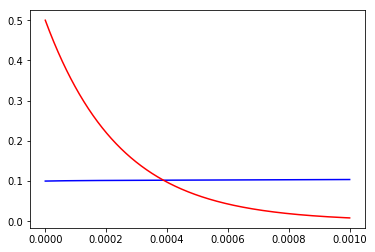

In [191]:
plt.plot(t, sol[:,0], 'b')
plt.plot(t, sol[:,1], 'r')
plt.show()

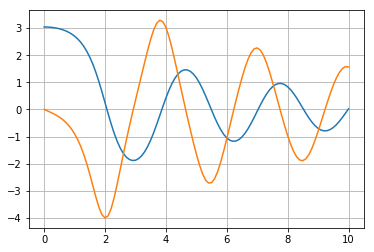

In [111]:
def pend(y, t, b, c):
    theta, omega = y
    omegap = -b*omega - c*np.sin(theta)
    thetap = omega
    dydt = [thetap, omegap]
    return dydt

b = 0.25
c = 5.0

y0 = [np.pi - 0.1, 0.0]
t = np.linspace(0,10,101)

sol = odeint(pend, y0, t, args=(b, c))
plt.plot(t, sol[:,0])
plt.plot(t, sol[:,1])
plt.grid()
plt.show()

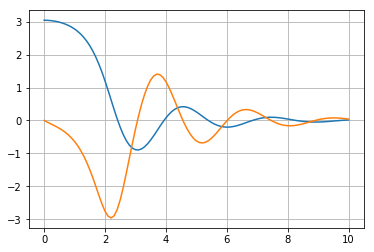

In [97]:
plt.plot(t, sol[:,2])
plt.plot(t, sol[:,3])
plt.grid()
plt.show()

In [62]:
np.exp(0.0000006)

1.00000060000018